## Bidirectional LSTM model na predikciu hodnot DST o 3 hodiny dopredu na zaklade 18-hodinoveho vstupneho okna z atributu DST

Subor: prediction_DST+3_18H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-26 01:24:42.883738: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 3
y_col = f"DST+{shift}"

n_input = 18
atr_count = 1

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])


valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train['DST'].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid['DST'].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test['DST'].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  18


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 18, 1)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 18, 256)             │         133,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 18, 128)             │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 18, 1)               │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 18)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              19 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 330,388 (1.26 MB)

 Trainable params: 330,388 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:17:25 5s/step - loss: 0.4391 - mae: 0.6188

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 123ms/step - loss: 0.4788 - mae: 0.6350

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.4454 - mae: 0.5961

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 113ms/step - loss: 0.4105 - mae: 0.5587

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 113ms/step - loss: 0.3874 - mae: 0.5312

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 0.3718 - mae: 0.5130

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 111ms/step - loss: 0.3690 - mae: 0.5029

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 110ms/step - loss: 0.3699 - mae: 0.4968

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 110ms/step - loss: 0.3726 - mae: 0.4925

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 109ms/step - loss: 0.3721 - mae: 0.4874

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 108ms/step - loss: 0.3718 - mae: 0.4833

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 107ms/step - loss: 0.3698 - mae: 0.4787

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 107ms/step - loss: 0.3672 - mae: 0.4741

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 107ms/step - loss: 0.3639 - mae: 0.4694

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 106ms/step - loss: 0.3608 - mae: 0.4650

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 106ms/step - loss: 0.3581 - mae: 0.4615

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 106ms/step - loss: 0.3558 - mae: 0.4586

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 106ms/step - loss: 0.3536 - mae: 0.4559

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 106ms/step - loss: 0.3519 - mae: 0.4536

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 0.3506 - mae: 0.4515

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 0.3495 - mae: 0.4498

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.3481 - mae: 0.4478

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.3465 - mae: 0.4458

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.3447 - mae: 0.4436

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.3427 - mae: 0.4415

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.3409 - mae: 0.4395

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.3391 - mae: 0.4375

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 105ms/step - loss: 0.3376 - mae: 0.4358

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 105ms/step - loss: 0.3361 - mae: 0.4342

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.3349 - mae: 0.4327

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.3337 - mae: 0.4313

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.3325 - mae: 0.4300

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.3313 - mae: 0.4286

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.3300 - mae: 0.4273

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.3290 - mae: 0.4261

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.3290 - mae: 0.4253

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.3291 - mae: 0.4246

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.3290 - mae: 0.4239

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.3289 - mae: 0.4231

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step - loss: 0.3287 - mae: 0.4224

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.3285 - mae: 0.4217

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.3281 - mae: 0.4210

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.3277 - mae: 0.4202

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.3272 - mae: 0.4194

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.3268 - mae: 0.4187

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.3263 - mae: 0.4180

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.3259 - mae: 0.4173

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step - loss: 0.3255 - mae: 0.4166

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.3250 - mae: 0.4159

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.3246 - mae: 0.4153

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.3241 - mae: 0.4146

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.3237 - mae: 0.4140

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.3233 - mae: 0.4134

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.3230 - mae: 0.4128

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.3226 - mae: 0.4122

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.3222 - mae: 0.4116

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 104ms/step - loss: 0.3218 - mae: 0.4111

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 104ms/step - loss: 0.3213 - mae: 0.4105

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 104ms/step - loss: 0.3208 - mae: 0.4099

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 104ms/step - loss: 0.3204 - mae: 0.4093

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 104ms/step - loss: 0.3198 - mae: 0.4087

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 104ms/step - loss: 0.3193 - mae: 0.4082

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 104ms/step - loss: 0.3188 - mae: 0.4076

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 104ms/step - loss: 0.3183 - mae: 0.4070

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 104ms/step - loss: 0.3180 - mae: 0.4065

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 104ms/step - loss: 0.3179 - mae: 0.4061

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.3178 - mae: 0.4056

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.3177 - mae: 0.4052

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.3175 - mae: 0.4047

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.3173 - mae: 0.4043

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.3171 - mae: 0.4038

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.3169 - mae: 0.4034

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.3166 - mae: 0.4029

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.3166 - mae: 0.4025

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.3167 - mae: 0.4022

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.3166 - mae: 0.4018

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.3166 - mae: 0.4014

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 104ms/step - loss: 0.3166 - mae: 0.4010

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 104ms/step - loss: 0.3165 - mae: 0.4006

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 104ms/step - loss: 0.3165 - mae: 0.4003

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 104ms/step - loss: 0.3165 - mae: 0.3999

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 104ms/step - loss: 0.3164 - mae: 0.3996

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 104ms/step - loss: 0.3163 - mae: 0.3992

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 104ms/step - loss: 0.3163 - mae: 0.3989

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 104ms/step - loss: 0.3161 - mae: 0.3985

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.3160 - mae: 0.3982

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.3159 - mae: 0.3978

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.3157 - mae: 0.3975

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.3156 - mae: 0.3971

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.3154 - mae: 0.3968

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.3152 - mae: 0.3964

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.3150 - mae: 0.3961

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.3148 - mae: 0.3957

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.3145 - mae: 0.3954

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.3143 - mae: 0.3950

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.3140 - mae: 0.3947

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.3138 - mae: 0.3943

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.3135 - mae: 0.3940

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.3133 - mae: 0.3936

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.3131 - mae: 0.3933

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.3129 - mae: 0.3930

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.3127 - mae: 0.3927

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.3125 - mae: 0.3924

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.3123 - mae: 0.3921

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.3121 - mae: 0.3918

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.3120 - mae: 0.3916

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.3118 - mae: 0.3913

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.3116 - mae: 0.3910

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.3114 - mae: 0.3907

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.3113 - mae: 0.3905

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.3111 - mae: 0.3902

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.3110 - mae: 0.3900

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.3108 - mae: 0.3897

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.3107 - mae: 0.3895

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.3105 - mae: 0.3892

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.3104 - mae: 0.3890

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.3102 - mae: 0.3888

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.3100 - mae: 0.3885

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.3098 - mae: 0.3883

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.3096 - mae: 0.3880

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.3094 - mae: 0.3878

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.3092 - mae: 0.3875

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.3090 - mae: 0.3872

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.3088 - mae: 0.3870

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.3086 - mae: 0.3867

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.3083 - mae: 0.3865

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.3081 - mae: 0.3862

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.3079 - mae: 0.3859

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.3077 - mae: 0.3857

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.3075 - mae: 0.3854

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.3073 - mae: 0.3852

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.3070 - mae: 0.3849

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.3068 - mae: 0.3847

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.3066 - mae: 0.3844

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.3064 - mae: 0.3842

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.3062 - mae: 0.3840

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.3060 - mae: 0.3837

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.3058 - mae: 0.3835

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.3056 - mae: 0.3832

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.3054 - mae: 0.3830

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.3051 - mae: 0.3828

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.3049 - mae: 0.3825

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.3047 - mae: 0.3823

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.3045 - mae: 0.3821

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.3043 - mae: 0.3819

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.3041 - mae: 0.3816

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.3039 - mae: 0.3814

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.3037 - mae: 0.3812

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.3034 - mae: 0.3810

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.3032 - mae: 0.3807

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.3030 - mae: 0.3805

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.3028 - mae: 0.3803

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.3026 - mae: 0.3801

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.3024 - mae: 0.3799

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.3022 - mae: 0.3797

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.3020 - mae: 0.3794

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.3018 - mae: 0.3792

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.3015 - mae: 0.3790

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.3013 - mae: 0.3788

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.3011 - mae: 0.3786

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.3009 - mae: 0.3783

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.3006 - mae: 0.3781

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.3005 - mae: 0.3779

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.3003 - mae: 0.3777

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.3001 - mae: 0.3775

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.2999 - mae: 0.3773

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.2997 - mae: 0.3771

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.2995 - mae: 0.3769

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.2994 - mae: 0.3768

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.2992 - mae: 0.3766

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.2990 - mae: 0.3764

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.2989 - mae: 0.3762

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.2987 - mae: 0.3760

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.2985 - mae: 0.3758

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.2983 - mae: 0.3756

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.2982 - mae: 0.3755

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.2980 - mae: 0.3753

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.2978 - mae: 0.3751

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.2977 - mae: 0.3749

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.2975 - mae: 0.3747

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.2974 - mae: 0.3746

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.2972 - mae: 0.3744

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.2971 - mae: 0.3742

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.2969 - mae: 0.3741

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.2967 - mae: 0.3739

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.2966 - mae: 0.3737

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.2964 - mae: 0.3735

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.2963 - mae: 0.3734

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.2961 - mae: 0.3732

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.2960 - mae: 0.3730

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.2958 - mae: 0.3729

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.2956 - mae: 0.3727

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.2955 - mae: 0.3725

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.2953 - mae: 0.3724

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.2951 - mae: 0.3722

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.2950 - mae: 0.3720

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.2948 - mae: 0.3719

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.2946 - mae: 0.3717

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.2945 - mae: 0.3715

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.2943 - mae: 0.3714

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.2941 - mae: 0.3712

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.2939 - mae: 0.3710

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.2938 - mae: 0.3709

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.2936 - mae: 0.3707

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.2934 - mae: 0.3705

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.2932 - mae: 0.3704

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.2931 - mae: 0.3702

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.2929 - mae: 0.3701

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.2927 - mae: 0.3699

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.2925 - mae: 0.3697

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.2924 - mae: 0.3696

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.2922 - mae: 0.3694

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.2920 - mae: 0.3692

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.2918 - mae: 0.3691

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.2917 - mae: 0.3689

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.2915 - mae: 0.3688

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.2913 - mae: 0.3686

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.2911 - mae: 0.3684

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.2909 - mae: 0.3683

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.2908 - mae: 0.3681

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.2906 - mae: 0.3680

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.2904 - mae: 0.3678

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.2903 - mae: 0.3677

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.2901 - mae: 0.3675

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.2900 - mae: 0.3674

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.2898 - mae: 0.3672

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.2896 - mae: 0.3671

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.2895 - mae: 0.3670

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.2893 - mae: 0.3668

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.2892 - mae: 0.3667

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.2890 - mae: 0.3665

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.2889 - mae: 0.3664

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.2887 - mae: 0.3662

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.2886 - mae: 0.3661

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.2884 - mae: 0.3660

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.2883 - mae: 0.3658

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.2881 - mae: 0.3657

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.2880 - mae: 0.3655

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.2878 - mae: 0.3654

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2877 - mae: 0.3653

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.2875 - mae: 0.3651

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.2874 - mae: 0.3650

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2873 - mae: 0.3649

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2872 - mae: 0.3648

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2871 - mae: 0.3647

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2869 - mae: 0.3645

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2868 - mae: 0.3644

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2867 - mae: 0.3643

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2866 - mae: 0.3642

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2865 - mae: 0.3640

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2863 - mae: 0.3639

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2862 - mae: 0.3638

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2861 - mae: 0.3637

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2860 - mae: 0.3636

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2859 - mae: 0.3634

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2857 - mae: 0.3633

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2856 - mae: 0.3632

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2855 - mae: 0.3631

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2854 - mae: 0.3630

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2853 - mae: 0.3629

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2852 - mae: 0.3628

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2850 - mae: 0.3626

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2849 - mae: 0.3625

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2848 - mae: 0.3624

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2847 - mae: 0.3623

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2846 - mae: 0.3622

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2844 - mae: 0.3621

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2843 - mae: 0.3620

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2842 - mae: 0.3619

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2841 - mae: 0.3617

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2840 - mae: 0.3616

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2839 - mae: 0.3615

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2838 - mae: 0.3614

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2837 - mae: 0.3613

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2836 - mae: 0.3612

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2834 - mae: 0.3611

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2833 - mae: 0.3610

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2832 - mae: 0.3609

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2831 - mae: 0.3608

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2831 - mae: 0.3607

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2830 - mae: 0.3606

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2829 - mae: 0.3605

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2828 - mae: 0.3604

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2827 - mae: 0.3603

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2826 - mae: 0.3602

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2825 - mae: 0.3601

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2825 - mae: 0.3600

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2824 - mae: 0.3599

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2823 - mae: 0.3599

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2822 - mae: 0.3598

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2822 - mae: 0.3597

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2821 - mae: 0.3596

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2820 - mae: 0.3595

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2819 - mae: 0.3594 

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2819 - mae: 0.3594

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2818 - mae: 0.3593

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2817 - mae: 0.3592

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2817 - mae: 0.3591

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2816 - mae: 0.3591

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2815 - mae: 0.3590

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2814 - mae: 0.3589

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2814 - mae: 0.3588

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2813 - mae: 0.3587

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2812 - mae: 0.3587

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2812 - mae: 0.3586

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2811 - mae: 0.3585

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2810 - mae: 0.3584

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2809 - mae: 0.3584

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2809 - mae: 0.3583

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2808 - mae: 0.3582

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2807 - mae: 0.3581

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2806 - mae: 0.3581 

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2806 - mae: 0.3580

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2805 - mae: 0.3579

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2804 - mae: 0.3578

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2804 - mae: 0.3578

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2803 - mae: 0.3577

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2802 - mae: 0.3576

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2802 - mae: 0.3575

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2801 - mae: 0.3575

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2800 - mae: 0.3574

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2800 - mae: 0.3573

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2799 - mae: 0.3573

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2798 - mae: 0.3572

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2798 - mae: 0.3571

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2797 - mae: 0.3570

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2796 - mae: 0.3570

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2795 - mae: 0.3569

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2795 - mae: 0.3568

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2794 - mae: 0.3568

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2793 - mae: 0.3567

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2793 - mae: 0.3566

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2792 - mae: 0.3566

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2791 - mae: 0.3565

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2791 - mae: 0.3564

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2790 - mae: 0.3563

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2789 - mae: 0.3563

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2789 - mae: 0.3562

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2788 - mae: 0.3561

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2787 - mae: 0.3561

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2787 - mae: 0.3560

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2786 - mae: 0.3560

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2786 - mae: 0.3559

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2785 - mae: 0.3558

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2785 - mae: 0.3558

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2784 - mae: 0.3557

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2784 - mae: 0.3556

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2783 - mae: 0.3556

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2783 - mae: 0.3555

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2782 - mae: 0.3555

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2782 - mae: 0.3554

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2781 - mae: 0.3553

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2781 - mae: 0.3553

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2780 - mae: 0.3552

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2780 - mae: 0.3552

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2779 - mae: 0.3551

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2779 - mae: 0.3551

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2778 - mae: 0.3550

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2778 - mae: 0.3549

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2777 - mae: 0.3549

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2777 - mae: 0.3548

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2776 - mae: 0.3548

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2776 - mae: 0.3547

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2775 - mae: 0.3547

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2775 - mae: 0.3546

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2774 - mae: 0.3546

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2774 - mae: 0.3545

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2774 - mae: 0.3545

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2773 - mae: 0.3544

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2773 - mae: 0.3543

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2772 - mae: 0.3543

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2772 - mae: 0.3542

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2771 - mae: 0.3542

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2771 - mae: 0.3541

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2770 - mae: 0.3541

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2770 - mae: 0.3540

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2769 - mae: 0.3540

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2769 - mae: 0.3539

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2768 - mae: 0.3538

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2768 - mae: 0.3538

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2767 - mae: 0.3537

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2767 - mae: 0.3537

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2766 - mae: 0.3536

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2766 - mae: 0.3536

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2766 - mae: 0.3535

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2765 - mae: 0.3535

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2765 - mae: 0.3534

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2764 - mae: 0.3533

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2764 - mae: 0.3533

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2763 - mae: 0.3532

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2763 - mae: 0.3532

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2762 - mae: 0.3531

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2762 - mae: 0.3531

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2761 - mae: 0.3530

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2761 - mae: 0.3530

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2760 - mae: 0.3529

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2760 - mae: 0.3529

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2759 - mae: 0.3528

399/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2759 - mae: 0.3527

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2758 - mae: 0.3527

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2758 - mae: 0.3526

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2757 - mae: 0.3526

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2757 - mae: 0.3525

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2756 - mae: 0.3525

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2756 - mae: 0.3524

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2755 - mae: 0.3524

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2754 - mae: 0.3523

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2754 - mae: 0.3522

409/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2753 - mae: 0.3522

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2753 - mae: 0.3521

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2752 - mae: 0.3521

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2752 - mae: 0.3520

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2751 - mae: 0.3520

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2751 - mae: 0.3519

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2750 - mae: 0.3519

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2750 - mae: 0.3518

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2749 - mae: 0.3518

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2749 - mae: 0.3517

419/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2748 - mae: 0.3516

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2748 - mae: 0.3516

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2747 - mae: 0.3515

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2747 - mae: 0.3515

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2746 - mae: 0.3514

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2746 - mae: 0.3514

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2745 - mae: 0.3513

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2744 - mae: 0.3513

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2744 - mae: 0.3512

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2743 - mae: 0.3511

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2743 - mae: 0.3511

430/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2742 - mae: 0.3510

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2742 - mae: 0.3510

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2741 - mae: 0.3509

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2741 - mae: 0.3509

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2740 - mae: 0.3508

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2740 - mae: 0.3508

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2739 - mae: 0.3507

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2739 - mae: 0.3507

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2738 - mae: 0.3506

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2738 - mae: 0.3506

440/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2737 - mae: 0.3505

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2737 - mae: 0.3505

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2736 - mae: 0.3504

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2736 - mae: 0.3504

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2735 - mae: 0.3503

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2735 - mae: 0.3503

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2734 - mae: 0.3502

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2734 - mae: 0.3502

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2733 - mae: 0.3501

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2733 - mae: 0.3501

450/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2732 - mae: 0.3500

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2732 - mae: 0.3500

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2731 - mae: 0.3499

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2731 - mae: 0.3499

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2730 - mae: 0.3498

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2730 - mae: 0.3498

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2729 - mae: 0.3497

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2729 - mae: 0.3497

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2729 - mae: 0.3496

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2728 - mae: 0.3496

460/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2728 - mae: 0.3495

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2728 - mae: 0.3495

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2727 - mae: 0.3494

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2727 - mae: 0.3494

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2727 - mae: 0.3493

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2726 - mae: 0.3493

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2726 - mae: 0.3493

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2726 - mae: 0.3492

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2725 - mae: 0.3492

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2725 - mae: 0.3491

470/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2725 - mae: 0.3491

471/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2724 - mae: 0.3490

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2724 - mae: 0.3490

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2724 - mae: 0.3490

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2724 - mae: 0.3489

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2723 - mae: 0.3489

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2723 - mae: 0.3488

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2723 - mae: 0.3488

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2723 - mae: 0.3488

479/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2723 - mae: 0.3487

480/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2723 - mae: 0.3487

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2722 - mae: 0.3486

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2722 - mae: 0.3486

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2722 - mae: 0.3486

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2722 - mae: 0.3485

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2722 - mae: 0.3485

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2722 - mae: 0.3485

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2721 - mae: 0.3484

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2721 - mae: 0.3484

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2721 - mae: 0.3484

490/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2721 - mae: 0.3483

491/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2721 - mae: 0.3483

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2721 - mae: 0.3482

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2720 - mae: 0.3482

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2720 - mae: 0.3482

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2720 - mae: 0.3481

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2720 - mae: 0.3481

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2720 - mae: 0.3481

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2719 - mae: 0.3480

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2719 - mae: 0.3480

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2719 - mae: 0.3480

501/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2719 - mae: 0.3479

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2719 - mae: 0.3479

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2719 - mae: 0.3479

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2718 - mae: 0.3478

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2718 - mae: 0.3478

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2718 - mae: 0.3477

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2718 - mae: 0.3477

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2718 - mae: 0.3477

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2717 - mae: 0.3476

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2717 - mae: 0.3476

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2717 - mae: 0.3476

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2717 - mae: 0.3475

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2716 - mae: 0.3475

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2716 - mae: 0.3475

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2716 - mae: 0.3474

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2716 - mae: 0.3474

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2716 - mae: 0.3474

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2715 - mae: 0.3473

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2715 - mae: 0.3473

520/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2715 - mae: 0.3473

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2715 - mae: 0.3472

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2715 - mae: 0.3472

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2714 - mae: 0.3471

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2714 - mae: 0.3471

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2714 - mae: 0.3471

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2714 - mae: 0.3470

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2713 - mae: 0.3470

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2713 - mae: 0.3470

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2713 - mae: 0.3469

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2713 - mae: 0.3469

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2713 - mae: 0.3469

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2712 - mae: 0.3468

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2712 - mae: 0.3468

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2712 - mae: 0.3468

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2712 - mae: 0.3467

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2711 - mae: 0.3467

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2711 - mae: 0.3467

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2711 - mae: 0.3466

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2711 - mae: 0.3466

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2710 - mae: 0.3466

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2710 - mae: 0.3465

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2710 - mae: 0.3465

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2710 - mae: 0.3465

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2709 - mae: 0.3464

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2709 - mae: 0.3464

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2709 - mae: 0.3464

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2709 - mae: 0.3463

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2709 - mae: 0.3463

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2708 - mae: 0.3463

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2708 - mae: 0.3463

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2708 - mae: 0.3462

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2708 - mae: 0.3462

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2707 - mae: 0.3462

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2707 - mae: 0.3461

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2707 - mae: 0.3461

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2707 - mae: 0.3461

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2706 - mae: 0.3460

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2706 - mae: 0.3460

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2706 - mae: 0.3460

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2706 - mae: 0.3459

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2705 - mae: 0.3459

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2705 - mae: 0.3459

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2705 - mae: 0.3458

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2705 - mae: 0.3458

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2704 - mae: 0.3458

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2704 - mae: 0.3457

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2704 - mae: 0.3457

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2704 - mae: 0.3457

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2703 - mae: 0.3457

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2703 - mae: 0.3456

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2703 - mae: 0.3456

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2703 - mae: 0.3456

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2702 - mae: 0.3455

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2702 - mae: 0.3455

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2702 - mae: 0.3455

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2702 - mae: 0.3454

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2701 - mae: 0.3454

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2701 - mae: 0.3454

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2701 - mae: 0.3454

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2701 - mae: 0.3453

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2700 - mae: 0.3453

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2700 - mae: 0.3453

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2700 - mae: 0.3452

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2700 - mae: 0.3452

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2700 - mae: 0.3452

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2699 - mae: 0.3451

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2699 - mae: 0.3451

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2699 - mae: 0.3451

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2699 - mae: 0.3451

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2698 - mae: 0.3450

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2698 - mae: 0.3450

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2698 - mae: 0.3450

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2698 - mae: 0.3449

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2697 - mae: 0.3449

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2697 - mae: 0.3449

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2697 - mae: 0.3449

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2697 - mae: 0.3448

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2696 - mae: 0.3448

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2696 - mae: 0.3448

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2696 - mae: 0.3447

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2695 - mae: 0.3447

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2695 - mae: 0.3447

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2695 - mae: 0.3447

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2695 - mae: 0.3446

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2694 - mae: 0.3446

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2694 - mae: 0.3446

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2694 - mae: 0.3445

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2694 - mae: 0.3445

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2693 - mae: 0.3445

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2693 - mae: 0.3444

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2693 - mae: 0.3444

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2692 - mae: 0.3444

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2692 - mae: 0.3444

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2692 - mae: 0.3443

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2692 - mae: 0.3443

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2691 - mae: 0.3443

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2691 - mae: 0.3442

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2691 - mae: 0.3442

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2690 - mae: 0.3442

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2690 - mae: 0.3441

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2690 - mae: 0.3441

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2689 - mae: 0.3441

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2689 - mae: 0.3441

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2689 - mae: 0.3440

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2689 - mae: 0.3440

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2688 - mae: 0.3440

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2688 - mae: 0.3439

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2688 - mae: 0.3439

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2688 - mae: 0.3439

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2687 - mae: 0.3439

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2687 - mae: 0.3438

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2687 - mae: 0.3438

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2686 - mae: 0.3438

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2686 - mae: 0.3437

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2686 - mae: 0.3437

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2685 - mae: 0.3437

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2685 - mae: 0.3436

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2685 - mae: 0.3436

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2685 - mae: 0.3436

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2684 - mae: 0.3436

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2684 - mae: 0.3435

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2684 - mae: 0.3435

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2684 - mae: 0.3435

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2683 - mae: 0.3434

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2683 - mae: 0.3434

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2683 - mae: 0.3434

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2682 - mae: 0.3434

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2682 - mae: 0.3433

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2682 - mae: 0.3433

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2682 - mae: 0.3433

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2681 - mae: 0.3432

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2681 - mae: 0.3432

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2681 - mae: 0.3432

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2680 - mae: 0.3432

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2680 - mae: 0.3431

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2680 - mae: 0.3431

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2680 - mae: 0.3431

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2679 - mae: 0.3430

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2679 - mae: 0.3430

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2679 - mae: 0.3430

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2678 - mae: 0.3429

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2678 - mae: 0.3429

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2678 - mae: 0.3429

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2678 - mae: 0.3429

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2677 - mae: 0.3428

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2677 - mae: 0.3428

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2677 - mae: 0.3428

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2677 - mae: 0.3428

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2676 - mae: 0.3427

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2676 - mae: 0.3427

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2676 - mae: 0.3427

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2676 - mae: 0.3426

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2675 - mae: 0.3426

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2675 - mae: 0.3426

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2675 - mae: 0.3426

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2675 - mae: 0.3425

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2675 - mae: 0.3425

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2675 - mae: 0.3425

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2674 - mae: 0.3425

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2674 - mae: 0.3424

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2674 - mae: 0.3424

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2674 - mae: 0.3424

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2674 - mae: 0.3424

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2674 - mae: 0.3423

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2674 - mae: 0.3423

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2674 - mae: 0.3423

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2673 - mae: 0.3423

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2673 - mae: 0.3422

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2673 - mae: 0.3422

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2673 - mae: 0.3422

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2673 - mae: 0.3422

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2673 - mae: 0.3422

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2673 - mae: 0.3421

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2672 - mae: 0.3421

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2672 - mae: 0.3421

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2672 - mae: 0.3421

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2672 - mae: 0.3420

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2672 - mae: 0.3420

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2672 - mae: 0.3420

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2672 - mae: 0.3420

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2672 - mae: 0.3419

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2671 - mae: 0.3419

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2671 - mae: 0.3419

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2671 - mae: 0.3419

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2671 - mae: 0.3418

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2671 - mae: 0.3418

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2671 - mae: 0.3418

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2671 - mae: 0.3418

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2671 - mae: 0.3418

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2670 - mae: 0.3417

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2670 - mae: 0.3417

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2670 - mae: 0.3417

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2670 - mae: 0.3417

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2670 - mae: 0.3416

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2670 - mae: 0.3416

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2670 - mae: 0.3416

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2669 - mae: 0.3416

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2669 - mae: 0.3415

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2669 - mae: 0.3415

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2669 - mae: 0.3415

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2669 - mae: 0.3415

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2669 - mae: 0.3415

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2669 - mae: 0.3414

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2669 - mae: 0.3414

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2668 - mae: 0.3414

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2668 - mae: 0.3414

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2668 - mae: 0.3413

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2668 - mae: 0.3413

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2668 - mae: 0.3413

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2668 - mae: 0.3413

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2668 - mae: 0.3413

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2667 - mae: 0.3412

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2667 - mae: 0.3412

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2667 - mae: 0.3412

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2667 - mae: 0.3412

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2667 - mae: 0.3411

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2667 - mae: 0.3411

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2667 - mae: 0.3411

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2666 - mae: 0.3411

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2666 - mae: 0.3411

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2666 - mae: 0.3410

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2666 - mae: 0.3410

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2666 - mae: 0.3410

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2666 - mae: 0.3410

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2665 - mae: 0.3410

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2665 - mae: 0.3409

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2665 - mae: 0.3409

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2665 - mae: 0.3409

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2665 - mae: 0.3409

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2665 - mae: 0.3408

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2665 - mae: 0.3408

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2664 - mae: 0.3408

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2664 - mae: 0.3408

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2664 - mae: 0.3408

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2664 - mae: 0.3407

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2664 - mae: 0.3407

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2663 - mae: 0.3407

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2663 - mae: 0.3407

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2663 - mae: 0.3406

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2663 - mae: 0.3406

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2663 - mae: 0.3406

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2663 - mae: 0.3406

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2663 - mae: 0.3406

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2662 - mae: 0.3405

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2662 - mae: 0.3405

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2662 - mae: 0.3405

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2662 - mae: 0.3405

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2662 - mae: 0.3404

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2662 - mae: 0.3404

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2661 - mae: 0.3404

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2661 - mae: 0.3404

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2661 - mae: 0.3404

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.2661 - mae: 0.3403

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2661 - mae: 0.3403

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2661 - mae: 0.3403

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2660 - mae: 0.3403

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2660 - mae: 0.3403

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2660 - mae: 0.3402

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2660 - mae: 0.3402

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2660 - mae: 0.3402

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2660 - mae: 0.3402

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2660 - mae: 0.3402

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.2659 - mae: 0.3401

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2659 - mae: 0.3401

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2659 - mae: 0.3401

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2659 - mae: 0.3401

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2659 - mae: 0.3401

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2659 - mae: 0.3400

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2659 - mae: 0.3400

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2658 - mae: 0.3400

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2658 - mae: 0.3400

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2658 - mae: 0.3399

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.2658 - mae: 0.3399

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2658 - mae: 0.3399 

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2658 - mae: 0.3399

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2657 - mae: 0.3399

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2657 - mae: 0.3398

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2657 - mae: 0.3398

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2657 - mae: 0.3398

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2657 - mae: 0.3398

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2657 - mae: 0.3398

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2657 - mae: 0.3397

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.2657 - mae: 0.3397

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2656 - mae: 0.3397

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2656 - mae: 0.3397

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2656 - mae: 0.3397

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2656 - mae: 0.3397

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2656 - mae: 0.3396

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2656 - mae: 0.3396

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2656 - mae: 0.3396

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2655 - mae: 0.3396

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2655 - mae: 0.3396

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2655 - mae: 0.3395

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2655 - mae: 0.3395

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2655 - mae: 0.3395

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2655 - mae: 0.3395

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2655 - mae: 0.3395

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2654 - mae: 0.3394

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2654 - mae: 0.3394

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2654 - mae: 0.3394

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2654 - mae: 0.3394

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2654 - mae: 0.3394

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2654 - mae: 0.3393

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2654 - mae: 0.3393

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2653 - mae: 0.3393

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2653 - mae: 0.3393

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2653 - mae: 0.3393

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2653 - mae: 0.3392

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2653 - mae: 0.3392

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2653 - mae: 0.3392

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2653 - mae: 0.3392

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2652 - mae: 0.3392

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2652 - mae: 0.3391

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2652 - mae: 0.3391

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2652 - mae: 0.3391

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2652 - mae: 0.3391

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2652 - mae: 0.3391

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2652 - mae: 0.3390

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2651 - mae: 0.3390

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2651 - mae: 0.3390

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2651 - mae: 0.3390

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2651 - mae: 0.3390

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2651 - mae: 0.3390

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2651 - mae: 0.3389

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2651 - mae: 0.3389

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2650 - mae: 0.3389

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2650 - mae: 0.3389

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2650 - mae: 0.3389

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2650 - mae: 0.3388

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2650 - mae: 0.3388

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2650 - mae: 0.3388

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2649 - mae: 0.3388

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2649 - mae: 0.3388

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2649 - mae: 0.3387

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2649 - mae: 0.3387

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2649 - mae: 0.3387

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2649 - mae: 0.3387

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2649 - mae: 0.3387

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2648 - mae: 0.3387

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2648 - mae: 0.3386

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2648 - mae: 0.3386

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2648 - mae: 0.3386

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2648 - mae: 0.3386

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2648 - mae: 0.3386

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2648 - mae: 0.3385

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2647 - mae: 0.3385

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2647 - mae: 0.3385

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2647 - mae: 0.3385

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2647 - mae: 0.3385

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2647 - mae: 0.3385

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2647 - mae: 0.3384

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2647 - mae: 0.3384

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2647 - mae: 0.3384

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2647 - mae: 0.3384

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2646 - mae: 0.3384

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2646 - mae: 0.3384

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2646 - mae: 0.3383

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2646 - mae: 0.3383

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2646 - mae: 0.3383

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2646 - mae: 0.3383

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2646 - mae: 0.3383

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2646 - mae: 0.3383

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2646 - mae: 0.3382

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2646 - mae: 0.3382

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2646 - mae: 0.3382

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2646 - mae: 0.3382

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2645 - mae: 0.3382

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2645 - mae: 0.3382

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2645 - mae: 0.3381

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2645 - mae: 0.3381

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2645 - mae: 0.3381

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2645 - mae: 0.3381

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2645 - mae: 0.3381

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2645 - mae: 0.3381

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2645 - mae: 0.3381

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2645 - mae: 0.3380


Epoch 1: val_mae improved from inf to 0.36431, saving model to models/DST+3_18H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 101s 107ms/step - loss: 0.2645 - mae: 0.3380 - val_loss: 0.3639 - val_mae: 0.3643


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 143ms/step - loss: 0.1133 - mae: 0.2525

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1235 - mae: 0.2613 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 96ms/step - loss: 0.1852 - mae: 0.2982

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.2015 - mae: 0.3068

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.2046 - mae: 0.3078

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2099 - mae: 0.3100

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2120 - mae: 0.3110

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2127 - mae: 0.3117

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2129 - mae: 0.3124

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2123 - mae: 0.3124

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2107 - mae: 0.3114

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2090 - mae: 0.3104

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2069 - mae: 0.3091

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2046 - mae: 0.3075

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2103 - mae: 0.3082

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2152 - mae: 0.3092

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2191 - mae: 0.3099

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2238 - mae: 0.3111

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2316 - mae: 0.3129

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2383 - mae: 0.3146

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2440 - mae: 0.3160

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2488 - mae: 0.3172

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2542 - mae: 0.3187

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2588 - mae: 0.3200

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2626 - mae: 0.3210

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2659 - mae: 0.3220

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2686 - mae: 0.3227

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2709 - mae: 0.3233

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2728 - mae: 0.3237

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2743 - mae: 0.3240

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2757 - mae: 0.3243

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2768 - mae: 0.3245

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2781 - mae: 0.3248

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2794 - mae: 0.3252

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2804 - mae: 0.3254

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2814 - mae: 0.3257

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2823 - mae: 0.3260

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2832 - mae: 0.3262

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2840 - mae: 0.3265

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2849 - mae: 0.3269

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2857 - mae: 0.3272

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2864 - mae: 0.3275

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2871 - mae: 0.3278

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2876 - mae: 0.3281

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2880 - mae: 0.3283

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2882 - mae: 0.3285

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2885 - mae: 0.3286

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2888 - mae: 0.3288

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2890 - mae: 0.3290

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2894 - mae: 0.3293

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2898 - mae: 0.3296

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2900 - mae: 0.3298

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2904 - mae: 0.3300

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2907 - mae: 0.3303

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2910 - mae: 0.3305

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2912 - mae: 0.3307

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2913 - mae: 0.3309

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2914 - mae: 0.3310

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2914 - mae: 0.3311

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2915 - mae: 0.3312

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.2915 - mae: 0.3313

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.2914 - mae: 0.3314

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.2914 - mae: 0.3314

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.2913 - mae: 0.3314

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.2912 - mae: 0.3314

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.2910 - mae: 0.3314

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2908 - mae: 0.3313

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2907 - mae: 0.3313

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2905 - mae: 0.3313

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2903 - mae: 0.3313

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2901 - mae: 0.3312

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2898 - mae: 0.3312

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2895 - mae: 0.3311

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.2893 - mae: 0.3310

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2890 - mae: 0.3310

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.2887 - mae: 0.3309

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2884 - mae: 0.3308

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.2881 - mae: 0.3307

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2877 - mae: 0.3306

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2874 - mae: 0.3306

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2871 - mae: 0.3305

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2868 - mae: 0.3304

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2864 - mae: 0.3303

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2862 - mae: 0.3302

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2859 - mae: 0.3302

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2856 - mae: 0.3301

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2854 - mae: 0.3300

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2851 - mae: 0.3300

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2848 - mae: 0.3299

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2845 - mae: 0.3298

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2842 - mae: 0.3298

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2839 - mae: 0.3297

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2836 - mae: 0.3296

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2833 - mae: 0.3295

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2830 - mae: 0.3295

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2827 - mae: 0.3294

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2824 - mae: 0.3294

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2821 - mae: 0.3293

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2818 - mae: 0.3292

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2815 - mae: 0.3291

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2812 - mae: 0.3290

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2809 - mae: 0.3290

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2806 - mae: 0.3289

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2803 - mae: 0.3288

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2800 - mae: 0.3287

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2797 - mae: 0.3286

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2793 - mae: 0.3285

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2790 - mae: 0.3284

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2787 - mae: 0.3283

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2784 - mae: 0.3283

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2781 - mae: 0.3282

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2778 - mae: 0.3281

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2775 - mae: 0.3280

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2773 - mae: 0.3279

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2770 - mae: 0.3278

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2766 - mae: 0.3277

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2763 - mae: 0.3276

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2760 - mae: 0.3275

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2758 - mae: 0.3275

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2755 - mae: 0.3274

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2752 - mae: 0.3273

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2749 - mae: 0.3272

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2747 - mae: 0.3271

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2744 - mae: 0.3270

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2741 - mae: 0.3269

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2739 - mae: 0.3268

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2736 - mae: 0.3267

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2734 - mae: 0.3266

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2731 - mae: 0.3265

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2729 - mae: 0.3264

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2726 - mae: 0.3264

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2724 - mae: 0.3263

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2721 - mae: 0.3262

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2719 - mae: 0.3261

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2716 - mae: 0.3260

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2714 - mae: 0.3259

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2711 - mae: 0.3258

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2709 - mae: 0.3257

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2706 - mae: 0.3256

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2704 - mae: 0.3255

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2701 - mae: 0.3254

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2699 - mae: 0.3254

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2696 - mae: 0.3253

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2694 - mae: 0.3252

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2692 - mae: 0.3251

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2690 - mae: 0.3251

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2688 - mae: 0.3250

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2686 - mae: 0.3249

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2683 - mae: 0.3249

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2681 - mae: 0.3248

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2679 - mae: 0.3247

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2677 - mae: 0.3247

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2675 - mae: 0.3246

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2673 - mae: 0.3245

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2671 - mae: 0.3245

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2669 - mae: 0.3244

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2667 - mae: 0.3243

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2665 - mae: 0.3243

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2663 - mae: 0.3242

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2661 - mae: 0.3241

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2659 - mae: 0.3240

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2657 - mae: 0.3240

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2655 - mae: 0.3239

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2653 - mae: 0.3238

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2651 - mae: 0.3238

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2649 - mae: 0.3237

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.2647 - mae: 0.3236

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.2645 - mae: 0.3236

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.2643 - mae: 0.3235

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.2641 - mae: 0.3234

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.2639 - mae: 0.3233

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.2637 - mae: 0.3233

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.2636 - mae: 0.3232

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.2634 - mae: 0.3232

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.2632 - mae: 0.3231

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.2630 - mae: 0.3230

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.2629 - mae: 0.3230

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.2627 - mae: 0.3229

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.2625 - mae: 0.3228

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.2623 - mae: 0.3228

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.2622 - mae: 0.3227

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.2620 - mae: 0.3226

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.2618 - mae: 0.3226

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.2616 - mae: 0.3225

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.2614 - mae: 0.3224

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.2613 - mae: 0.3224

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.2611 - mae: 0.3223

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.2609 - mae: 0.3222

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.2607 - mae: 0.3221

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.2605 - mae: 0.3221

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.2604 - mae: 0.3220

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.2602 - mae: 0.3219

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.2600 - mae: 0.3219

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.2598 - mae: 0.3218

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.2596 - mae: 0.3217

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.2594 - mae: 0.3216

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.2593 - mae: 0.3216

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.2591 - mae: 0.3215

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.2589 - mae: 0.3214

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.2587 - mae: 0.3214

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.2586 - mae: 0.3213

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.2584 - mae: 0.3212

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.2582 - mae: 0.3211

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.2580 - mae: 0.3211

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.2579 - mae: 0.3210

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.2577 - mae: 0.3209

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.2575 - mae: 0.3209

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.2573 - mae: 0.3208

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.2572 - mae: 0.3207

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.2570 - mae: 0.3206

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.2568 - mae: 0.3206

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.2567 - mae: 0.3205

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.2566 - mae: 0.3205

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.2564 - mae: 0.3204

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.2563 - mae: 0.3203

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.2562 - mae: 0.3203

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.2560 - mae: 0.3202

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.2559 - mae: 0.3202

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.2557 - mae: 0.3201

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.2556 - mae: 0.3200

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.2555 - mae: 0.3200

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.2553 - mae: 0.3199

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.2552 - mae: 0.3199

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.2551 - mae: 0.3198

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.2549 - mae: 0.3197

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.2548 - mae: 0.3197

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.2546 - mae: 0.3196

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.2545 - mae: 0.3196

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.2544 - mae: 0.3195

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.2542 - mae: 0.3194

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.2541 - mae: 0.3194

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.2540 - mae: 0.3193

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.2538 - mae: 0.3193

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.2537 - mae: 0.3192

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.2536 - mae: 0.3191

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.2534 - mae: 0.3191

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.2533 - mae: 0.3190

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.2532 - mae: 0.3190

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.2530 - mae: 0.3189

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.2529 - mae: 0.3188

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2528 - mae: 0.3188

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2526 - mae: 0.3187

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2525 - mae: 0.3186

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2524 - mae: 0.3186

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2522 - mae: 0.3185

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2521 - mae: 0.3185

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2520 - mae: 0.3184

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2518 - mae: 0.3183

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2517 - mae: 0.3183

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2516 - mae: 0.3182

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2514 - mae: 0.3182

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2513 - mae: 0.3181

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2512 - mae: 0.3181

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2511 - mae: 0.3180

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2510 - mae: 0.3180

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2509 - mae: 0.3179

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2508 - mae: 0.3178

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2506 - mae: 0.3178

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2505 - mae: 0.3177

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2504 - mae: 0.3177

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2503 - mae: 0.3176

262/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2502 - mae: 0.3176 

263/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2501 - mae: 0.3175

264/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2500 - mae: 0.3175

265/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2499 - mae: 0.3174

266/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2498 - mae: 0.3174

267/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2496 - mae: 0.3173

268/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2495 - mae: 0.3172

269/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2494 - mae: 0.3172

270/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2493 - mae: 0.3171

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2492 - mae: 0.3171

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2491 - mae: 0.3170

273/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2490 - mae: 0.3170

274/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2489 - mae: 0.3169

275/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2488 - mae: 0.3169

276/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2486 - mae: 0.3168

277/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2485 - mae: 0.3168

278/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2484 - mae: 0.3167

279/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2483 - mae: 0.3167

280/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2482 - mae: 0.3166

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2481 - mae: 0.3166

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2480 - mae: 0.3165

283/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2479 - mae: 0.3165

284/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2478 - mae: 0.3164

285/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2477 - mae: 0.3163

286/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2475 - mae: 0.3163

287/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2474 - mae: 0.3162

288/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2473 - mae: 0.3162

289/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2472 - mae: 0.3161

290/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2471 - mae: 0.3161

291/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2470 - mae: 0.3160

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2469 - mae: 0.3160

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2468 - mae: 0.3159

294/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2467 - mae: 0.3159

295/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2466 - mae: 0.3158

296/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2465 - mae: 0.3158

297/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2464 - mae: 0.3157

298/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2463 - mae: 0.3157

299/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2462 - mae: 0.3156

300/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2461 - mae: 0.3156

301/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2460 - mae: 0.3155

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2459 - mae: 0.3155

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2458 - mae: 0.3154

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2457 - mae: 0.3154

305/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2456 - mae: 0.3154

306/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2455 - mae: 0.3153

307/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2455 - mae: 0.3153

308/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2454 - mae: 0.3153

309/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2454 - mae: 0.3152

310/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2453 - mae: 0.3152

311/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2452 - mae: 0.3152

312/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2452 - mae: 0.3151

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2451 - mae: 0.3151

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2451 - mae: 0.3151

315/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2450 - mae: 0.3150

316/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2450 - mae: 0.3150

317/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2449 - mae: 0.3150

318/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2448 - mae: 0.3149

319/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2448 - mae: 0.3149

320/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2447 - mae: 0.3149

321/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2447 - mae: 0.3148

322/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2446 - mae: 0.3148

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2445 - mae: 0.3148

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2445 - mae: 0.3147

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2444 - mae: 0.3147

326/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2444 - mae: 0.3147

327/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2443 - mae: 0.3147

328/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2443 - mae: 0.3146

329/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2442 - mae: 0.3146

330/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2442 - mae: 0.3146

331/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2442 - mae: 0.3146

332/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2441 - mae: 0.3145

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2441 - mae: 0.3145

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2440 - mae: 0.3145

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2440 - mae: 0.3145

336/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.2439 - mae: 0.3144

337/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.2439 - mae: 0.3144

338/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.2438 - mae: 0.3144

339/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.2438 - mae: 0.3144

340/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.2437 - mae: 0.3143

341/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.2437 - mae: 0.3143

342/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.2437 - mae: 0.3143

343/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.2436 - mae: 0.3143

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.2436 - mae: 0.3142

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.2435 - mae: 0.3142

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.2435 - mae: 0.3142

347/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.2435 - mae: 0.3142

348/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.2434 - mae: 0.3141

349/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.2434 - mae: 0.3141

350/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.2433 - mae: 0.3141

351/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.2433 - mae: 0.3141

352/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.2433 - mae: 0.3141

353/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.2432 - mae: 0.3140

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.2432 - mae: 0.3140

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.2431 - mae: 0.3140

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.2431 - mae: 0.3140

357/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.2431 - mae: 0.3139

358/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.2430 - mae: 0.3139

359/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.2430 - mae: 0.3139

360/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.2429 - mae: 0.3139

361/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.2429 - mae: 0.3138

362/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.2428 - mae: 0.3138

363/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.2428 - mae: 0.3138

364/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.2428 - mae: 0.3138

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.2427 - mae: 0.3137

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.2427 - mae: 0.3137

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.2426 - mae: 0.3137

368/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2426 - mae: 0.3137

369/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2425 - mae: 0.3137

370/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2425 - mae: 0.3136

371/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2424 - mae: 0.3136

372/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2424 - mae: 0.3136

373/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2423 - mae: 0.3136

374/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2423 - mae: 0.3135

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2423 - mae: 0.3135

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2422 - mae: 0.3135

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2422 - mae: 0.3135

378/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.2421 - mae: 0.3134

379/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.2421 - mae: 0.3134

380/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.2420 - mae: 0.3134

381/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.2420 - mae: 0.3133

382/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.2419 - mae: 0.3133

383/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.2419 - mae: 0.3133

384/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.2418 - mae: 0.3133

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.2418 - mae: 0.3132

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.2417 - mae: 0.3132

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.2417 - mae: 0.3132

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.2416 - mae: 0.3132

389/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.2415 - mae: 0.3131

390/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.2415 - mae: 0.3131

391/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.2414 - mae: 0.3131

392/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.2414 - mae: 0.3130

393/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.2413 - mae: 0.3130

394/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.2413 - mae: 0.3130

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.2412 - mae: 0.3130

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.2412 - mae: 0.3129

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.2411 - mae: 0.3129

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.2411 - mae: 0.3129

399/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.2410 - mae: 0.3129

400/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.2410 - mae: 0.3128

401/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.2409 - mae: 0.3128

402/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.2409 - mae: 0.3128

403/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.2409 - mae: 0.3128

404/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.2408 - mae: 0.3127

405/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2408 - mae: 0.3127

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2408 - mae: 0.3127

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2407 - mae: 0.3127

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2407 - mae: 0.3127

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2407 - mae: 0.3126

410/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2406 - mae: 0.3126

411/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2406 - mae: 0.3126

412/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2406 - mae: 0.3126

413/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2405 - mae: 0.3126

414/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2405 - mae: 0.3126

415/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.2405 - mae: 0.3125

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2404 - mae: 0.3125

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2404 - mae: 0.3125

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2404 - mae: 0.3125

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2403 - mae: 0.3125

420/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2403 - mae: 0.3124

421/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2403 - mae: 0.3124

422/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2402 - mae: 0.3124

423/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2402 - mae: 0.3124

424/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2402 - mae: 0.3124

425/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2401 - mae: 0.3123

426/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2401 - mae: 0.3123

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2401 - mae: 0.3123

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2400 - mae: 0.3123

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2400 - mae: 0.3122

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2399 - mae: 0.3122

431/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2399 - mae: 0.3122

432/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2399 - mae: 0.3122

433/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2398 - mae: 0.3122

434/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2398 - mae: 0.3121

435/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2398 - mae: 0.3121

436/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2397 - mae: 0.3121

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2397 - mae: 0.3121

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2396 - mae: 0.3121

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2396 - mae: 0.3120

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.2396 - mae: 0.3120

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.2395 - mae: 0.3120

442/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.2395 - mae: 0.3120

443/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.2394 - mae: 0.3119

444/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.2394 - mae: 0.3119

445/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.2394 - mae: 0.3119

446/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.2393 - mae: 0.3119

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.2393 - mae: 0.3119

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.2393 - mae: 0.3118

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.2392 - mae: 0.3118

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.2392 - mae: 0.3118

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.2391 - mae: 0.3118

452/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.2391 - mae: 0.3118

453/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.2391 - mae: 0.3117

454/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.2390 - mae: 0.3117

455/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.2390 - mae: 0.3117

456/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.2390 - mae: 0.3117

457/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.2389 - mae: 0.3117

458/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.2389 - mae: 0.3116

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.2389 - mae: 0.3116

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.2388 - mae: 0.3116

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.2388 - mae: 0.3116

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.2388 - mae: 0.3116

463/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.2387 - mae: 0.3115

464/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.2387 - mae: 0.3115

465/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.2387 - mae: 0.3115

466/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.2386 - mae: 0.3115

467/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.2386 - mae: 0.3115

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.2386 - mae: 0.3115

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.2385 - mae: 0.3114

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.2385 - mae: 0.3114

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.2385 - mae: 0.3114

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.2384 - mae: 0.3114

473/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.2384 - mae: 0.3114

474/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.2384 - mae: 0.3114

475/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.2383 - mae: 0.3113

476/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.2383 - mae: 0.3113

477/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.2382 - mae: 0.3113

478/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.2382 - mae: 0.3113

479/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.2382 - mae: 0.3113

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.2381 - mae: 0.3112

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.2381 - mae: 0.3112

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.2381 - mae: 0.3112

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.2380 - mae: 0.3112

484/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.2380 - mae: 0.3112

485/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.2380 - mae: 0.3112

486/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.2379 - mae: 0.3111

487/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.2379 - mae: 0.3111

488/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.2379 - mae: 0.3111

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.2378 - mae: 0.3111

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.2378 - mae: 0.3111

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.2378 - mae: 0.3111

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.2377 - mae: 0.3110

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.2377 - mae: 0.3110

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.2376 - mae: 0.3110

495/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.2376 - mae: 0.3110

496/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.2376 - mae: 0.3110

497/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.2375 - mae: 0.3109

498/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.2375 - mae: 0.3109

499/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.2375 - mae: 0.3109

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.2374 - mae: 0.3109

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.2374 - mae: 0.3109

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.2374 - mae: 0.3109

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.2373 - mae: 0.3108

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.2373 - mae: 0.3108

505/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.2373 - mae: 0.3108

506/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.2372 - mae: 0.3108

507/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.2372 - mae: 0.3108

508/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.2371 - mae: 0.3107

509/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.2371 - mae: 0.3107

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.2371 - mae: 0.3107

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.2371 - mae: 0.3107

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.2370 - mae: 0.3107

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.2370 - mae: 0.3107

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.2370 - mae: 0.3106

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.2369 - mae: 0.3106

516/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.2369 - mae: 0.3106

517/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.2369 - mae: 0.3106

518/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.2368 - mae: 0.3106

519/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.2368 - mae: 0.3106

520/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.2368 - mae: 0.3105

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.2367 - mae: 0.3105

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.2367 - mae: 0.3105

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.2367 - mae: 0.3105

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.2366 - mae: 0.3105

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.2366 - mae: 0.3105

526/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.2366 - mae: 0.3105

527/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.2366 - mae: 0.3104

528/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.2365 - mae: 0.3104

529/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.2365 - mae: 0.3104

530/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.2365 - mae: 0.3104

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.2365 - mae: 0.3104

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.2364 - mae: 0.3104

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.2364 - mae: 0.3104

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.2364 - mae: 0.3103

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.2364 - mae: 0.3103

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.2363 - mae: 0.3103

537/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.2363 - mae: 0.3103

538/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.2363 - mae: 0.3103

539/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.2363 - mae: 0.3103

540/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.2362 - mae: 0.3102

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.2362 - mae: 0.3102

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.2362 - mae: 0.3102

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.2361 - mae: 0.3102

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.2361 - mae: 0.3102

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.2361 - mae: 0.3102

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.2361 - mae: 0.3102

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.2360 - mae: 0.3101

548/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.2360 - mae: 0.3101

549/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.2360 - mae: 0.3101

550/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.2360 - mae: 0.3101

551/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.2359 - mae: 0.3101

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.2359 - mae: 0.3101

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.2359 - mae: 0.3101

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.2358 - mae: 0.3100

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.2358 - mae: 0.3100

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.2358 - mae: 0.3100

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.2358 - mae: 0.3100

558/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.2357 - mae: 0.3100

559/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.2357 - mae: 0.3100

560/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.2357 - mae: 0.3099

561/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.2357 - mae: 0.3099

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.2356 - mae: 0.3099

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.2356 - mae: 0.3099

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.2356 - mae: 0.3099

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.2356 - mae: 0.3099

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.2355 - mae: 0.3099

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.2355 - mae: 0.3098

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.2355 - mae: 0.3098

569/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.2355 - mae: 0.3098

570/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.2354 - mae: 0.3098

571/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.2354 - mae: 0.3098

572/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.2354 - mae: 0.3098

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.2354 - mae: 0.3098

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.2354 - mae: 0.3098

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.2353 - mae: 0.3097

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.2353 - mae: 0.3097

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.2353 - mae: 0.3097

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.2353 - mae: 0.3097

579/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.2352 - mae: 0.3097

580/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.2352 - mae: 0.3097

581/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.2352 - mae: 0.3097

582/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.2352 - mae: 0.3096

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.2351 - mae: 0.3096

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.2351 - mae: 0.3096

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.2351 - mae: 0.3096

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.2351 - mae: 0.3096

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.2350 - mae: 0.3096

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.2350 - mae: 0.3096

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.2350 - mae: 0.3095

590/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.2350 - mae: 0.3095

591/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.2349 - mae: 0.3095

592/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.2349 - mae: 0.3095

593/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.2349 - mae: 0.3095

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.2349 - mae: 0.3095

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.2348 - mae: 0.3095

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.2348 - mae: 0.3094

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.2348 - mae: 0.3094

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.2348 - mae: 0.3094

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.2347 - mae: 0.3094

600/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.2347 - mae: 0.3094

601/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.2347 - mae: 0.3094

602/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.2347 - mae: 0.3094

603/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.2346 - mae: 0.3093

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.2346 - mae: 0.3093

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.2346 - mae: 0.3093

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.2346 - mae: 0.3093

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.2345 - mae: 0.3093

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.2345 - mae: 0.3093

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.2345 - mae: 0.3093

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.2345 - mae: 0.3092

611/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.2344 - mae: 0.3092

612/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.2344 - mae: 0.3092

613/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.2344 - mae: 0.3092

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.2344 - mae: 0.3092

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.2343 - mae: 0.3092

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.2343 - mae: 0.3092

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.2343 - mae: 0.3091

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.2343 - mae: 0.3091

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.2342 - mae: 0.3091

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.2342 - mae: 0.3091

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.2342 - mae: 0.3091

622/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.2342 - mae: 0.3091

623/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.2341 - mae: 0.3091

624/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.2341 - mae: 0.3090

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.2341 - mae: 0.3090

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.2341 - mae: 0.3090

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.2340 - mae: 0.3090

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.2340 - mae: 0.3090

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.2340 - mae: 0.3090

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.2340 - mae: 0.3090

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.2339 - mae: 0.3089

632/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.2339 - mae: 0.3089

633/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.2339 - mae: 0.3089

634/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.2339 - mae: 0.3089

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.2338 - mae: 0.3089

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.2338 - mae: 0.3089

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.2338 - mae: 0.3089

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.2338 - mae: 0.3088

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.2337 - mae: 0.3088

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.2337 - mae: 0.3088

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.2337 - mae: 0.3088

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.2337 - mae: 0.3088

643/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.2336 - mae: 0.3088

644/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.2336 - mae: 0.3088

645/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.2336 - mae: 0.3087

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.2336 - mae: 0.3087

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.2335 - mae: 0.3087

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.2335 - mae: 0.3087

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.2335 - mae: 0.3087

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.2335 - mae: 0.3087

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.2334 - mae: 0.3087

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.2334 - mae: 0.3086

653/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.2334 - mae: 0.3086

654/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.2334 - mae: 0.3086

655/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.2334 - mae: 0.3086

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.2333 - mae: 0.3086

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.2333 - mae: 0.3086

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.2333 - mae: 0.3086

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.2333 - mae: 0.3086

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.2332 - mae: 0.3085

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.2332 - mae: 0.3085

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.2332 - mae: 0.3085

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.2332 - mae: 0.3085

664/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.2332 - mae: 0.3085

665/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.2331 - mae: 0.3085

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.2331 - mae: 0.3085

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.2331 - mae: 0.3085

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.2331 - mae: 0.3084

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.2331 - mae: 0.3084

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.2331 - mae: 0.3084

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.2330 - mae: 0.3084

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.2330 - mae: 0.3084

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.2330 - mae: 0.3084

674/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.2330 - mae: 0.3084

675/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.2330 - mae: 0.3084

676/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.2330 - mae: 0.3083

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.2329 - mae: 0.3083

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.2329 - mae: 0.3083

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.2329 - mae: 0.3083

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.2329 - mae: 0.3083

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.2329 - mae: 0.3083

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.2329 - mae: 0.3083

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.2328 - mae: 0.3083

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.2328 - mae: 0.3083

685/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.2328 - mae: 0.3083

686/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.2328 - mae: 0.3082

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.2328 - mae: 0.3082

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.2328 - mae: 0.3082

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.2328 - mae: 0.3082

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.2327 - mae: 0.3082

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.2327 - mae: 0.3082

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.2327 - mae: 0.3082

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.2327 - mae: 0.3082

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.2327 - mae: 0.3082

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.2327 - mae: 0.3082

696/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.2327 - mae: 0.3082

697/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.2326 - mae: 0.3081

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.2326 - mae: 0.3081

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.2326 - mae: 0.3081

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.2326 - mae: 0.3081

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.2326 - mae: 0.3081

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.2326 - mae: 0.3081

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.2326 - mae: 0.3081

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.2326 - mae: 0.3081

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.2325 - mae: 0.3081

706/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.2325 - mae: 0.3081

707/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.2325 - mae: 0.3081

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.2325 - mae: 0.3081

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.2325 - mae: 0.3080

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.2325 - mae: 0.3080

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.2325 - mae: 0.3080

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.2324 - mae: 0.3080

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.2324 - mae: 0.3080

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.2324 - mae: 0.3080

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.2324 - mae: 0.3080

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.2324 - mae: 0.3080

717/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.2324 - mae: 0.3080

718/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.2324 - mae: 0.3080

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.2323 - mae: 0.3080

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.2323 - mae: 0.3079

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.2323 - mae: 0.3079

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.2323 - mae: 0.3079

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.2323 - mae: 0.3079

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.2323 - mae: 0.3079

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.2322 - mae: 0.3079

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.2322 - mae: 0.3079

727/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.2322 - mae: 0.3079

728/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.2322 - mae: 0.3079

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.2322 - mae: 0.3079

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.2322 - mae: 0.3079

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.2321 - mae: 0.3078

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.2321 - mae: 0.3078

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.2321 - mae: 0.3078

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.2321 - mae: 0.3078

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.2321 - mae: 0.3078

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.2321 - mae: 0.3078

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.2320 - mae: 0.3078

738/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.2320 - mae: 0.3078

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.2320 - mae: 0.3078

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.2320 - mae: 0.3078

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.2320 - mae: 0.3077

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.2320 - mae: 0.3077

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.2319 - mae: 0.3077

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.2319 - mae: 0.3077

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.2319 - mae: 0.3077

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.2319 - mae: 0.3077

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.2319 - mae: 0.3077

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.2319 - mae: 0.3077

749/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.2319 - mae: 0.3077

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.2318 - mae: 0.3077

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.2318 - mae: 0.3077

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.2318 - mae: 0.3077

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.2318 - mae: 0.3076

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.2318 - mae: 0.3076

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.2318 - mae: 0.3076

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.2317 - mae: 0.3076

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.2317 - mae: 0.3076

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.2317 - mae: 0.3076

759/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.2317 - mae: 0.3076

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.2317 - mae: 0.3076

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.2317 - mae: 0.3076

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.2316 - mae: 0.3076

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.2316 - mae: 0.3076

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.2316 - mae: 0.3075

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.2316 - mae: 0.3075

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.2316 - mae: 0.3075

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.2316 - mae: 0.3075

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.2315 - mae: 0.3075

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.2315 - mae: 0.3075

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.2315 - mae: 0.3075

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.2315 - mae: 0.3075

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.2315 - mae: 0.3075

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.2315 - mae: 0.3075

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.2314 - mae: 0.3075

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.2314 - mae: 0.3074

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.2314 - mae: 0.3074

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.2314 - mae: 0.3074

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.2314 - mae: 0.3074

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.2314 - mae: 0.3074

780/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.2313 - mae: 0.3074

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.2313 - mae: 0.3074

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.2313 - mae: 0.3074

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.2313 - mae: 0.3074

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.2313 - mae: 0.3074

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.2313 - mae: 0.3074

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.2312 - mae: 0.3073

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.2312 - mae: 0.3073

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.2312 - mae: 0.3073

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.2312 - mae: 0.3073

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.2312 - mae: 0.3073

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.2312 - mae: 0.3073 

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.2311 - mae: 0.3073

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.2311 - mae: 0.3073

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.2311 - mae: 0.3073

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.2311 - mae: 0.3073

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.2311 - mae: 0.3073

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.2311 - mae: 0.3072

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.2310 - mae: 0.3072

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.2310 - mae: 0.3072

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.2310 - mae: 0.3072

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.2310 - mae: 0.3072

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.2310 - mae: 0.3072

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.2310 - mae: 0.3072

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.2309 - mae: 0.3072

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.2309 - mae: 0.3072

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.2309 - mae: 0.3072

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.2309 - mae: 0.3072

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.2309 - mae: 0.3072

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.2309 - mae: 0.3071

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.2308 - mae: 0.3071

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.2308 - mae: 0.3071

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.2308 - mae: 0.3071

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.2308 - mae: 0.3071

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.2308 - mae: 0.3071

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.2308 - mae: 0.3071

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.2307 - mae: 0.3071

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.2307 - mae: 0.3071

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.2307 - mae: 0.3071

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.2307 - mae: 0.3071

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.2307 - mae: 0.3070

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.2306 - mae: 0.3070

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.2306 - mae: 0.3070

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.2306 - mae: 0.3070

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.2306 - mae: 0.3070

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.2306 - mae: 0.3070

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.2306 - mae: 0.3070

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.2305 - mae: 0.3070

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.2305 - mae: 0.3070

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.2305 - mae: 0.3070

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.2305 - mae: 0.3069

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.2305 - mae: 0.3069

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.2305 - mae: 0.3069

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.2304 - mae: 0.3069

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.2304 - mae: 0.3069

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.2304 - mae: 0.3069

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.2304 - mae: 0.3069

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.2304 - mae: 0.3069

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.2303 - mae: 0.3069

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.2303 - mae: 0.3069

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.2303 - mae: 0.3069

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.2303 - mae: 0.3068

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.2303 - mae: 0.3068

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.2303 - mae: 0.3068

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.2302 - mae: 0.3068

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.2302 - mae: 0.3068

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.2302 - mae: 0.3068

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.2302 - mae: 0.3068

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.2302 - mae: 0.3068

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.2302 - mae: 0.3068

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.2301 - mae: 0.3068

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.2301 - mae: 0.3067

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.2301 - mae: 0.3067

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.2301 - mae: 0.3067

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.2301 - mae: 0.3067

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.2300 - mae: 0.3067

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.2300 - mae: 0.3067

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.2300 - mae: 0.3067

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.2300 - mae: 0.3067

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.2300 - mae: 0.3067

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.2300 - mae: 0.3067

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.2299 - mae: 0.3067

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.2299 - mae: 0.3066

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.2299 - mae: 0.3066

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.2299 - mae: 0.3066

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.2299 - mae: 0.3066

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.2299 - mae: 0.3066

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.2299 - mae: 0.3066

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.2298 - mae: 0.3066

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.2298 - mae: 0.3066

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.2298 - mae: 0.3066

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.2298 - mae: 0.3066

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.2298 - mae: 0.3066

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.2298 - mae: 0.3065

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.2297 - mae: 0.3065

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.2297 - mae: 0.3065

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.2297 - mae: 0.3065

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.2297 - mae: 0.3065

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.2297 - mae: 0.3065

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.2297 - mae: 0.3065

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.2296 - mae: 0.3065

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.2296 - mae: 0.3065

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.2296 - mae: 0.3065

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.2296 - mae: 0.3065

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.2296 - mae: 0.3064

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.2296 - mae: 0.3064

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.2295 - mae: 0.3064

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.2295 - mae: 0.3064

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.2295 - mae: 0.3064

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.2295 - mae: 0.3064

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.2295 - mae: 0.3064

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.2295 - mae: 0.3064

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.2294 - mae: 0.3064

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.2294 - mae: 0.3064

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.2294 - mae: 0.3064

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.2294 - mae: 0.3063

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.2294 - mae: 0.3063


Epoch 2: val_mae did not improve from 0.36431


896/896 ━━━━━━━━━━━━━━━━━━━━ 93s 103ms/step - loss: 0.2294 - mae: 0.3063 - val_loss: 0.3627 - val_mae: 0.3663


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.0930 - mae: 0.2290

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.1112 - mae: 0.2402 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.1264 - mae: 0.2475

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.1654 - mae: 0.2646

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.2050 - mae: 0.2853

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2239 - mae: 0.2952

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2332 - mae: 0.3003

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2501 - mae: 0.3081

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2607 - mae: 0.3135

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2694 - mae: 0.3189

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2755 - mae: 0.3233

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2796 - mae: 0.3266

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2820 - mae: 0.3290

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2832 - mae: 0.3307

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2878 - mae: 0.3332

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2908 - mae: 0.3351

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2929 - mae: 0.3364

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2939 - mae: 0.3372

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2944 - mae: 0.3376

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2942 - mae: 0.3376

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2946 - mae: 0.3378

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2947 - mae: 0.3379

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2943 - mae: 0.3377

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2938 - mae: 0.3375

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2933 - mae: 0.3373

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2927 - mae: 0.3370

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2921 - mae: 0.3368

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2914 - mae: 0.3366

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2905 - mae: 0.3362

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2896 - mae: 0.3359

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2887 - mae: 0.3356

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2877 - mae: 0.3352

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2867 - mae: 0.3349

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2858 - mae: 0.3346

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2848 - mae: 0.3343

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2839 - mae: 0.3340

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2829 - mae: 0.3337

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2818 - mae: 0.3333

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2807 - mae: 0.3329

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2798 - mae: 0.3326

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2788 - mae: 0.3322

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2780 - mae: 0.3319

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2771 - mae: 0.3315

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2763 - mae: 0.3312

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2754 - mae: 0.3308

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2748 - mae: 0.3306

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2741 - mae: 0.3303

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2734 - mae: 0.3300

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2727 - mae: 0.3297

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2722 - mae: 0.3295

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2716 - mae: 0.3293

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2710 - mae: 0.3290

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2705 - mae: 0.3288

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2701 - mae: 0.3286

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2697 - mae: 0.3284

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2692 - mae: 0.3282

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2688 - mae: 0.3280

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2683 - mae: 0.3278

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2679 - mae: 0.3276

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2675 - mae: 0.3275

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2670 - mae: 0.3273

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2666 - mae: 0.3271

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2665 - mae: 0.3269

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2663 - mae: 0.3268

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2661 - mae: 0.3267

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2660 - mae: 0.3266

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2658 - mae: 0.3264

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2656 - mae: 0.3263

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2654 - mae: 0.3262

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2652 - mae: 0.3260

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2650 - mae: 0.3259

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2647 - mae: 0.3258

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2645 - mae: 0.3256

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2642 - mae: 0.3255

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2640 - mae: 0.3254

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2637 - mae: 0.3252

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2634 - mae: 0.3251

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2632 - mae: 0.3249

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.2629 - mae: 0.3248

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.2626 - mae: 0.3247

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.2624 - mae: 0.3245

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.2621 - mae: 0.3244

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.2617 - mae: 0.3242

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.2614 - mae: 0.3240

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.2611 - mae: 0.3239

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.2608 - mae: 0.3237

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.2604 - mae: 0.3235

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.2601 - mae: 0.3233

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.2597 - mae: 0.3231

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.2594 - mae: 0.3230

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2590 - mae: 0.3228

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2587 - mae: 0.3226

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2583 - mae: 0.3224

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2580 - mae: 0.3223

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2577 - mae: 0.3221

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2573 - mae: 0.3219

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2570 - mae: 0.3218

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2566 - mae: 0.3216

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2563 - mae: 0.3214

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2559 - mae: 0.3212

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2556 - mae: 0.3211

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2552 - mae: 0.3209

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2549 - mae: 0.3207

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2545 - mae: 0.3205

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2542 - mae: 0.3203

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2538 - mae: 0.3202

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2534 - mae: 0.3200

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2531 - mae: 0.3198

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2527 - mae: 0.3196

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2524 - mae: 0.3194

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2520 - mae: 0.3192

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2517 - mae: 0.3191

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2513 - mae: 0.3189

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2510 - mae: 0.3187

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2507 - mae: 0.3185

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2503 - mae: 0.3183

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2500 - mae: 0.3182

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2496 - mae: 0.3180

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2493 - mae: 0.3179

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2490 - mae: 0.3177

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2487 - mae: 0.3176

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2484 - mae: 0.3174

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2481 - mae: 0.3173

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2479 - mae: 0.3171

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2476 - mae: 0.3170

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2473 - mae: 0.3169

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2470 - mae: 0.3167

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2467 - mae: 0.3166

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2465 - mae: 0.3165

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2462 - mae: 0.3164

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2460 - mae: 0.3163

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2457 - mae: 0.3162

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2455 - mae: 0.3161

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2453 - mae: 0.3160

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2451 - mae: 0.3159

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2449 - mae: 0.3158

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2447 - mae: 0.3157

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2444 - mae: 0.3156

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2442 - mae: 0.3155

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2440 - mae: 0.3154

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2438 - mae: 0.3153

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2436 - mae: 0.3152

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.2434 - mae: 0.3151

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.2432 - mae: 0.3150

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.2430 - mae: 0.3149

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.2428 - mae: 0.3148

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.2426 - mae: 0.3147

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.2424 - mae: 0.3146

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.2422 - mae: 0.3145

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.2420 - mae: 0.3144

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.2418 - mae: 0.3144

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.2416 - mae: 0.3143

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.2414 - mae: 0.3142

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step - loss: 0.2412 - mae: 0.3141

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step - loss: 0.2411 - mae: 0.3140

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step - loss: 0.2409 - mae: 0.3139

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step - loss: 0.2408 - mae: 0.3139

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step - loss: 0.2406 - mae: 0.3138

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step - loss: 0.2404 - mae: 0.3137

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step - loss: 0.2403 - mae: 0.3136

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step - loss: 0.2401 - mae: 0.3135

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step - loss: 0.2399 - mae: 0.3135

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step - loss: 0.2398 - mae: 0.3134

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step - loss: 0.2396 - mae: 0.3133

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step - loss: 0.2395 - mae: 0.3132

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step - loss: 0.2393 - mae: 0.3132

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step - loss: 0.2391 - mae: 0.3131

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step - loss: 0.2390 - mae: 0.3130

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step - loss: 0.2388 - mae: 0.3129

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step - loss: 0.2386 - mae: 0.3128

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step - loss: 0.2384 - mae: 0.3128

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step - loss: 0.2383 - mae: 0.3127

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step - loss: 0.2381 - mae: 0.3126

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step - loss: 0.2379 - mae: 0.3125

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step - loss: 0.2378 - mae: 0.3124

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step - loss: 0.2376 - mae: 0.3124

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step - loss: 0.2374 - mae: 0.3123

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step - loss: 0.2373 - mae: 0.3122

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step - loss: 0.2371 - mae: 0.3121

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step - loss: 0.2369 - mae: 0.3120

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step - loss: 0.2368 - mae: 0.3120

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step - loss: 0.2366 - mae: 0.3119

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step - loss: 0.2364 - mae: 0.3118

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step - loss: 0.2363 - mae: 0.3117

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step - loss: 0.2361 - mae: 0.3116

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.2360 - mae: 0.3116

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.2358 - mae: 0.3115

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.2356 - mae: 0.3114

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.2355 - mae: 0.3113

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.2353 - mae: 0.3113

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.2352 - mae: 0.3112

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.2351 - mae: 0.3111

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.2349 - mae: 0.3110

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.2348 - mae: 0.3110

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.2346 - mae: 0.3109

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.2345 - mae: 0.3108

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 94ms/step - loss: 0.2343 - mae: 0.3107

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 94ms/step - loss: 0.2342 - mae: 0.3107

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 94ms/step - loss: 0.2340 - mae: 0.3106

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 94ms/step - loss: 0.2339 - mae: 0.3105

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 94ms/step - loss: 0.2338 - mae: 0.3105

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 94ms/step - loss: 0.2336 - mae: 0.3104

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 94ms/step - loss: 0.2335 - mae: 0.3103

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 94ms/step - loss: 0.2333 - mae: 0.3103

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 94ms/step - loss: 0.2332 - mae: 0.3102

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 94ms/step - loss: 0.2331 - mae: 0.3101

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 94ms/step - loss: 0.2329 - mae: 0.3101

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 94ms/step - loss: 0.2328 - mae: 0.3100

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 94ms/step - loss: 0.2326 - mae: 0.3099

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 94ms/step - loss: 0.2325 - mae: 0.3098

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 94ms/step - loss: 0.2323 - mae: 0.3098

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 94ms/step - loss: 0.2322 - mae: 0.3097

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 94ms/step - loss: 0.2321 - mae: 0.3096

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 94ms/step - loss: 0.2319 - mae: 0.3096

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 94ms/step - loss: 0.2318 - mae: 0.3095

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 94ms/step - loss: 0.2317 - mae: 0.3094

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 94ms/step - loss: 0.2315 - mae: 0.3094

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 94ms/step - loss: 0.2314 - mae: 0.3093

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 94ms/step - loss: 0.2313 - mae: 0.3092

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 94ms/step - loss: 0.2311 - mae: 0.3092

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 94ms/step - loss: 0.2310 - mae: 0.3091

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 94ms/step - loss: 0.2309 - mae: 0.3090

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 94ms/step - loss: 0.2308 - mae: 0.3090

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 94ms/step - loss: 0.2306 - mae: 0.3089

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 94ms/step - loss: 0.2305 - mae: 0.3089

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 94ms/step - loss: 0.2304 - mae: 0.3088

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 94ms/step - loss: 0.2303 - mae: 0.3087

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 94ms/step - loss: 0.2302 - mae: 0.3087

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 94ms/step - loss: 0.2300 - mae: 0.3086

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 94ms/step - loss: 0.2299 - mae: 0.3086

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 94ms/step - loss: 0.2298 - mae: 0.3085

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 94ms/step - loss: 0.2297 - mae: 0.3084

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 94ms/step - loss: 0.2296 - mae: 0.3084

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 94ms/step - loss: 0.2294 - mae: 0.3083

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 94ms/step - loss: 0.2293 - mae: 0.3083

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 94ms/step - loss: 0.2292 - mae: 0.3082

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 94ms/step - loss: 0.2291 - mae: 0.3081

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 94ms/step - loss: 0.2289 - mae: 0.3081

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 94ms/step - loss: 0.2288 - mae: 0.3080

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 94ms/step - loss: 0.2287 - mae: 0.3079

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 94ms/step - loss: 0.2286 - mae: 0.3079

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 94ms/step - loss: 0.2285 - mae: 0.3078

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 94ms/step - loss: 0.2284 - mae: 0.3078

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 94ms/step - loss: 0.2282 - mae: 0.3077

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 94ms/step - loss: 0.2281 - mae: 0.3076

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 94ms/step - loss: 0.2280 - mae: 0.3076

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 94ms/step - loss: 0.2279 - mae: 0.3075

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 94ms/step - loss: 0.2278 - mae: 0.3074

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 94ms/step - loss: 0.2277 - mae: 0.3074

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 94ms/step - loss: 0.2276 - mae: 0.3073

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 94ms/step - loss: 0.2274 - mae: 0.3073

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 94ms/step - loss: 0.2273 - mae: 0.3072

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 94ms/step - loss: 0.2272 - mae: 0.3071

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 94ms/step - loss: 0.2271 - mae: 0.3071

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 94ms/step - loss: 0.2270 - mae: 0.3070

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 94ms/step - loss: 0.2269 - mae: 0.3069

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 94ms/step - loss: 0.2267 - mae: 0.3069

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 94ms/step - loss: 0.2266 - mae: 0.3068

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 94ms/step - loss: 0.2265 - mae: 0.3068

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 94ms/step - loss: 0.2264 - mae: 0.3067

261/896 ━━━━━━━━━━━━━━━━━━━━ 59s 94ms/step - loss: 0.2263 - mae: 0.3066 

262/896 ━━━━━━━━━━━━━━━━━━━━ 59s 94ms/step - loss: 0.2262 - mae: 0.3066

263/896 ━━━━━━━━━━━━━━━━━━━━ 59s 94ms/step - loss: 0.2260 - mae: 0.3065

264/896 ━━━━━━━━━━━━━━━━━━━━ 59s 94ms/step - loss: 0.2259 - mae: 0.3064

265/896 ━━━━━━━━━━━━━━━━━━━━ 59s 94ms/step - loss: 0.2258 - mae: 0.3064

266/896 ━━━━━━━━━━━━━━━━━━━━ 59s 94ms/step - loss: 0.2257 - mae: 0.3063

267/896 ━━━━━━━━━━━━━━━━━━━━ 59s 94ms/step - loss: 0.2256 - mae: 0.3063

268/896 ━━━━━━━━━━━━━━━━━━━━ 59s 94ms/step - loss: 0.2255 - mae: 0.3062

269/896 ━━━━━━━━━━━━━━━━━━━━ 59s 94ms/step - loss: 0.2253 - mae: 0.3061

270/896 ━━━━━━━━━━━━━━━━━━━━ 59s 94ms/step - loss: 0.2252 - mae: 0.3061

271/896 ━━━━━━━━━━━━━━━━━━━━ 58s 94ms/step - loss: 0.2251 - mae: 0.3060

272/896 ━━━━━━━━━━━━━━━━━━━━ 58s 94ms/step - loss: 0.2250 - mae: 0.3060

273/896 ━━━━━━━━━━━━━━━━━━━━ 58s 94ms/step - loss: 0.2249 - mae: 0.3059

274/896 ━━━━━━━━━━━━━━━━━━━━ 58s 94ms/step - loss: 0.2249 - mae: 0.3059

275/896 ━━━━━━━━━━━━━━━━━━━━ 58s 94ms/step - loss: 0.2248 - mae: 0.3058

276/896 ━━━━━━━━━━━━━━━━━━━━ 58s 94ms/step - loss: 0.2247 - mae: 0.3058

277/896 ━━━━━━━━━━━━━━━━━━━━ 58s 94ms/step - loss: 0.2247 - mae: 0.3057

278/896 ━━━━━━━━━━━━━━━━━━━━ 58s 94ms/step - loss: 0.2246 - mae: 0.3057

279/896 ━━━━━━━━━━━━━━━━━━━━ 58s 94ms/step - loss: 0.2245 - mae: 0.3056

280/896 ━━━━━━━━━━━━━━━━━━━━ 58s 94ms/step - loss: 0.2245 - mae: 0.3056

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 94ms/step - loss: 0.2244 - mae: 0.3055

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 94ms/step - loss: 0.2243 - mae: 0.3055

283/896 ━━━━━━━━━━━━━━━━━━━━ 57s 94ms/step - loss: 0.2243 - mae: 0.3054

284/896 ━━━━━━━━━━━━━━━━━━━━ 57s 94ms/step - loss: 0.2242 - mae: 0.3054

285/896 ━━━━━━━━━━━━━━━━━━━━ 57s 94ms/step - loss: 0.2241 - mae: 0.3053

286/896 ━━━━━━━━━━━━━━━━━━━━ 57s 94ms/step - loss: 0.2241 - mae: 0.3053

287/896 ━━━━━━━━━━━━━━━━━━━━ 57s 94ms/step - loss: 0.2240 - mae: 0.3052

288/896 ━━━━━━━━━━━━━━━━━━━━ 57s 94ms/step - loss: 0.2239 - mae: 0.3052

289/896 ━━━━━━━━━━━━━━━━━━━━ 57s 94ms/step - loss: 0.2239 - mae: 0.3051

290/896 ━━━━━━━━━━━━━━━━━━━━ 57s 94ms/step - loss: 0.2238 - mae: 0.3051

291/896 ━━━━━━━━━━━━━━━━━━━━ 57s 94ms/step - loss: 0.2238 - mae: 0.3051

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 94ms/step - loss: 0.2237 - mae: 0.3050

293/896 ━━━━━━━━━━━━━━━━━━━━ 56s 94ms/step - loss: 0.2236 - mae: 0.3050

294/896 ━━━━━━━━━━━━━━━━━━━━ 56s 94ms/step - loss: 0.2236 - mae: 0.3049

295/896 ━━━━━━━━━━━━━━━━━━━━ 56s 94ms/step - loss: 0.2235 - mae: 0.3049

296/896 ━━━━━━━━━━━━━━━━━━━━ 56s 94ms/step - loss: 0.2234 - mae: 0.3049

297/896 ━━━━━━━━━━━━━━━━━━━━ 56s 94ms/step - loss: 0.2234 - mae: 0.3048

298/896 ━━━━━━━━━━━━━━━━━━━━ 56s 94ms/step - loss: 0.2233 - mae: 0.3048

299/896 ━━━━━━━━━━━━━━━━━━━━ 56s 94ms/step - loss: 0.2233 - mae: 0.3047

300/896 ━━━━━━━━━━━━━━━━━━━━ 56s 94ms/step - loss: 0.2232 - mae: 0.3047

301/896 ━━━━━━━━━━━━━━━━━━━━ 56s 94ms/step - loss: 0.2232 - mae: 0.3047

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 94ms/step - loss: 0.2231 - mae: 0.3046

303/896 ━━━━━━━━━━━━━━━━━━━━ 55s 94ms/step - loss: 0.2231 - mae: 0.3046

304/896 ━━━━━━━━━━━━━━━━━━━━ 55s 94ms/step - loss: 0.2230 - mae: 0.3046

305/896 ━━━━━━━━━━━━━━━━━━━━ 55s 94ms/step - loss: 0.2230 - mae: 0.3045

306/896 ━━━━━━━━━━━━━━━━━━━━ 55s 94ms/step - loss: 0.2229 - mae: 0.3045

307/896 ━━━━━━━━━━━━━━━━━━━━ 55s 94ms/step - loss: 0.2229 - mae: 0.3045

308/896 ━━━━━━━━━━━━━━━━━━━━ 55s 94ms/step - loss: 0.2228 - mae: 0.3045

309/896 ━━━━━━━━━━━━━━━━━━━━ 55s 94ms/step - loss: 0.2228 - mae: 0.3044

310/896 ━━━━━━━━━━━━━━━━━━━━ 55s 94ms/step - loss: 0.2227 - mae: 0.3044

311/896 ━━━━━━━━━━━━━━━━━━━━ 55s 94ms/step - loss: 0.2227 - mae: 0.3044

312/896 ━━━━━━━━━━━━━━━━━━━━ 55s 94ms/step - loss: 0.2226 - mae: 0.3043

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 94ms/step - loss: 0.2226 - mae: 0.3043

314/896 ━━━━━━━━━━━━━━━━━━━━ 54s 94ms/step - loss: 0.2225 - mae: 0.3043

315/896 ━━━━━━━━━━━━━━━━━━━━ 54s 94ms/step - loss: 0.2225 - mae: 0.3042

316/896 ━━━━━━━━━━━━━━━━━━━━ 54s 94ms/step - loss: 0.2225 - mae: 0.3042

317/896 ━━━━━━━━━━━━━━━━━━━━ 54s 94ms/step - loss: 0.2224 - mae: 0.3042

318/896 ━━━━━━━━━━━━━━━━━━━━ 54s 94ms/step - loss: 0.2224 - mae: 0.3042

319/896 ━━━━━━━━━━━━━━━━━━━━ 54s 94ms/step - loss: 0.2223 - mae: 0.3041

320/896 ━━━━━━━━━━━━━━━━━━━━ 54s 94ms/step - loss: 0.2223 - mae: 0.3041

321/896 ━━━━━━━━━━━━━━━━━━━━ 54s 94ms/step - loss: 0.2222 - mae: 0.3041

322/896 ━━━━━━━━━━━━━━━━━━━━ 54s 94ms/step - loss: 0.2222 - mae: 0.3040

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 94ms/step - loss: 0.2221 - mae: 0.3040

324/896 ━━━━━━━━━━━━━━━━━━━━ 53s 94ms/step - loss: 0.2221 - mae: 0.3040

325/896 ━━━━━━━━━━━━━━━━━━━━ 53s 94ms/step - loss: 0.2221 - mae: 0.3040

326/896 ━━━━━━━━━━━━━━━━━━━━ 53s 94ms/step - loss: 0.2221 - mae: 0.3039

327/896 ━━━━━━━━━━━━━━━━━━━━ 53s 94ms/step - loss: 0.2220 - mae: 0.3039

328/896 ━━━━━━━━━━━━━━━━━━━━ 53s 94ms/step - loss: 0.2220 - mae: 0.3039

329/896 ━━━━━━━━━━━━━━━━━━━━ 53s 94ms/step - loss: 0.2220 - mae: 0.3039

330/896 ━━━━━━━━━━━━━━━━━━━━ 53s 94ms/step - loss: 0.2220 - mae: 0.3039

331/896 ━━━━━━━━━━━━━━━━━━━━ 53s 94ms/step - loss: 0.2219 - mae: 0.3038

332/896 ━━━━━━━━━━━━━━━━━━━━ 53s 94ms/step - loss: 0.2219 - mae: 0.3038

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 94ms/step - loss: 0.2219 - mae: 0.3038

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 94ms/step - loss: 0.2219 - mae: 0.3038

335/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2218 - mae: 0.3037

336/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2218 - mae: 0.3037

337/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2218 - mae: 0.3037

338/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2218 - mae: 0.3037

339/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2217 - mae: 0.3037

340/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2217 - mae: 0.3036

341/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2217 - mae: 0.3036

342/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2216 - mae: 0.3036

343/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2216 - mae: 0.3036

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2216 - mae: 0.3035

345/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2216 - mae: 0.3035

346/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2215 - mae: 0.3035

347/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2215 - mae: 0.3035

348/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2215 - mae: 0.3034

349/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2214 - mae: 0.3034

350/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2214 - mae: 0.3034

351/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2214 - mae: 0.3034

352/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2213 - mae: 0.3033

353/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2213 - mae: 0.3033

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2213 - mae: 0.3033

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2212 - mae: 0.3033

356/896 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - loss: 0.2212 - mae: 0.3033

357/896 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - loss: 0.2212 - mae: 0.3032

358/896 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - loss: 0.2211 - mae: 0.3032

359/896 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - loss: 0.2211 - mae: 0.3032

360/896 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - loss: 0.2211 - mae: 0.3032

361/896 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - loss: 0.2211 - mae: 0.3031

362/896 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - loss: 0.2210 - mae: 0.3031

363/896 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - loss: 0.2210 - mae: 0.3031

364/896 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - loss: 0.2210 - mae: 0.3031

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - loss: 0.2210 - mae: 0.3031

366/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2209 - mae: 0.3030

367/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2209 - mae: 0.3030

368/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2209 - mae: 0.3030

369/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2209 - mae: 0.3030

370/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2209 - mae: 0.3030

371/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2208 - mae: 0.3029

372/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2208 - mae: 0.3029

373/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2208 - mae: 0.3029

374/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2208 - mae: 0.3029

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2207 - mae: 0.3029

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2207 - mae: 0.3028

377/896 ━━━━━━━━━━━━━━━━━━━━ 48s 94ms/step - loss: 0.2207 - mae: 0.3028

378/896 ━━━━━━━━━━━━━━━━━━━━ 48s 94ms/step - loss: 0.2206 - mae: 0.3028

379/896 ━━━━━━━━━━━━━━━━━━━━ 48s 94ms/step - loss: 0.2206 - mae: 0.3028

380/896 ━━━━━━━━━━━━━━━━━━━━ 48s 94ms/step - loss: 0.2206 - mae: 0.3028

381/896 ━━━━━━━━━━━━━━━━━━━━ 48s 94ms/step - loss: 0.2206 - mae: 0.3027

382/896 ━━━━━━━━━━━━━━━━━━━━ 48s 94ms/step - loss: 0.2206 - mae: 0.3027

383/896 ━━━━━━━━━━━━━━━━━━━━ 48s 94ms/step - loss: 0.2205 - mae: 0.3027

384/896 ━━━━━━━━━━━━━━━━━━━━ 48s 94ms/step - loss: 0.2205 - mae: 0.3027

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 94ms/step - loss: 0.2205 - mae: 0.3027

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 94ms/step - loss: 0.2205 - mae: 0.3026

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 94ms/step - loss: 0.2204 - mae: 0.3026

388/896 ━━━━━━━━━━━━━━━━━━━━ 47s 94ms/step - loss: 0.2204 - mae: 0.3026

389/896 ━━━━━━━━━━━━━━━━━━━━ 47s 94ms/step - loss: 0.2204 - mae: 0.3026

390/896 ━━━━━━━━━━━━━━━━━━━━ 47s 94ms/step - loss: 0.2204 - mae: 0.3026

391/896 ━━━━━━━━━━━━━━━━━━━━ 47s 94ms/step - loss: 0.2203 - mae: 0.3025

392/896 ━━━━━━━━━━━━━━━━━━━━ 47s 94ms/step - loss: 0.2203 - mae: 0.3025

393/896 ━━━━━━━━━━━━━━━━━━━━ 47s 94ms/step - loss: 0.2203 - mae: 0.3025

394/896 ━━━━━━━━━━━━━━━━━━━━ 47s 94ms/step - loss: 0.2203 - mae: 0.3025

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 94ms/step - loss: 0.2202 - mae: 0.3025

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 94ms/step - loss: 0.2202 - mae: 0.3024

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 94ms/step - loss: 0.2202 - mae: 0.3024

398/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2202 - mae: 0.3024

399/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2201 - mae: 0.3024

400/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2201 - mae: 0.3024

401/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2201 - mae: 0.3024

402/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2201 - mae: 0.3023

403/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2201 - mae: 0.3023

404/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2200 - mae: 0.3023

405/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2200 - mae: 0.3023

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2200 - mae: 0.3023

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2200 - mae: 0.3022

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2200 - mae: 0.3022

409/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2199 - mae: 0.3022

410/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2199 - mae: 0.3022

411/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2199 - mae: 0.3022

412/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2199 - mae: 0.3022

413/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2199 - mae: 0.3022

414/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2199 - mae: 0.3021

415/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2198 - mae: 0.3021

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2198 - mae: 0.3021

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2198 - mae: 0.3021

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2198 - mae: 0.3021

419/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2198 - mae: 0.3021

420/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2197 - mae: 0.3021

421/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2197 - mae: 0.3020

422/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2197 - mae: 0.3020

423/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2197 - mae: 0.3020

424/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2197 - mae: 0.3020

425/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2196 - mae: 0.3020

426/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2196 - mae: 0.3020

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2196 - mae: 0.3019

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2196 - mae: 0.3019

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2195 - mae: 0.3019

430/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2195 - mae: 0.3019

431/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2195 - mae: 0.3019

432/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2195 - mae: 0.3019

433/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2194 - mae: 0.3018

434/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2194 - mae: 0.3018

435/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2194 - mae: 0.3018

436/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2194 - mae: 0.3018

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2194 - mae: 0.3018

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2193 - mae: 0.3018

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2193 - mae: 0.3017

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2193 - mae: 0.3017

441/896 ━━━━━━━━━━━━━━━━━━━━ 42s 94ms/step - loss: 0.2193 - mae: 0.3017

442/896 ━━━━━━━━━━━━━━━━━━━━ 42s 94ms/step - loss: 0.2193 - mae: 0.3017

443/896 ━━━━━━━━━━━━━━━━━━━━ 42s 94ms/step - loss: 0.2192 - mae: 0.3017

444/896 ━━━━━━━━━━━━━━━━━━━━ 42s 94ms/step - loss: 0.2192 - mae: 0.3017

445/896 ━━━━━━━━━━━━━━━━━━━━ 42s 94ms/step - loss: 0.2192 - mae: 0.3017

446/896 ━━━━━━━━━━━━━━━━━━━━ 42s 94ms/step - loss: 0.2192 - mae: 0.3016

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 94ms/step - loss: 0.2192 - mae: 0.3016

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 94ms/step - loss: 0.2192 - mae: 0.3016

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 94ms/step - loss: 0.2191 - mae: 0.3016

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 94ms/step - loss: 0.2191 - mae: 0.3016

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 94ms/step - loss: 0.2191 - mae: 0.3016

452/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.2191 - mae: 0.3016

453/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.2191 - mae: 0.3015

454/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.2190 - mae: 0.3015

455/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.2190 - mae: 0.3015

456/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.2190 - mae: 0.3015

457/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.2190 - mae: 0.3015

458/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.2190 - mae: 0.3015

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.2189 - mae: 0.3015

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.2189 - mae: 0.3015

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.2189 - mae: 0.3014

462/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.2189 - mae: 0.3014

463/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.2188 - mae: 0.3014

464/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.2188 - mae: 0.3014

465/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.2188 - mae: 0.3014

466/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.2188 - mae: 0.3014

467/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.2188 - mae: 0.3013

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.2187 - mae: 0.3013

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.2187 - mae: 0.3013

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.2187 - mae: 0.3013

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.2187 - mae: 0.3013

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.2186 - mae: 0.3013

473/896 ━━━━━━━━━━━━━━━━━━━━ 39s 94ms/step - loss: 0.2186 - mae: 0.3013

474/896 ━━━━━━━━━━━━━━━━━━━━ 39s 94ms/step - loss: 0.2186 - mae: 0.3012

475/896 ━━━━━━━━━━━━━━━━━━━━ 39s 94ms/step - loss: 0.2186 - mae: 0.3012

476/896 ━━━━━━━━━━━━━━━━━━━━ 39s 94ms/step - loss: 0.2186 - mae: 0.3012

477/896 ━━━━━━━━━━━━━━━━━━━━ 39s 94ms/step - loss: 0.2185 - mae: 0.3012

478/896 ━━━━━━━━━━━━━━━━━━━━ 39s 94ms/step - loss: 0.2185 - mae: 0.3012

479/896 ━━━━━━━━━━━━━━━━━━━━ 39s 94ms/step - loss: 0.2185 - mae: 0.3012

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 94ms/step - loss: 0.2185 - mae: 0.3012

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 94ms/step - loss: 0.2184 - mae: 0.3011

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 94ms/step - loss: 0.2184 - mae: 0.3011

483/896 ━━━━━━━━━━━━━━━━━━━━ 38s 94ms/step - loss: 0.2184 - mae: 0.3011

484/896 ━━━━━━━━━━━━━━━━━━━━ 38s 94ms/step - loss: 0.2184 - mae: 0.3011

485/896 ━━━━━━━━━━━━━━━━━━━━ 38s 94ms/step - loss: 0.2183 - mae: 0.3011

486/896 ━━━━━━━━━━━━━━━━━━━━ 38s 94ms/step - loss: 0.2183 - mae: 0.3011

487/896 ━━━━━━━━━━━━━━━━━━━━ 38s 94ms/step - loss: 0.2183 - mae: 0.3010

488/896 ━━━━━━━━━━━━━━━━━━━━ 38s 94ms/step - loss: 0.2183 - mae: 0.3010

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 94ms/step - loss: 0.2183 - mae: 0.3010

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 94ms/step - loss: 0.2182 - mae: 0.3010

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 94ms/step - loss: 0.2182 - mae: 0.3010

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 94ms/step - loss: 0.2182 - mae: 0.3010

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 94ms/step - loss: 0.2182 - mae: 0.3010

494/896 ━━━━━━━━━━━━━━━━━━━━ 37s 94ms/step - loss: 0.2181 - mae: 0.3009

495/896 ━━━━━━━━━━━━━━━━━━━━ 37s 94ms/step - loss: 0.2181 - mae: 0.3009

496/896 ━━━━━━━━━━━━━━━━━━━━ 37s 94ms/step - loss: 0.2181 - mae: 0.3009

497/896 ━━━━━━━━━━━━━━━━━━━━ 37s 94ms/step - loss: 0.2181 - mae: 0.3009

498/896 ━━━━━━━━━━━━━━━━━━━━ 37s 94ms/step - loss: 0.2180 - mae: 0.3009

499/896 ━━━━━━━━━━━━━━━━━━━━ 37s 94ms/step - loss: 0.2180 - mae: 0.3009

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 94ms/step - loss: 0.2180 - mae: 0.3009

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 94ms/step - loss: 0.2180 - mae: 0.3008

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 94ms/step - loss: 0.2179 - mae: 0.3008

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 94ms/step - loss: 0.2179 - mae: 0.3008

504/896 ━━━━━━━━━━━━━━━━━━━━ 36s 94ms/step - loss: 0.2179 - mae: 0.3008

505/896 ━━━━━━━━━━━━━━━━━━━━ 36s 94ms/step - loss: 0.2179 - mae: 0.3008

506/896 ━━━━━━━━━━━━━━━━━━━━ 36s 94ms/step - loss: 0.2178 - mae: 0.3008

507/896 ━━━━━━━━━━━━━━━━━━━━ 36s 94ms/step - loss: 0.2178 - mae: 0.3007

508/896 ━━━━━━━━━━━━━━━━━━━━ 36s 94ms/step - loss: 0.2178 - mae: 0.3007

509/896 ━━━━━━━━━━━━━━━━━━━━ 36s 94ms/step - loss: 0.2178 - mae: 0.3007

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 94ms/step - loss: 0.2177 - mae: 0.3007

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 94ms/step - loss: 0.2177 - mae: 0.3007

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 94ms/step - loss: 0.2177 - mae: 0.3007

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 94ms/step - loss: 0.2177 - mae: 0.3007

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 94ms/step - loss: 0.2176 - mae: 0.3006

515/896 ━━━━━━━━━━━━━━━━━━━━ 35s 94ms/step - loss: 0.2176 - mae: 0.3006

516/896 ━━━━━━━━━━━━━━━━━━━━ 35s 94ms/step - loss: 0.2176 - mae: 0.3006

517/896 ━━━━━━━━━━━━━━━━━━━━ 35s 94ms/step - loss: 0.2176 - mae: 0.3006

518/896 ━━━━━━━━━━━━━━━━━━━━ 35s 94ms/step - loss: 0.2175 - mae: 0.3006

519/896 ━━━━━━━━━━━━━━━━━━━━ 35s 94ms/step - loss: 0.2175 - mae: 0.3006

520/896 ━━━━━━━━━━━━━━━━━━━━ 35s 94ms/step - loss: 0.2175 - mae: 0.3005

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 94ms/step - loss: 0.2174 - mae: 0.3005

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 94ms/step - loss: 0.2174 - mae: 0.3005

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 94ms/step - loss: 0.2174 - mae: 0.3005

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 94ms/step - loss: 0.2174 - mae: 0.3005

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 94ms/step - loss: 0.2173 - mae: 0.3005

526/896 ━━━━━━━━━━━━━━━━━━━━ 34s 94ms/step - loss: 0.2173 - mae: 0.3004

527/896 ━━━━━━━━━━━━━━━━━━━━ 34s 94ms/step - loss: 0.2173 - mae: 0.3004

528/896 ━━━━━━━━━━━━━━━━━━━━ 34s 94ms/step - loss: 0.2173 - mae: 0.3004

529/896 ━━━━━━━━━━━━━━━━━━━━ 34s 94ms/step - loss: 0.2172 - mae: 0.3004

530/896 ━━━━━━━━━━━━━━━━━━━━ 34s 94ms/step - loss: 0.2172 - mae: 0.3004

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 94ms/step - loss: 0.2172 - mae: 0.3004

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 94ms/step - loss: 0.2171 - mae: 0.3003

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 94ms/step - loss: 0.2171 - mae: 0.3003

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 94ms/step - loss: 0.2171 - mae: 0.3003

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 94ms/step - loss: 0.2171 - mae: 0.3003

536/896 ━━━━━━━━━━━━━━━━━━━━ 33s 94ms/step - loss: 0.2170 - mae: 0.3003

537/896 ━━━━━━━━━━━━━━━━━━━━ 33s 94ms/step - loss: 0.2170 - mae: 0.3003

538/896 ━━━━━━━━━━━━━━━━━━━━ 33s 94ms/step - loss: 0.2170 - mae: 0.3002

539/896 ━━━━━━━━━━━━━━━━━━━━ 33s 94ms/step - loss: 0.2170 - mae: 0.3002

540/896 ━━━━━━━━━━━━━━━━━━━━ 33s 94ms/step - loss: 0.2169 - mae: 0.3002

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 94ms/step - loss: 0.2169 - mae: 0.3002

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 94ms/step - loss: 0.2169 - mae: 0.3002

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 94ms/step - loss: 0.2168 - mae: 0.3002

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 94ms/step - loss: 0.2168 - mae: 0.3001

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 94ms/step - loss: 0.2168 - mae: 0.3001

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 94ms/step - loss: 0.2168 - mae: 0.3001

547/896 ━━━━━━━━━━━━━━━━━━━━ 32s 94ms/step - loss: 0.2167 - mae: 0.3001

548/896 ━━━━━━━━━━━━━━━━━━━━ 32s 94ms/step - loss: 0.2167 - mae: 0.3001

549/896 ━━━━━━━━━━━━━━━━━━━━ 32s 94ms/step - loss: 0.2167 - mae: 0.3001

550/896 ━━━━━━━━━━━━━━━━━━━━ 32s 94ms/step - loss: 0.2166 - mae: 0.3000

551/896 ━━━━━━━━━━━━━━━━━━━━ 32s 94ms/step - loss: 0.2166 - mae: 0.3000

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 94ms/step - loss: 0.2166 - mae: 0.3000

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 94ms/step - loss: 0.2166 - mae: 0.3000

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 94ms/step - loss: 0.2165 - mae: 0.3000

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 94ms/step - loss: 0.2165 - mae: 0.3000

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 94ms/step - loss: 0.2165 - mae: 0.3000

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 94ms/step - loss: 0.2165 - mae: 0.2999

558/896 ━━━━━━━━━━━━━━━━━━━━ 31s 94ms/step - loss: 0.2164 - mae: 0.2999

559/896 ━━━━━━━━━━━━━━━━━━━━ 31s 94ms/step - loss: 0.2164 - mae: 0.2999

560/896 ━━━━━━━━━━━━━━━━━━━━ 31s 94ms/step - loss: 0.2164 - mae: 0.2999

561/896 ━━━━━━━━━━━━━━━━━━━━ 31s 94ms/step - loss: 0.2163 - mae: 0.2999

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 94ms/step - loss: 0.2163 - mae: 0.2999

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 94ms/step - loss: 0.2163 - mae: 0.2998

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 94ms/step - loss: 0.2163 - mae: 0.2998

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 94ms/step - loss: 0.2162 - mae: 0.2998

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 94ms/step - loss: 0.2162 - mae: 0.2998

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 94ms/step - loss: 0.2162 - mae: 0.2998

568/896 ━━━━━━━━━━━━━━━━━━━━ 30s 94ms/step - loss: 0.2162 - mae: 0.2998

569/896 ━━━━━━━━━━━━━━━━━━━━ 30s 94ms/step - loss: 0.2161 - mae: 0.2997

570/896 ━━━━━━━━━━━━━━━━━━━━ 30s 94ms/step - loss: 0.2161 - mae: 0.2997

571/896 ━━━━━━━━━━━━━━━━━━━━ 30s 94ms/step - loss: 0.2161 - mae: 0.2997

572/896 ━━━━━━━━━━━━━━━━━━━━ 30s 94ms/step - loss: 0.2161 - mae: 0.2997

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 94ms/step - loss: 0.2160 - mae: 0.2997

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 94ms/step - loss: 0.2160 - mae: 0.2997

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 94ms/step - loss: 0.2160 - mae: 0.2996

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 94ms/step - loss: 0.2159 - mae: 0.2996

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 94ms/step - loss: 0.2159 - mae: 0.2996

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 94ms/step - loss: 0.2159 - mae: 0.2996

579/896 ━━━━━━━━━━━━━━━━━━━━ 29s 94ms/step - loss: 0.2159 - mae: 0.2996

580/896 ━━━━━━━━━━━━━━━━━━━━ 29s 94ms/step - loss: 0.2158 - mae: 0.2996

581/896 ━━━━━━━━━━━━━━━━━━━━ 29s 94ms/step - loss: 0.2158 - mae: 0.2996

582/896 ━━━━━━━━━━━━━━━━━━━━ 29s 94ms/step - loss: 0.2158 - mae: 0.2995

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 94ms/step - loss: 0.2158 - mae: 0.2995

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 94ms/step - loss: 0.2157 - mae: 0.2995

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 94ms/step - loss: 0.2157 - mae: 0.2995

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 94ms/step - loss: 0.2157 - mae: 0.2995

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 94ms/step - loss: 0.2157 - mae: 0.2995

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 94ms/step - loss: 0.2156 - mae: 0.2995

589/896 ━━━━━━━━━━━━━━━━━━━━ 28s 94ms/step - loss: 0.2156 - mae: 0.2994

590/896 ━━━━━━━━━━━━━━━━━━━━ 28s 94ms/step - loss: 0.2156 - mae: 0.2994

591/896 ━━━━━━━━━━━━━━━━━━━━ 28s 94ms/step - loss: 0.2156 - mae: 0.2994

592/896 ━━━━━━━━━━━━━━━━━━━━ 28s 94ms/step - loss: 0.2155 - mae: 0.2994

593/896 ━━━━━━━━━━━━━━━━━━━━ 28s 94ms/step - loss: 0.2155 - mae: 0.2994

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 94ms/step - loss: 0.2155 - mae: 0.2994

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 94ms/step - loss: 0.2155 - mae: 0.2994

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 94ms/step - loss: 0.2154 - mae: 0.2993

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 94ms/step - loss: 0.2154 - mae: 0.2993

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 94ms/step - loss: 0.2154 - mae: 0.2993

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 94ms/step - loss: 0.2154 - mae: 0.2993

600/896 ━━━━━━━━━━━━━━━━━━━━ 27s 94ms/step - loss: 0.2154 - mae: 0.2993

601/896 ━━━━━━━━━━━━━━━━━━━━ 27s 94ms/step - loss: 0.2153 - mae: 0.2993

602/896 ━━━━━━━━━━━━━━━━━━━━ 27s 94ms/step - loss: 0.2153 - mae: 0.2993

603/896 ━━━━━━━━━━━━━━━━━━━━ 27s 94ms/step - loss: 0.2153 - mae: 0.2993

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 94ms/step - loss: 0.2153 - mae: 0.2992

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 94ms/step - loss: 0.2152 - mae: 0.2992

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 94ms/step - loss: 0.2152 - mae: 0.2992

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 94ms/step - loss: 0.2152 - mae: 0.2992

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 94ms/step - loss: 0.2152 - mae: 0.2992

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 94ms/step - loss: 0.2152 - mae: 0.2992

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 94ms/step - loss: 0.2151 - mae: 0.2992

611/896 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step - loss: 0.2151 - mae: 0.2991

612/896 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step - loss: 0.2151 - mae: 0.2991

613/896 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step - loss: 0.2151 - mae: 0.2991

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step - loss: 0.2151 - mae: 0.2991

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step - loss: 0.2150 - mae: 0.2991

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step - loss: 0.2150 - mae: 0.2991

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step - loss: 0.2150 - mae: 0.2991

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step - loss: 0.2150 - mae: 0.2991

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step - loss: 0.2150 - mae: 0.2990

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step - loss: 0.2150 - mae: 0.2990

621/896 ━━━━━━━━━━━━━━━━━━━━ 25s 94ms/step - loss: 0.2149 - mae: 0.2990

622/896 ━━━━━━━━━━━━━━━━━━━━ 25s 94ms/step - loss: 0.2149 - mae: 0.2990

623/896 ━━━━━━━━━━━━━━━━━━━━ 25s 94ms/step - loss: 0.2149 - mae: 0.2990

624/896 ━━━━━━━━━━━━━━━━━━━━ 25s 94ms/step - loss: 0.2149 - mae: 0.2990

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 94ms/step - loss: 0.2149 - mae: 0.2990

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 94ms/step - loss: 0.2148 - mae: 0.2990

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 94ms/step - loss: 0.2148 - mae: 0.2990

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 94ms/step - loss: 0.2148 - mae: 0.2989

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 94ms/step - loss: 0.2148 - mae: 0.2989

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 94ms/step - loss: 0.2148 - mae: 0.2989

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 94ms/step - loss: 0.2148 - mae: 0.2989

632/896 ━━━━━━━━━━━━━━━━━━━━ 24s 94ms/step - loss: 0.2147 - mae: 0.2989

633/896 ━━━━━━━━━━━━━━━━━━━━ 24s 94ms/step - loss: 0.2147 - mae: 0.2989

634/896 ━━━━━━━━━━━━━━━━━━━━ 24s 94ms/step - loss: 0.2147 - mae: 0.2989

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 94ms/step - loss: 0.2147 - mae: 0.2989

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 94ms/step - loss: 0.2147 - mae: 0.2988

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 94ms/step - loss: 0.2146 - mae: 0.2988

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 94ms/step - loss: 0.2146 - mae: 0.2988

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 94ms/step - loss: 0.2146 - mae: 0.2988

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 94ms/step - loss: 0.2146 - mae: 0.2988

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 94ms/step - loss: 0.2146 - mae: 0.2988

642/896 ━━━━━━━━━━━━━━━━━━━━ 23s 94ms/step - loss: 0.2145 - mae: 0.2988

643/896 ━━━━━━━━━━━━━━━━━━━━ 23s 94ms/step - loss: 0.2145 - mae: 0.2988

644/896 ━━━━━━━━━━━━━━━━━━━━ 23s 94ms/step - loss: 0.2145 - mae: 0.2987

645/896 ━━━━━━━━━━━━━━━━━━━━ 23s 94ms/step - loss: 0.2145 - mae: 0.2987

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 94ms/step - loss: 0.2145 - mae: 0.2987

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 94ms/step - loss: 0.2144 - mae: 0.2987

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 94ms/step - loss: 0.2144 - mae: 0.2987

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 94ms/step - loss: 0.2144 - mae: 0.2987

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 94ms/step - loss: 0.2144 - mae: 0.2987

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 94ms/step - loss: 0.2144 - mae: 0.2987

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 94ms/step - loss: 0.2144 - mae: 0.2986

653/896 ━━━━━━━━━━━━━━━━━━━━ 22s 94ms/step - loss: 0.2143 - mae: 0.2986

654/896 ━━━━━━━━━━━━━━━━━━━━ 22s 94ms/step - loss: 0.2143 - mae: 0.2986

655/896 ━━━━━━━━━━━━━━━━━━━━ 22s 94ms/step - loss: 0.2143 - mae: 0.2986

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 94ms/step - loss: 0.2143 - mae: 0.2986

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 94ms/step - loss: 0.2143 - mae: 0.2986

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 94ms/step - loss: 0.2143 - mae: 0.2986

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 94ms/step - loss: 0.2142 - mae: 0.2986

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 94ms/step - loss: 0.2142 - mae: 0.2986

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 94ms/step - loss: 0.2142 - mae: 0.2985

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 94ms/step - loss: 0.2142 - mae: 0.2985

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 94ms/step - loss: 0.2142 - mae: 0.2985

664/896 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step - loss: 0.2142 - mae: 0.2985

665/896 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step - loss: 0.2141 - mae: 0.2985

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step - loss: 0.2141 - mae: 0.2985

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step - loss: 0.2141 - mae: 0.2985

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step - loss: 0.2141 - mae: 0.2985

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step - loss: 0.2141 - mae: 0.2984

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step - loss: 0.2141 - mae: 0.2984

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step - loss: 0.2140 - mae: 0.2984

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step - loss: 0.2140 - mae: 0.2984

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step - loss: 0.2140 - mae: 0.2984

674/896 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step - loss: 0.2140 - mae: 0.2984

675/896 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step - loss: 0.2140 - mae: 0.2984

676/896 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step - loss: 0.2140 - mae: 0.2984

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step - loss: 0.2139 - mae: 0.2984

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step - loss: 0.2139 - mae: 0.2983

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step - loss: 0.2139 - mae: 0.2983

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step - loss: 0.2139 - mae: 0.2983

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step - loss: 0.2139 - mae: 0.2983

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step - loss: 0.2138 - mae: 0.2983

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step - loss: 0.2138 - mae: 0.2983

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step - loss: 0.2138 - mae: 0.2983

685/896 ━━━━━━━━━━━━━━━━━━━━ 19s 94ms/step - loss: 0.2138 - mae: 0.2983

686/896 ━━━━━━━━━━━━━━━━━━━━ 19s 94ms/step - loss: 0.2138 - mae: 0.2982

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 94ms/step - loss: 0.2138 - mae: 0.2982

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 94ms/step - loss: 0.2137 - mae: 0.2982

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 94ms/step - loss: 0.2137 - mae: 0.2982

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 94ms/step - loss: 0.2137 - mae: 0.2982

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 94ms/step - loss: 0.2137 - mae: 0.2982

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 94ms/step - loss: 0.2137 - mae: 0.2982

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 94ms/step - loss: 0.2136 - mae: 0.2982

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 94ms/step - loss: 0.2136 - mae: 0.2981

695/896 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step - loss: 0.2136 - mae: 0.2981

696/896 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step - loss: 0.2136 - mae: 0.2981

697/896 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step - loss: 0.2136 - mae: 0.2981

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step - loss: 0.2136 - mae: 0.2981

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step - loss: 0.2136 - mae: 0.2981

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step - loss: 0.2135 - mae: 0.2981

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step - loss: 0.2135 - mae: 0.2981

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step - loss: 0.2135 - mae: 0.2981

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step - loss: 0.2135 - mae: 0.2980

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step - loss: 0.2135 - mae: 0.2980

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step - loss: 0.2135 - mae: 0.2980

706/896 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step - loss: 0.2135 - mae: 0.2980

707/896 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step - loss: 0.2134 - mae: 0.2980

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step - loss: 0.2134 - mae: 0.2980

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step - loss: 0.2134 - mae: 0.2980

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step - loss: 0.2134 - mae: 0.2980

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step - loss: 0.2134 - mae: 0.2980

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step - loss: 0.2134 - mae: 0.2979

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step - loss: 0.2133 - mae: 0.2979

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step - loss: 0.2133 - mae: 0.2979

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step - loss: 0.2133 - mae: 0.2979

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step - loss: 0.2133 - mae: 0.2979

717/896 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step - loss: 0.2133 - mae: 0.2979

718/896 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step - loss: 0.2133 - mae: 0.2979

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step - loss: 0.2133 - mae: 0.2979

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step - loss: 0.2132 - mae: 0.2979

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step - loss: 0.2132 - mae: 0.2979

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step - loss: 0.2132 - mae: 0.2978

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step - loss: 0.2132 - mae: 0.2978

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step - loss: 0.2132 - mae: 0.2978

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step - loss: 0.2132 - mae: 0.2978

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 94ms/step - loss: 0.2132 - mae: 0.2978

727/896 ━━━━━━━━━━━━━━━━━━━━ 15s 94ms/step - loss: 0.2132 - mae: 0.2978

728/896 ━━━━━━━━━━━━━━━━━━━━ 15s 94ms/step - loss: 0.2131 - mae: 0.2978

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 94ms/step - loss: 0.2131 - mae: 0.2978

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 94ms/step - loss: 0.2131 - mae: 0.2978

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 94ms/step - loss: 0.2131 - mae: 0.2978

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 94ms/step - loss: 0.2131 - mae: 0.2977

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 94ms/step - loss: 0.2131 - mae: 0.2977

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 94ms/step - loss: 0.2131 - mae: 0.2977

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 94ms/step - loss: 0.2131 - mae: 0.2977

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 94ms/step - loss: 0.2130 - mae: 0.2977

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 94ms/step - loss: 0.2130 - mae: 0.2977

738/896 ━━━━━━━━━━━━━━━━━━━━ 14s 94ms/step - loss: 0.2130 - mae: 0.2977

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 94ms/step - loss: 0.2130 - mae: 0.2977

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 94ms/step - loss: 0.2130 - mae: 0.2977

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 94ms/step - loss: 0.2130 - mae: 0.2977

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 94ms/step - loss: 0.2130 - mae: 0.2976

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 94ms/step - loss: 0.2129 - mae: 0.2976

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 94ms/step - loss: 0.2129 - mae: 0.2976

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 94ms/step - loss: 0.2129 - mae: 0.2976

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 94ms/step - loss: 0.2129 - mae: 0.2976

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 94ms/step - loss: 0.2129 - mae: 0.2976

748/896 ━━━━━━━━━━━━━━━━━━━━ 13s 94ms/step - loss: 0.2129 - mae: 0.2976

749/896 ━━━━━━━━━━━━━━━━━━━━ 13s 94ms/step - loss: 0.2129 - mae: 0.2976

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 94ms/step - loss: 0.2129 - mae: 0.2976

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 94ms/step - loss: 0.2128 - mae: 0.2976

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 94ms/step - loss: 0.2128 - mae: 0.2975

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 94ms/step - loss: 0.2128 - mae: 0.2975

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 94ms/step - loss: 0.2128 - mae: 0.2975

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 94ms/step - loss: 0.2128 - mae: 0.2975

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 94ms/step - loss: 0.2128 - mae: 0.2975

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 94ms/step - loss: 0.2128 - mae: 0.2975

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 94ms/step - loss: 0.2128 - mae: 0.2975

759/896 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step - loss: 0.2127 - mae: 0.2975

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step - loss: 0.2127 - mae: 0.2975

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step - loss: 0.2127 - mae: 0.2975

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step - loss: 0.2127 - mae: 0.2975

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step - loss: 0.2127 - mae: 0.2974

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step - loss: 0.2127 - mae: 0.2974

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step - loss: 0.2127 - mae: 0.2974

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step - loss: 0.2127 - mae: 0.2974

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step - loss: 0.2127 - mae: 0.2974

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step - loss: 0.2126 - mae: 0.2974

769/896 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step - loss: 0.2126 - mae: 0.2974

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step - loss: 0.2126 - mae: 0.2974

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step - loss: 0.2126 - mae: 0.2974

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step - loss: 0.2126 - mae: 0.2974

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step - loss: 0.2126 - mae: 0.2974

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step - loss: 0.2126 - mae: 0.2973

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step - loss: 0.2126 - mae: 0.2973

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step - loss: 0.2125 - mae: 0.2973

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step - loss: 0.2125 - mae: 0.2973

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step - loss: 0.2125 - mae: 0.2973

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step - loss: 0.2125 - mae: 0.2973

780/896 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step - loss: 0.2125 - mae: 0.2973

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step - loss: 0.2125 - mae: 0.2973

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step - loss: 0.2125 - mae: 0.2973

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step - loss: 0.2125 - mae: 0.2973

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step - loss: 0.2125 - mae: 0.2973

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step - loss: 0.2124 - mae: 0.2972

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step - loss: 0.2124 - mae: 0.2972

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step - loss: 0.2124 - mae: 0.2972

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step - loss: 0.2124 - mae: 0.2972

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step - loss: 0.2124 - mae: 0.2972

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step - loss: 0.2124 - mae: 0.2972

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 94ms/step - loss: 0.2124 - mae: 0.2972 

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 94ms/step - loss: 0.2124 - mae: 0.2972

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 94ms/step - loss: 0.2123 - mae: 0.2972

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 94ms/step - loss: 0.2123 - mae: 0.2972

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 94ms/step - loss: 0.2123 - mae: 0.2972

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 94ms/step - loss: 0.2123 - mae: 0.2972

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 94ms/step - loss: 0.2123 - mae: 0.2971

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 94ms/step - loss: 0.2123 - mae: 0.2971

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 94ms/step - loss: 0.2123 - mae: 0.2971

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 94ms/step - loss: 0.2123 - mae: 0.2971

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step - loss: 0.2122 - mae: 0.2971

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step - loss: 0.2122 - mae: 0.2971

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step - loss: 0.2122 - mae: 0.2971

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step - loss: 0.2122 - mae: 0.2971

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step - loss: 0.2122 - mae: 0.2971

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step - loss: 0.2122 - mae: 0.2971

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step - loss: 0.2122 - mae: 0.2971

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step - loss: 0.2122 - mae: 0.2971

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step - loss: 0.2121 - mae: 0.2970

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step - loss: 0.2121 - mae: 0.2970

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step - loss: 0.2121 - mae: 0.2970

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step - loss: 0.2121 - mae: 0.2970

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step - loss: 0.2121 - mae: 0.2970

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step - loss: 0.2121 - mae: 0.2970

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step - loss: 0.2121 - mae: 0.2970

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step - loss: 0.2121 - mae: 0.2970

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step - loss: 0.2120 - mae: 0.2970

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step - loss: 0.2120 - mae: 0.2970

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step - loss: 0.2120 - mae: 0.2970

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step - loss: 0.2120 - mae: 0.2969

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step - loss: 0.2120 - mae: 0.2969

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step - loss: 0.2120 - mae: 0.2969

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step - loss: 0.2120 - mae: 0.2969

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step - loss: 0.2120 - mae: 0.2969

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step - loss: 0.2119 - mae: 0.2969

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step - loss: 0.2119 - mae: 0.2969

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step - loss: 0.2119 - mae: 0.2969

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step - loss: 0.2119 - mae: 0.2969

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step - loss: 0.2119 - mae: 0.2969

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step - loss: 0.2119 - mae: 0.2969

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step - loss: 0.2119 - mae: 0.2968

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step - loss: 0.2119 - mae: 0.2968

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step - loss: 0.2118 - mae: 0.2968

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step - loss: 0.2118 - mae: 0.2968

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step - loss: 0.2118 - mae: 0.2968

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step - loss: 0.2118 - mae: 0.2968

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step - loss: 0.2118 - mae: 0.2968

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step - loss: 0.2118 - mae: 0.2968

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step - loss: 0.2118 - mae: 0.2968

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step - loss: 0.2118 - mae: 0.2968

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step - loss: 0.2117 - mae: 0.2968

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step - loss: 0.2117 - mae: 0.2968

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step - loss: 0.2117 - mae: 0.2967

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step - loss: 0.2117 - mae: 0.2967

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step - loss: 0.2117 - mae: 0.2967

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step - loss: 0.2117 - mae: 0.2967

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step - loss: 0.2117 - mae: 0.2967

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step - loss: 0.2117 - mae: 0.2967

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step - loss: 0.2116 - mae: 0.2967

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step - loss: 0.2116 - mae: 0.2967

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step - loss: 0.2116 - mae: 0.2967

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step - loss: 0.2116 - mae: 0.2967

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 94ms/step - loss: 0.2116 - mae: 0.2967

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step - loss: 0.2116 - mae: 0.2966

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step - loss: 0.2116 - mae: 0.2966

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step - loss: 0.2115 - mae: 0.2966

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step - loss: 0.2115 - mae: 0.2966

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step - loss: 0.2115 - mae: 0.2966

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step - loss: 0.2115 - mae: 0.2966

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step - loss: 0.2115 - mae: 0.2966

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step - loss: 0.2115 - mae: 0.2966

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step - loss: 0.2115 - mae: 0.2966

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step - loss: 0.2115 - mae: 0.2966

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step - loss: 0.2114 - mae: 0.2966

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 94ms/step - loss: 0.2114 - mae: 0.2965

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 94ms/step - loss: 0.2114 - mae: 0.2965

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 94ms/step - loss: 0.2114 - mae: 0.2965

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 94ms/step - loss: 0.2114 - mae: 0.2965

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 94ms/step - loss: 0.2114 - mae: 0.2965

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 94ms/step - loss: 0.2114 - mae: 0.2965

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 94ms/step - loss: 0.2114 - mae: 0.2965

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.2113 - mae: 0.2965

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 94ms/step - loss: 0.2113 - mae: 0.2965

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 94ms/step - loss: 0.2113 - mae: 0.2965

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step - loss: 0.2113 - mae: 0.2965

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step - loss: 0.2113 - mae: 0.2964

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step - loss: 0.2113 - mae: 0.2964

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step - loss: 0.2113 - mae: 0.2964

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step - loss: 0.2113 - mae: 0.2964

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step - loss: 0.2112 - mae: 0.2964

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step - loss: 0.2112 - mae: 0.2964

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step - loss: 0.2112 - mae: 0.2964

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step - loss: 0.2112 - mae: 0.2964

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step - loss: 0.2112 - mae: 0.2964

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step - loss: 0.2112 - mae: 0.2964

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.2112 - mae: 0.2964

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.2111 - mae: 0.2963

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.2111 - mae: 0.2963

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.2111 - mae: 0.2963

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.2111 - mae: 0.2963

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.2111 - mae: 0.2963

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.2111 - mae: 0.2963

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.2111 - mae: 0.2963

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.2110 - mae: 0.2963

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.2110 - mae: 0.2963

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.2110 - mae: 0.2963


Epoch 3: val_mae improved from 0.36431 to 0.31855, saving model to models/DST+3_18H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 93s 103ms/step - loss: 0.2110 - mae: 0.2963 - val_loss: 0.2676 - val_mae: 0.3185


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 147ms/step - loss: 0.0984 - mae: 0.2371

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.1318 - mae: 0.2659 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.1382 - mae: 0.2714

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1369 - mae: 0.2698

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1568 - mae: 0.2715

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1661 - mae: 0.2714

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1706 - mae: 0.2707

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1739 - mae: 0.2704

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1767 - mae: 0.2705

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1781 - mae: 0.2704

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1787 - mae: 0.2702

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1784 - mae: 0.2698

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1820 - mae: 0.2706

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1844 - mae: 0.2710

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1864 - mae: 0.2712

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1877 - mae: 0.2713

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1886 - mae: 0.2713

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1894 - mae: 0.2715

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1905 - mae: 0.2720

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1914 - mae: 0.2725

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1919 - mae: 0.2729

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1923 - mae: 0.2731

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1927 - mae: 0.2735

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1931 - mae: 0.2738

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1936 - mae: 0.2744

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1944 - mae: 0.2750

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1951 - mae: 0.2755

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1957 - mae: 0.2761

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1962 - mae: 0.2766

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1969 - mae: 0.2772

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1975 - mae: 0.2778

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1981 - mae: 0.2783

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1985 - mae: 0.2787

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1988 - mae: 0.2791

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1990 - mae: 0.2793

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1991 - mae: 0.2794

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1991 - mae: 0.2796

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1991 - mae: 0.2797

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1991 - mae: 0.2799

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1991 - mae: 0.2801

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1990 - mae: 0.2802

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1990 - mae: 0.2803

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1988 - mae: 0.2803

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1987 - mae: 0.2803

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1984 - mae: 0.2803

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1982 - mae: 0.2803

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1979 - mae: 0.2802

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1978 - mae: 0.2803

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1977 - mae: 0.2804

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1975 - mae: 0.2804

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1975 - mae: 0.2805

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1975 - mae: 0.2807

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1975 - mae: 0.2807

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1974 - mae: 0.2808

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1973 - mae: 0.2809

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1972 - mae: 0.2809

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1970 - mae: 0.2810

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1970 - mae: 0.2811

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1970 - mae: 0.2811

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1969 - mae: 0.2812

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1968 - mae: 0.2812

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1967 - mae: 0.2813

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1966 - mae: 0.2813

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1965 - mae: 0.2814

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1964 - mae: 0.2814

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1963 - mae: 0.2815

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1962 - mae: 0.2815

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1961 - mae: 0.2815

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1960 - mae: 0.2815

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1960 - mae: 0.2816

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1959 - mae: 0.2816

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1960 - mae: 0.2817

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1961 - mae: 0.2818

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1961 - mae: 0.2819

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1962 - mae: 0.2820

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1963 - mae: 0.2821

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1963 - mae: 0.2821

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1963 - mae: 0.2822

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1963 - mae: 0.2823

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1963 - mae: 0.2823

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1963 - mae: 0.2823

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1964 - mae: 0.2824

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1966 - mae: 0.2825

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1967 - mae: 0.2826

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1969 - mae: 0.2827

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1971 - mae: 0.2828

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1972 - mae: 0.2829

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1973 - mae: 0.2830

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1975 - mae: 0.2831

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1977 - mae: 0.2832

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1979 - mae: 0.2833

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1981 - mae: 0.2834

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1982 - mae: 0.2834

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1983 - mae: 0.2835

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1985 - mae: 0.2836

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1987 - mae: 0.2837

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1989 - mae: 0.2838

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1992 - mae: 0.2839

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1994 - mae: 0.2840

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1996 - mae: 0.2841

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1999 - mae: 0.2842

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2003 - mae: 0.2844

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2005 - mae: 0.2845

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2008 - mae: 0.2846

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2011 - mae: 0.2847

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2013 - mae: 0.2848

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2016 - mae: 0.2849

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2018 - mae: 0.2850

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2020 - mae: 0.2851

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2022 - mae: 0.2851

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2024 - mae: 0.2852

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2025 - mae: 0.2853

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2027 - mae: 0.2853

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2028 - mae: 0.2854

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2030 - mae: 0.2854

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2031 - mae: 0.2854

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2032 - mae: 0.2855

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2033 - mae: 0.2855

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2034 - mae: 0.2856

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2035 - mae: 0.2856

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2036 - mae: 0.2856

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2037 - mae: 0.2857

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2038 - mae: 0.2857

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2038 - mae: 0.2857

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2039 - mae: 0.2857

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2040 - mae: 0.2858

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2040 - mae: 0.2858

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2041 - mae: 0.2858

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2042 - mae: 0.2858

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2043 - mae: 0.2859

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2044 - mae: 0.2859

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2044 - mae: 0.2859

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2045 - mae: 0.2860

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2046 - mae: 0.2860

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2046 - mae: 0.2860

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2047 - mae: 0.2860

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2048 - mae: 0.2861

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2048 - mae: 0.2861

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2049 - mae: 0.2861

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2049 - mae: 0.2861

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2050 - mae: 0.2861

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2050 - mae: 0.2862

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.2050 - mae: 0.2862

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.2050 - mae: 0.2862

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.2051 - mae: 0.2862

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.2051 - mae: 0.2862

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.2052 - mae: 0.2862

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.2053 - mae: 0.2863

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.2053 - mae: 0.2863

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.2054 - mae: 0.2863

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.2054 - mae: 0.2864

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.2055 - mae: 0.2864

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.2055 - mae: 0.2864

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.2056 - mae: 0.2864

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step - loss: 0.2056 - mae: 0.2865

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step - loss: 0.2057 - mae: 0.2865

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step - loss: 0.2058 - mae: 0.2866

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step - loss: 0.2059 - mae: 0.2866

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step - loss: 0.2060 - mae: 0.2867

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step - loss: 0.2061 - mae: 0.2867

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step - loss: 0.2062 - mae: 0.2867

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step - loss: 0.2062 - mae: 0.2868

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step - loss: 0.2063 - mae: 0.2868

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step - loss: 0.2064 - mae: 0.2869

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step - loss: 0.2064 - mae: 0.2869

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step - loss: 0.2065 - mae: 0.2869

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step - loss: 0.2066 - mae: 0.2870

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step - loss: 0.2066 - mae: 0.2870

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step - loss: 0.2067 - mae: 0.2870

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step - loss: 0.2067 - mae: 0.2870

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step - loss: 0.2068 - mae: 0.2871

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step - loss: 0.2068 - mae: 0.2871

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step - loss: 0.2068 - mae: 0.2871

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step - loss: 0.2069 - mae: 0.2871

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step - loss: 0.2069 - mae: 0.2871

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step - loss: 0.2069 - mae: 0.2871

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step - loss: 0.2070 - mae: 0.2872

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step - loss: 0.2070 - mae: 0.2872

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step - loss: 0.2070 - mae: 0.2872

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step - loss: 0.2070 - mae: 0.2872

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step - loss: 0.2071 - mae: 0.2872

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step - loss: 0.2071 - mae: 0.2872

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step - loss: 0.2071 - mae: 0.2872

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step - loss: 0.2071 - mae: 0.2872

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step - loss: 0.2071 - mae: 0.2872

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.2071 - mae: 0.2873

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.2071 - mae: 0.2873

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.2071 - mae: 0.2873

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.2071 - mae: 0.2873

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.2071 - mae: 0.2873

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.2071 - mae: 0.2873

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.2071 - mae: 0.2873

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.2071 - mae: 0.2873

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.2071 - mae: 0.2873

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.2071 - mae: 0.2873

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.2071 - mae: 0.2873

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 94ms/step - loss: 0.2071 - mae: 0.2873

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 94ms/step - loss: 0.2071 - mae: 0.2872

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 94ms/step - loss: 0.2071 - mae: 0.2872

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 94ms/step - loss: 0.2070 - mae: 0.2872

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 94ms/step - loss: 0.2070 - mae: 0.2872

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 94ms/step - loss: 0.2070 - mae: 0.2872

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 94ms/step - loss: 0.2070 - mae: 0.2872

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 94ms/step - loss: 0.2069 - mae: 0.2872

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 94ms/step - loss: 0.2069 - mae: 0.2872

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 94ms/step - loss: 0.2069 - mae: 0.2872

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 94ms/step - loss: 0.2069 - mae: 0.2872

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 94ms/step - loss: 0.2068 - mae: 0.2872

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 94ms/step - loss: 0.2068 - mae: 0.2872

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 94ms/step - loss: 0.2068 - mae: 0.2872

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 94ms/step - loss: 0.2067 - mae: 0.2871

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 94ms/step - loss: 0.2067 - mae: 0.2871

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 94ms/step - loss: 0.2066 - mae: 0.2871

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 94ms/step - loss: 0.2066 - mae: 0.2871

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 94ms/step - loss: 0.2066 - mae: 0.2871

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 94ms/step - loss: 0.2065 - mae: 0.2871

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 94ms/step - loss: 0.2065 - mae: 0.2870

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 94ms/step - loss: 0.2064 - mae: 0.2870

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 94ms/step - loss: 0.2064 - mae: 0.2870

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 94ms/step - loss: 0.2063 - mae: 0.2870

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 94ms/step - loss: 0.2063 - mae: 0.2870

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 94ms/step - loss: 0.2062 - mae: 0.2869

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 94ms/step - loss: 0.2062 - mae: 0.2869

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 94ms/step - loss: 0.2061 - mae: 0.2869

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 94ms/step - loss: 0.2061 - mae: 0.2869

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 94ms/step - loss: 0.2061 - mae: 0.2869

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 94ms/step - loss: 0.2060 - mae: 0.2868

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 94ms/step - loss: 0.2060 - mae: 0.2868

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 94ms/step - loss: 0.2059 - mae: 0.2868

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 94ms/step - loss: 0.2059 - mae: 0.2868

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 94ms/step - loss: 0.2058 - mae: 0.2868

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 94ms/step - loss: 0.2058 - mae: 0.2867

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 94ms/step - loss: 0.2058 - mae: 0.2867

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 94ms/step - loss: 0.2057 - mae: 0.2867

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 94ms/step - loss: 0.2057 - mae: 0.2867

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 94ms/step - loss: 0.2057 - mae: 0.2867

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 94ms/step - loss: 0.2056 - mae: 0.2867

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 94ms/step - loss: 0.2056 - mae: 0.2866

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 94ms/step - loss: 0.2055 - mae: 0.2866

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 94ms/step - loss: 0.2055 - mae: 0.2866

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2054 - mae: 0.2866

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2054 - mae: 0.2866

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2054 - mae: 0.2865

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2053 - mae: 0.2865

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2053 - mae: 0.2865

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2052 - mae: 0.2865

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2052 - mae: 0.2865

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2051 - mae: 0.2864

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2051 - mae: 0.2864

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2051 - mae: 0.2864

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2050 - mae: 0.2864

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2050 - mae: 0.2864

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2049 - mae: 0.2864

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2049 - mae: 0.2863

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2049 - mae: 0.2863

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2048 - mae: 0.2863

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2048 - mae: 0.2863

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2047 - mae: 0.2863

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2047 - mae: 0.2863

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2047 - mae: 0.2862

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 94ms/step - loss: 0.2046 - mae: 0.2862

262/896 ━━━━━━━━━━━━━━━━━━━━ 59s 94ms/step - loss: 0.2046 - mae: 0.2862 

263/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2045 - mae: 0.2862

264/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2045 - mae: 0.2862

265/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2044 - mae: 0.2862

266/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2044 - mae: 0.2861

267/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2043 - mae: 0.2861

268/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2043 - mae: 0.2861

269/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2043 - mae: 0.2861

270/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2042 - mae: 0.2861

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2042 - mae: 0.2861

272/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2041 - mae: 0.2860

273/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2041 - mae: 0.2860

274/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2040 - mae: 0.2860

275/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2040 - mae: 0.2860

276/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2039 - mae: 0.2860

277/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2039 - mae: 0.2860

278/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2038 - mae: 0.2859

279/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2038 - mae: 0.2859

280/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2037 - mae: 0.2859

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2037 - mae: 0.2859

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2037 - mae: 0.2859

283/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2036 - mae: 0.2859

284/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2036 - mae: 0.2859

285/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2035 - mae: 0.2858

286/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2035 - mae: 0.2858

287/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2034 - mae: 0.2858

288/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2034 - mae: 0.2858

289/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2033 - mae: 0.2858

290/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2033 - mae: 0.2858

291/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2032 - mae: 0.2857

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2032 - mae: 0.2857

293/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2031 - mae: 0.2857

294/896 ━━━━━━━━━━━━━━━━━━━━ 56s 94ms/step - loss: 0.2031 - mae: 0.2857

295/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2030 - mae: 0.2857

296/896 ━━━━━━━━━━━━━━━━━━━━ 56s 94ms/step - loss: 0.2030 - mae: 0.2856

297/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2029 - mae: 0.2856

298/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2029 - mae: 0.2856

299/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2028 - mae: 0.2856

300/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2028 - mae: 0.2856

301/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2027 - mae: 0.2855

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 94ms/step - loss: 0.2027 - mae: 0.2855

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 94ms/step - loss: 0.2026 - mae: 0.2855

304/896 ━━━━━━━━━━━━━━━━━━━━ 55s 94ms/step - loss: 0.2025 - mae: 0.2855

305/896 ━━━━━━━━━━━━━━━━━━━━ 55s 94ms/step - loss: 0.2025 - mae: 0.2855

306/896 ━━━━━━━━━━━━━━━━━━━━ 55s 94ms/step - loss: 0.2024 - mae: 0.2854

307/896 ━━━━━━━━━━━━━━━━━━━━ 55s 94ms/step - loss: 0.2024 - mae: 0.2854

308/896 ━━━━━━━━━━━━━━━━━━━━ 55s 94ms/step - loss: 0.2023 - mae: 0.2854

309/896 ━━━━━━━━━━━━━━━━━━━━ 55s 94ms/step - loss: 0.2023 - mae: 0.2854

310/896 ━━━━━━━━━━━━━━━━━━━━ 55s 94ms/step - loss: 0.2022 - mae: 0.2854

311/896 ━━━━━━━━━━━━━━━━━━━━ 55s 94ms/step - loss: 0.2022 - mae: 0.2853

312/896 ━━━━━━━━━━━━━━━━━━━━ 55s 94ms/step - loss: 0.2021 - mae: 0.2853

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 94ms/step - loss: 0.2020 - mae: 0.2853

314/896 ━━━━━━━━━━━━━━━━━━━━ 54s 94ms/step - loss: 0.2020 - mae: 0.2853

315/896 ━━━━━━━━━━━━━━━━━━━━ 54s 94ms/step - loss: 0.2019 - mae: 0.2852

316/896 ━━━━━━━━━━━━━━━━━━━━ 54s 94ms/step - loss: 0.2019 - mae: 0.2852

317/896 ━━━━━━━━━━━━━━━━━━━━ 54s 94ms/step - loss: 0.2018 - mae: 0.2852

318/896 ━━━━━━━━━━━━━━━━━━━━ 54s 94ms/step - loss: 0.2018 - mae: 0.2852

319/896 ━━━━━━━━━━━━━━━━━━━━ 54s 94ms/step - loss: 0.2017 - mae: 0.2852

320/896 ━━━━━━━━━━━━━━━━━━━━ 54s 94ms/step - loss: 0.2016 - mae: 0.2851

321/896 ━━━━━━━━━━━━━━━━━━━━ 54s 94ms/step - loss: 0.2016 - mae: 0.2851

322/896 ━━━━━━━━━━━━━━━━━━━━ 54s 94ms/step - loss: 0.2015 - mae: 0.2851

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 94ms/step - loss: 0.2015 - mae: 0.2851

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 94ms/step - loss: 0.2014 - mae: 0.2851

325/896 ━━━━━━━━━━━━━━━━━━━━ 53s 94ms/step - loss: 0.2014 - mae: 0.2851

326/896 ━━━━━━━━━━━━━━━━━━━━ 53s 94ms/step - loss: 0.2013 - mae: 0.2850

327/896 ━━━━━━━━━━━━━━━━━━━━ 53s 94ms/step - loss: 0.2013 - mae: 0.2850

328/896 ━━━━━━━━━━━━━━━━━━━━ 53s 94ms/step - loss: 0.2012 - mae: 0.2850

329/896 ━━━━━━━━━━━━━━━━━━━━ 53s 94ms/step - loss: 0.2012 - mae: 0.2850

330/896 ━━━━━━━━━━━━━━━━━━━━ 53s 94ms/step - loss: 0.2011 - mae: 0.2850

331/896 ━━━━━━━━━━━━━━━━━━━━ 53s 94ms/step - loss: 0.2011 - mae: 0.2850

332/896 ━━━━━━━━━━━━━━━━━━━━ 53s 94ms/step - loss: 0.2010 - mae: 0.2849

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 94ms/step - loss: 0.2010 - mae: 0.2849

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 94ms/step - loss: 0.2009 - mae: 0.2849

335/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2009 - mae: 0.2849

336/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2008 - mae: 0.2849

337/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2008 - mae: 0.2849

338/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2007 - mae: 0.2848

339/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2007 - mae: 0.2848

340/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2006 - mae: 0.2848

341/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2006 - mae: 0.2848

342/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2005 - mae: 0.2848

343/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2005 - mae: 0.2848

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2004 - mae: 0.2847

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2004 - mae: 0.2847

346/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2003 - mae: 0.2847

347/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2003 - mae: 0.2847

348/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2002 - mae: 0.2847

349/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2002 - mae: 0.2847

350/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2001 - mae: 0.2846

351/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2001 - mae: 0.2846

352/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2000 - mae: 0.2846

353/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2000 - mae: 0.2846

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.1999 - mae: 0.2846

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1999 - mae: 0.2845

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1998 - mae: 0.2845

357/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1998 - mae: 0.2845

358/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1997 - mae: 0.2845

359/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1997 - mae: 0.2845

360/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1996 - mae: 0.2845

361/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1996 - mae: 0.2844

362/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1995 - mae: 0.2844

363/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1995 - mae: 0.2844

364/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1994 - mae: 0.2844

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1994 - mae: 0.2844

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1993 - mae: 0.2843

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1993 - mae: 0.2843

368/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1992 - mae: 0.2843

369/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1992 - mae: 0.2843

370/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1991 - mae: 0.2843

371/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1991 - mae: 0.2843

372/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1990 - mae: 0.2842

373/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1990 - mae: 0.2842

374/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1989 - mae: 0.2842

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1989 - mae: 0.2842

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1988 - mae: 0.2842

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1988 - mae: 0.2842

378/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1988 - mae: 0.2841

379/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1987 - mae: 0.2841

380/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1987 - mae: 0.2841

381/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1986 - mae: 0.2841

382/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1986 - mae: 0.2841

383/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1985 - mae: 0.2841

384/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1985 - mae: 0.2840

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1984 - mae: 0.2840

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1984 - mae: 0.2840

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1983 - mae: 0.2840

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1983 - mae: 0.2840

389/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1983 - mae: 0.2840

390/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1982 - mae: 0.2839

391/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1982 - mae: 0.2839

392/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1981 - mae: 0.2839

393/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1981 - mae: 0.2839

394/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1980 - mae: 0.2839

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1980 - mae: 0.2839

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1980 - mae: 0.2839

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1979 - mae: 0.2838

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1979 - mae: 0.2838

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1978 - mae: 0.2838

400/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1978 - mae: 0.2838

401/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1978 - mae: 0.2838

402/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1977 - mae: 0.2838

403/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1977 - mae: 0.2838

404/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1977 - mae: 0.2837

405/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1976 - mae: 0.2837

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1976 - mae: 0.2837

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1976 - mae: 0.2837

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1975 - mae: 0.2837

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1975 - mae: 0.2837

410/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1975 - mae: 0.2837

411/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1974 - mae: 0.2837

412/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1974 - mae: 0.2836

413/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1974 - mae: 0.2836

414/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1973 - mae: 0.2836

415/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1973 - mae: 0.2836

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1973 - mae: 0.2836

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1972 - mae: 0.2836

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1972 - mae: 0.2836

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1972 - mae: 0.2836

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1971 - mae: 0.2835

421/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1971 - mae: 0.2835

422/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1970 - mae: 0.2835

423/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1970 - mae: 0.2835

424/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1970 - mae: 0.2835

425/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1969 - mae: 0.2835

426/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1969 - mae: 0.2835

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1969 - mae: 0.2835

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1968 - mae: 0.2834

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1968 - mae: 0.2834

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1968 - mae: 0.2834

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1968 - mae: 0.2834

432/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1967 - mae: 0.2834

433/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1967 - mae: 0.2834

434/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1967 - mae: 0.2834

435/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1967 - mae: 0.2834

436/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1966 - mae: 0.2834

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1966 - mae: 0.2834

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1966 - mae: 0.2833

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1966 - mae: 0.2833

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1965 - mae: 0.2833

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1965 - mae: 0.2833

442/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1965 - mae: 0.2833

443/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1965 - mae: 0.2833

444/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1964 - mae: 0.2833

445/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1964 - mae: 0.2833

446/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1964 - mae: 0.2833

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1964 - mae: 0.2833

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1963 - mae: 0.2833

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1963 - mae: 0.2832

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1963 - mae: 0.2832

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1963 - mae: 0.2832

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1962 - mae: 0.2832

453/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1962 - mae: 0.2832

454/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1962 - mae: 0.2832

455/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1962 - mae: 0.2832

456/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1962 - mae: 0.2832

457/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1961 - mae: 0.2832

458/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1961 - mae: 0.2832

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1961 - mae: 0.2832

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1961 - mae: 0.2832

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1961 - mae: 0.2832

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1961 - mae: 0.2831

463/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1960 - mae: 0.2831

464/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1960 - mae: 0.2831

465/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1960 - mae: 0.2831

466/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1960 - mae: 0.2831

467/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1960 - mae: 0.2831

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1960 - mae: 0.2831

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1960 - mae: 0.2831

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1959 - mae: 0.2831

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1959 - mae: 0.2831

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1959 - mae: 0.2831

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1959 - mae: 0.2831

474/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1959 - mae: 0.2831

475/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1959 - mae: 0.2831

476/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1959 - mae: 0.2831

477/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1958 - mae: 0.2831

478/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1958 - mae: 0.2831

479/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1958 - mae: 0.2831

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1958 - mae: 0.2831

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1958 - mae: 0.2830

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1958 - mae: 0.2830

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1958 - mae: 0.2830

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1958 - mae: 0.2830

485/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1957 - mae: 0.2830

486/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1957 - mae: 0.2830

487/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1957 - mae: 0.2830

488/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1957 - mae: 0.2830

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1957 - mae: 0.2830

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1957 - mae: 0.2830

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1957 - mae: 0.2830

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1957 - mae: 0.2830

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1957 - mae: 0.2830

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1956 - mae: 0.2830

495/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1956 - mae: 0.2830

496/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1956 - mae: 0.2830

497/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1956 - mae: 0.2830

498/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1956 - mae: 0.2830

499/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1956 - mae: 0.2830

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1956 - mae: 0.2830

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1956 - mae: 0.2830

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1956 - mae: 0.2830

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1955 - mae: 0.2830

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1955 - mae: 0.2830

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1955 - mae: 0.2830

506/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1955 - mae: 0.2830

507/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1955 - mae: 0.2830

508/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1955 - mae: 0.2830

509/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1955 - mae: 0.2829

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1955 - mae: 0.2829

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1955 - mae: 0.2829

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1954 - mae: 0.2829

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1954 - mae: 0.2829

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1954 - mae: 0.2829

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1954 - mae: 0.2829

516/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1954 - mae: 0.2829

517/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1954 - mae: 0.2829

518/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1954 - mae: 0.2829

519/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1954 - mae: 0.2829

520/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1953 - mae: 0.2829

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1953 - mae: 0.2829

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1953 - mae: 0.2829

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1953 - mae: 0.2829

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1953 - mae: 0.2829

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1953 - mae: 0.2829

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1953 - mae: 0.2829

527/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1953 - mae: 0.2829

528/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1953 - mae: 0.2829

529/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1952 - mae: 0.2829

530/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1952 - mae: 0.2829

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1952 - mae: 0.2829

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1952 - mae: 0.2829

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1952 - mae: 0.2829

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1952 - mae: 0.2829

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1952 - mae: 0.2829

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1952 - mae: 0.2829

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1952 - mae: 0.2829

538/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1951 - mae: 0.2829

539/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1951 - mae: 0.2829

540/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1951 - mae: 0.2829

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1951 - mae: 0.2829

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1951 - mae: 0.2829

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1951 - mae: 0.2829

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1951 - mae: 0.2829

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1951 - mae: 0.2829

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1951 - mae: 0.2829

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1951 - mae: 0.2829

548/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1951 - mae: 0.2829

549/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1950 - mae: 0.2829

550/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1950 - mae: 0.2829

551/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1950 - mae: 0.2829

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1950 - mae: 0.2829

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1950 - mae: 0.2829

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1950 - mae: 0.2829

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1950 - mae: 0.2828

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1950 - mae: 0.2828

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1950 - mae: 0.2828

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1950 - mae: 0.2828

559/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1949 - mae: 0.2828

560/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1949 - mae: 0.2828

561/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1949 - mae: 0.2828

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1949 - mae: 0.2828

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1949 - mae: 0.2828

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1949 - mae: 0.2828

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1949 - mae: 0.2828

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1949 - mae: 0.2828

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1949 - mae: 0.2828

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1949 - mae: 0.2828

569/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1949 - mae: 0.2828

570/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1948 - mae: 0.2828

571/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1948 - mae: 0.2828

572/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1948 - mae: 0.2828

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1948 - mae: 0.2828

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1948 - mae: 0.2828

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1948 - mae: 0.2828

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1948 - mae: 0.2828

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1948 - mae: 0.2828

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1948 - mae: 0.2828

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1948 - mae: 0.2828

580/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1947 - mae: 0.2828

581/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1947 - mae: 0.2828

582/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1947 - mae: 0.2828

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1947 - mae: 0.2828

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1947 - mae: 0.2828

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1947 - mae: 0.2828

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1947 - mae: 0.2828

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1947 - mae: 0.2828

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1947 - mae: 0.2828

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1947 - mae: 0.2828

590/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1946 - mae: 0.2828

591/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1946 - mae: 0.2828

592/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1946 - mae: 0.2828

593/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1946 - mae: 0.2828

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1946 - mae: 0.2828

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1946 - mae: 0.2828

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1946 - mae: 0.2828

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1946 - mae: 0.2828

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1946 - mae: 0.2828

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1945 - mae: 0.2828

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1945 - mae: 0.2828

601/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1945 - mae: 0.2828

602/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1945 - mae: 0.2828

603/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1945 - mae: 0.2828

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1945 - mae: 0.2828

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1945 - mae: 0.2828

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1945 - mae: 0.2828

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1945 - mae: 0.2828

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1945 - mae: 0.2828

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1945 - mae: 0.2828

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1944 - mae: 0.2828

611/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1944 - mae: 0.2828

612/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1944 - mae: 0.2828

613/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1944 - mae: 0.2828

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1944 - mae: 0.2827

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1944 - mae: 0.2827

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1944 - mae: 0.2827

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1944 - mae: 0.2827

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1944 - mae: 0.2827

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1943 - mae: 0.2827

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1943 - mae: 0.2827

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1943 - mae: 0.2827

622/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1943 - mae: 0.2827

623/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1943 - mae: 0.2827

624/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1943 - mae: 0.2827

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1943 - mae: 0.2827

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1943 - mae: 0.2827

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1942 - mae: 0.2827

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1942 - mae: 0.2827

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1942 - mae: 0.2827

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1942 - mae: 0.2827

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1942 - mae: 0.2827

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1942 - mae: 0.2827

633/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1942 - mae: 0.2827

634/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1942 - mae: 0.2827

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1942 - mae: 0.2827

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1941 - mae: 0.2827

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1941 - mae: 0.2827

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1941 - mae: 0.2827

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1941 - mae: 0.2827

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1941 - mae: 0.2827

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1941 - mae: 0.2827

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1941 - mae: 0.2827

643/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1941 - mae: 0.2827

644/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1940 - mae: 0.2826

645/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1940 - mae: 0.2826

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1940 - mae: 0.2826

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1940 - mae: 0.2826

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1940 - mae: 0.2826

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1940 - mae: 0.2826

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1940 - mae: 0.2826

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1940 - mae: 0.2826

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1940 - mae: 0.2826

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1940 - mae: 0.2826

654/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1940 - mae: 0.2826

655/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1940 - mae: 0.2826

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1940 - mae: 0.2826

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1939 - mae: 0.2826

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1939 - mae: 0.2826

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1939 - mae: 0.2826

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1939 - mae: 0.2826

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1939 - mae: 0.2826

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1939 - mae: 0.2826

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1939 - mae: 0.2826

664/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1939 - mae: 0.2826

665/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1939 - mae: 0.2826

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1939 - mae: 0.2826

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1939 - mae: 0.2826

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1939 - mae: 0.2826

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1939 - mae: 0.2826

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1939 - mae: 0.2826

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1939 - mae: 0.2826

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1939 - mae: 0.2826

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1938 - mae: 0.2826

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1938 - mae: 0.2826

675/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1938 - mae: 0.2826

676/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1938 - mae: 0.2826

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1938 - mae: 0.2826

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1938 - mae: 0.2826

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1938 - mae: 0.2826

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1938 - mae: 0.2826

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1938 - mae: 0.2826

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1938 - mae: 0.2826

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1938 - mae: 0.2826

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1938 - mae: 0.2826

685/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1938 - mae: 0.2826

686/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1938 - mae: 0.2826

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1938 - mae: 0.2826

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1938 - mae: 0.2826

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1937 - mae: 0.2826

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1937 - mae: 0.2826

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1937 - mae: 0.2826

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1937 - mae: 0.2826

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1937 - mae: 0.2826

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1937 - mae: 0.2826

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1937 - mae: 0.2826

696/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1937 - mae: 0.2826

697/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1937 - mae: 0.2826

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1937 - mae: 0.2826

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1937 - mae: 0.2826

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1937 - mae: 0.2826

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1937 - mae: 0.2826

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1937 - mae: 0.2826

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1936 - mae: 0.2826

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1936 - mae: 0.2826

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1936 - mae: 0.2826

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1936 - mae: 0.2826

707/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1936 - mae: 0.2826

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1936 - mae: 0.2826

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1936 - mae: 0.2826

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1936 - mae: 0.2826

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1936 - mae: 0.2826

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1936 - mae: 0.2826

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1936 - mae: 0.2826

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1936 - mae: 0.2825

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1936 - mae: 0.2825

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1935 - mae: 0.2825

717/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1935 - mae: 0.2825

718/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1935 - mae: 0.2825

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1935 - mae: 0.2825

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1935 - mae: 0.2825

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1935 - mae: 0.2825

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1935 - mae: 0.2825

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1935 - mae: 0.2825

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1935 - mae: 0.2825

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1935 - mae: 0.2825

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1935 - mae: 0.2825

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1935 - mae: 0.2825

728/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1934 - mae: 0.2825

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1934 - mae: 0.2825

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1934 - mae: 0.2825

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1934 - mae: 0.2825

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1934 - mae: 0.2825

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1934 - mae: 0.2825

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1934 - mae: 0.2825

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1934 - mae: 0.2825

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1934 - mae: 0.2825

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1934 - mae: 0.2825

738/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1934 - mae: 0.2825

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1934 - mae: 0.2825

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1933 - mae: 0.2825

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1933 - mae: 0.2825

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1933 - mae: 0.2825

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1933 - mae: 0.2825

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1933 - mae: 0.2825

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1933 - mae: 0.2825

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1933 - mae: 0.2825

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1933 - mae: 0.2825

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1933 - mae: 0.2825

749/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1933 - mae: 0.2825

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1933 - mae: 0.2825

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1933 - mae: 0.2825

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1933 - mae: 0.2825

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1932 - mae: 0.2825

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1932 - mae: 0.2825

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1932 - mae: 0.2825

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1932 - mae: 0.2825

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1932 - mae: 0.2825

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1932 - mae: 0.2825

759/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1932 - mae: 0.2825

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1932 - mae: 0.2825

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1932 - mae: 0.2825

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1932 - mae: 0.2825

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1932 - mae: 0.2825

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1932 - mae: 0.2825

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1932 - mae: 0.2825

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1932 - mae: 0.2825

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1932 - mae: 0.2825

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1931 - mae: 0.2825

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1931 - mae: 0.2825

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1931 - mae: 0.2825

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1931 - mae: 0.2825

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1931 - mae: 0.2825

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1931 - mae: 0.2825

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1931 - mae: 0.2824

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1931 - mae: 0.2824

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1931 - mae: 0.2824

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1931 - mae: 0.2824

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1931 - mae: 0.2824

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1931 - mae: 0.2824

780/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1931 - mae: 0.2824

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1931 - mae: 0.2824

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1931 - mae: 0.2824

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1930 - mae: 0.2824

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1930 - mae: 0.2824

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1930 - mae: 0.2824

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1930 - mae: 0.2824

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1930 - mae: 0.2824

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1930 - mae: 0.2824

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1930 - mae: 0.2824

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1930 - mae: 0.2824

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1930 - mae: 0.2824 

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1930 - mae: 0.2824

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1930 - mae: 0.2824

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1930 - mae: 0.2824

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1930 - mae: 0.2824

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1930 - mae: 0.2824

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1929 - mae: 0.2824

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1929 - mae: 0.2824

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1929 - mae: 0.2824

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1929 - mae: 0.2824

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1929 - mae: 0.2824

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1929 - mae: 0.2824

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1929 - mae: 0.2824

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1929 - mae: 0.2824

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1929 - mae: 0.2824

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1929 - mae: 0.2824

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1929 - mae: 0.2824

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1929 - mae: 0.2824

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1929 - mae: 0.2824

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1929 - mae: 0.2824

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1928 - mae: 0.2824

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1928 - mae: 0.2824

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1928 - mae: 0.2824

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1928 - mae: 0.2824

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1928 - mae: 0.2824

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1928 - mae: 0.2824

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1928 - mae: 0.2824

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1928 - mae: 0.2824

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1928 - mae: 0.2824

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1928 - mae: 0.2824

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1928 - mae: 0.2824

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1928 - mae: 0.2824

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1927 - mae: 0.2824

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1927 - mae: 0.2824

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1927 - mae: 0.2823

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1927 - mae: 0.2823

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1927 - mae: 0.2823

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1927 - mae: 0.2823

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1927 - mae: 0.2823

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1927 - mae: 0.2823

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1927 - mae: 0.2823

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1927 - mae: 0.2823

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1927 - mae: 0.2823

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1927 - mae: 0.2823

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1927 - mae: 0.2823

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1927 - mae: 0.2823

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1927 - mae: 0.2823

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1927 - mae: 0.2823

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1927 - mae: 0.2823

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1927 - mae: 0.2823

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1927 - mae: 0.2823

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1927 - mae: 0.2823

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1927 - mae: 0.2823

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1927 - mae: 0.2823

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1927 - mae: 0.2823

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1927 - mae: 0.2823

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1927 - mae: 0.2823

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1927 - mae: 0.2823

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1927 - mae: 0.2823

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1927 - mae: 0.2823

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1927 - mae: 0.2823

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1927 - mae: 0.2823

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1926 - mae: 0.2823

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1926 - mae: 0.2823

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1926 - mae: 0.2823

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1926 - mae: 0.2823

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1926 - mae: 0.2823

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1926 - mae: 0.2823

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1926 - mae: 0.2823

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1926 - mae: 0.2823

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1926 - mae: 0.2823

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1926 - mae: 0.2823

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1926 - mae: 0.2823

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1926 - mae: 0.2823

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1926 - mae: 0.2823

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1926 - mae: 0.2823

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1926 - mae: 0.2823

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1926 - mae: 0.2823

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1926 - mae: 0.2823

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1926 - mae: 0.2823

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1926 - mae: 0.2823

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1926 - mae: 0.2823

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1926 - mae: 0.2823

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1926 - mae: 0.2823

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1926 - mae: 0.2823

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1926 - mae: 0.2823

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1926 - mae: 0.2823

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1926 - mae: 0.2823

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1926 - mae: 0.2823

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1926 - mae: 0.2823

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1926 - mae: 0.2823

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1925 - mae: 0.2823

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1925 - mae: 0.2823

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1925 - mae: 0.2823

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1925 - mae: 0.2823

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1925 - mae: 0.2823

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1925 - mae: 0.2823

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1925 - mae: 0.2823

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1925 - mae: 0.2823

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1925 - mae: 0.2823

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1925 - mae: 0.2823

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1925 - mae: 0.2823

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1925 - mae: 0.2823

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1925 - mae: 0.2823

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1925 - mae: 0.2823

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1925 - mae: 0.2823


Epoch 4: val_mae did not improve from 0.31855


896/896 ━━━━━━━━━━━━━━━━━━━━ 93s 104ms/step - loss: 0.1925 - mae: 0.2823 - val_loss: 0.2813 - val_mae: 0.3286


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 143ms/step - loss: 0.2162 - mae: 0.3475

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.1843 - mae: 0.3195 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1700 - mae: 0.3048

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.1695 - mae: 0.2995

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1679 - mae: 0.2970

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1830 - mae: 0.2983

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1900 - mae: 0.2974

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1953 - mae: 0.2969

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2061 - mae: 0.2980

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2171 - mae: 0.3000

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2274 - mae: 0.3025

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2345 - mae: 0.3042

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2394 - mae: 0.3053

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2429 - mae: 0.3062

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2453 - mae: 0.3066

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2478 - mae: 0.3074

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2494 - mae: 0.3078

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.2503 - mae: 0.3079

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.2508 - mae: 0.3080

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.2509 - mae: 0.3080

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2508 - mae: 0.3079

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2503 - mae: 0.3076

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2497 - mae: 0.3073

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2492 - mae: 0.3071

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2490 - mae: 0.3072

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2486 - mae: 0.3070

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2483 - mae: 0.3068

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2479 - mae: 0.3066

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2475 - mae: 0.3064

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2469 - mae: 0.3062

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2466 - mae: 0.3061

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2462 - mae: 0.3060

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2458 - mae: 0.3059

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2455 - mae: 0.3059

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2451 - mae: 0.3058

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2447 - mae: 0.3058

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2443 - mae: 0.3057

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2439 - mae: 0.3057

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2434 - mae: 0.3057

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2431 - mae: 0.3057

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2426 - mae: 0.3056

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2422 - mae: 0.3056

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2420 - mae: 0.3056

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2419 - mae: 0.3056

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2417 - mae: 0.3056

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2414 - mae: 0.3055

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2411 - mae: 0.3055

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2407 - mae: 0.3053

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2403 - mae: 0.3052

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2399 - mae: 0.3050

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2394 - mae: 0.3048

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2389 - mae: 0.3046

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2384 - mae: 0.3044

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2379 - mae: 0.3042

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2375 - mae: 0.3040

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2370 - mae: 0.3038

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2366 - mae: 0.3036

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2362 - mae: 0.3034

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2357 - mae: 0.3032

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2353 - mae: 0.3030

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2348 - mae: 0.3028

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2343 - mae: 0.3026

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2339 - mae: 0.3024

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2334 - mae: 0.3022

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2330 - mae: 0.3021

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2326 - mae: 0.3019

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2322 - mae: 0.3017

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2317 - mae: 0.3016

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2315 - mae: 0.3014

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2312 - mae: 0.3013

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2309 - mae: 0.3011

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2306 - mae: 0.3009

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2304 - mae: 0.3008

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2301 - mae: 0.3006

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2299 - mae: 0.3005

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2296 - mae: 0.3004

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2295 - mae: 0.3003

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2293 - mae: 0.3002

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2291 - mae: 0.3000

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.2289 - mae: 0.2999

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.2289 - mae: 0.2999

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.2289 - mae: 0.2998

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.2288 - mae: 0.2997

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.2288 - mae: 0.2996

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.2287 - mae: 0.2995

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.2286 - mae: 0.2995

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.2285 - mae: 0.2994

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.2284 - mae: 0.2993

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.2282 - mae: 0.2992

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.2281 - mae: 0.2991

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.2281 - mae: 0.2991

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2280 - mae: 0.2990

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2279 - mae: 0.2989

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2278 - mae: 0.2989

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2277 - mae: 0.2988

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2276 - mae: 0.2987

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2275 - mae: 0.2987

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2274 - mae: 0.2986

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2274 - mae: 0.2985

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2273 - mae: 0.2985

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2273 - mae: 0.2984

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2272 - mae: 0.2984

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2272 - mae: 0.2983

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2271 - mae: 0.2983

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2270 - mae: 0.2982

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2270 - mae: 0.2981

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2269 - mae: 0.2980

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2268 - mae: 0.2980

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2267 - mae: 0.2979

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2266 - mae: 0.2978

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2264 - mae: 0.2978

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2263 - mae: 0.2977

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2262 - mae: 0.2976

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2260 - mae: 0.2975

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2259 - mae: 0.2974

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2258 - mae: 0.2973

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2257 - mae: 0.2973

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2255 - mae: 0.2972

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2254 - mae: 0.2971

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2253 - mae: 0.2970

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2251 - mae: 0.2970

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2250 - mae: 0.2969

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2249 - mae: 0.2968

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2247 - mae: 0.2967

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2246 - mae: 0.2967

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2245 - mae: 0.2966

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2243 - mae: 0.2965

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2241 - mae: 0.2964

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2240 - mae: 0.2964

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2238 - mae: 0.2963

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2237 - mae: 0.2962

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2235 - mae: 0.2961

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2234 - mae: 0.2960

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2232 - mae: 0.2960

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2231 - mae: 0.2959

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2229 - mae: 0.2958

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2228 - mae: 0.2958

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2226 - mae: 0.2957

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2225 - mae: 0.2956

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2224 - mae: 0.2955

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2222 - mae: 0.2955

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2221 - mae: 0.2954

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2219 - mae: 0.2953

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2218 - mae: 0.2952

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2216 - mae: 0.2952

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2214 - mae: 0.2951

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2213 - mae: 0.2950

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2211 - mae: 0.2950

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2210 - mae: 0.2949

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2208 - mae: 0.2948

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2207 - mae: 0.2947

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2205 - mae: 0.2947

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2204 - mae: 0.2946

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2203 - mae: 0.2945

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2201 - mae: 0.2945

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2200 - mae: 0.2944

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2199 - mae: 0.2943

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2197 - mae: 0.2942

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2196 - mae: 0.2942

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2195 - mae: 0.2941

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2193 - mae: 0.2940

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2192 - mae: 0.2940

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2191 - mae: 0.2939

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2189 - mae: 0.2938

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2188 - mae: 0.2938

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2187 - mae: 0.2937

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2186 - mae: 0.2936

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.2185 - mae: 0.2936

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.2184 - mae: 0.2935

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.2183 - mae: 0.2934

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.2182 - mae: 0.2934

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.2181 - mae: 0.2933

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.2180 - mae: 0.2933

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.2179 - mae: 0.2932

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.2178 - mae: 0.2931

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.2177 - mae: 0.2931

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.2176 - mae: 0.2930

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.2175 - mae: 0.2929

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.2174 - mae: 0.2929

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.2173 - mae: 0.2928

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.2172 - mae: 0.2928

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.2171 - mae: 0.2927

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.2170 - mae: 0.2926

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.2169 - mae: 0.2926

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.2168 - mae: 0.2925

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.2167 - mae: 0.2925

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.2166 - mae: 0.2924

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.2165 - mae: 0.2924

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.2164 - mae: 0.2923

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.2163 - mae: 0.2922

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.2162 - mae: 0.2922

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.2161 - mae: 0.2921

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.2160 - mae: 0.2921

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.2159 - mae: 0.2920

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.2158 - mae: 0.2919

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.2156 - mae: 0.2919

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.2155 - mae: 0.2918

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.2154 - mae: 0.2918

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.2153 - mae: 0.2917

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.2152 - mae: 0.2917

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.2152 - mae: 0.2916

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.2151 - mae: 0.2916

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.2150 - mae: 0.2915

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.2149 - mae: 0.2914

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.2148 - mae: 0.2914

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.2148 - mae: 0.2913

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.2147 - mae: 0.2913

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.2146 - mae: 0.2912

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.2145 - mae: 0.2912

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.2144 - mae: 0.2911

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.2143 - mae: 0.2911

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.2143 - mae: 0.2910

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.2142 - mae: 0.2910

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.2141 - mae: 0.2909

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.2140 - mae: 0.2909

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.2140 - mae: 0.2909

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.2139 - mae: 0.2908

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.2138 - mae: 0.2908

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.2137 - mae: 0.2907

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.2136 - mae: 0.2907

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.2136 - mae: 0.2906

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.2135 - mae: 0.2906

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.2134 - mae: 0.2905

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.2133 - mae: 0.2905

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.2132 - mae: 0.2905

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.2132 - mae: 0.2904

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.2131 - mae: 0.2904

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.2130 - mae: 0.2903

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.2130 - mae: 0.2903

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.2129 - mae: 0.2903

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.2129 - mae: 0.2902

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.2128 - mae: 0.2902

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.2127 - mae: 0.2902

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.2127 - mae: 0.2901

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.2126 - mae: 0.2901

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.2126 - mae: 0.2901

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.2126 - mae: 0.2901

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.2125 - mae: 0.2900

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.2125 - mae: 0.2900

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.2124 - mae: 0.2900

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.2124 - mae: 0.2900

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2124 - mae: 0.2899

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2123 - mae: 0.2899

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2123 - mae: 0.2899

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2122 - mae: 0.2899

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2122 - mae: 0.2898

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2121 - mae: 0.2898

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2121 - mae: 0.2898

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2120 - mae: 0.2898

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2120 - mae: 0.2897

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2120 - mae: 0.2897

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2119 - mae: 0.2897

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2119 - mae: 0.2897

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2118 - mae: 0.2897

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2118 - mae: 0.2896

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2118 - mae: 0.2896

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2117 - mae: 0.2896

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2117 - mae: 0.2896

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2116 - mae: 0.2896

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2116 - mae: 0.2895

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2116 - mae: 0.2895

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2115 - mae: 0.2895

263/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2115 - mae: 0.2895 

264/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2114 - mae: 0.2894

265/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2114 - mae: 0.2894

266/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2113 - mae: 0.2894

267/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2113 - mae: 0.2894

268/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2112 - mae: 0.2893

269/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2112 - mae: 0.2893

270/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2111 - mae: 0.2893

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2111 - mae: 0.2893

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2110 - mae: 0.2893

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2110 - mae: 0.2892

274/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2109 - mae: 0.2892

275/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2109 - mae: 0.2892

276/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2108 - mae: 0.2892

277/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2108 - mae: 0.2891

278/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2107 - mae: 0.2891

279/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2107 - mae: 0.2891

280/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2106 - mae: 0.2891

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2106 - mae: 0.2890

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2105 - mae: 0.2890

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2105 - mae: 0.2890

284/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2104 - mae: 0.2890

285/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2104 - mae: 0.2890

286/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2103 - mae: 0.2889

287/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2103 - mae: 0.2889

288/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2102 - mae: 0.2889

289/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2102 - mae: 0.2889

290/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2102 - mae: 0.2888

291/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2101 - mae: 0.2888

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2101 - mae: 0.2888

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2100 - mae: 0.2888

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2100 - mae: 0.2888

295/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2099 - mae: 0.2887

296/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2099 - mae: 0.2887

297/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2098 - mae: 0.2887

298/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2098 - mae: 0.2887

299/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2097 - mae: 0.2887

300/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2097 - mae: 0.2886

301/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2097 - mae: 0.2886

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2096 - mae: 0.2886

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2096 - mae: 0.2886

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2095 - mae: 0.2886

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2095 - mae: 0.2886

306/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2095 - mae: 0.2885

307/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2094 - mae: 0.2885

308/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2094 - mae: 0.2885

309/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2093 - mae: 0.2885

310/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2093 - mae: 0.2885

311/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2093 - mae: 0.2884

312/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2092 - mae: 0.2884

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2092 - mae: 0.2884

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2091 - mae: 0.2884

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2091 - mae: 0.2884

316/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2090 - mae: 0.2883

317/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2090 - mae: 0.2883

318/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2090 - mae: 0.2883

319/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2089 - mae: 0.2883

320/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2089 - mae: 0.2883

321/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2088 - mae: 0.2883

322/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2088 - mae: 0.2882

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2088 - mae: 0.2882

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2087 - mae: 0.2882

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2087 - mae: 0.2882

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2086 - mae: 0.2882

327/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2086 - mae: 0.2881

328/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2085 - mae: 0.2881

329/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2085 - mae: 0.2881

330/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2084 - mae: 0.2881

331/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2084 - mae: 0.2881

332/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2084 - mae: 0.2880

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2083 - mae: 0.2880

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2083 - mae: 0.2880

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2082 - mae: 0.2880

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2082 - mae: 0.2880

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2081 - mae: 0.2879

338/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.2081 - mae: 0.2879

339/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.2080 - mae: 0.2879

340/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.2080 - mae: 0.2879

341/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.2080 - mae: 0.2879

342/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.2079 - mae: 0.2879

343/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.2079 - mae: 0.2878

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.2078 - mae: 0.2878

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.2078 - mae: 0.2878

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.2078 - mae: 0.2878

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.2077 - mae: 0.2878

348/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.2077 - mae: 0.2877

349/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.2077 - mae: 0.2877

350/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.2076 - mae: 0.2877

351/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.2076 - mae: 0.2877

352/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.2076 - mae: 0.2877

353/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.2075 - mae: 0.2877

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.2075 - mae: 0.2876

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.2074 - mae: 0.2876

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.2074 - mae: 0.2876

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.2074 - mae: 0.2876

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.2073 - mae: 0.2876

359/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.2073 - mae: 0.2876

360/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.2073 - mae: 0.2875

361/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.2072 - mae: 0.2875

362/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.2072 - mae: 0.2875

363/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.2071 - mae: 0.2875

364/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.2071 - mae: 0.2875

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.2071 - mae: 0.2874

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.2070 - mae: 0.2874

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.2070 - mae: 0.2874

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.2070 - mae: 0.2874

369/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2069 - mae: 0.2874

370/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2069 - mae: 0.2874

371/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2068 - mae: 0.2873

372/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2068 - mae: 0.2873

373/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2068 - mae: 0.2873

374/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2067 - mae: 0.2873

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2067 - mae: 0.2873

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2067 - mae: 0.2872

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2066 - mae: 0.2872

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2066 - mae: 0.2872

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2065 - mae: 0.2872

380/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.2065 - mae: 0.2872

381/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.2065 - mae: 0.2872

382/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.2064 - mae: 0.2871

383/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.2064 - mae: 0.2871

384/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.2064 - mae: 0.2871

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.2063 - mae: 0.2871

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.2063 - mae: 0.2871

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.2063 - mae: 0.2871

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.2062 - mae: 0.2870

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.2062 - mae: 0.2870

390/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.2062 - mae: 0.2870

391/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.2061 - mae: 0.2870

392/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.2061 - mae: 0.2870

393/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.2060 - mae: 0.2869

394/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.2060 - mae: 0.2869

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.2060 - mae: 0.2869

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.2059 - mae: 0.2869

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.2059 - mae: 0.2869

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.2059 - mae: 0.2869

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.2058 - mae: 0.2868

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.2058 - mae: 0.2868

401/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.2057 - mae: 0.2868

402/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.2057 - mae: 0.2868

403/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.2057 - mae: 0.2868

404/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.2056 - mae: 0.2867

405/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.2056 - mae: 0.2867

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.2056 - mae: 0.2867

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.2055 - mae: 0.2867

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.2055 - mae: 0.2867

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.2054 - mae: 0.2867

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.2054 - mae: 0.2866

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.2054 - mae: 0.2866

412/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.2053 - mae: 0.2866

413/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.2053 - mae: 0.2866

414/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.2053 - mae: 0.2866

415/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.2052 - mae: 0.2866

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.2052 - mae: 0.2866

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.2052 - mae: 0.2865

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.2051 - mae: 0.2865

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.2051 - mae: 0.2865

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.2051 - mae: 0.2865

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.2050 - mae: 0.2865

422/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.2050 - mae: 0.2865

423/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.2050 - mae: 0.2864

424/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.2049 - mae: 0.2864

425/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.2049 - mae: 0.2864

426/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.2049 - mae: 0.2864

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.2048 - mae: 0.2864

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.2048 - mae: 0.2864

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.2048 - mae: 0.2863

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.2047 - mae: 0.2863

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.2047 - mae: 0.2863

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.2047 - mae: 0.2863

433/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.2046 - mae: 0.2863

434/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.2046 - mae: 0.2863

435/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.2046 - mae: 0.2863

436/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.2045 - mae: 0.2862

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.2045 - mae: 0.2862

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.2045 - mae: 0.2862

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.2044 - mae: 0.2862

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.2044 - mae: 0.2862

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.2044 - mae: 0.2862

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.2043 - mae: 0.2861

443/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.2043 - mae: 0.2861

444/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.2043 - mae: 0.2861

445/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.2042 - mae: 0.2861

446/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.2042 - mae: 0.2861

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.2042 - mae: 0.2861

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.2041 - mae: 0.2860

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.2041 - mae: 0.2860

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.2041 - mae: 0.2860

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.2040 - mae: 0.2860

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.2040 - mae: 0.2860

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.2040 - mae: 0.2860

454/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.2039 - mae: 0.2859

455/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.2039 - mae: 0.2859

456/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.2038 - mae: 0.2859

457/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.2038 - mae: 0.2859

458/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.2038 - mae: 0.2859

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.2037 - mae: 0.2859

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.2037 - mae: 0.2858

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.2037 - mae: 0.2858

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.2036 - mae: 0.2858

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.2036 - mae: 0.2858

464/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.2036 - mae: 0.2858

465/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.2035 - mae: 0.2858

466/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.2035 - mae: 0.2857

467/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.2034 - mae: 0.2857

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.2034 - mae: 0.2857

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.2034 - mae: 0.2857

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.2033 - mae: 0.2857

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.2033 - mae: 0.2857

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.2033 - mae: 0.2856

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.2032 - mae: 0.2856

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.2032 - mae: 0.2856

475/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.2031 - mae: 0.2856

476/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.2031 - mae: 0.2856

477/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.2031 - mae: 0.2855

478/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.2030 - mae: 0.2855

479/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.2030 - mae: 0.2855

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.2030 - mae: 0.2855

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.2029 - mae: 0.2855

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.2029 - mae: 0.2855

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.2028 - mae: 0.2854

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.2028 - mae: 0.2854

485/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.2028 - mae: 0.2854

486/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.2027 - mae: 0.2854

487/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.2027 - mae: 0.2854

488/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.2027 - mae: 0.2854

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.2026 - mae: 0.2853

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.2026 - mae: 0.2853

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.2026 - mae: 0.2853

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.2025 - mae: 0.2853

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.2025 - mae: 0.2853

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.2025 - mae: 0.2853

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.2024 - mae: 0.2852

496/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.2024 - mae: 0.2852

497/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.2023 - mae: 0.2852

498/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.2023 - mae: 0.2852

499/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.2023 - mae: 0.2852

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.2022 - mae: 0.2852

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.2022 - mae: 0.2851

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.2022 - mae: 0.2851

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.2021 - mae: 0.2851

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.2021 - mae: 0.2851

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.2021 - mae: 0.2851

506/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.2020 - mae: 0.2851

507/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.2020 - mae: 0.2850

508/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.2020 - mae: 0.2850

509/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.2019 - mae: 0.2850

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.2019 - mae: 0.2850

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.2019 - mae: 0.2850

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.2019 - mae: 0.2850

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.2018 - mae: 0.2850

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.2018 - mae: 0.2849

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.2018 - mae: 0.2849

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.2017 - mae: 0.2849

517/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.2017 - mae: 0.2849

518/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.2017 - mae: 0.2849

519/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.2017 - mae: 0.2849

520/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.2016 - mae: 0.2849

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.2016 - mae: 0.2848

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.2016 - mae: 0.2848

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.2016 - mae: 0.2848

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.2016 - mae: 0.2848

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.2015 - mae: 0.2848

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.2015 - mae: 0.2848

527/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.2015 - mae: 0.2848

528/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.2015 - mae: 0.2848

529/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.2014 - mae: 0.2847

530/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.2014 - mae: 0.2847

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.2014 - mae: 0.2847

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.2014 - mae: 0.2847

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.2013 - mae: 0.2847

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.2013 - mae: 0.2847

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.2013 - mae: 0.2847

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.2013 - mae: 0.2847

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.2013 - mae: 0.2847

538/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.2012 - mae: 0.2846

539/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.2012 - mae: 0.2846

540/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.2012 - mae: 0.2846

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.2012 - mae: 0.2846

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.2012 - mae: 0.2846

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.2011 - mae: 0.2846

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.2011 - mae: 0.2846

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.2011 - mae: 0.2846

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.2011 - mae: 0.2846

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.2011 - mae: 0.2846

548/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.2010 - mae: 0.2846

549/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.2010 - mae: 0.2845

550/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.2010 - mae: 0.2845

551/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.2010 - mae: 0.2845

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.2010 - mae: 0.2845

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.2009 - mae: 0.2845

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.2009 - mae: 0.2845

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.2009 - mae: 0.2845

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.2009 - mae: 0.2845

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.2009 - mae: 0.2845

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.2009 - mae: 0.2845

559/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.2008 - mae: 0.2845

560/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.2008 - mae: 0.2845

561/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.2008 - mae: 0.2845

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.2008 - mae: 0.2844

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.2008 - mae: 0.2844

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.2007 - mae: 0.2844

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.2007 - mae: 0.2844

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.2007 - mae: 0.2844

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.2007 - mae: 0.2844

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.2007 - mae: 0.2844

569/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.2006 - mae: 0.2844

570/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.2006 - mae: 0.2844

571/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.2006 - mae: 0.2844

572/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.2006 - mae: 0.2844

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.2006 - mae: 0.2844

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.2006 - mae: 0.2843

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.2005 - mae: 0.2843

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.2005 - mae: 0.2843

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.2005 - mae: 0.2843

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.2005 - mae: 0.2843

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.2005 - mae: 0.2843

580/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.2005 - mae: 0.2843

581/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.2004 - mae: 0.2843

582/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.2004 - mae: 0.2843

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.2004 - mae: 0.2843

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.2004 - mae: 0.2843

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.2004 - mae: 0.2843

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.2004 - mae: 0.2843

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.2004 - mae: 0.2843

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.2003 - mae: 0.2843

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.2003 - mae: 0.2843

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.2003 - mae: 0.2842

591/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.2003 - mae: 0.2842

592/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.2003 - mae: 0.2842

593/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.2003 - mae: 0.2842

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.2003 - mae: 0.2842

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.2002 - mae: 0.2842

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.2002 - mae: 0.2842

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.2002 - mae: 0.2842

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.2002 - mae: 0.2842

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.2002 - mae: 0.2842

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.2002 - mae: 0.2842

601/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.2002 - mae: 0.2842

602/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.2001 - mae: 0.2842

603/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.2001 - mae: 0.2842

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.2001 - mae: 0.2842

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.2001 - mae: 0.2841

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.2001 - mae: 0.2841

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.2001 - mae: 0.2841

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.2000 - mae: 0.2841

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.2000 - mae: 0.2841

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.2000 - mae: 0.2841

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.2000 - mae: 0.2841

612/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.2000 - mae: 0.2841

613/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.2000 - mae: 0.2841

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1999 - mae: 0.2841

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1999 - mae: 0.2841

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1999 - mae: 0.2841

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1999 - mae: 0.2841

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1999 - mae: 0.2841

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1999 - mae: 0.2841

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1998 - mae: 0.2840

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1998 - mae: 0.2840

622/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1998 - mae: 0.2840

623/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1998 - mae: 0.2840

624/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1998 - mae: 0.2840

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1998 - mae: 0.2840

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1997 - mae: 0.2840

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1997 - mae: 0.2840

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1997 - mae: 0.2840

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1997 - mae: 0.2840

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1997 - mae: 0.2840

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1997 - mae: 0.2840

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1996 - mae: 0.2840

633/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1996 - mae: 0.2840

634/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1996 - mae: 0.2840

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1996 - mae: 0.2839

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1996 - mae: 0.2839

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1996 - mae: 0.2839

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1995 - mae: 0.2839

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1995 - mae: 0.2839

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1995 - mae: 0.2839

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1995 - mae: 0.2839

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1995 - mae: 0.2839

643/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1995 - mae: 0.2839

644/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1994 - mae: 0.2839

645/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1994 - mae: 0.2839

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1994 - mae: 0.2839

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1994 - mae: 0.2839

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1994 - mae: 0.2839

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1993 - mae: 0.2838

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1993 - mae: 0.2838

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1993 - mae: 0.2838

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1993 - mae: 0.2838

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1993 - mae: 0.2838

654/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1993 - mae: 0.2838

655/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1992 - mae: 0.2838

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1992 - mae: 0.2838

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1992 - mae: 0.2838

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1992 - mae: 0.2838

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1992 - mae: 0.2838

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1991 - mae: 0.2838

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1991 - mae: 0.2838

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1991 - mae: 0.2838

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1991 - mae: 0.2837

664/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1991 - mae: 0.2837

665/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1991 - mae: 0.2837

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1991 - mae: 0.2837

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1990 - mae: 0.2837

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1990 - mae: 0.2837

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1990 - mae: 0.2837

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1990 - mae: 0.2837

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1990 - mae: 0.2837

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1990 - mae: 0.2837

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1990 - mae: 0.2837

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1990 - mae: 0.2837

675/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1990 - mae: 0.2837

676/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1989 - mae: 0.2837

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1989 - mae: 0.2837

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1989 - mae: 0.2837

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1989 - mae: 0.2837

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1989 - mae: 0.2837

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1989 - mae: 0.2837

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1989 - mae: 0.2836

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1989 - mae: 0.2836

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1988 - mae: 0.2836

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1988 - mae: 0.2836

686/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1988 - mae: 0.2836

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1988 - mae: 0.2836

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1988 - mae: 0.2836

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1988 - mae: 0.2836

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1988 - mae: 0.2836

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1988 - mae: 0.2836

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1988 - mae: 0.2836

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1987 - mae: 0.2836

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1987 - mae: 0.2836

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1987 - mae: 0.2836

696/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1987 - mae: 0.2836

697/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1987 - mae: 0.2836

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1987 - mae: 0.2836

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1987 - mae: 0.2836

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1987 - mae: 0.2836

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1986 - mae: 0.2835

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1986 - mae: 0.2835

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1986 - mae: 0.2835

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1986 - mae: 0.2835

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1986 - mae: 0.2835

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1986 - mae: 0.2835

707/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1986 - mae: 0.2835

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1986 - mae: 0.2835

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1986 - mae: 0.2835

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1985 - mae: 0.2835

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1985 - mae: 0.2835

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1985 - mae: 0.2835

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1985 - mae: 0.2835

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1985 - mae: 0.2835

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1985 - mae: 0.2835

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1985 - mae: 0.2835

717/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1985 - mae: 0.2835

718/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1985 - mae: 0.2835

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1984 - mae: 0.2835

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1984 - mae: 0.2835

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1984 - mae: 0.2834

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1984 - mae: 0.2834

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1984 - mae: 0.2834

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1984 - mae: 0.2834

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1984 - mae: 0.2834

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1984 - mae: 0.2834

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1983 - mae: 0.2834

728/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1983 - mae: 0.2834

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1983 - mae: 0.2834

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1983 - mae: 0.2834

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1983 - mae: 0.2834

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1983 - mae: 0.2834

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1983 - mae: 0.2834

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1983 - mae: 0.2834

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1982 - mae: 0.2834

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1982 - mae: 0.2834

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1982 - mae: 0.2834

738/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1982 - mae: 0.2834

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1982 - mae: 0.2833

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1982 - mae: 0.2833

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1982 - mae: 0.2833

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1982 - mae: 0.2833

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1981 - mae: 0.2833

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1981 - mae: 0.2833

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1981 - mae: 0.2833

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1981 - mae: 0.2833

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1981 - mae: 0.2833

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1981 - mae: 0.2833

749/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1981 - mae: 0.2833

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1981 - mae: 0.2833

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1980 - mae: 0.2833

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1980 - mae: 0.2833

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1980 - mae: 0.2833

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1980 - mae: 0.2833

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1980 - mae: 0.2833

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1980 - mae: 0.2832

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1980 - mae: 0.2832

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1980 - mae: 0.2832

759/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1979 - mae: 0.2832

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1979 - mae: 0.2832

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1979 - mae: 0.2832

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1979 - mae: 0.2832

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1979 - mae: 0.2832

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1979 - mae: 0.2832

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1979 - mae: 0.2832

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1978 - mae: 0.2832

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1978 - mae: 0.2832

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1978 - mae: 0.2832

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1978 - mae: 0.2832

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1978 - mae: 0.2832

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1978 - mae: 0.2832

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1978 - mae: 0.2832

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1977 - mae: 0.2831

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1977 - mae: 0.2831

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1977 - mae: 0.2831

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1977 - mae: 0.2831

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1977 - mae: 0.2831

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1977 - mae: 0.2831

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1977 - mae: 0.2831

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1977 - mae: 0.2831

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1976 - mae: 0.2831

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1976 - mae: 0.2831

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1976 - mae: 0.2831

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1976 - mae: 0.2831

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1976 - mae: 0.2831

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1976 - mae: 0.2831

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1976 - mae: 0.2831

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1976 - mae: 0.2831

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1975 - mae: 0.2831

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1975 - mae: 0.2831

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1975 - mae: 0.2831 

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1975 - mae: 0.2830

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1975 - mae: 0.2830

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1975 - mae: 0.2830

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1975 - mae: 0.2830

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1975 - mae: 0.2830

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1975 - mae: 0.2830

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1974 - mae: 0.2830

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1974 - mae: 0.2830

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1974 - mae: 0.2830

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1974 - mae: 0.2830

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1974 - mae: 0.2830

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1974 - mae: 0.2830

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1974 - mae: 0.2830

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1974 - mae: 0.2830

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1974 - mae: 0.2830

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1973 - mae: 0.2830

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1973 - mae: 0.2830

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1973 - mae: 0.2830

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1973 - mae: 0.2830

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1973 - mae: 0.2830

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1973 - mae: 0.2830

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1973 - mae: 0.2830

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1973 - mae: 0.2829

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1973 - mae: 0.2829

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1972 - mae: 0.2829

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1972 - mae: 0.2829

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1972 - mae: 0.2829

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1972 - mae: 0.2829

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1972 - mae: 0.2829

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1972 - mae: 0.2829

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1972 - mae: 0.2829

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1972 - mae: 0.2829

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1971 - mae: 0.2829

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1971 - mae: 0.2829

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1971 - mae: 0.2829

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1971 - mae: 0.2829

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1971 - mae: 0.2829

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1971 - mae: 0.2829

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1971 - mae: 0.2829

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1971 - mae: 0.2829

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1971 - mae: 0.2829

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1970 - mae: 0.2829

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1970 - mae: 0.2829

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1970 - mae: 0.2829

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1970 - mae: 0.2829

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1970 - mae: 0.2828

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1970 - mae: 0.2828

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1970 - mae: 0.2828

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1970 - mae: 0.2828

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1970 - mae: 0.2828

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1969 - mae: 0.2828

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1969 - mae: 0.2828

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1969 - mae: 0.2828

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1969 - mae: 0.2828

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1969 - mae: 0.2828

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1969 - mae: 0.2828

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1969 - mae: 0.2828

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1969 - mae: 0.2828

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1969 - mae: 0.2828

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1968 - mae: 0.2828

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1968 - mae: 0.2828

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1968 - mae: 0.2828

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1968 - mae: 0.2828

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1968 - mae: 0.2828

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1968 - mae: 0.2828

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1968 - mae: 0.2828

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1968 - mae: 0.2828

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1968 - mae: 0.2828

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1967 - mae: 0.2828

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1967 - mae: 0.2827

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1967 - mae: 0.2827

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1967 - mae: 0.2827

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1967 - mae: 0.2827

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1967 - mae: 0.2827

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1967 - mae: 0.2827

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1967 - mae: 0.2827

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1966 - mae: 0.2827

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1966 - mae: 0.2827

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1966 - mae: 0.2827

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1966 - mae: 0.2827

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1966 - mae: 0.2827

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1966 - mae: 0.2827

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1966 - mae: 0.2827

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1966 - mae: 0.2827

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1966 - mae: 0.2827

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1965 - mae: 0.2827

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1965 - mae: 0.2827

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1965 - mae: 0.2827

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1965 - mae: 0.2827

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1965 - mae: 0.2827

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1965 - mae: 0.2827

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1965 - mae: 0.2827

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1965 - mae: 0.2827

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1965 - mae: 0.2827

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1965 - mae: 0.2827

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1964 - mae: 0.2826

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1964 - mae: 0.2826

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1964 - mae: 0.2826

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1964 - mae: 0.2826

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1964 - mae: 0.2826

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1964 - mae: 0.2826

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1964 - mae: 0.2826

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1964 - mae: 0.2826

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1964 - mae: 0.2826

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1963 - mae: 0.2826


Epoch 5: val_mae improved from 0.31855 to 0.31271, saving model to models/DST+3_18H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 93s 104ms/step - loss: 0.1963 - mae: 0.2826 - val_loss: 0.2603 - val_mae: 0.3127


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 139ms/step - loss: 0.1899 - mae: 0.3135

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1574 - mae: 0.2811 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1465 - mae: 0.2711

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.1470 - mae: 0.2716

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1442 - mae: 0.2693

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.1441 - mae: 0.2684

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1480 - mae: 0.2696

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1494 - mae: 0.2692

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1501 - mae: 0.2689

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1506 - mae: 0.2685

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1503 - mae: 0.2675

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1587 - mae: 0.2689

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1653 - mae: 0.2701

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1702 - mae: 0.2710

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1739 - mae: 0.2716

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1774 - mae: 0.2726

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1801 - mae: 0.2735

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1822 - mae: 0.2741

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1839 - mae: 0.2747

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1857 - mae: 0.2754

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1874 - mae: 0.2762

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1887 - mae: 0.2767

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1896 - mae: 0.2771

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1906 - mae: 0.2776

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1913 - mae: 0.2779

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1919 - mae: 0.2781

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1922 - mae: 0.2781

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1923 - mae: 0.2781

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1926 - mae: 0.2781

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1927 - mae: 0.2781

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1928 - mae: 0.2780

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1927 - mae: 0.2778

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1925 - mae: 0.2776

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1923 - mae: 0.2775

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1923 - mae: 0.2774

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1921 - mae: 0.2773

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1919 - mae: 0.2771

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1917 - mae: 0.2770

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1914 - mae: 0.2768

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1912 - mae: 0.2767

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1910 - mae: 0.2766

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1907 - mae: 0.2765

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1905 - mae: 0.2763

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1902 - mae: 0.2762

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1899 - mae: 0.2761

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1897 - mae: 0.2760

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1895 - mae: 0.2759

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1893 - mae: 0.2758

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1890 - mae: 0.2757

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1887 - mae: 0.2756

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1884 - mae: 0.2754

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1881 - mae: 0.2753

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1880 - mae: 0.2752

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1878 - mae: 0.2751

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1876 - mae: 0.2750

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1875 - mae: 0.2749

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1872 - mae: 0.2748

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1870 - mae: 0.2746

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1868 - mae: 0.2745

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1865 - mae: 0.2743

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1862 - mae: 0.2742

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1860 - mae: 0.2741

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1857 - mae: 0.2739

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1855 - mae: 0.2738

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1852 - mae: 0.2736

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1849 - mae: 0.2734

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1846 - mae: 0.2733

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1843 - mae: 0.2731

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1841 - mae: 0.2729

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1838 - mae: 0.2728

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1836 - mae: 0.2726

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1834 - mae: 0.2725

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1831 - mae: 0.2724

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1829 - mae: 0.2723

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1828 - mae: 0.2722

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1827 - mae: 0.2721

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1825 - mae: 0.2720

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1824 - mae: 0.2720

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1823 - mae: 0.2719

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1822 - mae: 0.2718

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1821 - mae: 0.2717

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1819 - mae: 0.2717

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1818 - mae: 0.2716

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1816 - mae: 0.2715

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1815 - mae: 0.2714

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1813 - mae: 0.2713

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1811 - mae: 0.2712

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1810 - mae: 0.2711

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1808 - mae: 0.2710

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1806 - mae: 0.2709

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1805 - mae: 0.2708

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1803 - mae: 0.2707

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1801 - mae: 0.2706

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1800 - mae: 0.2705

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1798 - mae: 0.2704

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1796 - mae: 0.2704

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1795 - mae: 0.2703

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1794 - mae: 0.2702

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1792 - mae: 0.2702

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1791 - mae: 0.2701

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1790 - mae: 0.2701

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1789 - mae: 0.2700

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1788 - mae: 0.2700

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1787 - mae: 0.2699

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1787 - mae: 0.2699

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1786 - mae: 0.2698

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1785 - mae: 0.2698

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1784 - mae: 0.2698

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1783 - mae: 0.2697

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1782 - mae: 0.2697

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1781 - mae: 0.2696

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1780 - mae: 0.2696

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1779 - mae: 0.2696

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1778 - mae: 0.2696

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1777 - mae: 0.2695

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1776 - mae: 0.2695

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1775 - mae: 0.2694

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1774 - mae: 0.2694

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1773 - mae: 0.2694

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1772 - mae: 0.2693

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1771 - mae: 0.2693

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1770 - mae: 0.2693

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1768 - mae: 0.2692

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1767 - mae: 0.2692

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1766 - mae: 0.2691

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1765 - mae: 0.2691

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1764 - mae: 0.2691

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1763 - mae: 0.2690

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1763 - mae: 0.2690

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1762 - mae: 0.2690

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1762 - mae: 0.2690

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1762 - mae: 0.2690

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1763 - mae: 0.2690

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1763 - mae: 0.2690

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1763 - mae: 0.2690

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1763 - mae: 0.2690

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1763 - mae: 0.2690

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1763 - mae: 0.2690

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1763 - mae: 0.2690

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1763 - mae: 0.2690

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1763 - mae: 0.2690

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1763 - mae: 0.2690

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1763 - mae: 0.2690

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1763 - mae: 0.2690

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1763 - mae: 0.2690

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1763 - mae: 0.2690

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1764 - mae: 0.2690

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1764 - mae: 0.2690

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1764 - mae: 0.2690

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1765 - mae: 0.2690

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1765 - mae: 0.2690

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1765 - mae: 0.2690

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1765 - mae: 0.2690

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1765 - mae: 0.2690

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1766 - mae: 0.2690

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1766 - mae: 0.2690

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1766 - mae: 0.2690

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1766 - mae: 0.2690

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1766 - mae: 0.2690

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1767 - mae: 0.2691

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1767 - mae: 0.2691

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1767 - mae: 0.2691

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1767 - mae: 0.2691

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1767 - mae: 0.2691

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1767 - mae: 0.2691

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1767 - mae: 0.2691

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1768 - mae: 0.2691

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1768 - mae: 0.2692

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1768 - mae: 0.2692

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1768 - mae: 0.2692

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1769 - mae: 0.2692

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1769 - mae: 0.2692

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1769 - mae: 0.2692

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1769 - mae: 0.2692

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1769 - mae: 0.2692

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1769 - mae: 0.2692

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1770 - mae: 0.2693

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1770 - mae: 0.2693

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1770 - mae: 0.2693

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1771 - mae: 0.2693

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1771 - mae: 0.2693

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1771 - mae: 0.2694

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1772 - mae: 0.2694

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1772 - mae: 0.2694

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1772 - mae: 0.2694

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1773 - mae: 0.2695

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1773 - mae: 0.2695

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1774 - mae: 0.2695

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1774 - mae: 0.2695

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1775 - mae: 0.2696

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1775 - mae: 0.2696

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1776 - mae: 0.2696

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1776 - mae: 0.2696

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1776 - mae: 0.2697

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1777 - mae: 0.2697

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1777 - mae: 0.2697

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1778 - mae: 0.2697

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1778 - mae: 0.2698

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1779 - mae: 0.2698

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1779 - mae: 0.2698

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1779 - mae: 0.2698

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1780 - mae: 0.2699

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1780 - mae: 0.2699

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1780 - mae: 0.2699

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1781 - mae: 0.2699

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1781 - mae: 0.2699

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1781 - mae: 0.2699

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1782 - mae: 0.2700

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1782 - mae: 0.2700

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1782 - mae: 0.2700

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1782 - mae: 0.2700

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1783 - mae: 0.2700

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1783 - mae: 0.2701

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1783 - mae: 0.2701

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1784 - mae: 0.2701

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1784 - mae: 0.2701

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1784 - mae: 0.2701

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1784 - mae: 0.2702

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1785 - mae: 0.2702

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1785 - mae: 0.2702

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1785 - mae: 0.2702

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1785 - mae: 0.2702

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1786 - mae: 0.2702

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1786 - mae: 0.2703

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1786 - mae: 0.2703

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1786 - mae: 0.2703

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1786 - mae: 0.2703

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1786 - mae: 0.2703

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1787 - mae: 0.2703

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1787 - mae: 0.2703

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1787 - mae: 0.2704

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1787 - mae: 0.2704

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1787 - mae: 0.2704

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1788 - mae: 0.2704

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1788 - mae: 0.2704

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1788 - mae: 0.2704

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1788 - mae: 0.2704

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1788 - mae: 0.2704

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1788 - mae: 0.2704

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1788 - mae: 0.2705

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1788 - mae: 0.2705

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1789 - mae: 0.2705

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1789 - mae: 0.2705

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1789 - mae: 0.2705

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1789 - mae: 0.2705

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1789 - mae: 0.2705

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1789 - mae: 0.2705

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1789 - mae: 0.2705

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1789 - mae: 0.2705

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1789 - mae: 0.2705

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1789 - mae: 0.2705

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1789 - mae: 0.2705

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1789 - mae: 0.2705

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1789 - mae: 0.2705

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1789 - mae: 0.2705

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1789 - mae: 0.2705

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1789 - mae: 0.2705

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1789 - mae: 0.2706

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1789 - mae: 0.2706

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1789 - mae: 0.2706

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1788 - mae: 0.2706

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1788 - mae: 0.2706

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1788 - mae: 0.2706

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1788 - mae: 0.2706

265/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1788 - mae: 0.2706 

266/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1788 - mae: 0.2706

267/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1788 - mae: 0.2706

268/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1788 - mae: 0.2706

269/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1788 - mae: 0.2706

270/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1788 - mae: 0.2706

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1788 - mae: 0.2706

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1788 - mae: 0.2706

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1788 - mae: 0.2706

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1788 - mae: 0.2706

275/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1788 - mae: 0.2706

276/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1788 - mae: 0.2706

277/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1788 - mae: 0.2706

278/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1787 - mae: 0.2706

279/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1787 - mae: 0.2706

280/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1787 - mae: 0.2706

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1787 - mae: 0.2706

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1787 - mae: 0.2706

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1787 - mae: 0.2706

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1787 - mae: 0.2706

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1787 - mae: 0.2706

286/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1786 - mae: 0.2706

287/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1786 - mae: 0.2706

288/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1786 - mae: 0.2706

289/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1786 - mae: 0.2706

290/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1786 - mae: 0.2706

291/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1786 - mae: 0.2706

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1786 - mae: 0.2706

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1786 - mae: 0.2706

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1785 - mae: 0.2706

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1785 - mae: 0.2706

296/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1785 - mae: 0.2706

297/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1785 - mae: 0.2706

298/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1785 - mae: 0.2706

299/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1785 - mae: 0.2706

300/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1785 - mae: 0.2706

301/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1785 - mae: 0.2706

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1785 - mae: 0.2706

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1784 - mae: 0.2706

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1784 - mae: 0.2706

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1784 - mae: 0.2706

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1784 - mae: 0.2706

307/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1784 - mae: 0.2706

308/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1784 - mae: 0.2706

309/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1784 - mae: 0.2706

310/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1784 - mae: 0.2706

311/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1784 - mae: 0.2706

312/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1783 - mae: 0.2706

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1783 - mae: 0.2706

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1783 - mae: 0.2706

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1783 - mae: 0.2706

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1783 - mae: 0.2706

317/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1783 - mae: 0.2706

318/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1783 - mae: 0.2706

319/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1783 - mae: 0.2706

320/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1783 - mae: 0.2706

321/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1783 - mae: 0.2706

322/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1783 - mae: 0.2706

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1783 - mae: 0.2706

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1783 - mae: 0.2706

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1783 - mae: 0.2707

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1783 - mae: 0.2707

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1782 - mae: 0.2707

328/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1782 - mae: 0.2707

329/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1782 - mae: 0.2707

330/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1782 - mae: 0.2707

331/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1782 - mae: 0.2707

332/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1782 - mae: 0.2707

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1782 - mae: 0.2707

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1782 - mae: 0.2707

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1782 - mae: 0.2707

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1782 - mae: 0.2707

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1782 - mae: 0.2707

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1782 - mae: 0.2707

339/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1782 - mae: 0.2707

340/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1782 - mae: 0.2707

341/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1782 - mae: 0.2707

342/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1782 - mae: 0.2707

343/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1782 - mae: 0.2708

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1782 - mae: 0.2708

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1782 - mae: 0.2708

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1782 - mae: 0.2708

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1782 - mae: 0.2708

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1781 - mae: 0.2708

349/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1781 - mae: 0.2708

350/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1781 - mae: 0.2708

351/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1781 - mae: 0.2708

352/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1781 - mae: 0.2708

353/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1781 - mae: 0.2708

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1781 - mae: 0.2708

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1781 - mae: 0.2708

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1781 - mae: 0.2708

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1781 - mae: 0.2708

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1781 - mae: 0.2708

359/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1781 - mae: 0.2708

360/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1781 - mae: 0.2708

361/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1781 - mae: 0.2708

362/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1781 - mae: 0.2709

363/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1781 - mae: 0.2709

364/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1781 - mae: 0.2709

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1781 - mae: 0.2709

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1780 - mae: 0.2709

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1780 - mae: 0.2709

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1780 - mae: 0.2709

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1780 - mae: 0.2709

370/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1780 - mae: 0.2709

371/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1780 - mae: 0.2709

372/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1780 - mae: 0.2709

373/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1780 - mae: 0.2709

374/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1780 - mae: 0.2709

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1780 - mae: 0.2709

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1780 - mae: 0.2709

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1780 - mae: 0.2710

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1780 - mae: 0.2710

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1780 - mae: 0.2710

380/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1780 - mae: 0.2710

381/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1780 - mae: 0.2710

382/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1780 - mae: 0.2710

383/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1780 - mae: 0.2710

384/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1780 - mae: 0.2710

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1780 - mae: 0.2710

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1780 - mae: 0.2710

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1780 - mae: 0.2710

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1780 - mae: 0.2710

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1780 - mae: 0.2711

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1780 - mae: 0.2711

391/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1780 - mae: 0.2711

392/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1780 - mae: 0.2711

393/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1780 - mae: 0.2711

394/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1781 - mae: 0.2711

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1781 - mae: 0.2711

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1781 - mae: 0.2711

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1781 - mae: 0.2711

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1781 - mae: 0.2711

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1781 - mae: 0.2711

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1781 - mae: 0.2711

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1781 - mae: 0.2711

402/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1781 - mae: 0.2712

403/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1781 - mae: 0.2712

404/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1781 - mae: 0.2712

405/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1781 - mae: 0.2712

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1781 - mae: 0.2712

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1781 - mae: 0.2712

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1781 - mae: 0.2712

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1781 - mae: 0.2712

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1781 - mae: 0.2712

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1781 - mae: 0.2712

412/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1781 - mae: 0.2712

413/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1781 - mae: 0.2712

414/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1781 - mae: 0.2712

415/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1781 - mae: 0.2712

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1781 - mae: 0.2712

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1781 - mae: 0.2712

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1781 - mae: 0.2713

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1781 - mae: 0.2713

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1781 - mae: 0.2713

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1781 - mae: 0.2713

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1781 - mae: 0.2713

423/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1781 - mae: 0.2713

424/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1780 - mae: 0.2713

425/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1780 - mae: 0.2713

426/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1780 - mae: 0.2713

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1780 - mae: 0.2713

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1780 - mae: 0.2713

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1780 - mae: 0.2713

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1780 - mae: 0.2713

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1780 - mae: 0.2713

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1780 - mae: 0.2713

433/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1780 - mae: 0.2713

434/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1780 - mae: 0.2713

435/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1780 - mae: 0.2713

436/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1780 - mae: 0.2713

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1780 - mae: 0.2713

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1780 - mae: 0.2713

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1780 - mae: 0.2713

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1780 - mae: 0.2714

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1780 - mae: 0.2714

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1780 - mae: 0.2714

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1780 - mae: 0.2714

444/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1780 - mae: 0.2714

445/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1780 - mae: 0.2714

446/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1780 - mae: 0.2714

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1780 - mae: 0.2714

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1780 - mae: 0.2714

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1780 - mae: 0.2714

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1780 - mae: 0.2714

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1780 - mae: 0.2714

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1780 - mae: 0.2714

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1780 - mae: 0.2714

454/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1780 - mae: 0.2714

455/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1780 - mae: 0.2714

456/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1780 - mae: 0.2714

457/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1780 - mae: 0.2714

458/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1780 - mae: 0.2714

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1780 - mae: 0.2714

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1780 - mae: 0.2714

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1779 - mae: 0.2714

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1779 - mae: 0.2714

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1779 - mae: 0.2714

464/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1779 - mae: 0.2714

465/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1779 - mae: 0.2714

466/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1779 - mae: 0.2714

467/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1779 - mae: 0.2714

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1779 - mae: 0.2714

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1779 - mae: 0.2714

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1779 - mae: 0.2714

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1779 - mae: 0.2714

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1779 - mae: 0.2714

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1779 - mae: 0.2714

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1779 - mae: 0.2714

475/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1779 - mae: 0.2714

476/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1778 - mae: 0.2714

477/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1778 - mae: 0.2714

478/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1778 - mae: 0.2714

479/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1778 - mae: 0.2714

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1778 - mae: 0.2714

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1778 - mae: 0.2714

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1778 - mae: 0.2714

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1778 - mae: 0.2714

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1778 - mae: 0.2714

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1778 - mae: 0.2714

486/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1778 - mae: 0.2714

487/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1778 - mae: 0.2714

488/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1778 - mae: 0.2714

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1777 - mae: 0.2714

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1777 - mae: 0.2714

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1777 - mae: 0.2714

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1777 - mae: 0.2714

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1777 - mae: 0.2714

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1777 - mae: 0.2714

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1777 - mae: 0.2714

496/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1777 - mae: 0.2714

497/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1777 - mae: 0.2714

498/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1777 - mae: 0.2714

499/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1777 - mae: 0.2714

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1776 - mae: 0.2714

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1776 - mae: 0.2714

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1776 - mae: 0.2714

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1776 - mae: 0.2714

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1776 - mae: 0.2714

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1776 - mae: 0.2714

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1776 - mae: 0.2714

507/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1776 - mae: 0.2714

508/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1776 - mae: 0.2714

509/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1776 - mae: 0.2714

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1776 - mae: 0.2714

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1776 - mae: 0.2714

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1776 - mae: 0.2714

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1776 - mae: 0.2714

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1776 - mae: 0.2714

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1775 - mae: 0.2714

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1775 - mae: 0.2714

517/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1775 - mae: 0.2714

518/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1775 - mae: 0.2714

519/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1775 - mae: 0.2714

520/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1775 - mae: 0.2714

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1775 - mae: 0.2715

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1775 - mae: 0.2715

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1775 - mae: 0.2715

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1775 - mae: 0.2715

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1775 - mae: 0.2715

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1775 - mae: 0.2715

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1775 - mae: 0.2715

528/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1775 - mae: 0.2715

529/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1775 - mae: 0.2715

530/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1775 - mae: 0.2715

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1775 - mae: 0.2715

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1775 - mae: 0.2715

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1775 - mae: 0.2715

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1775 - mae: 0.2715

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1775 - mae: 0.2715

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1775 - mae: 0.2715

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1775 - mae: 0.2715

538/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1775 - mae: 0.2715

539/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1775 - mae: 0.2715

540/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1775 - mae: 0.2715

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1775 - mae: 0.2715

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1774 - mae: 0.2715

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1774 - mae: 0.2715

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1774 - mae: 0.2715

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1774 - mae: 0.2715

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1774 - mae: 0.2715

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1774 - mae: 0.2715

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1774 - mae: 0.2715

549/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1774 - mae: 0.2715

550/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1774 - mae: 0.2715

551/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1774 - mae: 0.2715

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1774 - mae: 0.2715

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1774 - mae: 0.2715

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1774 - mae: 0.2715

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1774 - mae: 0.2716

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1774 - mae: 0.2716

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1774 - mae: 0.2716

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1774 - mae: 0.2716

559/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1774 - mae: 0.2716

560/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1774 - mae: 0.2716

561/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1774 - mae: 0.2716

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1774 - mae: 0.2716

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1774 - mae: 0.2716

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1774 - mae: 0.2716

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1774 - mae: 0.2716

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1774 - mae: 0.2716

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1774 - mae: 0.2716

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1774 - mae: 0.2716

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1773 - mae: 0.2716

570/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1773 - mae: 0.2716

571/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1773 - mae: 0.2716

572/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1773 - mae: 0.2716

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1773 - mae: 0.2716

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1773 - mae: 0.2716

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1773 - mae: 0.2716

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1773 - mae: 0.2716

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1773 - mae: 0.2716

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1773 - mae: 0.2716

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1773 - mae: 0.2716

580/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1773 - mae: 0.2716

581/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1773 - mae: 0.2716

582/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1773 - mae: 0.2716

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1773 - mae: 0.2716

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1772 - mae: 0.2716

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1772 - mae: 0.2716

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1772 - mae: 0.2716

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1772 - mae: 0.2716

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1772 - mae: 0.2716

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1772 - mae: 0.2716

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1772 - mae: 0.2716

591/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1772 - mae: 0.2716

592/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1772 - mae: 0.2716

593/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1772 - mae: 0.2716

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1772 - mae: 0.2716

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1772 - mae: 0.2716

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1772 - mae: 0.2716

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1772 - mae: 0.2716

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1772 - mae: 0.2716

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1772 - mae: 0.2716

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1772 - mae: 0.2716

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1772 - mae: 0.2716

602/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1772 - mae: 0.2716

603/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1772 - mae: 0.2716

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1772 - mae: 0.2717

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1772 - mae: 0.2717

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1772 - mae: 0.2717

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1772 - mae: 0.2717

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1772 - mae: 0.2717

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1772 - mae: 0.2717

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1772 - mae: 0.2717

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1772 - mae: 0.2717

612/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1772 - mae: 0.2717

613/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1772 - mae: 0.2717

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1772 - mae: 0.2717

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1772 - mae: 0.2717

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1772 - mae: 0.2717

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1772 - mae: 0.2717

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1772 - mae: 0.2717

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1772 - mae: 0.2717

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1772 - mae: 0.2717

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1772 - mae: 0.2717

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1772 - mae: 0.2717

623/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1772 - mae: 0.2717

624/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1772 - mae: 0.2717

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1772 - mae: 0.2717

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1772 - mae: 0.2717

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1772 - mae: 0.2717

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1772 - mae: 0.2717

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1772 - mae: 0.2717

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1772 - mae: 0.2717

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1772 - mae: 0.2717

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1772 - mae: 0.2717

633/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1772 - mae: 0.2717

634/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1772 - mae: 0.2718

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1772 - mae: 0.2718

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1772 - mae: 0.2718

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1772 - mae: 0.2718

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1772 - mae: 0.2718

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1772 - mae: 0.2718

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1772 - mae: 0.2718

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1772 - mae: 0.2718

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1772 - mae: 0.2718

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1772 - mae: 0.2718

644/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1772 - mae: 0.2718

645/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1772 - mae: 0.2718

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1772 - mae: 0.2718

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1772 - mae: 0.2718

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1772 - mae: 0.2718

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1772 - mae: 0.2718

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1772 - mae: 0.2718

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1772 - mae: 0.2718

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1772 - mae: 0.2718

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1772 - mae: 0.2718

654/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1772 - mae: 0.2718

655/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1772 - mae: 0.2718

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1772 - mae: 0.2718

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1772 - mae: 0.2718

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1772 - mae: 0.2718

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1772 - mae: 0.2718

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1772 - mae: 0.2718

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1772 - mae: 0.2718

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1772 - mae: 0.2718

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1772 - mae: 0.2718

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1772 - mae: 0.2718

665/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1772 - mae: 0.2718

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1772 - mae: 0.2719

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1772 - mae: 0.2719

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1772 - mae: 0.2719

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1772 - mae: 0.2719

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1772 - mae: 0.2719

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1772 - mae: 0.2719

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1772 - mae: 0.2719

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1772 - mae: 0.2719

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1772 - mae: 0.2719

675/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1772 - mae: 0.2719

676/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1772 - mae: 0.2719

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1772 - mae: 0.2719

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1772 - mae: 0.2719

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1772 - mae: 0.2719

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1772 - mae: 0.2719

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1772 - mae: 0.2719

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1772 - mae: 0.2719

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1772 - mae: 0.2719

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1772 - mae: 0.2719

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1772 - mae: 0.2719

686/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1773 - mae: 0.2719

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1773 - mae: 0.2719

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1773 - mae: 0.2719

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1773 - mae: 0.2720

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1773 - mae: 0.2720

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1773 - mae: 0.2720

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1773 - mae: 0.2720

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1773 - mae: 0.2720

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1773 - mae: 0.2720

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1773 - mae: 0.2720

696/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1773 - mae: 0.2720

697/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1773 - mae: 0.2720

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1773 - mae: 0.2720

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1773 - mae: 0.2720

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1773 - mae: 0.2720

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1773 - mae: 0.2720

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1773 - mae: 0.2720

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1773 - mae: 0.2720

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1773 - mae: 0.2720

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1773 - mae: 0.2720

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1773 - mae: 0.2720

707/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1773 - mae: 0.2720

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1773 - mae: 0.2720

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1773 - mae: 0.2720

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1773 - mae: 0.2720

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1773 - mae: 0.2720

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1773 - mae: 0.2720

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1773 - mae: 0.2721

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1773 - mae: 0.2721

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1773 - mae: 0.2721

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1773 - mae: 0.2721

717/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1774 - mae: 0.2721

718/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1774 - mae: 0.2721

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1774 - mae: 0.2721

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1774 - mae: 0.2721

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1774 - mae: 0.2721

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1774 - mae: 0.2721

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1774 - mae: 0.2721

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1774 - mae: 0.2721

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1774 - mae: 0.2721

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1774 - mae: 0.2721

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1774 - mae: 0.2721

728/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1774 - mae: 0.2721

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1774 - mae: 0.2721

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1774 - mae: 0.2721

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1774 - mae: 0.2721

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1774 - mae: 0.2721

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1774 - mae: 0.2722

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1774 - mae: 0.2722

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1774 - mae: 0.2722

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1774 - mae: 0.2722

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1774 - mae: 0.2722

738/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1775 - mae: 0.2722

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1775 - mae: 0.2722

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1775 - mae: 0.2722

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1775 - mae: 0.2722

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1775 - mae: 0.2722

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1775 - mae: 0.2722

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1775 - mae: 0.2722

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1775 - mae: 0.2722

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1775 - mae: 0.2722

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1775 - mae: 0.2722

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1775 - mae: 0.2722

749/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1775 - mae: 0.2722

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1775 - mae: 0.2722

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1775 - mae: 0.2722

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1775 - mae: 0.2722

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1775 - mae: 0.2723

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1775 - mae: 0.2723

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1775 - mae: 0.2723

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1775 - mae: 0.2723

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1775 - mae: 0.2723

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1775 - mae: 0.2723

759/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1775 - mae: 0.2723

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1775 - mae: 0.2723

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1775 - mae: 0.2723

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1775 - mae: 0.2723

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1775 - mae: 0.2723

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1775 - mae: 0.2723

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1775 - mae: 0.2723

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1776 - mae: 0.2723

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1776 - mae: 0.2723

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1776 - mae: 0.2723

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1776 - mae: 0.2723

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1776 - mae: 0.2723

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1776 - mae: 0.2723

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1776 - mae: 0.2723

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1776 - mae: 0.2723

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1776 - mae: 0.2723

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1776 - mae: 0.2723

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1776 - mae: 0.2723

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1776 - mae: 0.2724

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1776 - mae: 0.2724

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1776 - mae: 0.2724

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1776 - mae: 0.2724

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1776 - mae: 0.2724

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1776 - mae: 0.2724

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1776 - mae: 0.2724

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1776 - mae: 0.2724

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1776 - mae: 0.2724

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1776 - mae: 0.2724

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1776 - mae: 0.2724

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1776 - mae: 0.2724

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1776 - mae: 0.2724

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1776 - mae: 0.2724

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1776 - mae: 0.2724 

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1776 - mae: 0.2724

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1776 - mae: 0.2724

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1776 - mae: 0.2724

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1776 - mae: 0.2724

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1776 - mae: 0.2724

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1776 - mae: 0.2724

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1776 - mae: 0.2724

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1776 - mae: 0.2724

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1776 - mae: 0.2724

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1776 - mae: 0.2724

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1776 - mae: 0.2724

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1776 - mae: 0.2724

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1777 - mae: 0.2725

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1777 - mae: 0.2725

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1777 - mae: 0.2725

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1777 - mae: 0.2725

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1777 - mae: 0.2725

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1777 - mae: 0.2725

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1777 - mae: 0.2725

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1777 - mae: 0.2725

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1777 - mae: 0.2725

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1777 - mae: 0.2725

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1777 - mae: 0.2725

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1777 - mae: 0.2725

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1777 - mae: 0.2725

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1777 - mae: 0.2725

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1777 - mae: 0.2725

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1777 - mae: 0.2725

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1777 - mae: 0.2725

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1777 - mae: 0.2725

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1777 - mae: 0.2725

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1777 - mae: 0.2725

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1777 - mae: 0.2725

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1777 - mae: 0.2725

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1777 - mae: 0.2725

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1777 - mae: 0.2725

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1777 - mae: 0.2725

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1777 - mae: 0.2725

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1777 - mae: 0.2725

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1777 - mae: 0.2725

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1777 - mae: 0.2725

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1777 - mae: 0.2726

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1778 - mae: 0.2726

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1778 - mae: 0.2726

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1778 - mae: 0.2726

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1778 - mae: 0.2726

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1778 - mae: 0.2726

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1778 - mae: 0.2726

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1778 - mae: 0.2726

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1778 - mae: 0.2726

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1778 - mae: 0.2726

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1778 - mae: 0.2726

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1778 - mae: 0.2726

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1778 - mae: 0.2726

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1778 - mae: 0.2726

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1778 - mae: 0.2726

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1778 - mae: 0.2726

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1778 - mae: 0.2726

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1778 - mae: 0.2726

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1778 - mae: 0.2726

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1778 - mae: 0.2726

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1778 - mae: 0.2726

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1778 - mae: 0.2726

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1778 - mae: 0.2726

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1778 - mae: 0.2726

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1778 - mae: 0.2726

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1778 - mae: 0.2726

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1778 - mae: 0.2726

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1778 - mae: 0.2726

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1778 - mae: 0.2726

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1778 - mae: 0.2726

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1778 - mae: 0.2726

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1778 - mae: 0.2726

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1778 - mae: 0.2726

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1778 - mae: 0.2726

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1778 - mae: 0.2726

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1778 - mae: 0.2726

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1778 - mae: 0.2727

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1778 - mae: 0.2727

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1778 - mae: 0.2727

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1778 - mae: 0.2727

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1778 - mae: 0.2727

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1778 - mae: 0.2727

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1778 - mae: 0.2727

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1778 - mae: 0.2727

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1778 - mae: 0.2727

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1779 - mae: 0.2727

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1779 - mae: 0.2727

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1779 - mae: 0.2727

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1779 - mae: 0.2727

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1779 - mae: 0.2727

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1779 - mae: 0.2727

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1779 - mae: 0.2727

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1779 - mae: 0.2727

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1779 - mae: 0.2727

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1779 - mae: 0.2727

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1779 - mae: 0.2727

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1779 - mae: 0.2727

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1779 - mae: 0.2727

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1779 - mae: 0.2727

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1779 - mae: 0.2727

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1779 - mae: 0.2727

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1779 - mae: 0.2727

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1779 - mae: 0.2727

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1779 - mae: 0.2727


Epoch 6: val_mae improved from 0.31271 to 0.31189, saving model to models/DST+3_18H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 93s 104ms/step - loss: 0.1779 - mae: 0.2727 - val_loss: 0.2641 - val_mae: 0.3119


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 139ms/step - loss: 0.1346 - mae: 0.2459

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1233 - mae: 0.2357 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 92ms/step - loss: 0.1189 - mae: 0.2320

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 92ms/step - loss: 0.1158 - mae: 0.2301

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1133 - mae: 0.2287

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1206 - mae: 0.2341

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1272 - mae: 0.2391

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1347 - mae: 0.2438

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1400 - mae: 0.2474

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1520 - mae: 0.2528

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1609 - mae: 0.2573

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1670 - mae: 0.2603

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1715 - mae: 0.2627

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1746 - mae: 0.2644

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1766 - mae: 0.2655

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1782 - mae: 0.2665

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1792 - mae: 0.2672

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1799 - mae: 0.2677

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1803 - mae: 0.2680

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1802 - mae: 0.2681

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1801 - mae: 0.2682

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1801 - mae: 0.2684

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1801 - mae: 0.2686

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1800 - mae: 0.2689

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1800 - mae: 0.2692

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1798 - mae: 0.2694

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1798 - mae: 0.2698

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1801 - mae: 0.2702

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1803 - mae: 0.2706

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1807 - mae: 0.2710

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1811 - mae: 0.2715

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1814 - mae: 0.2718

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1816 - mae: 0.2721

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1817 - mae: 0.2724

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1818 - mae: 0.2727

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1819 - mae: 0.2729

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1820 - mae: 0.2732

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1820 - mae: 0.2735

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1819 - mae: 0.2737

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1820 - mae: 0.2739

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1821 - mae: 0.2741

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1821 - mae: 0.2743

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1820 - mae: 0.2744

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1819 - mae: 0.2745

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1818 - mae: 0.2745

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1816 - mae: 0.2746

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1814 - mae: 0.2746

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1812 - mae: 0.2746

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1811 - mae: 0.2746

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1809 - mae: 0.2746

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1807 - mae: 0.2746

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1806 - mae: 0.2746

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1805 - mae: 0.2746

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1804 - mae: 0.2746

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1802 - mae: 0.2746

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1801 - mae: 0.2746

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1799 - mae: 0.2746

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1798 - mae: 0.2746

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1797 - mae: 0.2746

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1795 - mae: 0.2746

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1794 - mae: 0.2747

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1793 - mae: 0.2747

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1792 - mae: 0.2747

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1791 - mae: 0.2748

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1790 - mae: 0.2748

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1789 - mae: 0.2748

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1787 - mae: 0.2747

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1786 - mae: 0.2748

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1785 - mae: 0.2748

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1784 - mae: 0.2748

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1783 - mae: 0.2748

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1782 - mae: 0.2748

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1781 - mae: 0.2748

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1781 - mae: 0.2748

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1780 - mae: 0.2749

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1780 - mae: 0.2749

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1779 - mae: 0.2749

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1779 - mae: 0.2749

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1778 - mae: 0.2750

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1777 - mae: 0.2750

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1776 - mae: 0.2750

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1775 - mae: 0.2750

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1774 - mae: 0.2750

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1774 - mae: 0.2750

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1773 - mae: 0.2750

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1772 - mae: 0.2750

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1772 - mae: 0.2750

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1771 - mae: 0.2749

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1770 - mae: 0.2749

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1769 - mae: 0.2749

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1768 - mae: 0.2749

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1767 - mae: 0.2749

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1766 - mae: 0.2748

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1765 - mae: 0.2748

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1764 - mae: 0.2748

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1763 - mae: 0.2748

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1761 - mae: 0.2747

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1760 - mae: 0.2747

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1759 - mae: 0.2746

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1758 - mae: 0.2746

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1758 - mae: 0.2746

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1757 - mae: 0.2746

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1757 - mae: 0.2746

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1756 - mae: 0.2746

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1756 - mae: 0.2746

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1755 - mae: 0.2746

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1755 - mae: 0.2746

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1754 - mae: 0.2746

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1754 - mae: 0.2745

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1753 - mae: 0.2745

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1753 - mae: 0.2745

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1752 - mae: 0.2745

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1751 - mae: 0.2745

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1750 - mae: 0.2744

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1750 - mae: 0.2744

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1749 - mae: 0.2744

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1748 - mae: 0.2743

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1747 - mae: 0.2743

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1746 - mae: 0.2742

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1745 - mae: 0.2742

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1744 - mae: 0.2741

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1743 - mae: 0.2741

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1742 - mae: 0.2741

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1741 - mae: 0.2740

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1740 - mae: 0.2740

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1739 - mae: 0.2739

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1738 - mae: 0.2739

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1737 - mae: 0.2738

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1736 - mae: 0.2738

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1735 - mae: 0.2738

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1734 - mae: 0.2737

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1734 - mae: 0.2737

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1733 - mae: 0.2736

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1732 - mae: 0.2736

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1731 - mae: 0.2736

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1730 - mae: 0.2735

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1729 - mae: 0.2735

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1728 - mae: 0.2735

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1728 - mae: 0.2734

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1727 - mae: 0.2734

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1726 - mae: 0.2734

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1725 - mae: 0.2733

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1724 - mae: 0.2733

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1723 - mae: 0.2733

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1722 - mae: 0.2732

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1722 - mae: 0.2732

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1721 - mae: 0.2732

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1720 - mae: 0.2732

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1720 - mae: 0.2731

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1719 - mae: 0.2731

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1718 - mae: 0.2731

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1718 - mae: 0.2731

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1717 - mae: 0.2730

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1716 - mae: 0.2730

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1716 - mae: 0.2730

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1715 - mae: 0.2730

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1714 - mae: 0.2729

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1713 - mae: 0.2729

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1713 - mae: 0.2729

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1712 - mae: 0.2728

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1711 - mae: 0.2728

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1711 - mae: 0.2728

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1710 - mae: 0.2728

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1709 - mae: 0.2727

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1709 - mae: 0.2727

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1708 - mae: 0.2727

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1707 - mae: 0.2726

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1707 - mae: 0.2726

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1706 - mae: 0.2726

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1705 - mae: 0.2725

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1705 - mae: 0.2725

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1704 - mae: 0.2725

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1703 - mae: 0.2724

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1702 - mae: 0.2724

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1702 - mae: 0.2724

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1701 - mae: 0.2723

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1700 - mae: 0.2723

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1699 - mae: 0.2723

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1699 - mae: 0.2722

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1698 - mae: 0.2722

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1697 - mae: 0.2721

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1697 - mae: 0.2721

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1696 - mae: 0.2721

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1696 - mae: 0.2721

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1695 - mae: 0.2720

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1694 - mae: 0.2720

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1694 - mae: 0.2720

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1693 - mae: 0.2719

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1693 - mae: 0.2719

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1692 - mae: 0.2719

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1691 - mae: 0.2718

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1691 - mae: 0.2718

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1690 - mae: 0.2718

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1690 - mae: 0.2718

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1689 - mae: 0.2717

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1689 - mae: 0.2717

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1688 - mae: 0.2717

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1688 - mae: 0.2717

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1687 - mae: 0.2717

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1687 - mae: 0.2716

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1686 - mae: 0.2716

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1686 - mae: 0.2716

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1685 - mae: 0.2716

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1685 - mae: 0.2716

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1684 - mae: 0.2715

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1684 - mae: 0.2715

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1684 - mae: 0.2715

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1683 - mae: 0.2715

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1683 - mae: 0.2714

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1682 - mae: 0.2714

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1682 - mae: 0.2714

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1681 - mae: 0.2714

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1681 - mae: 0.2713

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1681 - mae: 0.2713

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1680 - mae: 0.2713

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1680 - mae: 0.2713

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1679 - mae: 0.2713

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1679 - mae: 0.2712

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1679 - mae: 0.2712

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1678 - mae: 0.2712

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1678 - mae: 0.2712

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1677 - mae: 0.2711

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1677 - mae: 0.2711

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1677 - mae: 0.2711

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1676 - mae: 0.2711

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1676 - mae: 0.2711

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1676 - mae: 0.2710

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1675 - mae: 0.2710

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1675 - mae: 0.2710

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1675 - mae: 0.2710

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1674 - mae: 0.2710

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1674 - mae: 0.2709

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1673 - mae: 0.2709

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1673 - mae: 0.2709

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1673 - mae: 0.2709

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1673 - mae: 0.2709

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1672 - mae: 0.2708

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1672 - mae: 0.2708

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1672 - mae: 0.2708

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1671 - mae: 0.2708

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1671 - mae: 0.2708

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1671 - mae: 0.2708

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1671 - mae: 0.2707

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1670 - mae: 0.2707

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1670 - mae: 0.2707

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1670 - mae: 0.2707

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1670 - mae: 0.2707

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1670 - mae: 0.2707

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1669 - mae: 0.2707

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1669 - mae: 0.2706

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1669 - mae: 0.2706

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1669 - mae: 0.2706

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1669 - mae: 0.2706

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1669 - mae: 0.2706

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1669 - mae: 0.2706

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1669 - mae: 0.2706

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1669 - mae: 0.2706

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1669 - mae: 0.2706

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1669 - mae: 0.2706

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1669 - mae: 0.2706

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1669 - mae: 0.2706

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1669 - mae: 0.2706

263/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1670 - mae: 0.2706 

264/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1670 - mae: 0.2706

265/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1670 - mae: 0.2706

266/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1670 - mae: 0.2706

267/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1670 - mae: 0.2706

268/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1671 - mae: 0.2706

269/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1671 - mae: 0.2706

270/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1671 - mae: 0.2706

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1671 - mae: 0.2706

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1671 - mae: 0.2706

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1671 - mae: 0.2706

274/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1672 - mae: 0.2706

275/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1672 - mae: 0.2706

276/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1672 - mae: 0.2706

277/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1672 - mae: 0.2706

278/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1672 - mae: 0.2706

279/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1672 - mae: 0.2706

280/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1672 - mae: 0.2706

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1673 - mae: 0.2706

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1673 - mae: 0.2706

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1673 - mae: 0.2706

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1673 - mae: 0.2706

285/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1673 - mae: 0.2706

286/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1673 - mae: 0.2706

287/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1673 - mae: 0.2705

288/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1673 - mae: 0.2705

289/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1673 - mae: 0.2705

290/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1673 - mae: 0.2705

291/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1673 - mae: 0.2705

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1673 - mae: 0.2705

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1674 - mae: 0.2705

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1674 - mae: 0.2705

295/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1674 - mae: 0.2705

296/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1674 - mae: 0.2705

297/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1674 - mae: 0.2705

298/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1674 - mae: 0.2705

299/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1674 - mae: 0.2705

300/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1674 - mae: 0.2705

301/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1674 - mae: 0.2705

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1674 - mae: 0.2705

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1674 - mae: 0.2705

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1674 - mae: 0.2705

305/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1674 - mae: 0.2705

306/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1674 - mae: 0.2705

307/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1674 - mae: 0.2705

308/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1674 - mae: 0.2705

309/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1674 - mae: 0.2705

310/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1674 - mae: 0.2704

311/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1674 - mae: 0.2704

312/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1674 - mae: 0.2704

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1674 - mae: 0.2704

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1674 - mae: 0.2704

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1674 - mae: 0.2704

316/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1674 - mae: 0.2704

317/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1674 - mae: 0.2704

318/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1674 - mae: 0.2704

319/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1674 - mae: 0.2704

320/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1674 - mae: 0.2704

321/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1674 - mae: 0.2704

322/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1674 - mae: 0.2704

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1674 - mae: 0.2704

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1674 - mae: 0.2704

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1674 - mae: 0.2704

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1674 - mae: 0.2704

327/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1674 - mae: 0.2704

328/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1674 - mae: 0.2704

329/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1674 - mae: 0.2704

330/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1674 - mae: 0.2704

331/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1674 - mae: 0.2704

332/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1673 - mae: 0.2704

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1673 - mae: 0.2704

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1673 - mae: 0.2704

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1673 - mae: 0.2703

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1673 - mae: 0.2703

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1673 - mae: 0.2703

338/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1673 - mae: 0.2703

339/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1673 - mae: 0.2703

340/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1673 - mae: 0.2703

341/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1673 - mae: 0.2703

342/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1673 - mae: 0.2703

343/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1673 - mae: 0.2703

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1673 - mae: 0.2703

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1673 - mae: 0.2703

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1673 - mae: 0.2703

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1673 - mae: 0.2703

348/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1673 - mae: 0.2703

349/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1673 - mae: 0.2703

350/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1673 - mae: 0.2703

351/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1673 - mae: 0.2703

352/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1673 - mae: 0.2703

353/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1673 - mae: 0.2702

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1672 - mae: 0.2702

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1672 - mae: 0.2702

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1672 - mae: 0.2702

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1672 - mae: 0.2702

358/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1672 - mae: 0.2702

359/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1672 - mae: 0.2702

360/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1672 - mae: 0.2702

361/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1672 - mae: 0.2702

362/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1672 - mae: 0.2702

363/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1672 - mae: 0.2702

364/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1672 - mae: 0.2702

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1672 - mae: 0.2702

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1672 - mae: 0.2702

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1672 - mae: 0.2702

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1672 - mae: 0.2702

369/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1672 - mae: 0.2702

370/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1672 - mae: 0.2702

371/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1672 - mae: 0.2702

372/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1672 - mae: 0.2702

373/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1672 - mae: 0.2702

374/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1672 - mae: 0.2702

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1672 - mae: 0.2702

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1672 - mae: 0.2702

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1672 - mae: 0.2702

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1672 - mae: 0.2702

379/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1672 - mae: 0.2702

380/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1672 - mae: 0.2702

381/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1672 - mae: 0.2701

382/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1672 - mae: 0.2701

383/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1672 - mae: 0.2701

384/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1672 - mae: 0.2701

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1672 - mae: 0.2701

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1672 - mae: 0.2701

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1672 - mae: 0.2701

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1672 - mae: 0.2701

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1672 - mae: 0.2701

390/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1672 - mae: 0.2701

391/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1672 - mae: 0.2701

392/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1672 - mae: 0.2701

393/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1672 - mae: 0.2701

394/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1672 - mae: 0.2701

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1672 - mae: 0.2701

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1672 - mae: 0.2701

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1672 - mae: 0.2701

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1672 - mae: 0.2701

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1671 - mae: 0.2701

400/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1671 - mae: 0.2701

401/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1671 - mae: 0.2701

402/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1671 - mae: 0.2701

403/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1671 - mae: 0.2700

404/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1671 - mae: 0.2700

405/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1671 - mae: 0.2700

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1671 - mae: 0.2700

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1671 - mae: 0.2700

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1671 - mae: 0.2700

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1671 - mae: 0.2700

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1671 - mae: 0.2700

411/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1671 - mae: 0.2700

412/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1671 - mae: 0.2700

413/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1671 - mae: 0.2700

414/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1671 - mae: 0.2700

415/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1671 - mae: 0.2700

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1671 - mae: 0.2700

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1671 - mae: 0.2700

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1671 - mae: 0.2700

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1671 - mae: 0.2700

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1671 - mae: 0.2700

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1671 - mae: 0.2700

422/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1671 - mae: 0.2700

423/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1671 - mae: 0.2700

424/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1671 - mae: 0.2700

425/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1671 - mae: 0.2700

426/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1671 - mae: 0.2700

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1671 - mae: 0.2700

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1671 - mae: 0.2700

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1671 - mae: 0.2700

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1671 - mae: 0.2700

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1671 - mae: 0.2700

432/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1671 - mae: 0.2700

433/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1671 - mae: 0.2700

434/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1671 - mae: 0.2699

435/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1671 - mae: 0.2699

436/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1671 - mae: 0.2699

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1671 - mae: 0.2699

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1671 - mae: 0.2699

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1671 - mae: 0.2699

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1671 - mae: 0.2699

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1671 - mae: 0.2699

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1671 - mae: 0.2699

443/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1671 - mae: 0.2699

444/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1671 - mae: 0.2699

445/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1672 - mae: 0.2699

446/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1672 - mae: 0.2699

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1672 - mae: 0.2699

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1672 - mae: 0.2699

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1672 - mae: 0.2699

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1672 - mae: 0.2699

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1672 - mae: 0.2699

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1672 - mae: 0.2699

453/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1672 - mae: 0.2699

454/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1672 - mae: 0.2699

455/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1672 - mae: 0.2699

456/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1672 - mae: 0.2699

457/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1672 - mae: 0.2699

458/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1672 - mae: 0.2699

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1672 - mae: 0.2699

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1672 - mae: 0.2699

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1672 - mae: 0.2699

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1672 - mae: 0.2699

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1672 - mae: 0.2699

464/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1672 - mae: 0.2699

465/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1672 - mae: 0.2699

466/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1672 - mae: 0.2699

467/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1672 - mae: 0.2699

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1672 - mae: 0.2699

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1672 - mae: 0.2699

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1672 - mae: 0.2699

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1672 - mae: 0.2699

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1672 - mae: 0.2699

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1672 - mae: 0.2699

474/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1672 - mae: 0.2699

475/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1672 - mae: 0.2699

476/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1672 - mae: 0.2699

477/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1672 - mae: 0.2699

478/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1672 - mae: 0.2699

479/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1672 - mae: 0.2699

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1672 - mae: 0.2699

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1672 - mae: 0.2699

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1672 - mae: 0.2699

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1672 - mae: 0.2699

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1672 - mae: 0.2699

485/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1672 - mae: 0.2699

486/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1672 - mae: 0.2699

487/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1672 - mae: 0.2699

488/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1672 - mae: 0.2698

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1672 - mae: 0.2698

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1672 - mae: 0.2698

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1672 - mae: 0.2698

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1672 - mae: 0.2698

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1672 - mae: 0.2698

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1672 - mae: 0.2698

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1672 - mae: 0.2698

496/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1672 - mae: 0.2698

497/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1672 - mae: 0.2698

498/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1672 - mae: 0.2698

499/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1672 - mae: 0.2698

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1672 - mae: 0.2698

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1672 - mae: 0.2698

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1672 - mae: 0.2698

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1672 - mae: 0.2698

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1672 - mae: 0.2698

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1672 - mae: 0.2698

506/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1672 - mae: 0.2698

507/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1672 - mae: 0.2698

508/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1672 - mae: 0.2698

509/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1672 - mae: 0.2698

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1672 - mae: 0.2698

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1672 - mae: 0.2698

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1672 - mae: 0.2698

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1673 - mae: 0.2698

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1673 - mae: 0.2698

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1673 - mae: 0.2698

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1673 - mae: 0.2698

517/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1673 - mae: 0.2698

518/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1673 - mae: 0.2698

519/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1673 - mae: 0.2698

520/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1673 - mae: 0.2698

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1673 - mae: 0.2698

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1673 - mae: 0.2698

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1673 - mae: 0.2698

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1673 - mae: 0.2698

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1673 - mae: 0.2698

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1673 - mae: 0.2698

527/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1673 - mae: 0.2698

528/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1673 - mae: 0.2698

529/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1673 - mae: 0.2698

530/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1673 - mae: 0.2698

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1674 - mae: 0.2698

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1674 - mae: 0.2698

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1674 - mae: 0.2698

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1674 - mae: 0.2698

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1674 - mae: 0.2698

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1674 - mae: 0.2698

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1674 - mae: 0.2698

538/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1674 - mae: 0.2698

539/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1674 - mae: 0.2698

540/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1674 - mae: 0.2698

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1674 - mae: 0.2698

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1675 - mae: 0.2698

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1675 - mae: 0.2698

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1675 - mae: 0.2698

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1675 - mae: 0.2698

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1675 - mae: 0.2698

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1675 - mae: 0.2698

548/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1675 - mae: 0.2698

549/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1675 - mae: 0.2698

550/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1675 - mae: 0.2698

551/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1675 - mae: 0.2698

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1675 - mae: 0.2698

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1676 - mae: 0.2698

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1676 - mae: 0.2698

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1676 - mae: 0.2698

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1676 - mae: 0.2698

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1676 - mae: 0.2698

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1676 - mae: 0.2698

559/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1676 - mae: 0.2698

560/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1676 - mae: 0.2698

561/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1676 - mae: 0.2698

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1676 - mae: 0.2698

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1676 - mae: 0.2698

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1677 - mae: 0.2698

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1677 - mae: 0.2698

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1677 - mae: 0.2698

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1677 - mae: 0.2698

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1677 - mae: 0.2698

569/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1677 - mae: 0.2698

570/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1677 - mae: 0.2698

571/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1677 - mae: 0.2698

572/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1677 - mae: 0.2698

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1677 - mae: 0.2698

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1677 - mae: 0.2698

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1677 - mae: 0.2698

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1678 - mae: 0.2698

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1678 - mae: 0.2698

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1678 - mae: 0.2698

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1678 - mae: 0.2698

580/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1678 - mae: 0.2698

581/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1678 - mae: 0.2698

582/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1678 - mae: 0.2698

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1678 - mae: 0.2698

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1678 - mae: 0.2698

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1678 - mae: 0.2698

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1678 - mae: 0.2698

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1678 - mae: 0.2698

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1678 - mae: 0.2698

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1678 - mae: 0.2698

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1679 - mae: 0.2698

591/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1679 - mae: 0.2698

592/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1679 - mae: 0.2698

593/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1679 - mae: 0.2698

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1679 - mae: 0.2698

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1679 - mae: 0.2698

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1679 - mae: 0.2698

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1679 - mae: 0.2698

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1679 - mae: 0.2698

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1679 - mae: 0.2698

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1680 - mae: 0.2698

601/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1680 - mae: 0.2698

602/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1680 - mae: 0.2698

603/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1680 - mae: 0.2698

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1680 - mae: 0.2698

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1680 - mae: 0.2698

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1680 - mae: 0.2698

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1680 - mae: 0.2698

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1680 - mae: 0.2698

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1680 - mae: 0.2698

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1680 - mae: 0.2698

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1681 - mae: 0.2698

612/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1681 - mae: 0.2698

613/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1681 - mae: 0.2698

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1681 - mae: 0.2698

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1681 - mae: 0.2698

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1681 - mae: 0.2698

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1681 - mae: 0.2698

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1681 - mae: 0.2698

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1681 - mae: 0.2698

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1681 - mae: 0.2698

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1681 - mae: 0.2698

622/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1681 - mae: 0.2698

623/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1681 - mae: 0.2698

624/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1682 - mae: 0.2698

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1682 - mae: 0.2698

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1682 - mae: 0.2698

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1682 - mae: 0.2698

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1682 - mae: 0.2698

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1682 - mae: 0.2698

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1682 - mae: 0.2698

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1682 - mae: 0.2698

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1682 - mae: 0.2698

633/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1682 - mae: 0.2698

634/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1682 - mae: 0.2698

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1682 - mae: 0.2698

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1682 - mae: 0.2698

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1682 - mae: 0.2698

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1682 - mae: 0.2698

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1683 - mae: 0.2698

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1683 - mae: 0.2698

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1683 - mae: 0.2698

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1683 - mae: 0.2698

643/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1683 - mae: 0.2698

644/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1683 - mae: 0.2698

645/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1683 - mae: 0.2698

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1683 - mae: 0.2698

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1683 - mae: 0.2698

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1683 - mae: 0.2698

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1683 - mae: 0.2698

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1683 - mae: 0.2698

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1683 - mae: 0.2698

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1683 - mae: 0.2698

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1683 - mae: 0.2698

654/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1683 - mae: 0.2698

655/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1683 - mae: 0.2698

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1683 - mae: 0.2698

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1684 - mae: 0.2698

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1684 - mae: 0.2698

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1684 - mae: 0.2698

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1684 - mae: 0.2698

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1684 - mae: 0.2698

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1684 - mae: 0.2698

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1684 - mae: 0.2698

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1684 - mae: 0.2698

665/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1684 - mae: 0.2698

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1684 - mae: 0.2698

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1684 - mae: 0.2698

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1684 - mae: 0.2698

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1684 - mae: 0.2698

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1684 - mae: 0.2698

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1684 - mae: 0.2698

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1685 - mae: 0.2698

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1685 - mae: 0.2698

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1685 - mae: 0.2698

675/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1685 - mae: 0.2698

676/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1685 - mae: 0.2698

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1685 - mae: 0.2698

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1685 - mae: 0.2698

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1685 - mae: 0.2698

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1685 - mae: 0.2698

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1685 - mae: 0.2698

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1685 - mae: 0.2698

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1685 - mae: 0.2698

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1685 - mae: 0.2698

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1685 - mae: 0.2698

686/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1685 - mae: 0.2698

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1685 - mae: 0.2698

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1686 - mae: 0.2698

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1686 - mae: 0.2698

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1686 - mae: 0.2698

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1686 - mae: 0.2698

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1686 - mae: 0.2698

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1686 - mae: 0.2698

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1686 - mae: 0.2698

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1686 - mae: 0.2698

696/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1686 - mae: 0.2698

697/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1686 - mae: 0.2698

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1686 - mae: 0.2698

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1687 - mae: 0.2698

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1687 - mae: 0.2698

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1687 - mae: 0.2698

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1687 - mae: 0.2699

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1687 - mae: 0.2699

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1687 - mae: 0.2699

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1687 - mae: 0.2699

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1687 - mae: 0.2699

707/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1687 - mae: 0.2699

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1687 - mae: 0.2699

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1687 - mae: 0.2699

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1687 - mae: 0.2699

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1687 - mae: 0.2699

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1688 - mae: 0.2699

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1688 - mae: 0.2699

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1688 - mae: 0.2699

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1688 - mae: 0.2699

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1688 - mae: 0.2699

717/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1688 - mae: 0.2699

718/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1688 - mae: 0.2699

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1688 - mae: 0.2699

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1688 - mae: 0.2699

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1688 - mae: 0.2699

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1688 - mae: 0.2699

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1688 - mae: 0.2699

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1688 - mae: 0.2699

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1688 - mae: 0.2699

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1689 - mae: 0.2699

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1689 - mae: 0.2699

728/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1689 - mae: 0.2699

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1689 - mae: 0.2699

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1689 - mae: 0.2699

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1689 - mae: 0.2699

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1689 - mae: 0.2699

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1689 - mae: 0.2699

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1689 - mae: 0.2699

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1689 - mae: 0.2699

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1689 - mae: 0.2699

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1689 - mae: 0.2699

738/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1689 - mae: 0.2699

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1689 - mae: 0.2699

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1689 - mae: 0.2699

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1690 - mae: 0.2699

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1690 - mae: 0.2699

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1690 - mae: 0.2699

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1690 - mae: 0.2699

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1690 - mae: 0.2699

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1690 - mae: 0.2699

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1690 - mae: 0.2699

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1690 - mae: 0.2699

749/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1690 - mae: 0.2699

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1690 - mae: 0.2699

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1690 - mae: 0.2699

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1690 - mae: 0.2699

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1690 - mae: 0.2699

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1690 - mae: 0.2699

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1690 - mae: 0.2699

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1690 - mae: 0.2699

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1690 - mae: 0.2699

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1690 - mae: 0.2699

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1690 - mae: 0.2699

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1691 - mae: 0.2699

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1691 - mae: 0.2699

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1691 - mae: 0.2699

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1691 - mae: 0.2699

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1691 - mae: 0.2699

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1691 - mae: 0.2699

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1691 - mae: 0.2699

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1691 - mae: 0.2699

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1691 - mae: 0.2699

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1691 - mae: 0.2699

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1691 - mae: 0.2699

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1691 - mae: 0.2699

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1691 - mae: 0.2699

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1691 - mae: 0.2699

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1691 - mae: 0.2699

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1691 - mae: 0.2699

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1691 - mae: 0.2699

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1691 - mae: 0.2699

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1691 - mae: 0.2699

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1691 - mae: 0.2699

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1691 - mae: 0.2699

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1691 - mae: 0.2699

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1691 - mae: 0.2699

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1691 - mae: 0.2699

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1691 - mae: 0.2699

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1692 - mae: 0.2699

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1692 - mae: 0.2699

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1692 - mae: 0.2699

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1692 - mae: 0.2699

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1692 - mae: 0.2699

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1692 - mae: 0.2699

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1692 - mae: 0.2699 

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1692 - mae: 0.2700

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1692 - mae: 0.2700

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1692 - mae: 0.2700

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1692 - mae: 0.2700

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1692 - mae: 0.2700

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1692 - mae: 0.2700

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1692 - mae: 0.2700

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1692 - mae: 0.2700

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1692 - mae: 0.2700

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1692 - mae: 0.2700

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1692 - mae: 0.2700

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1692 - mae: 0.2700

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1693 - mae: 0.2700

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1693 - mae: 0.2700

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1693 - mae: 0.2700

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1693 - mae: 0.2700

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1693 - mae: 0.2700

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1693 - mae: 0.2700

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1693 - mae: 0.2700

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1693 - mae: 0.2700

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1693 - mae: 0.2700

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1693 - mae: 0.2700

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1693 - mae: 0.2700

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1693 - mae: 0.2700

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1693 - mae: 0.2700

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1693 - mae: 0.2700

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1693 - mae: 0.2700

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1693 - mae: 0.2700

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1693 - mae: 0.2700

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1693 - mae: 0.2700

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1693 - mae: 0.2700

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1693 - mae: 0.2700

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1693 - mae: 0.2700

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1694 - mae: 0.2700

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1694 - mae: 0.2700

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1694 - mae: 0.2700

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1694 - mae: 0.2700

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1694 - mae: 0.2700

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1694 - mae: 0.2700

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1694 - mae: 0.2700

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1694 - mae: 0.2700

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1694 - mae: 0.2700

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1694 - mae: 0.2700

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1694 - mae: 0.2700

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1694 - mae: 0.2700

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1694 - mae: 0.2700

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1694 - mae: 0.2700

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1694 - mae: 0.2700

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1694 - mae: 0.2700

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1694 - mae: 0.2700

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1694 - mae: 0.2700

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1694 - mae: 0.2700

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1694 - mae: 0.2700

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1695 - mae: 0.2700

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1695 - mae: 0.2700

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1695 - mae: 0.2700

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1695 - mae: 0.2700

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1695 - mae: 0.2700

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1695 - mae: 0.2700

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1695 - mae: 0.2700

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1695 - mae: 0.2700

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1695 - mae: 0.2700

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1695 - mae: 0.2700

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1695 - mae: 0.2700

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1695 - mae: 0.2700

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1695 - mae: 0.2701

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1695 - mae: 0.2701

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1695 - mae: 0.2701

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1695 - mae: 0.2701

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1696 - mae: 0.2701

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1696 - mae: 0.2701

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1696 - mae: 0.2701

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1696 - mae: 0.2701

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1696 - mae: 0.2701

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1696 - mae: 0.2701

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1696 - mae: 0.2701

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1696 - mae: 0.2701

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1696 - mae: 0.2701

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1696 - mae: 0.2701

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1696 - mae: 0.2701

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1696 - mae: 0.2701

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1696 - mae: 0.2701

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1696 - mae: 0.2701

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1696 - mae: 0.2701

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1696 - mae: 0.2701

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1696 - mae: 0.2701

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1696 - mae: 0.2701

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1696 - mae: 0.2701

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1697 - mae: 0.2701

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1697 - mae: 0.2701

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1697 - mae: 0.2701

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1697 - mae: 0.2701

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1697 - mae: 0.2701

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1697 - mae: 0.2701

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1697 - mae: 0.2701

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1697 - mae: 0.2701

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1697 - mae: 0.2701

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1697 - mae: 0.2701

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1697 - mae: 0.2701

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1697 - mae: 0.2701

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1697 - mae: 0.2701

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1697 - mae: 0.2701

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1697 - mae: 0.2701

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1697 - mae: 0.2701

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1697 - mae: 0.2701


Epoch 7: val_mae did not improve from 0.31189


896/896 ━━━━━━━━━━━━━━━━━━━━ 93s 104ms/step - loss: 0.1697 - mae: 0.2701 - val_loss: 0.2684 - val_mae: 0.3202


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 141ms/step - loss: 0.1196 - mae: 0.2611

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.1741 - mae: 0.2942 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1797 - mae: 0.2972

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.1791 - mae: 0.2974

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.1775 - mae: 0.2962

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1740 - mae: 0.2936

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1694 - mae: 0.2898

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1654 - mae: 0.2864

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1619 - mae: 0.2834

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1598 - mae: 0.2817

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1587 - mae: 0.2806

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1574 - mae: 0.2792

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1558 - mae: 0.2775

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1544 - mae: 0.2760

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1529 - mae: 0.2744

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1566 - mae: 0.2746

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1593 - mae: 0.2746

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1613 - mae: 0.2744

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1630 - mae: 0.2741

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1642 - mae: 0.2738

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1652 - mae: 0.2735

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1658 - mae: 0.2731

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1662 - mae: 0.2727

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1667 - mae: 0.2724

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1670 - mae: 0.2721

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1671 - mae: 0.2718

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1673 - mae: 0.2715

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1675 - mae: 0.2713

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1676 - mae: 0.2711

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1679 - mae: 0.2709

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1682 - mae: 0.2708

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1684 - mae: 0.2707

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1685 - mae: 0.2706

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1687 - mae: 0.2705

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1687 - mae: 0.2704

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1687 - mae: 0.2702

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1687 - mae: 0.2701

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1686 - mae: 0.2699

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1685 - mae: 0.2697

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1684 - mae: 0.2696

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1682 - mae: 0.2694

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1680 - mae: 0.2691

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1678 - mae: 0.2690

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1676 - mae: 0.2688

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1674 - mae: 0.2686

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1672 - mae: 0.2684

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1670 - mae: 0.2682

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1668 - mae: 0.2681

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1666 - mae: 0.2679

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1663 - mae: 0.2678

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1661 - mae: 0.2676

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1659 - mae: 0.2675

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1657 - mae: 0.2674

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1654 - mae: 0.2672

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1652 - mae: 0.2671

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1650 - mae: 0.2670

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1648 - mae: 0.2669

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1647 - mae: 0.2668

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1645 - mae: 0.2666

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1643 - mae: 0.2665

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1641 - mae: 0.2665

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1640 - mae: 0.2664

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1639 - mae: 0.2663

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1637 - mae: 0.2662

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1636 - mae: 0.2661

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1635 - mae: 0.2661

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1634 - mae: 0.2660

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1633 - mae: 0.2660

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1632 - mae: 0.2659

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1631 - mae: 0.2658

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1629 - mae: 0.2658

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1628 - mae: 0.2658

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1627 - mae: 0.2657

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1626 - mae: 0.2657

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1625 - mae: 0.2656

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1623 - mae: 0.2656

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1622 - mae: 0.2655

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1620 - mae: 0.2654

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1619 - mae: 0.2654

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1617 - mae: 0.2653

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1616 - mae: 0.2653

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1614 - mae: 0.2652

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1613 - mae: 0.2651

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1611 - mae: 0.2650

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1609 - mae: 0.2649

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1608 - mae: 0.2649

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1606 - mae: 0.2648

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1605 - mae: 0.2647

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1603 - mae: 0.2647

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1602 - mae: 0.2646

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1600 - mae: 0.2645

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1599 - mae: 0.2645

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1597 - mae: 0.2644

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1596 - mae: 0.2644

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1595 - mae: 0.2643

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1593 - mae: 0.2642

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1592 - mae: 0.2642

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1590 - mae: 0.2641

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1589 - mae: 0.2640

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1587 - mae: 0.2639

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1586 - mae: 0.2639

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1585 - mae: 0.2639

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1585 - mae: 0.2638

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1584 - mae: 0.2638

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1583 - mae: 0.2638

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1582 - mae: 0.2637

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1581 - mae: 0.2637

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1581 - mae: 0.2636

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1580 - mae: 0.2636

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1579 - mae: 0.2635

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1578 - mae: 0.2635

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1578 - mae: 0.2635

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1577 - mae: 0.2634

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1576 - mae: 0.2634

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1576 - mae: 0.2634

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1575 - mae: 0.2634

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1574 - mae: 0.2633

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1573 - mae: 0.2633

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1573 - mae: 0.2633

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1572 - mae: 0.2633

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1572 - mae: 0.2633

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1572 - mae: 0.2633

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1572 - mae: 0.2633

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1572 - mae: 0.2633

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1571 - mae: 0.2633

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1571 - mae: 0.2633

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1571 - mae: 0.2633

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1571 - mae: 0.2633

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1571 - mae: 0.2633

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1571 - mae: 0.2633

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1572 - mae: 0.2633

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1572 - mae: 0.2633

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1573 - mae: 0.2634

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1573 - mae: 0.2634

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1573 - mae: 0.2634

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1574 - mae: 0.2634

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1574 - mae: 0.2634

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1574 - mae: 0.2634

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1574 - mae: 0.2634

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1575 - mae: 0.2635

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1575 - mae: 0.2635

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1576 - mae: 0.2635

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1576 - mae: 0.2635

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1577 - mae: 0.2635

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1578 - mae: 0.2636

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1578 - mae: 0.2636

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1579 - mae: 0.2636

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1580 - mae: 0.2636

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1580 - mae: 0.2636

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1581 - mae: 0.2637

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1581 - mae: 0.2637

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1581 - mae: 0.2637

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1582 - mae: 0.2637

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1582 - mae: 0.2637

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1583 - mae: 0.2637

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1584 - mae: 0.2638

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1584 - mae: 0.2638

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1585 - mae: 0.2638

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1586 - mae: 0.2638

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1586 - mae: 0.2639

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1587 - mae: 0.2639

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1588 - mae: 0.2639

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1589 - mae: 0.2640

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1589 - mae: 0.2640

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1590 - mae: 0.2640

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1591 - mae: 0.2641

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1591 - mae: 0.2641

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1592 - mae: 0.2641

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1593 - mae: 0.2641

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1593 - mae: 0.2642

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1594 - mae: 0.2642

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1595 - mae: 0.2642

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1595 - mae: 0.2643

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1596 - mae: 0.2643

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1596 - mae: 0.2643

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1597 - mae: 0.2643

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1597 - mae: 0.2644

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1598 - mae: 0.2644

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1599 - mae: 0.2644

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1599 - mae: 0.2644

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1600 - mae: 0.2645

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1601 - mae: 0.2645

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1602 - mae: 0.2645

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1603 - mae: 0.2646

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1603 - mae: 0.2646

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1604 - mae: 0.2646

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1605 - mae: 0.2647

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1606 - mae: 0.2647

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1607 - mae: 0.2647

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1608 - mae: 0.2648

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1609 - mae: 0.2648

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1610 - mae: 0.2649

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1611 - mae: 0.2649

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1612 - mae: 0.2650

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1613 - mae: 0.2650

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1614 - mae: 0.2650

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1615 - mae: 0.2651

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1616 - mae: 0.2651

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1618 - mae: 0.2652

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1619 - mae: 0.2652

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1620 - mae: 0.2653

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1621 - mae: 0.2653

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1622 - mae: 0.2654

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1623 - mae: 0.2654

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1624 - mae: 0.2655

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1626 - mae: 0.2655

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1627 - mae: 0.2656

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1628 - mae: 0.2656

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1629 - mae: 0.2657

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1630 - mae: 0.2657

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1631 - mae: 0.2658

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1632 - mae: 0.2658

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1633 - mae: 0.2659

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1634 - mae: 0.2659

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1635 - mae: 0.2660

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1636 - mae: 0.2660

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1637 - mae: 0.2661

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1638 - mae: 0.2661

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1639 - mae: 0.2662

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1639 - mae: 0.2662

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1640 - mae: 0.2663

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1641 - mae: 0.2663

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1642 - mae: 0.2664

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1643 - mae: 0.2664

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1644 - mae: 0.2665

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1645 - mae: 0.2665

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1645 - mae: 0.2665

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1646 - mae: 0.2666

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1647 - mae: 0.2666

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1648 - mae: 0.2667

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1649 - mae: 0.2667

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1650 - mae: 0.2668

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1651 - mae: 0.2668

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1652 - mae: 0.2669

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1653 - mae: 0.2669

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1654 - mae: 0.2670

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1655 - mae: 0.2670

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1656 - mae: 0.2670

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1657 - mae: 0.2671

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1657 - mae: 0.2671

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1658 - mae: 0.2672

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1659 - mae: 0.2672

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1660 - mae: 0.2672

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1661 - mae: 0.2673

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1661 - mae: 0.2673

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1662 - mae: 0.2673

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1663 - mae: 0.2674

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1664 - mae: 0.2674

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1664 - mae: 0.2675

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1665 - mae: 0.2675

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1666 - mae: 0.2675

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1667 - mae: 0.2676

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1667 - mae: 0.2676

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1668 - mae: 0.2676

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1669 - mae: 0.2677

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1670 - mae: 0.2677

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1670 - mae: 0.2677

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1671 - mae: 0.2678

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1672 - mae: 0.2678

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1673 - mae: 0.2679

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1673 - mae: 0.2679

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1674 - mae: 0.2679

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1675 - mae: 0.2680

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1675 - mae: 0.2680

265/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1676 - mae: 0.2680 

266/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1677 - mae: 0.2681

267/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1677 - mae: 0.2681

268/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1678 - mae: 0.2681

269/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1679 - mae: 0.2682

270/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1679 - mae: 0.2682

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1680 - mae: 0.2682

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1680 - mae: 0.2683

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1681 - mae: 0.2683

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1682 - mae: 0.2683

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1682 - mae: 0.2683

276/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1683 - mae: 0.2684

277/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1683 - mae: 0.2684

278/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1684 - mae: 0.2684

279/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1684 - mae: 0.2684

280/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1685 - mae: 0.2685

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1685 - mae: 0.2685

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1686 - mae: 0.2685

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1686 - mae: 0.2685

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1687 - mae: 0.2685

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1687 - mae: 0.2686

286/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1688 - mae: 0.2686

287/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1688 - mae: 0.2686

288/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1688 - mae: 0.2686

289/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1689 - mae: 0.2687

290/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1689 - mae: 0.2687

291/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1690 - mae: 0.2687

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1690 - mae: 0.2687

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1690 - mae: 0.2687

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1691 - mae: 0.2688

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1691 - mae: 0.2688

296/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1692 - mae: 0.2688

297/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1692 - mae: 0.2688

298/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1692 - mae: 0.2688

299/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1693 - mae: 0.2689

300/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1693 - mae: 0.2689

301/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1693 - mae: 0.2689

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1694 - mae: 0.2689

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1694 - mae: 0.2689

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1694 - mae: 0.2689

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1695 - mae: 0.2690

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1695 - mae: 0.2690

307/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1695 - mae: 0.2690

308/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1696 - mae: 0.2690

309/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1696 - mae: 0.2690

310/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1696 - mae: 0.2690

311/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1697 - mae: 0.2690

312/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1697 - mae: 0.2691

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1697 - mae: 0.2691

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1698 - mae: 0.2691

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1698 - mae: 0.2691

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1698 - mae: 0.2691

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1699 - mae: 0.2691

318/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1699 - mae: 0.2691

319/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1699 - mae: 0.2692

320/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1699 - mae: 0.2692

321/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1700 - mae: 0.2692

322/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1700 - mae: 0.2692

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1700 - mae: 0.2692

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1700 - mae: 0.2692

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1701 - mae: 0.2692

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1701 - mae: 0.2692

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1701 - mae: 0.2693

328/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1701 - mae: 0.2693

329/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1702 - mae: 0.2693

330/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1702 - mae: 0.2693

331/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1702 - mae: 0.2693

332/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1702 - mae: 0.2693

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1703 - mae: 0.2693

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1703 - mae: 0.2693

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1703 - mae: 0.2693

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1703 - mae: 0.2693

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1703 - mae: 0.2693

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1704 - mae: 0.2694

339/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1704 - mae: 0.2694

340/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1704 - mae: 0.2694

341/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1704 - mae: 0.2694

342/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1704 - mae: 0.2694

343/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1704 - mae: 0.2694

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1705 - mae: 0.2694

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1705 - mae: 0.2694

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1705 - mae: 0.2694

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1705 - mae: 0.2694

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1705 - mae: 0.2694

349/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1705 - mae: 0.2694

350/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1706 - mae: 0.2694

351/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1706 - mae: 0.2694

352/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1706 - mae: 0.2695

353/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1706 - mae: 0.2695

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1706 - mae: 0.2695

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1706 - mae: 0.2695

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1706 - mae: 0.2695

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1706 - mae: 0.2695

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1706 - mae: 0.2695

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1707 - mae: 0.2695

360/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1707 - mae: 0.2695

361/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1707 - mae: 0.2695

362/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1707 - mae: 0.2695

363/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1707 - mae: 0.2695

364/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1707 - mae: 0.2695

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1707 - mae: 0.2695

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1707 - mae: 0.2695

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1707 - mae: 0.2695

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1708 - mae: 0.2695

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1708 - mae: 0.2696

370/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1708 - mae: 0.2696

371/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1708 - mae: 0.2696

372/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1708 - mae: 0.2696

373/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1708 - mae: 0.2696

374/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1708 - mae: 0.2696

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1708 - mae: 0.2696

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1709 - mae: 0.2696

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1709 - mae: 0.2696

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1709 - mae: 0.2696

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1709 - mae: 0.2696

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1709 - mae: 0.2696

381/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1709 - mae: 0.2696

382/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1709 - mae: 0.2697

383/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1709 - mae: 0.2697

384/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1710 - mae: 0.2697

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1710 - mae: 0.2697

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1710 - mae: 0.2697

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1710 - mae: 0.2697

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1710 - mae: 0.2697

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1710 - mae: 0.2697

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1710 - mae: 0.2697

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1710 - mae: 0.2697

392/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1710 - mae: 0.2697

393/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1711 - mae: 0.2697

394/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1711 - mae: 0.2697

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1711 - mae: 0.2697

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1711 - mae: 0.2698

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1711 - mae: 0.2698

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1711 - mae: 0.2698

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1711 - mae: 0.2698

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1711 - mae: 0.2698

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1711 - mae: 0.2698

402/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1712 - mae: 0.2698

403/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1712 - mae: 0.2698

404/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1712 - mae: 0.2698

405/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1712 - mae: 0.2698

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1712 - mae: 0.2698

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1712 - mae: 0.2698

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1712 - mae: 0.2698

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1712 - mae: 0.2699

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1712 - mae: 0.2699

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1713 - mae: 0.2699

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1713 - mae: 0.2699

413/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1713 - mae: 0.2699

414/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1713 - mae: 0.2699

415/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1713 - mae: 0.2699

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1713 - mae: 0.2699

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1713 - mae: 0.2699

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1713 - mae: 0.2699

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1713 - mae: 0.2699

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1713 - mae: 0.2699

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1713 - mae: 0.2699

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1713 - mae: 0.2699

423/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1714 - mae: 0.2699

424/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1714 - mae: 0.2700

425/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1714 - mae: 0.2700

426/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1714 - mae: 0.2700

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1714 - mae: 0.2700

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1714 - mae: 0.2700

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1714 - mae: 0.2700

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1714 - mae: 0.2700

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1714 - mae: 0.2700

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1714 - mae: 0.2700

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1714 - mae: 0.2700

434/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1714 - mae: 0.2700

435/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1714 - mae: 0.2700

436/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1714 - mae: 0.2700

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1714 - mae: 0.2700

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1714 - mae: 0.2700

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1714 - mae: 0.2700

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1715 - mae: 0.2700

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1715 - mae: 0.2700

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1715 - mae: 0.2700

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1715 - mae: 0.2700

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1715 - mae: 0.2700

445/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1715 - mae: 0.2700

446/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1715 - mae: 0.2700

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1715 - mae: 0.2700

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1715 - mae: 0.2700

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1715 - mae: 0.2701

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1715 - mae: 0.2701

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1715 - mae: 0.2701

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1715 - mae: 0.2701

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1715 - mae: 0.2701

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1715 - mae: 0.2701

455/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1715 - mae: 0.2701

456/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1715 - mae: 0.2701

457/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1715 - mae: 0.2701

458/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1715 - mae: 0.2701

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1715 - mae: 0.2701

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1715 - mae: 0.2701

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1715 - mae: 0.2701

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1715 - mae: 0.2701

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1715 - mae: 0.2701

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1715 - mae: 0.2701

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1715 - mae: 0.2701

466/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1715 - mae: 0.2701

467/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1715 - mae: 0.2701

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1715 - mae: 0.2701

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1715 - mae: 0.2701

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1716 - mae: 0.2701

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1716 - mae: 0.2701

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1716 - mae: 0.2701

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1716 - mae: 0.2701

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1716 - mae: 0.2701

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1716 - mae: 0.2701

476/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1716 - mae: 0.2701

477/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1716 - mae: 0.2701

478/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1716 - mae: 0.2701

479/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1716 - mae: 0.2701

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1716 - mae: 0.2701

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1716 - mae: 0.2701

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1716 - mae: 0.2701

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1716 - mae: 0.2701

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1716 - mae: 0.2701

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1716 - mae: 0.2701

486/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1716 - mae: 0.2701

487/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1716 - mae: 0.2701

488/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1716 - mae: 0.2701

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1716 - mae: 0.2701

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1716 - mae: 0.2701

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1716 - mae: 0.2701

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1716 - mae: 0.2701

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1716 - mae: 0.2701

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1716 - mae: 0.2701

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1716 - mae: 0.2701

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1716 - mae: 0.2702

497/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1716 - mae: 0.2702

498/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1716 - mae: 0.2702

499/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1716 - mae: 0.2702

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1716 - mae: 0.2702

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1716 - mae: 0.2702

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1716 - mae: 0.2702

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1716 - mae: 0.2702

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1716 - mae: 0.2702

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1716 - mae: 0.2702

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1716 - mae: 0.2702

507/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1716 - mae: 0.2702

508/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1716 - mae: 0.2702

509/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1716 - mae: 0.2702

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1716 - mae: 0.2702

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1716 - mae: 0.2702

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1716 - mae: 0.2702

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1716 - mae: 0.2702

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1716 - mae: 0.2702

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1716 - mae: 0.2702

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1716 - mae: 0.2702

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1716 - mae: 0.2702

518/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1716 - mae: 0.2702

519/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1716 - mae: 0.2702

520/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1716 - mae: 0.2702

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1716 - mae: 0.2702

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1716 - mae: 0.2702

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1716 - mae: 0.2702

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1716 - mae: 0.2702

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1716 - mae: 0.2702

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1716 - mae: 0.2702

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1716 - mae: 0.2702

528/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1716 - mae: 0.2702

529/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1716 - mae: 0.2702

530/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1716 - mae: 0.2702

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1716 - mae: 0.2702

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1716 - mae: 0.2702

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1716 - mae: 0.2702

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1716 - mae: 0.2702

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1716 - mae: 0.2702

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1716 - mae: 0.2702

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1716 - mae: 0.2702

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1716 - mae: 0.2702

539/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1716 - mae: 0.2702

540/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1716 - mae: 0.2702

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1716 - mae: 0.2702

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1716 - mae: 0.2702

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1716 - mae: 0.2702

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1716 - mae: 0.2702

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1716 - mae: 0.2702

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1716 - mae: 0.2702

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1716 - mae: 0.2702

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1716 - mae: 0.2702

549/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1716 - mae: 0.2702

550/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1716 - mae: 0.2702

551/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1716 - mae: 0.2702

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1716 - mae: 0.2702

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1716 - mae: 0.2702

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1716 - mae: 0.2702

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1716 - mae: 0.2702

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1716 - mae: 0.2702

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1716 - mae: 0.2702

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1716 - mae: 0.2702

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1716 - mae: 0.2702

560/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1716 - mae: 0.2702

561/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1716 - mae: 0.2702

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1716 - mae: 0.2702

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1716 - mae: 0.2702

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1716 - mae: 0.2702

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1716 - mae: 0.2702

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1716 - mae: 0.2702

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1716 - mae: 0.2702

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1716 - mae: 0.2702

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1716 - mae: 0.2702

570/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1716 - mae: 0.2702

571/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1716 - mae: 0.2702

572/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1716 - mae: 0.2702

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1716 - mae: 0.2702

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1716 - mae: 0.2702

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1716 - mae: 0.2702

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1716 - mae: 0.2702

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1716 - mae: 0.2702

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1716 - mae: 0.2702

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1716 - mae: 0.2702

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1716 - mae: 0.2702

581/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1716 - mae: 0.2702

582/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1716 - mae: 0.2702

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1716 - mae: 0.2702

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1716 - mae: 0.2702

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1716 - mae: 0.2702

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1716 - mae: 0.2702

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1716 - mae: 0.2702

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1716 - mae: 0.2702

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1716 - mae: 0.2702

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1716 - mae: 0.2702

591/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1716 - mae: 0.2702

592/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1716 - mae: 0.2702

593/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1716 - mae: 0.2702

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1716 - mae: 0.2702

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1716 - mae: 0.2702

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1716 - mae: 0.2702

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1716 - mae: 0.2702

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1716 - mae: 0.2702

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1716 - mae: 0.2702

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1716 - mae: 0.2702

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1716 - mae: 0.2702

602/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1716 - mae: 0.2702

603/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1716 - mae: 0.2702

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1716 - mae: 0.2702

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1716 - mae: 0.2702

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1716 - mae: 0.2702

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1716 - mae: 0.2702

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1716 - mae: 0.2702

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1716 - mae: 0.2702

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1716 - mae: 0.2702

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1716 - mae: 0.2702

612/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1716 - mae: 0.2702

613/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1716 - mae: 0.2702

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1716 - mae: 0.2702

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1716 - mae: 0.2702

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1717 - mae: 0.2702

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1717 - mae: 0.2702

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1717 - mae: 0.2702

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1717 - mae: 0.2702

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1717 - mae: 0.2702

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1717 - mae: 0.2702

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1717 - mae: 0.2702

623/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1717 - mae: 0.2702

624/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1717 - mae: 0.2702

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1717 - mae: 0.2702

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1717 - mae: 0.2702

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1717 - mae: 0.2702

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1717 - mae: 0.2703

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1717 - mae: 0.2703

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1717 - mae: 0.2703

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1717 - mae: 0.2703

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1718 - mae: 0.2703

633/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1718 - mae: 0.2703

634/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1718 - mae: 0.2703

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1718 - mae: 0.2703

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1718 - mae: 0.2703

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1718 - mae: 0.2703

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1718 - mae: 0.2703

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1718 - mae: 0.2703

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1718 - mae: 0.2703

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1718 - mae: 0.2703

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1719 - mae: 0.2703

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1719 - mae: 0.2703

644/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1719 - mae: 0.2703

645/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1719 - mae: 0.2703

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1719 - mae: 0.2703

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1719 - mae: 0.2703

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1719 - mae: 0.2703

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1719 - mae: 0.2703

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1719 - mae: 0.2703

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1719 - mae: 0.2703

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1720 - mae: 0.2704

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1720 - mae: 0.2704

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1720 - mae: 0.2704

655/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1720 - mae: 0.2704

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1720 - mae: 0.2704

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1720 - mae: 0.2704

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1720 - mae: 0.2704

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1720 - mae: 0.2704

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1720 - mae: 0.2704

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1720 - mae: 0.2704

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1721 - mae: 0.2704

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1721 - mae: 0.2704

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1721 - mae: 0.2704

665/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1721 - mae: 0.2704

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1721 - mae: 0.2704

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1721 - mae: 0.2704

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1721 - mae: 0.2704

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1721 - mae: 0.2704

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1721 - mae: 0.2704

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1721 - mae: 0.2704

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1721 - mae: 0.2704

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1722 - mae: 0.2704

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1722 - mae: 0.2704

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1722 - mae: 0.2705

676/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1722 - mae: 0.2705

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1722 - mae: 0.2705

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1722 - mae: 0.2705

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1722 - mae: 0.2705

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1722 - mae: 0.2705

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1722 - mae: 0.2705

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1722 - mae: 0.2705

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1722 - mae: 0.2705

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1722 - mae: 0.2705

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1723 - mae: 0.2705

686/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1723 - mae: 0.2705

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1723 - mae: 0.2705

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1723 - mae: 0.2705

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1723 - mae: 0.2705

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1723 - mae: 0.2705

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1723 - mae: 0.2705

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1723 - mae: 0.2705

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1723 - mae: 0.2705

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1723 - mae: 0.2705

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1723 - mae: 0.2705

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1723 - mae: 0.2705

697/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1723 - mae: 0.2705

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1724 - mae: 0.2705

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1724 - mae: 0.2705

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1724 - mae: 0.2705

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1724 - mae: 0.2705

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1724 - mae: 0.2705

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1724 - mae: 0.2706

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1724 - mae: 0.2706

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1724 - mae: 0.2706

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1724 - mae: 0.2706

707/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1724 - mae: 0.2706

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1724 - mae: 0.2706

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1724 - mae: 0.2706

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1724 - mae: 0.2706

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1724 - mae: 0.2706

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1725 - mae: 0.2706

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1725 - mae: 0.2706

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1725 - mae: 0.2706

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1725 - mae: 0.2706

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1725 - mae: 0.2706

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1725 - mae: 0.2706

718/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1725 - mae: 0.2706

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1725 - mae: 0.2706

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1725 - mae: 0.2706

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1725 - mae: 0.2706

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1725 - mae: 0.2706

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1725 - mae: 0.2706

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1725 - mae: 0.2706

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1725 - mae: 0.2706

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1725 - mae: 0.2706

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1726 - mae: 0.2706

728/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1726 - mae: 0.2706

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1726 - mae: 0.2706

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1726 - mae: 0.2706

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1726 - mae: 0.2706

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1726 - mae: 0.2706

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1726 - mae: 0.2706

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1726 - mae: 0.2706

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1726 - mae: 0.2706

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1726 - mae: 0.2706

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1726 - mae: 0.2707

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1726 - mae: 0.2707

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1726 - mae: 0.2707

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1726 - mae: 0.2707

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1726 - mae: 0.2707

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1727 - mae: 0.2707

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1727 - mae: 0.2707

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1727 - mae: 0.2707

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1727 - mae: 0.2707

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1727 - mae: 0.2707

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1727 - mae: 0.2707

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1727 - mae: 0.2707

749/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1727 - mae: 0.2707

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1727 - mae: 0.2707

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1727 - mae: 0.2707

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1727 - mae: 0.2707

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1727 - mae: 0.2707

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1727 - mae: 0.2707

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1727 - mae: 0.2707

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1727 - mae: 0.2707

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1727 - mae: 0.2707

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1728 - mae: 0.2707

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1728 - mae: 0.2707

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1728 - mae: 0.2707

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1728 - mae: 0.2707

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1728 - mae: 0.2707

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1728 - mae: 0.2707

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1728 - mae: 0.2707

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1728 - mae: 0.2707

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1728 - mae: 0.2707

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1728 - mae: 0.2707

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1728 - mae: 0.2707

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1728 - mae: 0.2707

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1728 - mae: 0.2707

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1728 - mae: 0.2707

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1728 - mae: 0.2707

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1728 - mae: 0.2707

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1728 - mae: 0.2707

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1728 - mae: 0.2707

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1728 - mae: 0.2707

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1728 - mae: 0.2707

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1729 - mae: 0.2708

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1729 - mae: 0.2708

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1729 - mae: 0.2708

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1729 - mae: 0.2708

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1729 - mae: 0.2708

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1729 - mae: 0.2708

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1729 - mae: 0.2708

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1729 - mae: 0.2708

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1729 - mae: 0.2708

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1729 - mae: 0.2708

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1729 - mae: 0.2708

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1729 - mae: 0.2708

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1729 - mae: 0.2708

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1729 - mae: 0.2708 

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1729 - mae: 0.2708

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1729 - mae: 0.2708

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1729 - mae: 0.2708

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1729 - mae: 0.2708

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1729 - mae: 0.2708

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1729 - mae: 0.2708

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1729 - mae: 0.2708

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1729 - mae: 0.2708

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1730 - mae: 0.2708

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1730 - mae: 0.2708

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1730 - mae: 0.2708

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1730 - mae: 0.2708

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1730 - mae: 0.2708

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1730 - mae: 0.2708

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1730 - mae: 0.2708

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1730 - mae: 0.2708

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1730 - mae: 0.2708

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1730 - mae: 0.2708

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1730 - mae: 0.2708

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1730 - mae: 0.2708

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1730 - mae: 0.2708

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1730 - mae: 0.2708

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1730 - mae: 0.2708

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1730 - mae: 0.2708

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1730 - mae: 0.2708

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1730 - mae: 0.2708

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1730 - mae: 0.2708

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1730 - mae: 0.2708

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1730 - mae: 0.2708

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1731 - mae: 0.2708

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1731 - mae: 0.2708

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1731 - mae: 0.2708

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1731 - mae: 0.2709

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1731 - mae: 0.2709

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1731 - mae: 0.2709

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1731 - mae: 0.2709

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1731 - mae: 0.2709

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1731 - mae: 0.2709

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1731 - mae: 0.2709

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1731 - mae: 0.2709

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1731 - mae: 0.2709

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1731 - mae: 0.2709

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1731 - mae: 0.2709

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1731 - mae: 0.2709

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1731 - mae: 0.2709

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1731 - mae: 0.2709

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1731 - mae: 0.2709

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1731 - mae: 0.2709

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1731 - mae: 0.2709

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1731 - mae: 0.2709

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1731 - mae: 0.2709

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1731 - mae: 0.2709

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1732 - mae: 0.2709

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1732 - mae: 0.2709

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1732 - mae: 0.2709

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1732 - mae: 0.2709

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1732 - mae: 0.2709

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1732 - mae: 0.2709

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1732 - mae: 0.2709

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1732 - mae: 0.2709

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1732 - mae: 0.2709

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1732 - mae: 0.2709

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1732 - mae: 0.2709

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1732 - mae: 0.2709

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1732 - mae: 0.2709

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1732 - mae: 0.2709

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1732 - mae: 0.2709

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1732 - mae: 0.2709

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1732 - mae: 0.2709

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1732 - mae: 0.2709

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1732 - mae: 0.2709

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1732 - mae: 0.2709

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1732 - mae: 0.2709

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1732 - mae: 0.2709

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1732 - mae: 0.2709

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1732 - mae: 0.2709

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1732 - mae: 0.2709

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1732 - mae: 0.2709

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1732 - mae: 0.2709

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1732 - mae: 0.2709

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1732 - mae: 0.2709

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1732 - mae: 0.2709

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1732 - mae: 0.2709

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1732 - mae: 0.2709

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1732 - mae: 0.2709

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1732 - mae: 0.2709

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1732 - mae: 0.2709

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1733 - mae: 0.2709

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1733 - mae: 0.2709

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1733 - mae: 0.2709

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1733 - mae: 0.2710

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1733 - mae: 0.2710

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1733 - mae: 0.2710

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1733 - mae: 0.2710

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1733 - mae: 0.2710

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1733 - mae: 0.2710

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1733 - mae: 0.2710

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1733 - mae: 0.2710

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1733 - mae: 0.2710

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1733 - mae: 0.2710

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1733 - mae: 0.2710

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1733 - mae: 0.2710

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1733 - mae: 0.2710

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1733 - mae: 0.2710

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1733 - mae: 0.2710


Epoch 8: val_mae did not improve from 0.31189


896/896 ━━━━━━━━━━━━━━━━━━━━ 93s 104ms/step - loss: 0.1733 - mae: 0.2710 - val_loss: 0.3056 - val_mae: 0.3375


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 152ms/step - loss: 0.0896 - mae: 0.2249

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.0960 - mae: 0.2320 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.0941 - mae: 0.2292

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0931 - mae: 0.2279

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0930 - mae: 0.2270

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0922 - mae: 0.2256

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0910 - mae: 0.2240

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0903 - mae: 0.2232

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0896 - mae: 0.2225

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.0913 - mae: 0.2237

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.0931 - mae: 0.2249

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0944 - mae: 0.2259

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.0951 - mae: 0.2262

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.0966 - mae: 0.2273

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.0978 - mae: 0.2282

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.0986 - mae: 0.2288

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.0994 - mae: 0.2295

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.0999 - mae: 0.2299

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1002 - mae: 0.2303

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1006 - mae: 0.2305

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1009 - mae: 0.2308

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1012 - mae: 0.2310

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1015 - mae: 0.2313

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1021 - mae: 0.2317

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1025 - mae: 0.2321

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1030 - mae: 0.2325

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1038 - mae: 0.2331

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1044 - mae: 0.2335

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1049 - mae: 0.2339

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1054 - mae: 0.2342

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1059 - mae: 0.2345

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1064 - mae: 0.2348

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1067 - mae: 0.2349

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1080 - mae: 0.2354

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1092 - mae: 0.2359

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1103 - mae: 0.2363

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1114 - mae: 0.2368

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1123 - mae: 0.2372

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1132 - mae: 0.2375

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1140 - mae: 0.2378

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1146 - mae: 0.2381

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1153 - mae: 0.2383

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1159 - mae: 0.2386

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1166 - mae: 0.2388

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1172 - mae: 0.2391

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1177 - mae: 0.2393

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1181 - mae: 0.2395

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1186 - mae: 0.2397

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1191 - mae: 0.2399

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1196 - mae: 0.2401

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1201 - mae: 0.2403

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1205 - mae: 0.2406

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1210 - mae: 0.2408

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1215 - mae: 0.2410

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1219 - mae: 0.2412

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1223 - mae: 0.2414

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1227 - mae: 0.2416

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1232 - mae: 0.2418

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1237 - mae: 0.2421

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1242 - mae: 0.2423

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1247 - mae: 0.2425

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1251 - mae: 0.2427

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1255 - mae: 0.2430

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1260 - mae: 0.2432

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1264 - mae: 0.2434

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1267 - mae: 0.2436

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1271 - mae: 0.2437

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1274 - mae: 0.2439

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1277 - mae: 0.2441

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1280 - mae: 0.2442

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1283 - mae: 0.2444

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1285 - mae: 0.2445

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1288 - mae: 0.2446

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1290 - mae: 0.2447

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1292 - mae: 0.2449

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1295 - mae: 0.2450

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1297 - mae: 0.2451

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1299 - mae: 0.2452

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1300 - mae: 0.2453

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1303 - mae: 0.2454

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1305 - mae: 0.2455

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1308 - mae: 0.2457

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1310 - mae: 0.2458

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1312 - mae: 0.2459

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1314 - mae: 0.2460

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1316 - mae: 0.2461

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1318 - mae: 0.2462

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1320 - mae: 0.2463

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1322 - mae: 0.2464

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1323 - mae: 0.2465

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1325 - mae: 0.2466

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1326 - mae: 0.2467

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1328 - mae: 0.2468

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1330 - mae: 0.2469

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1331 - mae: 0.2470

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1333 - mae: 0.2471

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1334 - mae: 0.2472

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1336 - mae: 0.2473

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1338 - mae: 0.2474

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1339 - mae: 0.2475

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1340 - mae: 0.2476

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1342 - mae: 0.2477

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1343 - mae: 0.2478

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1344 - mae: 0.2479

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1345 - mae: 0.2479

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1346 - mae: 0.2480

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1348 - mae: 0.2481

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1350 - mae: 0.2482

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1352 - mae: 0.2483

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1353 - mae: 0.2484

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1355 - mae: 0.2485

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1356 - mae: 0.2486

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1358 - mae: 0.2487

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1359 - mae: 0.2487

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1361 - mae: 0.2488

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1362 - mae: 0.2489

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1364 - mae: 0.2490

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1366 - mae: 0.2491

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1367 - mae: 0.2492

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1369 - mae: 0.2493

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1371 - mae: 0.2494

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1372 - mae: 0.2495

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1374 - mae: 0.2496

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1375 - mae: 0.2497

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1377 - mae: 0.2498

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1379 - mae: 0.2499

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1382 - mae: 0.2500

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1385 - mae: 0.2502

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1388 - mae: 0.2503

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1391 - mae: 0.2504

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1394 - mae: 0.2505

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1396 - mae: 0.2506

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1400 - mae: 0.2508

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1403 - mae: 0.2509

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1406 - mae: 0.2511

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1409 - mae: 0.2512

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1411 - mae: 0.2513

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1414 - mae: 0.2514

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1417 - mae: 0.2516

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1420 - mae: 0.2517

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1422 - mae: 0.2518

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1425 - mae: 0.2519

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1427 - mae: 0.2520

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1430 - mae: 0.2522

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1432 - mae: 0.2523

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1434 - mae: 0.2524

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1437 - mae: 0.2525

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1440 - mae: 0.2526

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1443 - mae: 0.2527

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1446 - mae: 0.2529

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1449 - mae: 0.2530

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1452 - mae: 0.2531

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1455 - mae: 0.2532

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1458 - mae: 0.2534

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1461 - mae: 0.2535

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1463 - mae: 0.2536

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1466 - mae: 0.2537

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1469 - mae: 0.2538

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1471 - mae: 0.2539

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1474 - mae: 0.2541

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1476 - mae: 0.2542

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1479 - mae: 0.2543

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1481 - mae: 0.2544

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1483 - mae: 0.2545

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1486 - mae: 0.2546

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1488 - mae: 0.2547

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1490 - mae: 0.2548

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1493 - mae: 0.2549

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1495 - mae: 0.2551

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1497 - mae: 0.2552

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1500 - mae: 0.2553

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1502 - mae: 0.2554

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1504 - mae: 0.2555

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1507 - mae: 0.2556

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1509 - mae: 0.2557

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1511 - mae: 0.2558

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1513 - mae: 0.2559

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1515 - mae: 0.2560

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1517 - mae: 0.2561

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1520 - mae: 0.2562

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1522 - mae: 0.2563

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1524 - mae: 0.2564

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1526 - mae: 0.2565

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1527 - mae: 0.2566

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1529 - mae: 0.2566

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1531 - mae: 0.2567

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1533 - mae: 0.2568

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1535 - mae: 0.2569

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1537 - mae: 0.2570

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1539 - mae: 0.2571

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1541 - mae: 0.2572

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1543 - mae: 0.2573

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1544 - mae: 0.2573

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1546 - mae: 0.2574

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1548 - mae: 0.2575

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1550 - mae: 0.2576

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1551 - mae: 0.2577

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1553 - mae: 0.2578

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1555 - mae: 0.2579

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1556 - mae: 0.2579

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1558 - mae: 0.2580

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1559 - mae: 0.2581

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1561 - mae: 0.2582

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1563 - mae: 0.2583

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1564 - mae: 0.2583

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1566 - mae: 0.2584

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1567 - mae: 0.2585

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1569 - mae: 0.2586

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1570 - mae: 0.2586

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1571 - mae: 0.2587

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1573 - mae: 0.2588

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1574 - mae: 0.2588

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1575 - mae: 0.2589

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1577 - mae: 0.2590

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1578 - mae: 0.2590

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1579 - mae: 0.2591

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1581 - mae: 0.2592

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1582 - mae: 0.2592

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1583 - mae: 0.2593

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1584 - mae: 0.2594

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1585 - mae: 0.2594

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1587 - mae: 0.2595

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1588 - mae: 0.2595

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1589 - mae: 0.2596

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1590 - mae: 0.2596

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1591 - mae: 0.2597

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1592 - mae: 0.2598

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1593 - mae: 0.2598

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1594 - mae: 0.2599

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1595 - mae: 0.2599

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1596 - mae: 0.2600

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1597 - mae: 0.2600

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1599 - mae: 0.2601

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1600 - mae: 0.2601

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1601 - mae: 0.2602

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1602 - mae: 0.2602

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1602 - mae: 0.2603

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1603 - mae: 0.2603

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1604 - mae: 0.2604

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1605 - mae: 0.2604

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1606 - mae: 0.2604

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1607 - mae: 0.2605

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1608 - mae: 0.2605

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1609 - mae: 0.2606

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1610 - mae: 0.2606

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1610 - mae: 0.2606

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1611 - mae: 0.2607

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1612 - mae: 0.2607

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1613 - mae: 0.2608

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1614 - mae: 0.2608

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1614 - mae: 0.2609

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1615 - mae: 0.2609

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1616 - mae: 0.2609

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1617 - mae: 0.2610

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1618 - mae: 0.2610

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1619 - mae: 0.2611

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1620 - mae: 0.2611

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1621 - mae: 0.2612

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1622 - mae: 0.2612

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1622 - mae: 0.2613

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1623 - mae: 0.2613

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1624 - mae: 0.2613

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1625 - mae: 0.2614

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1626 - mae: 0.2614

265/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1626 - mae: 0.2615 

266/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1627 - mae: 0.2615

267/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1628 - mae: 0.2615

268/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1629 - mae: 0.2616

269/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1629 - mae: 0.2616

270/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1630 - mae: 0.2617

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1631 - mae: 0.2617

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1632 - mae: 0.2617

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1633 - mae: 0.2618

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1633 - mae: 0.2618

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1634 - mae: 0.2619

276/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1635 - mae: 0.2619

277/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1636 - mae: 0.2620

278/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1637 - mae: 0.2620

279/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1637 - mae: 0.2620

280/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1638 - mae: 0.2621

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1639 - mae: 0.2621

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1640 - mae: 0.2622

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1640 - mae: 0.2622

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1641 - mae: 0.2622

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1642 - mae: 0.2623

286/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1642 - mae: 0.2623

287/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1643 - mae: 0.2623

288/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1644 - mae: 0.2624

289/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1644 - mae: 0.2624

290/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1645 - mae: 0.2624

291/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1646 - mae: 0.2625

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1646 - mae: 0.2625

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1647 - mae: 0.2625

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1648 - mae: 0.2626

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1648 - mae: 0.2626

296/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1649 - mae: 0.2626

297/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1649 - mae: 0.2627

298/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1650 - mae: 0.2627

299/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1650 - mae: 0.2627

300/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1651 - mae: 0.2628

301/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1652 - mae: 0.2628

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1652 - mae: 0.2628

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1653 - mae: 0.2628

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1653 - mae: 0.2629

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1654 - mae: 0.2629

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1654 - mae: 0.2629

307/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1655 - mae: 0.2630

308/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1655 - mae: 0.2630

309/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1656 - mae: 0.2630

310/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1656 - mae: 0.2631

311/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1657 - mae: 0.2631

312/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1657 - mae: 0.2631

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1658 - mae: 0.2631

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1658 - mae: 0.2632

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1659 - mae: 0.2632

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1659 - mae: 0.2632

317/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1660 - mae: 0.2633

318/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1660 - mae: 0.2633

319/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1661 - mae: 0.2633

320/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1661 - mae: 0.2633

321/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1662 - mae: 0.2634

322/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1662 - mae: 0.2634

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1663 - mae: 0.2634

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1663 - mae: 0.2634

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1664 - mae: 0.2635

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1664 - mae: 0.2635

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1665 - mae: 0.2635

328/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1665 - mae: 0.2636

329/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1666 - mae: 0.2636

330/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1666 - mae: 0.2636

331/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1667 - mae: 0.2636

332/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1667 - mae: 0.2637

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1667 - mae: 0.2637

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1668 - mae: 0.2637

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1668 - mae: 0.2637

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1669 - mae: 0.2637

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1669 - mae: 0.2638

338/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1669 - mae: 0.2638

339/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1670 - mae: 0.2638

340/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1670 - mae: 0.2638

341/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1671 - mae: 0.2639

342/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1671 - mae: 0.2639

343/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1671 - mae: 0.2639

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1672 - mae: 0.2639

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1672 - mae: 0.2639

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1672 - mae: 0.2640

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1673 - mae: 0.2640

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1673 - mae: 0.2640

349/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1673 - mae: 0.2640

350/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1674 - mae: 0.2641

351/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1674 - mae: 0.2641

352/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1675 - mae: 0.2641

353/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1675 - mae: 0.2641

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1675 - mae: 0.2641

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1676 - mae: 0.2642

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1676 - mae: 0.2642

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1677 - mae: 0.2642

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1677 - mae: 0.2642

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1677 - mae: 0.2642

360/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1678 - mae: 0.2643

361/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1678 - mae: 0.2643

362/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1678 - mae: 0.2643

363/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1679 - mae: 0.2643

364/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1679 - mae: 0.2643

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1679 - mae: 0.2644

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1679 - mae: 0.2644

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1680 - mae: 0.2644

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1680 - mae: 0.2644

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1680 - mae: 0.2644

370/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1681 - mae: 0.2644

371/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1681 - mae: 0.2645

372/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1681 - mae: 0.2645

373/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1681 - mae: 0.2645

374/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1682 - mae: 0.2645

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1682 - mae: 0.2645

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1682 - mae: 0.2646

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1683 - mae: 0.2646

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1683 - mae: 0.2646

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1683 - mae: 0.2646

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1683 - mae: 0.2646

381/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1684 - mae: 0.2646

382/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1684 - mae: 0.2647

383/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1684 - mae: 0.2647

384/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1685 - mae: 0.2647

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1685 - mae: 0.2647

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1685 - mae: 0.2647

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1685 - mae: 0.2647

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1686 - mae: 0.2648

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1686 - mae: 0.2648

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1686 - mae: 0.2648

391/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1686 - mae: 0.2648

392/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1687 - mae: 0.2648

393/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1687 - mae: 0.2648

394/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1687 - mae: 0.2649

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1687 - mae: 0.2649

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1688 - mae: 0.2649

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1688 - mae: 0.2649

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1688 - mae: 0.2649

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1688 - mae: 0.2649

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1689 - mae: 0.2650

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1689 - mae: 0.2650

402/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1689 - mae: 0.2650

403/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1689 - mae: 0.2650

404/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1690 - mae: 0.2650

405/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1690 - mae: 0.2650

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1690 - mae: 0.2650

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1690 - mae: 0.2651

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1691 - mae: 0.2651

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1691 - mae: 0.2651

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1691 - mae: 0.2651

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1691 - mae: 0.2651

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1691 - mae: 0.2651

413/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1692 - mae: 0.2652

414/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1692 - mae: 0.2652

415/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1692 - mae: 0.2652

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1693 - mae: 0.2652

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1693 - mae: 0.2652

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1693 - mae: 0.2652

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1693 - mae: 0.2652

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1693 - mae: 0.2653

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1694 - mae: 0.2653

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1694 - mae: 0.2653

423/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1694 - mae: 0.2653

424/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1694 - mae: 0.2653

425/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1695 - mae: 0.2653

426/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1695 - mae: 0.2653

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1695 - mae: 0.2654

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1695 - mae: 0.2654

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1695 - mae: 0.2654

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1696 - mae: 0.2654

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1696 - mae: 0.2654

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1696 - mae: 0.2654

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1696 - mae: 0.2654

434/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1696 - mae: 0.2654

435/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1697 - mae: 0.2655

436/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1697 - mae: 0.2655

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1697 - mae: 0.2655

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1697 - mae: 0.2655

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1697 - mae: 0.2655

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1697 - mae: 0.2655

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1698 - mae: 0.2655

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1698 - mae: 0.2655

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1698 - mae: 0.2656

444/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1698 - mae: 0.2656

445/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1698 - mae: 0.2656

446/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1699 - mae: 0.2656

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1699 - mae: 0.2656

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1699 - mae: 0.2656

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1699 - mae: 0.2656

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1699 - mae: 0.2656

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1699 - mae: 0.2656

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1699 - mae: 0.2657

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1700 - mae: 0.2657

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1700 - mae: 0.2657

455/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1700 - mae: 0.2657

456/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1700 - mae: 0.2657

457/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1700 - mae: 0.2657

458/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1700 - mae: 0.2657

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1700 - mae: 0.2657

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1701 - mae: 0.2657

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1701 - mae: 0.2657

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1701 - mae: 0.2658

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1701 - mae: 0.2658

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1701 - mae: 0.2658

465/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1701 - mae: 0.2658

466/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1701 - mae: 0.2658

467/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1701 - mae: 0.2658

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1702 - mae: 0.2658

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1702 - mae: 0.2658

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1702 - mae: 0.2658

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1702 - mae: 0.2658

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1702 - mae: 0.2659

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1702 - mae: 0.2659

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1702 - mae: 0.2659

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1702 - mae: 0.2659

476/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1702 - mae: 0.2659

477/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1702 - mae: 0.2659

478/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1703 - mae: 0.2659

479/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1703 - mae: 0.2659

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1703 - mae: 0.2659

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1703 - mae: 0.2659

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1703 - mae: 0.2659

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1703 - mae: 0.2659

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1703 - mae: 0.2659

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1703 - mae: 0.2659

486/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1703 - mae: 0.2660

487/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1703 - mae: 0.2660

488/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1703 - mae: 0.2660

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1704 - mae: 0.2660

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1704 - mae: 0.2660

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1704 - mae: 0.2660

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1704 - mae: 0.2660

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1704 - mae: 0.2660

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1704 - mae: 0.2660

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1704 - mae: 0.2660

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1704 - mae: 0.2660

497/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1704 - mae: 0.2660

498/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1704 - mae: 0.2660

499/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1704 - mae: 0.2660

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1704 - mae: 0.2661

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1704 - mae: 0.2661

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1705 - mae: 0.2661

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1705 - mae: 0.2661

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1705 - mae: 0.2661

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1705 - mae: 0.2661

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1705 - mae: 0.2661

507/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1705 - mae: 0.2661

508/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1705 - mae: 0.2661

509/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1705 - mae: 0.2661

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1705 - mae: 0.2661

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1705 - mae: 0.2661

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1705 - mae: 0.2661

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1705 - mae: 0.2661

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1705 - mae: 0.2661

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1705 - mae: 0.2661

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1705 - mae: 0.2662

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1705 - mae: 0.2662

518/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1705 - mae: 0.2662

519/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1705 - mae: 0.2662

520/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1705 - mae: 0.2662

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1706 - mae: 0.2662

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1706 - mae: 0.2662

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1706 - mae: 0.2662

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1706 - mae: 0.2662

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1706 - mae: 0.2662

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1706 - mae: 0.2662

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1706 - mae: 0.2662

528/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1706 - mae: 0.2662

529/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1706 - mae: 0.2662

530/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1706 - mae: 0.2662

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1706 - mae: 0.2662

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1706 - mae: 0.2662

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1706 - mae: 0.2662

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1706 - mae: 0.2662

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1706 - mae: 0.2663

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1706 - mae: 0.2663

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1706 - mae: 0.2663

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1707 - mae: 0.2663

539/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1707 - mae: 0.2663

540/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1707 - mae: 0.2663

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1707 - mae: 0.2663

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1707 - mae: 0.2663

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1707 - mae: 0.2663

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1707 - mae: 0.2663

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1707 - mae: 0.2663

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1707 - mae: 0.2663

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1707 - mae: 0.2663

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1707 - mae: 0.2663

549/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1707 - mae: 0.2663

550/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1707 - mae: 0.2663

551/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1707 - mae: 0.2663

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1707 - mae: 0.2664

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1707 - mae: 0.2664

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1707 - mae: 0.2664

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1708 - mae: 0.2664

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1708 - mae: 0.2664

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1708 - mae: 0.2664

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1708 - mae: 0.2664

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1708 - mae: 0.2664

560/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1708 - mae: 0.2664

561/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1708 - mae: 0.2664

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1708 - mae: 0.2664

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1708 - mae: 0.2664

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1708 - mae: 0.2664

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1708 - mae: 0.2664

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1708 - mae: 0.2664

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1708 - mae: 0.2664

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1708 - mae: 0.2664

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1708 - mae: 0.2664

570/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1708 - mae: 0.2664

571/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1708 - mae: 0.2665

572/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1708 - mae: 0.2665

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1709 - mae: 0.2665

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1709 - mae: 0.2665

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1709 - mae: 0.2665

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1709 - mae: 0.2665

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1709 - mae: 0.2665

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1709 - mae: 0.2665

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1709 - mae: 0.2665

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1709 - mae: 0.2665

581/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1709 - mae: 0.2665

582/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1709 - mae: 0.2665

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1709 - mae: 0.2665

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1709 - mae: 0.2665

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1709 - mae: 0.2665

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1709 - mae: 0.2665

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1709 - mae: 0.2665

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1709 - mae: 0.2665

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1709 - mae: 0.2665

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1709 - mae: 0.2665

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1709 - mae: 0.2665

592/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1709 - mae: 0.2666

593/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1709 - mae: 0.2666

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1709 - mae: 0.2666

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1709 - mae: 0.2666

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1709 - mae: 0.2666

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1709 - mae: 0.2666

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1709 - mae: 0.2666

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1709 - mae: 0.2666

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1709 - mae: 0.2666

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1709 - mae: 0.2666

602/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1709 - mae: 0.2666

603/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1710 - mae: 0.2666

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1710 - mae: 0.2666

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1710 - mae: 0.2666

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1710 - mae: 0.2666

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1710 - mae: 0.2666

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1710 - mae: 0.2666

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1710 - mae: 0.2666

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1710 - mae: 0.2666

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1710 - mae: 0.2666

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1710 - mae: 0.2666

613/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1710 - mae: 0.2666

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1710 - mae: 0.2666

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1710 - mae: 0.2666

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1710 - mae: 0.2666

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1710 - mae: 0.2666

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1710 - mae: 0.2666

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1710 - mae: 0.2666

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1710 - mae: 0.2666

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1710 - mae: 0.2666

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1710 - mae: 0.2666

623/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1710 - mae: 0.2666

624/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1710 - mae: 0.2666

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1710 - mae: 0.2666

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1710 - mae: 0.2667

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1710 - mae: 0.2667

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1710 - mae: 0.2667

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1709 - mae: 0.2667

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1709 - mae: 0.2667

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1709 - mae: 0.2667

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1709 - mae: 0.2667

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1709 - mae: 0.2667

634/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1709 - mae: 0.2667

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1709 - mae: 0.2667

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1709 - mae: 0.2667

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1709 - mae: 0.2667

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1709 - mae: 0.2667

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1709 - mae: 0.2667

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1709 - mae: 0.2667

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1709 - mae: 0.2667

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1709 - mae: 0.2667

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1709 - mae: 0.2667

644/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1709 - mae: 0.2667

645/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1709 - mae: 0.2667

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1709 - mae: 0.2667

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1709 - mae: 0.2667

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1709 - mae: 0.2667

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1709 - mae: 0.2667

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1709 - mae: 0.2667

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1709 - mae: 0.2667

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1709 - mae: 0.2667

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1709 - mae: 0.2667

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1709 - mae: 0.2667

655/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1709 - mae: 0.2667

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1709 - mae: 0.2667

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1709 - mae: 0.2667

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1709 - mae: 0.2667

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1709 - mae: 0.2667

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1709 - mae: 0.2667

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1709 - mae: 0.2667

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1709 - mae: 0.2667

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1709 - mae: 0.2667

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1709 - mae: 0.2667

665/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1709 - mae: 0.2667

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1709 - mae: 0.2667

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1709 - mae: 0.2667

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1709 - mae: 0.2667

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1709 - mae: 0.2667

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1709 - mae: 0.2667

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1709 - mae: 0.2667

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1709 - mae: 0.2667

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1708 - mae: 0.2667

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1708 - mae: 0.2667

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1708 - mae: 0.2667

676/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1708 - mae: 0.2667

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1708 - mae: 0.2667

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1708 - mae: 0.2667

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1708 - mae: 0.2667

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1708 - mae: 0.2667

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1708 - mae: 0.2667

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1708 - mae: 0.2667

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1708 - mae: 0.2667

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1708 - mae: 0.2667

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1708 - mae: 0.2667

686/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1708 - mae: 0.2667

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1708 - mae: 0.2667

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1708 - mae: 0.2667

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1708 - mae: 0.2667

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1708 - mae: 0.2667

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1708 - mae: 0.2667

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1708 - mae: 0.2667

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1708 - mae: 0.2667

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1708 - mae: 0.2667

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1708 - mae: 0.2667

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1708 - mae: 0.2667

697/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1708 - mae: 0.2667

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1708 - mae: 0.2667

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1708 - mae: 0.2667

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1708 - mae: 0.2667

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1708 - mae: 0.2668

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1708 - mae: 0.2668

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1709 - mae: 0.2668

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1709 - mae: 0.2668

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1709 - mae: 0.2668

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1709 - mae: 0.2668

707/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1709 - mae: 0.2668

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1709 - mae: 0.2668

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1708 - mae: 0.2668

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1708 - mae: 0.2668

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1708 - mae: 0.2668

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1708 - mae: 0.2668

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1708 - mae: 0.2668

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1708 - mae: 0.2668

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1708 - mae: 0.2668

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1708 - mae: 0.2668

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1708 - mae: 0.2668

718/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1708 - mae: 0.2668

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1708 - mae: 0.2668

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1708 - mae: 0.2668

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1708 - mae: 0.2668

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1708 - mae: 0.2668

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1708 - mae: 0.2668

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1708 - mae: 0.2668

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1708 - mae: 0.2668

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1708 - mae: 0.2668

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1708 - mae: 0.2668

728/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1708 - mae: 0.2668

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1708 - mae: 0.2668

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1708 - mae: 0.2668

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1708 - mae: 0.2668

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1708 - mae: 0.2668

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1708 - mae: 0.2668

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1708 - mae: 0.2668

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1708 - mae: 0.2668

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1708 - mae: 0.2668

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1708 - mae: 0.2668

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1708 - mae: 0.2668

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1708 - mae: 0.2668

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1708 - mae: 0.2668

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1708 - mae: 0.2668

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1708 - mae: 0.2668

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1708 - mae: 0.2668

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1708 - mae: 0.2668

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1708 - mae: 0.2668

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1708 - mae: 0.2668

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1708 - mae: 0.2668

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1708 - mae: 0.2668

749/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1708 - mae: 0.2668

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1708 - mae: 0.2668

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1708 - mae: 0.2668

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1708 - mae: 0.2668

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1708 - mae: 0.2668

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1708 - mae: 0.2668

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1708 - mae: 0.2669

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1708 - mae: 0.2669

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1708 - mae: 0.2669

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1708 - mae: 0.2669

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1708 - mae: 0.2669

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1708 - mae: 0.2669

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1708 - mae: 0.2669

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1708 - mae: 0.2669

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1708 - mae: 0.2669

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1708 - mae: 0.2669

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1708 - mae: 0.2669

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1708 - mae: 0.2669

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1708 - mae: 0.2669

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1708 - mae: 0.2669

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1708 - mae: 0.2669

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1708 - mae: 0.2669

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1708 - mae: 0.2669

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1708 - mae: 0.2669

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1708 - mae: 0.2669

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1708 - mae: 0.2669

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1708 - mae: 0.2669

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1708 - mae: 0.2669

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1708 - mae: 0.2669

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1708 - mae: 0.2669

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1708 - mae: 0.2669

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1708 - mae: 0.2669

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1708 - mae: 0.2669

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1707 - mae: 0.2669

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1707 - mae: 0.2669

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1707 - mae: 0.2669

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1707 - mae: 0.2669

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1707 - mae: 0.2669

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1707 - mae: 0.2669

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1707 - mae: 0.2669

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1707 - mae: 0.2669

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1707 - mae: 0.2669

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1707 - mae: 0.2669 

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1707 - mae: 0.2669

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1707 - mae: 0.2669

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1707 - mae: 0.2669

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1707 - mae: 0.2669

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1707 - mae: 0.2669

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1707 - mae: 0.2669

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1707 - mae: 0.2669

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1707 - mae: 0.2669

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1707 - mae: 0.2669

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1707 - mae: 0.2669

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1707 - mae: 0.2669

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1707 - mae: 0.2669

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1707 - mae: 0.2669

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1707 - mae: 0.2669

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1707 - mae: 0.2669

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1707 - mae: 0.2669

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1707 - mae: 0.2669

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1707 - mae: 0.2669

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1707 - mae: 0.2669

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1707 - mae: 0.2669

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1707 - mae: 0.2669

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1707 - mae: 0.2669

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1707 - mae: 0.2669

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1707 - mae: 0.2669

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1707 - mae: 0.2669

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1707 - mae: 0.2669

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1707 - mae: 0.2669

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1707 - mae: 0.2669

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1707 - mae: 0.2669

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1707 - mae: 0.2669

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1707 - mae: 0.2669

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1707 - mae: 0.2669

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1707 - mae: 0.2669

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1707 - mae: 0.2669

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1707 - mae: 0.2669

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1706 - mae: 0.2670

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1706 - mae: 0.2670

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1706 - mae: 0.2670

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1706 - mae: 0.2670

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1706 - mae: 0.2670

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1706 - mae: 0.2670

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1706 - mae: 0.2670

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1706 - mae: 0.2670

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1706 - mae: 0.2670

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1706 - mae: 0.2670

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1706 - mae: 0.2670

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1706 - mae: 0.2670

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1706 - mae: 0.2670

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1706 - mae: 0.2670

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1706 - mae: 0.2670

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1706 - mae: 0.2670

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1706 - mae: 0.2670

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1706 - mae: 0.2670

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1706 - mae: 0.2670

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1706 - mae: 0.2670

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1706 - mae: 0.2670

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1706 - mae: 0.2670

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1706 - mae: 0.2670

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1706 - mae: 0.2670

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1706 - mae: 0.2670

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1706 - mae: 0.2670

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1706 - mae: 0.2670

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1706 - mae: 0.2670

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1706 - mae: 0.2670

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1706 - mae: 0.2670

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1706 - mae: 0.2670

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1706 - mae: 0.2670

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1706 - mae: 0.2670

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1706 - mae: 0.2670

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1706 - mae: 0.2670

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1706 - mae: 0.2670

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1706 - mae: 0.2670

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1706 - mae: 0.2670

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1706 - mae: 0.2670

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1706 - mae: 0.2670

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1706 - mae: 0.2670

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1706 - mae: 0.2670

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1706 - mae: 0.2670

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1706 - mae: 0.2670

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1706 - mae: 0.2670

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1706 - mae: 0.2670

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1706 - mae: 0.2670

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1706 - mae: 0.2670

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1706 - mae: 0.2670

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1706 - mae: 0.2670

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1706 - mae: 0.2670

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1706 - mae: 0.2670

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1706 - mae: 0.2670

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1706 - mae: 0.2670

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1706 - mae: 0.2670

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1706 - mae: 0.2670

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1706 - mae: 0.2670

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1706 - mae: 0.2670

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1706 - mae: 0.2670

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1706 - mae: 0.2670

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1706 - mae: 0.2670

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1706 - mae: 0.2670

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1706 - mae: 0.2670

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1706 - mae: 0.2670

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1706 - mae: 0.2670

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1706 - mae: 0.2670

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1705 - mae: 0.2670

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1705 - mae: 0.2670

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1705 - mae: 0.2670

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1705 - mae: 0.2670


Epoch 9: val_mae did not improve from 0.31189


896/896 ━━━━━━━━━━━━━━━━━━━━ 93s 104ms/step - loss: 0.1705 - mae: 0.2670 - val_loss: 0.2619 - val_mae: 0.3180


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.1087 - mae: 0.2418

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1059 - mae: 0.2409 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.1045 - mae: 0.2409

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1031 - mae: 0.2396

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1004 - mae: 0.2364

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1012 - mae: 0.2364

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.1061 - mae: 0.2396

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1104 - mae: 0.2420

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1133 - mae: 0.2438

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1173 - mae: 0.2457

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1203 - mae: 0.2469

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1224 - mae: 0.2476

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1239 - mae: 0.2481

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1250 - mae: 0.2484

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1275 - mae: 0.2491

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1300 - mae: 0.2498

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1318 - mae: 0.2501

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1334 - mae: 0.2504

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1357 - mae: 0.2512

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1378 - mae: 0.2521

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1395 - mae: 0.2528

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1408 - mae: 0.2534

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1422 - mae: 0.2540

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1432 - mae: 0.2545

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1441 - mae: 0.2549

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1447 - mae: 0.2551

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1451 - mae: 0.2553

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1455 - mae: 0.2554

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1460 - mae: 0.2557

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1465 - mae: 0.2559

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1470 - mae: 0.2562

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1475 - mae: 0.2565

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1480 - mae: 0.2568

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1483 - mae: 0.2571

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1487 - mae: 0.2573

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1489 - mae: 0.2575

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1493 - mae: 0.2577

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1499 - mae: 0.2580

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1503 - mae: 0.2582

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1507 - mae: 0.2584

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1512 - mae: 0.2587

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1516 - mae: 0.2589

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1520 - mae: 0.2591

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1523 - mae: 0.2593

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1527 - mae: 0.2596

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1531 - mae: 0.2599

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1536 - mae: 0.2602

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1540 - mae: 0.2604

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1545 - mae: 0.2607

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1549 - mae: 0.2610

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1553 - mae: 0.2612

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1557 - mae: 0.2613

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1560 - mae: 0.2615

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1562 - mae: 0.2616

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1565 - mae: 0.2618

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1568 - mae: 0.2619

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1571 - mae: 0.2621

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1574 - mae: 0.2623

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1576 - mae: 0.2624

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1578 - mae: 0.2625

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1580 - mae: 0.2626

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1582 - mae: 0.2627

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1584 - mae: 0.2628

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1585 - mae: 0.2629

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1586 - mae: 0.2630

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1587 - mae: 0.2631

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1588 - mae: 0.2631

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1589 - mae: 0.2631

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1589 - mae: 0.2631

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1589 - mae: 0.2631

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1590 - mae: 0.2632

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1590 - mae: 0.2632

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1590 - mae: 0.2632

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1591 - mae: 0.2632

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1592 - mae: 0.2632

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1592 - mae: 0.2633

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1593 - mae: 0.2633

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1594 - mae: 0.2633

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1594 - mae: 0.2633

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1595 - mae: 0.2633

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1595 - mae: 0.2634

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1596 - mae: 0.2634

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1597 - mae: 0.2634

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1598 - mae: 0.2635

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1598 - mae: 0.2635

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1599 - mae: 0.2635

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1600 - mae: 0.2636

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1600 - mae: 0.2636

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1600 - mae: 0.2636

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1601 - mae: 0.2636

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1601 - mae: 0.2636

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1601 - mae: 0.2636

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1601 - mae: 0.2636

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1601 - mae: 0.2637

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1602 - mae: 0.2637

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1602 - mae: 0.2637

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1602 - mae: 0.2637

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1602 - mae: 0.2637

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1602 - mae: 0.2638

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1602 - mae: 0.2638

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1603 - mae: 0.2638

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1604 - mae: 0.2639

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1604 - mae: 0.2639

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1605 - mae: 0.2640

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1605 - mae: 0.2640

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1606 - mae: 0.2641

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1607 - mae: 0.2642

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1607 - mae: 0.2642

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1607 - mae: 0.2642

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1608 - mae: 0.2643

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1608 - mae: 0.2643

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1609 - mae: 0.2644

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1609 - mae: 0.2644

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1610 - mae: 0.2645

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1610 - mae: 0.2645

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1612 - mae: 0.2646

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1613 - mae: 0.2647

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1614 - mae: 0.2647

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1615 - mae: 0.2648

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1616 - mae: 0.2649

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1617 - mae: 0.2649

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1618 - mae: 0.2650

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1619 - mae: 0.2651

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1620 - mae: 0.2651

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1621 - mae: 0.2652

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1622 - mae: 0.2652

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1622 - mae: 0.2653

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1623 - mae: 0.2653

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1624 - mae: 0.2654

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1625 - mae: 0.2654

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1625 - mae: 0.2655

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1626 - mae: 0.2655

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1627 - mae: 0.2656

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.1627 - mae: 0.2656

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.1628 - mae: 0.2656

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.1628 - mae: 0.2657

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.1628 - mae: 0.2657

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.1629 - mae: 0.2657

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.1629 - mae: 0.2657

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.1629 - mae: 0.2658

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.1630 - mae: 0.2658

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.1630 - mae: 0.2658

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1630 - mae: 0.2658

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1630 - mae: 0.2658

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.1630 - mae: 0.2658

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.1631 - mae: 0.2659

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1631 - mae: 0.2659

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1631 - mae: 0.2659

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1631 - mae: 0.2659

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1631 - mae: 0.2659

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1631 - mae: 0.2659

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1631 - mae: 0.2659

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1631 - mae: 0.2659

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1631 - mae: 0.2659

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1631 - mae: 0.2659

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1631 - mae: 0.2659

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1631 - mae: 0.2659

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1631 - mae: 0.2659

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1630 - mae: 0.2659

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1630 - mae: 0.2659

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1630 - mae: 0.2659

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1630 - mae: 0.2659

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1630 - mae: 0.2659

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1630 - mae: 0.2659

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1630 - mae: 0.2659

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1630 - mae: 0.2659

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1630 - mae: 0.2659

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1630 - mae: 0.2659

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1630 - mae: 0.2659

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1630 - mae: 0.2659

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1630 - mae: 0.2659

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1629 - mae: 0.2659

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1629 - mae: 0.2659

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1629 - mae: 0.2659

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1629 - mae: 0.2659

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1629 - mae: 0.2659

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1629 - mae: 0.2659

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1629 - mae: 0.2659

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1628 - mae: 0.2659

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1628 - mae: 0.2659

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1628 - mae: 0.2659

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1628 - mae: 0.2659

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1628 - mae: 0.2659

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1628 - mae: 0.2659

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1627 - mae: 0.2659

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1627 - mae: 0.2659

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1627 - mae: 0.2659

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1627 - mae: 0.2658

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1627 - mae: 0.2658

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1627 - mae: 0.2658

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1627 - mae: 0.2658

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1627 - mae: 0.2658

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1627 - mae: 0.2658

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1627 - mae: 0.2658

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1627 - mae: 0.2658

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1627 - mae: 0.2658

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1627 - mae: 0.2658

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1627 - mae: 0.2658

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1626 - mae: 0.2658

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1626 - mae: 0.2658

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1626 - mae: 0.2658

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1626 - mae: 0.2658

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1626 - mae: 0.2658

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1626 - mae: 0.2658

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1626 - mae: 0.2657

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1626 - mae: 0.2657

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1626 - mae: 0.2657

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1626 - mae: 0.2657

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1626 - mae: 0.2657

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1625 - mae: 0.2657

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1625 - mae: 0.2657

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1625 - mae: 0.2657

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1625 - mae: 0.2657

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1625 - mae: 0.2657

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1625 - mae: 0.2657

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1624 - mae: 0.2656

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1624 - mae: 0.2656

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1624 - mae: 0.2656

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1624 - mae: 0.2656

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1624 - mae: 0.2656

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1624 - mae: 0.2656

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1624 - mae: 0.2656

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1624 - mae: 0.2656

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1624 - mae: 0.2656

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1623 - mae: 0.2656

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1623 - mae: 0.2656

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1623 - mae: 0.2656

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1623 - mae: 0.2656

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1623 - mae: 0.2656

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1623 - mae: 0.2656

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1623 - mae: 0.2656

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1622 - mae: 0.2655

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1622 - mae: 0.2655

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1622 - mae: 0.2655

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1622 - mae: 0.2655

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1622 - mae: 0.2655

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1622 - mae: 0.2655

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1621 - mae: 0.2655

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1621 - mae: 0.2655

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1621 - mae: 0.2655

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1621 - mae: 0.2655

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1621 - mae: 0.2655

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1621 - mae: 0.2655

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1620 - mae: 0.2654

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1620 - mae: 0.2654

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1620 - mae: 0.2654

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1620 - mae: 0.2654

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1620 - mae: 0.2654

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1619 - mae: 0.2654

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1619 - mae: 0.2654

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1619 - mae: 0.2654

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1619 - mae: 0.2654

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1619 - mae: 0.2654

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1619 - mae: 0.2654

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1618 - mae: 0.2653

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1618 - mae: 0.2653

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1618 - mae: 0.2653

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1618 - mae: 0.2653

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1617 - mae: 0.2653

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1617 - mae: 0.2653

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1617 - mae: 0.2653

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1617 - mae: 0.2653

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1617 - mae: 0.2653

264/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1617 - mae: 0.2653 

265/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1616 - mae: 0.2652

266/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1616 - mae: 0.2652

267/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1616 - mae: 0.2652

268/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1616 - mae: 0.2652

269/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1616 - mae: 0.2652

270/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1616 - mae: 0.2652

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1615 - mae: 0.2652

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1615 - mae: 0.2652

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1615 - mae: 0.2652

274/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1615 - mae: 0.2652

275/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1615 - mae: 0.2651

276/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1614 - mae: 0.2651

277/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1614 - mae: 0.2651

278/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1614 - mae: 0.2651

279/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1614 - mae: 0.2651

280/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1614 - mae: 0.2651

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1614 - mae: 0.2651

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1614 - mae: 0.2651

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1613 - mae: 0.2651

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1613 - mae: 0.2651

285/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1613 - mae: 0.2650

286/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1613 - mae: 0.2650

287/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1613 - mae: 0.2650

288/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1613 - mae: 0.2650

289/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1613 - mae: 0.2650

290/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1612 - mae: 0.2650

291/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1612 - mae: 0.2650

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1612 - mae: 0.2650

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1612 - mae: 0.2650

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1612 - mae: 0.2649

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1612 - mae: 0.2649

296/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1612 - mae: 0.2649

297/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1611 - mae: 0.2649

298/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1611 - mae: 0.2649

299/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1611 - mae: 0.2649

300/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1611 - mae: 0.2649

301/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1611 - mae: 0.2649

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1611 - mae: 0.2649

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1611 - mae: 0.2649

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1611 - mae: 0.2649

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1610 - mae: 0.2649

306/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1610 - mae: 0.2649

307/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1610 - mae: 0.2649

308/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1611 - mae: 0.2649

309/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1611 - mae: 0.2648

310/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1611 - mae: 0.2648

311/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1611 - mae: 0.2648

312/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1611 - mae: 0.2648

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1611 - mae: 0.2648

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1611 - mae: 0.2648

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1611 - mae: 0.2648

316/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1611 - mae: 0.2648

317/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1612 - mae: 0.2648

318/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1612 - mae: 0.2648

319/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1612 - mae: 0.2648

320/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1612 - mae: 0.2648

321/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1612 - mae: 0.2648

322/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1612 - mae: 0.2648

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1612 - mae: 0.2648

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1612 - mae: 0.2648

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1612 - mae: 0.2648

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1613 - mae: 0.2648

327/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1613 - mae: 0.2648

328/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1613 - mae: 0.2648

329/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1613 - mae: 0.2648

330/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1613 - mae: 0.2648

331/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1613 - mae: 0.2648

332/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1613 - mae: 0.2648

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1613 - mae: 0.2648

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1613 - mae: 0.2648

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1614 - mae: 0.2648

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1614 - mae: 0.2648

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1614 - mae: 0.2649

338/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1614 - mae: 0.2649

339/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1614 - mae: 0.2649

340/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1614 - mae: 0.2649

341/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1614 - mae: 0.2649

342/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1615 - mae: 0.2649

343/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1615 - mae: 0.2649

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1615 - mae: 0.2649

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1615 - mae: 0.2649

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1615 - mae: 0.2649

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1615 - mae: 0.2649

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1615 - mae: 0.2649

349/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1615 - mae: 0.2649

350/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1615 - mae: 0.2649

351/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1616 - mae: 0.2649

352/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1616 - mae: 0.2649

353/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1616 - mae: 0.2649

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1616 - mae: 0.2649

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1616 - mae: 0.2649

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1616 - mae: 0.2649

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1616 - mae: 0.2649

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1616 - mae: 0.2648

359/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1616 - mae: 0.2648

360/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1616 - mae: 0.2648

361/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1616 - mae: 0.2648

362/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1616 - mae: 0.2648

363/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1616 - mae: 0.2648

364/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1616 - mae: 0.2648

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1616 - mae: 0.2648

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1616 - mae: 0.2648

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1616 - mae: 0.2648

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1616 - mae: 0.2648

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1617 - mae: 0.2648

370/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1617 - mae: 0.2648

371/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1617 - mae: 0.2648

372/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1617 - mae: 0.2648

373/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1617 - mae: 0.2648

374/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1617 - mae: 0.2648

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1617 - mae: 0.2648

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1617 - mae: 0.2648

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1617 - mae: 0.2648

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1617 - mae: 0.2648

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1617 - mae: 0.2648

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1617 - mae: 0.2648

381/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1617 - mae: 0.2648

382/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1617 - mae: 0.2648

383/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1617 - mae: 0.2648

384/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1616 - mae: 0.2648

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1616 - mae: 0.2647

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1616 - mae: 0.2647

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1616 - mae: 0.2647

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1616 - mae: 0.2647

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1616 - mae: 0.2647

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1617 - mae: 0.2647

391/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1617 - mae: 0.2647

392/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1617 - mae: 0.2647

393/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1617 - mae: 0.2647

394/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1617 - mae: 0.2647

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1617 - mae: 0.2647

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1617 - mae: 0.2647

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1617 - mae: 0.2647

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1617 - mae: 0.2647

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1617 - mae: 0.2647

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1617 - mae: 0.2647

401/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1617 - mae: 0.2647

402/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1617 - mae: 0.2647

403/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1617 - mae: 0.2647

404/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1617 - mae: 0.2647

405/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1617 - mae: 0.2647

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1618 - mae: 0.2647

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1618 - mae: 0.2647

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1618 - mae: 0.2647

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1618 - mae: 0.2647

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1618 - mae: 0.2647

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1618 - mae: 0.2647

412/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1618 - mae: 0.2647

413/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1618 - mae: 0.2647

414/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1618 - mae: 0.2647

415/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1618 - mae: 0.2647

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1618 - mae: 0.2647

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1618 - mae: 0.2646

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1618 - mae: 0.2646

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1618 - mae: 0.2646

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1618 - mae: 0.2646

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1618 - mae: 0.2646

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1618 - mae: 0.2646

423/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1618 - mae: 0.2646

424/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1618 - mae: 0.2646

425/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1618 - mae: 0.2646

426/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1619 - mae: 0.2646

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1619 - mae: 0.2646

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1619 - mae: 0.2646

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1619 - mae: 0.2646

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1619 - mae: 0.2646

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1619 - mae: 0.2646

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1619 - mae: 0.2646

433/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1619 - mae: 0.2646

434/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1619 - mae: 0.2646

435/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1619 - mae: 0.2646

436/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1619 - mae: 0.2646

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1619 - mae: 0.2646

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1619 - mae: 0.2646

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1619 - mae: 0.2646

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1619 - mae: 0.2646

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1619 - mae: 0.2646

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1619 - mae: 0.2646

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1619 - mae: 0.2646

444/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1619 - mae: 0.2646

445/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1619 - mae: 0.2646

446/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1619 - mae: 0.2646

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1619 - mae: 0.2646

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1620 - mae: 0.2646

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1620 - mae: 0.2646

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1620 - mae: 0.2646

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1620 - mae: 0.2645

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1620 - mae: 0.2645

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1620 - mae: 0.2645

454/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1620 - mae: 0.2645

455/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1620 - mae: 0.2645

456/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1620 - mae: 0.2645

457/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1620 - mae: 0.2645

458/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1620 - mae: 0.2645

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1620 - mae: 0.2645

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1620 - mae: 0.2645

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1620 - mae: 0.2645

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1620 - mae: 0.2645

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1620 - mae: 0.2645

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1620 - mae: 0.2645

465/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1620 - mae: 0.2645

466/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1620 - mae: 0.2645

467/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1620 - mae: 0.2645

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1620 - mae: 0.2645

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1620 - mae: 0.2645

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1620 - mae: 0.2645

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1620 - mae: 0.2645

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1620 - mae: 0.2645

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1620 - mae: 0.2645

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1620 - mae: 0.2645

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1620 - mae: 0.2645

476/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1620 - mae: 0.2645

477/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1620 - mae: 0.2645

478/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1620 - mae: 0.2645

479/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1620 - mae: 0.2645

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1620 - mae: 0.2645

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1620 - mae: 0.2645

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1620 - mae: 0.2645

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1620 - mae: 0.2645

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1620 - mae: 0.2645

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1620 - mae: 0.2645

486/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1620 - mae: 0.2644

487/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1620 - mae: 0.2644

488/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1620 - mae: 0.2644

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1620 - mae: 0.2644

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1620 - mae: 0.2644

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1620 - mae: 0.2644

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1620 - mae: 0.2644

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1620 - mae: 0.2644

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1620 - mae: 0.2644

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1620 - mae: 0.2644

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1620 - mae: 0.2644

497/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1620 - mae: 0.2644

498/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1620 - mae: 0.2644

499/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1620 - mae: 0.2644

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1620 - mae: 0.2644

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1620 - mae: 0.2644

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1620 - mae: 0.2644

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1620 - mae: 0.2644

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1620 - mae: 0.2644

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1620 - mae: 0.2644

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1620 - mae: 0.2644

507/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1620 - mae: 0.2644

508/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1620 - mae: 0.2644

509/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1621 - mae: 0.2644

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1621 - mae: 0.2644

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1621 - mae: 0.2644

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1621 - mae: 0.2644

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1621 - mae: 0.2644

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1621 - mae: 0.2644

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1621 - mae: 0.2644

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1621 - mae: 0.2644

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1621 - mae: 0.2644

518/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1621 - mae: 0.2644

519/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1621 - mae: 0.2644

520/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1621 - mae: 0.2644

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1621 - mae: 0.2644

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1621 - mae: 0.2644

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1621 - mae: 0.2644

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1621 - mae: 0.2644

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1621 - mae: 0.2644

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1621 - mae: 0.2644

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1621 - mae: 0.2644

528/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1621 - mae: 0.2644

529/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1621 - mae: 0.2644

530/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1621 - mae: 0.2644

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1621 - mae: 0.2644

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1621 - mae: 0.2644

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1621 - mae: 0.2644

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1621 - mae: 0.2644

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1621 - mae: 0.2644

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1621 - mae: 0.2644

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1621 - mae: 0.2644

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1621 - mae: 0.2644

539/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1621 - mae: 0.2644

540/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1621 - mae: 0.2644

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1621 - mae: 0.2644

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1622 - mae: 0.2644

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1622 - mae: 0.2644

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1622 - mae: 0.2644

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1622 - mae: 0.2644

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1622 - mae: 0.2644

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1622 - mae: 0.2644

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1622 - mae: 0.2644

549/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1622 - mae: 0.2644

550/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1622 - mae: 0.2644

551/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1622 - mae: 0.2644

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1622 - mae: 0.2644

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1622 - mae: 0.2644

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1622 - mae: 0.2644

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1622 - mae: 0.2644

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1622 - mae: 0.2644

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1622 - mae: 0.2644

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1622 - mae: 0.2644

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1622 - mae: 0.2644

560/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1622 - mae: 0.2644

561/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1622 - mae: 0.2644

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1622 - mae: 0.2644

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1622 - mae: 0.2644

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1622 - mae: 0.2644

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1622 - mae: 0.2644

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1622 - mae: 0.2644

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1622 - mae: 0.2644

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1622 - mae: 0.2644

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1622 - mae: 0.2644

570/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1622 - mae: 0.2644

571/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1622 - mae: 0.2644

572/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1622 - mae: 0.2644

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1622 - mae: 0.2644

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1622 - mae: 0.2644

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1622 - mae: 0.2644

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1622 - mae: 0.2644

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1622 - mae: 0.2644

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1622 - mae: 0.2644

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1622 - mae: 0.2644

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1622 - mae: 0.2644

581/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1622 - mae: 0.2644

582/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1622 - mae: 0.2644

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1622 - mae: 0.2644

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1622 - mae: 0.2644

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1622 - mae: 0.2644

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1622 - mae: 0.2644

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1623 - mae: 0.2644

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1623 - mae: 0.2644

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1623 - mae: 0.2644

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1623 - mae: 0.2644

591/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1623 - mae: 0.2644

592/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1623 - mae: 0.2645

593/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1623 - mae: 0.2645

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1623 - mae: 0.2645

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1623 - mae: 0.2645

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1623 - mae: 0.2645

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1623 - mae: 0.2645

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1623 - mae: 0.2645

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1623 - mae: 0.2645

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1623 - mae: 0.2645

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1623 - mae: 0.2645

602/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1623 - mae: 0.2645

603/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1623 - mae: 0.2645

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1623 - mae: 0.2645

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1623 - mae: 0.2645

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1623 - mae: 0.2645

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1623 - mae: 0.2645

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1623 - mae: 0.2645

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1623 - mae: 0.2645

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1623 - mae: 0.2645

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1623 - mae: 0.2645

612/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1623 - mae: 0.2645

613/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1623 - mae: 0.2645

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1623 - mae: 0.2645

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1624 - mae: 0.2645

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1624 - mae: 0.2645

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1624 - mae: 0.2645

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1624 - mae: 0.2645

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1624 - mae: 0.2645

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1624 - mae: 0.2645

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1624 - mae: 0.2645

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1624 - mae: 0.2645

623/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1624 - mae: 0.2645

624/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1624 - mae: 0.2645

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1624 - mae: 0.2645

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1624 - mae: 0.2645

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1624 - mae: 0.2645

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1624 - mae: 0.2645

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1624 - mae: 0.2645

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1624 - mae: 0.2645

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1624 - mae: 0.2645

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1624 - mae: 0.2645

633/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1624 - mae: 0.2645

634/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1624 - mae: 0.2645

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1624 - mae: 0.2645

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1624 - mae: 0.2645

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1624 - mae: 0.2645

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1624 - mae: 0.2645

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1624 - mae: 0.2645

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1624 - mae: 0.2645

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1624 - mae: 0.2645

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1624 - mae: 0.2645

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1625 - mae: 0.2645

644/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1625 - mae: 0.2645

645/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1625 - mae: 0.2645

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1625 - mae: 0.2645

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1625 - mae: 0.2645

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1625 - mae: 0.2645

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1625 - mae: 0.2645

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1625 - mae: 0.2645

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1625 - mae: 0.2645

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1625 - mae: 0.2645

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1625 - mae: 0.2645

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1625 - mae: 0.2645

655/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1625 - mae: 0.2645

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1625 - mae: 0.2645

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1625 - mae: 0.2645

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1625 - mae: 0.2645

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1625 - mae: 0.2645

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1625 - mae: 0.2646

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1625 - mae: 0.2646

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1625 - mae: 0.2646

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1625 - mae: 0.2646

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1626 - mae: 0.2646

665/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1626 - mae: 0.2646

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1626 - mae: 0.2646

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1626 - mae: 0.2646

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1626 - mae: 0.2646

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1626 - mae: 0.2646

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1626 - mae: 0.2646

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1626 - mae: 0.2646

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1626 - mae: 0.2646

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1626 - mae: 0.2646

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1626 - mae: 0.2646

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1626 - mae: 0.2646

676/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1626 - mae: 0.2646

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1626 - mae: 0.2646

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1627 - mae: 0.2646

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1627 - mae: 0.2646

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1627 - mae: 0.2646

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1627 - mae: 0.2646

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1627 - mae: 0.2646

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1627 - mae: 0.2646

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1627 - mae: 0.2646

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1627 - mae: 0.2646

686/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1627 - mae: 0.2646

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1627 - mae: 0.2646

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1627 - mae: 0.2646

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1627 - mae: 0.2646

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1627 - mae: 0.2646

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1628 - mae: 0.2646

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1628 - mae: 0.2646

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1628 - mae: 0.2646

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1628 - mae: 0.2646

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1628 - mae: 0.2647

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1628 - mae: 0.2647

697/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1628 - mae: 0.2647

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1628 - mae: 0.2647

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1628 - mae: 0.2647

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1628 - mae: 0.2647

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1628 - mae: 0.2647

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1628 - mae: 0.2647

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1629 - mae: 0.2647

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1629 - mae: 0.2647

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1629 - mae: 0.2647

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1629 - mae: 0.2647

707/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1629 - mae: 0.2647

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1629 - mae: 0.2647

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1629 - mae: 0.2647

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1629 - mae: 0.2647

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1629 - mae: 0.2647

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1629 - mae: 0.2647

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1629 - mae: 0.2647

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1629 - mae: 0.2647

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1629 - mae: 0.2647

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1630 - mae: 0.2647

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1630 - mae: 0.2647

718/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1630 - mae: 0.2647

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1630 - mae: 0.2647

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1630 - mae: 0.2647

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1630 - mae: 0.2647

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1630 - mae: 0.2647

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1630 - mae: 0.2647

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1630 - mae: 0.2647

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1630 - mae: 0.2647

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1630 - mae: 0.2647

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1630 - mae: 0.2648

728/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1630 - mae: 0.2648

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1630 - mae: 0.2648

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1630 - mae: 0.2648

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1631 - mae: 0.2648

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1631 - mae: 0.2648

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1631 - mae: 0.2648

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1631 - mae: 0.2648

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1631 - mae: 0.2648

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1631 - mae: 0.2648

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1631 - mae: 0.2648

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1631 - mae: 0.2648

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1631 - mae: 0.2648

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1631 - mae: 0.2648

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1631 - mae: 0.2648

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1631 - mae: 0.2648

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1631 - mae: 0.2648

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1631 - mae: 0.2648

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1631 - mae: 0.2648

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1631 - mae: 0.2648

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1631 - mae: 0.2648

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1631 - mae: 0.2648

749/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1631 - mae: 0.2648

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1631 - mae: 0.2648

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1632 - mae: 0.2648

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1632 - mae: 0.2648

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1632 - mae: 0.2648

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1632 - mae: 0.2648

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1632 - mae: 0.2648

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1632 - mae: 0.2648

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1632 - mae: 0.2648

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1632 - mae: 0.2648

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1632 - mae: 0.2648

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1632 - mae: 0.2648

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1632 - mae: 0.2648

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1632 - mae: 0.2648

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1632 - mae: 0.2648

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1632 - mae: 0.2648

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1632 - mae: 0.2648

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1632 - mae: 0.2648

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1632 - mae: 0.2648

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1632 - mae: 0.2648

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1632 - mae: 0.2648

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1632 - mae: 0.2648

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1632 - mae: 0.2648

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1632 - mae: 0.2648

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1633 - mae: 0.2648

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1633 - mae: 0.2648

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1633 - mae: 0.2648

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1633 - mae: 0.2648

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1633 - mae: 0.2648

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1633 - mae: 0.2648

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1633 - mae: 0.2648

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1633 - mae: 0.2648

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1633 - mae: 0.2648

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1633 - mae: 0.2648

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1633 - mae: 0.2648

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1633 - mae: 0.2648

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1633 - mae: 0.2648

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1633 - mae: 0.2648

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1633 - mae: 0.2648

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1633 - mae: 0.2648

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1633 - mae: 0.2648

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1633 - mae: 0.2648

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1633 - mae: 0.2648 

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1633 - mae: 0.2648

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1633 - mae: 0.2648

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1633 - mae: 0.2648

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1634 - mae: 0.2648

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1634 - mae: 0.2648

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1634 - mae: 0.2648

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1634 - mae: 0.2648

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1634 - mae: 0.2648

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1634 - mae: 0.2648

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1634 - mae: 0.2649

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1634 - mae: 0.2649

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1634 - mae: 0.2649

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1634 - mae: 0.2649

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1634 - mae: 0.2649

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1634 - mae: 0.2649

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1634 - mae: 0.2649

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1634 - mae: 0.2649

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1634 - mae: 0.2649

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1634 - mae: 0.2649

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1634 - mae: 0.2649

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1634 - mae: 0.2649

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1634 - mae: 0.2649

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1634 - mae: 0.2649

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1634 - mae: 0.2649

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1634 - mae: 0.2649

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1634 - mae: 0.2649

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1634 - mae: 0.2649

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1635 - mae: 0.2649

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1635 - mae: 0.2649

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1635 - mae: 0.2649

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1635 - mae: 0.2649

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1635 - mae: 0.2649

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1635 - mae: 0.2649

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1635 - mae: 0.2649

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1635 - mae: 0.2649

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1635 - mae: 0.2649

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1635 - mae: 0.2649

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1635 - mae: 0.2649

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1635 - mae: 0.2649

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1635 - mae: 0.2649

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1635 - mae: 0.2649

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1635 - mae: 0.2649

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1635 - mae: 0.2649

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1636 - mae: 0.2649

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1636 - mae: 0.2649

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1636 - mae: 0.2649

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1636 - mae: 0.2649

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1636 - mae: 0.2649

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1636 - mae: 0.2649

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1636 - mae: 0.2649

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1636 - mae: 0.2649

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1636 - mae: 0.2649

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1636 - mae: 0.2649

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1636 - mae: 0.2649

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1636 - mae: 0.2649

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1636 - mae: 0.2650

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1636 - mae: 0.2650

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1637 - mae: 0.2650

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1637 - mae: 0.2650

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1637 - mae: 0.2650

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1637 - mae: 0.2650

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1637 - mae: 0.2650

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1637 - mae: 0.2650

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1637 - mae: 0.2650

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1637 - mae: 0.2650

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1637 - mae: 0.2650

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1637 - mae: 0.2650

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1637 - mae: 0.2650

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1637 - mae: 0.2650

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1637 - mae: 0.2650

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1637 - mae: 0.2650

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1637 - mae: 0.2650

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1637 - mae: 0.2650

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1638 - mae: 0.2650

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1638 - mae: 0.2650

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1638 - mae: 0.2650

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1638 - mae: 0.2650

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1638 - mae: 0.2650

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1638 - mae: 0.2650

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1638 - mae: 0.2650

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1638 - mae: 0.2650

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1638 - mae: 0.2650

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1638 - mae: 0.2650

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1638 - mae: 0.2650

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1638 - mae: 0.2650

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1638 - mae: 0.2650

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1638 - mae: 0.2650

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1638 - mae: 0.2650

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1638 - mae: 0.2650

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1638 - mae: 0.2650

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1638 - mae: 0.2650

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1638 - mae: 0.2651

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1639 - mae: 0.2651

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1639 - mae: 0.2651

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1639 - mae: 0.2651

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1639 - mae: 0.2651

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1639 - mae: 0.2651

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1639 - mae: 0.2651

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1639 - mae: 0.2651

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1639 - mae: 0.2651

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1639 - mae: 0.2651

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1639 - mae: 0.2651

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1639 - mae: 0.2651

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1639 - mae: 0.2651

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1639 - mae: 0.2651


Epoch 10: val_mae improved from 0.31189 to 0.31117, saving model to models/DST+3_18H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 93s 104ms/step - loss: 0.1639 - mae: 0.2651 - val_loss: 0.2529 - val_mae: 0.3112


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 0.1365 - mae: 0.2555

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1485 - mae: 0.2677 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1497 - mae: 0.2654

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.1467 - mae: 0.2621

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1436 - mae: 0.2602

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1406 - mae: 0.2584

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1374 - mae: 0.2565

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1346 - mae: 0.2547

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1339 - mae: 0.2540

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1391 - mae: 0.2548

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1426 - mae: 0.2552

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1463 - mae: 0.2559

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1488 - mae: 0.2561

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1505 - mae: 0.2562

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1515 - mae: 0.2560

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1528 - mae: 0.2561

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1540 - mae: 0.2564

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1549 - mae: 0.2568

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1558 - mae: 0.2572

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1564 - mae: 0.2575

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1569 - mae: 0.2578

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1572 - mae: 0.2580

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1574 - mae: 0.2582

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1574 - mae: 0.2583

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1575 - mae: 0.2584

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1575 - mae: 0.2585

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1574 - mae: 0.2587

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1575 - mae: 0.2589

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1575 - mae: 0.2591

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1574 - mae: 0.2592

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1575 - mae: 0.2594

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1575 - mae: 0.2595

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1575 - mae: 0.2597

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1576 - mae: 0.2599

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1576 - mae: 0.2600

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1579 - mae: 0.2603

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1582 - mae: 0.2606

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1585 - mae: 0.2608

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1586 - mae: 0.2610

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1587 - mae: 0.2611

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1588 - mae: 0.2612

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1590 - mae: 0.2614

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1593 - mae: 0.2616

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1595 - mae: 0.2618

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1596 - mae: 0.2619

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1598 - mae: 0.2620

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1600 - mae: 0.2622

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1601 - mae: 0.2623

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1602 - mae: 0.2624

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1603 - mae: 0.2625

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1603 - mae: 0.2625

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1604 - mae: 0.2626

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1604 - mae: 0.2626

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1604 - mae: 0.2627

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1605 - mae: 0.2628

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1605 - mae: 0.2628

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1605 - mae: 0.2629

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1605 - mae: 0.2629

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1605 - mae: 0.2630

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1607 - mae: 0.2630

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1608 - mae: 0.2631

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1610 - mae: 0.2632

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1612 - mae: 0.2633

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1614 - mae: 0.2634

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1615 - mae: 0.2635

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1618 - mae: 0.2636

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1620 - mae: 0.2637

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1621 - mae: 0.2638

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1623 - mae: 0.2640

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1625 - mae: 0.2641

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1627 - mae: 0.2642

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1628 - mae: 0.2643

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1630 - mae: 0.2644

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1631 - mae: 0.2646

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1633 - mae: 0.2647

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1634 - mae: 0.2648

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1635 - mae: 0.2649

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1636 - mae: 0.2650

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1637 - mae: 0.2651

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1638 - mae: 0.2652

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1638 - mae: 0.2652

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1639 - mae: 0.2653

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1640 - mae: 0.2654

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1640 - mae: 0.2655

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1641 - mae: 0.2656

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1641 - mae: 0.2656

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1642 - mae: 0.2657

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1642 - mae: 0.2658

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1642 - mae: 0.2658

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1643 - mae: 0.2659

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1643 - mae: 0.2659

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1643 - mae: 0.2659

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1643 - mae: 0.2660

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1642 - mae: 0.2660

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1642 - mae: 0.2660

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1642 - mae: 0.2661

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1642 - mae: 0.2661

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1641 - mae: 0.2661

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1641 - mae: 0.2661

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1641 - mae: 0.2661

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1640 - mae: 0.2661

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1640 - mae: 0.2662

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1640 - mae: 0.2662

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1640 - mae: 0.2662

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1639 - mae: 0.2662

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1639 - mae: 0.2662

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1639 - mae: 0.2663

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1638 - mae: 0.2663

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1638 - mae: 0.2663

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1637 - mae: 0.2663

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1637 - mae: 0.2663

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1637 - mae: 0.2663

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1636 - mae: 0.2664

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1636 - mae: 0.2664

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1636 - mae: 0.2664

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1635 - mae: 0.2664

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1635 - mae: 0.2664

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1635 - mae: 0.2665

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1635 - mae: 0.2665

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1636 - mae: 0.2665

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1636 - mae: 0.2666

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1636 - mae: 0.2666

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1636 - mae: 0.2666

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1636 - mae: 0.2667

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1637 - mae: 0.2667

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1637 - mae: 0.2668

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1637 - mae: 0.2668

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1637 - mae: 0.2668

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1637 - mae: 0.2669

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1637 - mae: 0.2669

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1637 - mae: 0.2670

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1638 - mae: 0.2670

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1638 - mae: 0.2670

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1638 - mae: 0.2671

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1638 - mae: 0.2671

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1638 - mae: 0.2671

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1638 - mae: 0.2672

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1638 - mae: 0.2672

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1638 - mae: 0.2672

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1638 - mae: 0.2672

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1638 - mae: 0.2673

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1637 - mae: 0.2673

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1637 - mae: 0.2673

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1637 - mae: 0.2673

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1637 - mae: 0.2673

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1637 - mae: 0.2674

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1637 - mae: 0.2674

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1637 - mae: 0.2674

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1637 - mae: 0.2674

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1636 - mae: 0.2674

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1636 - mae: 0.2674

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1636 - mae: 0.2675

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1636 - mae: 0.2675

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1636 - mae: 0.2675

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1636 - mae: 0.2675

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1635 - mae: 0.2675

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1635 - mae: 0.2675

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1635 - mae: 0.2675

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1635 - mae: 0.2675

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1634 - mae: 0.2675

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1634 - mae: 0.2676

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1634 - mae: 0.2676

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1634 - mae: 0.2676

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1633 - mae: 0.2676

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1633 - mae: 0.2676

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1633 - mae: 0.2676

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1632 - mae: 0.2676

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1632 - mae: 0.2676

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1632 - mae: 0.2676

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1631 - mae: 0.2676

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1631 - mae: 0.2676

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1631 - mae: 0.2675

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1630 - mae: 0.2675

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1630 - mae: 0.2675

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1630 - mae: 0.2675

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1629 - mae: 0.2675

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1629 - mae: 0.2675

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1629 - mae: 0.2675

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1629 - mae: 0.2675

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1629 - mae: 0.2676

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1628 - mae: 0.2676

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1628 - mae: 0.2676

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1628 - mae: 0.2676

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1628 - mae: 0.2676

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1628 - mae: 0.2676

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1627 - mae: 0.2676

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1627 - mae: 0.2676

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1627 - mae: 0.2676

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1627 - mae: 0.2676

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1627 - mae: 0.2676

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1626 - mae: 0.2676

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1626 - mae: 0.2676

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1626 - mae: 0.2676

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1626 - mae: 0.2676

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1625 - mae: 0.2676

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1625 - mae: 0.2676

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1625 - mae: 0.2676

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1625 - mae: 0.2676

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1624 - mae: 0.2676

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1624 - mae: 0.2676

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1624 - mae: 0.2676

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1624 - mae: 0.2676

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1623 - mae: 0.2676

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1623 - mae: 0.2676

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1623 - mae: 0.2676

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1623 - mae: 0.2676

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1622 - mae: 0.2676

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1622 - mae: 0.2676

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1622 - mae: 0.2676

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1621 - mae: 0.2676

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1621 - mae: 0.2676

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1621 - mae: 0.2676

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1621 - mae: 0.2676

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1620 - mae: 0.2676

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1620 - mae: 0.2676

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1620 - mae: 0.2676

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1619 - mae: 0.2676

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1619 - mae: 0.2676

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1619 - mae: 0.2676

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1618 - mae: 0.2675

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1618 - mae: 0.2675

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1618 - mae: 0.2675

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1618 - mae: 0.2675

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1617 - mae: 0.2675

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1617 - mae: 0.2675

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1617 - mae: 0.2675

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1617 - mae: 0.2675

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1617 - mae: 0.2675

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1617 - mae: 0.2675

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1616 - mae: 0.2675

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1616 - mae: 0.2675

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1616 - mae: 0.2675

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1616 - mae: 0.2675

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1616 - mae: 0.2674

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1615 - mae: 0.2674

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1615 - mae: 0.2674

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1615 - mae: 0.2674

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1615 - mae: 0.2674

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1615 - mae: 0.2674

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1615 - mae: 0.2674

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1615 - mae: 0.2674

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1614 - mae: 0.2674

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1614 - mae: 0.2674

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1614 - mae: 0.2674

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1614 - mae: 0.2673

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1614 - mae: 0.2673

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1614 - mae: 0.2673

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1614 - mae: 0.2673

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1614 - mae: 0.2673

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1614 - mae: 0.2673

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1614 - mae: 0.2673

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1614 - mae: 0.2673

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1614 - mae: 0.2673

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1614 - mae: 0.2673

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1614 - mae: 0.2673

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1614 - mae: 0.2673

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1614 - mae: 0.2673

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1614 - mae: 0.2673

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1614 - mae: 0.2673

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1614 - mae: 0.2673

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1614 - mae: 0.2673

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1614 - mae: 0.2673

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1614 - mae: 0.2673

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1614 - mae: 0.2673

265/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1614 - mae: 0.2673 

266/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1614 - mae: 0.2673

267/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1614 - mae: 0.2673

268/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1614 - mae: 0.2673

269/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1614 - mae: 0.2673

270/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1614 - mae: 0.2673

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1614 - mae: 0.2673

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1614 - mae: 0.2673

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1614 - mae: 0.2673

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1614 - mae: 0.2673

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1614 - mae: 0.2673

276/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1614 - mae: 0.2673

277/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1614 - mae: 0.2673

278/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1614 - mae: 0.2673

279/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1614 - mae: 0.2673

280/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1614 - mae: 0.2673

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1614 - mae: 0.2673

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1614 - mae: 0.2673

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1614 - mae: 0.2672

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1614 - mae: 0.2672

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1614 - mae: 0.2672

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1614 - mae: 0.2672

287/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1614 - mae: 0.2672

288/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1614 - mae: 0.2672

289/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1614 - mae: 0.2672

290/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1614 - mae: 0.2672

291/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1614 - mae: 0.2672

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1614 - mae: 0.2672

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1614 - mae: 0.2672

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1614 - mae: 0.2672

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1614 - mae: 0.2672

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1614 - mae: 0.2672

297/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1614 - mae: 0.2672

298/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1614 - mae: 0.2672

299/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1614 - mae: 0.2672

300/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1614 - mae: 0.2672

301/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1614 - mae: 0.2672

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1614 - mae: 0.2671

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1614 - mae: 0.2671

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1614 - mae: 0.2671

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1614 - mae: 0.2671

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1613 - mae: 0.2671

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1613 - mae: 0.2671

308/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1613 - mae: 0.2671

309/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1613 - mae: 0.2671

310/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1613 - mae: 0.2671

311/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1613 - mae: 0.2671

312/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1613 - mae: 0.2671

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1613 - mae: 0.2671

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1613 - mae: 0.2671

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1613 - mae: 0.2670

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1613 - mae: 0.2670

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1613 - mae: 0.2670

318/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1613 - mae: 0.2670

319/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1613 - mae: 0.2670

320/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1613 - mae: 0.2670

321/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1613 - mae: 0.2670

322/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1613 - mae: 0.2670

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1613 - mae: 0.2670

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1613 - mae: 0.2670

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1613 - mae: 0.2670

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1613 - mae: 0.2670

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1613 - mae: 0.2670

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1613 - mae: 0.2670

329/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1613 - mae: 0.2670

330/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1614 - mae: 0.2670

331/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1614 - mae: 0.2670

332/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1614 - mae: 0.2670

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1614 - mae: 0.2670

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1614 - mae: 0.2670

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1614 - mae: 0.2670

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1614 - mae: 0.2670

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1615 - mae: 0.2670

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1615 - mae: 0.2670

339/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1615 - mae: 0.2670

340/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1615 - mae: 0.2670

341/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1615 - mae: 0.2670

342/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1615 - mae: 0.2670

343/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1615 - mae: 0.2670

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1615 - mae: 0.2670

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1615 - mae: 0.2670

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1616 - mae: 0.2670

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1616 - mae: 0.2670

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1616 - mae: 0.2670

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1616 - mae: 0.2670

350/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1616 - mae: 0.2670

351/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1616 - mae: 0.2670

352/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1616 - mae: 0.2670

353/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1616 - mae: 0.2670

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1616 - mae: 0.2670

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1616 - mae: 0.2670

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1616 - mae: 0.2669

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1616 - mae: 0.2669

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1616 - mae: 0.2669

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1616 - mae: 0.2669

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1617 - mae: 0.2669

361/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1617 - mae: 0.2669

362/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1617 - mae: 0.2669

363/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1617 - mae: 0.2669

364/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1617 - mae: 0.2669

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1617 - mae: 0.2669

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1617 - mae: 0.2669

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1617 - mae: 0.2669

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1617 - mae: 0.2669

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1617 - mae: 0.2669

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1618 - mae: 0.2669

371/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1618 - mae: 0.2669

372/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1618 - mae: 0.2669

373/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1618 - mae: 0.2669

374/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1618 - mae: 0.2669

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1618 - mae: 0.2669

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1618 - mae: 0.2669

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1618 - mae: 0.2669

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1618 - mae: 0.2669

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1619 - mae: 0.2669

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1619 - mae: 0.2669

381/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1619 - mae: 0.2669

382/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1619 - mae: 0.2668

383/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1619 - mae: 0.2668

384/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1619 - mae: 0.2668

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1619 - mae: 0.2668

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1619 - mae: 0.2668

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1620 - mae: 0.2668

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1620 - mae: 0.2668

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1620 - mae: 0.2668

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1620 - mae: 0.2668

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1620 - mae: 0.2668

392/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1620 - mae: 0.2668

393/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1620 - mae: 0.2668

394/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1620 - mae: 0.2668

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1621 - mae: 0.2668

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1621 - mae: 0.2668

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1621 - mae: 0.2668

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1621 - mae: 0.2668

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1621 - mae: 0.2668

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1621 - mae: 0.2668

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1621 - mae: 0.2668

402/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1621 - mae: 0.2668

403/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1621 - mae: 0.2668

404/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1622 - mae: 0.2668

405/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1622 - mae: 0.2668

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1622 - mae: 0.2668

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1622 - mae: 0.2668

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1622 - mae: 0.2668

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1623 - mae: 0.2668

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1623 - mae: 0.2668

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1623 - mae: 0.2668

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1623 - mae: 0.2668

413/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1624 - mae: 0.2668

414/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1624 - mae: 0.2668

415/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1624 - mae: 0.2668

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1624 - mae: 0.2668

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1625 - mae: 0.2668

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1625 - mae: 0.2668

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1625 - mae: 0.2668

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1625 - mae: 0.2668

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1626 - mae: 0.2668

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1626 - mae: 0.2668

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1626 - mae: 0.2668

424/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1626 - mae: 0.2668

425/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1626 - mae: 0.2669

426/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1627 - mae: 0.2669

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1627 - mae: 0.2669

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1627 - mae: 0.2669

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1627 - mae: 0.2669

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1627 - mae: 0.2669

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1627 - mae: 0.2669

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1628 - mae: 0.2669

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1628 - mae: 0.2669

434/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1628 - mae: 0.2669

435/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1628 - mae: 0.2669

436/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1628 - mae: 0.2669

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1629 - mae: 0.2669

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1629 - mae: 0.2669

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1629 - mae: 0.2669

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1629 - mae: 0.2669

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1629 - mae: 0.2669

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1629 - mae: 0.2669

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1630 - mae: 0.2668

444/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1630 - mae: 0.2668

445/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1630 - mae: 0.2668

446/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1630 - mae: 0.2668

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1630 - mae: 0.2668

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1630 - mae: 0.2668

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1631 - mae: 0.2668

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1631 - mae: 0.2668

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1631 - mae: 0.2668

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1631 - mae: 0.2668

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1631 - mae: 0.2668

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1631 - mae: 0.2668

455/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1631 - mae: 0.2668

456/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1632 - mae: 0.2668

457/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1632 - mae: 0.2668

458/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1632 - mae: 0.2668

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1632 - mae: 0.2668

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1632 - mae: 0.2668

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1632 - mae: 0.2668

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1632 - mae: 0.2668

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1632 - mae: 0.2668

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1633 - mae: 0.2668

465/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1633 - mae: 0.2668

466/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1633 - mae: 0.2668

467/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1633 - mae: 0.2668

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1633 - mae: 0.2668

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1633 - mae: 0.2668

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1633 - mae: 0.2668

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1633 - mae: 0.2668

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1633 - mae: 0.2668

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1634 - mae: 0.2668

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1634 - mae: 0.2668

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1634 - mae: 0.2668

476/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1634 - mae: 0.2668

477/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1634 - mae: 0.2668

478/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1634 - mae: 0.2668

479/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1634 - mae: 0.2668

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1634 - mae: 0.2668

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1634 - mae: 0.2668

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1635 - mae: 0.2668

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1635 - mae: 0.2668

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1635 - mae: 0.2668

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1635 - mae: 0.2668

486/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1635 - mae: 0.2668

487/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1635 - mae: 0.2668

488/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1635 - mae: 0.2668

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1635 - mae: 0.2668

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1635 - mae: 0.2668

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1635 - mae: 0.2668

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1636 - mae: 0.2668

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1636 - mae: 0.2668

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1636 - mae: 0.2668

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1636 - mae: 0.2668

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1636 - mae: 0.2668

497/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1636 - mae: 0.2668

498/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1636 - mae: 0.2668

499/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1636 - mae: 0.2668

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1636 - mae: 0.2668

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1636 - mae: 0.2667

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1636 - mae: 0.2667

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1636 - mae: 0.2667

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1637 - mae: 0.2667

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1637 - mae: 0.2667

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1637 - mae: 0.2667

507/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1637 - mae: 0.2667

508/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1637 - mae: 0.2667

509/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1637 - mae: 0.2667

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1637 - mae: 0.2667

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1637 - mae: 0.2667

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1637 - mae: 0.2667

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1637 - mae: 0.2667

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1637 - mae: 0.2667

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1637 - mae: 0.2667

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1637 - mae: 0.2667

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1637 - mae: 0.2667

518/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1638 - mae: 0.2667

519/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1638 - mae: 0.2667

520/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1638 - mae: 0.2667

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1638 - mae: 0.2667

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1638 - mae: 0.2667

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1638 - mae: 0.2667

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1638 - mae: 0.2667

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1638 - mae: 0.2667

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1638 - mae: 0.2667

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1638 - mae: 0.2667

528/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1638 - mae: 0.2667

529/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1638 - mae: 0.2667

530/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1639 - mae: 0.2667

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1639 - mae: 0.2667

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1639 - mae: 0.2667

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1639 - mae: 0.2667

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1639 - mae: 0.2667

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1639 - mae: 0.2667

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1639 - mae: 0.2667

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1639 - mae: 0.2667

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1639 - mae: 0.2667

539/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1639 - mae: 0.2667

540/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1639 - mae: 0.2667

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1639 - mae: 0.2667

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1639 - mae: 0.2667

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1640 - mae: 0.2667

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1640 - mae: 0.2667

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1640 - mae: 0.2666

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1640 - mae: 0.2666

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1640 - mae: 0.2666

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1640 - mae: 0.2666

549/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1640 - mae: 0.2666

550/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1640 - mae: 0.2666

551/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1640 - mae: 0.2666

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1640 - mae: 0.2666

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1640 - mae: 0.2666

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1640 - mae: 0.2666

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1641 - mae: 0.2666

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1641 - mae: 0.2666

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1641 - mae: 0.2666

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1641 - mae: 0.2666

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1641 - mae: 0.2666

560/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1641 - mae: 0.2666

561/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1641 - mae: 0.2666

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1641 - mae: 0.2666

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1641 - mae: 0.2666

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1641 - mae: 0.2666

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1642 - mae: 0.2666

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1642 - mae: 0.2666

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1642 - mae: 0.2666

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1642 - mae: 0.2666

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1642 - mae: 0.2666

570/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1642 - mae: 0.2666

571/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1642 - mae: 0.2666

572/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1642 - mae: 0.2666

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1642 - mae: 0.2666

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1642 - mae: 0.2666

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1642 - mae: 0.2666

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1642 - mae: 0.2666

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1643 - mae: 0.2666

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1643 - mae: 0.2666

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1643 - mae: 0.2666

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1643 - mae: 0.2666

581/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1643 - mae: 0.2666

582/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1643 - mae: 0.2666

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1643 - mae: 0.2666

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1643 - mae: 0.2666

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1643 - mae: 0.2666

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1643 - mae: 0.2666

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1644 - mae: 0.2666

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1644 - mae: 0.2666

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1644 - mae: 0.2666

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1644 - mae: 0.2666

591/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1644 - mae: 0.2666

592/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1644 - mae: 0.2666

593/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1644 - mae: 0.2666

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1644 - mae: 0.2666

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1644 - mae: 0.2666

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1644 - mae: 0.2666

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1644 - mae: 0.2666

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1644 - mae: 0.2666

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1644 - mae: 0.2666

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1645 - mae: 0.2666

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1645 - mae: 0.2666

602/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1645 - mae: 0.2666

603/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1645 - mae: 0.2666

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1645 - mae: 0.2666

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1645 - mae: 0.2666

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1645 - mae: 0.2666

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1645 - mae: 0.2666

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1645 - mae: 0.2666

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1645 - mae: 0.2666

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1645 - mae: 0.2666

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1646 - mae: 0.2666

612/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1646 - mae: 0.2666

613/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1646 - mae: 0.2666

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1646 - mae: 0.2666

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1646 - mae: 0.2666

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1646 - mae: 0.2666

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1646 - mae: 0.2666

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1646 - mae: 0.2666

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1646 - mae: 0.2666

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1646 - mae: 0.2666

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1647 - mae: 0.2666

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1647 - mae: 0.2666

623/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1647 - mae: 0.2666

624/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1647 - mae: 0.2666

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1647 - mae: 0.2666

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1647 - mae: 0.2666

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1647 - mae: 0.2666

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1647 - mae: 0.2666

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1647 - mae: 0.2666

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1647 - mae: 0.2666

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1648 - mae: 0.2666

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1648 - mae: 0.2666

633/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1648 - mae: 0.2666

634/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1648 - mae: 0.2666

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1648 - mae: 0.2666

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1648 - mae: 0.2666

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1648 - mae: 0.2666

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1648 - mae: 0.2666

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1648 - mae: 0.2666

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1648 - mae: 0.2666

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1648 - mae: 0.2666

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1649 - mae: 0.2666

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1649 - mae: 0.2666

644/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1649 - mae: 0.2666

645/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1649 - mae: 0.2666

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1649 - mae: 0.2666

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1649 - mae: 0.2666

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1649 - mae: 0.2666

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1649 - mae: 0.2666

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1649 - mae: 0.2666

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1649 - mae: 0.2666

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1649 - mae: 0.2666

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1649 - mae: 0.2666

654/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1649 - mae: 0.2666

655/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1649 - mae: 0.2666

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1649 - mae: 0.2666

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1650 - mae: 0.2666

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1650 - mae: 0.2666

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1650 - mae: 0.2666

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1650 - mae: 0.2666

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1650 - mae: 0.2666

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1650 - mae: 0.2666

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1650 - mae: 0.2666

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1650 - mae: 0.2666

665/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1650 - mae: 0.2666

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1650 - mae: 0.2666

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1650 - mae: 0.2666

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1650 - mae: 0.2666

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1650 - mae: 0.2666

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1650 - mae: 0.2666

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1650 - mae: 0.2666

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1650 - mae: 0.2666

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1650 - mae: 0.2666

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1650 - mae: 0.2666

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1650 - mae: 0.2666

676/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1650 - mae: 0.2666

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1650 - mae: 0.2666

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1650 - mae: 0.2666

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1650 - mae: 0.2666

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1650 - mae: 0.2666

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1650 - mae: 0.2666

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1650 - mae: 0.2666

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1650 - mae: 0.2666

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1650 - mae: 0.2666

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1650 - mae: 0.2666

686/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1650 - mae: 0.2666

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1650 - mae: 0.2666

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1650 - mae: 0.2666

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1650 - mae: 0.2666

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1650 - mae: 0.2666

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1650 - mae: 0.2666

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1650 - mae: 0.2665

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1650 - mae: 0.2665

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1650 - mae: 0.2665

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1650 - mae: 0.2665

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1650 - mae: 0.2665

697/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1650 - mae: 0.2665

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1650 - mae: 0.2665

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1650 - mae: 0.2665

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1650 - mae: 0.2665

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1650 - mae: 0.2665

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1650 - mae: 0.2665

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1650 - mae: 0.2665

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1650 - mae: 0.2665

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1650 - mae: 0.2665

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1650 - mae: 0.2665

707/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1650 - mae: 0.2665

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1650 - mae: 0.2665

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1650 - mae: 0.2665

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1650 - mae: 0.2665

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1650 - mae: 0.2665

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1650 - mae: 0.2665

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1650 - mae: 0.2665

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1650 - mae: 0.2665

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1650 - mae: 0.2665

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1650 - mae: 0.2665

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1650 - mae: 0.2665

718/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1650 - mae: 0.2665

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1650 - mae: 0.2665

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1650 - mae: 0.2664

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1650 - mae: 0.2664

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1650 - mae: 0.2664

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1650 - mae: 0.2664

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1650 - mae: 0.2664

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1650 - mae: 0.2664

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1650 - mae: 0.2664

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1650 - mae: 0.2664

728/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1650 - mae: 0.2664

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1650 - mae: 0.2664

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1650 - mae: 0.2664

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1650 - mae: 0.2664

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1650 - mae: 0.2664

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1650 - mae: 0.2664

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1650 - mae: 0.2664

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1650 - mae: 0.2664

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1650 - mae: 0.2664

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1650 - mae: 0.2664

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1650 - mae: 0.2664

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1650 - mae: 0.2664

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1650 - mae: 0.2664

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1650 - mae: 0.2664

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1650 - mae: 0.2664

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1650 - mae: 0.2664

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1650 - mae: 0.2664

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1650 - mae: 0.2664

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1650 - mae: 0.2663

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1650 - mae: 0.2663

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1650 - mae: 0.2663

749/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1650 - mae: 0.2663

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1650 - mae: 0.2663

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1650 - mae: 0.2663

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1650 - mae: 0.2663

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1650 - mae: 0.2663

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1650 - mae: 0.2663

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1650 - mae: 0.2663

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1650 - mae: 0.2663

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1650 - mae: 0.2663

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1650 - mae: 0.2663

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1650 - mae: 0.2663

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1650 - mae: 0.2663

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1650 - mae: 0.2663

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1650 - mae: 0.2663

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1650 - mae: 0.2663

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1650 - mae: 0.2663

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1650 - mae: 0.2663

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1650 - mae: 0.2663

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1650 - mae: 0.2663

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1650 - mae: 0.2663

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1650 - mae: 0.2663

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1650 - mae: 0.2663

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1650 - mae: 0.2663

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1650 - mae: 0.2663

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1650 - mae: 0.2663

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1650 - mae: 0.2663

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1650 - mae: 0.2663

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1650 - mae: 0.2663

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1650 - mae: 0.2663

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1650 - mae: 0.2663

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1650 - mae: 0.2663

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1650 - mae: 0.2663

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1650 - mae: 0.2663

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1650 - mae: 0.2663

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1650 - mae: 0.2663

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1650 - mae: 0.2663

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1650 - mae: 0.2663

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1650 - mae: 0.2663

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1650 - mae: 0.2662

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1650 - mae: 0.2662

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1650 - mae: 0.2662

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1650 - mae: 0.2662

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1650 - mae: 0.2662 

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1650 - mae: 0.2662

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1650 - mae: 0.2662

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1650 - mae: 0.2662

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1650 - mae: 0.2662

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1650 - mae: 0.2662

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1650 - mae: 0.2662

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1650 - mae: 0.2662

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1650 - mae: 0.2662

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1650 - mae: 0.2662

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1650 - mae: 0.2662

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1650 - mae: 0.2662

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1650 - mae: 0.2662

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1650 - mae: 0.2662

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1650 - mae: 0.2662

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1650 - mae: 0.2662

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1650 - mae: 0.2662

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1650 - mae: 0.2662

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1650 - mae: 0.2662

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1650 - mae: 0.2662

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1650 - mae: 0.2662

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1650 - mae: 0.2662

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1650 - mae: 0.2662

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1650 - mae: 0.2662

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1650 - mae: 0.2662

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1650 - mae: 0.2662

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1650 - mae: 0.2662

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1650 - mae: 0.2662

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1650 - mae: 0.2662

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1650 - mae: 0.2662

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1650 - mae: 0.2662

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1650 - mae: 0.2662

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1650 - mae: 0.2662

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1650 - mae: 0.2662

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1650 - mae: 0.2662

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1650 - mae: 0.2662

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1650 - mae: 0.2662

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1650 - mae: 0.2661

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1650 - mae: 0.2661

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1650 - mae: 0.2661

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1650 - mae: 0.2661

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1650 - mae: 0.2661

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1650 - mae: 0.2661

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1650 - mae: 0.2661

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1650 - mae: 0.2661

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1650 - mae: 0.2661

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1650 - mae: 0.2661

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1650 - mae: 0.2661

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1650 - mae: 0.2661

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1650 - mae: 0.2661

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1650 - mae: 0.2661

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1650 - mae: 0.2661

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1650 - mae: 0.2661

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1650 - mae: 0.2661

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1650 - mae: 0.2661

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1650 - mae: 0.2661

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1650 - mae: 0.2661

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1650 - mae: 0.2661

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1650 - mae: 0.2661

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1650 - mae: 0.2661

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1650 - mae: 0.2661

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1650 - mae: 0.2661

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1650 - mae: 0.2661

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1650 - mae: 0.2661

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1650 - mae: 0.2661

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1650 - mae: 0.2661

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1650 - mae: 0.2661

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1650 - mae: 0.2661

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1650 - mae: 0.2661

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1650 - mae: 0.2661

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1650 - mae: 0.2661

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1650 - mae: 0.2661

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1650 - mae: 0.2661

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1650 - mae: 0.2661

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1650 - mae: 0.2661

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1650 - mae: 0.2661

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1650 - mae: 0.2661

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1650 - mae: 0.2661

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1650 - mae: 0.2661

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1650 - mae: 0.2661

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1650 - mae: 0.2661

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1650 - mae: 0.2661

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1650 - mae: 0.2661

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1650 - mae: 0.2661

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1650 - mae: 0.2661

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1650 - mae: 0.2661

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1650 - mae: 0.2661

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1650 - mae: 0.2661

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1650 - mae: 0.2661

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1650 - mae: 0.2661

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1650 - mae: 0.2661

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1650 - mae: 0.2661

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1650 - mae: 0.2661

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1650 - mae: 0.2661

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1650 - mae: 0.2661

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1650 - mae: 0.2661

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1650 - mae: 0.2661

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1650 - mae: 0.2661

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1650 - mae: 0.2661

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1650 - mae: 0.2661

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1650 - mae: 0.2661

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1650 - mae: 0.2661

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1650 - mae: 0.2661

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1650 - mae: 0.2661

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1650 - mae: 0.2661

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1650 - mae: 0.2661


Epoch 11: val_mae did not improve from 0.31117


896/896 ━━━━━━━━━━━━━━━━━━━━ 93s 104ms/step - loss: 0.1650 - mae: 0.2661 - val_loss: 0.2622 - val_mae: 0.3149


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 139ms/step - loss: 0.0846 - mae: 0.2288

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.0872 - mae: 0.2315

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0865 - mae: 0.2266 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.0954 - mae: 0.2298

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1193 - mae: 0.2347

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1326 - mae: 0.2378

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1403 - mae: 0.2398

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1449 - mae: 0.2412

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1471 - mae: 0.2418

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1483 - mae: 0.2422

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1491 - mae: 0.2428

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1491 - mae: 0.2429

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1488 - mae: 0.2429

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1484 - mae: 0.2430

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1482 - mae: 0.2432

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1484 - mae: 0.2437

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1484 - mae: 0.2441

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1483 - mae: 0.2446

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1481 - mae: 0.2450

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1477 - mae: 0.2451

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1475 - mae: 0.2455

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1475 - mae: 0.2458

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1473 - mae: 0.2460

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1473 - mae: 0.2462

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1471 - mae: 0.2464

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1469 - mae: 0.2465

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1465 - mae: 0.2466

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1462 - mae: 0.2466

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1458 - mae: 0.2466

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1454 - mae: 0.2466

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1454 - mae: 0.2467

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1453 - mae: 0.2467

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1453 - mae: 0.2468

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1453 - mae: 0.2468

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1453 - mae: 0.2469

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1453 - mae: 0.2469

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1452 - mae: 0.2470

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1451 - mae: 0.2469

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1449 - mae: 0.2469

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1447 - mae: 0.2468

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1445 - mae: 0.2467

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1444 - mae: 0.2467

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1443 - mae: 0.2467

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1442 - mae: 0.2467

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1445 - mae: 0.2468

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1448 - mae: 0.2469

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1451 - mae: 0.2470

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1454 - mae: 0.2472

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1456 - mae: 0.2473

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1458 - mae: 0.2473

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1459 - mae: 0.2474

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1460 - mae: 0.2474

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1461 - mae: 0.2475

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1462 - mae: 0.2475

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1463 - mae: 0.2475

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1464 - mae: 0.2476

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1465 - mae: 0.2476

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1466 - mae: 0.2476

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1467 - mae: 0.2477

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1468 - mae: 0.2477

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1469 - mae: 0.2478

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1469 - mae: 0.2479

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1470 - mae: 0.2479

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1471 - mae: 0.2480

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1472 - mae: 0.2481

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1473 - mae: 0.2482

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1474 - mae: 0.2483

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1475 - mae: 0.2484

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1475 - mae: 0.2484

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1476 - mae: 0.2485

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1476 - mae: 0.2486

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1476 - mae: 0.2486

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1477 - mae: 0.2487

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1477 - mae: 0.2488

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1477 - mae: 0.2488

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1477 - mae: 0.2489

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1478 - mae: 0.2490

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1478 - mae: 0.2490

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1478 - mae: 0.2491

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1478 - mae: 0.2492

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1478 - mae: 0.2492

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1479 - mae: 0.2493

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1479 - mae: 0.2494

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1479 - mae: 0.2495

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1480 - mae: 0.2495

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1480 - mae: 0.2496

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1480 - mae: 0.2497

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1480 - mae: 0.2497

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1480 - mae: 0.2498

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1480 - mae: 0.2498

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1480 - mae: 0.2499

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1480 - mae: 0.2499

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1480 - mae: 0.2500

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1481 - mae: 0.2501

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1481 - mae: 0.2502

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1481 - mae: 0.2502

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1482 - mae: 0.2503

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1482 - mae: 0.2503

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1482 - mae: 0.2504

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1482 - mae: 0.2504

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1481 - mae: 0.2505

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1481 - mae: 0.2505

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1482 - mae: 0.2505

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1482 - mae: 0.2506

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1483 - mae: 0.2507

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1483 - mae: 0.2507

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1483 - mae: 0.2508

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1483 - mae: 0.2509

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1484 - mae: 0.2509

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1484 - mae: 0.2510

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1484 - mae: 0.2511

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1485 - mae: 0.2511

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1485 - mae: 0.2512

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1485 - mae: 0.2512

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1485 - mae: 0.2513

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1486 - mae: 0.2514

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1486 - mae: 0.2514

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1486 - mae: 0.2515

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1486 - mae: 0.2515

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1486 - mae: 0.2516

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1487 - mae: 0.2516

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1487 - mae: 0.2517

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1487 - mae: 0.2517

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1487 - mae: 0.2518

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1487 - mae: 0.2518

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1487 - mae: 0.2519

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1487 - mae: 0.2519

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1487 - mae: 0.2519

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1487 - mae: 0.2520

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1487 - mae: 0.2520

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1487 - mae: 0.2521

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1487 - mae: 0.2521

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1487 - mae: 0.2522

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1487 - mae: 0.2522

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1488 - mae: 0.2523

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1488 - mae: 0.2523

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1488 - mae: 0.2524

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1488 - mae: 0.2524

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1489 - mae: 0.2525

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1489 - mae: 0.2525

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1489 - mae: 0.2526

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1490 - mae: 0.2527

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1490 - mae: 0.2527

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1490 - mae: 0.2528

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1490 - mae: 0.2528

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1491 - mae: 0.2529

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1491 - mae: 0.2529

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1491 - mae: 0.2530

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1491 - mae: 0.2530

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1492 - mae: 0.2531

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1492 - mae: 0.2531

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1492 - mae: 0.2532

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1492 - mae: 0.2532

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1492 - mae: 0.2532

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1493 - mae: 0.2533

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1493 - mae: 0.2533

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1493 - mae: 0.2533

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1493 - mae: 0.2534

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1493 - mae: 0.2534

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1493 - mae: 0.2534

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1493 - mae: 0.2535

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1493 - mae: 0.2535

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1493 - mae: 0.2535

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1493 - mae: 0.2536

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1493 - mae: 0.2536

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1493 - mae: 0.2536

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1493 - mae: 0.2536

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1493 - mae: 0.2537

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1493 - mae: 0.2537

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1493 - mae: 0.2537

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1493 - mae: 0.2537

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1493 - mae: 0.2537

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1493 - mae: 0.2538

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1493 - mae: 0.2538

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1494 - mae: 0.2538

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1494 - mae: 0.2538

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1494 - mae: 0.2539

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1494 - mae: 0.2539

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1494 - mae: 0.2539

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1495 - mae: 0.2540

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1495 - mae: 0.2540

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1495 - mae: 0.2540

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1495 - mae: 0.2540

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1495 - mae: 0.2541

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1495 - mae: 0.2541

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1495 - mae: 0.2541

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1495 - mae: 0.2541

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1495 - mae: 0.2542

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1496 - mae: 0.2542

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1496 - mae: 0.2542

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1496 - mae: 0.2542

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1496 - mae: 0.2542

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1496 - mae: 0.2542

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1496 - mae: 0.2543

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1496 - mae: 0.2543

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1496 - mae: 0.2543

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1496 - mae: 0.2543

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1496 - mae: 0.2543

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1496 - mae: 0.2543

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1496 - mae: 0.2544

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1496 - mae: 0.2544

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1496 - mae: 0.2544

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1496 - mae: 0.2544

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1496 - mae: 0.2544

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1496 - mae: 0.2544

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1496 - mae: 0.2544

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1496 - mae: 0.2545

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1496 - mae: 0.2545

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1496 - mae: 0.2545

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1496 - mae: 0.2545

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1496 - mae: 0.2545

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1496 - mae: 0.2545

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1496 - mae: 0.2545

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1496 - mae: 0.2545

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1496 - mae: 0.2545

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1496 - mae: 0.2546

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1496 - mae: 0.2546

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1496 - mae: 0.2546

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1496 - mae: 0.2546

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1496 - mae: 0.2546

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1496 - mae: 0.2546

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1496 - mae: 0.2546

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1496 - mae: 0.2546

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1496 - mae: 0.2546

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1496 - mae: 0.2547

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1496 - mae: 0.2547

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1496 - mae: 0.2547

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1496 - mae: 0.2547

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1497 - mae: 0.2547

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1497 - mae: 0.2547

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1497 - mae: 0.2547

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1496 - mae: 0.2547

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1496 - mae: 0.2547

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1496 - mae: 0.2547

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1496 - mae: 0.2547

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1496 - mae: 0.2547

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1496 - mae: 0.2548

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1496 - mae: 0.2548

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1496 - mae: 0.2548

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1496 - mae: 0.2548

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1496 - mae: 0.2548

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1496 - mae: 0.2548

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1496 - mae: 0.2548

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1496 - mae: 0.2548

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1496 - mae: 0.2548

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1496 - mae: 0.2548

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1496 - mae: 0.2548

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1496 - mae: 0.2548

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1496 - mae: 0.2548

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1496 - mae: 0.2549

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1496 - mae: 0.2549

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1496 - mae: 0.2549

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1496 - mae: 0.2549

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1496 - mae: 0.2549

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1496 - mae: 0.2549

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1496 - mae: 0.2549

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1496 - mae: 0.2549

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1496 - mae: 0.2549

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1496 - mae: 0.2549

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1496 - mae: 0.2550

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1496 - mae: 0.2550

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1496 - mae: 0.2550

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1497 - mae: 0.2550

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1497 - mae: 0.2550

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1497 - mae: 0.2550

266/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1497 - mae: 0.2550 

267/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1497 - mae: 0.2551

268/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1498 - mae: 0.2551

269/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1498 - mae: 0.2551

270/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1498 - mae: 0.2551

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1498 - mae: 0.2551

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1498 - mae: 0.2551

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1498 - mae: 0.2551

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1499 - mae: 0.2552

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1499 - mae: 0.2552

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1499 - mae: 0.2552

277/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1499 - mae: 0.2552

278/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1499 - mae: 0.2552

279/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1499 - mae: 0.2552

280/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1499 - mae: 0.2552

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1499 - mae: 0.2552

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1500 - mae: 0.2552

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1500 - mae: 0.2553

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1500 - mae: 0.2553

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1500 - mae: 0.2553

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1500 - mae: 0.2553

287/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1500 - mae: 0.2553

288/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1500 - mae: 0.2553

289/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1500 - mae: 0.2553

290/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1501 - mae: 0.2553

291/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1501 - mae: 0.2553

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1501 - mae: 0.2553

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1501 - mae: 0.2554

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1501 - mae: 0.2554

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1501 - mae: 0.2554

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1501 - mae: 0.2554

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1502 - mae: 0.2554

298/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1502 - mae: 0.2554

299/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1502 - mae: 0.2554

300/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1502 - mae: 0.2554

301/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1502 - mae: 0.2555

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1502 - mae: 0.2555

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1503 - mae: 0.2555

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1503 - mae: 0.2555

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1503 - mae: 0.2555

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1503 - mae: 0.2555

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1503 - mae: 0.2556

308/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1504 - mae: 0.2556

309/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1504 - mae: 0.2556

310/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1504 - mae: 0.2556

311/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1504 - mae: 0.2556

312/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1504 - mae: 0.2556

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1505 - mae: 0.2557

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1505 - mae: 0.2557

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1505 - mae: 0.2557

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1505 - mae: 0.2557

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1505 - mae: 0.2557

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1505 - mae: 0.2557

319/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1506 - mae: 0.2557

320/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1506 - mae: 0.2558

321/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1506 - mae: 0.2558

322/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1506 - mae: 0.2558

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1507 - mae: 0.2558

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1507 - mae: 0.2558

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1507 - mae: 0.2558

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1507 - mae: 0.2559

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1507 - mae: 0.2559

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1508 - mae: 0.2559

329/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1508 - mae: 0.2559

330/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1508 - mae: 0.2559

331/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1508 - mae: 0.2560

332/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1509 - mae: 0.2560

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1509 - mae: 0.2560

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1509 - mae: 0.2560

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1509 - mae: 0.2560

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1510 - mae: 0.2560

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1510 - mae: 0.2561

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1510 - mae: 0.2561

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1510 - mae: 0.2561

340/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1511 - mae: 0.2561

341/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1511 - mae: 0.2561

342/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1511 - mae: 0.2561

343/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1511 - mae: 0.2562

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1511 - mae: 0.2562

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1512 - mae: 0.2562

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1512 - mae: 0.2562

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1512 - mae: 0.2562

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1512 - mae: 0.2563

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1513 - mae: 0.2563

350/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1513 - mae: 0.2563

351/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1513 - mae: 0.2563

352/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1513 - mae: 0.2563

353/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1514 - mae: 0.2563

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1514 - mae: 0.2564

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1514 - mae: 0.2564

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1514 - mae: 0.2564

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1514 - mae: 0.2564

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1515 - mae: 0.2564

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1515 - mae: 0.2564

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1515 - mae: 0.2565

361/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1515 - mae: 0.2565

362/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1515 - mae: 0.2565

363/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1516 - mae: 0.2565

364/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1516 - mae: 0.2565

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1516 - mae: 0.2565

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1516 - mae: 0.2566

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1516 - mae: 0.2566

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1517 - mae: 0.2566

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1517 - mae: 0.2566

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1517 - mae: 0.2566

371/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1517 - mae: 0.2566

372/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1517 - mae: 0.2567

373/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1517 - mae: 0.2567

374/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1518 - mae: 0.2567

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1518 - mae: 0.2567

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1518 - mae: 0.2567

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1518 - mae: 0.2567

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1518 - mae: 0.2567

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1518 - mae: 0.2568

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1519 - mae: 0.2568

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1519 - mae: 0.2568

382/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1519 - mae: 0.2568

383/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1519 - mae: 0.2568

384/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1519 - mae: 0.2568

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1519 - mae: 0.2568

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1520 - mae: 0.2569

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1520 - mae: 0.2569

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1520 - mae: 0.2569

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1520 - mae: 0.2569

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1520 - mae: 0.2569

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1520 - mae: 0.2569

392/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1520 - mae: 0.2569

393/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1520 - mae: 0.2569

394/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1521 - mae: 0.2570

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1521 - mae: 0.2570

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1521 - mae: 0.2570

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1521 - mae: 0.2570

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1521 - mae: 0.2570

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1521 - mae: 0.2570

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1521 - mae: 0.2570

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1521 - mae: 0.2570

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1522 - mae: 0.2571

403/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1522 - mae: 0.2571

404/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1522 - mae: 0.2571

405/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1522 - mae: 0.2571

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1522 - mae: 0.2571

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1522 - mae: 0.2571

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1522 - mae: 0.2571

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1522 - mae: 0.2571

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1522 - mae: 0.2571

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1522 - mae: 0.2572

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1523 - mae: 0.2572

413/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1523 - mae: 0.2572

414/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1523 - mae: 0.2572

415/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1523 - mae: 0.2572

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1523 - mae: 0.2572

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1523 - mae: 0.2572

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1523 - mae: 0.2572

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1523 - mae: 0.2572

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1523 - mae: 0.2572

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1523 - mae: 0.2572

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1523 - mae: 0.2572

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1523 - mae: 0.2573

424/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1523 - mae: 0.2573

425/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1524 - mae: 0.2573

426/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1524 - mae: 0.2573

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1524 - mae: 0.2573

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1524 - mae: 0.2573

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1524 - mae: 0.2573

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1524 - mae: 0.2573

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1524 - mae: 0.2573

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1524 - mae: 0.2573

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1524 - mae: 0.2573

434/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1524 - mae: 0.2573

435/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1524 - mae: 0.2573

436/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1524 - mae: 0.2574

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1524 - mae: 0.2574

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1524 - mae: 0.2574

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1524 - mae: 0.2574

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1524 - mae: 0.2574

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1524 - mae: 0.2574

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1524 - mae: 0.2574

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1524 - mae: 0.2574

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1525 - mae: 0.2574

445/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1525 - mae: 0.2574

446/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1525 - mae: 0.2574

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1525 - mae: 0.2574

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1525 - mae: 0.2574

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1525 - mae: 0.2574

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1525 - mae: 0.2574

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1525 - mae: 0.2575

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1525 - mae: 0.2575

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1525 - mae: 0.2575

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1525 - mae: 0.2575

455/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1525 - mae: 0.2575

456/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1525 - mae: 0.2575

457/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1525 - mae: 0.2575

458/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1525 - mae: 0.2575

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1525 - mae: 0.2575

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1525 - mae: 0.2575

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1525 - mae: 0.2575

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1525 - mae: 0.2575

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1525 - mae: 0.2575

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1525 - mae: 0.2575

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1525 - mae: 0.2575

466/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1526 - mae: 0.2575

467/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1526 - mae: 0.2576

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1526 - mae: 0.2576

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1526 - mae: 0.2576

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1526 - mae: 0.2576

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1526 - mae: 0.2576

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1526 - mae: 0.2576

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1526 - mae: 0.2576

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1526 - mae: 0.2576

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1526 - mae: 0.2576

476/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1526 - mae: 0.2576

477/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1526 - mae: 0.2576

478/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1526 - mae: 0.2576

479/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1526 - mae: 0.2576

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1527 - mae: 0.2577

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1527 - mae: 0.2577

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1527 - mae: 0.2577

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1527 - mae: 0.2577

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1527 - mae: 0.2577

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1527 - mae: 0.2577

486/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1527 - mae: 0.2577

487/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1527 - mae: 0.2577

488/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1527 - mae: 0.2577

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1527 - mae: 0.2577

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1527 - mae: 0.2577

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1527 - mae: 0.2577

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1527 - mae: 0.2577

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1527 - mae: 0.2578

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1527 - mae: 0.2578

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1528 - mae: 0.2578

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1528 - mae: 0.2578

497/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1528 - mae: 0.2578

498/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1528 - mae: 0.2578

499/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1528 - mae: 0.2578

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1528 - mae: 0.2578

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1528 - mae: 0.2578

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1528 - mae: 0.2578

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1528 - mae: 0.2578

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1528 - mae: 0.2578

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1528 - mae: 0.2578

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1528 - mae: 0.2579

507/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1528 - mae: 0.2579

508/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1529 - mae: 0.2579

509/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1529 - mae: 0.2579

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1529 - mae: 0.2579

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1529 - mae: 0.2579

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1529 - mae: 0.2579

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1529 - mae: 0.2579

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1529 - mae: 0.2579

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1529 - mae: 0.2579

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1529 - mae: 0.2579

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1529 - mae: 0.2579

518/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1530 - mae: 0.2580

519/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1530 - mae: 0.2580

520/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1530 - mae: 0.2580

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1530 - mae: 0.2580

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1530 - mae: 0.2580

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1530 - mae: 0.2580

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1530 - mae: 0.2580

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1530 - mae: 0.2580

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1530 - mae: 0.2580

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1531 - mae: 0.2580

528/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1531 - mae: 0.2581

529/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1531 - mae: 0.2581

530/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1531 - mae: 0.2581

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1531 - mae: 0.2581

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1531 - mae: 0.2581

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1531 - mae: 0.2581

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1532 - mae: 0.2581

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1532 - mae: 0.2581

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1532 - mae: 0.2581

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1532 - mae: 0.2581

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1532 - mae: 0.2582

539/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1532 - mae: 0.2582

540/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1532 - mae: 0.2582

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1532 - mae: 0.2582

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1533 - mae: 0.2582

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1533 - mae: 0.2582

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1533 - mae: 0.2582

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1533 - mae: 0.2582

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1533 - mae: 0.2582

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1533 - mae: 0.2582

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1533 - mae: 0.2582

549/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1533 - mae: 0.2583

550/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1534 - mae: 0.2583

551/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1534 - mae: 0.2583

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1534 - mae: 0.2583

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1534 - mae: 0.2583

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1534 - mae: 0.2583

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1534 - mae: 0.2583

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1534 - mae: 0.2583

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1534 - mae: 0.2583

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1534 - mae: 0.2583

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1535 - mae: 0.2584

560/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1535 - mae: 0.2584

561/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1535 - mae: 0.2584

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1535 - mae: 0.2584

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1535 - mae: 0.2584

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1535 - mae: 0.2584

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1535 - mae: 0.2584

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1535 - mae: 0.2584

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1535 - mae: 0.2584

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1536 - mae: 0.2584

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1536 - mae: 0.2584

570/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1536 - mae: 0.2585

571/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1536 - mae: 0.2585

572/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1536 - mae: 0.2585

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1536 - mae: 0.2585

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1536 - mae: 0.2585

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1536 - mae: 0.2585

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1536 - mae: 0.2585

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1537 - mae: 0.2585

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1537 - mae: 0.2585

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1537 - mae: 0.2585

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1537 - mae: 0.2585

581/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1537 - mae: 0.2586

582/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1537 - mae: 0.2586

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1537 - mae: 0.2586

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1537 - mae: 0.2586

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1537 - mae: 0.2586

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1537 - mae: 0.2586

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1537 - mae: 0.2586

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1538 - mae: 0.2586

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1538 - mae: 0.2586

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1538 - mae: 0.2586

591/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1538 - mae: 0.2586

592/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1538 - mae: 0.2586

593/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1538 - mae: 0.2587

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1538 - mae: 0.2587

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1538 - mae: 0.2587

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1538 - mae: 0.2587

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1539 - mae: 0.2587

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1539 - mae: 0.2587

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1539 - mae: 0.2587

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1539 - mae: 0.2587

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1539 - mae: 0.2587

602/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1539 - mae: 0.2587

603/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1539 - mae: 0.2587

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1539 - mae: 0.2587

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1539 - mae: 0.2588

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1539 - mae: 0.2588

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1539 - mae: 0.2588

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1540 - mae: 0.2588

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1540 - mae: 0.2588

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1540 - mae: 0.2588

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1540 - mae: 0.2588

612/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1540 - mae: 0.2588

613/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1540 - mae: 0.2588

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1540 - mae: 0.2588

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1540 - mae: 0.2588

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1540 - mae: 0.2588

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1540 - mae: 0.2588

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1540 - mae: 0.2588

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1541 - mae: 0.2589

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1541 - mae: 0.2589

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1541 - mae: 0.2589

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1541 - mae: 0.2589

623/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1541 - mae: 0.2589

624/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1541 - mae: 0.2589

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1541 - mae: 0.2589

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1541 - mae: 0.2589

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1541 - mae: 0.2589

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1541 - mae: 0.2589

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1541 - mae: 0.2589

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1541 - mae: 0.2589

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1541 - mae: 0.2589

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1541 - mae: 0.2589

633/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1542 - mae: 0.2589

634/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1542 - mae: 0.2589

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1542 - mae: 0.2590

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1542 - mae: 0.2590

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1542 - mae: 0.2590

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1542 - mae: 0.2590

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1542 - mae: 0.2590

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1542 - mae: 0.2590

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1542 - mae: 0.2590

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1542 - mae: 0.2590

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1542 - mae: 0.2590

644/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1542 - mae: 0.2590

645/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1542 - mae: 0.2590

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1542 - mae: 0.2590

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1542 - mae: 0.2590

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1543 - mae: 0.2590

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1543 - mae: 0.2590

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1543 - mae: 0.2590

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1543 - mae: 0.2590

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1543 - mae: 0.2591

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1543 - mae: 0.2591

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1543 - mae: 0.2591

655/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1543 - mae: 0.2591

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1543 - mae: 0.2591

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1543 - mae: 0.2591

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1543 - mae: 0.2591

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1544 - mae: 0.2591

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1544 - mae: 0.2591

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1544 - mae: 0.2591

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1544 - mae: 0.2591

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1544 - mae: 0.2591

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1544 - mae: 0.2591

665/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1544 - mae: 0.2591

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1544 - mae: 0.2591

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1544 - mae: 0.2591

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1544 - mae: 0.2592

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1545 - mae: 0.2592

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1545 - mae: 0.2592

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1545 - mae: 0.2592

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1545 - mae: 0.2592

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1545 - mae: 0.2592

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1545 - mae: 0.2592

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1545 - mae: 0.2592

676/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1545 - mae: 0.2592

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1545 - mae: 0.2592

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1545 - mae: 0.2592

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1545 - mae: 0.2592

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1546 - mae: 0.2592

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1546 - mae: 0.2592

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1546 - mae: 0.2592

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1546 - mae: 0.2593

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1546 - mae: 0.2593

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1546 - mae: 0.2593

686/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1546 - mae: 0.2593

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1546 - mae: 0.2593

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1546 - mae: 0.2593

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1546 - mae: 0.2593

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1547 - mae: 0.2593

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1547 - mae: 0.2593

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1547 - mae: 0.2593

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1547 - mae: 0.2593

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1547 - mae: 0.2593

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1547 - mae: 0.2593

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1547 - mae: 0.2593

697/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1547 - mae: 0.2593

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1547 - mae: 0.2594

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1548 - mae: 0.2594

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1548 - mae: 0.2594

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1548 - mae: 0.2594

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1548 - mae: 0.2594

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1548 - mae: 0.2594

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1548 - mae: 0.2594

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1548 - mae: 0.2594

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1548 - mae: 0.2594

707/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1548 - mae: 0.2594

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1549 - mae: 0.2594

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1549 - mae: 0.2594

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1549 - mae: 0.2594

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1549 - mae: 0.2594

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1549 - mae: 0.2595

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1549 - mae: 0.2595

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1549 - mae: 0.2595

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1549 - mae: 0.2595

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1549 - mae: 0.2595

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1550 - mae: 0.2595

718/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1550 - mae: 0.2595

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1550 - mae: 0.2595

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1550 - mae: 0.2595

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1550 - mae: 0.2595

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1550 - mae: 0.2595

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1550 - mae: 0.2595

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1550 - mae: 0.2595

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1550 - mae: 0.2595

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1550 - mae: 0.2595

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1551 - mae: 0.2596

728/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1551 - mae: 0.2596

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1551 - mae: 0.2596

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1551 - mae: 0.2596

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1551 - mae: 0.2596

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1551 - mae: 0.2596

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1551 - mae: 0.2596

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1551 - mae: 0.2596

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1551 - mae: 0.2596

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1551 - mae: 0.2596

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1552 - mae: 0.2596

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1552 - mae: 0.2596

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1552 - mae: 0.2596

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1552 - mae: 0.2596

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1552 - mae: 0.2597

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1552 - mae: 0.2597

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1552 - mae: 0.2597

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1552 - mae: 0.2597

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1552 - mae: 0.2597

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1553 - mae: 0.2597

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1553 - mae: 0.2597

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1553 - mae: 0.2597

749/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1553 - mae: 0.2597

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1553 - mae: 0.2597

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1553 - mae: 0.2597

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1553 - mae: 0.2597

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1553 - mae: 0.2597

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1553 - mae: 0.2597

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1554 - mae: 0.2598

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1554 - mae: 0.2598

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1554 - mae: 0.2598

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1554 - mae: 0.2598

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1554 - mae: 0.2598

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1554 - mae: 0.2598

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1554 - mae: 0.2598

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1554 - mae: 0.2598

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1554 - mae: 0.2598

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1555 - mae: 0.2598

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1555 - mae: 0.2598

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1555 - mae: 0.2598

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1555 - mae: 0.2598

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1555 - mae: 0.2598

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1555 - mae: 0.2599

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1555 - mae: 0.2599

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1555 - mae: 0.2599

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1556 - mae: 0.2599

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1556 - mae: 0.2599

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1556 - mae: 0.2599

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1556 - mae: 0.2599

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1556 - mae: 0.2599

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1556 - mae: 0.2599

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1556 - mae: 0.2599

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1556 - mae: 0.2599

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1556 - mae: 0.2599

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1557 - mae: 0.2599

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1557 - mae: 0.2599

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1557 - mae: 0.2600

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1557 - mae: 0.2600

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1557 - mae: 0.2600

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1557 - mae: 0.2600

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1557 - mae: 0.2600

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1557 - mae: 0.2600

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1557 - mae: 0.2600

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1558 - mae: 0.2600

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1558 - mae: 0.2600 

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1558 - mae: 0.2600

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1558 - mae: 0.2600

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1558 - mae: 0.2600

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1558 - mae: 0.2600

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1558 - mae: 0.2600

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1558 - mae: 0.2601

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1558 - mae: 0.2601

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1559 - mae: 0.2601

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1559 - mae: 0.2601

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1559 - mae: 0.2601

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1559 - mae: 0.2601

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1559 - mae: 0.2601

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1559 - mae: 0.2601

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1559 - mae: 0.2601

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1559 - mae: 0.2601

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1559 - mae: 0.2601

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1560 - mae: 0.2601

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1560 - mae: 0.2601

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1560 - mae: 0.2601

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1560 - mae: 0.2601

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1560 - mae: 0.2602

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1560 - mae: 0.2602

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1560 - mae: 0.2602

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1560 - mae: 0.2602

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1561 - mae: 0.2602

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1561 - mae: 0.2602

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1561 - mae: 0.2602

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1561 - mae: 0.2602

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1561 - mae: 0.2602

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1561 - mae: 0.2602

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1561 - mae: 0.2602

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1561 - mae: 0.2602

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1561 - mae: 0.2602

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1562 - mae: 0.2602

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1562 - mae: 0.2602

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1562 - mae: 0.2603

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1562 - mae: 0.2603

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1562 - mae: 0.2603

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1562 - mae: 0.2603

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1562 - mae: 0.2603

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1562 - mae: 0.2603

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1562 - mae: 0.2603

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1562 - mae: 0.2603

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1563 - mae: 0.2603

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1563 - mae: 0.2603

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1563 - mae: 0.2603

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1563 - mae: 0.2603

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1563 - mae: 0.2603

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1563 - mae: 0.2603

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1563 - mae: 0.2603

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1563 - mae: 0.2603

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1563 - mae: 0.2603

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1563 - mae: 0.2604

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1564 - mae: 0.2604

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1564 - mae: 0.2604

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1564 - mae: 0.2604

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1564 - mae: 0.2604

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1564 - mae: 0.2604

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1564 - mae: 0.2604

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1564 - mae: 0.2604

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1564 - mae: 0.2604

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1564 - mae: 0.2604

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1564 - mae: 0.2604

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1564 - mae: 0.2604

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1565 - mae: 0.2604

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1565 - mae: 0.2604

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1565 - mae: 0.2604

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1565 - mae: 0.2604

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1565 - mae: 0.2604

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1565 - mae: 0.2604

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1565 - mae: 0.2605

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1565 - mae: 0.2605

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1565 - mae: 0.2605

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1565 - mae: 0.2605

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1565 - mae: 0.2605

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1566 - mae: 0.2605

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1566 - mae: 0.2605

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1566 - mae: 0.2605

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1566 - mae: 0.2605

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1566 - mae: 0.2605

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1566 - mae: 0.2605

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1566 - mae: 0.2605

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1566 - mae: 0.2605

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1566 - mae: 0.2605

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1566 - mae: 0.2605

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1566 - mae: 0.2605

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1567 - mae: 0.2605

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1567 - mae: 0.2605

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1567 - mae: 0.2605

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1567 - mae: 0.2605

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1567 - mae: 0.2606

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1567 - mae: 0.2606

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1567 - mae: 0.2606

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1567 - mae: 0.2606

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1567 - mae: 0.2606

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1567 - mae: 0.2606

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1567 - mae: 0.2606

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1567 - mae: 0.2606

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1568 - mae: 0.2606

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1568 - mae: 0.2606

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1568 - mae: 0.2606

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1568 - mae: 0.2606

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1568 - mae: 0.2606

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1568 - mae: 0.2606

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1568 - mae: 0.2606


Epoch 12: val_mae did not improve from 0.31117


896/896 ━━━━━━━━━━━━━━━━━━━━ 93s 104ms/step - loss: 0.1568 - mae: 0.2606 - val_loss: 0.2539 - val_mae: 0.3119


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 145ms/step - loss: 0.0988 - mae: 0.2355

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 90ms/step - loss: 0.0973 - mae: 0.2358 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 92ms/step - loss: 0.0953 - mae: 0.2332

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.0961 - mae: 0.2348

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.0945 - mae: 0.2329

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.0941 - mae: 0.2329

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.0952 - mae: 0.2345

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.0969 - mae: 0.2361

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1017 - mae: 0.2395

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1154 - mae: 0.2454

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1260 - mae: 0.2501

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1341 - mae: 0.2538

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1407 - mae: 0.2569

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1463 - mae: 0.2599

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1505 - mae: 0.2621

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1566 - mae: 0.2649

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1616 - mae: 0.2672

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1668 - mae: 0.2695

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1718 - mae: 0.2717

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1757 - mae: 0.2734

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1790 - mae: 0.2749

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1816 - mae: 0.2759

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1839 - mae: 0.2770

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1858 - mae: 0.2778

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1875 - mae: 0.2785

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1892 - mae: 0.2792

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1905 - mae: 0.2797

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1916 - mae: 0.2801

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1924 - mae: 0.2803

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1939 - mae: 0.2806

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1951 - mae: 0.2809

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1962 - mae: 0.2811

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1971 - mae: 0.2813

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1981 - mae: 0.2815

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1991 - mae: 0.2818

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1998 - mae: 0.2820

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2005 - mae: 0.2822

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2011 - mae: 0.2824

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2016 - mae: 0.2825

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2020 - mae: 0.2826

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2023 - mae: 0.2827

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2026 - mae: 0.2828

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2028 - mae: 0.2828

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2030 - mae: 0.2828

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2030 - mae: 0.2828

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2031 - mae: 0.2827

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2032 - mae: 0.2827

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2031 - mae: 0.2826

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2031 - mae: 0.2825

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2030 - mae: 0.2825

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2029 - mae: 0.2824

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2028 - mae: 0.2822

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2026 - mae: 0.2821

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2024 - mae: 0.2820

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2022 - mae: 0.2818

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2020 - mae: 0.2817

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2018 - mae: 0.2816

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2017 - mae: 0.2815

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2016 - mae: 0.2813

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2014 - mae: 0.2812

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2013 - mae: 0.2810

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2011 - mae: 0.2809

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2009 - mae: 0.2807

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2007 - mae: 0.2805

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2005 - mae: 0.2804

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2002 - mae: 0.2802

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2000 - mae: 0.2800

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1998 - mae: 0.2799

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1996 - mae: 0.2797

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1993 - mae: 0.2796

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1991 - mae: 0.2794

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1989 - mae: 0.2793

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1987 - mae: 0.2792

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1985 - mae: 0.2790

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1983 - mae: 0.2789

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1981 - mae: 0.2787

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1978 - mae: 0.2786

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1976 - mae: 0.2784

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1974 - mae: 0.2783

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1972 - mae: 0.2782

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1969 - mae: 0.2780

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1967 - mae: 0.2779

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1965 - mae: 0.2778

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1963 - mae: 0.2777

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1961 - mae: 0.2776

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1961 - mae: 0.2776

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1961 - mae: 0.2775

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1960 - mae: 0.2774

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1960 - mae: 0.2774

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1960 - mae: 0.2773

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1959 - mae: 0.2773

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1958 - mae: 0.2772

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1958 - mae: 0.2772

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1957 - mae: 0.2771

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1957 - mae: 0.2771

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1956 - mae: 0.2770

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1956 - mae: 0.2770

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1955 - mae: 0.2769

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1954 - mae: 0.2769

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1954 - mae: 0.2768

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1953 - mae: 0.2768

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1953 - mae: 0.2767

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1952 - mae: 0.2767

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1951 - mae: 0.2766

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1950 - mae: 0.2766

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1949 - mae: 0.2765

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1948 - mae: 0.2764

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1947 - mae: 0.2764

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1946 - mae: 0.2763

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1945 - mae: 0.2762

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1944 - mae: 0.2762

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1943 - mae: 0.2761

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1942 - mae: 0.2761

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1941 - mae: 0.2760

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1940 - mae: 0.2759

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1939 - mae: 0.2759

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1937 - mae: 0.2758

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1936 - mae: 0.2757

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1935 - mae: 0.2756

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1934 - mae: 0.2756

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1932 - mae: 0.2755

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1931 - mae: 0.2754

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1930 - mae: 0.2753

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1928 - mae: 0.2753

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1927 - mae: 0.2752

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1926 - mae: 0.2751

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1924 - mae: 0.2751

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1923 - mae: 0.2750

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1922 - mae: 0.2749

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1921 - mae: 0.2749

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1920 - mae: 0.2748

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1919 - mae: 0.2748

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1918 - mae: 0.2747

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1917 - mae: 0.2746

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1916 - mae: 0.2746

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1915 - mae: 0.2745

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1913 - mae: 0.2745

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1912 - mae: 0.2744

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1911 - mae: 0.2743

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1910 - mae: 0.2743

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1909 - mae: 0.2742

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1907 - mae: 0.2741

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1906 - mae: 0.2741

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1905 - mae: 0.2740

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1904 - mae: 0.2739

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1903 - mae: 0.2739

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1902 - mae: 0.2738

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1901 - mae: 0.2738

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1900 - mae: 0.2737

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1899 - mae: 0.2737

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1898 - mae: 0.2736

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1898 - mae: 0.2736

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1897 - mae: 0.2735

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1897 - mae: 0.2735

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1896 - mae: 0.2735

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1895 - mae: 0.2734

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1895 - mae: 0.2734

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1894 - mae: 0.2733

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1894 - mae: 0.2733

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1893 - mae: 0.2732

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1892 - mae: 0.2732

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1891 - mae: 0.2731

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1891 - mae: 0.2731

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1890 - mae: 0.2731

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1889 - mae: 0.2730

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1889 - mae: 0.2730

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1888 - mae: 0.2729

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1887 - mae: 0.2729

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1886 - mae: 0.2728

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1885 - mae: 0.2728

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1885 - mae: 0.2727

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1884 - mae: 0.2727

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1883 - mae: 0.2726

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1882 - mae: 0.2726

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1881 - mae: 0.2725

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1881 - mae: 0.2725

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1880 - mae: 0.2724

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1879 - mae: 0.2724

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1878 - mae: 0.2723

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1877 - mae: 0.2723

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1877 - mae: 0.2723

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1876 - mae: 0.2722

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1875 - mae: 0.2722

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1874 - mae: 0.2721

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1874 - mae: 0.2721

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1873 - mae: 0.2721

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1872 - mae: 0.2720

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1871 - mae: 0.2720

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1871 - mae: 0.2720

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1870 - mae: 0.2719

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1869 - mae: 0.2719

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1868 - mae: 0.2718

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1867 - mae: 0.2718

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1867 - mae: 0.2718

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1866 - mae: 0.2717

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1865 - mae: 0.2717

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1864 - mae: 0.2716

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1863 - mae: 0.2716

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1863 - mae: 0.2716

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1862 - mae: 0.2715

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1861 - mae: 0.2715

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1861 - mae: 0.2715

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1860 - mae: 0.2714

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1859 - mae: 0.2714

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1859 - mae: 0.2714

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1858 - mae: 0.2713

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1857 - mae: 0.2713

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1857 - mae: 0.2713

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1856 - mae: 0.2713

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1855 - mae: 0.2712

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1855 - mae: 0.2712

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1854 - mae: 0.2712

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1853 - mae: 0.2711

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1853 - mae: 0.2711

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1852 - mae: 0.2711

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1851 - mae: 0.2710

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1850 - mae: 0.2710

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1850 - mae: 0.2710

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1849 - mae: 0.2709

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1849 - mae: 0.2709

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1848 - mae: 0.2709

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1847 - mae: 0.2708

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1846 - mae: 0.2708

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1846 - mae: 0.2708

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1845 - mae: 0.2708

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1844 - mae: 0.2707

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1844 - mae: 0.2707

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1843 - mae: 0.2707

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1843 - mae: 0.2706

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1842 - mae: 0.2706

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1841 - mae: 0.2706

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1841 - mae: 0.2706

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1840 - mae: 0.2705

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1839 - mae: 0.2705

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1839 - mae: 0.2705

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1838 - mae: 0.2705

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1838 - mae: 0.2704

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1837 - mae: 0.2704

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1836 - mae: 0.2704

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1836 - mae: 0.2703

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1835 - mae: 0.2703

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1835 - mae: 0.2703

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1834 - mae: 0.2703

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1834 - mae: 0.2702

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1833 - mae: 0.2702

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1832 - mae: 0.2702

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1832 - mae: 0.2702

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1831 - mae: 0.2701

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1831 - mae: 0.2701

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1830 - mae: 0.2701

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1830 - mae: 0.2701

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1829 - mae: 0.2700

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1829 - mae: 0.2700

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1828 - mae: 0.2700

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1827 - mae: 0.2700

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1827 - mae: 0.2699

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1826 - mae: 0.2699

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1826 - mae: 0.2699

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1825 - mae: 0.2699

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1825 - mae: 0.2699

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1824 - mae: 0.2698

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1824 - mae: 0.2698

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1824 - mae: 0.2698

264/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1823 - mae: 0.2698 

265/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1823 - mae: 0.2698

266/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1822 - mae: 0.2697

267/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1822 - mae: 0.2697

268/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1821 - mae: 0.2697

269/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1821 - mae: 0.2697

270/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1820 - mae: 0.2697

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1820 - mae: 0.2697

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1820 - mae: 0.2696

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1819 - mae: 0.2696

274/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1819 - mae: 0.2696

275/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1819 - mae: 0.2696

276/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1818 - mae: 0.2696

277/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1818 - mae: 0.2696

278/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1818 - mae: 0.2696

279/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1817 - mae: 0.2696

280/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1817 - mae: 0.2695

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1816 - mae: 0.2695

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1816 - mae: 0.2695

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1816 - mae: 0.2695

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1815 - mae: 0.2695

285/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1815 - mae: 0.2695

286/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1815 - mae: 0.2695

287/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1814 - mae: 0.2695

288/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1814 - mae: 0.2694

289/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1814 - mae: 0.2694

290/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1813 - mae: 0.2694

291/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1813 - mae: 0.2694

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1813 - mae: 0.2694

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1812 - mae: 0.2694

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1812 - mae: 0.2694

295/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1812 - mae: 0.2694

296/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1812 - mae: 0.2694

297/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1812 - mae: 0.2694

298/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1811 - mae: 0.2694

299/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1811 - mae: 0.2694

300/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1811 - mae: 0.2694

301/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1811 - mae: 0.2693

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1810 - mae: 0.2693

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1810 - mae: 0.2693

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1810 - mae: 0.2693

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1809 - mae: 0.2693

306/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1809 - mae: 0.2693

307/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1809 - mae: 0.2693

308/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1809 - mae: 0.2693

309/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1808 - mae: 0.2693

310/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1808 - mae: 0.2693

311/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1808 - mae: 0.2693

312/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1808 - mae: 0.2693

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1807 - mae: 0.2693

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1807 - mae: 0.2693

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1807 - mae: 0.2692

316/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1807 - mae: 0.2692

317/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1806 - mae: 0.2692

318/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1806 - mae: 0.2692

319/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1806 - mae: 0.2692

320/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1806 - mae: 0.2692

321/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1805 - mae: 0.2692

322/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1805 - mae: 0.2692

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1805 - mae: 0.2692

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1805 - mae: 0.2692

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1804 - mae: 0.2692

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1804 - mae: 0.2692

327/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1804 - mae: 0.2692

328/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1804 - mae: 0.2692

329/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1803 - mae: 0.2692

330/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1803 - mae: 0.2691

331/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1803 - mae: 0.2691

332/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1803 - mae: 0.2691

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1802 - mae: 0.2691

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1802 - mae: 0.2691

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1802 - mae: 0.2691

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1801 - mae: 0.2691

337/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1801 - mae: 0.2691

338/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1801 - mae: 0.2691

339/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1801 - mae: 0.2691

340/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1800 - mae: 0.2691

341/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1800 - mae: 0.2691

342/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1800 - mae: 0.2691

343/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1800 - mae: 0.2691

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1799 - mae: 0.2690

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1799 - mae: 0.2690

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1799 - mae: 0.2690

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1799 - mae: 0.2690

348/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1798 - mae: 0.2690

349/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1798 - mae: 0.2690

350/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1798 - mae: 0.2690

351/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1798 - mae: 0.2690

352/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1797 - mae: 0.2690

353/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1797 - mae: 0.2690

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1797 - mae: 0.2690

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1797 - mae: 0.2690

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1797 - mae: 0.2690

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1796 - mae: 0.2690

358/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1796 - mae: 0.2690

359/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1796 - mae: 0.2690

360/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1796 - mae: 0.2690

361/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1796 - mae: 0.2690

362/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1796 - mae: 0.2690

363/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1796 - mae: 0.2690

364/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1795 - mae: 0.2690

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1795 - mae: 0.2690

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1795 - mae: 0.2690

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1795 - mae: 0.2690

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1795 - mae: 0.2690

369/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1795 - mae: 0.2690

370/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1795 - mae: 0.2690

371/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1795 - mae: 0.2690

372/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1794 - mae: 0.2690

373/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1794 - mae: 0.2690

374/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1794 - mae: 0.2690

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1794 - mae: 0.2690

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1794 - mae: 0.2690

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1794 - mae: 0.2690

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1794 - mae: 0.2690

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1794 - mae: 0.2690

380/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1793 - mae: 0.2690

381/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1793 - mae: 0.2690

382/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1793 - mae: 0.2690

383/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1793 - mae: 0.2690

384/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1793 - mae: 0.2690

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1793 - mae: 0.2690

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1793 - mae: 0.2690

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1792 - mae: 0.2690

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1792 - mae: 0.2690

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1792 - mae: 0.2690

390/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1792 - mae: 0.2690

391/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1792 - mae: 0.2690

392/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1792 - mae: 0.2690

393/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1792 - mae: 0.2690

394/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1791 - mae: 0.2690

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1791 - mae: 0.2690

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1791 - mae: 0.2690

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1791 - mae: 0.2690

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1791 - mae: 0.2690

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1791 - mae: 0.2690

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1791 - mae: 0.2690

401/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1790 - mae: 0.2690

402/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1790 - mae: 0.2690

403/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1790 - mae: 0.2690

404/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1790 - mae: 0.2690

405/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1790 - mae: 0.2690

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1790 - mae: 0.2690

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1790 - mae: 0.2690

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1789 - mae: 0.2690

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1789 - mae: 0.2690

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1789 - mae: 0.2690

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1789 - mae: 0.2690

412/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1789 - mae: 0.2690

413/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1789 - mae: 0.2690

414/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1789 - mae: 0.2690

415/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1788 - mae: 0.2690

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1788 - mae: 0.2690

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1788 - mae: 0.2690

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1788 - mae: 0.2690

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1788 - mae: 0.2690

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1788 - mae: 0.2690

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1788 - mae: 0.2690

422/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1787 - mae: 0.2690

423/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1787 - mae: 0.2690

424/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1787 - mae: 0.2690

425/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1787 - mae: 0.2690

426/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1787 - mae: 0.2690

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1787 - mae: 0.2690

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1787 - mae: 0.2690

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1787 - mae: 0.2690

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1786 - mae: 0.2690

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1786 - mae: 0.2690

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1786 - mae: 0.2690

433/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1786 - mae: 0.2690

434/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1786 - mae: 0.2690

435/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1786 - mae: 0.2690

436/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1786 - mae: 0.2690

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1786 - mae: 0.2690

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1786 - mae: 0.2690

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1785 - mae: 0.2690

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1785 - mae: 0.2690

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1785 - mae: 0.2690

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1785 - mae: 0.2690

443/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1785 - mae: 0.2690

444/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1785 - mae: 0.2690

445/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1785 - mae: 0.2690

446/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1785 - mae: 0.2690

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1785 - mae: 0.2690

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1785 - mae: 0.2690

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1784 - mae: 0.2690

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1784 - mae: 0.2690

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1784 - mae: 0.2690

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1784 - mae: 0.2690

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1784 - mae: 0.2690

454/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1784 - mae: 0.2690

455/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1784 - mae: 0.2690

456/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1784 - mae: 0.2690

457/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1784 - mae: 0.2690

458/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1783 - mae: 0.2690

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1783 - mae: 0.2690

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1783 - mae: 0.2690

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1783 - mae: 0.2690

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1783 - mae: 0.2690

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1783 - mae: 0.2690

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1783 - mae: 0.2690

465/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1783 - mae: 0.2690

466/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1782 - mae: 0.2690

467/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1782 - mae: 0.2690

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1782 - mae: 0.2690

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1782 - mae: 0.2690

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1782 - mae: 0.2690

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1782 - mae: 0.2690

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1782 - mae: 0.2690

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1782 - mae: 0.2689

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1781 - mae: 0.2689

475/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1781 - mae: 0.2689

476/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1781 - mae: 0.2689

477/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1781 - mae: 0.2689

478/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1781 - mae: 0.2689

479/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1781 - mae: 0.2689

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1781 - mae: 0.2689

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1781 - mae: 0.2689

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1780 - mae: 0.2689

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1780 - mae: 0.2689

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1780 - mae: 0.2689

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1780 - mae: 0.2689

486/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1780 - mae: 0.2689

487/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1780 - mae: 0.2689

488/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1780 - mae: 0.2689

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1779 - mae: 0.2689

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1779 - mae: 0.2689

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1779 - mae: 0.2689

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1779 - mae: 0.2689

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1779 - mae: 0.2689

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1779 - mae: 0.2689

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1779 - mae: 0.2689

496/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1778 - mae: 0.2689

497/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1778 - mae: 0.2689

498/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1778 - mae: 0.2689

499/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1778 - mae: 0.2689

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1778 - mae: 0.2689

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1778 - mae: 0.2689

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1778 - mae: 0.2689

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1778 - mae: 0.2689

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1778 - mae: 0.2689

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1777 - mae: 0.2689

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1777 - mae: 0.2689

507/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1777 - mae: 0.2689

508/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1777 - mae: 0.2689

509/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1777 - mae: 0.2689

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1777 - mae: 0.2689

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1777 - mae: 0.2689

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1777 - mae: 0.2689

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1777 - mae: 0.2689

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1777 - mae: 0.2689

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1776 - mae: 0.2689

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1776 - mae: 0.2689

517/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1776 - mae: 0.2689

518/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1776 - mae: 0.2689

519/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1776 - mae: 0.2689

520/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1776 - mae: 0.2689

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1776 - mae: 0.2689

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1776 - mae: 0.2689

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1775 - mae: 0.2689

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1775 - mae: 0.2689

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1775 - mae: 0.2689

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1775 - mae: 0.2689

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1775 - mae: 0.2689

528/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1775 - mae: 0.2689

529/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1775 - mae: 0.2689

530/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1775 - mae: 0.2689

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1775 - mae: 0.2689

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1774 - mae: 0.2689

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1774 - mae: 0.2689

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1774 - mae: 0.2689

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1774 - mae: 0.2689

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1774 - mae: 0.2688

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1774 - mae: 0.2688

538/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1774 - mae: 0.2688

539/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1774 - mae: 0.2688

540/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1773 - mae: 0.2688

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1773 - mae: 0.2688

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1773 - mae: 0.2688

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1773 - mae: 0.2688

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1773 - mae: 0.2688

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1773 - mae: 0.2688

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1773 - mae: 0.2688

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1773 - mae: 0.2688

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1772 - mae: 0.2688

549/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1772 - mae: 0.2688

550/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1772 - mae: 0.2688

551/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1772 - mae: 0.2688

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1772 - mae: 0.2688

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1772 - mae: 0.2688

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1772 - mae: 0.2688

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1771 - mae: 0.2688

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1771 - mae: 0.2688

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1771 - mae: 0.2688

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1771 - mae: 0.2688

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1771 - mae: 0.2688

560/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1771 - mae: 0.2688

561/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1771 - mae: 0.2688

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1771 - mae: 0.2688

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1771 - mae: 0.2688

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1770 - mae: 0.2688

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1770 - mae: 0.2688

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1770 - mae: 0.2688

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1770 - mae: 0.2688

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1770 - mae: 0.2688

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1770 - mae: 0.2688

570/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1770 - mae: 0.2688

571/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1770 - mae: 0.2688

572/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1769 - mae: 0.2688

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1769 - mae: 0.2688

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1769 - mae: 0.2688

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1769 - mae: 0.2688

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1769 - mae: 0.2688

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1769 - mae: 0.2688

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1769 - mae: 0.2688

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1769 - mae: 0.2688

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1768 - mae: 0.2688

581/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1768 - mae: 0.2688

582/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1768 - mae: 0.2688

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1768 - mae: 0.2688

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1768 - mae: 0.2688

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1768 - mae: 0.2687

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1768 - mae: 0.2687

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1768 - mae: 0.2687

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1767 - mae: 0.2687

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1767 - mae: 0.2687

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1767 - mae: 0.2687

591/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1767 - mae: 0.2687

592/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1767 - mae: 0.2687

593/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1767 - mae: 0.2687

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1767 - mae: 0.2687

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1767 - mae: 0.2687

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1767 - mae: 0.2687

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1766 - mae: 0.2687

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1766 - mae: 0.2687

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1766 - mae: 0.2687

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1766 - mae: 0.2687

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1766 - mae: 0.2687

602/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1766 - mae: 0.2687

603/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1766 - mae: 0.2687

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1765 - mae: 0.2687

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1765 - mae: 0.2687

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1765 - mae: 0.2687

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1765 - mae: 0.2687

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1765 - mae: 0.2687

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1765 - mae: 0.2687

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1765 - mae: 0.2687

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1765 - mae: 0.2687

612/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1764 - mae: 0.2687

613/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1764 - mae: 0.2687

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1764 - mae: 0.2687

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1764 - mae: 0.2687

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1764 - mae: 0.2687

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1764 - mae: 0.2687

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1764 - mae: 0.2687

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1764 - mae: 0.2687

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1763 - mae: 0.2687

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1763 - mae: 0.2686

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1763 - mae: 0.2686

623/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1763 - mae: 0.2686

624/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1763 - mae: 0.2686

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1763 - mae: 0.2686

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1763 - mae: 0.2686

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1763 - mae: 0.2686

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1762 - mae: 0.2686

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1762 - mae: 0.2686

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1762 - mae: 0.2686

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1762 - mae: 0.2686

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1762 - mae: 0.2686

633/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1762 - mae: 0.2686

634/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1762 - mae: 0.2686

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1762 - mae: 0.2686

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1761 - mae: 0.2686

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1761 - mae: 0.2686

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1761 - mae: 0.2686

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1761 - mae: 0.2686

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1761 - mae: 0.2686

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1761 - mae: 0.2686

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1761 - mae: 0.2686

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1761 - mae: 0.2686

644/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1761 - mae: 0.2686

645/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1761 - mae: 0.2686

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1760 - mae: 0.2686

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1760 - mae: 0.2686

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1760 - mae: 0.2686

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1760 - mae: 0.2686

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1760 - mae: 0.2686

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1760 - mae: 0.2686

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1760 - mae: 0.2686

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1760 - mae: 0.2686

654/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1760 - mae: 0.2686

655/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1760 - mae: 0.2685

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1759 - mae: 0.2685

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1759 - mae: 0.2685

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1759 - mae: 0.2685

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1759 - mae: 0.2685

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1759 - mae: 0.2685

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1759 - mae: 0.2685

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1759 - mae: 0.2685

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1759 - mae: 0.2685

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1759 - mae: 0.2685

665/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1759 - mae: 0.2685

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1758 - mae: 0.2685

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1758 - mae: 0.2685

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1758 - mae: 0.2685

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1758 - mae: 0.2685

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1758 - mae: 0.2685

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1758 - mae: 0.2685

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1758 - mae: 0.2685

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1758 - mae: 0.2685

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1758 - mae: 0.2685

675/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1757 - mae: 0.2685

676/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1757 - mae: 0.2685

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1757 - mae: 0.2685

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1757 - mae: 0.2685

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1757 - mae: 0.2685

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1757 - mae: 0.2685

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1757 - mae: 0.2685

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1757 - mae: 0.2685

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1757 - mae: 0.2685

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1756 - mae: 0.2685

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1756 - mae: 0.2684

686/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1756 - mae: 0.2684

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1756 - mae: 0.2684

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1756 - mae: 0.2684

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1756 - mae: 0.2684

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1756 - mae: 0.2684

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1756 - mae: 0.2684

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1755 - mae: 0.2684

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1755 - mae: 0.2684

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1755 - mae: 0.2684

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1755 - mae: 0.2684

696/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1755 - mae: 0.2684

697/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1755 - mae: 0.2684

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1755 - mae: 0.2684

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1755 - mae: 0.2684

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1755 - mae: 0.2684

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1754 - mae: 0.2684

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1754 - mae: 0.2684

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1754 - mae: 0.2684

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1754 - mae: 0.2684

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1754 - mae: 0.2684

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1754 - mae: 0.2684

707/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1754 - mae: 0.2684

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1754 - mae: 0.2684

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1754 - mae: 0.2684

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1753 - mae: 0.2684

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1753 - mae: 0.2684

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1753 - mae: 0.2683

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1753 - mae: 0.2683

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1753 - mae: 0.2683

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1753 - mae: 0.2683

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1753 - mae: 0.2683

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1753 - mae: 0.2683

718/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1753 - mae: 0.2683

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1753 - mae: 0.2683

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1752 - mae: 0.2683

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1752 - mae: 0.2683

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1752 - mae: 0.2683

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1752 - mae: 0.2683

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1752 - mae: 0.2683

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1752 - mae: 0.2683

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1752 - mae: 0.2683

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1752 - mae: 0.2683

728/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1752 - mae: 0.2683

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1752 - mae: 0.2683

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1752 - mae: 0.2683

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1751 - mae: 0.2683

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1751 - mae: 0.2683

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1751 - mae: 0.2683

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1751 - mae: 0.2683

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1751 - mae: 0.2683

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1751 - mae: 0.2683

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1751 - mae: 0.2683

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1751 - mae: 0.2683

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1751 - mae: 0.2683

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1751 - mae: 0.2683

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1751 - mae: 0.2683

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1750 - mae: 0.2683

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1750 - mae: 0.2683

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1750 - mae: 0.2683

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1750 - mae: 0.2683

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1750 - mae: 0.2683

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1750 - mae: 0.2683

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1750 - mae: 0.2683

749/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1750 - mae: 0.2683

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1750 - mae: 0.2682

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1750 - mae: 0.2682

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1750 - mae: 0.2682

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1749 - mae: 0.2682

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1749 - mae: 0.2682

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1749 - mae: 0.2682

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1749 - mae: 0.2682

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1749 - mae: 0.2682

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1749 - mae: 0.2682

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1749 - mae: 0.2682

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1749 - mae: 0.2682

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1749 - mae: 0.2682

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1749 - mae: 0.2682

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1749 - mae: 0.2682

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1748 - mae: 0.2682

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1748 - mae: 0.2682

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1748 - mae: 0.2682

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1748 - mae: 0.2682

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1748 - mae: 0.2682

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1748 - mae: 0.2682

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1748 - mae: 0.2682

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1748 - mae: 0.2682

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1748 - mae: 0.2682

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1748 - mae: 0.2682

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1747 - mae: 0.2682

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1747 - mae: 0.2682

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1747 - mae: 0.2682

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1747 - mae: 0.2682

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1747 - mae: 0.2682

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1747 - mae: 0.2682

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1747 - mae: 0.2682

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1747 - mae: 0.2682

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1747 - mae: 0.2682

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1746 - mae: 0.2682

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1746 - mae: 0.2681

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1746 - mae: 0.2681

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1746 - mae: 0.2681

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1746 - mae: 0.2681

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1746 - mae: 0.2681

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1746 - mae: 0.2681

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1746 - mae: 0.2681

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1746 - mae: 0.2681 

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1745 - mae: 0.2681

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1745 - mae: 0.2681

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1745 - mae: 0.2681

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1745 - mae: 0.2681

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1745 - mae: 0.2681

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1745 - mae: 0.2681

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1745 - mae: 0.2681

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1745 - mae: 0.2681

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1745 - mae: 0.2681

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1744 - mae: 0.2681

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1744 - mae: 0.2681

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1744 - mae: 0.2681

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1744 - mae: 0.2681

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1744 - mae: 0.2681

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1744 - mae: 0.2681

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1744 - mae: 0.2681

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1744 - mae: 0.2681

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1744 - mae: 0.2681

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1743 - mae: 0.2681

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1743 - mae: 0.2680

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1743 - mae: 0.2680

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1743 - mae: 0.2680

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1743 - mae: 0.2680

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1743 - mae: 0.2680

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1743 - mae: 0.2680

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1743 - mae: 0.2680

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1743 - mae: 0.2680

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1742 - mae: 0.2680

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1742 - mae: 0.2680

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1742 - mae: 0.2680

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1742 - mae: 0.2680

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1742 - mae: 0.2680

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1742 - mae: 0.2680

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1742 - mae: 0.2680

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1742 - mae: 0.2680

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1742 - mae: 0.2680

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1741 - mae: 0.2680

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1741 - mae: 0.2680

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1741 - mae: 0.2680

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1741 - mae: 0.2680

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1741 - mae: 0.2680

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1741 - mae: 0.2680

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1741 - mae: 0.2680

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1741 - mae: 0.2680

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1740 - mae: 0.2680

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1740 - mae: 0.2679

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1740 - mae: 0.2679

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1740 - mae: 0.2679

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1740 - mae: 0.2679

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1740 - mae: 0.2679

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1740 - mae: 0.2679

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1740 - mae: 0.2679

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1740 - mae: 0.2679

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1739 - mae: 0.2679

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1739 - mae: 0.2679

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1739 - mae: 0.2679

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1739 - mae: 0.2679

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1739 - mae: 0.2679

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1739 - mae: 0.2679

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1739 - mae: 0.2679

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1739 - mae: 0.2679

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1738 - mae: 0.2679

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1738 - mae: 0.2679

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1738 - mae: 0.2679

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1738 - mae: 0.2679

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1738 - mae: 0.2679

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1738 - mae: 0.2679

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1738 - mae: 0.2679

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1738 - mae: 0.2678

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1737 - mae: 0.2678

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1737 - mae: 0.2678

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1737 - mae: 0.2678

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1737 - mae: 0.2678

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1737 - mae: 0.2678

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1737 - mae: 0.2678

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1737 - mae: 0.2678

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1737 - mae: 0.2678

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1737 - mae: 0.2678

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1736 - mae: 0.2678

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1736 - mae: 0.2678

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1736 - mae: 0.2678

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1736 - mae: 0.2678

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1736 - mae: 0.2678

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1736 - mae: 0.2678

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1736 - mae: 0.2678

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1736 - mae: 0.2678

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1736 - mae: 0.2678

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1735 - mae: 0.2678

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1735 - mae: 0.2678

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1735 - mae: 0.2678

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1735 - mae: 0.2678

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1735 - mae: 0.2678

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1735 - mae: 0.2678

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1735 - mae: 0.2678

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1735 - mae: 0.2677

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1734 - mae: 0.2677

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1734 - mae: 0.2677

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1734 - mae: 0.2677

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1734 - mae: 0.2677

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1734 - mae: 0.2677

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1734 - mae: 0.2677

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1734 - mae: 0.2677

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1734 - mae: 0.2677

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1734 - mae: 0.2677

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1733 - mae: 0.2677


Epoch 13: val_mae did not improve from 0.31117


896/896 ━━━━━━━━━━━━━━━━━━━━ 93s 104ms/step - loss: 0.1733 - mae: 0.2677 - val_loss: 0.2845 - val_mae: 0.3284


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.1516 - mae: 0.2756

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 92ms/step - loss: 0.1354 - mae: 0.2566 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 91ms/step - loss: 0.1345 - mae: 0.2575

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 92ms/step - loss: 0.1341 - mae: 0.2585

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.1488 - mae: 0.2697

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1550 - mae: 0.2744

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1572 - mae: 0.2758

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1569 - mae: 0.2751

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1559 - mae: 0.2740

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1546 - mae: 0.2728

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1537 - mae: 0.2722

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1527 - mae: 0.2714

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1514 - mae: 0.2703

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1502 - mae: 0.2692

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1489 - mae: 0.2680

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1481 - mae: 0.2674

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1471 - mae: 0.2664

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1462 - mae: 0.2656

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1454 - mae: 0.2648

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1445 - mae: 0.2641

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1436 - mae: 0.2633

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1432 - mae: 0.2628

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1426 - mae: 0.2623

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1420 - mae: 0.2617

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1415 - mae: 0.2612

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1410 - mae: 0.2608

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1404 - mae: 0.2602

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1400 - mae: 0.2599

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1400 - mae: 0.2597

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1400 - mae: 0.2595

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1401 - mae: 0.2594

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1403 - mae: 0.2594

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1403 - mae: 0.2593

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1406 - mae: 0.2594

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1409 - mae: 0.2595

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1411 - mae: 0.2595

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1412 - mae: 0.2595

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1413 - mae: 0.2595

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1414 - mae: 0.2595

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1415 - mae: 0.2594

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1415 - mae: 0.2594

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1415 - mae: 0.2593

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1416 - mae: 0.2593

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1418 - mae: 0.2593

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1419 - mae: 0.2593

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1420 - mae: 0.2593

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1421 - mae: 0.2592

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1421 - mae: 0.2592

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1421 - mae: 0.2592

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1422 - mae: 0.2591

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1422 - mae: 0.2591

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1422 - mae: 0.2590

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1423 - mae: 0.2590

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1423 - mae: 0.2589

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1423 - mae: 0.2589

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1423 - mae: 0.2588

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1425 - mae: 0.2589

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1428 - mae: 0.2589

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1431 - mae: 0.2590

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1434 - mae: 0.2591

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1436 - mae: 0.2591

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1439 - mae: 0.2592

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1441 - mae: 0.2592

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1444 - mae: 0.2592

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1446 - mae: 0.2593

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1448 - mae: 0.2594

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1450 - mae: 0.2594

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1452 - mae: 0.2595

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1454 - mae: 0.2595

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1456 - mae: 0.2596

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1458 - mae: 0.2596

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1460 - mae: 0.2598

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1463 - mae: 0.2599

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1465 - mae: 0.2599

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1467 - mae: 0.2600

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1469 - mae: 0.2601

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1471 - mae: 0.2602

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1472 - mae: 0.2602

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1474 - mae: 0.2602

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1475 - mae: 0.2603

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1478 - mae: 0.2604

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1480 - mae: 0.2604

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1482 - mae: 0.2605

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1484 - mae: 0.2606

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1486 - mae: 0.2606

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1488 - mae: 0.2607

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1490 - mae: 0.2607

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1491 - mae: 0.2608

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1493 - mae: 0.2608

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1495 - mae: 0.2609

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1496 - mae: 0.2609

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1497 - mae: 0.2609

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1499 - mae: 0.2610

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1500 - mae: 0.2610

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1501 - mae: 0.2610

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1502 - mae: 0.2610

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1503 - mae: 0.2611

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1504 - mae: 0.2611

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1504 - mae: 0.2611

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1505 - mae: 0.2611

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1506 - mae: 0.2611

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1507 - mae: 0.2612

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1508 - mae: 0.2612

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1508 - mae: 0.2612

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1509 - mae: 0.2612

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1510 - mae: 0.2612

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1510 - mae: 0.2612

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1511 - mae: 0.2613

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1512 - mae: 0.2613

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1513 - mae: 0.2613

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1513 - mae: 0.2613

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1514 - mae: 0.2613

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1515 - mae: 0.2614

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1515 - mae: 0.2614

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1516 - mae: 0.2614

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1516 - mae: 0.2614

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1517 - mae: 0.2614

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1517 - mae: 0.2614

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1517 - mae: 0.2615

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1518 - mae: 0.2615

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1518 - mae: 0.2615

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1518 - mae: 0.2615

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1518 - mae: 0.2615

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1519 - mae: 0.2615

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1519 - mae: 0.2615

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1519 - mae: 0.2615

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1519 - mae: 0.2615

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1519 - mae: 0.2615

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1519 - mae: 0.2615

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1520 - mae: 0.2614

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1520 - mae: 0.2614

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1520 - mae: 0.2614

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1520 - mae: 0.2614

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.1520 - mae: 0.2614

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.1520 - mae: 0.2614

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.1520 - mae: 0.2614

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.1520 - mae: 0.2614

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.1520 - mae: 0.2614

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.1521 - mae: 0.2614

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.1521 - mae: 0.2614

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.1521 - mae: 0.2614

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.1522 - mae: 0.2614

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.1522 - mae: 0.2615

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.1522 - mae: 0.2615

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.1522 - mae: 0.2615

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.1523 - mae: 0.2615

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1523 - mae: 0.2615

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1523 - mae: 0.2615

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1523 - mae: 0.2615

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1524 - mae: 0.2615

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1524 - mae: 0.2615

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1524 - mae: 0.2615

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1524 - mae: 0.2615

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1524 - mae: 0.2615

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1524 - mae: 0.2615

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1524 - mae: 0.2615

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1524 - mae: 0.2615

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1525 - mae: 0.2615

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1525 - mae: 0.2615

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1525 - mae: 0.2615

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1525 - mae: 0.2615

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1526 - mae: 0.2615

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1526 - mae: 0.2615

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1526 - mae: 0.2615

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1526 - mae: 0.2615

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1526 - mae: 0.2615

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1526 - mae: 0.2614

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1526 - mae: 0.2614

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1526 - mae: 0.2614

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1526 - mae: 0.2614

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1527 - mae: 0.2614

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1527 - mae: 0.2614

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1527 - mae: 0.2614

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1527 - mae: 0.2614

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1527 - mae: 0.2614

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1527 - mae: 0.2614

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1527 - mae: 0.2614

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1527 - mae: 0.2614

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1527 - mae: 0.2614

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1527 - mae: 0.2614

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1527 - mae: 0.2614

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1527 - mae: 0.2614

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1527 - mae: 0.2614

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1527 - mae: 0.2613

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1527 - mae: 0.2613

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1527 - mae: 0.2613

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1527 - mae: 0.2613

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1527 - mae: 0.2613

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1527 - mae: 0.2613

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1527 - mae: 0.2613

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1527 - mae: 0.2613

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1527 - mae: 0.2613

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1527 - mae: 0.2613

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1527 - mae: 0.2613

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1527 - mae: 0.2613

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1527 - mae: 0.2613

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1528 - mae: 0.2613

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1528 - mae: 0.2613

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1529 - mae: 0.2613

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1529 - mae: 0.2613

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1530 - mae: 0.2614

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1530 - mae: 0.2614

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1530 - mae: 0.2614

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1531 - mae: 0.2614

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1531 - mae: 0.2614

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1532 - mae: 0.2614

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1532 - mae: 0.2614

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1533 - mae: 0.2615

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1533 - mae: 0.2615

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1534 - mae: 0.2615

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1534 - mae: 0.2615

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1534 - mae: 0.2615

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1535 - mae: 0.2615

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1535 - mae: 0.2615

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1535 - mae: 0.2615

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1536 - mae: 0.2615

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1536 - mae: 0.2615

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1536 - mae: 0.2616

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1537 - mae: 0.2616

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1537 - mae: 0.2616

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1537 - mae: 0.2616

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1538 - mae: 0.2616

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1538 - mae: 0.2616

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1538 - mae: 0.2616

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1538 - mae: 0.2616

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1538 - mae: 0.2616

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1539 - mae: 0.2616

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1539 - mae: 0.2616

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1539 - mae: 0.2616

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1539 - mae: 0.2616

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1540 - mae: 0.2616

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1540 - mae: 0.2616

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1540 - mae: 0.2616

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1540 - mae: 0.2616

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1541 - mae: 0.2616

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1541 - mae: 0.2616

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1541 - mae: 0.2616

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1541 - mae: 0.2616

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1541 - mae: 0.2616

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1542 - mae: 0.2616

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1542 - mae: 0.2616

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1542 - mae: 0.2616

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1542 - mae: 0.2616

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1542 - mae: 0.2616

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1542 - mae: 0.2616

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1543 - mae: 0.2616

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1543 - mae: 0.2616

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1543 - mae: 0.2616

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1543 - mae: 0.2616

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1543 - mae: 0.2616

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1543 - mae: 0.2616

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1543 - mae: 0.2616

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1544 - mae: 0.2616

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1544 - mae: 0.2616

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1544 - mae: 0.2616

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1544 - mae: 0.2616

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1544 - mae: 0.2616

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1544 - mae: 0.2616

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1545 - mae: 0.2616

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1545 - mae: 0.2617

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1545 - mae: 0.2617

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1546 - mae: 0.2617

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1546 - mae: 0.2617

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1547 - mae: 0.2617

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1547 - mae: 0.2617

266/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1548 - mae: 0.2617 

267/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1548 - mae: 0.2618

268/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1549 - mae: 0.2618

269/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1549 - mae: 0.2618

270/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1550 - mae: 0.2618

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1551 - mae: 0.2618

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1551 - mae: 0.2618

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1552 - mae: 0.2619

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1552 - mae: 0.2619

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1553 - mae: 0.2619

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1553 - mae: 0.2619

277/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1554 - mae: 0.2619

278/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1554 - mae: 0.2620

279/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1555 - mae: 0.2620

280/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1555 - mae: 0.2620

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1556 - mae: 0.2620

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1557 - mae: 0.2620

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1557 - mae: 0.2621

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1558 - mae: 0.2621

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1558 - mae: 0.2621

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1559 - mae: 0.2621

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1559 - mae: 0.2622

288/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1560 - mae: 0.2622

289/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1561 - mae: 0.2622

290/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1561 - mae: 0.2622

291/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1562 - mae: 0.2623

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1562 - mae: 0.2623

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1563 - mae: 0.2623

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1563 - mae: 0.2623

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1564 - mae: 0.2623

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1564 - mae: 0.2624

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1565 - mae: 0.2624

298/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1565 - mae: 0.2624

299/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1566 - mae: 0.2624

300/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1566 - mae: 0.2625

301/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1567 - mae: 0.2625

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1567 - mae: 0.2625

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1568 - mae: 0.2625

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1568 - mae: 0.2625

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1569 - mae: 0.2626

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1569 - mae: 0.2626

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1570 - mae: 0.2626

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1570 - mae: 0.2626

309/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1571 - mae: 0.2626

310/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1571 - mae: 0.2627

311/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1572 - mae: 0.2627

312/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1572 - mae: 0.2627

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1573 - mae: 0.2627

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1573 - mae: 0.2627

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1574 - mae: 0.2628

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1574 - mae: 0.2628

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1575 - mae: 0.2628

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1575 - mae: 0.2628

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1576 - mae: 0.2628

320/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1576 - mae: 0.2629

321/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1576 - mae: 0.2629

322/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1577 - mae: 0.2629

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1577 - mae: 0.2629

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1578 - mae: 0.2629

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1578 - mae: 0.2629

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1578 - mae: 0.2629

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1579 - mae: 0.2630

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1579 - mae: 0.2630

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1580 - mae: 0.2630

330/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1580 - mae: 0.2630

331/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1580 - mae: 0.2630

332/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1581 - mae: 0.2630

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1581 - mae: 0.2631

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1581 - mae: 0.2631

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1582 - mae: 0.2631

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1582 - mae: 0.2631

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1583 - mae: 0.2631

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1583 - mae: 0.2631

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1583 - mae: 0.2631

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1584 - mae: 0.2632

341/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1584 - mae: 0.2632

342/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1584 - mae: 0.2632

343/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1585 - mae: 0.2632

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1585 - mae: 0.2632

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1585 - mae: 0.2632

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1586 - mae: 0.2632

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1586 - mae: 0.2633

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1586 - mae: 0.2633

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1587 - mae: 0.2633

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1587 - mae: 0.2633

351/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1587 - mae: 0.2633

352/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1587 - mae: 0.2633

353/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1588 - mae: 0.2633

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1588 - mae: 0.2633

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1588 - mae: 0.2633

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1588 - mae: 0.2634

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1589 - mae: 0.2634

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1589 - mae: 0.2634

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1589 - mae: 0.2634

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1589 - mae: 0.2634

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1590 - mae: 0.2634

362/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1590 - mae: 0.2634

363/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1590 - mae: 0.2634

364/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1590 - mae: 0.2634

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1590 - mae: 0.2634

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1591 - mae: 0.2634

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1591 - mae: 0.2635

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1591 - mae: 0.2635

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1591 - mae: 0.2635

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1591 - mae: 0.2635

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1592 - mae: 0.2635

372/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1592 - mae: 0.2635

373/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1592 - mae: 0.2635

374/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1592 - mae: 0.2635

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1592 - mae: 0.2635

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1592 - mae: 0.2635

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1593 - mae: 0.2635

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1593 - mae: 0.2635

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1593 - mae: 0.2635

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1593 - mae: 0.2635

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1593 - mae: 0.2635

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1593 - mae: 0.2635

383/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1594 - mae: 0.2636

384/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1594 - mae: 0.2636

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1594 - mae: 0.2636

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1594 - mae: 0.2636

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1594 - mae: 0.2636

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1594 - mae: 0.2636

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1594 - mae: 0.2636

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1595 - mae: 0.2636

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1595 - mae: 0.2636

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1595 - mae: 0.2636

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1595 - mae: 0.2636

394/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1595 - mae: 0.2636

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1595 - mae: 0.2636

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1595 - mae: 0.2636

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1595 - mae: 0.2636

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1595 - mae: 0.2636

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1596 - mae: 0.2636

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1596 - mae: 0.2636

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1596 - mae: 0.2636

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1596 - mae: 0.2636

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1596 - mae: 0.2636

404/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1596 - mae: 0.2636

405/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1596 - mae: 0.2636

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1596 - mae: 0.2636

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1596 - mae: 0.2636

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1597 - mae: 0.2636

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1597 - mae: 0.2636

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1597 - mae: 0.2636

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1597 - mae: 0.2636

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1597 - mae: 0.2637

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1597 - mae: 0.2637

414/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1597 - mae: 0.2637

415/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1597 - mae: 0.2637

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1597 - mae: 0.2637

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1597 - mae: 0.2637

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1597 - mae: 0.2637

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1598 - mae: 0.2637

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1598 - mae: 0.2637

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1598 - mae: 0.2637

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1598 - mae: 0.2637

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1598 - mae: 0.2637

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1598 - mae: 0.2637

425/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1598 - mae: 0.2637

426/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1598 - mae: 0.2637

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1598 - mae: 0.2637

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1598 - mae: 0.2637

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1598 - mae: 0.2637

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1598 - mae: 0.2637

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1598 - mae: 0.2637

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1598 - mae: 0.2637

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1598 - mae: 0.2637

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1598 - mae: 0.2637

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1598 - mae: 0.2637

436/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1599 - mae: 0.2637

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1599 - mae: 0.2637

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1599 - mae: 0.2637

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1599 - mae: 0.2637

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1599 - mae: 0.2637

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1599 - mae: 0.2637

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1599 - mae: 0.2637

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1599 - mae: 0.2637

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1599 - mae: 0.2637

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1599 - mae: 0.2637

446/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1599 - mae: 0.2637

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1599 - mae: 0.2637

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1599 - mae: 0.2637

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1599 - mae: 0.2636

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1599 - mae: 0.2636

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1599 - mae: 0.2636

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1599 - mae: 0.2636

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1599 - mae: 0.2636

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1599 - mae: 0.2636

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1599 - mae: 0.2636

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1599 - mae: 0.2636

457/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1599 - mae: 0.2636

458/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1599 - mae: 0.2636

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1599 - mae: 0.2636

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1599 - mae: 0.2636

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1599 - mae: 0.2636

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1599 - mae: 0.2636

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1599 - mae: 0.2636

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1599 - mae: 0.2636

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1599 - mae: 0.2636

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1599 - mae: 0.2636

467/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1599 - mae: 0.2636

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1599 - mae: 0.2636

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1599 - mae: 0.2636

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1599 - mae: 0.2636

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1599 - mae: 0.2636

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1599 - mae: 0.2636

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1599 - mae: 0.2636

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1599 - mae: 0.2636

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1599 - mae: 0.2636

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1599 - mae: 0.2636

477/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1599 - mae: 0.2636

478/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1599 - mae: 0.2636

479/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1599 - mae: 0.2635

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1599 - mae: 0.2635

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1599 - mae: 0.2635

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1599 - mae: 0.2635

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1599 - mae: 0.2635

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1599 - mae: 0.2635

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1599 - mae: 0.2635

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1599 - mae: 0.2635

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1599 - mae: 0.2635

488/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1599 - mae: 0.2635

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1599 - mae: 0.2635

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1599 - mae: 0.2635

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1599 - mae: 0.2635

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1599 - mae: 0.2635

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1599 - mae: 0.2635

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1599 - mae: 0.2635

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1599 - mae: 0.2635

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1599 - mae: 0.2635

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1599 - mae: 0.2635

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1599 - mae: 0.2635

499/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1599 - mae: 0.2635

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1599 - mae: 0.2635

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1599 - mae: 0.2635

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1599 - mae: 0.2635

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1599 - mae: 0.2635

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1599 - mae: 0.2635

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1599 - mae: 0.2635

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1599 - mae: 0.2635

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1599 - mae: 0.2635

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1599 - mae: 0.2635

509/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1599 - mae: 0.2635

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1599 - mae: 0.2635

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1599 - mae: 0.2634

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1599 - mae: 0.2634

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1599 - mae: 0.2634

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1599 - mae: 0.2634

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1599 - mae: 0.2634

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1598 - mae: 0.2634

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1598 - mae: 0.2634

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1598 - mae: 0.2634

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1598 - mae: 0.2634

520/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1598 - mae: 0.2634

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1598 - mae: 0.2634

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1598 - mae: 0.2634

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1598 - mae: 0.2634

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1598 - mae: 0.2634

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1598 - mae: 0.2634

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1598 - mae: 0.2634

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1598 - mae: 0.2634

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1598 - mae: 0.2634

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1598 - mae: 0.2634

530/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1598 - mae: 0.2634

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1598 - mae: 0.2634

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1598 - mae: 0.2634

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1598 - mae: 0.2634

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1598 - mae: 0.2634

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1598 - mae: 0.2634

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1598 - mae: 0.2634

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1598 - mae: 0.2634

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1598 - mae: 0.2634

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1598 - mae: 0.2634

540/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1598 - mae: 0.2634

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1598 - mae: 0.2634

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1598 - mae: 0.2634

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1598 - mae: 0.2634

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1598 - mae: 0.2634

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1598 - mae: 0.2634

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1598 - mae: 0.2634

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1598 - mae: 0.2634

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1598 - mae: 0.2634

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1598 - mae: 0.2634

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1598 - mae: 0.2634

551/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1598 - mae: 0.2634

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1598 - mae: 0.2634

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1598 - mae: 0.2634

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1598 - mae: 0.2633

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1599 - mae: 0.2633

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1599 - mae: 0.2633

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1599 - mae: 0.2633

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1599 - mae: 0.2633

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1599 - mae: 0.2633

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1599 - mae: 0.2633

561/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1599 - mae: 0.2633

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1599 - mae: 0.2634

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1599 - mae: 0.2634

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1599 - mae: 0.2634

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1599 - mae: 0.2634

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1599 - mae: 0.2634

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1599 - mae: 0.2634

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1599 - mae: 0.2634

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1599 - mae: 0.2634

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1599 - mae: 0.2634

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1599 - mae: 0.2634

572/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1599 - mae: 0.2634

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1599 - mae: 0.2634

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1600 - mae: 0.2634

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1600 - mae: 0.2634

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1600 - mae: 0.2634

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1600 - mae: 0.2634

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1600 - mae: 0.2634

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1600 - mae: 0.2634

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1600 - mae: 0.2634

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1600 - mae: 0.2634

582/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1600 - mae: 0.2634

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1600 - mae: 0.2634

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1600 - mae: 0.2634

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1600 - mae: 0.2634

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1600 - mae: 0.2634

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1600 - mae: 0.2634

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1600 - mae: 0.2633

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1600 - mae: 0.2633

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1600 - mae: 0.2633

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1600 - mae: 0.2633

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1600 - mae: 0.2633

593/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1600 - mae: 0.2633

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1600 - mae: 0.2633

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1600 - mae: 0.2633

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1600 - mae: 0.2633

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1600 - mae: 0.2633

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1601 - mae: 0.2633

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1601 - mae: 0.2633

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1601 - mae: 0.2633

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1601 - mae: 0.2633

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1601 - mae: 0.2634

603/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1601 - mae: 0.2634

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1601 - mae: 0.2634

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1601 - mae: 0.2634

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1601 - mae: 0.2634

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1601 - mae: 0.2634

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1601 - mae: 0.2634

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1601 - mae: 0.2634

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1602 - mae: 0.2634

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1602 - mae: 0.2634

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1602 - mae: 0.2634

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1602 - mae: 0.2634

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1602 - mae: 0.2634

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1602 - mae: 0.2634

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1602 - mae: 0.2634

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1602 - mae: 0.2634

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1602 - mae: 0.2634

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1603 - mae: 0.2634

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1603 - mae: 0.2634

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1603 - mae: 0.2634

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1603 - mae: 0.2634

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1603 - mae: 0.2634

624/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1603 - mae: 0.2634

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1603 - mae: 0.2634

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1603 - mae: 0.2634

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1603 - mae: 0.2634

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1603 - mae: 0.2634

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1604 - mae: 0.2634

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1604 - mae: 0.2634

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1604 - mae: 0.2634

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1604 - mae: 0.2634

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1604 - mae: 0.2634

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1604 - mae: 0.2634

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1604 - mae: 0.2634

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1604 - mae: 0.2634

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1604 - mae: 0.2634

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1604 - mae: 0.2634

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1605 - mae: 0.2634

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1605 - mae: 0.2634

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1605 - mae: 0.2634

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1605 - mae: 0.2634

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1605 - mae: 0.2634

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1605 - mae: 0.2635

645/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1605 - mae: 0.2635

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1605 - mae: 0.2635

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1605 - mae: 0.2635

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1606 - mae: 0.2635

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1606 - mae: 0.2635

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1606 - mae: 0.2635

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1606 - mae: 0.2635

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1606 - mae: 0.2635

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1606 - mae: 0.2635

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1606 - mae: 0.2635

655/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1606 - mae: 0.2635

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1606 - mae: 0.2635

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1606 - mae: 0.2635

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1607 - mae: 0.2635

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1607 - mae: 0.2635

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1607 - mae: 0.2635

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1607 - mae: 0.2635

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1607 - mae: 0.2635

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1607 - mae: 0.2635

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1607 - mae: 0.2635

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1607 - mae: 0.2635

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1607 - mae: 0.2635

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1607 - mae: 0.2635

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1607 - mae: 0.2635

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1607 - mae: 0.2635

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1608 - mae: 0.2635

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1608 - mae: 0.2635

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1608 - mae: 0.2635

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1608 - mae: 0.2635

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1608 - mae: 0.2635

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1608 - mae: 0.2635

676/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1608 - mae: 0.2635

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1608 - mae: 0.2635

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1608 - mae: 0.2635

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1608 - mae: 0.2635

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1608 - mae: 0.2635

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1608 - mae: 0.2635

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1608 - mae: 0.2635

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1609 - mae: 0.2636

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1609 - mae: 0.2636

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1609 - mae: 0.2636

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1609 - mae: 0.2636

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1609 - mae: 0.2636

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1609 - mae: 0.2636

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1609 - mae: 0.2636

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1609 - mae: 0.2636

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1609 - mae: 0.2636

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1609 - mae: 0.2636

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1609 - mae: 0.2636

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1609 - mae: 0.2636

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1609 - mae: 0.2636

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1609 - mae: 0.2636

697/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1610 - mae: 0.2636

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1610 - mae: 0.2636

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1610 - mae: 0.2636

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1610 - mae: 0.2636

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1610 - mae: 0.2636

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1610 - mae: 0.2636

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1610 - mae: 0.2636

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1610 - mae: 0.2636

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1610 - mae: 0.2636

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1610 - mae: 0.2636

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1610 - mae: 0.2636

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1610 - mae: 0.2636

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1610 - mae: 0.2636

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1610 - mae: 0.2636

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1610 - mae: 0.2636

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1610 - mae: 0.2636

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1611 - mae: 0.2636

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1611 - mae: 0.2636

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1611 - mae: 0.2636

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1611 - mae: 0.2636

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1611 - mae: 0.2636

718/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1611 - mae: 0.2636

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1611 - mae: 0.2636

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1611 - mae: 0.2636

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1611 - mae: 0.2636

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1611 - mae: 0.2636

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1611 - mae: 0.2636

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1611 - mae: 0.2636

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1611 - mae: 0.2636

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1611 - mae: 0.2636

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1611 - mae: 0.2636

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1611 - mae: 0.2636

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1611 - mae: 0.2636

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1611 - mae: 0.2636

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1612 - mae: 0.2636

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1612 - mae: 0.2636

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1612 - mae: 0.2636

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1612 - mae: 0.2636

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1612 - mae: 0.2636

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1612 - mae: 0.2636

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1612 - mae: 0.2636

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1612 - mae: 0.2636

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1612 - mae: 0.2636

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1612 - mae: 0.2636

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1612 - mae: 0.2636

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1612 - mae: 0.2636

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1612 - mae: 0.2636

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1612 - mae: 0.2636

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1612 - mae: 0.2636

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1612 - mae: 0.2636

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1612 - mae: 0.2637

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1613 - mae: 0.2637

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1613 - mae: 0.2637

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1613 - mae: 0.2637

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1613 - mae: 0.2637

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1613 - mae: 0.2637

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1613 - mae: 0.2637

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1613 - mae: 0.2637

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1613 - mae: 0.2637

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1613 - mae: 0.2637

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1613 - mae: 0.2637

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1613 - mae: 0.2637

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1613 - mae: 0.2637

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1613 - mae: 0.2637

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1613 - mae: 0.2637

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1613 - mae: 0.2637

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1613 - mae: 0.2637

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1614 - mae: 0.2637

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1614 - mae: 0.2637

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1614 - mae: 0.2637

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1614 - mae: 0.2637

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1614 - mae: 0.2637

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1614 - mae: 0.2637

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1614 - mae: 0.2637

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1614 - mae: 0.2637

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1614 - mae: 0.2637

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1614 - mae: 0.2637

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1614 - mae: 0.2637

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1614 - mae: 0.2637

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1614 - mae: 0.2637

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1614 - mae: 0.2637

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1614 - mae: 0.2637

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1614 - mae: 0.2637

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1615 - mae: 0.2637

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1615 - mae: 0.2637

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1615 - mae: 0.2637

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1615 - mae: 0.2637

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1615 - mae: 0.2637

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1615 - mae: 0.2637

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1615 - mae: 0.2637

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1615 - mae: 0.2637

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1615 - mae: 0.2637

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1615 - mae: 0.2637

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1615 - mae: 0.2637

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1615 - mae: 0.2637

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1615 - mae: 0.2637 

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1615 - mae: 0.2637

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1615 - mae: 0.2637

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1615 - mae: 0.2637

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1615 - mae: 0.2637

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1615 - mae: 0.2637

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1615 - mae: 0.2637

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1616 - mae: 0.2637

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1616 - mae: 0.2637

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1616 - mae: 0.2637

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1616 - mae: 0.2637

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1616 - mae: 0.2637

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1616 - mae: 0.2637

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1616 - mae: 0.2637

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1616 - mae: 0.2637

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1616 - mae: 0.2637

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1616 - mae: 0.2637

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1616 - mae: 0.2638

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1616 - mae: 0.2638

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1616 - mae: 0.2638

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1616 - mae: 0.2638

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1616 - mae: 0.2638

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1616 - mae: 0.2638

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1616 - mae: 0.2638

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1616 - mae: 0.2638

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1616 - mae: 0.2638

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1616 - mae: 0.2638

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1616 - mae: 0.2638

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1616 - mae: 0.2638

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1616 - mae: 0.2638

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1616 - mae: 0.2638

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1616 - mae: 0.2638

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1616 - mae: 0.2638

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1616 - mae: 0.2638

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1616 - mae: 0.2638

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1616 - mae: 0.2638

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1616 - mae: 0.2638

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1616 - mae: 0.2638

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1616 - mae: 0.2638

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1616 - mae: 0.2638

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1616 - mae: 0.2638

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1616 - mae: 0.2638

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1616 - mae: 0.2638

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1616 - mae: 0.2638

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1616 - mae: 0.2638

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1616 - mae: 0.2638

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1617 - mae: 0.2638

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1617 - mae: 0.2638

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1617 - mae: 0.2638

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1617 - mae: 0.2638

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1617 - mae: 0.2638

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1617 - mae: 0.2638

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1617 - mae: 0.2638

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1617 - mae: 0.2638

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1617 - mae: 0.2638

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1617 - mae: 0.2638

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1617 - mae: 0.2638

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1617 - mae: 0.2638

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1617 - mae: 0.2638

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1617 - mae: 0.2638

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1617 - mae: 0.2638

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1617 - mae: 0.2638

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1617 - mae: 0.2638

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1617 - mae: 0.2638

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1617 - mae: 0.2638

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1617 - mae: 0.2638

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1617 - mae: 0.2637

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1617 - mae: 0.2637

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1617 - mae: 0.2637

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1617 - mae: 0.2637

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1617 - mae: 0.2637

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1617 - mae: 0.2637

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1617 - mae: 0.2637

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1617 - mae: 0.2637

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1617 - mae: 0.2637

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1617 - mae: 0.2637

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1617 - mae: 0.2637

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1617 - mae: 0.2637

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1617 - mae: 0.2637

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1617 - mae: 0.2637

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1617 - mae: 0.2637

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1617 - mae: 0.2637

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1617 - mae: 0.2637

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1617 - mae: 0.2637

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1617 - mae: 0.2637

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1617 - mae: 0.2637

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1617 - mae: 0.2637

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1617 - mae: 0.2637

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1617 - mae: 0.2637

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1617 - mae: 0.2637

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1617 - mae: 0.2637

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1617 - mae: 0.2637

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1617 - mae: 0.2637

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1617 - mae: 0.2637

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1617 - mae: 0.2637

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1617 - mae: 0.2637

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1617 - mae: 0.2637

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1617 - mae: 0.2637

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1617 - mae: 0.2637

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1617 - mae: 0.2637

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1617 - mae: 0.2637

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1617 - mae: 0.2637

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1617 - mae: 0.2637

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1617 - mae: 0.2637

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1617 - mae: 0.2637


Epoch 14: val_mae did not improve from 0.31117


896/896 ━━━━━━━━━━━━━━━━━━━━ 93s 104ms/step - loss: 0.1617 - mae: 0.2637 - val_loss: 0.2736 - val_mae: 0.3256


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 142ms/step - loss: 0.1212 - mae: 0.2429

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.1400 - mae: 0.2583 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.1536 - mae: 0.2683

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1560 - mae: 0.2710

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1554 - mae: 0.2711

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1590 - mae: 0.2721

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1599 - mae: 0.2722

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1613 - mae: 0.2734

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1616 - mae: 0.2738

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1611 - mae: 0.2735

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1601 - mae: 0.2730

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1599 - mae: 0.2732

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1598 - mae: 0.2734

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1593 - mae: 0.2733

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1585 - mae: 0.2729

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1580 - mae: 0.2727

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1573 - mae: 0.2722

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1564 - mae: 0.2715

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1555 - mae: 0.2709

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1546 - mae: 0.2702

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1536 - mae: 0.2696

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1526 - mae: 0.2688

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1515 - mae: 0.2681

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1506 - mae: 0.2674

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1498 - mae: 0.2668

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1493 - mae: 0.2663

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1486 - mae: 0.2658

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1481 - mae: 0.2653

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1476 - mae: 0.2647

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1471 - mae: 0.2642

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1473 - mae: 0.2640

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1475 - mae: 0.2638

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1477 - mae: 0.2636

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1478 - mae: 0.2633

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1479 - mae: 0.2631

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1479 - mae: 0.2629

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1479 - mae: 0.2627

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1479 - mae: 0.2625

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1478 - mae: 0.2623

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1479 - mae: 0.2622

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1478 - mae: 0.2620

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1478 - mae: 0.2618

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1477 - mae: 0.2617

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1477 - mae: 0.2615

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1476 - mae: 0.2614

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1475 - mae: 0.2612

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1474 - mae: 0.2611

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1474 - mae: 0.2609

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1472 - mae: 0.2607

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1471 - mae: 0.2606

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1470 - mae: 0.2604

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1468 - mae: 0.2602

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1466 - mae: 0.2600

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1465 - mae: 0.2598

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1464 - mae: 0.2597

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1464 - mae: 0.2596

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1463 - mae: 0.2595

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1463 - mae: 0.2594

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1464 - mae: 0.2594

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1465 - mae: 0.2594

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1466 - mae: 0.2594

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1467 - mae: 0.2593

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1468 - mae: 0.2593

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1469 - mae: 0.2593

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1470 - mae: 0.2593

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1471 - mae: 0.2593

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1472 - mae: 0.2593

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1472 - mae: 0.2592

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1473 - mae: 0.2592

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1474 - mae: 0.2592

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1475 - mae: 0.2592

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1475 - mae: 0.2592

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1476 - mae: 0.2591

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1476 - mae: 0.2591

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1476 - mae: 0.2591

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1476 - mae: 0.2590

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1476 - mae: 0.2590

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1476 - mae: 0.2590

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1476 - mae: 0.2589

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1476 - mae: 0.2589

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1477 - mae: 0.2589

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1478 - mae: 0.2589

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1480 - mae: 0.2589

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1481 - mae: 0.2589

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1483 - mae: 0.2589

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1484 - mae: 0.2590

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1486 - mae: 0.2590

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1489 - mae: 0.2591

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1491 - mae: 0.2592

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1493 - mae: 0.2592

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1496 - mae: 0.2593

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1499 - mae: 0.2594

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1501 - mae: 0.2594

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1504 - mae: 0.2595

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1506 - mae: 0.2596

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1509 - mae: 0.2596

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1511 - mae: 0.2597

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1513 - mae: 0.2598

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1515 - mae: 0.2598

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1517 - mae: 0.2599

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1519 - mae: 0.2599

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1521 - mae: 0.2600

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1523 - mae: 0.2601

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1525 - mae: 0.2601

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1527 - mae: 0.2602

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1529 - mae: 0.2602

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1531 - mae: 0.2603

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1533 - mae: 0.2604

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1535 - mae: 0.2604

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1537 - mae: 0.2605

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1539 - mae: 0.2605

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1540 - mae: 0.2606

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1542 - mae: 0.2607

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1544 - mae: 0.2607

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1545 - mae: 0.2608

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1547 - mae: 0.2608

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1548 - mae: 0.2608

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1550 - mae: 0.2609

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1551 - mae: 0.2609

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1552 - mae: 0.2610

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1554 - mae: 0.2610

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1555 - mae: 0.2611

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1557 - mae: 0.2611

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1558 - mae: 0.2612

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1560 - mae: 0.2612

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1561 - mae: 0.2612

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1562 - mae: 0.2613

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1564 - mae: 0.2613

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1565 - mae: 0.2614

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1566 - mae: 0.2614

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1567 - mae: 0.2615

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1568 - mae: 0.2615

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1569 - mae: 0.2616

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1571 - mae: 0.2616

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1572 - mae: 0.2617

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1574 - mae: 0.2617

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1575 - mae: 0.2618

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1576 - mae: 0.2618

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1577 - mae: 0.2619

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1578 - mae: 0.2619

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1580 - mae: 0.2620

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1581 - mae: 0.2620

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1582 - mae: 0.2621

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1583 - mae: 0.2621

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1584 - mae: 0.2622

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1585 - mae: 0.2622

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1585 - mae: 0.2622

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1586 - mae: 0.2623

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1587 - mae: 0.2623

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1588 - mae: 0.2623

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1589 - mae: 0.2624

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1590 - mae: 0.2624

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1591 - mae: 0.2625

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1592 - mae: 0.2625

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1592 - mae: 0.2625

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1593 - mae: 0.2626

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1594 - mae: 0.2626

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1595 - mae: 0.2627

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1596 - mae: 0.2627

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1596 - mae: 0.2627

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1597 - mae: 0.2628

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1598 - mae: 0.2628

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1599 - mae: 0.2629

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1599 - mae: 0.2629

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1600 - mae: 0.2629

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1601 - mae: 0.2630

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1602 - mae: 0.2630

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1602 - mae: 0.2631

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1603 - mae: 0.2631

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1604 - mae: 0.2631

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1604 - mae: 0.2631

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1605 - mae: 0.2632

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1605 - mae: 0.2632

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1606 - mae: 0.2632

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1606 - mae: 0.2633

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1607 - mae: 0.2633

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1607 - mae: 0.2633

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1608 - mae: 0.2633

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1608 - mae: 0.2633

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1608 - mae: 0.2634

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1609 - mae: 0.2634

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1609 - mae: 0.2634

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1609 - mae: 0.2634

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1609 - mae: 0.2634

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1610 - mae: 0.2634

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1610 - mae: 0.2635

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1610 - mae: 0.2635

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1610 - mae: 0.2635

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1611 - mae: 0.2635

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1611 - mae: 0.2635

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1611 - mae: 0.2635

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1611 - mae: 0.2635

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1611 - mae: 0.2635

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1611 - mae: 0.2635

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1612 - mae: 0.2635

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1612 - mae: 0.2635

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1612 - mae: 0.2635

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1612 - mae: 0.2635

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1612 - mae: 0.2635

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1612 - mae: 0.2635

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1612 - mae: 0.2635

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1612 - mae: 0.2635

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1612 - mae: 0.2635

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1612 - mae: 0.2635

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1612 - mae: 0.2635

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1613 - mae: 0.2636

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1613 - mae: 0.2636

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1613 - mae: 0.2636

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1613 - mae: 0.2636

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1613 - mae: 0.2636

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1613 - mae: 0.2636

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1613 - mae: 0.2636

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1613 - mae: 0.2636

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1613 - mae: 0.2636

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1613 - mae: 0.2636

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1614 - mae: 0.2636

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1614 - mae: 0.2636

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1614 - mae: 0.2636

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1614 - mae: 0.2636

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1614 - mae: 0.2636

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1614 - mae: 0.2636

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1614 - mae: 0.2636

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1614 - mae: 0.2637

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1614 - mae: 0.2637

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1614 - mae: 0.2637

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1614 - mae: 0.2637

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1614 - mae: 0.2637

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1614 - mae: 0.2637

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1614 - mae: 0.2637

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1614 - mae: 0.2637

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1614 - mae: 0.2637

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1614 - mae: 0.2637

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1614 - mae: 0.2637

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1614 - mae: 0.2637

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1614 - mae: 0.2637

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1614 - mae: 0.2637

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1614 - mae: 0.2637

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1614 - mae: 0.2637

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1614 - mae: 0.2637

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1614 - mae: 0.2637

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1614 - mae: 0.2637

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1614 - mae: 0.2637

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1614 - mae: 0.2637

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1614 - mae: 0.2638

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1614 - mae: 0.2638

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1615 - mae: 0.2638

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1615 - mae: 0.2638

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1615 - mae: 0.2638

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1615 - mae: 0.2638

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1615 - mae: 0.2638

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1615 - mae: 0.2638

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1615 - mae: 0.2638

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1615 - mae: 0.2638

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1615 - mae: 0.2638

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1615 - mae: 0.2639

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1616 - mae: 0.2639

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1616 - mae: 0.2639

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1616 - mae: 0.2639

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1616 - mae: 0.2639

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1616 - mae: 0.2639

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1616 - mae: 0.2639

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1616 - mae: 0.2639

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1616 - mae: 0.2639

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1616 - mae: 0.2639

265/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1616 - mae: 0.2639 

266/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1616 - mae: 0.2639

267/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1616 - mae: 0.2639

268/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1616 - mae: 0.2639

269/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1616 - mae: 0.2639

270/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1616 - mae: 0.2639

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1616 - mae: 0.2639

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1616 - mae: 0.2640

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1616 - mae: 0.2640

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1616 - mae: 0.2640

275/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1616 - mae: 0.2640

276/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1616 - mae: 0.2640

277/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1616 - mae: 0.2640

278/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1616 - mae: 0.2640

279/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1616 - mae: 0.2640

280/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1616 - mae: 0.2640

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1616 - mae: 0.2640

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1616 - mae: 0.2640

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1616 - mae: 0.2640

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1616 - mae: 0.2640

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1615 - mae: 0.2640

286/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1615 - mae: 0.2640

287/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1615 - mae: 0.2640

288/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1615 - mae: 0.2639

289/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1615 - mae: 0.2639

290/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1615 - mae: 0.2639

291/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1615 - mae: 0.2639

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1615 - mae: 0.2639

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1615 - mae: 0.2639

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1615 - mae: 0.2639

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1614 - mae: 0.2639

296/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1614 - mae: 0.2639

297/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1614 - mae: 0.2639

298/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1614 - mae: 0.2639

299/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1614 - mae: 0.2639

300/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1614 - mae: 0.2639

301/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1614 - mae: 0.2639

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1613 - mae: 0.2638

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1613 - mae: 0.2638

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1613 - mae: 0.2638

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1613 - mae: 0.2638

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1613 - mae: 0.2638

307/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1613 - mae: 0.2638

308/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1613 - mae: 0.2638

309/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1612 - mae: 0.2638

310/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1612 - mae: 0.2638

311/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1612 - mae: 0.2638

312/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1612 - mae: 0.2638

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1612 - mae: 0.2638

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1612 - mae: 0.2638

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1612 - mae: 0.2638

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1612 - mae: 0.2637

317/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1612 - mae: 0.2637

318/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1611 - mae: 0.2637

319/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1611 - mae: 0.2637

320/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1611 - mae: 0.2637

321/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1611 - mae: 0.2637

322/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1611 - mae: 0.2637

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1611 - mae: 0.2637

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1611 - mae: 0.2637

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1610 - mae: 0.2637

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1610 - mae: 0.2637

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1610 - mae: 0.2637

328/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1610 - mae: 0.2637

329/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1610 - mae: 0.2637

330/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1610 - mae: 0.2636

331/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1610 - mae: 0.2636

332/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1609 - mae: 0.2636

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1609 - mae: 0.2636

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1609 - mae: 0.2636

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1609 - mae: 0.2636

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1609 - mae: 0.2636

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1609 - mae: 0.2636

338/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1609 - mae: 0.2636

339/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1609 - mae: 0.2636

340/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1609 - mae: 0.2636

341/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1609 - mae: 0.2636

342/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1609 - mae: 0.2636

343/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1609 - mae: 0.2636

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1609 - mae: 0.2636

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1609 - mae: 0.2636

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1609 - mae: 0.2636

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1609 - mae: 0.2636

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1609 - mae: 0.2635

349/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1609 - mae: 0.2635

350/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1609 - mae: 0.2635

351/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1609 - mae: 0.2635

352/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1609 - mae: 0.2635

353/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1609 - mae: 0.2635

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1609 - mae: 0.2635

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1609 - mae: 0.2635

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1609 - mae: 0.2635

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1609 - mae: 0.2635

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1608 - mae: 0.2635

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1608 - mae: 0.2635

360/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1608 - mae: 0.2635

361/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1608 - mae: 0.2635

362/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1608 - mae: 0.2635

363/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1608 - mae: 0.2635

364/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1608 - mae: 0.2635

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1608 - mae: 0.2635

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1608 - mae: 0.2635

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1608 - mae: 0.2635

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1608 - mae: 0.2635

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1608 - mae: 0.2635

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1608 - mae: 0.2635

371/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1608 - mae: 0.2635

372/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1608 - mae: 0.2635

373/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1608 - mae: 0.2634

374/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1608 - mae: 0.2634

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1608 - mae: 0.2634

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1608 - mae: 0.2634

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1608 - mae: 0.2634

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1608 - mae: 0.2634

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1608 - mae: 0.2634

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1608 - mae: 0.2634

381/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1608 - mae: 0.2634

382/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1608 - mae: 0.2634

383/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1608 - mae: 0.2634

384/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1608 - mae: 0.2634

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1608 - mae: 0.2634

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1608 - mae: 0.2634

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1608 - mae: 0.2634

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1608 - mae: 0.2634

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1608 - mae: 0.2634

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1608 - mae: 0.2634

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1608 - mae: 0.2634

392/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1608 - mae: 0.2634

393/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1608 - mae: 0.2634

394/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1608 - mae: 0.2634

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1608 - mae: 0.2634

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1608 - mae: 0.2634

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1608 - mae: 0.2634

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1608 - mae: 0.2634

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1608 - mae: 0.2634

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1608 - mae: 0.2634

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1608 - mae: 0.2634

402/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1608 - mae: 0.2634

403/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1608 - mae: 0.2634

404/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1608 - mae: 0.2634

405/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1608 - mae: 0.2634

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1608 - mae: 0.2634

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1607 - mae: 0.2634

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1607 - mae: 0.2634

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1607 - mae: 0.2634

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1607 - mae: 0.2633

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1607 - mae: 0.2633

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1607 - mae: 0.2633

413/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1607 - mae: 0.2633

414/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1607 - mae: 0.2633

415/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1607 - mae: 0.2633

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1607 - mae: 0.2633

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1607 - mae: 0.2633

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1607 - mae: 0.2633

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1607 - mae: 0.2633

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1607 - mae: 0.2633

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1607 - mae: 0.2633

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1607 - mae: 0.2633

423/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1606 - mae: 0.2633

424/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1606 - mae: 0.2633

425/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1606 - mae: 0.2633

426/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1606 - mae: 0.2633

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1606 - mae: 0.2633

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1606 - mae: 0.2633

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1606 - mae: 0.2633

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1606 - mae: 0.2633

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1606 - mae: 0.2632

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1606 - mae: 0.2632

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1606 - mae: 0.2632

434/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1606 - mae: 0.2632

435/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1606 - mae: 0.2632

436/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1606 - mae: 0.2632

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1606 - mae: 0.2632

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1606 - mae: 0.2632

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1606 - mae: 0.2632

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1606 - mae: 0.2632

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1606 - mae: 0.2632

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1606 - mae: 0.2632

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1606 - mae: 0.2632

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1606 - mae: 0.2632

445/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1606 - mae: 0.2632

446/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1606 - mae: 0.2632

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1606 - mae: 0.2632

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1606 - mae: 0.2632

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1606 - mae: 0.2632

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1605 - mae: 0.2632

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1605 - mae: 0.2632

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1605 - mae: 0.2632

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1605 - mae: 0.2632

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1605 - mae: 0.2632

455/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1605 - mae: 0.2632

456/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1605 - mae: 0.2632

457/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1605 - mae: 0.2632

458/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1605 - mae: 0.2632

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1605 - mae: 0.2632

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1605 - mae: 0.2632

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1605 - mae: 0.2631

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1605 - mae: 0.2631

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1605 - mae: 0.2631

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1605 - mae: 0.2631

465/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1605 - mae: 0.2631

466/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1605 - mae: 0.2631

467/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1605 - mae: 0.2631

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1605 - mae: 0.2631

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1605 - mae: 0.2631

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1604 - mae: 0.2631

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1604 - mae: 0.2631

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1604 - mae: 0.2631

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1604 - mae: 0.2631

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1604 - mae: 0.2631

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1604 - mae: 0.2631

476/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1604 - mae: 0.2631

477/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1604 - mae: 0.2631

478/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1604 - mae: 0.2631

479/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1604 - mae: 0.2631

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1604 - mae: 0.2631

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1604 - mae: 0.2631

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1604 - mae: 0.2631

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1604 - mae: 0.2631

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1604 - mae: 0.2631

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1604 - mae: 0.2631

486/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1604 - mae: 0.2631

487/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1604 - mae: 0.2631

488/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1604 - mae: 0.2631

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1604 - mae: 0.2631

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1604 - mae: 0.2630

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1604 - mae: 0.2630

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1604 - mae: 0.2630

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1604 - mae: 0.2630

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1603 - mae: 0.2630

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1603 - mae: 0.2630

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1603 - mae: 0.2630

497/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1603 - mae: 0.2630

498/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1603 - mae: 0.2630

499/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1603 - mae: 0.2630

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1603 - mae: 0.2630

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1603 - mae: 0.2630

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1603 - mae: 0.2630

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1603 - mae: 0.2630

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1603 - mae: 0.2630

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1603 - mae: 0.2630

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1603 - mae: 0.2630

507/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1603 - mae: 0.2630

508/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1603 - mae: 0.2630

509/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1603 - mae: 0.2630

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1603 - mae: 0.2630

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1603 - mae: 0.2630

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1603 - mae: 0.2630

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1603 - mae: 0.2630

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1603 - mae: 0.2630

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1603 - mae: 0.2630

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1603 - mae: 0.2630

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1603 - mae: 0.2630

518/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1603 - mae: 0.2630

519/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1603 - mae: 0.2630

520/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1603 - mae: 0.2630

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1603 - mae: 0.2630

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1603 - mae: 0.2630

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1603 - mae: 0.2630

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1603 - mae: 0.2630

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1603 - mae: 0.2630

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1603 - mae: 0.2630

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1603 - mae: 0.2630

528/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1603 - mae: 0.2630

529/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1603 - mae: 0.2630

530/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1603 - mae: 0.2630

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1603 - mae: 0.2630

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1603 - mae: 0.2630

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1603 - mae: 0.2630

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1602 - mae: 0.2630

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1602 - mae: 0.2630

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1602 - mae: 0.2630

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1602 - mae: 0.2629

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1602 - mae: 0.2629

539/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1602 - mae: 0.2629

540/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1602 - mae: 0.2629

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1602 - mae: 0.2629

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1602 - mae: 0.2629

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1602 - mae: 0.2629

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1602 - mae: 0.2629

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1602 - mae: 0.2629

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1602 - mae: 0.2629

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1602 - mae: 0.2629

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1602 - mae: 0.2629

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1602 - mae: 0.2629

550/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1602 - mae: 0.2629

551/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1602 - mae: 0.2629

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1602 - mae: 0.2629

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1602 - mae: 0.2629

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1602 - mae: 0.2629

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1602 - mae: 0.2629

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1602 - mae: 0.2629

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1601 - mae: 0.2629

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1601 - mae: 0.2629

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1601 - mae: 0.2629

560/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1601 - mae: 0.2629

561/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1601 - mae: 0.2629

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1601 - mae: 0.2629

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1601 - mae: 0.2629

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1601 - mae: 0.2629

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1601 - mae: 0.2629

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1601 - mae: 0.2629

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1601 - mae: 0.2629

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1601 - mae: 0.2629

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1601 - mae: 0.2629

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1601 - mae: 0.2629

571/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1601 - mae: 0.2628

572/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1601 - mae: 0.2628

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1601 - mae: 0.2628

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1601 - mae: 0.2628

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1601 - mae: 0.2628

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1601 - mae: 0.2628

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1601 - mae: 0.2628

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1601 - mae: 0.2628

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1601 - mae: 0.2628

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1601 - mae: 0.2628

581/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1601 - mae: 0.2628

582/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1601 - mae: 0.2628

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1601 - mae: 0.2628

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1601 - mae: 0.2628

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1601 - mae: 0.2628

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1601 - mae: 0.2628

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1601 - mae: 0.2628

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1601 - mae: 0.2628

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1601 - mae: 0.2628

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1601 - mae: 0.2628

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1601 - mae: 0.2628

592/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1601 - mae: 0.2628

593/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1601 - mae: 0.2628

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1601 - mae: 0.2628

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1601 - mae: 0.2628

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1600 - mae: 0.2628

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1600 - mae: 0.2628

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1600 - mae: 0.2628

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1600 - mae: 0.2628

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1600 - mae: 0.2628

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1600 - mae: 0.2628

602/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1600 - mae: 0.2628

603/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1600 - mae: 0.2628

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1600 - mae: 0.2628

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1600 - mae: 0.2628

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1600 - mae: 0.2628

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1600 - mae: 0.2628

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1600 - mae: 0.2628

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1600 - mae: 0.2628

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1600 - mae: 0.2628

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1600 - mae: 0.2628

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1600 - mae: 0.2628

613/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1600 - mae: 0.2628

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1600 - mae: 0.2628

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1600 - mae: 0.2628

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1600 - mae: 0.2628

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1600 - mae: 0.2628

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1600 - mae: 0.2628

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1600 - mae: 0.2628

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1600 - mae: 0.2628

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1600 - mae: 0.2628

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1600 - mae: 0.2628

623/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1600 - mae: 0.2628

624/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1600 - mae: 0.2628

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1600 - mae: 0.2628

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1600 - mae: 0.2628

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1600 - mae: 0.2628

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1600 - mae: 0.2628

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1600 - mae: 0.2628

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1600 - mae: 0.2628

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1600 - mae: 0.2628

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1600 - mae: 0.2628

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1600 - mae: 0.2628

634/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1600 - mae: 0.2628

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1600 - mae: 0.2628

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1600 - mae: 0.2628

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1600 - mae: 0.2628

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1600 - mae: 0.2628

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1600 - mae: 0.2628

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1600 - mae: 0.2628

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1600 - mae: 0.2628

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1600 - mae: 0.2628

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1600 - mae: 0.2628

644/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1600 - mae: 0.2628

645/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1600 - mae: 0.2628

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1600 - mae: 0.2628

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1601 - mae: 0.2628

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1601 - mae: 0.2628

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1601 - mae: 0.2628

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1601 - mae: 0.2628

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1601 - mae: 0.2628

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1601 - mae: 0.2628

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1601 - mae: 0.2628

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1601 - mae: 0.2628

655/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1601 - mae: 0.2628

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1601 - mae: 0.2628

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1601 - mae: 0.2628

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1601 - mae: 0.2628

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1601 - mae: 0.2628

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1601 - mae: 0.2628

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1601 - mae: 0.2628

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1601 - mae: 0.2628

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1601 - mae: 0.2628

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1601 - mae: 0.2628

665/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1601 - mae: 0.2628

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1601 - mae: 0.2628

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1601 - mae: 0.2628

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1601 - mae: 0.2628

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1601 - mae: 0.2628

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1601 - mae: 0.2628

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1601 - mae: 0.2628

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1601 - mae: 0.2628

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1601 - mae: 0.2628

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1601 - mae: 0.2628

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1601 - mae: 0.2628

676/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1601 - mae: 0.2628

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1601 - mae: 0.2628

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1601 - mae: 0.2628

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1601 - mae: 0.2628

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1601 - mae: 0.2628

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1601 - mae: 0.2628

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1601 - mae: 0.2628

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1601 - mae: 0.2628

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1601 - mae: 0.2628

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1601 - mae: 0.2628

686/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1602 - mae: 0.2628

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1602 - mae: 0.2628

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1602 - mae: 0.2628

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1602 - mae: 0.2628

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1602 - mae: 0.2628

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1602 - mae: 0.2628

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1602 - mae: 0.2628

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1602 - mae: 0.2628

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1602 - mae: 0.2628

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1602 - mae: 0.2628

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1602 - mae: 0.2628

697/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1602 - mae: 0.2628

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1602 - mae: 0.2628

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1602 - mae: 0.2628

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1602 - mae: 0.2628

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1602 - mae: 0.2628

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1602 - mae: 0.2628

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1602 - mae: 0.2628

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1602 - mae: 0.2628

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1602 - mae: 0.2628

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1602 - mae: 0.2628

707/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1602 - mae: 0.2628

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1602 - mae: 0.2628

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1603 - mae: 0.2628

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1603 - mae: 0.2628

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1603 - mae: 0.2628

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1603 - mae: 0.2628

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1603 - mae: 0.2628

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1603 - mae: 0.2628

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1603 - mae: 0.2628

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1603 - mae: 0.2628

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1603 - mae: 0.2628

718/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1603 - mae: 0.2628

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1603 - mae: 0.2628

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1603 - mae: 0.2628

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1603 - mae: 0.2628

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1603 - mae: 0.2628

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1603 - mae: 0.2628

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1603 - mae: 0.2628

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1603 - mae: 0.2628

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1603 - mae: 0.2628

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1603 - mae: 0.2628

728/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1603 - mae: 0.2628

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1603 - mae: 0.2628

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1603 - mae: 0.2628

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1603 - mae: 0.2628

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1603 - mae: 0.2628

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1604 - mae: 0.2628

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1604 - mae: 0.2628

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1604 - mae: 0.2628

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1604 - mae: 0.2628

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1604 - mae: 0.2628

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1604 - mae: 0.2628

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1604 - mae: 0.2628

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1604 - mae: 0.2628

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1604 - mae: 0.2628

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1604 - mae: 0.2628

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1604 - mae: 0.2628

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1604 - mae: 0.2628

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1604 - mae: 0.2628

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1604 - mae: 0.2628

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1604 - mae: 0.2628

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1604 - mae: 0.2628

749/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1604 - mae: 0.2628

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1604 - mae: 0.2628

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1604 - mae: 0.2628

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1604 - mae: 0.2628

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1604 - mae: 0.2628

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1604 - mae: 0.2628

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1604 - mae: 0.2628

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1604 - mae: 0.2628

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1604 - mae: 0.2628

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1605 - mae: 0.2628

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1605 - mae: 0.2628

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1605 - mae: 0.2628

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1605 - mae: 0.2628

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1605 - mae: 0.2628

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1605 - mae: 0.2628

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1605 - mae: 0.2628

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1605 - mae: 0.2628

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1605 - mae: 0.2628

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1605 - mae: 0.2628

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1605 - mae: 0.2628

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1605 - mae: 0.2628

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1605 - mae: 0.2628

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1605 - mae: 0.2628

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1605 - mae: 0.2628

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1605 - mae: 0.2628

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1605 - mae: 0.2628

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1605 - mae: 0.2628

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1605 - mae: 0.2628

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1605 - mae: 0.2628

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1605 - mae: 0.2628

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1605 - mae: 0.2628

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1605 - mae: 0.2628

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1605 - mae: 0.2628

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1605 - mae: 0.2628

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1605 - mae: 0.2628

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1605 - mae: 0.2628

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1605 - mae: 0.2628

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1605 - mae: 0.2628

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1605 - mae: 0.2628

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1605 - mae: 0.2628

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1605 - mae: 0.2628

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1605 - mae: 0.2628

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1605 - mae: 0.2628 

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1605 - mae: 0.2628

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1605 - mae: 0.2628

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1605 - mae: 0.2628

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1605 - mae: 0.2628

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1605 - mae: 0.2628

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1605 - mae: 0.2628

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1605 - mae: 0.2628

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1605 - mae: 0.2628

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1605 - mae: 0.2628

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1605 - mae: 0.2628

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1605 - mae: 0.2628

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1605 - mae: 0.2628

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1605 - mae: 0.2628

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1605 - mae: 0.2628

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1605 - mae: 0.2628

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1605 - mae: 0.2628

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1605 - mae: 0.2628

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1605 - mae: 0.2628

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1605 - mae: 0.2628

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1605 - mae: 0.2628

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1605 - mae: 0.2628

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1605 - mae: 0.2628

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1605 - mae: 0.2628

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1605 - mae: 0.2628

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1605 - mae: 0.2628

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1605 - mae: 0.2628

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1605 - mae: 0.2628

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1605 - mae: 0.2628

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1605 - mae: 0.2628

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1605 - mae: 0.2628

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1605 - mae: 0.2628

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1605 - mae: 0.2628

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1605 - mae: 0.2628

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1605 - mae: 0.2628

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1605 - mae: 0.2628

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1605 - mae: 0.2628

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1605 - mae: 0.2628

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1605 - mae: 0.2628

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1605 - mae: 0.2628

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1605 - mae: 0.2628

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1605 - mae: 0.2628

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1605 - mae: 0.2628

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1605 - mae: 0.2628

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1605 - mae: 0.2628

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1605 - mae: 0.2628

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1605 - mae: 0.2628

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1605 - mae: 0.2628

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1605 - mae: 0.2628

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1605 - mae: 0.2628

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1605 - mae: 0.2628

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1605 - mae: 0.2628

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1605 - mae: 0.2628

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1605 - mae: 0.2628

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1605 - mae: 0.2628

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1605 - mae: 0.2628

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1605 - mae: 0.2628

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1605 - mae: 0.2628

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1605 - mae: 0.2628

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1605 - mae: 0.2628

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1605 - mae: 0.2628

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1605 - mae: 0.2628

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1605 - mae: 0.2628

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1605 - mae: 0.2628

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1605 - mae: 0.2628

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1605 - mae: 0.2628

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1605 - mae: 0.2628

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1605 - mae: 0.2628

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1605 - mae: 0.2628

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1605 - mae: 0.2628

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1605 - mae: 0.2628

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1605 - mae: 0.2628

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1605 - mae: 0.2628

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1605 - mae: 0.2628

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1605 - mae: 0.2628

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1605 - mae: 0.2628

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1605 - mae: 0.2628

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1605 - mae: 0.2628

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1605 - mae: 0.2628

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1605 - mae: 0.2628

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1605 - mae: 0.2628

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1605 - mae: 0.2628

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1605 - mae: 0.2628

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1605 - mae: 0.2628

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1605 - mae: 0.2628

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1605 - mae: 0.2628

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1605 - mae: 0.2628

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1605 - mae: 0.2628

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1605 - mae: 0.2628

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1605 - mae: 0.2628

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1605 - mae: 0.2628

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1605 - mae: 0.2628

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1605 - mae: 0.2628

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1605 - mae: 0.2628

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1605 - mae: 0.2628

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1605 - mae: 0.2628

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1605 - mae: 0.2628

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1605 - mae: 0.2628

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1605 - mae: 0.2628

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1605 - mae: 0.2628

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1605 - mae: 0.2628

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1605 - mae: 0.2628

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1605 - mae: 0.2628

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1605 - mae: 0.2628

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1605 - mae: 0.2628

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1605 - mae: 0.2628


Epoch 15: val_mae did not improve from 0.31117


896/896 ━━━━━━━━━━━━━━━━━━━━ 93s 104ms/step - loss: 0.1605 - mae: 0.2628 - val_loss: 0.2681 - val_mae: 0.3232


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.1446 - mae: 0.2566

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.1350 - mae: 0.2543 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.1315 - mae: 0.2529

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1297 - mae: 0.2532

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1253 - mae: 0.2492

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1229 - mae: 0.2471

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1224 - mae: 0.2457

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1238 - mae: 0.2467

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1249 - mae: 0.2474

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1262 - mae: 0.2482

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1274 - mae: 0.2489

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1281 - mae: 0.2491

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1288 - mae: 0.2496

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1298 - mae: 0.2499

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1303 - mae: 0.2500

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1305 - mae: 0.2498

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1305 - mae: 0.2494

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1304 - mae: 0.2491

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1302 - mae: 0.2487

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1299 - mae: 0.2484

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1297 - mae: 0.2481

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1295 - mae: 0.2480

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1294 - mae: 0.2480

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1292 - mae: 0.2479

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1290 - mae: 0.2477

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1287 - mae: 0.2476

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1284 - mae: 0.2474

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1281 - mae: 0.2472

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1278 - mae: 0.2471

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1277 - mae: 0.2470

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1275 - mae: 0.2469

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1273 - mae: 0.2467

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1270 - mae: 0.2466

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1268 - mae: 0.2465

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1266 - mae: 0.2464

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1264 - mae: 0.2463

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1262 - mae: 0.2463

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1263 - mae: 0.2463

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1263 - mae: 0.2464

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1264 - mae: 0.2464

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1265 - mae: 0.2465

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1265 - mae: 0.2466

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1266 - mae: 0.2467

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1266 - mae: 0.2468

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1267 - mae: 0.2469

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1268 - mae: 0.2470

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1268 - mae: 0.2470

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1271 - mae: 0.2472

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1273 - mae: 0.2473

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1275 - mae: 0.2474

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1277 - mae: 0.2476

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1279 - mae: 0.2477

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1281 - mae: 0.2477

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1282 - mae: 0.2478

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1284 - mae: 0.2479

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1287 - mae: 0.2480

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1289 - mae: 0.2481

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1291 - mae: 0.2482

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1292 - mae: 0.2483

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1295 - mae: 0.2484

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1297 - mae: 0.2484

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1298 - mae: 0.2485

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1300 - mae: 0.2485

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1302 - mae: 0.2486

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1304 - mae: 0.2487

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1307 - mae: 0.2487

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1311 - mae: 0.2488

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1314 - mae: 0.2490

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1318 - mae: 0.2491

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1322 - mae: 0.2492

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1326 - mae: 0.2493

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1330 - mae: 0.2495

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1334 - mae: 0.2496

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1337 - mae: 0.2497

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1341 - mae: 0.2498

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1344 - mae: 0.2499

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.1347 - mae: 0.2500

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1350 - mae: 0.2501

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1353 - mae: 0.2502

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1355 - mae: 0.2503

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1358 - mae: 0.2503

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1360 - mae: 0.2504

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1362 - mae: 0.2505

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1364 - mae: 0.2506

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1366 - mae: 0.2506

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1368 - mae: 0.2507

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1370 - mae: 0.2508

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1372 - mae: 0.2508

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.1374 - mae: 0.2509

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1376 - mae: 0.2510

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1377 - mae: 0.2510

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1379 - mae: 0.2511

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1380 - mae: 0.2512

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1381 - mae: 0.2512

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1383 - mae: 0.2512

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1384 - mae: 0.2513

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1385 - mae: 0.2513

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1386 - mae: 0.2514

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.1387 - mae: 0.2514

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1388 - mae: 0.2515

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1390 - mae: 0.2515

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1391 - mae: 0.2516

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1392 - mae: 0.2516

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1393 - mae: 0.2517

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1394 - mae: 0.2517

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1395 - mae: 0.2518

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1396 - mae: 0.2518

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1397 - mae: 0.2519

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1398 - mae: 0.2519

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1398 - mae: 0.2520

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1399 - mae: 0.2520

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.1400 - mae: 0.2521

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1401 - mae: 0.2521

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1402 - mae: 0.2522

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1403 - mae: 0.2522

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1404 - mae: 0.2523

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1404 - mae: 0.2523

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1405 - mae: 0.2524

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1406 - mae: 0.2524

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1407 - mae: 0.2525

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1408 - mae: 0.2526

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1410 - mae: 0.2526

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.1411 - mae: 0.2527

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1412 - mae: 0.2527

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1413 - mae: 0.2528

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1414 - mae: 0.2528

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1415 - mae: 0.2529

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1416 - mae: 0.2529

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1418 - mae: 0.2530

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.1419 - mae: 0.2531

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1420 - mae: 0.2531

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1421 - mae: 0.2532

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1422 - mae: 0.2532

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1423 - mae: 0.2533

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1424 - mae: 0.2533

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1425 - mae: 0.2534

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1426 - mae: 0.2534

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1427 - mae: 0.2535

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1428 - mae: 0.2535

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1429 - mae: 0.2536

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1430 - mae: 0.2536

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1430 - mae: 0.2537

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1431 - mae: 0.2537

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1432 - mae: 0.2537

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1433 - mae: 0.2538

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1434 - mae: 0.2538

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1435 - mae: 0.2539

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1436 - mae: 0.2539

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1437 - mae: 0.2540

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1438 - mae: 0.2540

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1439 - mae: 0.2541

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1440 - mae: 0.2541

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1441 - mae: 0.2541

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1442 - mae: 0.2542

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1443 - mae: 0.2542

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1444 - mae: 0.2542

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1444 - mae: 0.2543

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1445 - mae: 0.2543

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1446 - mae: 0.2543

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1447 - mae: 0.2544

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1447 - mae: 0.2544

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1448 - mae: 0.2544

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1449 - mae: 0.2544

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1449 - mae: 0.2545

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1450 - mae: 0.2545

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1451 - mae: 0.2545

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1451 - mae: 0.2545

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1452 - mae: 0.2546

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1453 - mae: 0.2546

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1453 - mae: 0.2546

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1454 - mae: 0.2547

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1455 - mae: 0.2547

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1456 - mae: 0.2547

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1457 - mae: 0.2547

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1457 - mae: 0.2548

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1458 - mae: 0.2548

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1459 - mae: 0.2548

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1460 - mae: 0.2549

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1460 - mae: 0.2549

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1461 - mae: 0.2549

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1462 - mae: 0.2550

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1463 - mae: 0.2550

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1463 - mae: 0.2550

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1464 - mae: 0.2551

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1465 - mae: 0.2551

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1466 - mae: 0.2551

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1466 - mae: 0.2552

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1467 - mae: 0.2552

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1468 - mae: 0.2552

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1468 - mae: 0.2553

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1469 - mae: 0.2553

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1470 - mae: 0.2553

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1470 - mae: 0.2554

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1471 - mae: 0.2554

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1472 - mae: 0.2554

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1472 - mae: 0.2554

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1473 - mae: 0.2555

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1473 - mae: 0.2555

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1474 - mae: 0.2555

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1475 - mae: 0.2555

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1475 - mae: 0.2556

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1476 - mae: 0.2556

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1476 - mae: 0.2556

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1477 - mae: 0.2556

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1478 - mae: 0.2557

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1478 - mae: 0.2557

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1479 - mae: 0.2557

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1479 - mae: 0.2558

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1480 - mae: 0.2558

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1480 - mae: 0.2558

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1481 - mae: 0.2558

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1482 - mae: 0.2559

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1482 - mae: 0.2559

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1483 - mae: 0.2559

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1483 - mae: 0.2559

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1484 - mae: 0.2560

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1484 - mae: 0.2560

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1485 - mae: 0.2560

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1485 - mae: 0.2560

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1486 - mae: 0.2560

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1486 - mae: 0.2561

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1487 - mae: 0.2561

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1487 - mae: 0.2561

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1488 - mae: 0.2561

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1488 - mae: 0.2562

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1489 - mae: 0.2562

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1489 - mae: 0.2562

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1490 - mae: 0.2562

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1490 - mae: 0.2562

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1490 - mae: 0.2562

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1491 - mae: 0.2563

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1491 - mae: 0.2563

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1492 - mae: 0.2563

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1492 - mae: 0.2563

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1492 - mae: 0.2563

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1493 - mae: 0.2563

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1493 - mae: 0.2564

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1493 - mae: 0.2564

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1494 - mae: 0.2564

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1494 - mae: 0.2564

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1495 - mae: 0.2564

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1495 - mae: 0.2565

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1496 - mae: 0.2565

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1496 - mae: 0.2565

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1496 - mae: 0.2565

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1497 - mae: 0.2565

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1497 - mae: 0.2565

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1498 - mae: 0.2566

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1498 - mae: 0.2566

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1498 - mae: 0.2566

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1499 - mae: 0.2566

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1499 - mae: 0.2566

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1499 - mae: 0.2567

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1500 - mae: 0.2567

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1500 - mae: 0.2567

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1501 - mae: 0.2567

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1501 - mae: 0.2568

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1501 - mae: 0.2568

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1502 - mae: 0.2568

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1502 - mae: 0.2568

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1503 - mae: 0.2568

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1503 - mae: 0.2568

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1503 - mae: 0.2569

264/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1504 - mae: 0.2569 

265/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1504 - mae: 0.2569

266/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1504 - mae: 0.2569

267/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1505 - mae: 0.2569

268/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1505 - mae: 0.2570

269/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1506 - mae: 0.2570

270/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1506 - mae: 0.2570

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1506 - mae: 0.2570

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1506 - mae: 0.2570

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1507 - mae: 0.2570

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1507 - mae: 0.2570

275/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1507 - mae: 0.2571

276/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1508 - mae: 0.2571

277/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1508 - mae: 0.2571

278/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1508 - mae: 0.2571

279/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1509 - mae: 0.2571

280/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1509 - mae: 0.2572

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1509 - mae: 0.2572

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1510 - mae: 0.2572

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1510 - mae: 0.2572

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1510 - mae: 0.2572

285/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1511 - mae: 0.2573

286/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1511 - mae: 0.2573

287/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1511 - mae: 0.2573

288/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1512 - mae: 0.2573

289/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1512 - mae: 0.2573

290/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1512 - mae: 0.2574

291/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1513 - mae: 0.2574

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1513 - mae: 0.2574

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1514 - mae: 0.2574

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1514 - mae: 0.2574

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1514 - mae: 0.2575

296/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1515 - mae: 0.2575

297/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1515 - mae: 0.2575

298/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1515 - mae: 0.2575

299/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1516 - mae: 0.2575

300/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1516 - mae: 0.2576

301/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1517 - mae: 0.2576

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1517 - mae: 0.2576

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1517 - mae: 0.2576

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1518 - mae: 0.2577

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1518 - mae: 0.2577

306/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1519 - mae: 0.2577

307/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1519 - mae: 0.2577

308/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1519 - mae: 0.2578

309/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1520 - mae: 0.2578

310/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1520 - mae: 0.2578

311/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1521 - mae: 0.2578

312/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1521 - mae: 0.2578

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1522 - mae: 0.2579

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1522 - mae: 0.2579

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1523 - mae: 0.2579

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1523 - mae: 0.2579

317/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1524 - mae: 0.2580

318/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1524 - mae: 0.2580

319/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1525 - mae: 0.2580

320/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1526 - mae: 0.2581

321/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1526 - mae: 0.2581

322/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1527 - mae: 0.2581

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1527 - mae: 0.2581

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1528 - mae: 0.2581

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1528 - mae: 0.2582

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1529 - mae: 0.2582

327/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1529 - mae: 0.2582

328/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1529 - mae: 0.2582

329/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1530 - mae: 0.2583

330/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1530 - mae: 0.2583

331/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1531 - mae: 0.2583

332/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1531 - mae: 0.2583

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1532 - mae: 0.2583

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1532 - mae: 0.2583

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1532 - mae: 0.2584

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1533 - mae: 0.2584

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1533 - mae: 0.2584

338/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1534 - mae: 0.2584

339/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1534 - mae: 0.2584

340/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1534 - mae: 0.2585

341/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1535 - mae: 0.2585

342/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1535 - mae: 0.2585

343/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1535 - mae: 0.2585

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1536 - mae: 0.2585

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1536 - mae: 0.2585

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1536 - mae: 0.2585

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1537 - mae: 0.2586

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1537 - mae: 0.2586

349/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1537 - mae: 0.2586

350/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1538 - mae: 0.2586

351/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1538 - mae: 0.2586

352/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1538 - mae: 0.2586

353/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1539 - mae: 0.2586

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1539 - mae: 0.2587

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1539 - mae: 0.2587

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1539 - mae: 0.2587

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1540 - mae: 0.2587

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1540 - mae: 0.2587

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1540 - mae: 0.2587

360/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1541 - mae: 0.2588

361/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1541 - mae: 0.2588

362/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1541 - mae: 0.2588

363/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1542 - mae: 0.2588

364/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1542 - mae: 0.2588

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1542 - mae: 0.2588

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1543 - mae: 0.2588

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1543 - mae: 0.2589

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1543 - mae: 0.2589

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1544 - mae: 0.2589

370/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1544 - mae: 0.2589

371/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1544 - mae: 0.2589

372/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1545 - mae: 0.2589

373/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1545 - mae: 0.2589

374/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1545 - mae: 0.2590

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1545 - mae: 0.2590

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1546 - mae: 0.2590

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1546 - mae: 0.2590

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1546 - mae: 0.2590

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1546 - mae: 0.2590

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1547 - mae: 0.2590

381/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1547 - mae: 0.2590

382/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1547 - mae: 0.2591

383/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1547 - mae: 0.2591

384/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1548 - mae: 0.2591

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1548 - mae: 0.2591

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1548 - mae: 0.2591

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1548 - mae: 0.2591

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1549 - mae: 0.2591

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1549 - mae: 0.2591

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1549 - mae: 0.2592

391/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1549 - mae: 0.2592

392/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1550 - mae: 0.2592

393/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1550 - mae: 0.2592

394/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1550 - mae: 0.2592

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1550 - mae: 0.2592

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1550 - mae: 0.2592

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1551 - mae: 0.2592

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1551 - mae: 0.2592

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1551 - mae: 0.2593

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1551 - mae: 0.2593

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1551 - mae: 0.2593

402/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1552 - mae: 0.2593

403/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1552 - mae: 0.2593

404/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1552 - mae: 0.2593

405/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1552 - mae: 0.2593

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1552 - mae: 0.2593

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1552 - mae: 0.2593

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1553 - mae: 0.2593

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1553 - mae: 0.2593

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1553 - mae: 0.2594

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1553 - mae: 0.2594

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1553 - mae: 0.2594

413/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1553 - mae: 0.2594

414/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1554 - mae: 0.2594

415/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1554 - mae: 0.2594

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1554 - mae: 0.2594

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1554 - mae: 0.2594

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1554 - mae: 0.2594

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1554 - mae: 0.2594

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1554 - mae: 0.2594

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1555 - mae: 0.2594

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1555 - mae: 0.2594

423/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1555 - mae: 0.2594

424/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1555 - mae: 0.2594

425/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1555 - mae: 0.2595

426/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1555 - mae: 0.2595

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1555 - mae: 0.2595

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1555 - mae: 0.2595

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1556 - mae: 0.2595

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1556 - mae: 0.2595

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1556 - mae: 0.2595

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1556 - mae: 0.2595

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1556 - mae: 0.2595

434/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1556 - mae: 0.2595

435/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1556 - mae: 0.2595

436/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1556 - mae: 0.2595

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1556 - mae: 0.2595

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1556 - mae: 0.2595

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1557 - mae: 0.2595

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1557 - mae: 0.2595

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1557 - mae: 0.2595

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1557 - mae: 0.2595

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1557 - mae: 0.2595

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1557 - mae: 0.2595

445/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1557 - mae: 0.2595

446/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1557 - mae: 0.2596

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1557 - mae: 0.2596

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1557 - mae: 0.2596

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1557 - mae: 0.2596

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1557 - mae: 0.2596

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1557 - mae: 0.2596

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1558 - mae: 0.2596

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1558 - mae: 0.2596

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1558 - mae: 0.2596

455/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1558 - mae: 0.2596

456/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1558 - mae: 0.2596

457/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1558 - mae: 0.2596

458/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1558 - mae: 0.2596

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1558 - mae: 0.2596

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1558 - mae: 0.2596

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1558 - mae: 0.2596

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1558 - mae: 0.2596

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1558 - mae: 0.2596

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1558 - mae: 0.2596

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1558 - mae: 0.2596

466/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1558 - mae: 0.2596

467/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1558 - mae: 0.2596

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1558 - mae: 0.2596

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1558 - mae: 0.2596

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1559 - mae: 0.2596

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1559 - mae: 0.2596

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1559 - mae: 0.2596

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1559 - mae: 0.2596

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1559 - mae: 0.2596

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1559 - mae: 0.2596

476/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1559 - mae: 0.2596

477/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1559 - mae: 0.2596

478/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1559 - mae: 0.2596

479/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1559 - mae: 0.2596

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1559 - mae: 0.2596

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1559 - mae: 0.2596

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1559 - mae: 0.2597

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1559 - mae: 0.2597

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1559 - mae: 0.2597

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1559 - mae: 0.2597

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1559 - mae: 0.2597

487/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1559 - mae: 0.2597

488/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1559 - mae: 0.2597

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1559 - mae: 0.2597

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1559 - mae: 0.2597

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1559 - mae: 0.2597

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1559 - mae: 0.2597

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1559 - mae: 0.2597

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1559 - mae: 0.2597

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1559 - mae: 0.2597

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1559 - mae: 0.2597

497/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1559 - mae: 0.2597

498/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1559 - mae: 0.2597

499/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1559 - mae: 0.2597

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1559 - mae: 0.2597

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1559 - mae: 0.2597

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1559 - mae: 0.2597

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1559 - mae: 0.2597

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1559 - mae: 0.2597

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1559 - mae: 0.2597

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1559 - mae: 0.2597

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1559 - mae: 0.2597

508/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1559 - mae: 0.2597

509/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1559 - mae: 0.2597

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1559 - mae: 0.2597

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1559 - mae: 0.2597

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1559 - mae: 0.2597

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1559 - mae: 0.2597

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1559 - mae: 0.2597

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1559 - mae: 0.2597

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1559 - mae: 0.2597

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1559 - mae: 0.2597

518/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1559 - mae: 0.2597

519/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1559 - mae: 0.2597

520/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1559 - mae: 0.2597

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1559 - mae: 0.2597

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1559 - mae: 0.2597

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1559 - mae: 0.2597

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1559 - mae: 0.2597

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1559 - mae: 0.2597

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1559 - mae: 0.2597

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1559 - mae: 0.2597

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1559 - mae: 0.2597

529/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1559 - mae: 0.2597

530/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1559 - mae: 0.2597

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1559 - mae: 0.2597

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1559 - mae: 0.2597

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1559 - mae: 0.2597

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1559 - mae: 0.2597

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1559 - mae: 0.2597

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1559 - mae: 0.2597

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1559 - mae: 0.2597

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1559 - mae: 0.2597

539/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1559 - mae: 0.2597

540/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1559 - mae: 0.2597

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1559 - mae: 0.2597

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1559 - mae: 0.2597

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1559 - mae: 0.2598

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1559 - mae: 0.2598

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1559 - mae: 0.2598

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1559 - mae: 0.2598

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1560 - mae: 0.2598

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1560 - mae: 0.2598

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1560 - mae: 0.2598

550/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1560 - mae: 0.2598

551/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1560 - mae: 0.2598

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1560 - mae: 0.2598

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1560 - mae: 0.2598

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1560 - mae: 0.2598

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1560 - mae: 0.2598

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1560 - mae: 0.2598

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1560 - mae: 0.2598

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1560 - mae: 0.2598

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1560 - mae: 0.2598

560/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1560 - mae: 0.2598

561/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1560 - mae: 0.2598

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1560 - mae: 0.2598

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1560 - mae: 0.2598

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1560 - mae: 0.2598

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1560 - mae: 0.2598

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1560 - mae: 0.2598

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1560 - mae: 0.2598

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1560 - mae: 0.2598

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1560 - mae: 0.2598

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1560 - mae: 0.2598

571/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1560 - mae: 0.2598

572/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1560 - mae: 0.2598

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1560 - mae: 0.2598

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1560 - mae: 0.2598

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1560 - mae: 0.2598

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1560 - mae: 0.2598

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1560 - mae: 0.2598

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1560 - mae: 0.2598

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1560 - mae: 0.2598

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1560 - mae: 0.2598

581/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1560 - mae: 0.2598

582/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1560 - mae: 0.2598

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1560 - mae: 0.2598

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1560 - mae: 0.2599

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1560 - mae: 0.2599

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1560 - mae: 0.2599

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1560 - mae: 0.2599

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1560 - mae: 0.2599

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1560 - mae: 0.2599

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1560 - mae: 0.2599

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1560 - mae: 0.2599

592/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1560 - mae: 0.2599

593/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1560 - mae: 0.2599

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1560 - mae: 0.2599

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1560 - mae: 0.2599

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1560 - mae: 0.2599

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1560 - mae: 0.2599

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1560 - mae: 0.2599

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1560 - mae: 0.2599

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1560 - mae: 0.2599

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1560 - mae: 0.2599

602/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1560 - mae: 0.2599

603/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1560 - mae: 0.2599

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1560 - mae: 0.2599

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1560 - mae: 0.2599

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1560 - mae: 0.2599

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1560 - mae: 0.2599

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1560 - mae: 0.2599

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1560 - mae: 0.2599

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1560 - mae: 0.2599

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1560 - mae: 0.2599

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1560 - mae: 0.2599

613/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1560 - mae: 0.2599

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1560 - mae: 0.2599

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1560 - mae: 0.2599

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1560 - mae: 0.2599

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1560 - mae: 0.2599

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1559 - mae: 0.2599

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1559 - mae: 0.2599

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1559 - mae: 0.2599

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1559 - mae: 0.2599

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1559 - mae: 0.2599

623/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1559 - mae: 0.2599

624/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1559 - mae: 0.2599

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1559 - mae: 0.2599

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1559 - mae: 0.2599

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1559 - mae: 0.2599

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1559 - mae: 0.2599

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1559 - mae: 0.2599

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1559 - mae: 0.2599

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1559 - mae: 0.2599

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1559 - mae: 0.2599

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1559 - mae: 0.2599

634/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1559 - mae: 0.2599

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1559 - mae: 0.2599

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1559 - mae: 0.2599

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1559 - mae: 0.2599

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1559 - mae: 0.2599

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1559 - mae: 0.2599

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1559 - mae: 0.2599

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1559 - mae: 0.2599

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1559 - mae: 0.2599

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1559 - mae: 0.2599

644/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1559 - mae: 0.2599

645/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1559 - mae: 0.2599

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1559 - mae: 0.2599

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1559 - mae: 0.2599

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1559 - mae: 0.2599

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1559 - mae: 0.2599

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1559 - mae: 0.2599

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1559 - mae: 0.2599

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1559 - mae: 0.2599

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1559 - mae: 0.2600

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1559 - mae: 0.2600

655/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1559 - mae: 0.2600

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1559 - mae: 0.2600

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1559 - mae: 0.2600

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1559 - mae: 0.2600

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1559 - mae: 0.2600

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1559 - mae: 0.2600

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1559 - mae: 0.2600

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1559 - mae: 0.2600

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1559 - mae: 0.2600

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1559 - mae: 0.2600

665/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1559 - mae: 0.2600

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1559 - mae: 0.2600

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1559 - mae: 0.2600

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1559 - mae: 0.2600

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1559 - mae: 0.2600

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1559 - mae: 0.2600

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1559 - mae: 0.2600

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1559 - mae: 0.2600

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1559 - mae: 0.2600

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1559 - mae: 0.2600

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1559 - mae: 0.2600

676/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1559 - mae: 0.2600

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1559 - mae: 0.2600

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1559 - mae: 0.2600

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1559 - mae: 0.2600

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1559 - mae: 0.2600

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1559 - mae: 0.2600

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1559 - mae: 0.2600

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1559 - mae: 0.2600

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1559 - mae: 0.2600

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1560 - mae: 0.2600

686/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1560 - mae: 0.2600

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1560 - mae: 0.2600

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1560 - mae: 0.2600

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1560 - mae: 0.2600

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1560 - mae: 0.2600

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1560 - mae: 0.2600

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1560 - mae: 0.2600

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1560 - mae: 0.2600

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1560 - mae: 0.2600

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1560 - mae: 0.2600

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1560 - mae: 0.2600

697/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1560 - mae: 0.2601

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1560 - mae: 0.2601

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1560 - mae: 0.2601

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1560 - mae: 0.2601

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1560 - mae: 0.2601

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1560 - mae: 0.2601

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1560 - mae: 0.2601

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1560 - mae: 0.2601

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1560 - mae: 0.2601

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step - loss: 0.1560 - mae: 0.2601

707/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1560 - mae: 0.2601

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1560 - mae: 0.2601

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1560 - mae: 0.2601

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1560 - mae: 0.2601

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1560 - mae: 0.2601

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1560 - mae: 0.2601

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1560 - mae: 0.2601

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1560 - mae: 0.2601

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1560 - mae: 0.2601

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1560 - mae: 0.2601

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step - loss: 0.1560 - mae: 0.2601

718/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1560 - mae: 0.2601

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1560 - mae: 0.2601

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1560 - mae: 0.2601

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1560 - mae: 0.2601

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1560 - mae: 0.2601

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1561 - mae: 0.2601

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1561 - mae: 0.2601

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1561 - mae: 0.2601

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1561 - mae: 0.2601

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - loss: 0.1561 - mae: 0.2601

728/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1561 - mae: 0.2601

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1561 - mae: 0.2602

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1561 - mae: 0.2602

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1561 - mae: 0.2602

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1561 - mae: 0.2602

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1561 - mae: 0.2602

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1561 - mae: 0.2602

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1561 - mae: 0.2602

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1561 - mae: 0.2602

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1561 - mae: 0.2602

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1561 - mae: 0.2602

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1561 - mae: 0.2602

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1561 - mae: 0.2602

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1561 - mae: 0.2602

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1561 - mae: 0.2602

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1561 - mae: 0.2602

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1561 - mae: 0.2602

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1561 - mae: 0.2602

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1561 - mae: 0.2602

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1561 - mae: 0.2602

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1561 - mae: 0.2602

749/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1561 - mae: 0.2602

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1562 - mae: 0.2602

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1562 - mae: 0.2602

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1562 - mae: 0.2602

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1562 - mae: 0.2602

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1562 - mae: 0.2602

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1562 - mae: 0.2602

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1562 - mae: 0.2602

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1562 - mae: 0.2602

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1562 - mae: 0.2602

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1562 - mae: 0.2602

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1562 - mae: 0.2602

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1562 - mae: 0.2603

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1562 - mae: 0.2603

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1562 - mae: 0.2603

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1562 - mae: 0.2603

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1562 - mae: 0.2603

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1562 - mae: 0.2603

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1562 - mae: 0.2603

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1562 - mae: 0.2603

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1562 - mae: 0.2603

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1562 - mae: 0.2603

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1562 - mae: 0.2603

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1562 - mae: 0.2603

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1562 - mae: 0.2603

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1562 - mae: 0.2603

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1563 - mae: 0.2603

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1563 - mae: 0.2603

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1563 - mae: 0.2603

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1563 - mae: 0.2603

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1563 - mae: 0.2603

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1563 - mae: 0.2603

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1563 - mae: 0.2603

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1563 - mae: 0.2603

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1563 - mae: 0.2603

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1563 - mae: 0.2603

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1563 - mae: 0.2603

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1563 - mae: 0.2603

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1563 - mae: 0.2603

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1563 - mae: 0.2603

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1563 - mae: 0.2603

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1563 - mae: 0.2603

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1563 - mae: 0.2603 

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1563 - mae: 0.2603

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1563 - mae: 0.2603

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1563 - mae: 0.2603

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1563 - mae: 0.2603

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1563 - mae: 0.2603

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1564 - mae: 0.2604

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1564 - mae: 0.2604

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1564 - mae: 0.2604

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1564 - mae: 0.2604

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1564 - mae: 0.2604

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1564 - mae: 0.2604

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1564 - mae: 0.2604

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1564 - mae: 0.2604

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1564 - mae: 0.2604

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1564 - mae: 0.2604

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1564 - mae: 0.2604

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1564 - mae: 0.2604

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1564 - mae: 0.2604

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1564 - mae: 0.2604

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1564 - mae: 0.2604

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1564 - mae: 0.2604

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1564 - mae: 0.2604

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1564 - mae: 0.2604

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1565 - mae: 0.2604

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1565 - mae: 0.2604

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1565 - mae: 0.2604

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1565 - mae: 0.2604

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1565 - mae: 0.2604

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1565 - mae: 0.2604

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1565 - mae: 0.2604

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1565 - mae: 0.2604

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1565 - mae: 0.2604

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1565 - mae: 0.2604

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1565 - mae: 0.2604

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1565 - mae: 0.2604

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1565 - mae: 0.2605

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1565 - mae: 0.2605

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1565 - mae: 0.2605

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1565 - mae: 0.2605

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1566 - mae: 0.2605

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1566 - mae: 0.2605

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1566 - mae: 0.2605

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1566 - mae: 0.2605

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1566 - mae: 0.2605

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1566 - mae: 0.2605

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1566 - mae: 0.2605

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1566 - mae: 0.2605

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1566 - mae: 0.2605

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1566 - mae: 0.2605

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1566 - mae: 0.2605

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1566 - mae: 0.2605

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1566 - mae: 0.2605

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1566 - mae: 0.2605

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1567 - mae: 0.2605

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1567 - mae: 0.2605

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1567 - mae: 0.2605

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1567 - mae: 0.2605

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1567 - mae: 0.2605

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1567 - mae: 0.2605

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1567 - mae: 0.2605

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1567 - mae: 0.2605

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1567 - mae: 0.2605

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1567 - mae: 0.2605

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1567 - mae: 0.2605

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1567 - mae: 0.2605

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1567 - mae: 0.2606

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1567 - mae: 0.2606

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1567 - mae: 0.2606

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1567 - mae: 0.2606

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1568 - mae: 0.2606

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1568 - mae: 0.2606

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1568 - mae: 0.2606

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1568 - mae: 0.2606

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1568 - mae: 0.2606

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1568 - mae: 0.2606

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1568 - mae: 0.2606

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1568 - mae: 0.2606

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1568 - mae: 0.2606

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1568 - mae: 0.2606

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1568 - mae: 0.2606

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1568 - mae: 0.2606

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1568 - mae: 0.2606

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1568 - mae: 0.2606

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1568 - mae: 0.2606

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1568 - mae: 0.2606

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1568 - mae: 0.2606

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1568 - mae: 0.2606

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1569 - mae: 0.2606

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1569 - mae: 0.2606

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1569 - mae: 0.2606

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1569 - mae: 0.2606

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1569 - mae: 0.2606

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1569 - mae: 0.2606

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.1569 - mae: 0.2606

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1569 - mae: 0.2606

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1569 - mae: 0.2606

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1569 - mae: 0.2606

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1569 - mae: 0.2606

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1569 - mae: 0.2607

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1569 - mae: 0.2607

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1569 - mae: 0.2607

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1569 - mae: 0.2607

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1569 - mae: 0.2607

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1569 - mae: 0.2607

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1569 - mae: 0.2607


Epoch 16: val_mae did not improve from 0.31117


896/896 ━━━━━━━━━━━━━━━━━━━━ 93s 104ms/step - loss: 0.1570 - mae: 0.2607 - val_loss: 0.2514 - val_mae: 0.3152


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.0875 - mae: 0.2230

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 96ms/step - loss: 0.0897 - mae: 0.2259 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.1019 - mae: 0.2355

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1071 - mae: 0.2395

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1084 - mae: 0.2402

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1093 - mae: 0.2412

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1114 - mae: 0.2422

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1122 - mae: 0.2421

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1122 - mae: 0.2417

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1130 - mae: 0.2418

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1133 - mae: 0.2415

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1134 - mae: 0.2414

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1133 - mae: 0.2412

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1133 - mae: 0.2410

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1137 - mae: 0.2413

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1138 - mae: 0.2414

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1139 - mae: 0.2414

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1138 - mae: 0.2413

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1141 - mae: 0.2413

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1147 - mae: 0.2416

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1153 - mae: 0.2419

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1158 - mae: 0.2421

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1164 - mae: 0.2425

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1169 - mae: 0.2429

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1173 - mae: 0.2431

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1180 - mae: 0.2435

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1186 - mae: 0.2438

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1193 - mae: 0.2442

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1200 - mae: 0.2446

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1207 - mae: 0.2451

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1214 - mae: 0.2456

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1220 - mae: 0.2460

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1226 - mae: 0.2464

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1232 - mae: 0.2468

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1237 - mae: 0.2472

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1242 - mae: 0.2475

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1247 - mae: 0.2478

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1252 - mae: 0.2481

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1256 - mae: 0.2484

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1260 - mae: 0.2487

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1263 - mae: 0.2489

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1266 - mae: 0.2491

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1269 - mae: 0.2493

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1272 - mae: 0.2494

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1274 - mae: 0.2496

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1276 - mae: 0.2497

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1278 - mae: 0.2498

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1280 - mae: 0.2499

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1282 - mae: 0.2500

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1284 - mae: 0.2501

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1286 - mae: 0.2502

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1287 - mae: 0.2503

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1288 - mae: 0.2504

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1289 - mae: 0.2504

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1291 - mae: 0.2505

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1292 - mae: 0.2505

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1293 - mae: 0.2506

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1293 - mae: 0.2506

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1294 - mae: 0.2506

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1295 - mae: 0.2506

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1295 - mae: 0.2507

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1297 - mae: 0.2507

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1298 - mae: 0.2508

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1299 - mae: 0.2509

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1300 - mae: 0.2509

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1301 - mae: 0.2510

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1301 - mae: 0.2510

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1302 - mae: 0.2511

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1303 - mae: 0.2512

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1304 - mae: 0.2512

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1304 - mae: 0.2512

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1306 - mae: 0.2513

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1306 - mae: 0.2513

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1307 - mae: 0.2513

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1308 - mae: 0.2513

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1309 - mae: 0.2514

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1310 - mae: 0.2514

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1311 - mae: 0.2515

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1313 - mae: 0.2515

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1314 - mae: 0.2516

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1315 - mae: 0.2516

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1316 - mae: 0.2517

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1318 - mae: 0.2518

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1319 - mae: 0.2518

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1321 - mae: 0.2519

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1322 - mae: 0.2520

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1325 - mae: 0.2521

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1328 - mae: 0.2522

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1331 - mae: 0.2523

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1333 - mae: 0.2523

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1336 - mae: 0.2524

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1339 - mae: 0.2525

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1341 - mae: 0.2526

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1344 - mae: 0.2527

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1346 - mae: 0.2528

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1349 - mae: 0.2529

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1351 - mae: 0.2529

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1353 - mae: 0.2530

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1356 - mae: 0.2531

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1358 - mae: 0.2531

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1360 - mae: 0.2532

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1362 - mae: 0.2533

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1364 - mae: 0.2533

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1366 - mae: 0.2534

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1368 - mae: 0.2534

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1369 - mae: 0.2535

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1371 - mae: 0.2536

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1373 - mae: 0.2536

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1375 - mae: 0.2537

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1377 - mae: 0.2538

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1379 - mae: 0.2538

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1380 - mae: 0.2539

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1382 - mae: 0.2540

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1384 - mae: 0.2540

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1386 - mae: 0.2541

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1388 - mae: 0.2542

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1389 - mae: 0.2543

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1391 - mae: 0.2543

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1393 - mae: 0.2544

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1395 - mae: 0.2545

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1397 - mae: 0.2546

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1399 - mae: 0.2547

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1401 - mae: 0.2548

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1404 - mae: 0.2549

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1406 - mae: 0.2550

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1408 - mae: 0.2551

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1410 - mae: 0.2551

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1412 - mae: 0.2552

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1414 - mae: 0.2553

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1415 - mae: 0.2554

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1417 - mae: 0.2555

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1419 - mae: 0.2555

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1421 - mae: 0.2556

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1423 - mae: 0.2557

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1425 - mae: 0.2558

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1427 - mae: 0.2559

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1429 - mae: 0.2560

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1432 - mae: 0.2561

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1434 - mae: 0.2562

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1436 - mae: 0.2563

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1438 - mae: 0.2563

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1440 - mae: 0.2564

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1443 - mae: 0.2565

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1445 - mae: 0.2566

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1447 - mae: 0.2567

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1449 - mae: 0.2568

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1451 - mae: 0.2569

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1452 - mae: 0.2569

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1454 - mae: 0.2570

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1456 - mae: 0.2571

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1458 - mae: 0.2572

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1460 - mae: 0.2573

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1462 - mae: 0.2573

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1464 - mae: 0.2574

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1466 - mae: 0.2575

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1468 - mae: 0.2576

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1470 - mae: 0.2576

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1472 - mae: 0.2577

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1473 - mae: 0.2578

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1475 - mae: 0.2578

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1477 - mae: 0.2579

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1479 - mae: 0.2580

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1480 - mae: 0.2580

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1482 - mae: 0.2581

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1483 - mae: 0.2582

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1485 - mae: 0.2582

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1486 - mae: 0.2583

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1488 - mae: 0.2584

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1490 - mae: 0.2584

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1491 - mae: 0.2585

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1493 - mae: 0.2586

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1494 - mae: 0.2586

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1496 - mae: 0.2587

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1498 - mae: 0.2588

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1499 - mae: 0.2588

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1501 - mae: 0.2589

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1503 - mae: 0.2590

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1504 - mae: 0.2590

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1506 - mae: 0.2591

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1507 - mae: 0.2592

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1509 - mae: 0.2592

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1510 - mae: 0.2593

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1511 - mae: 0.2593

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1513 - mae: 0.2594

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1514 - mae: 0.2595

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1515 - mae: 0.2595

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1517 - mae: 0.2596

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1518 - mae: 0.2596

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1519 - mae: 0.2597

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1520 - mae: 0.2597

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1521 - mae: 0.2598

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1523 - mae: 0.2598

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1524 - mae: 0.2598

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1525 - mae: 0.2599

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1526 - mae: 0.2599

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1527 - mae: 0.2600

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1528 - mae: 0.2600

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1529 - mae: 0.2600

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1529 - mae: 0.2601

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1530 - mae: 0.2601

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1531 - mae: 0.2601

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1532 - mae: 0.2602

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1533 - mae: 0.2602

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1534 - mae: 0.2603

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1535 - mae: 0.2603

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1536 - mae: 0.2603

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1537 - mae: 0.2604

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1538 - mae: 0.2604

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1539 - mae: 0.2605

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1540 - mae: 0.2605

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1541 - mae: 0.2606

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1543 - mae: 0.2606

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1544 - mae: 0.2607

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1545 - mae: 0.2607

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1546 - mae: 0.2607

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1547 - mae: 0.2608

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1548 - mae: 0.2608

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1549 - mae: 0.2609

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1550 - mae: 0.2609

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1551 - mae: 0.2610

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1552 - mae: 0.2610

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1553 - mae: 0.2610

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1554 - mae: 0.2611

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1555 - mae: 0.2611

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1555 - mae: 0.2612

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1556 - mae: 0.2612

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1557 - mae: 0.2612

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1558 - mae: 0.2613

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1559 - mae: 0.2613

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1560 - mae: 0.2613

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1561 - mae: 0.2614

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1561 - mae: 0.2614

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1562 - mae: 0.2614

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1563 - mae: 0.2615

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1564 - mae: 0.2615

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1564 - mae: 0.2615

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1565 - mae: 0.2616

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1566 - mae: 0.2616

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1567 - mae: 0.2616

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1567 - mae: 0.2617

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1568 - mae: 0.2617

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1569 - mae: 0.2617

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1570 - mae: 0.2618

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1570 - mae: 0.2618

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1571 - mae: 0.2618

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1572 - mae: 0.2619

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1573 - mae: 0.2619

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1573 - mae: 0.2619

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1574 - mae: 0.2620

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1575 - mae: 0.2620

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1575 - mae: 0.2620

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1576 - mae: 0.2620

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1577 - mae: 0.2621

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1577 - mae: 0.2621

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1578 - mae: 0.2621

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1578 - mae: 0.2621

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1579 - mae: 0.2622

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1579 - mae: 0.2622

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1580 - mae: 0.2622

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1580 - mae: 0.2622

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1581 - mae: 0.2623

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1581 - mae: 0.2623

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1582 - mae: 0.2623

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1582 - mae: 0.2623

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1583 - mae: 0.2623

266/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1583 - mae: 0.2624 

267/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1584 - mae: 0.2624

268/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1584 - mae: 0.2624

269/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1585 - mae: 0.2624

270/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1585 - mae: 0.2624

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1586 - mae: 0.2625

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1586 - mae: 0.2625

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1587 - mae: 0.2625

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1587 - mae: 0.2625

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1588 - mae: 0.2625

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1588 - mae: 0.2626

277/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1588 - mae: 0.2626

278/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1589 - mae: 0.2626

279/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1589 - mae: 0.2626

280/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1590 - mae: 0.2626

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1590 - mae: 0.2626

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1590 - mae: 0.2627

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1591 - mae: 0.2627

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1591 - mae: 0.2627

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1591 - mae: 0.2627

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1592 - mae: 0.2627

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1592 - mae: 0.2627

288/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1592 - mae: 0.2627

289/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1593 - mae: 0.2628

290/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1593 - mae: 0.2628

291/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1593 - mae: 0.2628

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1594 - mae: 0.2628

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1594 - mae: 0.2628

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1594 - mae: 0.2628

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1594 - mae: 0.2628

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1595 - mae: 0.2628

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1595 - mae: 0.2628

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1595 - mae: 0.2628

299/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1596 - mae: 0.2629

300/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1596 - mae: 0.2629

301/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1596 - mae: 0.2629

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1596 - mae: 0.2629

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1597 - mae: 0.2629

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1597 - mae: 0.2629

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1597 - mae: 0.2629

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1597 - mae: 0.2629

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1597 - mae: 0.2629

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1598 - mae: 0.2629

309/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1598 - mae: 0.2629

310/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1598 - mae: 0.2629

311/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1598 - mae: 0.2629

312/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1598 - mae: 0.2630

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1598 - mae: 0.2630

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1599 - mae: 0.2630

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1599 - mae: 0.2630

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1599 - mae: 0.2630

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1599 - mae: 0.2630

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1599 - mae: 0.2630

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1599 - mae: 0.2630

320/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1600 - mae: 0.2630

321/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1600 - mae: 0.2630

322/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1600 - mae: 0.2630

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1600 - mae: 0.2630

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1600 - mae: 0.2630

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1600 - mae: 0.2630

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1600 - mae: 0.2630

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1600 - mae: 0.2630

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1601 - mae: 0.2630

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1601 - mae: 0.2630

330/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1601 - mae: 0.2630

331/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1601 - mae: 0.2630

332/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1601 - mae: 0.2630

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1601 - mae: 0.2630

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1601 - mae: 0.2630

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1601 - mae: 0.2630

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1601 - mae: 0.2630

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1601 - mae: 0.2630

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1602 - mae: 0.2630

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1602 - mae: 0.2630

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1602 - mae: 0.2630

341/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1602 - mae: 0.2631

342/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1602 - mae: 0.2631

343/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1602 - mae: 0.2631

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1602 - mae: 0.2631

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1602 - mae: 0.2631

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1602 - mae: 0.2631

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1602 - mae: 0.2631

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1602 - mae: 0.2631

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1602 - mae: 0.2631

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1602 - mae: 0.2631

351/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1602 - mae: 0.2631

352/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1602 - mae: 0.2631

353/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1602 - mae: 0.2631

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1602 - mae: 0.2631

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1602 - mae: 0.2631

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1603 - mae: 0.2631

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1603 - mae: 0.2631

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1603 - mae: 0.2631

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1603 - mae: 0.2631

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1603 - mae: 0.2631

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1603 - mae: 0.2631

362/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1603 - mae: 0.2631

363/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1603 - mae: 0.2631

364/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1603 - mae: 0.2631

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1603 - mae: 0.2631

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1603 - mae: 0.2631

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1603 - mae: 0.2631

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1603 - mae: 0.2631

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1603 - mae: 0.2631

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1603 - mae: 0.2631

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1603 - mae: 0.2631

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1603 - mae: 0.2631

373/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1604 - mae: 0.2631

374/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1604 - mae: 0.2631

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1604 - mae: 0.2631

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1604 - mae: 0.2631

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1604 - mae: 0.2631

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1604 - mae: 0.2631

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1604 - mae: 0.2631

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1604 - mae: 0.2631

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1604 - mae: 0.2631

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1604 - mae: 0.2631

383/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1604 - mae: 0.2631

384/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1604 - mae: 0.2631

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1604 - mae: 0.2631

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1604 - mae: 0.2631

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1605 - mae: 0.2631

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1605 - mae: 0.2631

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1605 - mae: 0.2631

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1605 - mae: 0.2631

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1605 - mae: 0.2632

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1605 - mae: 0.2632

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1605 - mae: 0.2632

394/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1605 - mae: 0.2632

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1605 - mae: 0.2632

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1605 - mae: 0.2632

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1605 - mae: 0.2632

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1605 - mae: 0.2632

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1606 - mae: 0.2632

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1606 - mae: 0.2632

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1606 - mae: 0.2632

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1606 - mae: 0.2632

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1606 - mae: 0.2632

404/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1606 - mae: 0.2632

405/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1606 - mae: 0.2632

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1606 - mae: 0.2632

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1606 - mae: 0.2632

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1606 - mae: 0.2632

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1607 - mae: 0.2632

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1607 - mae: 0.2633

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1607 - mae: 0.2633

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1607 - mae: 0.2633

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1607 - mae: 0.2633

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1607 - mae: 0.2633

415/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1607 - mae: 0.2633

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1607 - mae: 0.2633

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1607 - mae: 0.2633

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1607 - mae: 0.2633

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1608 - mae: 0.2633

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1608 - mae: 0.2633

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1608 - mae: 0.2633

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1608 - mae: 0.2633

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1608 - mae: 0.2633

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1608 - mae: 0.2633

425/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1608 - mae: 0.2633

426/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1608 - mae: 0.2633

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1608 - mae: 0.2634

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1608 - mae: 0.2634

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1608 - mae: 0.2634

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1608 - mae: 0.2634

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1609 - mae: 0.2634

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1609 - mae: 0.2634

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1609 - mae: 0.2634

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1609 - mae: 0.2634

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1609 - mae: 0.2634

436/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1609 - mae: 0.2634

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1609 - mae: 0.2634

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1609 - mae: 0.2634

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1609 - mae: 0.2634

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1609 - mae: 0.2634

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1609 - mae: 0.2634

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1609 - mae: 0.2634

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1609 - mae: 0.2634

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1609 - mae: 0.2634

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1609 - mae: 0.2634

446/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1609 - mae: 0.2634

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1609 - mae: 0.2634

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1609 - mae: 0.2634

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1610 - mae: 0.2634

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1610 - mae: 0.2634

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1610 - mae: 0.2634

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1610 - mae: 0.2635

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1610 - mae: 0.2635

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1610 - mae: 0.2635

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1610 - mae: 0.2635

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1610 - mae: 0.2635

457/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1610 - mae: 0.2635

458/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1610 - mae: 0.2635

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1610 - mae: 0.2635

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1610 - mae: 0.2635

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1610 - mae: 0.2635

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1610 - mae: 0.2635

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1610 - mae: 0.2635

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1610 - mae: 0.2635

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1610 - mae: 0.2635

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1610 - mae: 0.2635

467/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1610 - mae: 0.2635

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1610 - mae: 0.2635

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1610 - mae: 0.2635

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1610 - mae: 0.2635

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1610 - mae: 0.2635

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1610 - mae: 0.2635

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1610 - mae: 0.2635

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1610 - mae: 0.2635

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1610 - mae: 0.2635

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1610 - mae: 0.2635

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1610 - mae: 0.2635

478/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1610 - mae: 0.2635

479/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1610 - mae: 0.2635

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1610 - mae: 0.2635

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1610 - mae: 0.2635

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1610 - mae: 0.2635

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1610 - mae: 0.2635

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1610 - mae: 0.2635

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1610 - mae: 0.2635

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1610 - mae: 0.2635

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1610 - mae: 0.2635

488/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1610 - mae: 0.2635

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1610 - mae: 0.2635

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1610 - mae: 0.2635

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1610 - mae: 0.2635

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1610 - mae: 0.2635

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1610 - mae: 0.2635

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1610 - mae: 0.2635

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1610 - mae: 0.2635

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1610 - mae: 0.2635

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1610 - mae: 0.2635

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1610 - mae: 0.2635

499/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1610 - mae: 0.2635

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1610 - mae: 0.2635

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1610 - mae: 0.2635

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1610 - mae: 0.2635

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1610 - mae: 0.2635

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1610 - mae: 0.2635

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1610 - mae: 0.2635

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1610 - mae: 0.2635

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1610 - mae: 0.2635

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1610 - mae: 0.2635

509/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1610 - mae: 0.2635

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1610 - mae: 0.2635

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1610 - mae: 0.2635

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1610 - mae: 0.2635

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1610 - mae: 0.2635

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1610 - mae: 0.2635

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1610 - mae: 0.2635

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1610 - mae: 0.2635

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1610 - mae: 0.2635

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1610 - mae: 0.2635

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1610 - mae: 0.2635

520/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1610 - mae: 0.2635

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1610 - mae: 0.2635

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1610 - mae: 0.2635

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1609 - mae: 0.2635

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1609 - mae: 0.2635

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1609 - mae: 0.2635

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1609 - mae: 0.2635

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1609 - mae: 0.2635

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1609 - mae: 0.2635

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1609 - mae: 0.2635

530/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1609 - mae: 0.2635

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1609 - mae: 0.2635

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1609 - mae: 0.2635

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1609 - mae: 0.2635

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1609 - mae: 0.2635

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1609 - mae: 0.2635

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1609 - mae: 0.2635

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1609 - mae: 0.2635

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1609 - mae: 0.2635

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1608 - mae: 0.2635

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1608 - mae: 0.2635

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1608 - mae: 0.2634

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1608 - mae: 0.2634

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1608 - mae: 0.2634

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1608 - mae: 0.2634

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1608 - mae: 0.2634

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1608 - mae: 0.2634

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1608 - mae: 0.2634

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1608 - mae: 0.2634

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1608 - mae: 0.2634

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1608 - mae: 0.2634

551/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1608 - mae: 0.2634

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1608 - mae: 0.2634

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1607 - mae: 0.2634

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1607 - mae: 0.2634

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1607 - mae: 0.2634

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1607 - mae: 0.2634

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1607 - mae: 0.2634

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1607 - mae: 0.2634

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1607 - mae: 0.2634

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1607 - mae: 0.2634

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1607 - mae: 0.2634

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1607 - mae: 0.2634

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1607 - mae: 0.2634

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1607 - mae: 0.2634

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1607 - mae: 0.2634

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1606 - mae: 0.2634

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1606 - mae: 0.2634

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1606 - mae: 0.2634

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1606 - mae: 0.2634

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1606 - mae: 0.2633

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1606 - mae: 0.2633

572/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1606 - mae: 0.2633

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1606 - mae: 0.2633

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1606 - mae: 0.2633

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1606 - mae: 0.2633

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1606 - mae: 0.2633

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1606 - mae: 0.2633

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1606 - mae: 0.2633

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1605 - mae: 0.2633

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1605 - mae: 0.2633

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1605 - mae: 0.2633

582/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1605 - mae: 0.2633

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1605 - mae: 0.2633

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1605 - mae: 0.2633

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1605 - mae: 0.2633

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1605 - mae: 0.2633

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1605 - mae: 0.2633

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1605 - mae: 0.2633

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1605 - mae: 0.2633

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1605 - mae: 0.2633

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1604 - mae: 0.2633

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1604 - mae: 0.2633

593/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1604 - mae: 0.2632

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1604 - mae: 0.2632

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1604 - mae: 0.2632

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1604 - mae: 0.2632

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1604 - mae: 0.2632

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1604 - mae: 0.2632

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1604 - mae: 0.2632

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1604 - mae: 0.2632

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1604 - mae: 0.2632

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1604 - mae: 0.2632

603/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1604 - mae: 0.2632

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1603 - mae: 0.2632

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1603 - mae: 0.2632

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1603 - mae: 0.2632

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1603 - mae: 0.2632

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1603 - mae: 0.2632

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1603 - mae: 0.2632

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1603 - mae: 0.2632

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1603 - mae: 0.2632

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1603 - mae: 0.2632

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1603 - mae: 0.2632

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1603 - mae: 0.2632

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1603 - mae: 0.2631

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1603 - mae: 0.2631

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1602 - mae: 0.2631

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1602 - mae: 0.2631

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1602 - mae: 0.2631

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1602 - mae: 0.2631

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1602 - mae: 0.2631

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1602 - mae: 0.2631

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1602 - mae: 0.2631

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1602 - mae: 0.2631

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1602 - mae: 0.2631

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1602 - mae: 0.2631

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1602 - mae: 0.2631

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1602 - mae: 0.2631

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1602 - mae: 0.2631

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1602 - mae: 0.2631

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1602 - mae: 0.2631

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1602 - mae: 0.2631

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1602 - mae: 0.2631

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1601 - mae: 0.2631

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1601 - mae: 0.2631

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1601 - mae: 0.2631

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1601 - mae: 0.2630

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1601 - mae: 0.2630

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1601 - mae: 0.2630

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1601 - mae: 0.2630

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1601 - mae: 0.2630

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1601 - mae: 0.2630

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1601 - mae: 0.2630

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1601 - mae: 0.2630

645/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1601 - mae: 0.2630

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1601 - mae: 0.2630

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1601 - mae: 0.2630

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1601 - mae: 0.2630

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1601 - mae: 0.2630

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1601 - mae: 0.2630

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1601 - mae: 0.2630

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1601 - mae: 0.2630

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1600 - mae: 0.2630

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1600 - mae: 0.2630

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1600 - mae: 0.2630

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1600 - mae: 0.2630

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1600 - mae: 0.2630

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1600 - mae: 0.2630

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1600 - mae: 0.2630

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1600 - mae: 0.2630

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1600 - mae: 0.2630

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1600 - mae: 0.2630

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1600 - mae: 0.2629

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1600 - mae: 0.2629

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1600 - mae: 0.2629

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1600 - mae: 0.2629

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1600 - mae: 0.2629

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1600 - mae: 0.2629

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1600 - mae: 0.2629

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1600 - mae: 0.2629

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1600 - mae: 0.2629

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1599 - mae: 0.2629

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1599 - mae: 0.2629

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1599 - mae: 0.2629

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1599 - mae: 0.2629

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1599 - mae: 0.2629

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1599 - mae: 0.2629

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1599 - mae: 0.2629

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1599 - mae: 0.2629

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1599 - mae: 0.2629

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1599 - mae: 0.2629

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1599 - mae: 0.2629

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1599 - mae: 0.2629

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1599 - mae: 0.2629

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1599 - mae: 0.2629

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1599 - mae: 0.2629

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1599 - mae: 0.2629

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1599 - mae: 0.2629

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1599 - mae: 0.2629

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1599 - mae: 0.2629

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1598 - mae: 0.2629

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1598 - mae: 0.2628

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1598 - mae: 0.2628

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1598 - mae: 0.2628

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1598 - mae: 0.2628

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1598 - mae: 0.2628

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1598 - mae: 0.2628

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1598 - mae: 0.2628

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1598 - mae: 0.2628

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1598 - mae: 0.2628

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1598 - mae: 0.2628

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1598 - mae: 0.2628

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1598 - mae: 0.2628

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1598 - mae: 0.2628

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1598 - mae: 0.2628

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1598 - mae: 0.2628

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1598 - mae: 0.2628

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1598 - mae: 0.2628

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1598 - mae: 0.2628

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1598 - mae: 0.2628

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1598 - mae: 0.2628

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1598 - mae: 0.2628

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1598 - mae: 0.2628

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1597 - mae: 0.2628

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1597 - mae: 0.2628

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1597 - mae: 0.2628

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1597 - mae: 0.2628

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1597 - mae: 0.2628

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1597 - mae: 0.2628

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1597 - mae: 0.2628

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1597 - mae: 0.2628

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1597 - mae: 0.2628

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1597 - mae: 0.2628

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1597 - mae: 0.2628

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1597 - mae: 0.2628

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1597 - mae: 0.2628

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1597 - mae: 0.2628

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1597 - mae: 0.2628

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1597 - mae: 0.2628

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1597 - mae: 0.2628

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1597 - mae: 0.2628

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1597 - mae: 0.2628

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1597 - mae: 0.2627

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1597 - mae: 0.2627

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1597 - mae: 0.2627

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1597 - mae: 0.2627

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1597 - mae: 0.2627

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1597 - mae: 0.2627

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1597 - mae: 0.2627

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1597 - mae: 0.2627

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1597 - mae: 0.2627

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1597 - mae: 0.2627

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1597 - mae: 0.2627

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1597 - mae: 0.2627

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1597 - mae: 0.2627

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1597 - mae: 0.2627

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1597 - mae: 0.2627

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1597 - mae: 0.2627

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1597 - mae: 0.2627

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1597 - mae: 0.2627

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1597 - mae: 0.2627

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1597 - mae: 0.2627

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1597 - mae: 0.2627

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1597 - mae: 0.2627

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1596 - mae: 0.2627

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1596 - mae: 0.2627

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1596 - mae: 0.2627

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1596 - mae: 0.2627

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1596 - mae: 0.2627

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1596 - mae: 0.2627

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1596 - mae: 0.2627

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1596 - mae: 0.2627

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1596 - mae: 0.2627

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1596 - mae: 0.2627

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1596 - mae: 0.2627

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1596 - mae: 0.2627

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1596 - mae: 0.2627

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1596 - mae: 0.2627

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1596 - mae: 0.2627

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1596 - mae: 0.2627

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1596 - mae: 0.2627

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1596 - mae: 0.2627

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1596 - mae: 0.2627

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1596 - mae: 0.2627

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1596 - mae: 0.2627

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1596 - mae: 0.2627

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1596 - mae: 0.2627

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1596 - mae: 0.2627

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1596 - mae: 0.2627

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1596 - mae: 0.2627

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1596 - mae: 0.2627

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1596 - mae: 0.2627

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1596 - mae: 0.2627

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1596 - mae: 0.2627

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1596 - mae: 0.2627

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1596 - mae: 0.2627

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1596 - mae: 0.2627

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1596 - mae: 0.2627

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1596 - mae: 0.2627

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1596 - mae: 0.2627

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1596 - mae: 0.2627

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1596 - mae: 0.2627 

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1596 - mae: 0.2627

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1596 - mae: 0.2627

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1596 - mae: 0.2627

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1596 - mae: 0.2627

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1596 - mae: 0.2627

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1596 - mae: 0.2627

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1596 - mae: 0.2627

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1596 - mae: 0.2627

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1596 - mae: 0.2627

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1596 - mae: 0.2627

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1596 - mae: 0.2627

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1596 - mae: 0.2627

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1596 - mae: 0.2627

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1596 - mae: 0.2627

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1596 - mae: 0.2627

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1596 - mae: 0.2627

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1596 - mae: 0.2627

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1596 - mae: 0.2627

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1596 - mae: 0.2627

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1596 - mae: 0.2626

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1596 - mae: 0.2626

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1596 - mae: 0.2626

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1596 - mae: 0.2626

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1596 - mae: 0.2626

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1596 - mae: 0.2626

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1596 - mae: 0.2626

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1596 - mae: 0.2626

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1596 - mae: 0.2626

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1596 - mae: 0.2626

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1596 - mae: 0.2626

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1596 - mae: 0.2626

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1596 - mae: 0.2626

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1596 - mae: 0.2626

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1596 - mae: 0.2626

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1596 - mae: 0.2626

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1596 - mae: 0.2626

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1596 - mae: 0.2626

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1596 - mae: 0.2626

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1596 - mae: 0.2626

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1596 - mae: 0.2626

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1596 - mae: 0.2626

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1596 - mae: 0.2626

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1596 - mae: 0.2626

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1596 - mae: 0.2626

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1596 - mae: 0.2626

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1596 - mae: 0.2626

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1596 - mae: 0.2626

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1596 - mae: 0.2626

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1596 - mae: 0.2626

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1596 - mae: 0.2626

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1596 - mae: 0.2626

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1596 - mae: 0.2626

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1596 - mae: 0.2626

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1596 - mae: 0.2626

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1596 - mae: 0.2626

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1596 - mae: 0.2626

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1596 - mae: 0.2626

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1596 - mae: 0.2626

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1596 - mae: 0.2626

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1596 - mae: 0.2626

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1596 - mae: 0.2626

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1596 - mae: 0.2626

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1596 - mae: 0.2626

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1596 - mae: 0.2626

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1596 - mae: 0.2626

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1596 - mae: 0.2626

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1596 - mae: 0.2626

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1596 - mae: 0.2626

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1596 - mae: 0.2626

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1596 - mae: 0.2626

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1596 - mae: 0.2626

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1596 - mae: 0.2626

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1596 - mae: 0.2626

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1596 - mae: 0.2626

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1596 - mae: 0.2626

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1596 - mae: 0.2626

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1596 - mae: 0.2626

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1596 - mae: 0.2626

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1596 - mae: 0.2626

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1596 - mae: 0.2626

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1596 - mae: 0.2626

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1596 - mae: 0.2626

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1596 - mae: 0.2626

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1596 - mae: 0.2626

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1596 - mae: 0.2626

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1596 - mae: 0.2626

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1596 - mae: 0.2626

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1596 - mae: 0.2626

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1596 - mae: 0.2626

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1596 - mae: 0.2626

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1596 - mae: 0.2626

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1596 - mae: 0.2626

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1596 - mae: 0.2626

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1596 - mae: 0.2626

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1596 - mae: 0.2626

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1596 - mae: 0.2626

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1596 - mae: 0.2626

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1596 - mae: 0.2626

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1596 - mae: 0.2626

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1596 - mae: 0.2626

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1596 - mae: 0.2626

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1596 - mae: 0.2626

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1596 - mae: 0.2626

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1596 - mae: 0.2626


Epoch 17: val_mae did not improve from 0.31117


896/896 ━━━━━━━━━━━━━━━━━━━━ 94s 104ms/step - loss: 0.1596 - mae: 0.2626 - val_loss: 0.2697 - val_mae: 0.3180


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.0611 - mae: 0.1866

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.0614 - mae: 0.1882 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.0772 - mae: 0.1990

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.0825 - mae: 0.2030

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0863 - mae: 0.2064

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.0889 - mae: 0.2088

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0903 - mae: 0.2104

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0914 - mae: 0.2120

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0946 - mae: 0.2145

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0972 - mae: 0.2166

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.0987 - mae: 0.2178

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1003 - mae: 0.2192

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1025 - mae: 0.2209

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1040 - mae: 0.2220

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1050 - mae: 0.2228

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1057 - mae: 0.2234

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1062 - mae: 0.2237

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1067 - mae: 0.2242

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1071 - mae: 0.2246

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1074 - mae: 0.2250

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1077 - mae: 0.2253

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1081 - mae: 0.2257

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1083 - mae: 0.2260

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1091 - mae: 0.2266

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1099 - mae: 0.2271

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1105 - mae: 0.2276

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1110 - mae: 0.2280

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1114 - mae: 0.2283

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1119 - mae: 0.2287

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1122 - mae: 0.2290

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1127 - mae: 0.2294

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1131 - mae: 0.2297

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1134 - mae: 0.2300

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1138 - mae: 0.2303

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1143 - mae: 0.2307

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1148 - mae: 0.2311

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1152 - mae: 0.2315

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1156 - mae: 0.2318

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1159 - mae: 0.2320

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1171 - mae: 0.2325

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1182 - mae: 0.2330

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1193 - mae: 0.2335

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1202 - mae: 0.2340

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1212 - mae: 0.2344

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1220 - mae: 0.2348

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1228 - mae: 0.2352

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1235 - mae: 0.2356

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1243 - mae: 0.2359

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1250 - mae: 0.2363

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1257 - mae: 0.2367

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1264 - mae: 0.2370

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1270 - mae: 0.2374

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1276 - mae: 0.2377

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1282 - mae: 0.2381

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1288 - mae: 0.2384

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1293 - mae: 0.2387

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1298 - mae: 0.2390

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1303 - mae: 0.2393

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1308 - mae: 0.2396

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1312 - mae: 0.2399

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1316 - mae: 0.2401

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1320 - mae: 0.2404

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1324 - mae: 0.2406

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1327 - mae: 0.2408

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1331 - mae: 0.2410

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1335 - mae: 0.2412

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1338 - mae: 0.2415

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1342 - mae: 0.2418

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1346 - mae: 0.2420

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1349 - mae: 0.2422

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1352 - mae: 0.2425

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1355 - mae: 0.2427

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1358 - mae: 0.2429

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1361 - mae: 0.2432

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1364 - mae: 0.2434

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1366 - mae: 0.2436

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1369 - mae: 0.2437

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1371 - mae: 0.2439

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1373 - mae: 0.2441

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1375 - mae: 0.2442

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1376 - mae: 0.2444

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1378 - mae: 0.2445

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1380 - mae: 0.2446

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1381 - mae: 0.2448

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1383 - mae: 0.2449

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1385 - mae: 0.2450

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1386 - mae: 0.2452

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1388 - mae: 0.2453

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1390 - mae: 0.2455

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1391 - mae: 0.2456

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1393 - mae: 0.2458

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1395 - mae: 0.2459

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1396 - mae: 0.2461

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1398 - mae: 0.2462

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1400 - mae: 0.2463

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1401 - mae: 0.2465

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1403 - mae: 0.2466

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1404 - mae: 0.2467

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1406 - mae: 0.2469

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1408 - mae: 0.2470

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1409 - mae: 0.2472

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1410 - mae: 0.2473

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1412 - mae: 0.2474

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1413 - mae: 0.2475

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1414 - mae: 0.2476

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1415 - mae: 0.2477

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1416 - mae: 0.2478

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1417 - mae: 0.2479

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1418 - mae: 0.2480

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1419 - mae: 0.2481

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1420 - mae: 0.2482

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1420 - mae: 0.2482

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1421 - mae: 0.2483

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1422 - mae: 0.2484

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1423 - mae: 0.2485

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1423 - mae: 0.2486

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1424 - mae: 0.2486

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1425 - mae: 0.2487

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1425 - mae: 0.2488

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1426 - mae: 0.2488

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1427 - mae: 0.2489

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1427 - mae: 0.2490

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1428 - mae: 0.2490

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1428 - mae: 0.2491

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1429 - mae: 0.2491

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1429 - mae: 0.2492

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1429 - mae: 0.2492

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1430 - mae: 0.2493

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1430 - mae: 0.2493

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1431 - mae: 0.2494

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1431 - mae: 0.2494

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1432 - mae: 0.2495

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1432 - mae: 0.2495

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1432 - mae: 0.2496

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1433 - mae: 0.2496

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1433 - mae: 0.2497

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1434 - mae: 0.2497

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1434 - mae: 0.2498

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1435 - mae: 0.2498

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1435 - mae: 0.2499

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1435 - mae: 0.2499

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1436 - mae: 0.2500

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1436 - mae: 0.2500

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1436 - mae: 0.2501

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1437 - mae: 0.2501

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1437 - mae: 0.2502

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1437 - mae: 0.2502

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1438 - mae: 0.2503

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1438 - mae: 0.2503

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1438 - mae: 0.2503

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1439 - mae: 0.2504

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1439 - mae: 0.2504

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1440 - mae: 0.2505

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1440 - mae: 0.2505

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1440 - mae: 0.2506

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1441 - mae: 0.2506

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1441 - mae: 0.2506

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1441 - mae: 0.2507

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1442 - mae: 0.2507

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1442 - mae: 0.2507

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1442 - mae: 0.2508

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1443 - mae: 0.2508

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1443 - mae: 0.2508

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1443 - mae: 0.2509

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1444 - mae: 0.2509

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1444 - mae: 0.2510

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1444 - mae: 0.2510

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1444 - mae: 0.2510

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1445 - mae: 0.2511

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1445 - mae: 0.2511

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1445 - mae: 0.2511

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1446 - mae: 0.2512

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1446 - mae: 0.2512

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1446 - mae: 0.2512

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1446 - mae: 0.2513

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1447 - mae: 0.2513

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1447 - mae: 0.2513

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1447 - mae: 0.2514

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1447 - mae: 0.2514

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1447 - mae: 0.2514

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1448 - mae: 0.2514

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1448 - mae: 0.2515

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1448 - mae: 0.2515

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1448 - mae: 0.2515

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1448 - mae: 0.2515

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1448 - mae: 0.2516

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1448 - mae: 0.2516

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1448 - mae: 0.2516

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1449 - mae: 0.2516

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1449 - mae: 0.2516

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1449 - mae: 0.2517

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1449 - mae: 0.2517

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1449 - mae: 0.2517

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1449 - mae: 0.2517

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1449 - mae: 0.2517

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1450 - mae: 0.2518

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1450 - mae: 0.2518

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1450 - mae: 0.2518

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1450 - mae: 0.2518

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1450 - mae: 0.2519

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1451 - mae: 0.2519

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1451 - mae: 0.2519

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1451 - mae: 0.2519

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1451 - mae: 0.2519

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1451 - mae: 0.2520

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1451 - mae: 0.2520

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1451 - mae: 0.2520

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1452 - mae: 0.2520

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1452 - mae: 0.2520

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1452 - mae: 0.2521

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1452 - mae: 0.2521

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1452 - mae: 0.2521

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1452 - mae: 0.2521

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1452 - mae: 0.2521

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1453 - mae: 0.2521

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1453 - mae: 0.2522

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1453 - mae: 0.2522

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1453 - mae: 0.2522

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1454 - mae: 0.2522

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1454 - mae: 0.2522

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1454 - mae: 0.2523

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1454 - mae: 0.2523

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1455 - mae: 0.2523

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1455 - mae: 0.2523

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1455 - mae: 0.2524

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1456 - mae: 0.2524

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1456 - mae: 0.2524

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1456 - mae: 0.2524

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1457 - mae: 0.2525

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1457 - mae: 0.2525

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1457 - mae: 0.2525

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1458 - mae: 0.2525

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1458 - mae: 0.2526

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1458 - mae: 0.2526

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1459 - mae: 0.2526

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1459 - mae: 0.2526

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1459 - mae: 0.2527

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1460 - mae: 0.2527

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1460 - mae: 0.2527

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1460 - mae: 0.2527

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1461 - mae: 0.2528

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1461 - mae: 0.2528

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1461 - mae: 0.2528

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1462 - mae: 0.2528

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1462 - mae: 0.2528

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1462 - mae: 0.2529

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1462 - mae: 0.2529

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1463 - mae: 0.2529

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1463 - mae: 0.2529

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1463 - mae: 0.2529

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1463 - mae: 0.2530

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1463 - mae: 0.2530

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1464 - mae: 0.2530

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1464 - mae: 0.2530

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1464 - mae: 0.2530

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1464 - mae: 0.2530

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1464 - mae: 0.2530

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1464 - mae: 0.2530

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1465 - mae: 0.2531

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1465 - mae: 0.2531

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1465 - mae: 0.2531

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1465 - mae: 0.2531

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1465 - mae: 0.2531

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1466 - mae: 0.2531

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1466 - mae: 0.2531

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1466 - mae: 0.2532

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1466 - mae: 0.2532

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1466 - mae: 0.2532

269/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1466 - mae: 0.2532 

270/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1467 - mae: 0.2532

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1467 - mae: 0.2532

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1467 - mae: 0.2532

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1467 - mae: 0.2533

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1468 - mae: 0.2533

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1468 - mae: 0.2533

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1468 - mae: 0.2533

277/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1468 - mae: 0.2533

278/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1469 - mae: 0.2534

279/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1469 - mae: 0.2534

280/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1469 - mae: 0.2534

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1469 - mae: 0.2534

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1470 - mae: 0.2534

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1470 - mae: 0.2534

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1470 - mae: 0.2535

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1470 - mae: 0.2535

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1471 - mae: 0.2535

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1471 - mae: 0.2535

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1471 - mae: 0.2535

289/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1471 - mae: 0.2535

290/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1472 - mae: 0.2535

291/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1472 - mae: 0.2536

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1472 - mae: 0.2536

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1472 - mae: 0.2536

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1473 - mae: 0.2536

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1473 - mae: 0.2536

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1473 - mae: 0.2536

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1473 - mae: 0.2536

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1474 - mae: 0.2536

299/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1474 - mae: 0.2537

300/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1474 - mae: 0.2537

301/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1474 - mae: 0.2537

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1475 - mae: 0.2537

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1475 - mae: 0.2537

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1476 - mae: 0.2537

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1476 - mae: 0.2538

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1476 - mae: 0.2538

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1477 - mae: 0.2538

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1477 - mae: 0.2538

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1477 - mae: 0.2538

310/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1478 - mae: 0.2539

311/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1478 - mae: 0.2539

312/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1478 - mae: 0.2539

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1479 - mae: 0.2539

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1479 - mae: 0.2539

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1479 - mae: 0.2539

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1480 - mae: 0.2539

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1480 - mae: 0.2540

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1480 - mae: 0.2540

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1480 - mae: 0.2540

320/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1481 - mae: 0.2540

321/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1481 - mae: 0.2540

322/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1481 - mae: 0.2540

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1482 - mae: 0.2541

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1482 - mae: 0.2541

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1482 - mae: 0.2541

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1483 - mae: 0.2541

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1483 - mae: 0.2541

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1483 - mae: 0.2541

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1484 - mae: 0.2542

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1484 - mae: 0.2542

331/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1484 - mae: 0.2542

332/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1485 - mae: 0.2542

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1485 - mae: 0.2542

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1485 - mae: 0.2542

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1485 - mae: 0.2543

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1486 - mae: 0.2543

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1486 - mae: 0.2543

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1486 - mae: 0.2543

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1486 - mae: 0.2543

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1487 - mae: 0.2543

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1487 - mae: 0.2543

342/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1487 - mae: 0.2544

343/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1487 - mae: 0.2544

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1488 - mae: 0.2544

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1488 - mae: 0.2544

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1488 - mae: 0.2544

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1488 - mae: 0.2544

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1488 - mae: 0.2544

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1489 - mae: 0.2545

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1489 - mae: 0.2545

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1489 - mae: 0.2545

352/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1489 - mae: 0.2545

353/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1490 - mae: 0.2545

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1490 - mae: 0.2545

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1490 - mae: 0.2545

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1491 - mae: 0.2545

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1491 - mae: 0.2546

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1491 - mae: 0.2546

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1491 - mae: 0.2546

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1492 - mae: 0.2546

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1492 - mae: 0.2546

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1492 - mae: 0.2546

363/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1493 - mae: 0.2547

364/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1493 - mae: 0.2547

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1493 - mae: 0.2547

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1493 - mae: 0.2547

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1494 - mae: 0.2547

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1494 - mae: 0.2547

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1494 - mae: 0.2547

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1494 - mae: 0.2547

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1495 - mae: 0.2548

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1495 - mae: 0.2548

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1495 - mae: 0.2548

374/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1495 - mae: 0.2548

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1495 - mae: 0.2548

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1496 - mae: 0.2548

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1496 - mae: 0.2548

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1496 - mae: 0.2548

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1496 - mae: 0.2548

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1496 - mae: 0.2549

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1497 - mae: 0.2549

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1497 - mae: 0.2549

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1497 - mae: 0.2549

384/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1497 - mae: 0.2549

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1497 - mae: 0.2549

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1498 - mae: 0.2549

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1498 - mae: 0.2549

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1498 - mae: 0.2549

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1498 - mae: 0.2550

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1498 - mae: 0.2550

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1499 - mae: 0.2550

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1499 - mae: 0.2550

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1499 - mae: 0.2550

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1499 - mae: 0.2550

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1499 - mae: 0.2550

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1500 - mae: 0.2550

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1500 - mae: 0.2550

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1500 - mae: 0.2551

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1500 - mae: 0.2551

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1500 - mae: 0.2551

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1501 - mae: 0.2551

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1501 - mae: 0.2551

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1501 - mae: 0.2551

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1501 - mae: 0.2551

405/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1501 - mae: 0.2551

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1501 - mae: 0.2551

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1502 - mae: 0.2552

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1502 - mae: 0.2552

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1502 - mae: 0.2552

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1502 - mae: 0.2552

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1502 - mae: 0.2552

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1503 - mae: 0.2552

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1503 - mae: 0.2552

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1503 - mae: 0.2552

415/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1503 - mae: 0.2553

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1503 - mae: 0.2553

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1504 - mae: 0.2553

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1504 - mae: 0.2553

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1504 - mae: 0.2553

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1504 - mae: 0.2553

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1504 - mae: 0.2553

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1505 - mae: 0.2553

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1505 - mae: 0.2554

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1505 - mae: 0.2554

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1505 - mae: 0.2554

426/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1505 - mae: 0.2554

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1505 - mae: 0.2554

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1506 - mae: 0.2554

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1506 - mae: 0.2554

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1506 - mae: 0.2554

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1506 - mae: 0.2555

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1506 - mae: 0.2555

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1507 - mae: 0.2555

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1507 - mae: 0.2555

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1507 - mae: 0.2555

436/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1507 - mae: 0.2555

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1507 - mae: 0.2555

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1508 - mae: 0.2556

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1508 - mae: 0.2556

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1508 - mae: 0.2556

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1508 - mae: 0.2556

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1508 - mae: 0.2556

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1509 - mae: 0.2556

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1509 - mae: 0.2556

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1509 - mae: 0.2556

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1509 - mae: 0.2557

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1509 - mae: 0.2557

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1510 - mae: 0.2557

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1510 - mae: 0.2557

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1510 - mae: 0.2557

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1510 - mae: 0.2557

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1510 - mae: 0.2557

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1511 - mae: 0.2557

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1511 - mae: 0.2558

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1511 - mae: 0.2558

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1511 - mae: 0.2558

457/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1511 - mae: 0.2558

458/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1511 - mae: 0.2558

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1512 - mae: 0.2558

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1512 - mae: 0.2558

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1512 - mae: 0.2558

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1512 - mae: 0.2559

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1512 - mae: 0.2559

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1512 - mae: 0.2559

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1513 - mae: 0.2559

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1513 - mae: 0.2559

467/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1513 - mae: 0.2559

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1513 - mae: 0.2559

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1513 - mae: 0.2559

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1513 - mae: 0.2560

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1513 - mae: 0.2560

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1514 - mae: 0.2560

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1514 - mae: 0.2560

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1514 - mae: 0.2560

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1514 - mae: 0.2560

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1514 - mae: 0.2560

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1514 - mae: 0.2560

478/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1515 - mae: 0.2561

479/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1515 - mae: 0.2561

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1515 - mae: 0.2561

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1515 - mae: 0.2561

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1515 - mae: 0.2561

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1515 - mae: 0.2561

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1515 - mae: 0.2561

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1516 - mae: 0.2561

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1516 - mae: 0.2561

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1516 - mae: 0.2562

488/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1516 - mae: 0.2562

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1516 - mae: 0.2562

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1516 - mae: 0.2562

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1516 - mae: 0.2562

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1517 - mae: 0.2562

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1517 - mae: 0.2562

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1517 - mae: 0.2562

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1517 - mae: 0.2562

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1517 - mae: 0.2563

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1517 - mae: 0.2563

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1517 - mae: 0.2563

499/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1517 - mae: 0.2563

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1518 - mae: 0.2563

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1518 - mae: 0.2563

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1518 - mae: 0.2563

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1518 - mae: 0.2563

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1518 - mae: 0.2563

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1518 - mae: 0.2563

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1518 - mae: 0.2563

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1518 - mae: 0.2564

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1518 - mae: 0.2564

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1519 - mae: 0.2564

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1519 - mae: 0.2564

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1519 - mae: 0.2564

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1519 - mae: 0.2564

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1519 - mae: 0.2564

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1519 - mae: 0.2564

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1519 - mae: 0.2564

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1519 - mae: 0.2564

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1519 - mae: 0.2564

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1519 - mae: 0.2564

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1519 - mae: 0.2565

520/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1520 - mae: 0.2565

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1520 - mae: 0.2565

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1520 - mae: 0.2565

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1520 - mae: 0.2565

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1520 - mae: 0.2565

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1520 - mae: 0.2565

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1520 - mae: 0.2565

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1520 - mae: 0.2565

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1520 - mae: 0.2565

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1520 - mae: 0.2565

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1521 - mae: 0.2565

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1521 - mae: 0.2566

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1521 - mae: 0.2566

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1521 - mae: 0.2566

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1521 - mae: 0.2566

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1521 - mae: 0.2566

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1521 - mae: 0.2566

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1521 - mae: 0.2566

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1521 - mae: 0.2566

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1521 - mae: 0.2566

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1521 - mae: 0.2566

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1522 - mae: 0.2566

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1522 - mae: 0.2566

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1522 - mae: 0.2566

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1522 - mae: 0.2567

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1522 - mae: 0.2567

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1522 - mae: 0.2567

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1522 - mae: 0.2567

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1522 - mae: 0.2567

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1522 - mae: 0.2567

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1522 - mae: 0.2567

551/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1522 - mae: 0.2567

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1522 - mae: 0.2567

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1522 - mae: 0.2567

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1523 - mae: 0.2567

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1523 - mae: 0.2567

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1523 - mae: 0.2567

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1523 - mae: 0.2567

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1523 - mae: 0.2568

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1523 - mae: 0.2568

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1523 - mae: 0.2568

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1523 - mae: 0.2568

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1523 - mae: 0.2568

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1523 - mae: 0.2568

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1523 - mae: 0.2568

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1523 - mae: 0.2568

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1523 - mae: 0.2568

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1524 - mae: 0.2568

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1524 - mae: 0.2568

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1524 - mae: 0.2568

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1524 - mae: 0.2568

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1524 - mae: 0.2568

572/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1524 - mae: 0.2569

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1524 - mae: 0.2569

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1524 - mae: 0.2569

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1524 - mae: 0.2569

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1524 - mae: 0.2569

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1524 - mae: 0.2569

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1524 - mae: 0.2569

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1525 - mae: 0.2569

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1525 - mae: 0.2569

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1525 - mae: 0.2569

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1525 - mae: 0.2569

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1525 - mae: 0.2569

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1525 - mae: 0.2569

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1525 - mae: 0.2569

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1525 - mae: 0.2570

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1525 - mae: 0.2570

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1525 - mae: 0.2570

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1525 - mae: 0.2570

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1526 - mae: 0.2570

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1526 - mae: 0.2570

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1526 - mae: 0.2570

593/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1526 - mae: 0.2570

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1526 - mae: 0.2570

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1526 - mae: 0.2570

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1526 - mae: 0.2570

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1526 - mae: 0.2570

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1526 - mae: 0.2570

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1526 - mae: 0.2571

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1526 - mae: 0.2571

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1526 - mae: 0.2571

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1526 - mae: 0.2571

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1526 - mae: 0.2571

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1527 - mae: 0.2571

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1527 - mae: 0.2571

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1527 - mae: 0.2571

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1527 - mae: 0.2571

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1527 - mae: 0.2571

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1527 - mae: 0.2571

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1527 - mae: 0.2571

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1527 - mae: 0.2571

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1527 - mae: 0.2571

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1527 - mae: 0.2572

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1527 - mae: 0.2572

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1527 - mae: 0.2572

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1527 - mae: 0.2572

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1527 - mae: 0.2572

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1528 - mae: 0.2572

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1528 - mae: 0.2572

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1528 - mae: 0.2572

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1528 - mae: 0.2572

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1528 - mae: 0.2572

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1528 - mae: 0.2572

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1528 - mae: 0.2572

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1528 - mae: 0.2572

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1528 - mae: 0.2572

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1528 - mae: 0.2572

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1528 - mae: 0.2573

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1528 - mae: 0.2573

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1528 - mae: 0.2573

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1528 - mae: 0.2573

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1528 - mae: 0.2573

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1528 - mae: 0.2573

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1528 - mae: 0.2573

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1528 - mae: 0.2573

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1529 - mae: 0.2573

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1529 - mae: 0.2573

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1529 - mae: 0.2573

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1529 - mae: 0.2573

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1529 - mae: 0.2573

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1529 - mae: 0.2573

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1529 - mae: 0.2573

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1529 - mae: 0.2573

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1529 - mae: 0.2573

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1529 - mae: 0.2574

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1529 - mae: 0.2574

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1529 - mae: 0.2574

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1529 - mae: 0.2574

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1529 - mae: 0.2574

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1529 - mae: 0.2574

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1529 - mae: 0.2574

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1529 - mae: 0.2574

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1529 - mae: 0.2574

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1529 - mae: 0.2574

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1529 - mae: 0.2574

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1529 - mae: 0.2574

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1529 - mae: 0.2574

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1529 - mae: 0.2574

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1529 - mae: 0.2574

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1529 - mae: 0.2574

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1529 - mae: 0.2574

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1529 - mae: 0.2574

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1529 - mae: 0.2574

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1530 - mae: 0.2574

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1530 - mae: 0.2575

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1530 - mae: 0.2575

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1530 - mae: 0.2575

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1530 - mae: 0.2575

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1530 - mae: 0.2575

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1530 - mae: 0.2575

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1530 - mae: 0.2575

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1530 - mae: 0.2575

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1530 - mae: 0.2575

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1530 - mae: 0.2575

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1530 - mae: 0.2575

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1530 - mae: 0.2575

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1530 - mae: 0.2575

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1530 - mae: 0.2575

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1530 - mae: 0.2575

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1530 - mae: 0.2575

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1530 - mae: 0.2575

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1530 - mae: 0.2575

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1530 - mae: 0.2575

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1530 - mae: 0.2575

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1530 - mae: 0.2576

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1530 - mae: 0.2576

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1530 - mae: 0.2576

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1530 - mae: 0.2576

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1530 - mae: 0.2576

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1530 - mae: 0.2576

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1530 - mae: 0.2576

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1530 - mae: 0.2576

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1531 - mae: 0.2576

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1531 - mae: 0.2576

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1531 - mae: 0.2576

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1531 - mae: 0.2576

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1531 - mae: 0.2576

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1531 - mae: 0.2576

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1531 - mae: 0.2576

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1531 - mae: 0.2576

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1531 - mae: 0.2576

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1531 - mae: 0.2576

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1531 - mae: 0.2576

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1531 - mae: 0.2576

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1531 - mae: 0.2576

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1531 - mae: 0.2576

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1531 - mae: 0.2576

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1531 - mae: 0.2577

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1531 - mae: 0.2577

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1531 - mae: 0.2577

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1531 - mae: 0.2577

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1531 - mae: 0.2577

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1531 - mae: 0.2577

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1531 - mae: 0.2577

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1531 - mae: 0.2577

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1531 - mae: 0.2577

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1531 - mae: 0.2577

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1531 - mae: 0.2577

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1531 - mae: 0.2577

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1531 - mae: 0.2577

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1531 - mae: 0.2577

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1532 - mae: 0.2577

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1532 - mae: 0.2577

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1532 - mae: 0.2577

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1532 - mae: 0.2577

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1532 - mae: 0.2577

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1532 - mae: 0.2577

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1532 - mae: 0.2578

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1532 - mae: 0.2578

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1532 - mae: 0.2578

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1532 - mae: 0.2578

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1532 - mae: 0.2578

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1532 - mae: 0.2578

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1532 - mae: 0.2578

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1532 - mae: 0.2578

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1532 - mae: 0.2578

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1532 - mae: 0.2578

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1532 - mae: 0.2578

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1532 - mae: 0.2578

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1532 - mae: 0.2578

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1532 - mae: 0.2578

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1532 - mae: 0.2578

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1532 - mae: 0.2578

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1532 - mae: 0.2578

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1533 - mae: 0.2578

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1533 - mae: 0.2578

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1533 - mae: 0.2578

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1533 - mae: 0.2578

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1533 - mae: 0.2579

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1533 - mae: 0.2579

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1533 - mae: 0.2579

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1533 - mae: 0.2579

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1533 - mae: 0.2579

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1533 - mae: 0.2579

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1533 - mae: 0.2579

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1533 - mae: 0.2579

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1533 - mae: 0.2579

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1533 - mae: 0.2579

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1533 - mae: 0.2579

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1533 - mae: 0.2579

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1533 - mae: 0.2579

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1533 - mae: 0.2579

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1533 - mae: 0.2579

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1534 - mae: 0.2579

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1534 - mae: 0.2579

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1534 - mae: 0.2579

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1534 - mae: 0.2579

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1534 - mae: 0.2580

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1534 - mae: 0.2580

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1534 - mae: 0.2580

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1534 - mae: 0.2580

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1534 - mae: 0.2580

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1534 - mae: 0.2580

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1534 - mae: 0.2580

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1534 - mae: 0.2580

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1534 - mae: 0.2580

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1534 - mae: 0.2580

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1534 - mae: 0.2580

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1534 - mae: 0.2580

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1535 - mae: 0.2580

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1535 - mae: 0.2580

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1535 - mae: 0.2580

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1535 - mae: 0.2580

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1535 - mae: 0.2580

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1535 - mae: 0.2580

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1535 - mae: 0.2581

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1535 - mae: 0.2581

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1535 - mae: 0.2581

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1535 - mae: 0.2581

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1535 - mae: 0.2581

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1535 - mae: 0.2581

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1535 - mae: 0.2581 

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1536 - mae: 0.2581

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1536 - mae: 0.2581

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1536 - mae: 0.2581

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1536 - mae: 0.2581

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1536 - mae: 0.2581

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1536 - mae: 0.2581

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1536 - mae: 0.2581

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1536 - mae: 0.2581

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1536 - mae: 0.2581

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1536 - mae: 0.2582

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1536 - mae: 0.2582

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1536 - mae: 0.2582

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1537 - mae: 0.2582

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1537 - mae: 0.2582

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1537 - mae: 0.2582

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1537 - mae: 0.2582

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1537 - mae: 0.2582

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1537 - mae: 0.2582

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1537 - mae: 0.2582

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1537 - mae: 0.2582

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1537 - mae: 0.2582

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1537 - mae: 0.2582

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1537 - mae: 0.2582

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1537 - mae: 0.2582

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1537 - mae: 0.2582

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1537 - mae: 0.2582

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1538 - mae: 0.2583

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1538 - mae: 0.2583

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1538 - mae: 0.2583

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1538 - mae: 0.2583

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1538 - mae: 0.2583

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1538 - mae: 0.2583

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1538 - mae: 0.2583

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1538 - mae: 0.2583

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1538 - mae: 0.2583

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1538 - mae: 0.2583

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1538 - mae: 0.2583

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1538 - mae: 0.2583

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1538 - mae: 0.2583

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1538 - mae: 0.2583

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1538 - mae: 0.2583

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1538 - mae: 0.2583

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1539 - mae: 0.2583

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1539 - mae: 0.2583

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1539 - mae: 0.2583

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1539 - mae: 0.2583

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1539 - mae: 0.2583

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1539 - mae: 0.2584

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1539 - mae: 0.2584

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1539 - mae: 0.2584

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1539 - mae: 0.2584

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1539 - mae: 0.2584

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1539 - mae: 0.2584

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1539 - mae: 0.2584

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1539 - mae: 0.2584

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1539 - mae: 0.2584

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1539 - mae: 0.2584

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1539 - mae: 0.2584

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1540 - mae: 0.2584

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1540 - mae: 0.2584

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1540 - mae: 0.2584

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1540 - mae: 0.2584

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1540 - mae: 0.2584

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1540 - mae: 0.2584

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1540 - mae: 0.2584

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1540 - mae: 0.2584

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1540 - mae: 0.2584

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1540 - mae: 0.2584

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1540 - mae: 0.2584

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1540 - mae: 0.2585

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1540 - mae: 0.2585

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1540 - mae: 0.2585

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1540 - mae: 0.2585

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1540 - mae: 0.2585

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1541 - mae: 0.2585

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1541 - mae: 0.2585

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1541 - mae: 0.2585

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1541 - mae: 0.2585

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1541 - mae: 0.2585

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1541 - mae: 0.2585

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1541 - mae: 0.2585

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1541 - mae: 0.2585

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1541 - mae: 0.2585

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1541 - mae: 0.2585

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1541 - mae: 0.2585

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1541 - mae: 0.2585

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1541 - mae: 0.2585

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1541 - mae: 0.2585

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1541 - mae: 0.2585

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1541 - mae: 0.2585

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1542 - mae: 0.2585

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1542 - mae: 0.2585

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1542 - mae: 0.2586

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1542 - mae: 0.2586

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1542 - mae: 0.2586

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1542 - mae: 0.2586

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1542 - mae: 0.2586

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1542 - mae: 0.2586

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1542 - mae: 0.2586

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1542 - mae: 0.2586

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1542 - mae: 0.2586

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1542 - mae: 0.2586

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1542 - mae: 0.2586

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1542 - mae: 0.2586


Epoch 18: val_mae did not improve from 0.31117


896/896 ━━━━━━━━━━━━━━━━━━━━ 94s 104ms/step - loss: 0.1542 - mae: 0.2586 - val_loss: 0.2818 - val_mae: 0.3294


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 136ms/step - loss: 0.0406 - mae: 0.1495

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2845 - mae: 0.2577 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.3157 - mae: 0.2755

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.3197 - mae: 0.2862

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.3127 - mae: 0.2891

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.3052 - mae: 0.2913

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2968 - mae: 0.2925

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2882 - mae: 0.2922

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2805 - mae: 0.2918

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2753 - mae: 0.2923

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2698 - mae: 0.2920

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2652 - mae: 0.2921

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2608 - mae: 0.2918

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2566 - mae: 0.2915

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2524 - mae: 0.2907

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2481 - mae: 0.2897

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2440 - mae: 0.2886

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2402 - mae: 0.2876

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.2366 - mae: 0.2865

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2342 - mae: 0.2859

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.2330 - mae: 0.2858

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.2318 - mae: 0.2858

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2309 - mae: 0.2857

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2309 - mae: 0.2861

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2307 - mae: 0.2862

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2302 - mae: 0.2862

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2297 - mae: 0.2862

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2290 - mae: 0.2861

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2282 - mae: 0.2858

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2275 - mae: 0.2856

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2268 - mae: 0.2855

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2262 - mae: 0.2854

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2256 - mae: 0.2854

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2250 - mae: 0.2853

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2244 - mae: 0.2853

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2237 - mae: 0.2851

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2230 - mae: 0.2850

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2222 - mae: 0.2848

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2214 - mae: 0.2845

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2206 - mae: 0.2843

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2198 - mae: 0.2840

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2190 - mae: 0.2837

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2182 - mae: 0.2835

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2173 - mae: 0.2832

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2165 - mae: 0.2829

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2158 - mae: 0.2827

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2150 - mae: 0.2824

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2141 - mae: 0.2821

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2134 - mae: 0.2818

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2126 - mae: 0.2816

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2118 - mae: 0.2813

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2112 - mae: 0.2811

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2107 - mae: 0.2810

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2102 - mae: 0.2808

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2097 - mae: 0.2807

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2092 - mae: 0.2806

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2087 - mae: 0.2805

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2083 - mae: 0.2804

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2079 - mae: 0.2804

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2075 - mae: 0.2803

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2072 - mae: 0.2802

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2069 - mae: 0.2801

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2066 - mae: 0.2801

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.2062 - mae: 0.2800

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.2059 - mae: 0.2799

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.2055 - mae: 0.2798

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.2052 - mae: 0.2797

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.2048 - mae: 0.2797

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.2045 - mae: 0.2796

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.2041 - mae: 0.2795

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.2038 - mae: 0.2794

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.2035 - mae: 0.2793

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.2032 - mae: 0.2792

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.2028 - mae: 0.2791

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.2025 - mae: 0.2790

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.2021 - mae: 0.2788

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.2018 - mae: 0.2787

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.2015 - mae: 0.2786

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.2011 - mae: 0.2785

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.2008 - mae: 0.2784

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.2005 - mae: 0.2782

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.2002 - mae: 0.2782

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1999 - mae: 0.2781

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1997 - mae: 0.2780

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1994 - mae: 0.2779

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1992 - mae: 0.2779

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1989 - mae: 0.2778

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1987 - mae: 0.2778

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1984 - mae: 0.2777

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1982 - mae: 0.2776

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1979 - mae: 0.2775

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1977 - mae: 0.2775

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1974 - mae: 0.2774

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1972 - mae: 0.2773

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1970 - mae: 0.2773

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1967 - mae: 0.2772

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1965 - mae: 0.2771

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1963 - mae: 0.2770

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1960 - mae: 0.2769

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1958 - mae: 0.2769

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1955 - mae: 0.2768

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1953 - mae: 0.2767

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1951 - mae: 0.2766

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1948 - mae: 0.2765

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1947 - mae: 0.2765

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1945 - mae: 0.2764

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1944 - mae: 0.2764

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1942 - mae: 0.2763

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1940 - mae: 0.2763

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1938 - mae: 0.2762

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1936 - mae: 0.2761

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1935 - mae: 0.2761

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1933 - mae: 0.2760

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1931 - mae: 0.2759

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1929 - mae: 0.2759

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1928 - mae: 0.2758

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1926 - mae: 0.2757

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1924 - mae: 0.2756

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1922 - mae: 0.2756

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1921 - mae: 0.2755

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1919 - mae: 0.2754

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1917 - mae: 0.2754

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1916 - mae: 0.2753

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1914 - mae: 0.2752

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1912 - mae: 0.2752

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1911 - mae: 0.2751

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1909 - mae: 0.2750

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1907 - mae: 0.2750

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1906 - mae: 0.2749

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1904 - mae: 0.2748

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1903 - mae: 0.2748

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1902 - mae: 0.2747

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1900 - mae: 0.2747

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1899 - mae: 0.2746

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1898 - mae: 0.2745

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1897 - mae: 0.2745

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1896 - mae: 0.2744

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1894 - mae: 0.2744

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1893 - mae: 0.2743

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1892 - mae: 0.2742

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1891 - mae: 0.2742

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1890 - mae: 0.2741

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1889 - mae: 0.2741

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1887 - mae: 0.2740

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1886 - mae: 0.2740

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1885 - mae: 0.2739

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1884 - mae: 0.2739

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1884 - mae: 0.2739

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1883 - mae: 0.2738

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1882 - mae: 0.2738

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1882 - mae: 0.2737

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1881 - mae: 0.2737

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1880 - mae: 0.2737

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1880 - mae: 0.2736

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1879 - mae: 0.2736

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1878 - mae: 0.2736

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1878 - mae: 0.2735

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1877 - mae: 0.2735

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1876 - mae: 0.2734

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1875 - mae: 0.2734

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1874 - mae: 0.2734

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1873 - mae: 0.2733

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1873 - mae: 0.2733

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1872 - mae: 0.2732

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1871 - mae: 0.2732

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1870 - mae: 0.2732

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1869 - mae: 0.2731

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1869 - mae: 0.2731

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1868 - mae: 0.2731

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1868 - mae: 0.2731

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1867 - mae: 0.2731

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1866 - mae: 0.2730

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1866 - mae: 0.2730

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1865 - mae: 0.2730

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1865 - mae: 0.2730

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1864 - mae: 0.2730

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1863 - mae: 0.2729

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1863 - mae: 0.2729

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1862 - mae: 0.2729

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1861 - mae: 0.2729

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1861 - mae: 0.2728

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1860 - mae: 0.2728

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1860 - mae: 0.2728

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1859 - mae: 0.2728

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1858 - mae: 0.2728

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1858 - mae: 0.2727

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1857 - mae: 0.2727

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1857 - mae: 0.2727

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1856 - mae: 0.2727

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1855 - mae: 0.2726

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1855 - mae: 0.2726

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1854 - mae: 0.2726

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1853 - mae: 0.2726

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1853 - mae: 0.2725

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1852 - mae: 0.2725

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1851 - mae: 0.2725

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1851 - mae: 0.2725

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1850 - mae: 0.2725

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1849 - mae: 0.2724

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1849 - mae: 0.2724

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1848 - mae: 0.2724

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1848 - mae: 0.2724

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1847 - mae: 0.2723

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1847 - mae: 0.2723

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1846 - mae: 0.2723

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1845 - mae: 0.2723

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1845 - mae: 0.2723

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1844 - mae: 0.2722

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1843 - mae: 0.2722

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1843 - mae: 0.2722

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1842 - mae: 0.2722

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1842 - mae: 0.2721

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1841 - mae: 0.2721

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1840 - mae: 0.2721

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1840 - mae: 0.2721

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1839 - mae: 0.2721

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1839 - mae: 0.2720

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1838 - mae: 0.2720

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1838 - mae: 0.2720

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1837 - mae: 0.2720

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1836 - mae: 0.2720

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1836 - mae: 0.2719

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1835 - mae: 0.2719

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1835 - mae: 0.2719

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1834 - mae: 0.2719

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1834 - mae: 0.2719

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1833 - mae: 0.2719

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1833 - mae: 0.2718

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1833 - mae: 0.2718

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1832 - mae: 0.2718

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1832 - mae: 0.2718

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1831 - mae: 0.2718

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1831 - mae: 0.2717

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1830 - mae: 0.2717

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1830 - mae: 0.2717

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1829 - mae: 0.2717

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1829 - mae: 0.2717

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1829 - mae: 0.2717

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1828 - mae: 0.2717

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1828 - mae: 0.2716

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1827 - mae: 0.2716

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1827 - mae: 0.2716

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1826 - mae: 0.2716

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1826 - mae: 0.2716

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1826 - mae: 0.2715

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1825 - mae: 0.2715

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1825 - mae: 0.2715

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1824 - mae: 0.2715

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1824 - mae: 0.2715

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1823 - mae: 0.2714

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1823 - mae: 0.2714

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1823 - mae: 0.2714

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1822 - mae: 0.2714

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1822 - mae: 0.2714

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1821 - mae: 0.2714

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1821 - mae: 0.2713

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1820 - mae: 0.2713

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1820 - mae: 0.2713

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1820 - mae: 0.2713

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1819 - mae: 0.2713

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1819 - mae: 0.2712

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1818 - mae: 0.2712

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1818 - mae: 0.2712

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1817 - mae: 0.2712

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1817 - mae: 0.2712

266/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1816 - mae: 0.2711 

267/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1816 - mae: 0.2711

268/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1816 - mae: 0.2711

269/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1815 - mae: 0.2711

270/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1815 - mae: 0.2711

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1814 - mae: 0.2710

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1814 - mae: 0.2710

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1813 - mae: 0.2710

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1813 - mae: 0.2710

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1812 - mae: 0.2710

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1812 - mae: 0.2709

277/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1811 - mae: 0.2709

278/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1811 - mae: 0.2709

279/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1810 - mae: 0.2709

280/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1810 - mae: 0.2709

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1809 - mae: 0.2708

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1809 - mae: 0.2708

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1808 - mae: 0.2708

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1808 - mae: 0.2708

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1807 - mae: 0.2708

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1807 - mae: 0.2707

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1807 - mae: 0.2707

288/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1806 - mae: 0.2707

289/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1806 - mae: 0.2707

290/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1805 - mae: 0.2707

291/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1805 - mae: 0.2707

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1804 - mae: 0.2706

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1804 - mae: 0.2706

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1803 - mae: 0.2706

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1803 - mae: 0.2706

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1802 - mae: 0.2706

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1802 - mae: 0.2705

298/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1801 - mae: 0.2705

299/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1801 - mae: 0.2705

300/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1800 - mae: 0.2705

301/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1800 - mae: 0.2705

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1799 - mae: 0.2705

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1799 - mae: 0.2704

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1799 - mae: 0.2704

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1798 - mae: 0.2704

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1798 - mae: 0.2704

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1797 - mae: 0.2704

308/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1797 - mae: 0.2704

309/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1796 - mae: 0.2704

310/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1796 - mae: 0.2703

311/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1796 - mae: 0.2703

312/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1795 - mae: 0.2703

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1795 - mae: 0.2703

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1794 - mae: 0.2703

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1794 - mae: 0.2703

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1793 - mae: 0.2702

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1793 - mae: 0.2702

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1792 - mae: 0.2702

319/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1792 - mae: 0.2702

320/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1792 - mae: 0.2702

321/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1791 - mae: 0.2702

322/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1791 - mae: 0.2701

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1790 - mae: 0.2701

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1790 - mae: 0.2701

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1790 - mae: 0.2701

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1789 - mae: 0.2701

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1789 - mae: 0.2701

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1788 - mae: 0.2701

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1788 - mae: 0.2700

330/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1787 - mae: 0.2700

331/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1787 - mae: 0.2700

332/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1787 - mae: 0.2700

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1786 - mae: 0.2700

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1786 - mae: 0.2700

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1786 - mae: 0.2700

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1785 - mae: 0.2700

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1785 - mae: 0.2699

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1784 - mae: 0.2699

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1784 - mae: 0.2699

340/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1784 - mae: 0.2699

341/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1783 - mae: 0.2699

342/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1783 - mae: 0.2699

343/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1783 - mae: 0.2699

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1782 - mae: 0.2699

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1782 - mae: 0.2698

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1781 - mae: 0.2698

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1781 - mae: 0.2698

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1781 - mae: 0.2698

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1780 - mae: 0.2698

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1780 - mae: 0.2698

351/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1780 - mae: 0.2698

352/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1779 - mae: 0.2697

353/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1779 - mae: 0.2697

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1778 - mae: 0.2697

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1778 - mae: 0.2697

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1778 - mae: 0.2697

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1777 - mae: 0.2697

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1777 - mae: 0.2697

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1777 - mae: 0.2697

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1776 - mae: 0.2697

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1776 - mae: 0.2696

362/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1776 - mae: 0.2696

363/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1775 - mae: 0.2696

364/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1775 - mae: 0.2696

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1775 - mae: 0.2696

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1774 - mae: 0.2696

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1774 - mae: 0.2696

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1774 - mae: 0.2696

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1773 - mae: 0.2696

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1773 - mae: 0.2696

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1773 - mae: 0.2695

372/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1772 - mae: 0.2695

373/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1772 - mae: 0.2695

374/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1772 - mae: 0.2695

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1771 - mae: 0.2695

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1771 - mae: 0.2695

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1771 - mae: 0.2695

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1770 - mae: 0.2695

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1770 - mae: 0.2695

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1770 - mae: 0.2695

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1770 - mae: 0.2695

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1769 - mae: 0.2694

383/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1769 - mae: 0.2694

384/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1769 - mae: 0.2694

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1768 - mae: 0.2694

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1768 - mae: 0.2694

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1768 - mae: 0.2694

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1767 - mae: 0.2694

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1767 - mae: 0.2694

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1767 - mae: 0.2694

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1766 - mae: 0.2694

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1766 - mae: 0.2694

393/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1766 - mae: 0.2694

394/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1765 - mae: 0.2693

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1765 - mae: 0.2693

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1765 - mae: 0.2693

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1765 - mae: 0.2693

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1764 - mae: 0.2693

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1764 - mae: 0.2693

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1764 - mae: 0.2693

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1763 - mae: 0.2693

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1763 - mae: 0.2693

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1763 - mae: 0.2693

404/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1763 - mae: 0.2693

405/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1762 - mae: 0.2693

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1762 - mae: 0.2692

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1762 - mae: 0.2692

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1761 - mae: 0.2692

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1761 - mae: 0.2692

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1761 - mae: 0.2692

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1760 - mae: 0.2692

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1760 - mae: 0.2692

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1760 - mae: 0.2692

414/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1760 - mae: 0.2692

415/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1759 - mae: 0.2692

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1759 - mae: 0.2692

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1759 - mae: 0.2692

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1758 - mae: 0.2691

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1758 - mae: 0.2691

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1758 - mae: 0.2691

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1758 - mae: 0.2691

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1757 - mae: 0.2691

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1757 - mae: 0.2691

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1757 - mae: 0.2691

425/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1756 - mae: 0.2691

426/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1756 - mae: 0.2691

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1756 - mae: 0.2691

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1756 - mae: 0.2691

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1755 - mae: 0.2691

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1755 - mae: 0.2691

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1755 - mae: 0.2690

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1755 - mae: 0.2690

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1754 - mae: 0.2690

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1754 - mae: 0.2690

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1754 - mae: 0.2690

436/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1753 - mae: 0.2690

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1753 - mae: 0.2690

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1753 - mae: 0.2690

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1753 - mae: 0.2690

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1752 - mae: 0.2690

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1752 - mae: 0.2690

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1752 - mae: 0.2690

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1751 - mae: 0.2690

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1751 - mae: 0.2689

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1751 - mae: 0.2689

446/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1751 - mae: 0.2689

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1750 - mae: 0.2689

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1750 - mae: 0.2689

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1750 - mae: 0.2689

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1749 - mae: 0.2689

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1749 - mae: 0.2689

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1749 - mae: 0.2689

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1749 - mae: 0.2689

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1748 - mae: 0.2689

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1748 - mae: 0.2688

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1748 - mae: 0.2688

457/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1747 - mae: 0.2688

458/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1747 - mae: 0.2688

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1747 - mae: 0.2688

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1746 - mae: 0.2688

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1746 - mae: 0.2688

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1746 - mae: 0.2688

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1746 - mae: 0.2688

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1745 - mae: 0.2688

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1745 - mae: 0.2688

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1745 - mae: 0.2687

467/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1744 - mae: 0.2687

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1744 - mae: 0.2687

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1744 - mae: 0.2687

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1744 - mae: 0.2687

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1743 - mae: 0.2687

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1743 - mae: 0.2687

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1743 - mae: 0.2687

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1742 - mae: 0.2687

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1742 - mae: 0.2687

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1742 - mae: 0.2687

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1742 - mae: 0.2686

478/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1741 - mae: 0.2686

479/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1741 - mae: 0.2686

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1741 - mae: 0.2686

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1740 - mae: 0.2686

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1740 - mae: 0.2686

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1740 - mae: 0.2686

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1740 - mae: 0.2686

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1739 - mae: 0.2686

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1739 - mae: 0.2686

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1739 - mae: 0.2686

488/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1739 - mae: 0.2685

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1738 - mae: 0.2685

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1738 - mae: 0.2685

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1738 - mae: 0.2685

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1738 - mae: 0.2685

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1737 - mae: 0.2685

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1737 - mae: 0.2685

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1737 - mae: 0.2685

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1737 - mae: 0.2685

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1736 - mae: 0.2685

498/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1736 - mae: 0.2685

499/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1736 - mae: 0.2684

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1736 - mae: 0.2684

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1735 - mae: 0.2684

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1735 - mae: 0.2684

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1735 - mae: 0.2684

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1735 - mae: 0.2684

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1734 - mae: 0.2684

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1734 - mae: 0.2684

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1734 - mae: 0.2684

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1734 - mae: 0.2684

509/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1733 - mae: 0.2684

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1733 - mae: 0.2684

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1733 - mae: 0.2683

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1733 - mae: 0.2683

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1732 - mae: 0.2683

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1732 - mae: 0.2683

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1732 - mae: 0.2683

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1732 - mae: 0.2683

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1732 - mae: 0.2683

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1731 - mae: 0.2683

519/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1731 - mae: 0.2683

520/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1731 - mae: 0.2683

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1731 - mae: 0.2683

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1730 - mae: 0.2683

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1730 - mae: 0.2683

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1730 - mae: 0.2682

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1730 - mae: 0.2682

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1730 - mae: 0.2682

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1729 - mae: 0.2682

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1729 - mae: 0.2682

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1729 - mae: 0.2682

530/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1729 - mae: 0.2682

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1728 - mae: 0.2682

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1728 - mae: 0.2682

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1728 - mae: 0.2682

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1728 - mae: 0.2682

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1728 - mae: 0.2682

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1727 - mae: 0.2682

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1727 - mae: 0.2682

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1727 - mae: 0.2681

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1727 - mae: 0.2681

540/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1727 - mae: 0.2681

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1726 - mae: 0.2681

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1726 - mae: 0.2681

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1726 - mae: 0.2681

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1726 - mae: 0.2681

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1726 - mae: 0.2681

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1725 - mae: 0.2681

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1725 - mae: 0.2681

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1725 - mae: 0.2681

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1725 - mae: 0.2681

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1725 - mae: 0.2681

551/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1724 - mae: 0.2681

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1724 - mae: 0.2681

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1724 - mae: 0.2680

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1724 - mae: 0.2680

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1724 - mae: 0.2680

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1723 - mae: 0.2680

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1723 - mae: 0.2680

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1723 - mae: 0.2680

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1723 - mae: 0.2680

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1723 - mae: 0.2680

561/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1722 - mae: 0.2680

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1722 - mae: 0.2680

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1722 - mae: 0.2680

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1722 - mae: 0.2680

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1722 - mae: 0.2680

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1721 - mae: 0.2680

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1721 - mae: 0.2680

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1721 - mae: 0.2680

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1721 - mae: 0.2680

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1721 - mae: 0.2679

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1721 - mae: 0.2679

572/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1720 - mae: 0.2679

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1720 - mae: 0.2679

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1720 - mae: 0.2679

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1720 - mae: 0.2679

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1719 - mae: 0.2679

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1719 - mae: 0.2679

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1719 - mae: 0.2679

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1719 - mae: 0.2679

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1719 - mae: 0.2679

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1718 - mae: 0.2679

582/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1718 - mae: 0.2679

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1718 - mae: 0.2679

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1718 - mae: 0.2679

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1718 - mae: 0.2679

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1717 - mae: 0.2678

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1717 - mae: 0.2678

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1717 - mae: 0.2678

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1717 - mae: 0.2678

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1717 - mae: 0.2678

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1716 - mae: 0.2678

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1716 - mae: 0.2678

593/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1716 - mae: 0.2678

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1716 - mae: 0.2678

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1716 - mae: 0.2678

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1715 - mae: 0.2678

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1715 - mae: 0.2678

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1715 - mae: 0.2678

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1715 - mae: 0.2678

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1715 - mae: 0.2678

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1714 - mae: 0.2678

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1714 - mae: 0.2677

603/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1714 - mae: 0.2677

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1714 - mae: 0.2677

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1714 - mae: 0.2677

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1713 - mae: 0.2677

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1713 - mae: 0.2677

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1713 - mae: 0.2677

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1713 - mae: 0.2677

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1713 - mae: 0.2677

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1712 - mae: 0.2677

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1712 - mae: 0.2677

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1712 - mae: 0.2677

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1712 - mae: 0.2677

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1712 - mae: 0.2677

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1711 - mae: 0.2677

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1711 - mae: 0.2676

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1711 - mae: 0.2676

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1711 - mae: 0.2676

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1711 - mae: 0.2676

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1710 - mae: 0.2676

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1710 - mae: 0.2676

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1710 - mae: 0.2676

624/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1710 - mae: 0.2676

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1710 - mae: 0.2676

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1709 - mae: 0.2676

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1709 - mae: 0.2676

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1709 - mae: 0.2676

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1709 - mae: 0.2676

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1709 - mae: 0.2676

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1708 - mae: 0.2676

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1708 - mae: 0.2675

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1708 - mae: 0.2675

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1708 - mae: 0.2675

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1708 - mae: 0.2675

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1707 - mae: 0.2675

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1707 - mae: 0.2675

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1707 - mae: 0.2675

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1707 - mae: 0.2675

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1707 - mae: 0.2675

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1706 - mae: 0.2675

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1706 - mae: 0.2675

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1706 - mae: 0.2675

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1706 - mae: 0.2675

645/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1706 - mae: 0.2675

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1705 - mae: 0.2675

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1705 - mae: 0.2674

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1705 - mae: 0.2674

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1705 - mae: 0.2674

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1705 - mae: 0.2674

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1705 - mae: 0.2674

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1704 - mae: 0.2674

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1704 - mae: 0.2674

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1704 - mae: 0.2674

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1704 - mae: 0.2674

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1704 - mae: 0.2674

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1704 - mae: 0.2674

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1703 - mae: 0.2674

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1703 - mae: 0.2674

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1703 - mae: 0.2674

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1703 - mae: 0.2674

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1703 - mae: 0.2674

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1703 - mae: 0.2674

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1702 - mae: 0.2673

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1702 - mae: 0.2673

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1702 - mae: 0.2673

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1702 - mae: 0.2673

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1702 - mae: 0.2673

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1702 - mae: 0.2673

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1701 - mae: 0.2673

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1701 - mae: 0.2673

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1701 - mae: 0.2673

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1701 - mae: 0.2673

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1701 - mae: 0.2673

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1701 - mae: 0.2673

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1700 - mae: 0.2673

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1700 - mae: 0.2673

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1700 - mae: 0.2673

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1700 - mae: 0.2673

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1700 - mae: 0.2673

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1700 - mae: 0.2673

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1700 - mae: 0.2672

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1700 - mae: 0.2672

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1699 - mae: 0.2672

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1699 - mae: 0.2672

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1699 - mae: 0.2672

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1699 - mae: 0.2672

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1699 - mae: 0.2672

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1699 - mae: 0.2672

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1699 - mae: 0.2672

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1698 - mae: 0.2672

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1698 - mae: 0.2672

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1698 - mae: 0.2672

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1698 - mae: 0.2672

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1698 - mae: 0.2672

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1698 - mae: 0.2672

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1698 - mae: 0.2672

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1698 - mae: 0.2672

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1697 - mae: 0.2672

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1697 - mae: 0.2672

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1697 - mae: 0.2672

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1697 - mae: 0.2671

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1697 - mae: 0.2671

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1697 - mae: 0.2671

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1697 - mae: 0.2671

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1696 - mae: 0.2671

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1696 - mae: 0.2671

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1696 - mae: 0.2671

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1696 - mae: 0.2671

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1696 - mae: 0.2671

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1696 - mae: 0.2671

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1696 - mae: 0.2671

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1696 - mae: 0.2671

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1695 - mae: 0.2671

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1695 - mae: 0.2671

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1695 - mae: 0.2671

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1695 - mae: 0.2671

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1695 - mae: 0.2671

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1695 - mae: 0.2671

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1695 - mae: 0.2671

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1694 - mae: 0.2670

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1694 - mae: 0.2670

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1694 - mae: 0.2670

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1694 - mae: 0.2670

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1694 - mae: 0.2670

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1694 - mae: 0.2670

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1694 - mae: 0.2670

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1694 - mae: 0.2670

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1693 - mae: 0.2670

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1693 - mae: 0.2670

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1693 - mae: 0.2670

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1693 - mae: 0.2670

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1693 - mae: 0.2670

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1693 - mae: 0.2670

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1693 - mae: 0.2670

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1692 - mae: 0.2670

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1692 - mae: 0.2670

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1692 - mae: 0.2670

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1692 - mae: 0.2670

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1692 - mae: 0.2670

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1692 - mae: 0.2670

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1692 - mae: 0.2669

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1692 - mae: 0.2669

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1691 - mae: 0.2669

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1691 - mae: 0.2669

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1691 - mae: 0.2669

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1691 - mae: 0.2669

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1691 - mae: 0.2669

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1691 - mae: 0.2669

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1691 - mae: 0.2669

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1690 - mae: 0.2669

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1690 - mae: 0.2669

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1690 - mae: 0.2669

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1690 - mae: 0.2669

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1690 - mae: 0.2669

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1690 - mae: 0.2669

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1690 - mae: 0.2669

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1689 - mae: 0.2669

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1689 - mae: 0.2669

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1689 - mae: 0.2668

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1689 - mae: 0.2668

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1689 - mae: 0.2668

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1689 - mae: 0.2668

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1689 - mae: 0.2668

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1688 - mae: 0.2668

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1688 - mae: 0.2668

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1688 - mae: 0.2668

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1688 - mae: 0.2668

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1688 - mae: 0.2668

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1688 - mae: 0.2668

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1688 - mae: 0.2668

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1687 - mae: 0.2668

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1687 - mae: 0.2668

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1687 - mae: 0.2668

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1687 - mae: 0.2668

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1687 - mae: 0.2668

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1687 - mae: 0.2668

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1687 - mae: 0.2667

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1686 - mae: 0.2667

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - loss: 0.1686 - mae: 0.2667

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1686 - mae: 0.2667

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1686 - mae: 0.2667

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1686 - mae: 0.2667

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1686 - mae: 0.2667

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1686 - mae: 0.2667

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1686 - mae: 0.2667

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1685 - mae: 0.2667

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1685 - mae: 0.2667

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1685 - mae: 0.2667

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1685 - mae: 0.2667

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1685 - mae: 0.2667

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1685 - mae: 0.2667 

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1685 - mae: 0.2667

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1685 - mae: 0.2667

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1684 - mae: 0.2667

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1684 - mae: 0.2666

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1684 - mae: 0.2666

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1684 - mae: 0.2666

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1684 - mae: 0.2666

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1684 - mae: 0.2666

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - loss: 0.1684 - mae: 0.2666

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1684 - mae: 0.2666

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1683 - mae: 0.2666

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1683 - mae: 0.2666

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1683 - mae: 0.2666

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1683 - mae: 0.2666

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1683 - mae: 0.2666

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 95ms/step - loss: 0.1683 - mae: 0.2666

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1683 - mae: 0.2666

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1683 - mae: 0.2666

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1682 - mae: 0.2666

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1682 - mae: 0.2666

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1682 - mae: 0.2665

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1682 - mae: 0.2665

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1682 - mae: 0.2665

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1682 - mae: 0.2665

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1682 - mae: 0.2665

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1682 - mae: 0.2665

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1681 - mae: 0.2665

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1681 - mae: 0.2665

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1681 - mae: 0.2665

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - loss: 0.1681 - mae: 0.2665

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1681 - mae: 0.2665

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1681 - mae: 0.2665

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1681 - mae: 0.2665

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1681 - mae: 0.2665

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1681 - mae: 0.2665

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1680 - mae: 0.2665

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1680 - mae: 0.2665

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1680 - mae: 0.2665

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1680 - mae: 0.2665

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1680 - mae: 0.2664

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.1680 - mae: 0.2664

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1680 - mae: 0.2664

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1680 - mae: 0.2664

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1680 - mae: 0.2664

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1679 - mae: 0.2664

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1679 - mae: 0.2664

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1679 - mae: 0.2664

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - loss: 0.1679 - mae: 0.2664

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1679 - mae: 0.2664

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1679 - mae: 0.2664

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1679 - mae: 0.2664

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1679 - mae: 0.2664

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1679 - mae: 0.2664

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1679 - mae: 0.2664

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1678 - mae: 0.2664

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1678 - mae: 0.2664

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1678 - mae: 0.2664

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1678 - mae: 0.2664

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1678 - mae: 0.2664

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1678 - mae: 0.2664

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1678 - mae: 0.2664

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 95ms/step - loss: 0.1678 - mae: 0.2663

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1678 - mae: 0.2663

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1678 - mae: 0.2663

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1678 - mae: 0.2663

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1677 - mae: 0.2663

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1677 - mae: 0.2663

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1677 - mae: 0.2663

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1677 - mae: 0.2663

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1677 - mae: 0.2663

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1677 - mae: 0.2663

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.1677 - mae: 0.2663

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1677 - mae: 0.2663

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1677 - mae: 0.2663

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1677 - mae: 0.2663

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1676 - mae: 0.2663

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.1676 - mae: 0.2663

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1676 - mae: 0.2663

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1676 - mae: 0.2663

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1676 - mae: 0.2663

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1676 - mae: 0.2663

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1676 - mae: 0.2663

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1676 - mae: 0.2663

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1676 - mae: 0.2663

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1676 - mae: 0.2662

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1676 - mae: 0.2662

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1675 - mae: 0.2662

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1675 - mae: 0.2662

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1675 - mae: 0.2662

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1675 - mae: 0.2662

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1675 - mae: 0.2662

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1675 - mae: 0.2662

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1675 - mae: 0.2662

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1675 - mae: 0.2662

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1675 - mae: 0.2662

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1674 - mae: 0.2662

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1674 - mae: 0.2662

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1674 - mae: 0.2662

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1674 - mae: 0.2662

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1674 - mae: 0.2662

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1674 - mae: 0.2662

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1674 - mae: 0.2662

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1674 - mae: 0.2662

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1674 - mae: 0.2662


Epoch 19: val_mae improved from 0.31117 to 0.30428, saving model to models/DST+3_18H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 94s 104ms/step - loss: 0.1674 - mae: 0.2661 - val_loss: 0.2423 - val_mae: 0.3043


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 139ms/step - loss: 0.0738 - mae: 0.2016

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0705 - mae: 0.1993

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1059 - mae: 0.2191 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1177 - mae: 0.2252

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1236 - mae: 0.2287

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1291 - mae: 0.2329

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1329 - mae: 0.2365

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1344 - mae: 0.2384

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1353 - mae: 0.2402

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1357 - mae: 0.2414

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1358 - mae: 0.2422

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1354 - mae: 0.2425

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1347 - mae: 0.2426

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1344 - mae: 0.2430

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1346 - mae: 0.2434

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1369 - mae: 0.2449

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1387 - mae: 0.2461

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1400 - mae: 0.2471

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1409 - mae: 0.2477

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1417 - mae: 0.2483

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1424 - mae: 0.2489

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1430 - mae: 0.2494

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1435 - mae: 0.2499

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1439 - mae: 0.2502

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1441 - mae: 0.2505

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1442 - mae: 0.2507

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1443 - mae: 0.2508

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1457 - mae: 0.2513

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1470 - mae: 0.2519

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1481 - mae: 0.2523

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1491 - mae: 0.2527

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1500 - mae: 0.2531

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1510 - mae: 0.2535

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1519 - mae: 0.2539

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1528 - mae: 0.2543

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1535 - mae: 0.2547

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1541 - mae: 0.2550

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1546 - mae: 0.2552

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1551 - mae: 0.2555

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1556 - mae: 0.2557

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1560 - mae: 0.2559

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1567 - mae: 0.2563

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1573 - mae: 0.2566

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1578 - mae: 0.2568

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1583 - mae: 0.2570

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1587 - mae: 0.2573

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1593 - mae: 0.2576

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1597 - mae: 0.2579

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1602 - mae: 0.2582

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1607 - mae: 0.2585

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1611 - mae: 0.2587

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1614 - mae: 0.2589

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1617 - mae: 0.2591

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1620 - mae: 0.2592

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1622 - mae: 0.2594

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1624 - mae: 0.2595

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1625 - mae: 0.2596

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1626 - mae: 0.2596

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1627 - mae: 0.2597

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1627 - mae: 0.2597

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.1627 - mae: 0.2597

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1627 - mae: 0.2597

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1628 - mae: 0.2598

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1628 - mae: 0.2598

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1628 - mae: 0.2599

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1628 - mae: 0.2599

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1628 - mae: 0.2600

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1628 - mae: 0.2600

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1628 - mae: 0.2600

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1628 - mae: 0.2600

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1627 - mae: 0.2600

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1627 - mae: 0.2600

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1628 - mae: 0.2601

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1628 - mae: 0.2601

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1629 - mae: 0.2602

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1629 - mae: 0.2603

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1630 - mae: 0.2603

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1630 - mae: 0.2604

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1631 - mae: 0.2604

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1632 - mae: 0.2605

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1632 - mae: 0.2606

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1634 - mae: 0.2607

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1635 - mae: 0.2608

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1636 - mae: 0.2609

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1636 - mae: 0.2610

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1637 - mae: 0.2610

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1638 - mae: 0.2611

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1638 - mae: 0.2612

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1639 - mae: 0.2612

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1639 - mae: 0.2613

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1640 - mae: 0.2613

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1640 - mae: 0.2614

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1640 - mae: 0.2614

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1641 - mae: 0.2615

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1641 - mae: 0.2616

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1642 - mae: 0.2616

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1642 - mae: 0.2617

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1643 - mae: 0.2617

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1643 - mae: 0.2618

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1644 - mae: 0.2619

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1644 - mae: 0.2619

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1645 - mae: 0.2620

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1645 - mae: 0.2620

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1646 - mae: 0.2621

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1646 - mae: 0.2621

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1646 - mae: 0.2621

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1646 - mae: 0.2622

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1646 - mae: 0.2622

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1646 - mae: 0.2622

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1646 - mae: 0.2622

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1646 - mae: 0.2623

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1646 - mae: 0.2623

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1646 - mae: 0.2623

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1647 - mae: 0.2623

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1647 - mae: 0.2624

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1647 - mae: 0.2624

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1647 - mae: 0.2624

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1648 - mae: 0.2624

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1648 - mae: 0.2625

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1648 - mae: 0.2625

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1648 - mae: 0.2625

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1648 - mae: 0.2625

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1648 - mae: 0.2625

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1648 - mae: 0.2625

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1648 - mae: 0.2625

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1648 - mae: 0.2625

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1648 - mae: 0.2625

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1648 - mae: 0.2625

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1648 - mae: 0.2625

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1647 - mae: 0.2625

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1647 - mae: 0.2625

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1647 - mae: 0.2625

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1647 - mae: 0.2625

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1647 - mae: 0.2625

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1647 - mae: 0.2625

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1647 - mae: 0.2625

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1646 - mae: 0.2625

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1646 - mae: 0.2625

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1646 - mae: 0.2625

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1646 - mae: 0.2625

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1646 - mae: 0.2625

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1646 - mae: 0.2625

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1646 - mae: 0.2625

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1646 - mae: 0.2625

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1646 - mae: 0.2625

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1646 - mae: 0.2624

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1646 - mae: 0.2624

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1646 - mae: 0.2624

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1646 - mae: 0.2624

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1646 - mae: 0.2624

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1646 - mae: 0.2624

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1646 - mae: 0.2624

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1646 - mae: 0.2624

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1646 - mae: 0.2624

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1646 - mae: 0.2624

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1646 - mae: 0.2624

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1646 - mae: 0.2624

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1646 - mae: 0.2624

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1646 - mae: 0.2623

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1646 - mae: 0.2623

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1646 - mae: 0.2623

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1645 - mae: 0.2623

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1645 - mae: 0.2623

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1645 - mae: 0.2623

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1645 - mae: 0.2622

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1645 - mae: 0.2622

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1644 - mae: 0.2622

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1644 - mae: 0.2622

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1644 - mae: 0.2621

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1643 - mae: 0.2621

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1643 - mae: 0.2621

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1643 - mae: 0.2620

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1642 - mae: 0.2620

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1642 - mae: 0.2620

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1642 - mae: 0.2620

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1641 - mae: 0.2619

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1641 - mae: 0.2619

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1641 - mae: 0.2619

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1640 - mae: 0.2619

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1640 - mae: 0.2619

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1640 - mae: 0.2618

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1640 - mae: 0.2618

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1639 - mae: 0.2618

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1639 - mae: 0.2618

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1639 - mae: 0.2618

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1639 - mae: 0.2618

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1638 - mae: 0.2617

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1638 - mae: 0.2617

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1638 - mae: 0.2617

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1638 - mae: 0.2617

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1637 - mae: 0.2617

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1637 - mae: 0.2617

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1637 - mae: 0.2616

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1636 - mae: 0.2616

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1636 - mae: 0.2616

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1636 - mae: 0.2616

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1635 - mae: 0.2615

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1635 - mae: 0.2615

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1635 - mae: 0.2615

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1634 - mae: 0.2615

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1634 - mae: 0.2615

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1634 - mae: 0.2614

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1633 - mae: 0.2614

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1633 - mae: 0.2614

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1633 - mae: 0.2614

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1633 - mae: 0.2614

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1633 - mae: 0.2614

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1633 - mae: 0.2614

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1632 - mae: 0.2613

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1632 - mae: 0.2613

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1632 - mae: 0.2613

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1632 - mae: 0.2613

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1632 - mae: 0.2613

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1632 - mae: 0.2613

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1632 - mae: 0.2613

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1632 - mae: 0.2613

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1631 - mae: 0.2613

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1631 - mae: 0.2613

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1631 - mae: 0.2612

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1631 - mae: 0.2612

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1631 - mae: 0.2612

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1631 - mae: 0.2612

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1630 - mae: 0.2612

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1630 - mae: 0.2612

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1630 - mae: 0.2612

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1630 - mae: 0.2612

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1630 - mae: 0.2612

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1630 - mae: 0.2612

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1630 - mae: 0.2612

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1630 - mae: 0.2611

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1629 - mae: 0.2611

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1629 - mae: 0.2611

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1629 - mae: 0.2611

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1629 - mae: 0.2611

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1629 - mae: 0.2611

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1629 - mae: 0.2611

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1629 - mae: 0.2611

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1629 - mae: 0.2611

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1629 - mae: 0.2611

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1629 - mae: 0.2611

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1629 - mae: 0.2611

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1628 - mae: 0.2611

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1628 - mae: 0.2611

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1628 - mae: 0.2610

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1628 - mae: 0.2610

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1628 - mae: 0.2610

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1628 - mae: 0.2610

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1628 - mae: 0.2610

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1628 - mae: 0.2610

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1628 - mae: 0.2610

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1628 - mae: 0.2610

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1628 - mae: 0.2610

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1628 - mae: 0.2610

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1628 - mae: 0.2610

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1628 - mae: 0.2610

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1628 - mae: 0.2610

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1628 - mae: 0.2610

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1629 - mae: 0.2610

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1629 - mae: 0.2610

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1629 - mae: 0.2610

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1629 - mae: 0.2610

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1629 - mae: 0.2610

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1629 - mae: 0.2610

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1629 - mae: 0.2610

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1629 - mae: 0.2610

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1629 - mae: 0.2610

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1629 - mae: 0.2610

268/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1629 - mae: 0.2610 

269/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1629 - mae: 0.2610

270/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1629 - mae: 0.2610

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1629 - mae: 0.2610

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1629 - mae: 0.2610

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1629 - mae: 0.2610

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1629 - mae: 0.2610

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1629 - mae: 0.2610

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1629 - mae: 0.2610

277/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1629 - mae: 0.2610

278/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1629 - mae: 0.2610

279/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1629 - mae: 0.2610

280/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1629 - mae: 0.2610

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1629 - mae: 0.2610

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1629 - mae: 0.2610

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1629 - mae: 0.2610

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1629 - mae: 0.2611

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1629 - mae: 0.2611

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1629 - mae: 0.2611

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1629 - mae: 0.2611

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1629 - mae: 0.2611

289/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1630 - mae: 0.2611

290/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1630 - mae: 0.2611

291/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1630 - mae: 0.2611

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1630 - mae: 0.2611

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1630 - mae: 0.2611

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1630 - mae: 0.2611

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1630 - mae: 0.2611

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1630 - mae: 0.2611

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1630 - mae: 0.2611

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1630 - mae: 0.2611

299/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1630 - mae: 0.2611

300/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1630 - mae: 0.2611

301/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1630 - mae: 0.2611

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1630 - mae: 0.2611

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1630 - mae: 0.2611

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1630 - mae: 0.2611

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1630 - mae: 0.2611

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1631 - mae: 0.2611

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1631 - mae: 0.2611

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1631 - mae: 0.2611

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1631 - mae: 0.2611

310/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1631 - mae: 0.2611

311/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1631 - mae: 0.2611

312/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1631 - mae: 0.2611

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1631 - mae: 0.2611

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1631 - mae: 0.2611

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1631 - mae: 0.2611

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1631 - mae: 0.2611

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1631 - mae: 0.2611

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1631 - mae: 0.2611

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1631 - mae: 0.2611

320/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1631 - mae: 0.2611

321/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1631 - mae: 0.2611

322/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1631 - mae: 0.2611

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1631 - mae: 0.2611

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1631 - mae: 0.2612

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1631 - mae: 0.2612

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1631 - mae: 0.2612

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1631 - mae: 0.2612

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1631 - mae: 0.2612

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1631 - mae: 0.2612

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1631 - mae: 0.2612

331/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1631 - mae: 0.2612

332/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1631 - mae: 0.2612

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1631 - mae: 0.2612

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1631 - mae: 0.2612

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1631 - mae: 0.2612

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1631 - mae: 0.2612

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1631 - mae: 0.2612

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1631 - mae: 0.2612

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1631 - mae: 0.2612

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1631 - mae: 0.2612

341/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1631 - mae: 0.2612

342/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1631 - mae: 0.2612

343/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1631 - mae: 0.2612

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1631 - mae: 0.2612

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1631 - mae: 0.2612

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1631 - mae: 0.2612

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1630 - mae: 0.2612

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1630 - mae: 0.2612

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1630 - mae: 0.2612

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1630 - mae: 0.2612

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 95ms/step - loss: 0.1630 - mae: 0.2612

352/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1630 - mae: 0.2612

353/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1630 - mae: 0.2612

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1630 - mae: 0.2612

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1630 - mae: 0.2612

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1630 - mae: 0.2612

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1630 - mae: 0.2612

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1630 - mae: 0.2612

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1630 - mae: 0.2612

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1630 - mae: 0.2612

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 95ms/step - loss: 0.1630 - mae: 0.2611

362/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1630 - mae: 0.2611

363/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1629 - mae: 0.2611

364/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1629 - mae: 0.2611

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1629 - mae: 0.2611

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 95ms/step - loss: 0.1629 - mae: 0.2611

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1629 - mae: 0.2611

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1629 - mae: 0.2611

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1629 - mae: 0.2611

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1629 - mae: 0.2611

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1629 - mae: 0.2611

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1629 - mae: 0.2611

373/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1629 - mae: 0.2611

374/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1629 - mae: 0.2611

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1628 - mae: 0.2611

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1628 - mae: 0.2611

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1628 - mae: 0.2611

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1628 - mae: 0.2611

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1628 - mae: 0.2611

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1628 - mae: 0.2611

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1628 - mae: 0.2611

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.1628 - mae: 0.2611

383/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1628 - mae: 0.2611

384/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1628 - mae: 0.2611

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1628 - mae: 0.2611

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1628 - mae: 0.2611

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1628 - mae: 0.2611

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1628 - mae: 0.2611

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1627 - mae: 0.2611

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1627 - mae: 0.2611

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1627 - mae: 0.2611

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1627 - mae: 0.2611

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 95ms/step - loss: 0.1627 - mae: 0.2611

394/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1627 - mae: 0.2611

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1627 - mae: 0.2611

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1627 - mae: 0.2611

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1627 - mae: 0.2611

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1627 - mae: 0.2611

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1627 - mae: 0.2611

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1627 - mae: 0.2611

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1626 - mae: 0.2611

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1626 - mae: 0.2611

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 95ms/step - loss: 0.1626 - mae: 0.2611

404/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1626 - mae: 0.2611

405/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1626 - mae: 0.2611

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1626 - mae: 0.2611

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1626 - mae: 0.2611

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1626 - mae: 0.2611

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1626 - mae: 0.2611

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1626 - mae: 0.2611

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1626 - mae: 0.2611

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1626 - mae: 0.2611

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1625 - mae: 0.2611

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 95ms/step - loss: 0.1625 - mae: 0.2611

415/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1625 - mae: 0.2611

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1625 - mae: 0.2611

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1625 - mae: 0.2611

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1625 - mae: 0.2611

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1625 - mae: 0.2611

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1625 - mae: 0.2611

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1625 - mae: 0.2611

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1625 - mae: 0.2611

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1625 - mae: 0.2611

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 95ms/step - loss: 0.1625 - mae: 0.2611

425/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1625 - mae: 0.2611

426/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1625 - mae: 0.2611

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1625 - mae: 0.2611

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1625 - mae: 0.2611

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1625 - mae: 0.2611

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1625 - mae: 0.2611

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1625 - mae: 0.2611

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1624 - mae: 0.2611

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1624 - mae: 0.2611

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1624 - mae: 0.2611

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 95ms/step - loss: 0.1624 - mae: 0.2611

436/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1624 - mae: 0.2611

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1624 - mae: 0.2611

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1624 - mae: 0.2611

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1624 - mae: 0.2611

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1624 - mae: 0.2611

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1624 - mae: 0.2611

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1624 - mae: 0.2611

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1624 - mae: 0.2611

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1624 - mae: 0.2611

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 95ms/step - loss: 0.1624 - mae: 0.2611

446/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1624 - mae: 0.2611

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1624 - mae: 0.2611

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1624 - mae: 0.2611

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1624 - mae: 0.2611

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1624 - mae: 0.2611

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1624 - mae: 0.2611

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1624 - mae: 0.2611

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1624 - mae: 0.2611

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1624 - mae: 0.2611

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1624 - mae: 0.2611

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - loss: 0.1624 - mae: 0.2611

457/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1624 - mae: 0.2611

458/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1624 - mae: 0.2612

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1624 - mae: 0.2612

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1624 - mae: 0.2612

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1624 - mae: 0.2612

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1624 - mae: 0.2612

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1624 - mae: 0.2612

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1624 - mae: 0.2612

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1624 - mae: 0.2612

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - loss: 0.1624 - mae: 0.2612

467/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1624 - mae: 0.2612

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1624 - mae: 0.2612

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1624 - mae: 0.2612

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1624 - mae: 0.2612

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1624 - mae: 0.2612

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1624 - mae: 0.2612

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1624 - mae: 0.2612

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1624 - mae: 0.2612

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1624 - mae: 0.2612

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 95ms/step - loss: 0.1624 - mae: 0.2612

477/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1624 - mae: 0.2612

478/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1624 - mae: 0.2612

479/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1624 - mae: 0.2612

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1624 - mae: 0.2612

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1624 - mae: 0.2612

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1624 - mae: 0.2612

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1624 - mae: 0.2612

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1623 - mae: 0.2612

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1623 - mae: 0.2612

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1623 - mae: 0.2612

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 95ms/step - loss: 0.1623 - mae: 0.2612

488/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1623 - mae: 0.2612

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1623 - mae: 0.2612

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1623 - mae: 0.2612

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1623 - mae: 0.2612

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1623 - mae: 0.2612

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1623 - mae: 0.2612

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1623 - mae: 0.2612

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1623 - mae: 0.2612

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1623 - mae: 0.2612

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1623 - mae: 0.2612

498/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1623 - mae: 0.2612

499/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1623 - mae: 0.2612

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1623 - mae: 0.2612

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1623 - mae: 0.2612

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1623 - mae: 0.2612

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1623 - mae: 0.2612

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1623 - mae: 0.2612

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1623 - mae: 0.2612

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1623 - mae: 0.2612

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1623 - mae: 0.2612

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1623 - mae: 0.2612

509/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1623 - mae: 0.2612

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1623 - mae: 0.2612

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1623 - mae: 0.2612

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1623 - mae: 0.2612

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1623 - mae: 0.2612

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1623 - mae: 0.2612

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1622 - mae: 0.2612

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1622 - mae: 0.2612

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1622 - mae: 0.2612

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1622 - mae: 0.2612

519/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1622 - mae: 0.2612

520/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1622 - mae: 0.2612

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1622 - mae: 0.2612

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1622 - mae: 0.2612

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1622 - mae: 0.2612

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1622 - mae: 0.2612

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1622 - mae: 0.2612

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1622 - mae: 0.2612

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1622 - mae: 0.2612

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1622 - mae: 0.2612

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1622 - mae: 0.2612

530/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1622 - mae: 0.2612

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1622 - mae: 0.2612

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1622 - mae: 0.2612

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1621 - mae: 0.2612

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1621 - mae: 0.2612

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1621 - mae: 0.2612

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1621 - mae: 0.2612

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1621 - mae: 0.2612

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1621 - mae: 0.2612

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1621 - mae: 0.2612

540/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1621 - mae: 0.2612

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1621 - mae: 0.2612

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1621 - mae: 0.2612

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1621 - mae: 0.2612

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1621 - mae: 0.2612

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1621 - mae: 0.2612

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1621 - mae: 0.2612

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1621 - mae: 0.2612

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1621 - mae: 0.2612

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1621 - mae: 0.2612

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1621 - mae: 0.2612

551/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1621 - mae: 0.2612

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1621 - mae: 0.2612

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1621 - mae: 0.2612

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1620 - mae: 0.2612

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1620 - mae: 0.2612

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1620 - mae: 0.2612

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1620 - mae: 0.2612

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1620 - mae: 0.2612

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1620 - mae: 0.2612

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1620 - mae: 0.2612

561/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1620 - mae: 0.2612

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1620 - mae: 0.2612

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1620 - mae: 0.2612

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1620 - mae: 0.2612

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1620 - mae: 0.2612

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1620 - mae: 0.2612

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1620 - mae: 0.2612

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1620 - mae: 0.2613

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1620 - mae: 0.2613

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1620 - mae: 0.2613

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1620 - mae: 0.2613

572/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1620 - mae: 0.2613

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1620 - mae: 0.2613

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1620 - mae: 0.2613

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1620 - mae: 0.2613

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1620 - mae: 0.2613

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1620 - mae: 0.2613

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1619 - mae: 0.2613

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1619 - mae: 0.2613

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1619 - mae: 0.2613

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1619 - mae: 0.2613

582/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1619 - mae: 0.2613

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1619 - mae: 0.2613

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1619 - mae: 0.2613

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1619 - mae: 0.2613

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1619 - mae: 0.2613

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1619 - mae: 0.2613

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1619 - mae: 0.2613

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1619 - mae: 0.2613

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1619 - mae: 0.2613

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1619 - mae: 0.2613

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1619 - mae: 0.2613

593/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1619 - mae: 0.2613

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1619 - mae: 0.2613

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1619 - mae: 0.2613

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1619 - mae: 0.2613

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1619 - mae: 0.2613

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1619 - mae: 0.2613

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1619 - mae: 0.2613

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1619 - mae: 0.2613

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1619 - mae: 0.2613

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1619 - mae: 0.2613

603/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1619 - mae: 0.2613

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1619 - mae: 0.2613

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1619 - mae: 0.2613

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1619 - mae: 0.2613

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1619 - mae: 0.2613

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1619 - mae: 0.2613

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1618 - mae: 0.2613

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1618 - mae: 0.2613

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1618 - mae: 0.2613

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1618 - mae: 0.2613

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1618 - mae: 0.2613

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1618 - mae: 0.2613

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1618 - mae: 0.2613

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1618 - mae: 0.2613

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1618 - mae: 0.2613

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1618 - mae: 0.2613

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1618 - mae: 0.2613

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1618 - mae: 0.2613

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1618 - mae: 0.2613

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1618 - mae: 0.2613

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - loss: 0.1618 - mae: 0.2613

624/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1618 - mae: 0.2613

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1618 - mae: 0.2613

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1618 - mae: 0.2613

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1618 - mae: 0.2613

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1618 - mae: 0.2613

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1618 - mae: 0.2613

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1618 - mae: 0.2613

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1618 - mae: 0.2613

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1618 - mae: 0.2613

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1618 - mae: 0.2613

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 0.1618 - mae: 0.2613

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1618 - mae: 0.2613

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1618 - mae: 0.2613

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1618 - mae: 0.2613

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1618 - mae: 0.2613

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1618 - mae: 0.2613

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1617 - mae: 0.2613

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1617 - mae: 0.2613

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1617 - mae: 0.2613

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1617 - mae: 0.2613

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - loss: 0.1617 - mae: 0.2613

645/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1617 - mae: 0.2613

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1617 - mae: 0.2613

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1617 - mae: 0.2613

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1617 - mae: 0.2613

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1617 - mae: 0.2613

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1617 - mae: 0.2613

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1617 - mae: 0.2613

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1617 - mae: 0.2613

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1617 - mae: 0.2613

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1617 - mae: 0.2613

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - loss: 0.1617 - mae: 0.2613

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1617 - mae: 0.2613

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1617 - mae: 0.2613

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1617 - mae: 0.2613

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1617 - mae: 0.2613

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1617 - mae: 0.2613

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1617 - mae: 0.2613

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1617 - mae: 0.2613

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1617 - mae: 0.2613

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1617 - mae: 0.2613

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - loss: 0.1617 - mae: 0.2613

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1617 - mae: 0.2613

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1617 - mae: 0.2613

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1617 - mae: 0.2613

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1617 - mae: 0.2613

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1616 - mae: 0.2613

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1616 - mae: 0.2613

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1616 - mae: 0.2613

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1616 - mae: 0.2613

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1616 - mae: 0.2613

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1616 - mae: 0.2613

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - loss: 0.1616 - mae: 0.2613

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1616 - mae: 0.2613

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1616 - mae: 0.2613

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1616 - mae: 0.2613

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1616 - mae: 0.2613

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1616 - mae: 0.2613

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1616 - mae: 0.2613

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1616 - mae: 0.2613

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1616 - mae: 0.2613

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1616 - mae: 0.2613

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step - loss: 0.1616 - mae: 0.2613

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1616 - mae: 0.2613

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1616 - mae: 0.2613

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1616 - mae: 0.2613

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1616 - mae: 0.2613

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1616 - mae: 0.2613

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1616 - mae: 0.2613

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1616 - mae: 0.2613

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1615 - mae: 0.2613

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step - loss: 0.1615 - mae: 0.2613

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1615 - mae: 0.2613

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1615 - mae: 0.2613

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1615 - mae: 0.2613

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1615 - mae: 0.2613

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1615 - mae: 0.2613

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1615 - mae: 0.2613

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1615 - mae: 0.2613

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1615 - mae: 0.2613

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1615 - mae: 0.2613

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1615 - mae: 0.2613

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1615 - mae: 0.2613

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1615 - mae: 0.2613

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1615 - mae: 0.2613

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1615 - mae: 0.2613

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1615 - mae: 0.2613

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1615 - mae: 0.2613

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1615 - mae: 0.2613

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1615 - mae: 0.2613

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1615 - mae: 0.2613

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1615 - mae: 0.2613

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1615 - mae: 0.2613

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1615 - mae: 0.2613

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1615 - mae: 0.2613

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1615 - mae: 0.2613

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1615 - mae: 0.2613

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1615 - mae: 0.2613

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1615 - mae: 0.2613

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1615 - mae: 0.2613

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1615 - mae: 0.2613

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1615 - mae: 0.2613

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1615 - mae: 0.2613

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1615 - mae: 0.2613

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1614 - mae: 0.2613

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1614 - mae: 0.2613

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1614 - mae: 0.2613

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1614 - mae: 0.2613

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1614 - mae: 0.2613

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1614 - mae: 0.2613

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1614 - mae: 0.2613

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1614 - mae: 0.2613

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1614 - mae: 0.2613

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1614 - mae: 0.2613

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1614 - mae: 0.2613

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1614 - mae: 0.2613

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1614 - mae: 0.2613

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1614 - mae: 0.2613

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1614 - mae: 0.2613

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1614 - mae: 0.2613

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1614 - mae: 0.2613

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1614 - mae: 0.2613

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1614 - mae: 0.2614

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1614 - mae: 0.2614

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1614 - mae: 0.2614

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1614 - mae: 0.2614

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1614 - mae: 0.2614

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1614 - mae: 0.2614

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1614 - mae: 0.2614

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1614 - mae: 0.2614

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1614 - mae: 0.2614

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1614 - mae: 0.2614

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1614 - mae: 0.2614

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1614 - mae: 0.2614

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1614 - mae: 0.2614

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1614 - mae: 0.2614

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1614 - mae: 0.2614

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1614 - mae: 0.2614

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1614 - mae: 0.2614

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1614 - mae: 0.2614

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1614 - mae: 0.2614

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1614 - mae: 0.2614

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1614 - mae: 0.2614

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1614 - mae: 0.2614

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1614 - mae: 0.2614

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1614 - mae: 0.2614

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1614 - mae: 0.2614

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1614 - mae: 0.2614

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1614 - mae: 0.2614

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1614 - mae: 0.2614

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1613 - mae: 0.2614

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1613 - mae: 0.2614

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1613 - mae: 0.2614

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1613 - mae: 0.2614

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1613 - mae: 0.2614

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1613 - mae: 0.2614

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1613 - mae: 0.2614

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1613 - mae: 0.2614

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1613 - mae: 0.2614

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1613 - mae: 0.2614

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1613 - mae: 0.2614

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1613 - mae: 0.2614

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1613 - mae: 0.2614

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1613 - mae: 0.2614

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1613 - mae: 0.2614

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1613 - mae: 0.2614

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1613 - mae: 0.2614

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1613 - mae: 0.2614

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1613 - mae: 0.2614 

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1613 - mae: 0.2614

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1613 - mae: 0.2614

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1613 - mae: 0.2614

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1613 - mae: 0.2614

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1613 - mae: 0.2614

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1613 - mae: 0.2614

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1613 - mae: 0.2614

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1613 - mae: 0.2614

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1613 - mae: 0.2614

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1613 - mae: 0.2614

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1613 - mae: 0.2614

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1613 - mae: 0.2614

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1613 - mae: 0.2614

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1613 - mae: 0.2614

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1613 - mae: 0.2614

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1613 - mae: 0.2614

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1613 - mae: 0.2614

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1613 - mae: 0.2614

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1613 - mae: 0.2614

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1613 - mae: 0.2614

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1613 - mae: 0.2614

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1613 - mae: 0.2614

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1613 - mae: 0.2614

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1613 - mae: 0.2614

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1613 - mae: 0.2614

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1613 - mae: 0.2614

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1613 - mae: 0.2614

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1613 - mae: 0.2614

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1613 - mae: 0.2614

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1613 - mae: 0.2614

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1613 - mae: 0.2614

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1613 - mae: 0.2614

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1613 - mae: 0.2614

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1613 - mae: 0.2614

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1613 - mae: 0.2614

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1613 - mae: 0.2614

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1613 - mae: 0.2614

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1613 - mae: 0.2614

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1613 - mae: 0.2614

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1613 - mae: 0.2615

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1613 - mae: 0.2615

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1613 - mae: 0.2615

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1613 - mae: 0.2615

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1613 - mae: 0.2615

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1613 - mae: 0.2615

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1613 - mae: 0.2615

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1612 - mae: 0.2615

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1612 - mae: 0.2615

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1612 - mae: 0.2615

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1612 - mae: 0.2615

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1612 - mae: 0.2615

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1612 - mae: 0.2615

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1612 - mae: 0.2615

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1612 - mae: 0.2615

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1612 - mae: 0.2615

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1612 - mae: 0.2615

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1612 - mae: 0.2615

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1612 - mae: 0.2615

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1612 - mae: 0.2615

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1612 - mae: 0.2615

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1612 - mae: 0.2615

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1612 - mae: 0.2615

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1612 - mae: 0.2615

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1612 - mae: 0.2615

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1612 - mae: 0.2615

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1612 - mae: 0.2615

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1612 - mae: 0.2615

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1612 - mae: 0.2615

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1612 - mae: 0.2615

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1612 - mae: 0.2615

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1612 - mae: 0.2615

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1612 - mae: 0.2615

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1612 - mae: 0.2615

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1612 - mae: 0.2615

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1612 - mae: 0.2615

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1612 - mae: 0.2615

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1612 - mae: 0.2615

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1612 - mae: 0.2615

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1612 - mae: 0.2615

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1612 - mae: 0.2615

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1612 - mae: 0.2615

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1611 - mae: 0.2615

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1611 - mae: 0.2615

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1611 - mae: 0.2615

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1611 - mae: 0.2615

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1611 - mae: 0.2615

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1611 - mae: 0.2615

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1611 - mae: 0.2615

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1611 - mae: 0.2615

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1611 - mae: 0.2615

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1611 - mae: 0.2615

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1611 - mae: 0.2615

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1611 - mae: 0.2615

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1611 - mae: 0.2615

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1611 - mae: 0.2615

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1611 - mae: 0.2615

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1611 - mae: 0.2615

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1611 - mae: 0.2615

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1611 - mae: 0.2615

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1611 - mae: 0.2615

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1611 - mae: 0.2615

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1611 - mae: 0.2615

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1611 - mae: 0.2615

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1611 - mae: 0.2615


Epoch 20: val_mae did not improve from 0.30428


896/896 ━━━━━━━━━━━━━━━━━━━━ 94s 104ms/step - loss: 0.1611 - mae: 0.2615 - val_loss: 0.2543 - val_mae: 0.3138


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 141ms/step - loss: 0.1514 - mae: 0.2971

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 96ms/step - loss: 0.1493 - mae: 0.2948 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.1511 - mae: 0.2920

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1458 - mae: 0.2846

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1472 - mae: 0.2792

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.1471 - mae: 0.2754

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.1485 - mae: 0.2745

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.1513 - mae: 0.2751

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1525 - mae: 0.2751

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1554 - mae: 0.2766

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1568 - mae: 0.2770

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1587 - mae: 0.2780

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1598 - mae: 0.2784

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1604 - mae: 0.2786

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1605 - mae: 0.2785

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1603 - mae: 0.2782

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1600 - mae: 0.2779

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1598 - mae: 0.2776

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1603 - mae: 0.2777

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1605 - mae: 0.2776

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1607 - mae: 0.2775

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1607 - mae: 0.2773

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1606 - mae: 0.2771

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1617 - mae: 0.2773

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1626 - mae: 0.2775

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1633 - mae: 0.2777

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1639 - mae: 0.2776

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1643 - mae: 0.2776

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1648 - mae: 0.2777

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1652 - mae: 0.2776

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1655 - mae: 0.2776

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1658 - mae: 0.2775

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1659 - mae: 0.2774

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1660 - mae: 0.2773

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1661 - mae: 0.2771

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1662 - mae: 0.2770

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1662 - mae: 0.2769

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1662 - mae: 0.2767

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1662 - mae: 0.2765

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1661 - mae: 0.2763

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1661 - mae: 0.2762

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1661 - mae: 0.2760

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1661 - mae: 0.2758

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1660 - mae: 0.2756

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1658 - mae: 0.2754

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1657 - mae: 0.2752

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1655 - mae: 0.2749

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1653 - mae: 0.2747

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1651 - mae: 0.2745

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1649 - mae: 0.2742

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1647 - mae: 0.2740

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1644 - mae: 0.2737

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.1642 - mae: 0.2735

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1640 - mae: 0.2732

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1637 - mae: 0.2730

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1635 - mae: 0.2727

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1632 - mae: 0.2725

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1629 - mae: 0.2722

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1627 - mae: 0.2719

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1624 - mae: 0.2717

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1621 - mae: 0.2714

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1618 - mae: 0.2711

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1615 - mae: 0.2708

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1612 - mae: 0.2706

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1609 - mae: 0.2703

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1606 - mae: 0.2701

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1605 - mae: 0.2699

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1603 - mae: 0.2697

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1602 - mae: 0.2695

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1600 - mae: 0.2694

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1599 - mae: 0.2692

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1597 - mae: 0.2690

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1595 - mae: 0.2688

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1594 - mae: 0.2686

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1593 - mae: 0.2685

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1591 - mae: 0.2683

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1590 - mae: 0.2682

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1589 - mae: 0.2680

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1587 - mae: 0.2679

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1586 - mae: 0.2677

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1584 - mae: 0.2675

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1583 - mae: 0.2674

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1582 - mae: 0.2672

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1580 - mae: 0.2671

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1579 - mae: 0.2669

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1578 - mae: 0.2668

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1576 - mae: 0.2667

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1575 - mae: 0.2666

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1575 - mae: 0.2665

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1574 - mae: 0.2664

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1573 - mae: 0.2663

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1572 - mae: 0.2662

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1571 - mae: 0.2661

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1571 - mae: 0.2660

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1570 - mae: 0.2659

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1569 - mae: 0.2658

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1568 - mae: 0.2658

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1567 - mae: 0.2657

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1566 - mae: 0.2656

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1566 - mae: 0.2655

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1566 - mae: 0.2655

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1566 - mae: 0.2654

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1566 - mae: 0.2654

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1566 - mae: 0.2653

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1566 - mae: 0.2652

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1565 - mae: 0.2652

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1565 - mae: 0.2651

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1565 - mae: 0.2651

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1565 - mae: 0.2650

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1565 - mae: 0.2650

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1565 - mae: 0.2650

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1566 - mae: 0.2649

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1566 - mae: 0.2649

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1566 - mae: 0.2649

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1566 - mae: 0.2648

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1566 - mae: 0.2648

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1566 - mae: 0.2648

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1565 - mae: 0.2647

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1565 - mae: 0.2647

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1565 - mae: 0.2647

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1565 - mae: 0.2646

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1565 - mae: 0.2646

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1565 - mae: 0.2646

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1566 - mae: 0.2646

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1566 - mae: 0.2646

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1566 - mae: 0.2645

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1567 - mae: 0.2645

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1567 - mae: 0.2645

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1567 - mae: 0.2645

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1568 - mae: 0.2645

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1568 - mae: 0.2645

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1568 - mae: 0.2645

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1568 - mae: 0.2645

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1569 - mae: 0.2645

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1569 - mae: 0.2644

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1569 - mae: 0.2644

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1569 - mae: 0.2644

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1569 - mae: 0.2644

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1569 - mae: 0.2644

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1570 - mae: 0.2644

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1570 - mae: 0.2644

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1570 - mae: 0.2644

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1570 - mae: 0.2644

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1571 - mae: 0.2644

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1571 - mae: 0.2644

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1571 - mae: 0.2644

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1571 - mae: 0.2644

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1571 - mae: 0.2644

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1571 - mae: 0.2643

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1571 - mae: 0.2643

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1572 - mae: 0.2643

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1572 - mae: 0.2643

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1572 - mae: 0.2643

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1572 - mae: 0.2643

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1572 - mae: 0.2643

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1572 - mae: 0.2643

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1572 - mae: 0.2642

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1572 - mae: 0.2642

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1572 - mae: 0.2642

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1572 - mae: 0.2642

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1572 - mae: 0.2642

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1572 - mae: 0.2642

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1572 - mae: 0.2641

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1572 - mae: 0.2641

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1572 - mae: 0.2641

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1573 - mae: 0.2641

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1573 - mae: 0.2641

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1573 - mae: 0.2641

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1573 - mae: 0.2641

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1573 - mae: 0.2641

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1574 - mae: 0.2640

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1574 - mae: 0.2640

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1574 - mae: 0.2640

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1574 - mae: 0.2640

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1574 - mae: 0.2640

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1574 - mae: 0.2640

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1575 - mae: 0.2640

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1575 - mae: 0.2640

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1575 - mae: 0.2639

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1575 - mae: 0.2639

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1575 - mae: 0.2639

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1575 - mae: 0.2639

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1576 - mae: 0.2639

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1576 - mae: 0.2639

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1576 - mae: 0.2639

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1576 - mae: 0.2639

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1576 - mae: 0.2639

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1576 - mae: 0.2638

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1576 - mae: 0.2638

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1576 - mae: 0.2638

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1576 - mae: 0.2638

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1577 - mae: 0.2638

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1577 - mae: 0.2638

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1577 - mae: 0.2638

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1577 - mae: 0.2638

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1577 - mae: 0.2638

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1577 - mae: 0.2638

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1578 - mae: 0.2638

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1578 - mae: 0.2638

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1578 - mae: 0.2638

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1578 - mae: 0.2638

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1578 - mae: 0.2638

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1579 - mae: 0.2638

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1579 - mae: 0.2637

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1579 - mae: 0.2637

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1579 - mae: 0.2637

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1579 - mae: 0.2637

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1579 - mae: 0.2637

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1579 - mae: 0.2637

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1580 - mae: 0.2637

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1580 - mae: 0.2637

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1580 - mae: 0.2637

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1580 - mae: 0.2637

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1580 - mae: 0.2637

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1580 - mae: 0.2637

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1580 - mae: 0.2637

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1580 - mae: 0.2637

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1580 - mae: 0.2637

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1581 - mae: 0.2637

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1581 - mae: 0.2637

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1581 - mae: 0.2637

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1581 - mae: 0.2637

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1581 - mae: 0.2637

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1582 - mae: 0.2637

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1582 - mae: 0.2637

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1582 - mae: 0.2637

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1582 - mae: 0.2637

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1582 - mae: 0.2637

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1582 - mae: 0.2637

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1583 - mae: 0.2637

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1583 - mae: 0.2637

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1583 - mae: 0.2637

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1583 - mae: 0.2637

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1583 - mae: 0.2637

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1583 - mae: 0.2637

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1583 - mae: 0.2637

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1583 - mae: 0.2637

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1584 - mae: 0.2637

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1584 - mae: 0.2637

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1584 - mae: 0.2637

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1584 - mae: 0.2637

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1584 - mae: 0.2637

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1584 - mae: 0.2637

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1584 - mae: 0.2637

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1584 - mae: 0.2637

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1584 - mae: 0.2637

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1584 - mae: 0.2637

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1584 - mae: 0.2637

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1584 - mae: 0.2637

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1584 - mae: 0.2637

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1584 - mae: 0.2636

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1584 - mae: 0.2636

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1584 - mae: 0.2636

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1584 - mae: 0.2636

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1584 - mae: 0.2636

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1584 - mae: 0.2636

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1585 - mae: 0.2636

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1585 - mae: 0.2636

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1585 - mae: 0.2636

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1585 - mae: 0.2636

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1585 - mae: 0.2636

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1585 - mae: 0.2636

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1585 - mae: 0.2636

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1585 - mae: 0.2636

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1585 - mae: 0.2636

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1585 - mae: 0.2636

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1586 - mae: 0.2636

268/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1586 - mae: 0.2636 

269/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1586 - mae: 0.2636

270/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1586 - mae: 0.2636

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1586 - mae: 0.2636

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1586 - mae: 0.2636

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1586 - mae: 0.2636

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1587 - mae: 0.2636

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1587 - mae: 0.2636

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1587 - mae: 0.2636

277/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1587 - mae: 0.2636

278/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1587 - mae: 0.2636

279/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1587 - mae: 0.2636

280/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1587 - mae: 0.2636

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1587 - mae: 0.2636

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1587 - mae: 0.2636

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1588 - mae: 0.2636

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1588 - mae: 0.2636

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1588 - mae: 0.2636

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1588 - mae: 0.2636

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1588 - mae: 0.2636

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1588 - mae: 0.2636

289/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1588 - mae: 0.2636

290/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1588 - mae: 0.2636

291/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1588 - mae: 0.2636

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1588 - mae: 0.2636

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1588 - mae: 0.2636

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1588 - mae: 0.2636

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1588 - mae: 0.2636

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1588 - mae: 0.2635

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1588 - mae: 0.2635

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1588 - mae: 0.2635

299/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1588 - mae: 0.2635

300/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1588 - mae: 0.2635

301/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1588 - mae: 0.2635

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1588 - mae: 0.2635

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1588 - mae: 0.2635

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1588 - mae: 0.2635

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1588 - mae: 0.2635

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1588 - mae: 0.2635

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1589 - mae: 0.2635

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1589 - mae: 0.2635

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1589 - mae: 0.2635

310/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1589 - mae: 0.2635

311/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1589 - mae: 0.2635

312/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1589 - mae: 0.2635

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1589 - mae: 0.2635

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1589 - mae: 0.2635

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1590 - mae: 0.2635

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1590 - mae: 0.2635

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1590 - mae: 0.2635

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1590 - mae: 0.2635

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1590 - mae: 0.2635

320/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1590 - mae: 0.2635

321/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1590 - mae: 0.2635

322/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1590 - mae: 0.2635

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1591 - mae: 0.2635

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1591 - mae: 0.2635

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1591 - mae: 0.2635

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1591 - mae: 0.2635

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1591 - mae: 0.2635

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1591 - mae: 0.2635

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1592 - mae: 0.2635

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1592 - mae: 0.2635

331/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1592 - mae: 0.2635

332/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1592 - mae: 0.2635

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1592 - mae: 0.2635

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1592 - mae: 0.2635

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1592 - mae: 0.2635

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1592 - mae: 0.2635

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1593 - mae: 0.2635

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1593 - mae: 0.2635

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.1593 - mae: 0.2635

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1593 - mae: 0.2635

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1593 - mae: 0.2635

342/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1593 - mae: 0.2635

343/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1593 - mae: 0.2635

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1593 - mae: 0.2635

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1593 - mae: 0.2635

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1593 - mae: 0.2635

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1593 - mae: 0.2635

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1593 - mae: 0.2635

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1593 - mae: 0.2635

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1593 - mae: 0.2635

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1594 - mae: 0.2635

352/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1594 - mae: 0.2635

353/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1594 - mae: 0.2635

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1594 - mae: 0.2635

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1594 - mae: 0.2635

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1594 - mae: 0.2635

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1594 - mae: 0.2635

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1594 - mae: 0.2634

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1594 - mae: 0.2634

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1594 - mae: 0.2634

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1594 - mae: 0.2634

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1594 - mae: 0.2634

363/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1594 - mae: 0.2634

364/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1594 - mae: 0.2634

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1594 - mae: 0.2634

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1594 - mae: 0.2634

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1594 - mae: 0.2634

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1594 - mae: 0.2634

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1594 - mae: 0.2634

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1594 - mae: 0.2634

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1594 - mae: 0.2634

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1594 - mae: 0.2634

373/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1594 - mae: 0.2634

374/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1594 - mae: 0.2634

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1594 - mae: 0.2634

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1594 - mae: 0.2634

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1594 - mae: 0.2634

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1594 - mae: 0.2634

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1594 - mae: 0.2634

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1594 - mae: 0.2634

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1594 - mae: 0.2634

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1594 - mae: 0.2633

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1594 - mae: 0.2633

384/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1594 - mae: 0.2633

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1594 - mae: 0.2633

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1594 - mae: 0.2633

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1594 - mae: 0.2633

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1594 - mae: 0.2633

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1594 - mae: 0.2633

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1594 - mae: 0.2633

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1594 - mae: 0.2633

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1594 - mae: 0.2633

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1594 - mae: 0.2633

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1594 - mae: 0.2633

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1594 - mae: 0.2633

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1594 - mae: 0.2633

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1594 - mae: 0.2633

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1594 - mae: 0.2633

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1594 - mae: 0.2633

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1594 - mae: 0.2632

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1594 - mae: 0.2632

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1594 - mae: 0.2632

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1594 - mae: 0.2632

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1594 - mae: 0.2632

405/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1594 - mae: 0.2632

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1594 - mae: 0.2632

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1594 - mae: 0.2632

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1594 - mae: 0.2632

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1594 - mae: 0.2632

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1594 - mae: 0.2632

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1594 - mae: 0.2632

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1594 - mae: 0.2632

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1594 - mae: 0.2632

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1594 - mae: 0.2631

415/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1594 - mae: 0.2631

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1593 - mae: 0.2631

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1593 - mae: 0.2631

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1593 - mae: 0.2631

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1593 - mae: 0.2631

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1593 - mae: 0.2631

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1593 - mae: 0.2631

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1593 - mae: 0.2631

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1593 - mae: 0.2631

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1593 - mae: 0.2631

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1593 - mae: 0.2631

426/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1593 - mae: 0.2631

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1593 - mae: 0.2631

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1593 - mae: 0.2631

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1593 - mae: 0.2630

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1593 - mae: 0.2630

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1593 - mae: 0.2630

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1593 - mae: 0.2630

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1593 - mae: 0.2630

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1593 - mae: 0.2630

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1593 - mae: 0.2630

436/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1593 - mae: 0.2630

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1593 - mae: 0.2630

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1593 - mae: 0.2630

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1593 - mae: 0.2630

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1593 - mae: 0.2630

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1593 - mae: 0.2630

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1593 - mae: 0.2630

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1592 - mae: 0.2630

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1592 - mae: 0.2630

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1592 - mae: 0.2630

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1592 - mae: 0.2629

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1592 - mae: 0.2629

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1592 - mae: 0.2629

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1592 - mae: 0.2629

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1592 - mae: 0.2629

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1592 - mae: 0.2629

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1592 - mae: 0.2629

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1592 - mae: 0.2629

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1592 - mae: 0.2629

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1592 - mae: 0.2629

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1592 - mae: 0.2629

457/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1592 - mae: 0.2629

458/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1592 - mae: 0.2629

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1591 - mae: 0.2629

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1591 - mae: 0.2628

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1591 - mae: 0.2628

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1591 - mae: 0.2628

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1591 - mae: 0.2628

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1591 - mae: 0.2628

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1591 - mae: 0.2628

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1591 - mae: 0.2628

467/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1591 - mae: 0.2628

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1591 - mae: 0.2628

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1591 - mae: 0.2628

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1591 - mae: 0.2628

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1591 - mae: 0.2628

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1591 - mae: 0.2628

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1590 - mae: 0.2627

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1590 - mae: 0.2627

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1590 - mae: 0.2627

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1590 - mae: 0.2627

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1590 - mae: 0.2627

478/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1590 - mae: 0.2627

479/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1590 - mae: 0.2627

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1590 - mae: 0.2627

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1590 - mae: 0.2627

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1590 - mae: 0.2627

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1590 - mae: 0.2627

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1589 - mae: 0.2627

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1589 - mae: 0.2626

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1589 - mae: 0.2626

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1589 - mae: 0.2626

488/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1589 - mae: 0.2626

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1589 - mae: 0.2626

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1589 - mae: 0.2626

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1589 - mae: 0.2626

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1589 - mae: 0.2626

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1588 - mae: 0.2626

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1588 - mae: 0.2626

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1588 - mae: 0.2626

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1588 - mae: 0.2625

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1588 - mae: 0.2625

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 95ms/step - loss: 0.1588 - mae: 0.2625

499/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1588 - mae: 0.2625

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1588 - mae: 0.2625

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1588 - mae: 0.2625

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1587 - mae: 0.2625

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1587 - mae: 0.2625

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1587 - mae: 0.2625

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1587 - mae: 0.2625

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1587 - mae: 0.2624

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1587 - mae: 0.2624

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 95ms/step - loss: 0.1587 - mae: 0.2624

509/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1587 - mae: 0.2624

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1586 - mae: 0.2624

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1586 - mae: 0.2624

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1586 - mae: 0.2624

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1586 - mae: 0.2624

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1586 - mae: 0.2624

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1586 - mae: 0.2624

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1586 - mae: 0.2624

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1586 - mae: 0.2624

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1586 - mae: 0.2623

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 95ms/step - loss: 0.1586 - mae: 0.2623

520/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1586 - mae: 0.2623

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1586 - mae: 0.2623

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1585 - mae: 0.2623

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1585 - mae: 0.2623

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1585 - mae: 0.2623

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1585 - mae: 0.2623

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1585 - mae: 0.2623

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - loss: 0.1585 - mae: 0.2623

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1585 - mae: 0.2623

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1585 - mae: 0.2623

530/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1585 - mae: 0.2623

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1585 - mae: 0.2623

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1585 - mae: 0.2623

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1585 - mae: 0.2623

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1585 - mae: 0.2622

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1585 - mae: 0.2622

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1584 - mae: 0.2622

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1584 - mae: 0.2622

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1584 - mae: 0.2622

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 95ms/step - loss: 0.1584 - mae: 0.2622

540/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1584 - mae: 0.2622

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1584 - mae: 0.2622

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1584 - mae: 0.2622

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1584 - mae: 0.2622

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1584 - mae: 0.2622

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1584 - mae: 0.2622

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1584 - mae: 0.2622

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1584 - mae: 0.2622

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1584 - mae: 0.2622

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1583 - mae: 0.2622

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 95ms/step - loss: 0.1583 - mae: 0.2621

551/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1583 - mae: 0.2621

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1583 - mae: 0.2621

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1583 - mae: 0.2621

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1583 - mae: 0.2621

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1583 - mae: 0.2621

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1583 - mae: 0.2621

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1583 - mae: 0.2621

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1583 - mae: 0.2621

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1583 - mae: 0.2621

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 95ms/step - loss: 0.1583 - mae: 0.2621

561/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1583 - mae: 0.2621

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1582 - mae: 0.2621

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1582 - mae: 0.2621

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1582 - mae: 0.2621

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1582 - mae: 0.2621

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1582 - mae: 0.2621

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1582 - mae: 0.2620

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1582 - mae: 0.2620

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1582 - mae: 0.2620

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1582 - mae: 0.2620

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 95ms/step - loss: 0.1582 - mae: 0.2620

572/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1582 - mae: 0.2620

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1582 - mae: 0.2620

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1582 - mae: 0.2620

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1581 - mae: 0.2620

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1581 - mae: 0.2620

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1581 - mae: 0.2620

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1581 - mae: 0.2620

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1581 - mae: 0.2620

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - loss: 0.1581 - mae: 0.2620

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1581 - mae: 0.2620

582/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1581 - mae: 0.2620

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1581 - mae: 0.2620

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1581 - mae: 0.2620

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1581 - mae: 0.2620

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1581 - mae: 0.2620

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1581 - mae: 0.2620

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1581 - mae: 0.2619

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1581 - mae: 0.2619

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1581 - mae: 0.2619

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1581 - mae: 0.2619

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 95ms/step - loss: 0.1580 - mae: 0.2619

593/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1580 - mae: 0.2619

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1580 - mae: 0.2619

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1580 - mae: 0.2619

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 95ms/step - loss: 0.1580 - mae: 0.2619

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1580 - mae: 0.2619

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1580 - mae: 0.2619

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1580 - mae: 0.2619

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1580 - mae: 0.2619

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1580 - mae: 0.2619

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1580 - mae: 0.2619

603/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1580 - mae: 0.2619

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1580 - mae: 0.2619

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 95ms/step - loss: 0.1580 - mae: 0.2619

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1580 - mae: 0.2619

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1580 - mae: 0.2619

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1580 - mae: 0.2619

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1580 - mae: 0.2619

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1580 - mae: 0.2619

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1580 - mae: 0.2619

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1580 - mae: 0.2619

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1580 - mae: 0.2619

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1579 - mae: 0.2619

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1579 - mae: 0.2619

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1579 - mae: 0.2619

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1579 - mae: 0.2619

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1579 - mae: 0.2619

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1579 - mae: 0.2619

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1579 - mae: 0.2619

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1579 - mae: 0.2619

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1579 - mae: 0.2619

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1579 - mae: 0.2619

624/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1579 - mae: 0.2619

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1579 - mae: 0.2619

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1579 - mae: 0.2619

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1579 - mae: 0.2619

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1579 - mae: 0.2619

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1579 - mae: 0.2619

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1579 - mae: 0.2619

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1579 - mae: 0.2619

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1579 - mae: 0.2619

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1579 - mae: 0.2619

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1579 - mae: 0.2619

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1579 - mae: 0.2619

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1579 - mae: 0.2619

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1579 - mae: 0.2619

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1579 - mae: 0.2619

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1579 - mae: 0.2619

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1579 - mae: 0.2619

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1579 - mae: 0.2619

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1579 - mae: 0.2619

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1579 - mae: 0.2619

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1579 - mae: 0.2619

645/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1579 - mae: 0.2619

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1579 - mae: 0.2619

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1579 - mae: 0.2619

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1579 - mae: 0.2619

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1579 - mae: 0.2619

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1579 - mae: 0.2619

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1579 - mae: 0.2619

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1579 - mae: 0.2619

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1579 - mae: 0.2619

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1579 - mae: 0.2619

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1579 - mae: 0.2619

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1579 - mae: 0.2618

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1579 - mae: 0.2618

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1579 - mae: 0.2618

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1579 - mae: 0.2618

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1578 - mae: 0.2618

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1578 - mae: 0.2618

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1578 - mae: 0.2618

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1578 - mae: 0.2618

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1578 - mae: 0.2618

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1578 - mae: 0.2618

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1578 - mae: 0.2618

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1578 - mae: 0.2618

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1578 - mae: 0.2618

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1578 - mae: 0.2618

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1578 - mae: 0.2618

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1578 - mae: 0.2618

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1578 - mae: 0.2618

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1578 - mae: 0.2618

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1578 - mae: 0.2618

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1578 - mae: 0.2618

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1578 - mae: 0.2618

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1578 - mae: 0.2618

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1578 - mae: 0.2618

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1578 - mae: 0.2618

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1578 - mae: 0.2618

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1578 - mae: 0.2618

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1578 - mae: 0.2618

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1578 - mae: 0.2618

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1578 - mae: 0.2618

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1577 - mae: 0.2618

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1577 - mae: 0.2618

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1577 - mae: 0.2618

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1577 - mae: 0.2618

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1577 - mae: 0.2618

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1577 - mae: 0.2618

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1577 - mae: 0.2618

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1577 - mae: 0.2618

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1577 - mae: 0.2618

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1577 - mae: 0.2618

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1577 - mae: 0.2618

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1577 - mae: 0.2618

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1577 - mae: 0.2618

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1577 - mae: 0.2618

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1577 - mae: 0.2617

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1577 - mae: 0.2617

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1577 - mae: 0.2617

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1577 - mae: 0.2617

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1577 - mae: 0.2617

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1576 - mae: 0.2617

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1576 - mae: 0.2617

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1576 - mae: 0.2617

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1576 - mae: 0.2617

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1576 - mae: 0.2617

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1576 - mae: 0.2617

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1576 - mae: 0.2617

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1576 - mae: 0.2617

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1576 - mae: 0.2617

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1576 - mae: 0.2617

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1576 - mae: 0.2617

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1576 - mae: 0.2617

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1576 - mae: 0.2617

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1576 - mae: 0.2617

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1576 - mae: 0.2617

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1576 - mae: 0.2617

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1576 - mae: 0.2617

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1576 - mae: 0.2617

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1576 - mae: 0.2617

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1576 - mae: 0.2617

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1576 - mae: 0.2617

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1576 - mae: 0.2617

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1576 - mae: 0.2617

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1576 - mae: 0.2617

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1576 - mae: 0.2617

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1576 - mae: 0.2617

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1576 - mae: 0.2617

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1576 - mae: 0.2617

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1576 - mae: 0.2617

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1576 - mae: 0.2617

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1576 - mae: 0.2617

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1576 - mae: 0.2617

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1576 - mae: 0.2617

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1576 - mae: 0.2617

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 95ms/step - loss: 0.1576 - mae: 0.2617

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1576 - mae: 0.2617

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1576 - mae: 0.2617

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1576 - mae: 0.2617

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1575 - mae: 0.2617

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1575 - mae: 0.2617

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1575 - mae: 0.2617

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1575 - mae: 0.2617

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1575 - mae: 0.2617

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1575 - mae: 0.2617

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1575 - mae: 0.2617

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 95ms/step - loss: 0.1575 - mae: 0.2617

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1575 - mae: 0.2617

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1575 - mae: 0.2617

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1575 - mae: 0.2617

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1575 - mae: 0.2617

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1575 - mae: 0.2617

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1575 - mae: 0.2617

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1575 - mae: 0.2617

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1575 - mae: 0.2617

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1575 - mae: 0.2617

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 95ms/step - loss: 0.1575 - mae: 0.2617

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1575 - mae: 0.2617

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1575 - mae: 0.2617

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1575 - mae: 0.2617

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1575 - mae: 0.2617

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1575 - mae: 0.2617

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1575 - mae: 0.2617

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - loss: 0.1575 - mae: 0.2617

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1575 - mae: 0.2617

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1575 - mae: 0.2617

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1575 - mae: 0.2617

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1575 - mae: 0.2617

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1575 - mae: 0.2617

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1575 - mae: 0.2617

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1575 - mae: 0.2617

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1575 - mae: 0.2617

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1575 - mae: 0.2617

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1575 - mae: 0.2617

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1575 - mae: 0.2617

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1575 - mae: 0.2617

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1575 - mae: 0.2617

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1575 - mae: 0.2617

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1575 - mae: 0.2617

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1575 - mae: 0.2617

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1575 - mae: 0.2617

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1575 - mae: 0.2617

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1575 - mae: 0.2617

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1575 - mae: 0.2617

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1575 - mae: 0.2617

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1575 - mae: 0.2617

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1575 - mae: 0.2617

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1575 - mae: 0.2617

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 0.1575 - mae: 0.2617

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1575 - mae: 0.2617 

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1575 - mae: 0.2617

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1575 - mae: 0.2617

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1575 - mae: 0.2617

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1575 - mae: 0.2617

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1575 - mae: 0.2617

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1575 - mae: 0.2617

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1575 - mae: 0.2617

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1575 - mae: 0.2617

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1575 - mae: 0.2617

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1575 - mae: 0.2617

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1575 - mae: 0.2617

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1575 - mae: 0.2617

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1575 - mae: 0.2617

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1575 - mae: 0.2617

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1575 - mae: 0.2617

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1575 - mae: 0.2617

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1575 - mae: 0.2617

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1575 - mae: 0.2617

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1575 - mae: 0.2617

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1575 - mae: 0.2617

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1575 - mae: 0.2617

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1575 - mae: 0.2617

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1575 - mae: 0.2617

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1575 - mae: 0.2617

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1575 - mae: 0.2617

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1575 - mae: 0.2617

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1575 - mae: 0.2617

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1575 - mae: 0.2617

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1575 - mae: 0.2617

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1575 - mae: 0.2617

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1575 - mae: 0.2617

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1575 - mae: 0.2617

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1575 - mae: 0.2617

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1575 - mae: 0.2617

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1575 - mae: 0.2617

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1575 - mae: 0.2617

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1575 - mae: 0.2617

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1575 - mae: 0.2617

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1575 - mae: 0.2617

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1575 - mae: 0.2617

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1575 - mae: 0.2617

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1575 - mae: 0.2617

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1575 - mae: 0.2617

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1575 - mae: 0.2617

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1575 - mae: 0.2617

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1575 - mae: 0.2617

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1575 - mae: 0.2617

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1575 - mae: 0.2617

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1575 - mae: 0.2617

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1575 - mae: 0.2616

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1575 - mae: 0.2616

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1575 - mae: 0.2616

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1575 - mae: 0.2616

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1574 - mae: 0.2616

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1574 - mae: 0.2616

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1574 - mae: 0.2616

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1574 - mae: 0.2616

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1574 - mae: 0.2616

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1574 - mae: 0.2616

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1574 - mae: 0.2616

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1574 - mae: 0.2616

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1574 - mae: 0.2616

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1574 - mae: 0.2616

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1574 - mae: 0.2616

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1574 - mae: 0.2616

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1574 - mae: 0.2616

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1574 - mae: 0.2616

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1574 - mae: 0.2616

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1574 - mae: 0.2616

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1574 - mae: 0.2616

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1574 - mae: 0.2616

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1574 - mae: 0.2616

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1574 - mae: 0.2616

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1574 - mae: 0.2616

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1574 - mae: 0.2616

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1574 - mae: 0.2616

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1574 - mae: 0.2616

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1574 - mae: 0.2616

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1574 - mae: 0.2616

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1574 - mae: 0.2616

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1574 - mae: 0.2616

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1574 - mae: 0.2616

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1574 - mae: 0.2616

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1574 - mae: 0.2616

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1574 - mae: 0.2616

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1574 - mae: 0.2616

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1574 - mae: 0.2616

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1574 - mae: 0.2616

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1574 - mae: 0.2616

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1574 - mae: 0.2616

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1574 - mae: 0.2616

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1574 - mae: 0.2616

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1574 - mae: 0.2616

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1574 - mae: 0.2616

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1574 - mae: 0.2616

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1574 - mae: 0.2616

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1574 - mae: 0.2616

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1574 - mae: 0.2616

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1574 - mae: 0.2616

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1574 - mae: 0.2616

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1574 - mae: 0.2616

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1574 - mae: 0.2616

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1574 - mae: 0.2616

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1574 - mae: 0.2616


Epoch 21: val_mae did not improve from 0.30428


896/896 ━━━━━━━━━━━━━━━━━━━━ 94s 104ms/step - loss: 0.1574 - mae: 0.2616 - val_loss: 0.3141 - val_mae: 0.3408


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.0799 - mae: 0.2072

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.0868 - mae: 0.2125 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.0875 - mae: 0.2132

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0890 - mae: 0.2152

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.0936 - mae: 0.2188

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.0967 - mae: 0.2212

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0979 - mae: 0.2218

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0998 - mae: 0.2236

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1008 - mae: 0.2244

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1026 - mae: 0.2260

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1040 - mae: 0.2274

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1051 - mae: 0.2287

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1058 - mae: 0.2296

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1064 - mae: 0.2304

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1078 - mae: 0.2315

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1091 - mae: 0.2324

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1104 - mae: 0.2334

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1115 - mae: 0.2341

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1125 - mae: 0.2349

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1132 - mae: 0.2355

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1139 - mae: 0.2360

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1144 - mae: 0.2365

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1150 - mae: 0.2369

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1157 - mae: 0.2374

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1163 - mae: 0.2378

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1170 - mae: 0.2383

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1176 - mae: 0.2388

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1182 - mae: 0.2393

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1190 - mae: 0.2399

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1197 - mae: 0.2405

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1203 - mae: 0.2410

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1209 - mae: 0.2416

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1215 - mae: 0.2421

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1223 - mae: 0.2427

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1231 - mae: 0.2433

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1239 - mae: 0.2438

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1246 - mae: 0.2443

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1252 - mae: 0.2447

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1258 - mae: 0.2451

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1264 - mae: 0.2456

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1270 - mae: 0.2460

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1276 - mae: 0.2465

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1281 - mae: 0.2469

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1287 - mae: 0.2473

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1291 - mae: 0.2477

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1296 - mae: 0.2480

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1300 - mae: 0.2484

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1304 - mae: 0.2487

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1309 - mae: 0.2490

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1315 - mae: 0.2492

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1321 - mae: 0.2495

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1327 - mae: 0.2498

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1332 - mae: 0.2501

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1339 - mae: 0.2504

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1345 - mae: 0.2507

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1351 - mae: 0.2510

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1357 - mae: 0.2512

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1362 - mae: 0.2514

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1367 - mae: 0.2516

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1372 - mae: 0.2518

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1376 - mae: 0.2520

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1380 - mae: 0.2522

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1384 - mae: 0.2524

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1388 - mae: 0.2525

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1392 - mae: 0.2527

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1396 - mae: 0.2529

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1399 - mae: 0.2530

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1403 - mae: 0.2532

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1406 - mae: 0.2533

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1408 - mae: 0.2534

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1411 - mae: 0.2535

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1413 - mae: 0.2536

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1415 - mae: 0.2537

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1418 - mae: 0.2538

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1420 - mae: 0.2539

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1422 - mae: 0.2540

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1423 - mae: 0.2540

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1425 - mae: 0.2541

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1427 - mae: 0.2541

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1428 - mae: 0.2542

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1430 - mae: 0.2542

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1431 - mae: 0.2543

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1433 - mae: 0.2543

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1434 - mae: 0.2544

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1436 - mae: 0.2544

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1438 - mae: 0.2545

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1439 - mae: 0.2545

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1441 - mae: 0.2546

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1443 - mae: 0.2546

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1445 - mae: 0.2547

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1447 - mae: 0.2548

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1450 - mae: 0.2549

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1452 - mae: 0.2550

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1454 - mae: 0.2551

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1456 - mae: 0.2551

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1457 - mae: 0.2552

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1459 - mae: 0.2553

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1461 - mae: 0.2554

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1462 - mae: 0.2554

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1464 - mae: 0.2555

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1466 - mae: 0.2555

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1467 - mae: 0.2556

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1468 - mae: 0.2557

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1470 - mae: 0.2557

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1471 - mae: 0.2558

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1472 - mae: 0.2558

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1473 - mae: 0.2558

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1474 - mae: 0.2559

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1475 - mae: 0.2559

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1476 - mae: 0.2560

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1477 - mae: 0.2560

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1478 - mae: 0.2561

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1479 - mae: 0.2561

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1480 - mae: 0.2562

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1481 - mae: 0.2562

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1482 - mae: 0.2563

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1483 - mae: 0.2563

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1484 - mae: 0.2564

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1485 - mae: 0.2564

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1486 - mae: 0.2565

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1487 - mae: 0.2565

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1487 - mae: 0.2565

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1488 - mae: 0.2566

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1489 - mae: 0.2566

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1490 - mae: 0.2567

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1490 - mae: 0.2567

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1491 - mae: 0.2567

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1491 - mae: 0.2568

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1492 - mae: 0.2568

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1493 - mae: 0.2568

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1493 - mae: 0.2569

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1494 - mae: 0.2569

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1495 - mae: 0.2569

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1495 - mae: 0.2570

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1496 - mae: 0.2570

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1497 - mae: 0.2570

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1497 - mae: 0.2571

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1498 - mae: 0.2571

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1498 - mae: 0.2571

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1498 - mae: 0.2571

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1499 - mae: 0.2571

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1499 - mae: 0.2571

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1499 - mae: 0.2572

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1500 - mae: 0.2572

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1500 - mae: 0.2572

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1500 - mae: 0.2572

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1500 - mae: 0.2572

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1501 - mae: 0.2572

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1501 - mae: 0.2572

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1502 - mae: 0.2572

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1502 - mae: 0.2573

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1502 - mae: 0.2573

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1503 - mae: 0.2573

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1503 - mae: 0.2573

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1503 - mae: 0.2573

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1504 - mae: 0.2573

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1504 - mae: 0.2573

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1504 - mae: 0.2574

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1505 - mae: 0.2574

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1505 - mae: 0.2574

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1505 - mae: 0.2574

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1505 - mae: 0.2574

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1506 - mae: 0.2574

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1506 - mae: 0.2574

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1506 - mae: 0.2574

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1507 - mae: 0.2575

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1507 - mae: 0.2575

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1507 - mae: 0.2575

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1507 - mae: 0.2575

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1508 - mae: 0.2575

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1508 - mae: 0.2576

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1508 - mae: 0.2576

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1508 - mae: 0.2576

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1509 - mae: 0.2576

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1509 - mae: 0.2576

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1509 - mae: 0.2576

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1509 - mae: 0.2576

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1509 - mae: 0.2577

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1510 - mae: 0.2577

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1510 - mae: 0.2577

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1510 - mae: 0.2577

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1510 - mae: 0.2577

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1510 - mae: 0.2577

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1511 - mae: 0.2577

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1511 - mae: 0.2577

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1511 - mae: 0.2577

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1511 - mae: 0.2578

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1511 - mae: 0.2578

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1511 - mae: 0.2578

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1511 - mae: 0.2578

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1511 - mae: 0.2578

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1511 - mae: 0.2578

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1511 - mae: 0.2578

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1511 - mae: 0.2578

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1511 - mae: 0.2578

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1511 - mae: 0.2578

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1511 - mae: 0.2578

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1511 - mae: 0.2578

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1511 - mae: 0.2578

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1511 - mae: 0.2578

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1511 - mae: 0.2578

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1512 - mae: 0.2578

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1512 - mae: 0.2578

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1511 - mae: 0.2578

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1511 - mae: 0.2577

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1511 - mae: 0.2577

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1511 - mae: 0.2577

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1511 - mae: 0.2577

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1511 - mae: 0.2577

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1511 - mae: 0.2577

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1511 - mae: 0.2577

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1511 - mae: 0.2577

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1511 - mae: 0.2577

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1511 - mae: 0.2577

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1511 - mae: 0.2577

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1511 - mae: 0.2577

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1511 - mae: 0.2577

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1511 - mae: 0.2577

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1512 - mae: 0.2577

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1512 - mae: 0.2577

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1512 - mae: 0.2577

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1512 - mae: 0.2577

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1512 - mae: 0.2577

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1512 - mae: 0.2577

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1512 - mae: 0.2577

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1512 - mae: 0.2577

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1513 - mae: 0.2577

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1513 - mae: 0.2578

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1513 - mae: 0.2578

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1513 - mae: 0.2578

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1513 - mae: 0.2578

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1513 - mae: 0.2578

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1513 - mae: 0.2578

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1513 - mae: 0.2578

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1513 - mae: 0.2578

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1514 - mae: 0.2578

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1514 - mae: 0.2578

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1514 - mae: 0.2578

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1514 - mae: 0.2578

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1514 - mae: 0.2578

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1514 - mae: 0.2578

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1514 - mae: 0.2578

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1514 - mae: 0.2578

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1514 - mae: 0.2578

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 95ms/step - loss: 0.1514 - mae: 0.2578

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1514 - mae: 0.2578

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1514 - mae: 0.2578

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1514 - mae: 0.2578

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1514 - mae: 0.2578

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1514 - mae: 0.2578

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1514 - mae: 0.2578

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1515 - mae: 0.2578

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1515 - mae: 0.2578

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1515 - mae: 0.2578

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1515 - mae: 0.2579

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.1515 - mae: 0.2579

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1515 - mae: 0.2579

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1515 - mae: 0.2579

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1515 - mae: 0.2579

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1515 - mae: 0.2579

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1515 - mae: 0.2579

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1515 - mae: 0.2579

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1515 - mae: 0.2579

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1516 - mae: 0.2579

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1516 - mae: 0.2579

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1516 - mae: 0.2579

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.1516 - mae: 0.2579

268/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1516 - mae: 0.2579 

269/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1516 - mae: 0.2579

270/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1516 - mae: 0.2579

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1516 - mae: 0.2579

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1516 - mae: 0.2579

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1516 - mae: 0.2579

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1516 - mae: 0.2580

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1516 - mae: 0.2580

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1516 - mae: 0.2580

277/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1516 - mae: 0.2580

278/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1516 - mae: 0.2580

279/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1516 - mae: 0.2580

280/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1516 - mae: 0.2580

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1516 - mae: 0.2580

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1516 - mae: 0.2580

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1516 - mae: 0.2580

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1516 - mae: 0.2580

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1516 - mae: 0.2580

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1516 - mae: 0.2580

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1516 - mae: 0.2580

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1516 - mae: 0.2580

289/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1516 - mae: 0.2580

290/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1516 - mae: 0.2580

291/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1516 - mae: 0.2580

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1516 - mae: 0.2580

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1516 - mae: 0.2580

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1516 - mae: 0.2580

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1516 - mae: 0.2580

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1516 - mae: 0.2580

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1516 - mae: 0.2580

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1516 - mae: 0.2580

299/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1516 - mae: 0.2580

300/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1516 - mae: 0.2580

301/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1516 - mae: 0.2580

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1516 - mae: 0.2580

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1516 - mae: 0.2580

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1516 - mae: 0.2580

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1516 - mae: 0.2580

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1516 - mae: 0.2581

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1516 - mae: 0.2581

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1516 - mae: 0.2581

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1516 - mae: 0.2581

310/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1517 - mae: 0.2581

311/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1517 - mae: 0.2581

312/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1517 - mae: 0.2581

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1517 - mae: 0.2581

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1517 - mae: 0.2581

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1517 - mae: 0.2581

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1518 - mae: 0.2581

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1518 - mae: 0.2582

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1518 - mae: 0.2582

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1518 - mae: 0.2582

320/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1518 - mae: 0.2582

321/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1519 - mae: 0.2582

322/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1519 - mae: 0.2582

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1519 - mae: 0.2582

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1519 - mae: 0.2582

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1519 - mae: 0.2582

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1519 - mae: 0.2583

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1520 - mae: 0.2583

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1520 - mae: 0.2583

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1520 - mae: 0.2583

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1520 - mae: 0.2583

331/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1520 - mae: 0.2583

332/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1521 - mae: 0.2583

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1521 - mae: 0.2583

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1521 - mae: 0.2584

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1521 - mae: 0.2584

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1522 - mae: 0.2584

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1522 - mae: 0.2584

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1522 - mae: 0.2584

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1522 - mae: 0.2584

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1522 - mae: 0.2584

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1522 - mae: 0.2584

342/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1523 - mae: 0.2584

343/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1523 - mae: 0.2585

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1523 - mae: 0.2585

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1523 - mae: 0.2585

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1523 - mae: 0.2585

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1523 - mae: 0.2585

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1524 - mae: 0.2585

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1524 - mae: 0.2585

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1524 - mae: 0.2585

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1524 - mae: 0.2585

352/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1524 - mae: 0.2585

353/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1524 - mae: 0.2585

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1525 - mae: 0.2586

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1525 - mae: 0.2586

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1525 - mae: 0.2586

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1525 - mae: 0.2586

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1525 - mae: 0.2586

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1525 - mae: 0.2586

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1525 - mae: 0.2586

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1526 - mae: 0.2586

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1526 - mae: 0.2586

363/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1526 - mae: 0.2586

364/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1526 - mae: 0.2587

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1526 - mae: 0.2587

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1526 - mae: 0.2587

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1527 - mae: 0.2587

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1527 - mae: 0.2587

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1527 - mae: 0.2587

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1527 - mae: 0.2587

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1527 - mae: 0.2587

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1527 - mae: 0.2587

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1527 - mae: 0.2588

374/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1528 - mae: 0.2588

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1528 - mae: 0.2588

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1528 - mae: 0.2588

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1528 - mae: 0.2588

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1528 - mae: 0.2588

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1528 - mae: 0.2588

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1528 - mae: 0.2588

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1529 - mae: 0.2588

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1529 - mae: 0.2588

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1529 - mae: 0.2589

384/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1529 - mae: 0.2589

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1529 - mae: 0.2589

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1529 - mae: 0.2589

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1529 - mae: 0.2589

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1530 - mae: 0.2589

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1530 - mae: 0.2589

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1530 - mae: 0.2589

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1530 - mae: 0.2589

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1530 - mae: 0.2589

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1530 - mae: 0.2589

394/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1530 - mae: 0.2589

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1530 - mae: 0.2590

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1530 - mae: 0.2590

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1531 - mae: 0.2590

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1531 - mae: 0.2590

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1531 - mae: 0.2590

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1531 - mae: 0.2590

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1531 - mae: 0.2590

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1531 - mae: 0.2590

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1531 - mae: 0.2590

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1532 - mae: 0.2590

405/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1532 - mae: 0.2591

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1532 - mae: 0.2591

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1532 - mae: 0.2591

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1532 - mae: 0.2591

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1532 - mae: 0.2591

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1533 - mae: 0.2591

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1533 - mae: 0.2591

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1533 - mae: 0.2591

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1533 - mae: 0.2591

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1533 - mae: 0.2591

415/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1533 - mae: 0.2591

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1533 - mae: 0.2592

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1533 - mae: 0.2592

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1534 - mae: 0.2592

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1534 - mae: 0.2592

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1534 - mae: 0.2592

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1534 - mae: 0.2592

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1534 - mae: 0.2592

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1534 - mae: 0.2592

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1534 - mae: 0.2592

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1534 - mae: 0.2592

426/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1534 - mae: 0.2592

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1535 - mae: 0.2592

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1535 - mae: 0.2592

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1535 - mae: 0.2592

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1535 - mae: 0.2593

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1535 - mae: 0.2593

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1535 - mae: 0.2593

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1535 - mae: 0.2593

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1535 - mae: 0.2593

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1535 - mae: 0.2593

436/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1535 - mae: 0.2593

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1536 - mae: 0.2593

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1536 - mae: 0.2593

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1536 - mae: 0.2593

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1536 - mae: 0.2593

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1536 - mae: 0.2593

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1536 - mae: 0.2593

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1536 - mae: 0.2593

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1536 - mae: 0.2593

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1536 - mae: 0.2594

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1536 - mae: 0.2594

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1537 - mae: 0.2594

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1537 - mae: 0.2594

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1537 - mae: 0.2594

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1537 - mae: 0.2594

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1537 - mae: 0.2594

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1537 - mae: 0.2594

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1537 - mae: 0.2594

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1537 - mae: 0.2594

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1537 - mae: 0.2594

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1537 - mae: 0.2594

457/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1537 - mae: 0.2594

458/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1537 - mae: 0.2594

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1538 - mae: 0.2594

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1538 - mae: 0.2594

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1538 - mae: 0.2594

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1538 - mae: 0.2595

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1538 - mae: 0.2595

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1538 - mae: 0.2595

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1538 - mae: 0.2595

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1538 - mae: 0.2595

467/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1538 - mae: 0.2595

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1538 - mae: 0.2595

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1538 - mae: 0.2595

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1538 - mae: 0.2595

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1538 - mae: 0.2595

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1538 - mae: 0.2595

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1538 - mae: 0.2595

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1539 - mae: 0.2595

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1539 - mae: 0.2595

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1539 - mae: 0.2595

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1539 - mae: 0.2595

478/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1539 - mae: 0.2595

479/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1539 - mae: 0.2595

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1539 - mae: 0.2595

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1539 - mae: 0.2595

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1539 - mae: 0.2595

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1539 - mae: 0.2596

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1539 - mae: 0.2596

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1539 - mae: 0.2596

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1539 - mae: 0.2596

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1539 - mae: 0.2596

488/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1540 - mae: 0.2596

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1540 - mae: 0.2596

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1540 - mae: 0.2596

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1540 - mae: 0.2596

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1540 - mae: 0.2596

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1540 - mae: 0.2596

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1540 - mae: 0.2596

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1540 - mae: 0.2596

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1540 - mae: 0.2596

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1540 - mae: 0.2596

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1540 - mae: 0.2596

499/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1540 - mae: 0.2596

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1540 - mae: 0.2596

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1540 - mae: 0.2596

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1540 - mae: 0.2597

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1541 - mae: 0.2597

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1541 - mae: 0.2597

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1541 - mae: 0.2597

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1541 - mae: 0.2597

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1541 - mae: 0.2597

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1541 - mae: 0.2597

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1541 - mae: 0.2597

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1541 - mae: 0.2597

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1541 - mae: 0.2597

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1541 - mae: 0.2597

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1541 - mae: 0.2597

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1541 - mae: 0.2597

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1541 - mae: 0.2597

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1541 - mae: 0.2597

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1542 - mae: 0.2597

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1542 - mae: 0.2597

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1542 - mae: 0.2597

520/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1542 - mae: 0.2597

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1542 - mae: 0.2597

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1542 - mae: 0.2597

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1542 - mae: 0.2598

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1542 - mae: 0.2598

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1542 - mae: 0.2598

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1542 - mae: 0.2598

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1542 - mae: 0.2598

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1542 - mae: 0.2598

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1542 - mae: 0.2598

530/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1542 - mae: 0.2598

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1543 - mae: 0.2598

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1543 - mae: 0.2598

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1543 - mae: 0.2598

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1543 - mae: 0.2598

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1543 - mae: 0.2598

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1543 - mae: 0.2598

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1543 - mae: 0.2598

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1543 - mae: 0.2598

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1543 - mae: 0.2598

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1543 - mae: 0.2598

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1543 - mae: 0.2598

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1543 - mae: 0.2598

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1543 - mae: 0.2598

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1543 - mae: 0.2598

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1543 - mae: 0.2599

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1543 - mae: 0.2599

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1543 - mae: 0.2599

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1543 - mae: 0.2599

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1544 - mae: 0.2599

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1544 - mae: 0.2599

551/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1544 - mae: 0.2599

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1544 - mae: 0.2599

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1544 - mae: 0.2599

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1544 - mae: 0.2599

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1544 - mae: 0.2599

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1544 - mae: 0.2599

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1544 - mae: 0.2599

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1544 - mae: 0.2599

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1544 - mae: 0.2599

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1544 - mae: 0.2599

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1544 - mae: 0.2599

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1544 - mae: 0.2599

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1544 - mae: 0.2599

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1544 - mae: 0.2599

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1544 - mae: 0.2599

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1544 - mae: 0.2599

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1544 - mae: 0.2599

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1544 - mae: 0.2599

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1544 - mae: 0.2599

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1544 - mae: 0.2599

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1544 - mae: 0.2599

572/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1544 - mae: 0.2599

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1544 - mae: 0.2599

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1545 - mae: 0.2599

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1545 - mae: 0.2599

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1545 - mae: 0.2599

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1545 - mae: 0.2599

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1545 - mae: 0.2599

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1545 - mae: 0.2599

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1545 - mae: 0.2599

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1545 - mae: 0.2599

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1545 - mae: 0.2599

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1545 - mae: 0.2599

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1545 - mae: 0.2599

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1545 - mae: 0.2600

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1545 - mae: 0.2600

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1545 - mae: 0.2600

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1545 - mae: 0.2600

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1545 - mae: 0.2600

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1545 - mae: 0.2600

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1545 - mae: 0.2600

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1545 - mae: 0.2600

593/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1546 - mae: 0.2600

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1546 - mae: 0.2600

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1546 - mae: 0.2600

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1546 - mae: 0.2600

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1546 - mae: 0.2600

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1546 - mae: 0.2600

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1546 - mae: 0.2600

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1546 - mae: 0.2600

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1546 - mae: 0.2600

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1546 - mae: 0.2600

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1546 - mae: 0.2600

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1546 - mae: 0.2600

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1546 - mae: 0.2600

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1546 - mae: 0.2600

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1546 - mae: 0.2600

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1546 - mae: 0.2600

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1546 - mae: 0.2600

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1546 - mae: 0.2600

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1546 - mae: 0.2600

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1546 - mae: 0.2600

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1547 - mae: 0.2600

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1547 - mae: 0.2600

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1547 - mae: 0.2600

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1547 - mae: 0.2600

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1547 - mae: 0.2600

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1547 - mae: 0.2600

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1547 - mae: 0.2600

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1547 - mae: 0.2600

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1547 - mae: 0.2600

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1547 - mae: 0.2600

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1547 - mae: 0.2600

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1547 - mae: 0.2600

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1547 - mae: 0.2601

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1547 - mae: 0.2601

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1547 - mae: 0.2601

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1547 - mae: 0.2601

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1547 - mae: 0.2601

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1547 - mae: 0.2601

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1548 - mae: 0.2601

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1548 - mae: 0.2601

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1548 - mae: 0.2601

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1548 - mae: 0.2601

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1548 - mae: 0.2601

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1548 - mae: 0.2601

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1548 - mae: 0.2601

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1548 - mae: 0.2601

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1548 - mae: 0.2601

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1548 - mae: 0.2601

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1548 - mae: 0.2601

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1548 - mae: 0.2601

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1548 - mae: 0.2601

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1548 - mae: 0.2601

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1548 - mae: 0.2601

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1549 - mae: 0.2601

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1549 - mae: 0.2601

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1549 - mae: 0.2601

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1549 - mae: 0.2601

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1549 - mae: 0.2601

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1549 - mae: 0.2601

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1549 - mae: 0.2601

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1549 - mae: 0.2601

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1549 - mae: 0.2601

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1549 - mae: 0.2602

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1549 - mae: 0.2602

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1549 - mae: 0.2602

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1549 - mae: 0.2602

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1549 - mae: 0.2602

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1549 - mae: 0.2602

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1549 - mae: 0.2602

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1549 - mae: 0.2602

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1549 - mae: 0.2602

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1549 - mae: 0.2602

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1550 - mae: 0.2602

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1550 - mae: 0.2602

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1550 - mae: 0.2602

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1550 - mae: 0.2602

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1550 - mae: 0.2602

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1550 - mae: 0.2602

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1550 - mae: 0.2602

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1550 - mae: 0.2602

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1550 - mae: 0.2602

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1550 - mae: 0.2602

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1550 - mae: 0.2602

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1550 - mae: 0.2602

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1550 - mae: 0.2602

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1550 - mae: 0.2602

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1550 - mae: 0.2602

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1550 - mae: 0.2602

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1550 - mae: 0.2602

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1550 - mae: 0.2602

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1550 - mae: 0.2602

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1550 - mae: 0.2602

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1550 - mae: 0.2602

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1550 - mae: 0.2602

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1550 - mae: 0.2602

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1551 - mae: 0.2602

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1551 - mae: 0.2602

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1551 - mae: 0.2602

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1551 - mae: 0.2602

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1551 - mae: 0.2602

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1551 - mae: 0.2602

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1551 - mae: 0.2602

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1551 - mae: 0.2602

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1551 - mae: 0.2602

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1551 - mae: 0.2602

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1551 - mae: 0.2603

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1551 - mae: 0.2603

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1551 - mae: 0.2603

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1551 - mae: 0.2603

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1551 - mae: 0.2603

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1551 - mae: 0.2603

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1551 - mae: 0.2603

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1551 - mae: 0.2603

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1551 - mae: 0.2603

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1551 - mae: 0.2603

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1551 - mae: 0.2603

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1551 - mae: 0.2603

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1551 - mae: 0.2603

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1551 - mae: 0.2603

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1551 - mae: 0.2603

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1551 - mae: 0.2603

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1552 - mae: 0.2603

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1552 - mae: 0.2603

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1552 - mae: 0.2603

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1552 - mae: 0.2603

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1552 - mae: 0.2603

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1552 - mae: 0.2603

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1552 - mae: 0.2603

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1552 - mae: 0.2603

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1552 - mae: 0.2603

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1552 - mae: 0.2603

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1552 - mae: 0.2603

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1552 - mae: 0.2603

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1552 - mae: 0.2603

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1552 - mae: 0.2603

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1552 - mae: 0.2603

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1552 - mae: 0.2603

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1552 - mae: 0.2603

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1552 - mae: 0.2603

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1552 - mae: 0.2603

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1552 - mae: 0.2603

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1552 - mae: 0.2603

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1552 - mae: 0.2603

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1552 - mae: 0.2603

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1552 - mae: 0.2603

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1552 - mae: 0.2603

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1552 - mae: 0.2603

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1552 - mae: 0.2603

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1552 - mae: 0.2603

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1552 - mae: 0.2603

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1552 - mae: 0.2603

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1552 - mae: 0.2603

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1552 - mae: 0.2603

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1552 - mae: 0.2603

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1552 - mae: 0.2603

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1552 - mae: 0.2603

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1552 - mae: 0.2603

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1552 - mae: 0.2603

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1552 - mae: 0.2603

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1552 - mae: 0.2603

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1553 - mae: 0.2603

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1553 - mae: 0.2603

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1553 - mae: 0.2603

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1553 - mae: 0.2603

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1553 - mae: 0.2603

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1553 - mae: 0.2603

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1553 - mae: 0.2603

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1553 - mae: 0.2603

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1553 - mae: 0.2603

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1553 - mae: 0.2603

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1553 - mae: 0.2603

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1553 - mae: 0.2603

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1553 - mae: 0.2603

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1553 - mae: 0.2603

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1553 - mae: 0.2603

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1553 - mae: 0.2603

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1553 - mae: 0.2603

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1553 - mae: 0.2603

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1553 - mae: 0.2603

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1553 - mae: 0.2603

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1553 - mae: 0.2603

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1553 - mae: 0.2603

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1553 - mae: 0.2604

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1553 - mae: 0.2604

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1553 - mae: 0.2604

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1553 - mae: 0.2604

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1553 - mae: 0.2604

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1553 - mae: 0.2604

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1553 - mae: 0.2604

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1553 - mae: 0.2604

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1553 - mae: 0.2604

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1553 - mae: 0.2604

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1553 - mae: 0.2604

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1553 - mae: 0.2604

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1553 - mae: 0.2604

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1553 - mae: 0.2604

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1554 - mae: 0.2604

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1554 - mae: 0.2604

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1554 - mae: 0.2604

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1554 - mae: 0.2604 

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1554 - mae: 0.2604

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1554 - mae: 0.2604

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1554 - mae: 0.2604

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1554 - mae: 0.2604

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1554 - mae: 0.2604

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1554 - mae: 0.2604

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1554 - mae: 0.2604

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1554 - mae: 0.2604

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1554 - mae: 0.2604

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1554 - mae: 0.2604

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1554 - mae: 0.2604

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1554 - mae: 0.2604

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1554 - mae: 0.2604

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1554 - mae: 0.2604

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1554 - mae: 0.2604

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1554 - mae: 0.2604

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1554 - mae: 0.2604

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1554 - mae: 0.2604

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1554 - mae: 0.2604

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1554 - mae: 0.2604

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1554 - mae: 0.2604

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1554 - mae: 0.2604

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1554 - mae: 0.2604

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1554 - mae: 0.2604

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1554 - mae: 0.2604

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1554 - mae: 0.2604

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1554 - mae: 0.2604

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1555 - mae: 0.2604

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1555 - mae: 0.2604

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1555 - mae: 0.2604

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1555 - mae: 0.2604

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1555 - mae: 0.2604

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1555 - mae: 0.2604

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1555 - mae: 0.2604

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1555 - mae: 0.2604

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1555 - mae: 0.2604

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1555 - mae: 0.2604

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1555 - mae: 0.2604

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1555 - mae: 0.2604

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1555 - mae: 0.2604

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1555 - mae: 0.2604

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1555 - mae: 0.2604

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1555 - mae: 0.2604

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1555 - mae: 0.2604

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1555 - mae: 0.2604

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1555 - mae: 0.2604

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1555 - mae: 0.2604

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1555 - mae: 0.2604

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1555 - mae: 0.2604

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1555 - mae: 0.2604

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1555 - mae: 0.2604

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1555 - mae: 0.2604

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1555 - mae: 0.2604

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1555 - mae: 0.2604

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1555 - mae: 0.2604

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1555 - mae: 0.2604

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1555 - mae: 0.2604

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1555 - mae: 0.2604

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1555 - mae: 0.2604

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1555 - mae: 0.2604

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1556 - mae: 0.2604

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1556 - mae: 0.2604

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1556 - mae: 0.2604

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1556 - mae: 0.2604

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1556 - mae: 0.2604

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1556 - mae: 0.2604

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1556 - mae: 0.2604

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1556 - mae: 0.2604

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1556 - mae: 0.2604

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1556 - mae: 0.2604

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1556 - mae: 0.2604

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1556 - mae: 0.2604

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1556 - mae: 0.2604

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1556 - mae: 0.2604

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1556 - mae: 0.2604

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1556 - mae: 0.2604

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1556 - mae: 0.2604

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1556 - mae: 0.2604

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1556 - mae: 0.2604

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1556 - mae: 0.2604

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1556 - mae: 0.2604

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1556 - mae: 0.2604

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1556 - mae: 0.2604

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1556 - mae: 0.2604

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1556 - mae: 0.2604

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1556 - mae: 0.2604

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1556 - mae: 0.2604

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1556 - mae: 0.2604

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1556 - mae: 0.2604

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1556 - mae: 0.2604

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1556 - mae: 0.2604

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1556 - mae: 0.2604

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1556 - mae: 0.2604

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1556 - mae: 0.2604

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1556 - mae: 0.2604

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1556 - mae: 0.2604

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1556 - mae: 0.2604

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1556 - mae: 0.2604

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1556 - mae: 0.2604

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1556 - mae: 0.2604

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1556 - mae: 0.2604

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1556 - mae: 0.2604

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1556 - mae: 0.2604

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1556 - mae: 0.2604


Epoch 22: val_mae did not improve from 0.30428


896/896 ━━━━━━━━━━━━━━━━━━━━ 94s 104ms/step - loss: 0.1556 - mae: 0.2604 - val_loss: 0.2524 - val_mae: 0.3118


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 141ms/step - loss: 0.1834 - mae: 0.3188

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.3126 - mae: 0.3653 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.3385 - mae: 0.3684

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.3414 - mae: 0.3672

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.3349 - mae: 0.3624

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.3231 - mae: 0.3542

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.3125 - mae: 0.3476

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.3023 - mae: 0.3419

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2928 - mae: 0.3367

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2850 - mae: 0.3326

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2773 - mae: 0.3283

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2702 - mae: 0.3245

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2636 - mae: 0.3209

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2577 - mae: 0.3178

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2522 - mae: 0.3148

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2470 - mae: 0.3120

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2429 - mae: 0.3099

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2390 - mae: 0.3077

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2356 - mae: 0.3060

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2324 - mae: 0.3043

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2294 - mae: 0.3028

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2267 - mae: 0.3015

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2241 - mae: 0.3001

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2215 - mae: 0.2987

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2192 - mae: 0.2975

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.2173 - mae: 0.2966

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.2153 - mae: 0.2956

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.2147 - mae: 0.2950

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.2139 - mae: 0.2943

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.2131 - mae: 0.2937

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.2123 - mae: 0.2931

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.2117 - mae: 0.2926

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.2112 - mae: 0.2922

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.2107 - mae: 0.2918

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2103 - mae: 0.2915

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2098 - mae: 0.2911

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2092 - mae: 0.2908

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2087 - mae: 0.2904

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2081 - mae: 0.2901

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2075 - mae: 0.2897

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2070 - mae: 0.2893

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2064 - mae: 0.2890

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2058 - mae: 0.2886

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2052 - mae: 0.2883

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2046 - mae: 0.2879

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2041 - mae: 0.2876

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2036 - mae: 0.2873

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2032 - mae: 0.2869

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2027 - mae: 0.2866

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2022 - mae: 0.2863

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2017 - mae: 0.2860

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2012 - mae: 0.2857

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2008 - mae: 0.2854

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2003 - mae: 0.2851

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1999 - mae: 0.2848

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1995 - mae: 0.2845

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1990 - mae: 0.2842

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1986 - mae: 0.2839

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1981 - mae: 0.2836

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1977 - mae: 0.2833

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1973 - mae: 0.2830

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1968 - mae: 0.2827

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1964 - mae: 0.2825

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1959 - mae: 0.2822

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1955 - mae: 0.2819

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1951 - mae: 0.2816

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1947 - mae: 0.2814

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1944 - mae: 0.2811

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1941 - mae: 0.2809

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1939 - mae: 0.2807

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1936 - mae: 0.2805

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1934 - mae: 0.2804

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1932 - mae: 0.2802

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1930 - mae: 0.2800

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1927 - mae: 0.2799

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1925 - mae: 0.2798

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1923 - mae: 0.2796

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1921 - mae: 0.2795

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1918 - mae: 0.2793

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1916 - mae: 0.2791

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1913 - mae: 0.2790

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1911 - mae: 0.2788

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1908 - mae: 0.2786

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1906 - mae: 0.2785

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1904 - mae: 0.2783

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1901 - mae: 0.2782

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1899 - mae: 0.2780

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1896 - mae: 0.2778

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1893 - mae: 0.2777

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1891 - mae: 0.2775

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1888 - mae: 0.2773

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1885 - mae: 0.2771

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1883 - mae: 0.2770

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1880 - mae: 0.2768

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1877 - mae: 0.2766

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1874 - mae: 0.2764

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1871 - mae: 0.2762

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1868 - mae: 0.2761

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1866 - mae: 0.2759

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1863 - mae: 0.2757

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1860 - mae: 0.2756

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1858 - mae: 0.2754

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1855 - mae: 0.2753

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1853 - mae: 0.2751

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1850 - mae: 0.2750

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1848 - mae: 0.2748

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1846 - mae: 0.2747

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1843 - mae: 0.2745

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1841 - mae: 0.2744

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1838 - mae: 0.2743

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1836 - mae: 0.2741

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1834 - mae: 0.2740

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1832 - mae: 0.2739

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1829 - mae: 0.2737

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1827 - mae: 0.2736

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1825 - mae: 0.2735

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1823 - mae: 0.2734

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1821 - mae: 0.2732

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1819 - mae: 0.2731

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1817 - mae: 0.2730

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1816 - mae: 0.2729

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1814 - mae: 0.2728

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1812 - mae: 0.2727

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1810 - mae: 0.2726

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1808 - mae: 0.2725

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1807 - mae: 0.2724

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1805 - mae: 0.2723

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1803 - mae: 0.2722

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1801 - mae: 0.2721

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1799 - mae: 0.2720

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1798 - mae: 0.2719

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1796 - mae: 0.2718

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1794 - mae: 0.2717

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1793 - mae: 0.2716

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1791 - mae: 0.2715

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1789 - mae: 0.2714

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1788 - mae: 0.2713

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1786 - mae: 0.2712

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1784 - mae: 0.2711

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1783 - mae: 0.2710

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1781 - mae: 0.2709

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1779 - mae: 0.2708

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1778 - mae: 0.2708

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1776 - mae: 0.2707

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1774 - mae: 0.2706

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1773 - mae: 0.2705

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1771 - mae: 0.2704

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1770 - mae: 0.2703

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1768 - mae: 0.2702

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1767 - mae: 0.2701

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1765 - mae: 0.2701

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1764 - mae: 0.2700

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1762 - mae: 0.2699

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1760 - mae: 0.2698

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1759 - mae: 0.2697

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1757 - mae: 0.2696

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1756 - mae: 0.2696

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1755 - mae: 0.2695

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1753 - mae: 0.2694

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1752 - mae: 0.2693

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1750 - mae: 0.2692

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1749 - mae: 0.2692

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1747 - mae: 0.2691

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1746 - mae: 0.2690

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1744 - mae: 0.2689

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1743 - mae: 0.2688

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1741 - mae: 0.2688

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1740 - mae: 0.2687

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1739 - mae: 0.2686

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1737 - mae: 0.2685

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1736 - mae: 0.2685

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1735 - mae: 0.2684

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1734 - mae: 0.2683

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1732 - mae: 0.2682

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1731 - mae: 0.2682

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1730 - mae: 0.2681

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1729 - mae: 0.2680

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1727 - mae: 0.2680

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1726 - mae: 0.2679

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1725 - mae: 0.2679

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1724 - mae: 0.2678

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1722 - mae: 0.2677

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1721 - mae: 0.2677

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1720 - mae: 0.2676

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1719 - mae: 0.2675

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1718 - mae: 0.2675

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1717 - mae: 0.2674

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1716 - mae: 0.2674

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1715 - mae: 0.2673

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1714 - mae: 0.2673

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1713 - mae: 0.2672

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1712 - mae: 0.2672

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1711 - mae: 0.2671

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1710 - mae: 0.2671

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1710 - mae: 0.2670

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1709 - mae: 0.2670

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1708 - mae: 0.2669

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1707 - mae: 0.2669

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1706 - mae: 0.2669

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1705 - mae: 0.2668

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1705 - mae: 0.2668

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1704 - mae: 0.2667

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1703 - mae: 0.2667

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1702 - mae: 0.2666

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1701 - mae: 0.2666

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1700 - mae: 0.2665

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1699 - mae: 0.2665

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1699 - mae: 0.2665

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1698 - mae: 0.2664

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1697 - mae: 0.2664

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1697 - mae: 0.2663

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1696 - mae: 0.2663

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1695 - mae: 0.2663

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1694 - mae: 0.2662

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1694 - mae: 0.2662

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1693 - mae: 0.2661

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1692 - mae: 0.2661

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1692 - mae: 0.2661

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1691 - mae: 0.2660

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1691 - mae: 0.2660

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1690 - mae: 0.2660

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1689 - mae: 0.2659

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1689 - mae: 0.2659

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1688 - mae: 0.2658

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1687 - mae: 0.2658

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1687 - mae: 0.2658

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1686 - mae: 0.2657

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1686 - mae: 0.2657

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1685 - mae: 0.2657

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1684 - mae: 0.2656

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1684 - mae: 0.2656

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1683 - mae: 0.2655

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1683 - mae: 0.2655

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1682 - mae: 0.2655

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1681 - mae: 0.2654

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1681 - mae: 0.2654

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1680 - mae: 0.2654

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1680 - mae: 0.2653

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1679 - mae: 0.2653

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1679 - mae: 0.2653

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1678 - mae: 0.2653

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1677 - mae: 0.2652

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1677 - mae: 0.2652

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1676 - mae: 0.2652

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1676 - mae: 0.2651

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1675 - mae: 0.2651

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1675 - mae: 0.2651

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1674 - mae: 0.2651

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1674 - mae: 0.2650

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1673 - mae: 0.2650

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1673 - mae: 0.2650

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1673 - mae: 0.2650

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1672 - mae: 0.2649

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1672 - mae: 0.2649

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1671 - mae: 0.2649

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1671 - mae: 0.2649

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1670 - mae: 0.2648

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1670 - mae: 0.2648

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1669 - mae: 0.2648

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1669 - mae: 0.2648

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1668 - mae: 0.2647

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1668 - mae: 0.2647

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1668 - mae: 0.2647

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1667 - mae: 0.2647

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1667 - mae: 0.2646

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1666 - mae: 0.2646

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1666 - mae: 0.2646

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1665 - mae: 0.2646

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1665 - mae: 0.2645

270/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1665 - mae: 0.2645 

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1664 - mae: 0.2645

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1664 - mae: 0.2645

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1663 - mae: 0.2645

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1663 - mae: 0.2644

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1662 - mae: 0.2644

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1662 - mae: 0.2644

277/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1662 - mae: 0.2644

278/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1661 - mae: 0.2643

279/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1661 - mae: 0.2643

280/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1660 - mae: 0.2643

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1660 - mae: 0.2643

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1660 - mae: 0.2643

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1659 - mae: 0.2642

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1659 - mae: 0.2642

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1658 - mae: 0.2642

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1658 - mae: 0.2642

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1658 - mae: 0.2642

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1657 - mae: 0.2641

289/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1657 - mae: 0.2641

290/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1656 - mae: 0.2641

291/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1656 - mae: 0.2641

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1656 - mae: 0.2641

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1655 - mae: 0.2640

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1655 - mae: 0.2640

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1655 - mae: 0.2640

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1654 - mae: 0.2640

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1654 - mae: 0.2640

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1653 - mae: 0.2639

299/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1653 - mae: 0.2639

300/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1653 - mae: 0.2639

301/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1652 - mae: 0.2639

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1652 - mae: 0.2639

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1651 - mae: 0.2638

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1651 - mae: 0.2638

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1651 - mae: 0.2638

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1650 - mae: 0.2638

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1650 - mae: 0.2638

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1650 - mae: 0.2638

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1649 - mae: 0.2637

310/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1649 - mae: 0.2637

311/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1649 - mae: 0.2637

312/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1648 - mae: 0.2637

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1648 - mae: 0.2637

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1648 - mae: 0.2636

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1647 - mae: 0.2636

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1647 - mae: 0.2636

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1647 - mae: 0.2636

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1646 - mae: 0.2636

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1646 - mae: 0.2636

320/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1645 - mae: 0.2635

321/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1645 - mae: 0.2635

322/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1645 - mae: 0.2635

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1644 - mae: 0.2635

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1644 - mae: 0.2635

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1644 - mae: 0.2634

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1643 - mae: 0.2634

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1643 - mae: 0.2634

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1643 - mae: 0.2634

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1642 - mae: 0.2634

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1642 - mae: 0.2634

331/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1642 - mae: 0.2633

332/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1641 - mae: 0.2633

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1641 - mae: 0.2633

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1641 - mae: 0.2633

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1640 - mae: 0.2633

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1640 - mae: 0.2633

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1640 - mae: 0.2632

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1639 - mae: 0.2632

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1639 - mae: 0.2632

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1639 - mae: 0.2632

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1638 - mae: 0.2632

342/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1638 - mae: 0.2632

343/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1638 - mae: 0.2631

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1637 - mae: 0.2631

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1637 - mae: 0.2631

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1637 - mae: 0.2631

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1637 - mae: 0.2631

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1636 - mae: 0.2631

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1636 - mae: 0.2631

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1636 - mae: 0.2630

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1635 - mae: 0.2630

352/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1635 - mae: 0.2630

353/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1635 - mae: 0.2630

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1634 - mae: 0.2630

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1634 - mae: 0.2630

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1634 - mae: 0.2629

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1633 - mae: 0.2629

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1633 - mae: 0.2629

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1633 - mae: 0.2629

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1632 - mae: 0.2629

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1632 - mae: 0.2629

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1632 - mae: 0.2628

363/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1631 - mae: 0.2628

364/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1631 - mae: 0.2628

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1631 - mae: 0.2628

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1630 - mae: 0.2628

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1630 - mae: 0.2628

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1630 - mae: 0.2627

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1630 - mae: 0.2627

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1629 - mae: 0.2627

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1629 - mae: 0.2627

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1629 - mae: 0.2627

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1628 - mae: 0.2627

374/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1628 - mae: 0.2627

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1628 - mae: 0.2626

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1628 - mae: 0.2626

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1627 - mae: 0.2626

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1627 - mae: 0.2626

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1627 - mae: 0.2626

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1627 - mae: 0.2626

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1626 - mae: 0.2626

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1626 - mae: 0.2626

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1626 - mae: 0.2625

384/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1626 - mae: 0.2625

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1625 - mae: 0.2625

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1625 - mae: 0.2625

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1625 - mae: 0.2625

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1625 - mae: 0.2625

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1624 - mae: 0.2625

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1624 - mae: 0.2625

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1624 - mae: 0.2624

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1624 - mae: 0.2624

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1624 - mae: 0.2624

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1623 - mae: 0.2624

395/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1623 - mae: 0.2624

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1623 - mae: 0.2624

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1623 - mae: 0.2624

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1623 - mae: 0.2624

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1622 - mae: 0.2624

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1622 - mae: 0.2624

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1622 - mae: 0.2624

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1622 - mae: 0.2624

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1622 - mae: 0.2623

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1622 - mae: 0.2623

405/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1622 - mae: 0.2623

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1621 - mae: 0.2623

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1621 - mae: 0.2623

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1621 - mae: 0.2623

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1621 - mae: 0.2623

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1621 - mae: 0.2623

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1621 - mae: 0.2623

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1620 - mae: 0.2623

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1620 - mae: 0.2623

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1620 - mae: 0.2623

415/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1620 - mae: 0.2623

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1620 - mae: 0.2623

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1620 - mae: 0.2623

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1619 - mae: 0.2622

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1619 - mae: 0.2622

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1619 - mae: 0.2622

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1619 - mae: 0.2622

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1619 - mae: 0.2622

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1619 - mae: 0.2622

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1618 - mae: 0.2622

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1618 - mae: 0.2622

426/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1618 - mae: 0.2622

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1618 - mae: 0.2622

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1618 - mae: 0.2622

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1618 - mae: 0.2622

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1618 - mae: 0.2622

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1617 - mae: 0.2622

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1617 - mae: 0.2622

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1617 - mae: 0.2622

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1617 - mae: 0.2622

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1617 - mae: 0.2621

436/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1617 - mae: 0.2621

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1616 - mae: 0.2621

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1616 - mae: 0.2621

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1616 - mae: 0.2621

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1616 - mae: 0.2621

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1616 - mae: 0.2621

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1615 - mae: 0.2621

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1615 - mae: 0.2621

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1615 - mae: 0.2621

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1615 - mae: 0.2621

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1615 - mae: 0.2621

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1615 - mae: 0.2621

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1615 - mae: 0.2621

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1615 - mae: 0.2621

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1614 - mae: 0.2621

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1614 - mae: 0.2621

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1614 - mae: 0.2621

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1614 - mae: 0.2621

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1614 - mae: 0.2620

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1614 - mae: 0.2620

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1614 - mae: 0.2620

457/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1614 - mae: 0.2620

458/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1614 - mae: 0.2620

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1614 - mae: 0.2620

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1614 - mae: 0.2620

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1613 - mae: 0.2620

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1613 - mae: 0.2620

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1613 - mae: 0.2620

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1613 - mae: 0.2620

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1613 - mae: 0.2620

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1613 - mae: 0.2620

467/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1613 - mae: 0.2620

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1613 - mae: 0.2620

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1613 - mae: 0.2620

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1613 - mae: 0.2620

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1613 - mae: 0.2620

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1613 - mae: 0.2620

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1613 - mae: 0.2620

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1613 - mae: 0.2620

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1613 - mae: 0.2620

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1613 - mae: 0.2620

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1612 - mae: 0.2620

478/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1612 - mae: 0.2620

479/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1612 - mae: 0.2620

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1612 - mae: 0.2620

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1612 - mae: 0.2620

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1612 - mae: 0.2620

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1612 - mae: 0.2620

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1612 - mae: 0.2620

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1612 - mae: 0.2620

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1612 - mae: 0.2620

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1612 - mae: 0.2620

488/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1612 - mae: 0.2620

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1612 - mae: 0.2620

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1612 - mae: 0.2620

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1612 - mae: 0.2620

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1612 - mae: 0.2620

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1612 - mae: 0.2620

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1612 - mae: 0.2620

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1612 - mae: 0.2620

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1612 - mae: 0.2620

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1612 - mae: 0.2620

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1612 - mae: 0.2620

499/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1612 - mae: 0.2620

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1612 - mae: 0.2620

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1612 - mae: 0.2620

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1612 - mae: 0.2620

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1612 - mae: 0.2620

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1612 - mae: 0.2620

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1612 - mae: 0.2620

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1612 - mae: 0.2620

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1612 - mae: 0.2620

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1612 - mae: 0.2620

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1612 - mae: 0.2620

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1612 - mae: 0.2620

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1612 - mae: 0.2620

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1612 - mae: 0.2620

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1612 - mae: 0.2620

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1612 - mae: 0.2620

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1612 - mae: 0.2620

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1612 - mae: 0.2620

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1612 - mae: 0.2620

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1612 - mae: 0.2620

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1612 - mae: 0.2620

520/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1612 - mae: 0.2620

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1612 - mae: 0.2620

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1612 - mae: 0.2620

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1612 - mae: 0.2620

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1612 - mae: 0.2620

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1612 - mae: 0.2620

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1612 - mae: 0.2620

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1612 - mae: 0.2620

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1612 - mae: 0.2620

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1612 - mae: 0.2620

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1612 - mae: 0.2620

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1612 - mae: 0.2620

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1612 - mae: 0.2620

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1612 - mae: 0.2620

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1612 - mae: 0.2620

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1612 - mae: 0.2620

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1612 - mae: 0.2620

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1612 - mae: 0.2620

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1612 - mae: 0.2620

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1612 - mae: 0.2620

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1612 - mae: 0.2620

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1612 - mae: 0.2620

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1612 - mae: 0.2621

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1612 - mae: 0.2621

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1612 - mae: 0.2621

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1612 - mae: 0.2621

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1612 - mae: 0.2621

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1612 - mae: 0.2621

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1612 - mae: 0.2621

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1612 - mae: 0.2621

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1612 - mae: 0.2621

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1612 - mae: 0.2621

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1612 - mae: 0.2621

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1612 - mae: 0.2621

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1612 - mae: 0.2621

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1612 - mae: 0.2621

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1612 - mae: 0.2621

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1612 - mae: 0.2621

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1612 - mae: 0.2621

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1612 - mae: 0.2621

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1612 - mae: 0.2621

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1612 - mae: 0.2621

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1612 - mae: 0.2621

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1612 - mae: 0.2621

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1612 - mae: 0.2621

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1612 - mae: 0.2621

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1612 - mae: 0.2621

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1612 - mae: 0.2621

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1611 - mae: 0.2621

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1611 - mae: 0.2621

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1611 - mae: 0.2621

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1611 - mae: 0.2621

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1611 - mae: 0.2621

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1611 - mae: 0.2621

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1611 - mae: 0.2621

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1611 - mae: 0.2621

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1611 - mae: 0.2621

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1611 - mae: 0.2621

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1611 - mae: 0.2621

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1611 - mae: 0.2621

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1611 - mae: 0.2621

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1611 - mae: 0.2621

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1611 - mae: 0.2621

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1611 - mae: 0.2621

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1611 - mae: 0.2621

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1611 - mae: 0.2621

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1611 - mae: 0.2621

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1611 - mae: 0.2621

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1611 - mae: 0.2621

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1611 - mae: 0.2621

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1611 - mae: 0.2621

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1611 - mae: 0.2621

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1611 - mae: 0.2621

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1611 - mae: 0.2621

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1611 - mae: 0.2621

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1611 - mae: 0.2621

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1611 - mae: 0.2621

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1611 - mae: 0.2621

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1611 - mae: 0.2621

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1611 - mae: 0.2621

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1611 - mae: 0.2621

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1611 - mae: 0.2621

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1611 - mae: 0.2621

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1611 - mae: 0.2621

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1611 - mae: 0.2621

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1611 - mae: 0.2621

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1611 - mae: 0.2621

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1611 - mae: 0.2621

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1611 - mae: 0.2621

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1611 - mae: 0.2621

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1611 - mae: 0.2621

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1611 - mae: 0.2621

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1611 - mae: 0.2621

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1611 - mae: 0.2622

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1611 - mae: 0.2622

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1611 - mae: 0.2622

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1611 - mae: 0.2622

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1611 - mae: 0.2622

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1611 - mae: 0.2622

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1611 - mae: 0.2622

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1611 - mae: 0.2622

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1611 - mae: 0.2622

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1611 - mae: 0.2622

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1611 - mae: 0.2622

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1611 - mae: 0.2622

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1611 - mae: 0.2622

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1611 - mae: 0.2622

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1611 - mae: 0.2622

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1611 - mae: 0.2622

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1611 - mae: 0.2622

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1611 - mae: 0.2622

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1611 - mae: 0.2622

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1611 - mae: 0.2622

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1611 - mae: 0.2622

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1611 - mae: 0.2622

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1611 - mae: 0.2622

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1611 - mae: 0.2622

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1611 - mae: 0.2622

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1611 - mae: 0.2622

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1611 - mae: 0.2622

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1611 - mae: 0.2622

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1611 - mae: 0.2622

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1611 - mae: 0.2622

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1611 - mae: 0.2622

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1611 - mae: 0.2622

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1611 - mae: 0.2622

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1611 - mae: 0.2622

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1611 - mae: 0.2622

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1611 - mae: 0.2622

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1611 - mae: 0.2622

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1611 - mae: 0.2622

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1611 - mae: 0.2622

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1611 - mae: 0.2622

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1611 - mae: 0.2622

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1611 - mae: 0.2622

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1611 - mae: 0.2622

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1611 - mae: 0.2622

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1611 - mae: 0.2622

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1611 - mae: 0.2622

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1611 - mae: 0.2622

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1611 - mae: 0.2622

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1611 - mae: 0.2622

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1611 - mae: 0.2622

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1611 - mae: 0.2622

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1611 - mae: 0.2622

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1611 - mae: 0.2622

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1611 - mae: 0.2622

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1611 - mae: 0.2622

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1610 - mae: 0.2622

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1610 - mae: 0.2622

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1610 - mae: 0.2622

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1610 - mae: 0.2622

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1610 - mae: 0.2622

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1610 - mae: 0.2622

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1610 - mae: 0.2622

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1610 - mae: 0.2623

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1610 - mae: 0.2623

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1610 - mae: 0.2623

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1610 - mae: 0.2623

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1610 - mae: 0.2623

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1610 - mae: 0.2623

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1610 - mae: 0.2623

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1610 - mae: 0.2623

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1610 - mae: 0.2623

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1610 - mae: 0.2623

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1610 - mae: 0.2623

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1610 - mae: 0.2623

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1610 - mae: 0.2623

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1610 - mae: 0.2623

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1610 - mae: 0.2623

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1610 - mae: 0.2623

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1610 - mae: 0.2623

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1610 - mae: 0.2623

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1610 - mae: 0.2623

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1610 - mae: 0.2623

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1610 - mae: 0.2623

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1610 - mae: 0.2623

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1610 - mae: 0.2623

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1610 - mae: 0.2623

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1610 - mae: 0.2623

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1610 - mae: 0.2623

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1610 - mae: 0.2623

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1610 - mae: 0.2623

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1610 - mae: 0.2623

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1610 - mae: 0.2623

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1610 - mae: 0.2623

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1610 - mae: 0.2623

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1610 - mae: 0.2623

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1610 - mae: 0.2623

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1610 - mae: 0.2623

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1610 - mae: 0.2623

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1610 - mae: 0.2623

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1610 - mae: 0.2623

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1610 - mae: 0.2623

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1610 - mae: 0.2623

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1610 - mae: 0.2623

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1610 - mae: 0.2623

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1610 - mae: 0.2623

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1609 - mae: 0.2623

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1609 - mae: 0.2623

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1609 - mae: 0.2623

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1609 - mae: 0.2623

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1609 - mae: 0.2623

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1609 - mae: 0.2623

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1609 - mae: 0.2623

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1609 - mae: 0.2623

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1609 - mae: 0.2623

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1609 - mae: 0.2623

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1609 - mae: 0.2623

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1609 - mae: 0.2623

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1609 - mae: 0.2623

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1609 - mae: 0.2623

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1609 - mae: 0.2623

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1609 - mae: 0.2623

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1609 - mae: 0.2623

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1609 - mae: 0.2623

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1609 - mae: 0.2623

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1609 - mae: 0.2623

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1609 - mae: 0.2623

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1609 - mae: 0.2623

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1609 - mae: 0.2623

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1609 - mae: 0.2623

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1609 - mae: 0.2623

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1609 - mae: 0.2623

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1609 - mae: 0.2623

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1609 - mae: 0.2623

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1609 - mae: 0.2623

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1609 - mae: 0.2623

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1609 - mae: 0.2623

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1609 - mae: 0.2623

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1609 - mae: 0.2623

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1609 - mae: 0.2623

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1609 - mae: 0.2623

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1609 - mae: 0.2623

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1609 - mae: 0.2623

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1609 - mae: 0.2623

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1609 - mae: 0.2623

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1609 - mae: 0.2623

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1609 - mae: 0.2623

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1608 - mae: 0.2623

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1608 - mae: 0.2623

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1608 - mae: 0.2623

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1608 - mae: 0.2623

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1608 - mae: 0.2623

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1608 - mae: 0.2623

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1608 - mae: 0.2623

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1608 - mae: 0.2623

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1608 - mae: 0.2623

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1608 - mae: 0.2623

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1608 - mae: 0.2623

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1608 - mae: 0.2623

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1608 - mae: 0.2623

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1608 - mae: 0.2623

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1608 - mae: 0.2623

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1608 - mae: 0.2623

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1608 - mae: 0.2623

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1608 - mae: 0.2623

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1608 - mae: 0.2623

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1608 - mae: 0.2623

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1608 - mae: 0.2623

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1608 - mae: 0.2623

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1608 - mae: 0.2623

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1608 - mae: 0.2623

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1608 - mae: 0.2623

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1607 - mae: 0.2623

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1607 - mae: 0.2623

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1607 - mae: 0.2623

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1607 - mae: 0.2623

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1607 - mae: 0.2623

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1607 - mae: 0.2623

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1607 - mae: 0.2623

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1607 - mae: 0.2623

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1607 - mae: 0.2623 

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1607 - mae: 0.2623

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1607 - mae: 0.2623

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1607 - mae: 0.2623

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1607 - mae: 0.2623

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1607 - mae: 0.2622

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1607 - mae: 0.2622

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1607 - mae: 0.2622

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1607 - mae: 0.2622

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1607 - mae: 0.2622

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1607 - mae: 0.2622

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1606 - mae: 0.2622

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1606 - mae: 0.2622

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1606 - mae: 0.2622

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1606 - mae: 0.2622

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1606 - mae: 0.2622

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1606 - mae: 0.2622

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1606 - mae: 0.2622

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1606 - mae: 0.2622

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1606 - mae: 0.2622

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1606 - mae: 0.2622

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1606 - mae: 0.2622

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1606 - mae: 0.2622

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1606 - mae: 0.2622

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1606 - mae: 0.2622

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1606 - mae: 0.2622

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1606 - mae: 0.2622

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1606 - mae: 0.2622

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1606 - mae: 0.2622

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1606 - mae: 0.2622

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1605 - mae: 0.2622

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1605 - mae: 0.2622

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1605 - mae: 0.2622

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1605 - mae: 0.2622

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1605 - mae: 0.2622

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1605 - mae: 0.2622

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1605 - mae: 0.2622

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1605 - mae: 0.2622

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1605 - mae: 0.2622

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1605 - mae: 0.2622

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1605 - mae: 0.2622

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1605 - mae: 0.2622

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1605 - mae: 0.2622

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1605 - mae: 0.2622

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1605 - mae: 0.2622

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1605 - mae: 0.2622

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1605 - mae: 0.2622

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1605 - mae: 0.2622

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1604 - mae: 0.2622

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1604 - mae: 0.2622

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1604 - mae: 0.2622

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1604 - mae: 0.2622

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1604 - mae: 0.2622

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1604 - mae: 0.2622

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1604 - mae: 0.2622

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1604 - mae: 0.2622

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1604 - mae: 0.2622

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1604 - mae: 0.2621

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1604 - mae: 0.2621

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1604 - mae: 0.2621

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1604 - mae: 0.2621

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1604 - mae: 0.2621

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1604 - mae: 0.2621

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1604 - mae: 0.2621

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1604 - mae: 0.2621

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1604 - mae: 0.2621

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1603 - mae: 0.2621

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1603 - mae: 0.2621

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1603 - mae: 0.2621

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1603 - mae: 0.2621

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1603 - mae: 0.2621

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1603 - mae: 0.2621

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1603 - mae: 0.2621

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1603 - mae: 0.2621

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1603 - mae: 0.2621

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1603 - mae: 0.2621

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1603 - mae: 0.2621

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1603 - mae: 0.2621

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1603 - mae: 0.2621

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1603 - mae: 0.2621

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1603 - mae: 0.2621

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1603 - mae: 0.2621

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1603 - mae: 0.2621

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1602 - mae: 0.2621

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1602 - mae: 0.2621

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1602 - mae: 0.2621

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1602 - mae: 0.2621

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1602 - mae: 0.2621

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1602 - mae: 0.2621

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1602 - mae: 0.2621

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1602 - mae: 0.2621

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1602 - mae: 0.2621

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1602 - mae: 0.2621

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1602 - mae: 0.2621

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1602 - mae: 0.2621

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1602 - mae: 0.2621

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1602 - mae: 0.2621

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1602 - mae: 0.2621

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1602 - mae: 0.2621

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1602 - mae: 0.2621

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1602 - mae: 0.2621

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1602 - mae: 0.2621

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1601 - mae: 0.2620

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1601 - mae: 0.2620

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1601 - mae: 0.2620


Epoch 23: val_mae did not improve from 0.30428


896/896 ━━━━━━━━━━━━━━━━━━━━ 94s 104ms/step - loss: 0.1601 - mae: 0.2620 - val_loss: 0.2426 - val_mae: 0.3087


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 132ms/step - loss: 0.1402 - mae: 0.2242

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.1674 - mae: 0.2361 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1698 - mae: 0.2407

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1670 - mae: 0.2425

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1738 - mae: 0.2508

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.1743 - mae: 0.2536

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1744 - mae: 0.2560

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1733 - mae: 0.2574

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1712 - mae: 0.2575

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1692 - mae: 0.2576

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1672 - mae: 0.2575

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1656 - mae: 0.2577

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1641 - mae: 0.2577

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1623 - mae: 0.2574

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1606 - mae: 0.2570

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1588 - mae: 0.2565

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1571 - mae: 0.2560

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1575 - mae: 0.2562

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1575 - mae: 0.2562

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1575 - mae: 0.2562

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1573 - mae: 0.2561

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1572 - mae: 0.2562

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1571 - mae: 0.2562

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1571 - mae: 0.2564

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1573 - mae: 0.2566

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1574 - mae: 0.2567

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1574 - mae: 0.2568

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1574 - mae: 0.2569

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1573 - mae: 0.2569

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1571 - mae: 0.2568

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1569 - mae: 0.2568

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1567 - mae: 0.2567

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1570 - mae: 0.2568

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1572 - mae: 0.2568

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1572 - mae: 0.2568

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1573 - mae: 0.2568

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1573 - mae: 0.2568

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1572 - mae: 0.2567

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1573 - mae: 0.2567

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1574 - mae: 0.2567

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1576 - mae: 0.2567

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1578 - mae: 0.2568

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1579 - mae: 0.2568

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1580 - mae: 0.2567

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1581 - mae: 0.2567

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1582 - mae: 0.2567

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1582 - mae: 0.2567

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1582 - mae: 0.2566

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1582 - mae: 0.2565

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1582 - mae: 0.2565

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1581 - mae: 0.2565

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1581 - mae: 0.2564

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1581 - mae: 0.2564

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1580 - mae: 0.2564

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1580 - mae: 0.2564

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1580 - mae: 0.2563

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1579 - mae: 0.2563

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1578 - mae: 0.2563

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1578 - mae: 0.2562

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1578 - mae: 0.2562

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1577 - mae: 0.2562

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1577 - mae: 0.2562

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1578 - mae: 0.2562

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1578 - mae: 0.2562

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1579 - mae: 0.2563

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1579 - mae: 0.2563

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1580 - mae: 0.2564

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1580 - mae: 0.2564

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1580 - mae: 0.2565

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1581 - mae: 0.2565

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1580 - mae: 0.2565

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1580 - mae: 0.2565

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1580 - mae: 0.2565

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1579 - mae: 0.2565

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1579 - mae: 0.2565

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1578 - mae: 0.2565

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1578 - mae: 0.2565

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1578 - mae: 0.2565

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1578 - mae: 0.2565

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1578 - mae: 0.2565

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1578 - mae: 0.2565

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1578 - mae: 0.2565

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1577 - mae: 0.2565

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1577 - mae: 0.2565

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1577 - mae: 0.2565

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1577 - mae: 0.2565

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1577 - mae: 0.2565

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1577 - mae: 0.2565

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1577 - mae: 0.2565

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1577 - mae: 0.2565

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1577 - mae: 0.2565

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1577 - mae: 0.2565

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1577 - mae: 0.2565

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1576 - mae: 0.2565

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1576 - mae: 0.2564

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1575 - mae: 0.2564

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1575 - mae: 0.2564

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1574 - mae: 0.2563

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1573 - mae: 0.2563

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1573 - mae: 0.2563

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1572 - mae: 0.2562

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1571 - mae: 0.2562

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1570 - mae: 0.2562

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1570 - mae: 0.2561

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1569 - mae: 0.2561

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1568 - mae: 0.2561

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1567 - mae: 0.2560

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1567 - mae: 0.2560

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1566 - mae: 0.2560

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1565 - mae: 0.2559

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1564 - mae: 0.2559

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1563 - mae: 0.2558

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1562 - mae: 0.2558

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1562 - mae: 0.2558

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1561 - mae: 0.2557

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1560 - mae: 0.2557

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1560 - mae: 0.2557

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1559 - mae: 0.2557

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1558 - mae: 0.2556

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1558 - mae: 0.2556

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1557 - mae: 0.2556

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1557 - mae: 0.2556

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1557 - mae: 0.2556

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1556 - mae: 0.2556

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1556 - mae: 0.2556

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1556 - mae: 0.2555

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1555 - mae: 0.2555

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1555 - mae: 0.2555

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1555 - mae: 0.2555

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1554 - mae: 0.2555

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1554 - mae: 0.2554

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1553 - mae: 0.2554

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1553 - mae: 0.2554

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1553 - mae: 0.2554

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1552 - mae: 0.2554

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1552 - mae: 0.2553

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1551 - mae: 0.2553

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1551 - mae: 0.2553

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1551 - mae: 0.2552

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1550 - mae: 0.2552

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1550 - mae: 0.2552

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1550 - mae: 0.2552

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1550 - mae: 0.2552

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1549 - mae: 0.2552

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1549 - mae: 0.2552

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1549 - mae: 0.2552

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1549 - mae: 0.2551

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1548 - mae: 0.2551

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1548 - mae: 0.2551

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1548 - mae: 0.2551

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1548 - mae: 0.2551

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1547 - mae: 0.2551

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1547 - mae: 0.2551

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1547 - mae: 0.2551

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1547 - mae: 0.2551

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1546 - mae: 0.2551

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1546 - mae: 0.2551

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1546 - mae: 0.2551

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1546 - mae: 0.2551

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1546 - mae: 0.2551

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1546 - mae: 0.2551

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1546 - mae: 0.2551

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1546 - mae: 0.2551

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1546 - mae: 0.2551

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1546 - mae: 0.2551

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1545 - mae: 0.2551

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1545 - mae: 0.2551

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1545 - mae: 0.2551

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1545 - mae: 0.2551

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1545 - mae: 0.2551

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1545 - mae: 0.2551

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1545 - mae: 0.2551

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1546 - mae: 0.2552

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1546 - mae: 0.2552

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1546 - mae: 0.2552

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1546 - mae: 0.2552

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1546 - mae: 0.2552

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1547 - mae: 0.2552

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1547 - mae: 0.2553

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1547 - mae: 0.2553

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1547 - mae: 0.2553

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 95ms/step - loss: 0.1547 - mae: 0.2553

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1548 - mae: 0.2553

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1548 - mae: 0.2553

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1548 - mae: 0.2553

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1548 - mae: 0.2554

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1548 - mae: 0.2554

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1548 - mae: 0.2554

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1549 - mae: 0.2554

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1549 - mae: 0.2554

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1549 - mae: 0.2554

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1549 - mae: 0.2554

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1549 - mae: 0.2554

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1549 - mae: 0.2554

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1549 - mae: 0.2555

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1549 - mae: 0.2555

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1549 - mae: 0.2555

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1549 - mae: 0.2555

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1550 - mae: 0.2555

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1550 - mae: 0.2555

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1550 - mae: 0.2555

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1550 - mae: 0.2555

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1550 - mae: 0.2555

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1550 - mae: 0.2556

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1551 - mae: 0.2556

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1551 - mae: 0.2556

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1551 - mae: 0.2556

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1551 - mae: 0.2556

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1551 - mae: 0.2556

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1551 - mae: 0.2556

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1551 - mae: 0.2556

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1551 - mae: 0.2556

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1551 - mae: 0.2557

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1551 - mae: 0.2557

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step - loss: 0.1551 - mae: 0.2557

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1552 - mae: 0.2557

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1552 - mae: 0.2557

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1552 - mae: 0.2557

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1552 - mae: 0.2557

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1552 - mae: 0.2557

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1552 - mae: 0.2557

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1552 - mae: 0.2557

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1552 - mae: 0.2558

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1552 - mae: 0.2558

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 95ms/step - loss: 0.1553 - mae: 0.2558

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1553 - mae: 0.2558

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1553 - mae: 0.2558

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1553 - mae: 0.2558

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1553 - mae: 0.2558

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1553 - mae: 0.2558

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1553 - mae: 0.2558

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 95ms/step - loss: 0.1553 - mae: 0.2558

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1553 - mae: 0.2558

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1553 - mae: 0.2558

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1553 - mae: 0.2558

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1553 - mae: 0.2558

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1553 - mae: 0.2558

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1552 - mae: 0.2558

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1552 - mae: 0.2558

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1552 - mae: 0.2558

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1552 - mae: 0.2558

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1552 - mae: 0.2558

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1552 - mae: 0.2558

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1552 - mae: 0.2558

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1552 - mae: 0.2558

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1552 - mae: 0.2558

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1552 - mae: 0.2558

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1552 - mae: 0.2558

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1552 - mae: 0.2558

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1552 - mae: 0.2558

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1552 - mae: 0.2558

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1552 - mae: 0.2558

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1552 - mae: 0.2558

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1552 - mae: 0.2558

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1552 - mae: 0.2558

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1552 - mae: 0.2558

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1552 - mae: 0.2558

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1552 - mae: 0.2558

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1552 - mae: 0.2558

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1552 - mae: 0.2558

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1552 - mae: 0.2558

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1552 - mae: 0.2558

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1552 - mae: 0.2558

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1552 - mae: 0.2559

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1552 - mae: 0.2559

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1552 - mae: 0.2559

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1552 - mae: 0.2559

268/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1552 - mae: 0.2559 

269/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1552 - mae: 0.2559

270/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1552 - mae: 0.2559

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1552 - mae: 0.2559

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1552 - mae: 0.2559

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1552 - mae: 0.2559

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1552 - mae: 0.2559

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1553 - mae: 0.2559

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1553 - mae: 0.2559

277/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1553 - mae: 0.2559

278/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.1553 - mae: 0.2559

279/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1553 - mae: 0.2559

280/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1553 - mae: 0.2559

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1553 - mae: 0.2559

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1553 - mae: 0.2559

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1553 - mae: 0.2560

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1553 - mae: 0.2560

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1553 - mae: 0.2560

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1553 - mae: 0.2560

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1553 - mae: 0.2560

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.1553 - mae: 0.2560

289/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1553 - mae: 0.2560

290/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1553 - mae: 0.2560

291/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1553 - mae: 0.2560

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1553 - mae: 0.2560

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1553 - mae: 0.2560

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1553 - mae: 0.2560

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1553 - mae: 0.2560

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1553 - mae: 0.2560

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1553 - mae: 0.2560

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.1553 - mae: 0.2560

299/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1553 - mae: 0.2560

300/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1553 - mae: 0.2560

301/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1553 - mae: 0.2560

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1553 - mae: 0.2560

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1553 - mae: 0.2560

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1553 - mae: 0.2560

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1553 - mae: 0.2560

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1553 - mae: 0.2560

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1553 - mae: 0.2560

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1553 - mae: 0.2560

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.1553 - mae: 0.2560

310/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1553 - mae: 0.2560

311/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1553 - mae: 0.2561

312/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1553 - mae: 0.2561

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1553 - mae: 0.2561

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1553 - mae: 0.2561

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1554 - mae: 0.2561

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1554 - mae: 0.2561

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1554 - mae: 0.2561

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1554 - mae: 0.2561

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.1554 - mae: 0.2561

320/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1554 - mae: 0.2561

321/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1554 - mae: 0.2561

322/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1554 - mae: 0.2561

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1554 - mae: 0.2561

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.1554 - mae: 0.2561

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1554 - mae: 0.2561

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1554 - mae: 0.2561

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1554 - mae: 0.2561

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1554 - mae: 0.2562

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1554 - mae: 0.2562

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1554 - mae: 0.2562

331/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1554 - mae: 0.2562

332/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1554 - mae: 0.2562

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1554 - mae: 0.2562

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1554 - mae: 0.2562

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1554 - mae: 0.2562

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1554 - mae: 0.2562

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1554 - mae: 0.2562

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1554 - mae: 0.2562

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1554 - mae: 0.2562

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1554 - mae: 0.2562

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1554 - mae: 0.2562

342/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1554 - mae: 0.2562

343/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1554 - mae: 0.2562

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1554 - mae: 0.2562

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1554 - mae: 0.2563

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1554 - mae: 0.2563

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1554 - mae: 0.2563

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1554 - mae: 0.2563

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1554 - mae: 0.2563

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1554 - mae: 0.2563

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1554 - mae: 0.2563

352/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1554 - mae: 0.2563

353/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1554 - mae: 0.2563

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1554 - mae: 0.2563

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1554 - mae: 0.2563

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1554 - mae: 0.2563

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1554 - mae: 0.2563

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1554 - mae: 0.2563

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1554 - mae: 0.2564

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1554 - mae: 0.2564

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1554 - mae: 0.2564

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1554 - mae: 0.2564

363/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1554 - mae: 0.2564

364/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1554 - mae: 0.2564

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1554 - mae: 0.2564

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1554 - mae: 0.2564

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1554 - mae: 0.2564

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1554 - mae: 0.2564

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1554 - mae: 0.2564

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1554 - mae: 0.2565

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1554 - mae: 0.2565

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1554 - mae: 0.2565

373/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1554 - mae: 0.2565

374/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1554 - mae: 0.2565

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1554 - mae: 0.2565

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1554 - mae: 0.2565

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1554 - mae: 0.2565

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1554 - mae: 0.2565

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1555 - mae: 0.2565

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1555 - mae: 0.2565

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1555 - mae: 0.2565

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1555 - mae: 0.2565

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1555 - mae: 0.2566

384/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1555 - mae: 0.2566

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1555 - mae: 0.2566

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1555 - mae: 0.2566

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1555 - mae: 0.2566

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1555 - mae: 0.2566

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1555 - mae: 0.2566

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1555 - mae: 0.2566

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1555 - mae: 0.2566

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1555 - mae: 0.2566

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1555 - mae: 0.2566

394/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1555 - mae: 0.2566

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1555 - mae: 0.2566

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1554 - mae: 0.2567

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1554 - mae: 0.2567

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1554 - mae: 0.2567

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1554 - mae: 0.2567

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1554 - mae: 0.2567

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1554 - mae: 0.2567

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1554 - mae: 0.2567

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1554 - mae: 0.2567

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1554 - mae: 0.2567

405/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1554 - mae: 0.2567

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1554 - mae: 0.2567

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1554 - mae: 0.2567

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1554 - mae: 0.2567

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1554 - mae: 0.2567

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1554 - mae: 0.2567

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1554 - mae: 0.2567

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1554 - mae: 0.2567

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1554 - mae: 0.2568

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1554 - mae: 0.2568

415/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1554 - mae: 0.2568

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1554 - mae: 0.2568

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1554 - mae: 0.2568

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1554 - mae: 0.2568

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1554 - mae: 0.2568

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1554 - mae: 0.2568

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1554 - mae: 0.2568

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1554 - mae: 0.2568

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1554 - mae: 0.2568

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1554 - mae: 0.2568

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1554 - mae: 0.2568

426/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1554 - mae: 0.2568

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1554 - mae: 0.2568

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1554 - mae: 0.2568

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1554 - mae: 0.2568

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1554 - mae: 0.2568

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1554 - mae: 0.2568

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1553 - mae: 0.2568

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1553 - mae: 0.2568

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1553 - mae: 0.2569

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1553 - mae: 0.2569

436/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1553 - mae: 0.2569

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1553 - mae: 0.2569

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1553 - mae: 0.2569

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1553 - mae: 0.2569

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1553 - mae: 0.2569

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1553 - mae: 0.2569

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1553 - mae: 0.2569

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1553 - mae: 0.2569

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1553 - mae: 0.2569

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1553 - mae: 0.2569

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1553 - mae: 0.2569

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1552 - mae: 0.2569

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1552 - mae: 0.2569

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1552 - mae: 0.2569

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1552 - mae: 0.2569

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1552 - mae: 0.2569

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1552 - mae: 0.2569

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1552 - mae: 0.2569

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1552 - mae: 0.2569

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1552 - mae: 0.2569

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1552 - mae: 0.2569

457/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1552 - mae: 0.2569

458/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1552 - mae: 0.2569

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1551 - mae: 0.2569

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1551 - mae: 0.2569

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1551 - mae: 0.2569

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1551 - mae: 0.2569

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1551 - mae: 0.2569

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1551 - mae: 0.2569

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1551 - mae: 0.2569

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1551 - mae: 0.2569

467/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1551 - mae: 0.2569

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1551 - mae: 0.2569

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1551 - mae: 0.2569

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1551 - mae: 0.2569

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1551 - mae: 0.2569

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1551 - mae: 0.2569

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1551 - mae: 0.2569

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1551 - mae: 0.2569

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1550 - mae: 0.2569

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1550 - mae: 0.2569

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1550 - mae: 0.2569

478/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1550 - mae: 0.2569

479/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1550 - mae: 0.2569

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1550 - mae: 0.2569

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1550 - mae: 0.2569

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1550 - mae: 0.2569

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1550 - mae: 0.2569

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1550 - mae: 0.2569

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1550 - mae: 0.2569

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1550 - mae: 0.2569

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1550 - mae: 0.2569

488/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1550 - mae: 0.2569

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1550 - mae: 0.2569

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1550 - mae: 0.2569

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1550 - mae: 0.2569

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1549 - mae: 0.2569

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1549 - mae: 0.2569

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1549 - mae: 0.2569

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1549 - mae: 0.2569

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1549 - mae: 0.2569

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1549 - mae: 0.2569

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1549 - mae: 0.2569

499/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1549 - mae: 0.2569

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1549 - mae: 0.2569

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1549 - mae: 0.2569

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1549 - mae: 0.2569

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1549 - mae: 0.2569

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1549 - mae: 0.2569

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1549 - mae: 0.2569

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1549 - mae: 0.2569

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1549 - mae: 0.2569

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1548 - mae: 0.2569

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1548 - mae: 0.2569

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1548 - mae: 0.2569

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1548 - mae: 0.2569

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1548 - mae: 0.2569

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1548 - mae: 0.2569

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1548 - mae: 0.2569

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1548 - mae: 0.2569

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1548 - mae: 0.2569

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1548 - mae: 0.2569

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1548 - mae: 0.2569

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1548 - mae: 0.2569

520/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1547 - mae: 0.2569

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1547 - mae: 0.2569

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1547 - mae: 0.2569

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1547 - mae: 0.2569

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1547 - mae: 0.2569

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1547 - mae: 0.2569

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1547 - mae: 0.2569

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1547 - mae: 0.2569

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1547 - mae: 0.2569

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1547 - mae: 0.2569

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1547 - mae: 0.2569

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1547 - mae: 0.2569

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1547 - mae: 0.2569

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1547 - mae: 0.2569

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1546 - mae: 0.2569

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1546 - mae: 0.2569

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1546 - mae: 0.2569

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1546 - mae: 0.2569

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1546 - mae: 0.2569

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1546 - mae: 0.2569

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1546 - mae: 0.2569

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1546 - mae: 0.2569

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1546 - mae: 0.2569

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1546 - mae: 0.2569

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1546 - mae: 0.2569

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1546 - mae: 0.2569

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1546 - mae: 0.2569

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1546 - mae: 0.2569

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1546 - mae: 0.2569

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1546 - mae: 0.2569

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1546 - mae: 0.2569

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1546 - mae: 0.2569

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1546 - mae: 0.2569

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1546 - mae: 0.2569

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1546 - mae: 0.2569

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1546 - mae: 0.2569

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1546 - mae: 0.2569

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1546 - mae: 0.2569

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1546 - mae: 0.2569

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1546 - mae: 0.2569

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1546 - mae: 0.2569

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1545 - mae: 0.2569

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1545 - mae: 0.2569

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1545 - mae: 0.2569

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1545 - mae: 0.2569

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1545 - mae: 0.2569

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1545 - mae: 0.2569

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1545 - mae: 0.2569

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1545 - mae: 0.2569

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1545 - mae: 0.2569

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1545 - mae: 0.2569

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1545 - mae: 0.2569

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1545 - mae: 0.2570

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1545 - mae: 0.2570

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1545 - mae: 0.2570

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1545 - mae: 0.2570

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1545 - mae: 0.2570

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1545 - mae: 0.2570

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1545 - mae: 0.2570

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1545 - mae: 0.2570

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1545 - mae: 0.2570

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1545 - mae: 0.2570

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1545 - mae: 0.2570

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1545 - mae: 0.2570

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1545 - mae: 0.2570

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1545 - mae: 0.2570

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1545 - mae: 0.2570

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1545 - mae: 0.2570

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1545 - mae: 0.2570

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1545 - mae: 0.2570

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1545 - mae: 0.2570

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1545 - mae: 0.2570

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1545 - mae: 0.2570

593/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1545 - mae: 0.2570

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1545 - mae: 0.2570

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1545 - mae: 0.2570

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1545 - mae: 0.2570

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1545 - mae: 0.2570

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1545 - mae: 0.2570

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1545 - mae: 0.2570

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1545 - mae: 0.2570

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1545 - mae: 0.2571

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1545 - mae: 0.2571

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1545 - mae: 0.2571

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1545 - mae: 0.2571

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1545 - mae: 0.2571

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1545 - mae: 0.2571

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1545 - mae: 0.2571

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1545 - mae: 0.2571

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1545 - mae: 0.2571

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1545 - mae: 0.2571

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1545 - mae: 0.2571

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1545 - mae: 0.2571

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1545 - mae: 0.2571

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1545 - mae: 0.2571

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1545 - mae: 0.2571

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1545 - mae: 0.2571

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1545 - mae: 0.2571

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1545 - mae: 0.2571

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1545 - mae: 0.2571

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1545 - mae: 0.2571

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1545 - mae: 0.2572

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1545 - mae: 0.2572

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1545 - mae: 0.2572

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1545 - mae: 0.2572

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1545 - mae: 0.2572

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1545 - mae: 0.2572

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1545 - mae: 0.2572

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1545 - mae: 0.2572

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1545 - mae: 0.2572

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1545 - mae: 0.2572

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1545 - mae: 0.2572

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1545 - mae: 0.2572

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1545 - mae: 0.2572

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1545 - mae: 0.2572

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1545 - mae: 0.2572

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1545 - mae: 0.2572

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1546 - mae: 0.2572

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1546 - mae: 0.2572

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1546 - mae: 0.2572

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1546 - mae: 0.2572

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1546 - mae: 0.2573

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1546 - mae: 0.2573

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1546 - mae: 0.2573

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1546 - mae: 0.2573

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1546 - mae: 0.2573

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1546 - mae: 0.2573

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1546 - mae: 0.2573

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1546 - mae: 0.2573

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1546 - mae: 0.2573

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1546 - mae: 0.2573

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1546 - mae: 0.2573

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1546 - mae: 0.2573

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1546 - mae: 0.2573

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1546 - mae: 0.2573

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1546 - mae: 0.2573

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1546 - mae: 0.2573

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1546 - mae: 0.2573

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1546 - mae: 0.2573

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1546 - mae: 0.2573

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1546 - mae: 0.2573

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1546 - mae: 0.2573

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1546 - mae: 0.2573

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1546 - mae: 0.2573

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1546 - mae: 0.2574

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1546 - mae: 0.2574

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1546 - mae: 0.2574

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1546 - mae: 0.2574

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1546 - mae: 0.2574

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1546 - mae: 0.2574

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1546 - mae: 0.2574

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1546 - mae: 0.2574

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1546 - mae: 0.2574

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1546 - mae: 0.2574

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1546 - mae: 0.2574

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1546 - mae: 0.2574

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1546 - mae: 0.2574

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1546 - mae: 0.2574

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1546 - mae: 0.2574

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1546 - mae: 0.2574

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1546 - mae: 0.2574

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1546 - mae: 0.2574

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1546 - mae: 0.2574

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1546 - mae: 0.2574

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1546 - mae: 0.2574

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1546 - mae: 0.2574

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1546 - mae: 0.2574

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1546 - mae: 0.2574

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1546 - mae: 0.2574

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1546 - mae: 0.2574

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1546 - mae: 0.2574

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1546 - mae: 0.2574

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1546 - mae: 0.2575

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1546 - mae: 0.2575

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1546 - mae: 0.2575

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1546 - mae: 0.2575

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1546 - mae: 0.2575

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1546 - mae: 0.2575

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1546 - mae: 0.2575

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1546 - mae: 0.2575

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1546 - mae: 0.2575

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1546 - mae: 0.2575

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1546 - mae: 0.2575

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1546 - mae: 0.2575

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1546 - mae: 0.2575

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1546 - mae: 0.2575

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1546 - mae: 0.2575

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1546 - mae: 0.2575

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1546 - mae: 0.2575

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1546 - mae: 0.2575

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1546 - mae: 0.2575

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1546 - mae: 0.2575

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1546 - mae: 0.2575

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1546 - mae: 0.2575

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1546 - mae: 0.2575

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1546 - mae: 0.2575

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1546 - mae: 0.2575

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1546 - mae: 0.2575

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1546 - mae: 0.2575

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1546 - mae: 0.2575

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1546 - mae: 0.2575

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1546 - mae: 0.2575

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1546 - mae: 0.2575

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1546 - mae: 0.2575

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1546 - mae: 0.2575

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1546 - mae: 0.2575

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1546 - mae: 0.2575

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1546 - mae: 0.2576

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1546 - mae: 0.2576

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1546 - mae: 0.2576

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1546 - mae: 0.2576

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1546 - mae: 0.2576

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1546 - mae: 0.2576

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1546 - mae: 0.2576

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1546 - mae: 0.2576

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1546 - mae: 0.2576

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1546 - mae: 0.2576

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1546 - mae: 0.2576

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1546 - mae: 0.2576

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1546 - mae: 0.2576

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1546 - mae: 0.2576

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1546 - mae: 0.2576

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1546 - mae: 0.2576

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1546 - mae: 0.2576

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1546 - mae: 0.2576

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1546 - mae: 0.2576

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1546 - mae: 0.2576

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1546 - mae: 0.2576

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1546 - mae: 0.2576

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1546 - mae: 0.2576

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1546 - mae: 0.2576

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1546 - mae: 0.2576

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1546 - mae: 0.2576

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1546 - mae: 0.2576

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1546 - mae: 0.2576

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1546 - mae: 0.2576

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1546 - mae: 0.2576

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1546 - mae: 0.2576

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1546 - mae: 0.2576

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1546 - mae: 0.2576

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1546 - mae: 0.2576

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1546 - mae: 0.2577

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1546 - mae: 0.2577

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1546 - mae: 0.2577

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1546 - mae: 0.2577

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1546 - mae: 0.2577

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1546 - mae: 0.2577

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1546 - mae: 0.2577

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1546 - mae: 0.2577

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1546 - mae: 0.2577

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1546 - mae: 0.2577

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1546 - mae: 0.2577

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1546 - mae: 0.2577

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1546 - mae: 0.2577

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1546 - mae: 0.2577

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1546 - mae: 0.2577

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1546 - mae: 0.2577

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1546 - mae: 0.2577

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1546 - mae: 0.2577

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1546 - mae: 0.2577

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1546 - mae: 0.2577

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1546 - mae: 0.2577

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1546 - mae: 0.2577

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1546 - mae: 0.2577

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1546 - mae: 0.2577

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1546 - mae: 0.2577

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1546 - mae: 0.2577

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1546 - mae: 0.2577

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1546 - mae: 0.2577

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1546 - mae: 0.2577

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1546 - mae: 0.2577

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1546 - mae: 0.2577

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1546 - mae: 0.2577 

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1546 - mae: 0.2577

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1546 - mae: 0.2577

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1546 - mae: 0.2577

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1546 - mae: 0.2577

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1546 - mae: 0.2577

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1546 - mae: 0.2577

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1546 - mae: 0.2577

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1546 - mae: 0.2577

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1546 - mae: 0.2577

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1546 - mae: 0.2577

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1546 - mae: 0.2578

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1546 - mae: 0.2578

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1546 - mae: 0.2578

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1546 - mae: 0.2578

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1546 - mae: 0.2578

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1546 - mae: 0.2578

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1546 - mae: 0.2578

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1546 - mae: 0.2578

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1546 - mae: 0.2578

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1546 - mae: 0.2578

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1546 - mae: 0.2578

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1546 - mae: 0.2578

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1546 - mae: 0.2578

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1546 - mae: 0.2578

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1546 - mae: 0.2578

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1546 - mae: 0.2578

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1546 - mae: 0.2578

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1546 - mae: 0.2578

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1546 - mae: 0.2578

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1546 - mae: 0.2578

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1546 - mae: 0.2578

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1546 - mae: 0.2578

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1546 - mae: 0.2578

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1546 - mae: 0.2578

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1546 - mae: 0.2578

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1546 - mae: 0.2578

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1546 - mae: 0.2578

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1546 - mae: 0.2578

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1546 - mae: 0.2578

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1546 - mae: 0.2578

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1546 - mae: 0.2578

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1546 - mae: 0.2578

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1546 - mae: 0.2578

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1546 - mae: 0.2578

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1546 - mae: 0.2578

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1546 - mae: 0.2578

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1546 - mae: 0.2578

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1546 - mae: 0.2578

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1546 - mae: 0.2578

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1546 - mae: 0.2578

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1546 - mae: 0.2578

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1546 - mae: 0.2578

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1546 - mae: 0.2578

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1546 - mae: 0.2578

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1546 - mae: 0.2578

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1546 - mae: 0.2578

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1546 - mae: 0.2578

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1546 - mae: 0.2578

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1546 - mae: 0.2578

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1546 - mae: 0.2578

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1546 - mae: 0.2578

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1546 - mae: 0.2578

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1546 - mae: 0.2578

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1546 - mae: 0.2578

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1546 - mae: 0.2578

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1546 - mae: 0.2578

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1546 - mae: 0.2578

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1546 - mae: 0.2578

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1546 - mae: 0.2579

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1546 - mae: 0.2579

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1546 - mae: 0.2579

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1546 - mae: 0.2579

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1546 - mae: 0.2579

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1546 - mae: 0.2579

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1546 - mae: 0.2579

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1546 - mae: 0.2579

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1546 - mae: 0.2579

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1546 - mae: 0.2579

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1546 - mae: 0.2579

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1546 - mae: 0.2579

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1546 - mae: 0.2579

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1546 - mae: 0.2579

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1546 - mae: 0.2579

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1546 - mae: 0.2579

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1546 - mae: 0.2579

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1546 - mae: 0.2579

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1546 - mae: 0.2579

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1546 - mae: 0.2579

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1546 - mae: 0.2579

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1546 - mae: 0.2579

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1546 - mae: 0.2579

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1546 - mae: 0.2579

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1546 - mae: 0.2579

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1546 - mae: 0.2579

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1546 - mae: 0.2579

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1546 - mae: 0.2579

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1546 - mae: 0.2579

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1546 - mae: 0.2579

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1546 - mae: 0.2579

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1546 - mae: 0.2579

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1546 - mae: 0.2579

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1546 - mae: 0.2579

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1546 - mae: 0.2579

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1546 - mae: 0.2579


Epoch 24: val_mae did not improve from 0.30428


896/896 ━━━━━━━━━━━━━━━━━━━━ 94s 104ms/step - loss: 0.1546 - mae: 0.2579 - val_loss: 0.2567 - val_mae: 0.3121


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 0.1312 - mae: 0.2806

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1411 - mae: 0.2744 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.1510 - mae: 0.2786

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.1522 - mae: 0.2789

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1536 - mae: 0.2780

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1554 - mae: 0.2773

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1553 - mae: 0.2765

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1544 - mae: 0.2752

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1538 - mae: 0.2744

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1527 - mae: 0.2732

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1511 - mae: 0.2714

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1500 - mae: 0.2704

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1486 - mae: 0.2691

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1471 - mae: 0.2677

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1460 - mae: 0.2666

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1456 - mae: 0.2659

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1451 - mae: 0.2651

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1446 - mae: 0.2643

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1441 - mae: 0.2635

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1438 - mae: 0.2631

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1435 - mae: 0.2627

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1435 - mae: 0.2624

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1433 - mae: 0.2620

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1430 - mae: 0.2616

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1426 - mae: 0.2612

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1423 - mae: 0.2607

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1419 - mae: 0.2603

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1415 - mae: 0.2599

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1412 - mae: 0.2595

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1409 - mae: 0.2592

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1407 - mae: 0.2590

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1405 - mae: 0.2587

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1404 - mae: 0.2585

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1402 - mae: 0.2583

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1400 - mae: 0.2581

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1399 - mae: 0.2579

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1400 - mae: 0.2578

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1401 - mae: 0.2577

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1403 - mae: 0.2576

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1404 - mae: 0.2576

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1404 - mae: 0.2575

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1405 - mae: 0.2575

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1405 - mae: 0.2574

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1405 - mae: 0.2573

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1404 - mae: 0.2571

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1403 - mae: 0.2570

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1403 - mae: 0.2568

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1401 - mae: 0.2566

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1400 - mae: 0.2564

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1399 - mae: 0.2562

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1397 - mae: 0.2561

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1396 - mae: 0.2559

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1394 - mae: 0.2557

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1392 - mae: 0.2554

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1391 - mae: 0.2553

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1390 - mae: 0.2551

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1388 - mae: 0.2549

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1386 - mae: 0.2547

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1385 - mae: 0.2545

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1383 - mae: 0.2543

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1381 - mae: 0.2541

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1380 - mae: 0.2539

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1379 - mae: 0.2538

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1378 - mae: 0.2536

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1378 - mae: 0.2535

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1377 - mae: 0.2534

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1376 - mae: 0.2533

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1375 - mae: 0.2532

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1375 - mae: 0.2530

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1374 - mae: 0.2530

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1374 - mae: 0.2529

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1373 - mae: 0.2528

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1373 - mae: 0.2527

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1372 - mae: 0.2526

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1372 - mae: 0.2525

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1371 - mae: 0.2525

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1371 - mae: 0.2524

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1371 - mae: 0.2523

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1370 - mae: 0.2523

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1370 - mae: 0.2522

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1370 - mae: 0.2522

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1369 - mae: 0.2521

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1369 - mae: 0.2521

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1369 - mae: 0.2520

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1368 - mae: 0.2520

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1368 - mae: 0.2520

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1368 - mae: 0.2519

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1368 - mae: 0.2519

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1367 - mae: 0.2519

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1367 - mae: 0.2518

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1366 - mae: 0.2518

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1366 - mae: 0.2517

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1366 - mae: 0.2517

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1367 - mae: 0.2517

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1367 - mae: 0.2517

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1367 - mae: 0.2517

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1367 - mae: 0.2517

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1367 - mae: 0.2517

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1367 - mae: 0.2517

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1368 - mae: 0.2517

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1368 - mae: 0.2517

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1368 - mae: 0.2518

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1369 - mae: 0.2518

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1369 - mae: 0.2518

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1369 - mae: 0.2518

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1370 - mae: 0.2519

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1370 - mae: 0.2519

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1370 - mae: 0.2519

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1370 - mae: 0.2519

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1370 - mae: 0.2519

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1371 - mae: 0.2519

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1371 - mae: 0.2519

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1371 - mae: 0.2520

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1371 - mae: 0.2520

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1371 - mae: 0.2520

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1371 - mae: 0.2520

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1371 - mae: 0.2520

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1371 - mae: 0.2520

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1371 - mae: 0.2520

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1371 - mae: 0.2520

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1372 - mae: 0.2520

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1372 - mae: 0.2521

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1372 - mae: 0.2521

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1372 - mae: 0.2521

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1372 - mae: 0.2521

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1372 - mae: 0.2522

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1372 - mae: 0.2522

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1372 - mae: 0.2522

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1372 - mae: 0.2522

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1372 - mae: 0.2522

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1372 - mae: 0.2522

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1373 - mae: 0.2522

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1373 - mae: 0.2523

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1373 - mae: 0.2523

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1374 - mae: 0.2523

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1374 - mae: 0.2523

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1374 - mae: 0.2523

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1374 - mae: 0.2523

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1374 - mae: 0.2523

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1375 - mae: 0.2524

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1375 - mae: 0.2524

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1376 - mae: 0.2524

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1376 - mae: 0.2524

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1376 - mae: 0.2524

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1377 - mae: 0.2525

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1377 - mae: 0.2525

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1378 - mae: 0.2525

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1378 - mae: 0.2525

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1378 - mae: 0.2526

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1379 - mae: 0.2526

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1380 - mae: 0.2526

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1380 - mae: 0.2527

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1381 - mae: 0.2527

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1381 - mae: 0.2527

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1382 - mae: 0.2527

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1382 - mae: 0.2528

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1383 - mae: 0.2528

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1383 - mae: 0.2528

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1384 - mae: 0.2529

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1384 - mae: 0.2529

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1385 - mae: 0.2529

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1385 - mae: 0.2529

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1385 - mae: 0.2529

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1386 - mae: 0.2530

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1386 - mae: 0.2530

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1386 - mae: 0.2530

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1387 - mae: 0.2530

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1387 - mae: 0.2530

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1387 - mae: 0.2530

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1387 - mae: 0.2530

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1388 - mae: 0.2530

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1388 - mae: 0.2530

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1388 - mae: 0.2530

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1388 - mae: 0.2530

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1388 - mae: 0.2531

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1388 - mae: 0.2531

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1389 - mae: 0.2531

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1389 - mae: 0.2531

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1389 - mae: 0.2531

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1389 - mae: 0.2531

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1389 - mae: 0.2531

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1389 - mae: 0.2531

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1390 - mae: 0.2531

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1390 - mae: 0.2531

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1390 - mae: 0.2531

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1391 - mae: 0.2532

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1391 - mae: 0.2532

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1391 - mae: 0.2532

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1392 - mae: 0.2532

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1392 - mae: 0.2532

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1392 - mae: 0.2532

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1393 - mae: 0.2532

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1393 - mae: 0.2532

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1393 - mae: 0.2533

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1394 - mae: 0.2533

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1394 - mae: 0.2533

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1394 - mae: 0.2533

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1395 - mae: 0.2533

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1395 - mae: 0.2533

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1395 - mae: 0.2533

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1396 - mae: 0.2533

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1396 - mae: 0.2533

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1396 - mae: 0.2534

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1396 - mae: 0.2534

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1397 - mae: 0.2534

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1397 - mae: 0.2534

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1398 - mae: 0.2534

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1398 - mae: 0.2534

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1398 - mae: 0.2535

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1399 - mae: 0.2535

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1399 - mae: 0.2535

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1400 - mae: 0.2535

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1400 - mae: 0.2535

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1400 - mae: 0.2535

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1401 - mae: 0.2535

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1401 - mae: 0.2536

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1401 - mae: 0.2536

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1402 - mae: 0.2536

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1402 - mae: 0.2536

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1402 - mae: 0.2536

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1402 - mae: 0.2536

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1403 - mae: 0.2536

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1403 - mae: 0.2537

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1403 - mae: 0.2537

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1404 - mae: 0.2537

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1404 - mae: 0.2537

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1404 - mae: 0.2537

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1405 - mae: 0.2537

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1405 - mae: 0.2538

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1405 - mae: 0.2538

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1406 - mae: 0.2538

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1406 - mae: 0.2538

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1407 - mae: 0.2538

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1407 - mae: 0.2538

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1407 - mae: 0.2539

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1408 - mae: 0.2539

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1408 - mae: 0.2539

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1408 - mae: 0.2539

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1409 - mae: 0.2539

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1409 - mae: 0.2539

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1409 - mae: 0.2540

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1410 - mae: 0.2540

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1410 - mae: 0.2540

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1410 - mae: 0.2540

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1411 - mae: 0.2540

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1411 - mae: 0.2540

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1411 - mae: 0.2541

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1412 - mae: 0.2541

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1412 - mae: 0.2541

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1412 - mae: 0.2541

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1413 - mae: 0.2541

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1413 - mae: 0.2542

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1414 - mae: 0.2542

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1414 - mae: 0.2542

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1414 - mae: 0.2542

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1415 - mae: 0.2542

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1415 - mae: 0.2543

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1415 - mae: 0.2543

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1416 - mae: 0.2543

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1416 - mae: 0.2543

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1417 - mae: 0.2544

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1417 - mae: 0.2544

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1417 - mae: 0.2544

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1418 - mae: 0.2544

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1418 - mae: 0.2544

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1418 - mae: 0.2545

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1419 - mae: 0.2545

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1419 - mae: 0.2545

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1420 - mae: 0.2545

270/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1420 - mae: 0.2546 

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1421 - mae: 0.2546

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1421 - mae: 0.2546

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1421 - mae: 0.2546

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1422 - mae: 0.2546

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1422 - mae: 0.2547

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1423 - mae: 0.2547

277/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1423 - mae: 0.2547

278/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1423 - mae: 0.2547

279/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1424 - mae: 0.2548

280/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1424 - mae: 0.2548

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1425 - mae: 0.2548

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1425 - mae: 0.2548

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1425 - mae: 0.2548

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1426 - mae: 0.2549

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1426 - mae: 0.2549

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1426 - mae: 0.2549

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1427 - mae: 0.2549

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1427 - mae: 0.2549

289/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1428 - mae: 0.2550

290/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1428 - mae: 0.2550

291/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1428 - mae: 0.2550

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1429 - mae: 0.2550

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1429 - mae: 0.2550

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1429 - mae: 0.2550

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1429 - mae: 0.2551

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1430 - mae: 0.2551

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1430 - mae: 0.2551

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1430 - mae: 0.2551

299/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1431 - mae: 0.2551

300/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1431 - mae: 0.2551

301/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1431 - mae: 0.2552

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1432 - mae: 0.2552

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1432 - mae: 0.2552

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1432 - mae: 0.2552

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1432 - mae: 0.2552

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1433 - mae: 0.2552

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1433 - mae: 0.2552

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1433 - mae: 0.2553

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1433 - mae: 0.2553

310/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1434 - mae: 0.2553

311/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1434 - mae: 0.2553

312/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1434 - mae: 0.2553

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1434 - mae: 0.2553

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1435 - mae: 0.2553

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1435 - mae: 0.2553

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1435 - mae: 0.2554

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1435 - mae: 0.2554

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1436 - mae: 0.2554

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1436 - mae: 0.2554

320/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1436 - mae: 0.2554

321/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1436 - mae: 0.2554

322/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1437 - mae: 0.2554

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1437 - mae: 0.2554

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1437 - mae: 0.2555

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1437 - mae: 0.2555

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1437 - mae: 0.2555

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1438 - mae: 0.2555

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1438 - mae: 0.2555

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1438 - mae: 0.2555

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1438 - mae: 0.2555

331/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1439 - mae: 0.2555

332/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1439 - mae: 0.2555

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1439 - mae: 0.2556

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1439 - mae: 0.2556

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1440 - mae: 0.2556

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1440 - mae: 0.2556

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1440 - mae: 0.2556

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1441 - mae: 0.2556

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1441 - mae: 0.2556

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1441 - mae: 0.2556

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1441 - mae: 0.2556

342/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1442 - mae: 0.2557

343/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1442 - mae: 0.2557

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1442 - mae: 0.2557

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1442 - mae: 0.2557

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1443 - mae: 0.2557

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1443 - mae: 0.2557

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1443 - mae: 0.2557

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1443 - mae: 0.2557

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1444 - mae: 0.2558

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1444 - mae: 0.2558

352/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1444 - mae: 0.2558

353/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1444 - mae: 0.2558

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1445 - mae: 0.2558

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1445 - mae: 0.2558

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1445 - mae: 0.2558

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1445 - mae: 0.2558

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1446 - mae: 0.2558

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1446 - mae: 0.2559

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1446 - mae: 0.2559

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1446 - mae: 0.2559

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1447 - mae: 0.2559

363/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1447 - mae: 0.2559

364/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1447 - mae: 0.2559

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1447 - mae: 0.2559

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1447 - mae: 0.2559

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1448 - mae: 0.2559

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1448 - mae: 0.2559

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1448 - mae: 0.2560

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1448 - mae: 0.2560

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1448 - mae: 0.2560

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1449 - mae: 0.2560

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1449 - mae: 0.2560

374/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1449 - mae: 0.2560

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1449 - mae: 0.2560

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1449 - mae: 0.2560

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1450 - mae: 0.2560

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1450 - mae: 0.2560

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1450 - mae: 0.2560

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1450 - mae: 0.2560

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1450 - mae: 0.2561

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1450 - mae: 0.2561

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1451 - mae: 0.2561

384/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1451 - mae: 0.2561

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1451 - mae: 0.2561

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1451 - mae: 0.2561

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1451 - mae: 0.2561

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1451 - mae: 0.2561

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1452 - mae: 0.2561

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1452 - mae: 0.2561

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1452 - mae: 0.2561

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1452 - mae: 0.2561

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1452 - mae: 0.2562

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1452 - mae: 0.2562

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1453 - mae: 0.2562

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1453 - mae: 0.2562

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1453 - mae: 0.2562

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1453 - mae: 0.2562

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1454 - mae: 0.2562

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1454 - mae: 0.2562

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1454 - mae: 0.2562

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1454 - mae: 0.2562

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1454 - mae: 0.2562

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1455 - mae: 0.2562

405/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1455 - mae: 0.2562

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1455 - mae: 0.2563

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1455 - mae: 0.2563

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1455 - mae: 0.2563

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1455 - mae: 0.2563

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1456 - mae: 0.2563

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1456 - mae: 0.2563

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1456 - mae: 0.2563

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1456 - mae: 0.2563

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1456 - mae: 0.2563

415/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1457 - mae: 0.2563

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1457 - mae: 0.2563

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1457 - mae: 0.2563

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1457 - mae: 0.2563

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1457 - mae: 0.2563

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1457 - mae: 0.2564

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1458 - mae: 0.2564

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1458 - mae: 0.2564

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1458 - mae: 0.2564

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1458 - mae: 0.2564

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1458 - mae: 0.2564

426/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1458 - mae: 0.2564

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1459 - mae: 0.2564

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1459 - mae: 0.2564

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1459 - mae: 0.2564

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1459 - mae: 0.2564

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1459 - mae: 0.2564

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1459 - mae: 0.2564

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1459 - mae: 0.2564

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1460 - mae: 0.2564

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1460 - mae: 0.2565

436/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1460 - mae: 0.2565

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1460 - mae: 0.2565

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1460 - mae: 0.2565

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1460 - mae: 0.2565

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1461 - mae: 0.2565

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1461 - mae: 0.2565

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1461 - mae: 0.2565

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1461 - mae: 0.2565

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1461 - mae: 0.2565

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1461 - mae: 0.2565

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1461 - mae: 0.2565

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1462 - mae: 0.2565

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1462 - mae: 0.2565

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1462 - mae: 0.2566

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1462 - mae: 0.2566

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1462 - mae: 0.2566

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1462 - mae: 0.2566

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1462 - mae: 0.2566

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1463 - mae: 0.2566

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1463 - mae: 0.2566

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1463 - mae: 0.2566

457/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1463 - mae: 0.2566

458/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1463 - mae: 0.2566

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1463 - mae: 0.2566

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1463 - mae: 0.2566

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1464 - mae: 0.2566

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1464 - mae: 0.2567

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1464 - mae: 0.2567

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1464 - mae: 0.2567

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1464 - mae: 0.2567

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1464 - mae: 0.2567

467/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1464 - mae: 0.2567

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1465 - mae: 0.2567

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1465 - mae: 0.2567

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1465 - mae: 0.2567

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1465 - mae: 0.2567

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1465 - mae: 0.2567

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1465 - mae: 0.2567

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1465 - mae: 0.2567

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1465 - mae: 0.2568

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1466 - mae: 0.2568

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1466 - mae: 0.2568

478/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1466 - mae: 0.2568

479/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1466 - mae: 0.2568

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1466 - mae: 0.2568

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1466 - mae: 0.2568

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1466 - mae: 0.2568

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1466 - mae: 0.2568

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1466 - mae: 0.2568

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1466 - mae: 0.2568

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1467 - mae: 0.2568

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1467 - mae: 0.2568

488/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1467 - mae: 0.2568

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1467 - mae: 0.2568

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1467 - mae: 0.2568

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1467 - mae: 0.2568

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1467 - mae: 0.2569

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1467 - mae: 0.2569

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1467 - mae: 0.2569

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1467 - mae: 0.2569

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1467 - mae: 0.2569

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1468 - mae: 0.2569

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1468 - mae: 0.2569

499/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1468 - mae: 0.2569

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1468 - mae: 0.2569

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1468 - mae: 0.2569

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1468 - mae: 0.2569

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1468 - mae: 0.2569

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1468 - mae: 0.2569

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1468 - mae: 0.2569

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1468 - mae: 0.2569

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1468 - mae: 0.2569

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1468 - mae: 0.2569

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1468 - mae: 0.2569

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1468 - mae: 0.2569

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1468 - mae: 0.2569

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1469 - mae: 0.2569

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1469 - mae: 0.2569

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1469 - mae: 0.2569

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1469 - mae: 0.2569

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1469 - mae: 0.2569

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1469 - mae: 0.2569

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1469 - mae: 0.2569

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1469 - mae: 0.2569

520/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1469 - mae: 0.2569

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1469 - mae: 0.2570

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1469 - mae: 0.2570

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1469 - mae: 0.2570

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1469 - mae: 0.2570

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1470 - mae: 0.2570

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1470 - mae: 0.2570

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1470 - mae: 0.2570

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1470 - mae: 0.2570

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1470 - mae: 0.2570

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1470 - mae: 0.2570

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1470 - mae: 0.2570

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1470 - mae: 0.2570

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1470 - mae: 0.2570

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1470 - mae: 0.2570

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1470 - mae: 0.2570

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1471 - mae: 0.2570

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1471 - mae: 0.2570

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1471 - mae: 0.2570

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1471 - mae: 0.2570

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1471 - mae: 0.2570

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1471 - mae: 0.2570

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1471 - mae: 0.2570

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1471 - mae: 0.2570

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1471 - mae: 0.2570

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1471 - mae: 0.2570

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1471 - mae: 0.2570

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1471 - mae: 0.2570

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1471 - mae: 0.2570

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1471 - mae: 0.2571

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1472 - mae: 0.2571

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1472 - mae: 0.2571

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1472 - mae: 0.2571

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1472 - mae: 0.2571

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1472 - mae: 0.2571

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1472 - mae: 0.2571

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1472 - mae: 0.2571

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1472 - mae: 0.2571

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1472 - mae: 0.2571

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1472 - mae: 0.2571

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1472 - mae: 0.2571

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1472 - mae: 0.2571

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1473 - mae: 0.2571

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1473 - mae: 0.2571

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1473 - mae: 0.2571

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1473 - mae: 0.2571

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1473 - mae: 0.2571

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1473 - mae: 0.2571

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1473 - mae: 0.2571

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1473 - mae: 0.2571

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1473 - mae: 0.2571

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1473 - mae: 0.2571

572/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1473 - mae: 0.2571

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1473 - mae: 0.2571

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1474 - mae: 0.2571

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1474 - mae: 0.2571

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1474 - mae: 0.2571

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1474 - mae: 0.2571

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1474 - mae: 0.2571

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1474 - mae: 0.2571

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1474 - mae: 0.2571

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1474 - mae: 0.2572

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1474 - mae: 0.2572

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1474 - mae: 0.2572

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1474 - mae: 0.2572

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1475 - mae: 0.2572

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1475 - mae: 0.2572

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1475 - mae: 0.2572

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1475 - mae: 0.2572

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1475 - mae: 0.2572

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1475 - mae: 0.2572

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1475 - mae: 0.2572

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1475 - mae: 0.2572

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1475 - mae: 0.2572

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1475 - mae: 0.2572

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1475 - mae: 0.2572

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1476 - mae: 0.2572

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1476 - mae: 0.2572

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1476 - mae: 0.2572

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1476 - mae: 0.2572

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1476 - mae: 0.2572

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1476 - mae: 0.2572

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1476 - mae: 0.2572

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1477 - mae: 0.2572

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1477 - mae: 0.2572

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1477 - mae: 0.2572

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1477 - mae: 0.2573

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1477 - mae: 0.2573

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1477 - mae: 0.2573

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1477 - mae: 0.2573

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1478 - mae: 0.2573

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1478 - mae: 0.2573

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1478 - mae: 0.2573

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1478 - mae: 0.2573

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1478 - mae: 0.2573

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1478 - mae: 0.2573

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1478 - mae: 0.2573

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1479 - mae: 0.2573

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1479 - mae: 0.2573

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1479 - mae: 0.2573

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1479 - mae: 0.2573

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1479 - mae: 0.2573

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1479 - mae: 0.2573

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1479 - mae: 0.2573

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1479 - mae: 0.2573

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1480 - mae: 0.2573

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1480 - mae: 0.2574

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1480 - mae: 0.2574

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1480 - mae: 0.2574

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1480 - mae: 0.2574

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1480 - mae: 0.2574

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1480 - mae: 0.2574

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1480 - mae: 0.2574

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1481 - mae: 0.2574

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1481 - mae: 0.2574

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1481 - mae: 0.2574

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1481 - mae: 0.2574

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1481 - mae: 0.2574

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1481 - mae: 0.2574

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1481 - mae: 0.2574

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1481 - mae: 0.2574

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1482 - mae: 0.2574

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1482 - mae: 0.2574

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1482 - mae: 0.2574

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1482 - mae: 0.2574

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1482 - mae: 0.2575

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1482 - mae: 0.2575

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1482 - mae: 0.2575

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1483 - mae: 0.2575

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1483 - mae: 0.2575

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1483 - mae: 0.2575

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1483 - mae: 0.2575

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1483 - mae: 0.2575

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1483 - mae: 0.2575

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1483 - mae: 0.2575

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1483 - mae: 0.2575

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1484 - mae: 0.2575

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1484 - mae: 0.2575

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1484 - mae: 0.2575

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1484 - mae: 0.2575

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1484 - mae: 0.2575

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1484 - mae: 0.2575

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1484 - mae: 0.2575

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1485 - mae: 0.2575

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1485 - mae: 0.2576

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1485 - mae: 0.2576

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1485 - mae: 0.2576

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1485 - mae: 0.2576

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1485 - mae: 0.2576

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1485 - mae: 0.2576

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1485 - mae: 0.2576

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1486 - mae: 0.2576

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1486 - mae: 0.2576

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1486 - mae: 0.2576

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1486 - mae: 0.2576

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1486 - mae: 0.2576

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1486 - mae: 0.2576

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1486 - mae: 0.2576

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1486 - mae: 0.2576

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1487 - mae: 0.2576

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1487 - mae: 0.2576

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1487 - mae: 0.2576

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1487 - mae: 0.2577

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1487 - mae: 0.2577

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1487 - mae: 0.2577

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1487 - mae: 0.2577

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1487 - mae: 0.2577

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1487 - mae: 0.2577

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2577

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2577

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2577

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2577

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2577

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2577

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2577

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2577

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2577

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2577

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1489 - mae: 0.2577

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1489 - mae: 0.2577

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1489 - mae: 0.2577

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1489 - mae: 0.2577

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1489 - mae: 0.2577

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1489 - mae: 0.2577

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1489 - mae: 0.2577

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1489 - mae: 0.2578

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1489 - mae: 0.2578

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1489 - mae: 0.2578

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1489 - mae: 0.2578

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1490 - mae: 0.2578

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1490 - mae: 0.2578

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1490 - mae: 0.2578

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1490 - mae: 0.2578

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1490 - mae: 0.2578

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1490 - mae: 0.2578

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1490 - mae: 0.2578

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1490 - mae: 0.2578

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1490 - mae: 0.2578

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1490 - mae: 0.2578

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1490 - mae: 0.2578

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1491 - mae: 0.2578

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1491 - mae: 0.2578

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1491 - mae: 0.2578

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1491 - mae: 0.2578

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1491 - mae: 0.2578

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1491 - mae: 0.2578

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1491 - mae: 0.2578

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1491 - mae: 0.2578

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1491 - mae: 0.2578

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1491 - mae: 0.2578

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1491 - mae: 0.2578

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1492 - mae: 0.2578

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1492 - mae: 0.2578

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1492 - mae: 0.2579

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1492 - mae: 0.2579

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1492 - mae: 0.2579

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1492 - mae: 0.2579

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1492 - mae: 0.2579

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1492 - mae: 0.2579

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1492 - mae: 0.2579

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1492 - mae: 0.2579

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1492 - mae: 0.2579

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1493 - mae: 0.2579

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1493 - mae: 0.2579

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1493 - mae: 0.2579

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1493 - mae: 0.2579

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1493 - mae: 0.2579

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1493 - mae: 0.2579

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1493 - mae: 0.2579

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1493 - mae: 0.2579

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1493 - mae: 0.2579

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1493 - mae: 0.2579

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1493 - mae: 0.2579

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1493 - mae: 0.2579

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1494 - mae: 0.2579

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1494 - mae: 0.2579

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1494 - mae: 0.2579

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1494 - mae: 0.2579

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1494 - mae: 0.2579

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1494 - mae: 0.2579

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1494 - mae: 0.2579

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1494 - mae: 0.2579

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1494 - mae: 0.2579

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1494 - mae: 0.2579

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1494 - mae: 0.2579

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1494 - mae: 0.2579

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1495 - mae: 0.2580

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1495 - mae: 0.2580

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1495 - mae: 0.2580

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1495 - mae: 0.2580

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1495 - mae: 0.2580

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1495 - mae: 0.2580

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1495 - mae: 0.2580

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1495 - mae: 0.2580

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1495 - mae: 0.2580

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1495 - mae: 0.2580

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1495 - mae: 0.2580

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1495 - mae: 0.2580

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1495 - mae: 0.2580

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1496 - mae: 0.2580

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1496 - mae: 0.2580

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1496 - mae: 0.2580

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1496 - mae: 0.2580

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1496 - mae: 0.2580

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1496 - mae: 0.2580

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1496 - mae: 0.2580

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1496 - mae: 0.2580

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1496 - mae: 0.2580

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1496 - mae: 0.2580

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1496 - mae: 0.2580

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1496 - mae: 0.2580

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1496 - mae: 0.2580

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1496 - mae: 0.2580 

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1496 - mae: 0.2580

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1496 - mae: 0.2580

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1497 - mae: 0.2580

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1497 - mae: 0.2580

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1497 - mae: 0.2580

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1497 - mae: 0.2580

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1497 - mae: 0.2580

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1497 - mae: 0.2580

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1497 - mae: 0.2580

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1497 - mae: 0.2580

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1497 - mae: 0.2580

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1497 - mae: 0.2580

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1497 - mae: 0.2580

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1497 - mae: 0.2580

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1497 - mae: 0.2580

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1497 - mae: 0.2580

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1497 - mae: 0.2581

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1498 - mae: 0.2581

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1498 - mae: 0.2581

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1498 - mae: 0.2581

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1498 - mae: 0.2581

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1498 - mae: 0.2581

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1498 - mae: 0.2581

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1498 - mae: 0.2581

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1498 - mae: 0.2581

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1498 - mae: 0.2581

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1498 - mae: 0.2581

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1498 - mae: 0.2581

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1499 - mae: 0.2581

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1499 - mae: 0.2581

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1499 - mae: 0.2581

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1499 - mae: 0.2581

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1499 - mae: 0.2581

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1499 - mae: 0.2581

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1499 - mae: 0.2581

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1499 - mae: 0.2581

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1499 - mae: 0.2581

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1499 - mae: 0.2581

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1499 - mae: 0.2581

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1499 - mae: 0.2581

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1500 - mae: 0.2581

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1500 - mae: 0.2581

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1500 - mae: 0.2581

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1500 - mae: 0.2581

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1500 - mae: 0.2581

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1500 - mae: 0.2581

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1500 - mae: 0.2582

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1500 - mae: 0.2582

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1500 - mae: 0.2582

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1500 - mae: 0.2582

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1500 - mae: 0.2582

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1500 - mae: 0.2582

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1500 - mae: 0.2582

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1501 - mae: 0.2582

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1501 - mae: 0.2582

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1501 - mae: 0.2582

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1501 - mae: 0.2582

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1501 - mae: 0.2582

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1501 - mae: 0.2582

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1501 - mae: 0.2582

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1501 - mae: 0.2582

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1501 - mae: 0.2582

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1501 - mae: 0.2582

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1501 - mae: 0.2582

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1501 - mae: 0.2582

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1501 - mae: 0.2582

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1502 - mae: 0.2582

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1502 - mae: 0.2582

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1502 - mae: 0.2582

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1502 - mae: 0.2582

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1502 - mae: 0.2582

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1502 - mae: 0.2582

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1502 - mae: 0.2582

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1502 - mae: 0.2582

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1502 - mae: 0.2582

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1502 - mae: 0.2582

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1502 - mae: 0.2582

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1502 - mae: 0.2582

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1502 - mae: 0.2582

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1502 - mae: 0.2582

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1502 - mae: 0.2583

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1503 - mae: 0.2583

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1503 - mae: 0.2583

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1503 - mae: 0.2583

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1503 - mae: 0.2583

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1503 - mae: 0.2583

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1503 - mae: 0.2583

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1503 - mae: 0.2583

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1503 - mae: 0.2583

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1503 - mae: 0.2583

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1503 - mae: 0.2583

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1503 - mae: 0.2583

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1503 - mae: 0.2583

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1503 - mae: 0.2583

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1503 - mae: 0.2583

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1503 - mae: 0.2583

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1503 - mae: 0.2583

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1503 - mae: 0.2583

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1504 - mae: 0.2583

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1504 - mae: 0.2583

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1504 - mae: 0.2583

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1504 - mae: 0.2583

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1504 - mae: 0.2583

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1504 - mae: 0.2583


Epoch 25: val_mae did not improve from 0.30428


896/896 ━━━━━━━━━━━━━━━━━━━━ 94s 105ms/step - loss: 0.1504 - mae: 0.2583 - val_loss: 0.2668 - val_mae: 0.3154


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0588 - mae: 0.1814

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0905 - mae: 0.2098 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1016 - mae: 0.2227

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1125 - mae: 0.2319

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.1226 - mae: 0.2380

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1269 - mae: 0.2401

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1288 - mae: 0.2414

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1295 - mae: 0.2420

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1293 - mae: 0.2420

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1298 - mae: 0.2423

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1299 - mae: 0.2426

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1300 - mae: 0.2429

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1301 - mae: 0.2433

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1300 - mae: 0.2434

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1296 - mae: 0.2433

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1293 - mae: 0.2432

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1288 - mae: 0.2430

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1285 - mae: 0.2429

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1283 - mae: 0.2429

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1281 - mae: 0.2428

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1281 - mae: 0.2428

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1279 - mae: 0.2427

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1278 - mae: 0.2427

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1280 - mae: 0.2429

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1282 - mae: 0.2432

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1284 - mae: 0.2435

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1286 - mae: 0.2437

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1289 - mae: 0.2441

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1291 - mae: 0.2444

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1294 - mae: 0.2448

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1297 - mae: 0.2451

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1300 - mae: 0.2454

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1303 - mae: 0.2457

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1305 - mae: 0.2460

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1307 - mae: 0.2461

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1308 - mae: 0.2463

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1312 - mae: 0.2465

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1317 - mae: 0.2468

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1320 - mae: 0.2470

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1324 - mae: 0.2473

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1327 - mae: 0.2475

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1331 - mae: 0.2477

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1334 - mae: 0.2480

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1337 - mae: 0.2482

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1340 - mae: 0.2484

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1343 - mae: 0.2486

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1345 - mae: 0.2488

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1348 - mae: 0.2490

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1350 - mae: 0.2492

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1353 - mae: 0.2494

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1355 - mae: 0.2495

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1361 - mae: 0.2498

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1366 - mae: 0.2500

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1371 - mae: 0.2503

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1376 - mae: 0.2505

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1381 - mae: 0.2508

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1386 - mae: 0.2510

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1391 - mae: 0.2513

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1396 - mae: 0.2515

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1401 - mae: 0.2518

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1405 - mae: 0.2520

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1410 - mae: 0.2523

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1415 - mae: 0.2525

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1420 - mae: 0.2527

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1425 - mae: 0.2529

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1429 - mae: 0.2531

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1433 - mae: 0.2532

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1437 - mae: 0.2534

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1441 - mae: 0.2535

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1445 - mae: 0.2537

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1448 - mae: 0.2538

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1451 - mae: 0.2539

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1455 - mae: 0.2541

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1458 - mae: 0.2542

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1461 - mae: 0.2544

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1464 - mae: 0.2545

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1467 - mae: 0.2546

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1469 - mae: 0.2547

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1472 - mae: 0.2549

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1475 - mae: 0.2550

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1478 - mae: 0.2551

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1480 - mae: 0.2552

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1483 - mae: 0.2553

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1485 - mae: 0.2554

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1487 - mae: 0.2555

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1489 - mae: 0.2556

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1491 - mae: 0.2557

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1492 - mae: 0.2558

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1494 - mae: 0.2558

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1495 - mae: 0.2559

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1497 - mae: 0.2560

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1499 - mae: 0.2561

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1500 - mae: 0.2561

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1501 - mae: 0.2562

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1502 - mae: 0.2563

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1503 - mae: 0.2563

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1505 - mae: 0.2564

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1506 - mae: 0.2565

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1507 - mae: 0.2565

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1509 - mae: 0.2566

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1510 - mae: 0.2566

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1511 - mae: 0.2567

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1512 - mae: 0.2568

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1513 - mae: 0.2568

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1514 - mae: 0.2569

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1515 - mae: 0.2569

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1516 - mae: 0.2570

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1517 - mae: 0.2570

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1517 - mae: 0.2570

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1518 - mae: 0.2571

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1518 - mae: 0.2571

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1519 - mae: 0.2571

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1519 - mae: 0.2571

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1520 - mae: 0.2572

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1520 - mae: 0.2572

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1521 - mae: 0.2572

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1521 - mae: 0.2572

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1521 - mae: 0.2572

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1521 - mae: 0.2573

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1522 - mae: 0.2573

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1522 - mae: 0.2573

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1522 - mae: 0.2573

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1522 - mae: 0.2573

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1522 - mae: 0.2573

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1522 - mae: 0.2573

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1522 - mae: 0.2573

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1522 - mae: 0.2573

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1522 - mae: 0.2573

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1522 - mae: 0.2573

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1522 - mae: 0.2573

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.1521 - mae: 0.2572

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1521 - mae: 0.2572

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1521 - mae: 0.2572

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1520 - mae: 0.2572

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1520 - mae: 0.2572

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1520 - mae: 0.2571

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1519 - mae: 0.2571

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1519 - mae: 0.2571

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1519 - mae: 0.2571

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1518 - mae: 0.2570

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.1518 - mae: 0.2570

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1518 - mae: 0.2570

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1517 - mae: 0.2570

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1517 - mae: 0.2570

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1517 - mae: 0.2569

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1516 - mae: 0.2569

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1516 - mae: 0.2569

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1516 - mae: 0.2569

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1515 - mae: 0.2569

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1515 - mae: 0.2569

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1515 - mae: 0.2568

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.1514 - mae: 0.2568

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1514 - mae: 0.2568

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1513 - mae: 0.2568

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1513 - mae: 0.2567

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1513 - mae: 0.2567

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1512 - mae: 0.2567

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1512 - mae: 0.2567

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.1511 - mae: 0.2566

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1511 - mae: 0.2566

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1510 - mae: 0.2566

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1510 - mae: 0.2566

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1509 - mae: 0.2565

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1509 - mae: 0.2565

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1508 - mae: 0.2565

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.1508 - mae: 0.2565

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1507 - mae: 0.2565

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1507 - mae: 0.2564

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1507 - mae: 0.2564

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1506 - mae: 0.2564

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1506 - mae: 0.2564

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1505 - mae: 0.2563

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1505 - mae: 0.2563

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1504 - mae: 0.2563

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1503 - mae: 0.2563

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1503 - mae: 0.2563

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1503 - mae: 0.2562

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1502 - mae: 0.2562

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1502 - mae: 0.2562

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1501 - mae: 0.2562

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1501 - mae: 0.2561

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1500 - mae: 0.2561

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1500 - mae: 0.2561

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1499 - mae: 0.2561

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1499 - mae: 0.2560

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1498 - mae: 0.2560

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1498 - mae: 0.2560

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1498 - mae: 0.2560

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1497 - mae: 0.2560

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1497 - mae: 0.2559

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1496 - mae: 0.2559

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1496 - mae: 0.2559

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1496 - mae: 0.2559

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1495 - mae: 0.2559

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1495 - mae: 0.2558

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1495 - mae: 0.2558

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1494 - mae: 0.2558

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1494 - mae: 0.2558

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1494 - mae: 0.2558

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1494 - mae: 0.2558

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1494 - mae: 0.2558

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1493 - mae: 0.2557

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1493 - mae: 0.2557

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1493 - mae: 0.2557

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1493 - mae: 0.2557

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1493 - mae: 0.2557

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1492 - mae: 0.2557

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1492 - mae: 0.2557

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1492 - mae: 0.2557

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1492 - mae: 0.2556

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1491 - mae: 0.2556

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1491 - mae: 0.2556

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1491 - mae: 0.2556

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1491 - mae: 0.2556

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1490 - mae: 0.2556

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1490 - mae: 0.2556

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1490 - mae: 0.2555

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1489 - mae: 0.2555

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1489 - mae: 0.2555

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1489 - mae: 0.2555

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1488 - mae: 0.2555

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1488 - mae: 0.2555

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1488 - mae: 0.2554

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1487 - mae: 0.2554

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1487 - mae: 0.2554

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1487 - mae: 0.2554

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1487 - mae: 0.2554

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1487 - mae: 0.2554

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1486 - mae: 0.2554

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1486 - mae: 0.2553

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1486 - mae: 0.2553

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1486 - mae: 0.2553

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1485 - mae: 0.2553

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1485 - mae: 0.2553

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1485 - mae: 0.2553

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1485 - mae: 0.2553

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1485 - mae: 0.2552

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1484 - mae: 0.2552

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1484 - mae: 0.2552

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1484 - mae: 0.2552

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1484 - mae: 0.2552

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1483 - mae: 0.2552

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1483 - mae: 0.2552

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1483 - mae: 0.2551

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1483 - mae: 0.2551

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1482 - mae: 0.2551

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1482 - mae: 0.2551

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1482 - mae: 0.2551

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1481 - mae: 0.2551

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1481 - mae: 0.2551

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1481 - mae: 0.2550

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1481 - mae: 0.2550

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1481 - mae: 0.2550

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1480 - mae: 0.2550

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1480 - mae: 0.2550

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1480 - mae: 0.2550

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1480 - mae: 0.2550

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1480 - mae: 0.2550

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1479 - mae: 0.2549

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1479 - mae: 0.2549

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1479 - mae: 0.2549

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1479 - mae: 0.2549

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1478 - mae: 0.2549

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1478 - mae: 0.2549

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1478 - mae: 0.2549

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1478 - mae: 0.2548

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1478 - mae: 0.2548

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1477 - mae: 0.2548

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1477 - mae: 0.2548

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1477 - mae: 0.2548

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1477 - mae: 0.2548

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1476 - mae: 0.2548 

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1476 - mae: 0.2548

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1476 - mae: 0.2547

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1476 - mae: 0.2547

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1476 - mae: 0.2547

277/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1476 - mae: 0.2547

278/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1476 - mae: 0.2547

279/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1475 - mae: 0.2547

280/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1475 - mae: 0.2547

281/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1475 - mae: 0.2547

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1475 - mae: 0.2547

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1475 - mae: 0.2547

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1475 - mae: 0.2547

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1475 - mae: 0.2547

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1475 - mae: 0.2547

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1475 - mae: 0.2547

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1475 - mae: 0.2546

289/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1474 - mae: 0.2546

290/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1474 - mae: 0.2546

291/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1474 - mae: 0.2546

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1474 - mae: 0.2546

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1474 - mae: 0.2546

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1474 - mae: 0.2546

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1474 - mae: 0.2546

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1474 - mae: 0.2546

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1474 - mae: 0.2546

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1474 - mae: 0.2546

299/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1474 - mae: 0.2546

300/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1474 - mae: 0.2546

301/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1474 - mae: 0.2546

302/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1474 - mae: 0.2546

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1474 - mae: 0.2546

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1474 - mae: 0.2546

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1474 - mae: 0.2546

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1474 - mae: 0.2546

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1474 - mae: 0.2546

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1474 - mae: 0.2546

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1474 - mae: 0.2546

310/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1474 - mae: 0.2546

311/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1474 - mae: 0.2546

312/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1474 - mae: 0.2546

313/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1474 - mae: 0.2546

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1474 - mae: 0.2546

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1474 - mae: 0.2546

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1474 - mae: 0.2546

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1474 - mae: 0.2546

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1474 - mae: 0.2546

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1474 - mae: 0.2546

320/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1474 - mae: 0.2546

321/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1474 - mae: 0.2546

322/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1474 - mae: 0.2546

323/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1474 - mae: 0.2546

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1474 - mae: 0.2546

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1474 - mae: 0.2546

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1474 - mae: 0.2546

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1474 - mae: 0.2546

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1474 - mae: 0.2546

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1474 - mae: 0.2546

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1474 - mae: 0.2546

331/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1474 - mae: 0.2546

332/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1474 - mae: 0.2546

333/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1474 - mae: 0.2546

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1474 - mae: 0.2546

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1474 - mae: 0.2546

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1474 - mae: 0.2546

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1474 - mae: 0.2546

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1474 - mae: 0.2546

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1474 - mae: 0.2546

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1474 - mae: 0.2546

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1474 - mae: 0.2546

342/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1474 - mae: 0.2546

343/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1474 - mae: 0.2546

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1474 - mae: 0.2546

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1474 - mae: 0.2546

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1474 - mae: 0.2546

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1474 - mae: 0.2546

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1474 - mae: 0.2546

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1474 - mae: 0.2546

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1474 - mae: 0.2546

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1474 - mae: 0.2546

352/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1474 - mae: 0.2546

353/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1475 - mae: 0.2546

354/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1475 - mae: 0.2546

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1475 - mae: 0.2546

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1475 - mae: 0.2547

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1475 - mae: 0.2547

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1475 - mae: 0.2547

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1475 - mae: 0.2547

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1475 - mae: 0.2547

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1475 - mae: 0.2547

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1475 - mae: 0.2547

363/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1475 - mae: 0.2547

364/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1475 - mae: 0.2547

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1475 - mae: 0.2547

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1475 - mae: 0.2547

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1475 - mae: 0.2547

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1475 - mae: 0.2547

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1475 - mae: 0.2547

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1476 - mae: 0.2547

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1476 - mae: 0.2547

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1476 - mae: 0.2547

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1476 - mae: 0.2547

374/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1476 - mae: 0.2547

375/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1476 - mae: 0.2547

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1476 - mae: 0.2547

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1476 - mae: 0.2547

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1476 - mae: 0.2547

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1476 - mae: 0.2547

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1476 - mae: 0.2547

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1476 - mae: 0.2547

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1476 - mae: 0.2547

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1476 - mae: 0.2547

384/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1476 - mae: 0.2547

385/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1476 - mae: 0.2547

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1476 - mae: 0.2547

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1476 - mae: 0.2547

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1476 - mae: 0.2547

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1477 - mae: 0.2547

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1477 - mae: 0.2547

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1477 - mae: 0.2547

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1477 - mae: 0.2547

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1477 - mae: 0.2547

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1477 - mae: 0.2547

395/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1477 - mae: 0.2547

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1477 - mae: 0.2547

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1477 - mae: 0.2547

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1477 - mae: 0.2547

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1477 - mae: 0.2547

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1477 - mae: 0.2547

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1477 - mae: 0.2547

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1477 - mae: 0.2547

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1477 - mae: 0.2547

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1477 - mae: 0.2547

405/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1477 - mae: 0.2547

406/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1477 - mae: 0.2547

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1477 - mae: 0.2547

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1477 - mae: 0.2547

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1477 - mae: 0.2547

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1477 - mae: 0.2547

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1477 - mae: 0.2547

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1477 - mae: 0.2547

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1477 - mae: 0.2547

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1477 - mae: 0.2547

415/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1477 - mae: 0.2547

416/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1477 - mae: 0.2547

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1477 - mae: 0.2547

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1477 - mae: 0.2547

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1477 - mae: 0.2547

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1477 - mae: 0.2547

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1477 - mae: 0.2547

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1477 - mae: 0.2547

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1477 - mae: 0.2547

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1477 - mae: 0.2547

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1477 - mae: 0.2547

426/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1477 - mae: 0.2547

427/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1477 - mae: 0.2547

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1478 - mae: 0.2547

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1478 - mae: 0.2547

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1478 - mae: 0.2547

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1478 - mae: 0.2547

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1478 - mae: 0.2547

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1478 - mae: 0.2547

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1478 - mae: 0.2547

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1478 - mae: 0.2547

436/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1478 - mae: 0.2547

437/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1478 - mae: 0.2547

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1478 - mae: 0.2547

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1478 - mae: 0.2547

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1478 - mae: 0.2548

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1478 - mae: 0.2548

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1478 - mae: 0.2548

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1478 - mae: 0.2548

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1478 - mae: 0.2548

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1478 - mae: 0.2548

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1478 - mae: 0.2548

447/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1478 - mae: 0.2548

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1478 - mae: 0.2548

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1478 - mae: 0.2548

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1478 - mae: 0.2548

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1478 - mae: 0.2548

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1478 - mae: 0.2548

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1478 - mae: 0.2548

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1478 - mae: 0.2548

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1478 - mae: 0.2548

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1478 - mae: 0.2548

457/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1478 - mae: 0.2548

458/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1478 - mae: 0.2548

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1478 - mae: 0.2548

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1478 - mae: 0.2548

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1478 - mae: 0.2548

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1478 - mae: 0.2548

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1478 - mae: 0.2548

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1478 - mae: 0.2548

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1479 - mae: 0.2548

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1479 - mae: 0.2548

467/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1479 - mae: 0.2548

468/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1479 - mae: 0.2548

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1479 - mae: 0.2548

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1479 - mae: 0.2548

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1479 - mae: 0.2548

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1479 - mae: 0.2548

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1479 - mae: 0.2548

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1479 - mae: 0.2548

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1479 - mae: 0.2548

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1479 - mae: 0.2548

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1479 - mae: 0.2548

478/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1479 - mae: 0.2548

479/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1480 - mae: 0.2548

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1480 - mae: 0.2548

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1480 - mae: 0.2548

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1480 - mae: 0.2548

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1480 - mae: 0.2548

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1480 - mae: 0.2548

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1480 - mae: 0.2548

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1480 - mae: 0.2548

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1480 - mae: 0.2548

488/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1480 - mae: 0.2548

489/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1480 - mae: 0.2548

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1480 - mae: 0.2548

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1480 - mae: 0.2548

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1480 - mae: 0.2548

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1480 - mae: 0.2548

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1480 - mae: 0.2549

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1480 - mae: 0.2549

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1480 - mae: 0.2549

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1480 - mae: 0.2549

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1480 - mae: 0.2549

499/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1480 - mae: 0.2549

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1480 - mae: 0.2549

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1480 - mae: 0.2549

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1480 - mae: 0.2549

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1481 - mae: 0.2549

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1481 - mae: 0.2549

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1481 - mae: 0.2549

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1481 - mae: 0.2549

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1481 - mae: 0.2549

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1481 - mae: 0.2549

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1481 - mae: 0.2549

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1481 - mae: 0.2549

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1481 - mae: 0.2549

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1481 - mae: 0.2549

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1481 - mae: 0.2549

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1481 - mae: 0.2549

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1481 - mae: 0.2549

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1481 - mae: 0.2549

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1481 - mae: 0.2549

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1481 - mae: 0.2549

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1481 - mae: 0.2549

520/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1481 - mae: 0.2549

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1481 - mae: 0.2549

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1481 - mae: 0.2549

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1481 - mae: 0.2549

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1481 - mae: 0.2549

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1481 - mae: 0.2549

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1482 - mae: 0.2549

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1482 - mae: 0.2549

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1482 - mae: 0.2549

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1482 - mae: 0.2549

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1482 - mae: 0.2549

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1482 - mae: 0.2549

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1482 - mae: 0.2549

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1482 - mae: 0.2549

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1482 - mae: 0.2549

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1482 - mae: 0.2549

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1482 - mae: 0.2549

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1482 - mae: 0.2549

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1482 - mae: 0.2549

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1482 - mae: 0.2549

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1482 - mae: 0.2549

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1482 - mae: 0.2549

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1482 - mae: 0.2549

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1482 - mae: 0.2549

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1482 - mae: 0.2549

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1482 - mae: 0.2549

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1482 - mae: 0.2549

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1482 - mae: 0.2549

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1482 - mae: 0.2549

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1482 - mae: 0.2549

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1482 - mae: 0.2549

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1482 - mae: 0.2549

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1482 - mae: 0.2549

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1482 - mae: 0.2549

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1482 - mae: 0.2549

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1482 - mae: 0.2549

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1482 - mae: 0.2549

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1482 - mae: 0.2549

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1482 - mae: 0.2549

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1482 - mae: 0.2549

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1482 - mae: 0.2549

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1482 - mae: 0.2550

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1482 - mae: 0.2550

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1482 - mae: 0.2550

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1482 - mae: 0.2550

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1482 - mae: 0.2550

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1482 - mae: 0.2550

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1482 - mae: 0.2550

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1482 - mae: 0.2550

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1482 - mae: 0.2550

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1482 - mae: 0.2550

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1482 - mae: 0.2550

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1483 - mae: 0.2550

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1483 - mae: 0.2550

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1483 - mae: 0.2550

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1483 - mae: 0.2550

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1483 - mae: 0.2550

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1483 - mae: 0.2550

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1483 - mae: 0.2550

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1483 - mae: 0.2550

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1483 - mae: 0.2550

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1483 - mae: 0.2550

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1483 - mae: 0.2550

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1483 - mae: 0.2550

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1483 - mae: 0.2550

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1483 - mae: 0.2550

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1483 - mae: 0.2550

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1483 - mae: 0.2550

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1483 - mae: 0.2550

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1483 - mae: 0.2550

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1483 - mae: 0.2550

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1483 - mae: 0.2550

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1483 - mae: 0.2550

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1483 - mae: 0.2550

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1483 - mae: 0.2550

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1483 - mae: 0.2550

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1483 - mae: 0.2550

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1484 - mae: 0.2550

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1484 - mae: 0.2550

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1484 - mae: 0.2550

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1484 - mae: 0.2550

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1484 - mae: 0.2550

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1484 - mae: 0.2550

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1484 - mae: 0.2550

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1484 - mae: 0.2550

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1484 - mae: 0.2550

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1484 - mae: 0.2550

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1484 - mae: 0.2551

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1484 - mae: 0.2551

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1484 - mae: 0.2551

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1484 - mae: 0.2551

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1484 - mae: 0.2551

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1484 - mae: 0.2551

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1484 - mae: 0.2551

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1484 - mae: 0.2551

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1484 - mae: 0.2551

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1484 - mae: 0.2551

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1484 - mae: 0.2551

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1484 - mae: 0.2551

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1484 - mae: 0.2551

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1484 - mae: 0.2551

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1485 - mae: 0.2551

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1485 - mae: 0.2551

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1485 - mae: 0.2551

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1485 - mae: 0.2551

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1485 - mae: 0.2551

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1485 - mae: 0.2551

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1485 - mae: 0.2551

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1485 - mae: 0.2551

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1485 - mae: 0.2551

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1485 - mae: 0.2551

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1485 - mae: 0.2551

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1485 - mae: 0.2551

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1485 - mae: 0.2551

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1485 - mae: 0.2551

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1485 - mae: 0.2551

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1485 - mae: 0.2551

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1485 - mae: 0.2551

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1485 - mae: 0.2551

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1485 - mae: 0.2551

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1485 - mae: 0.2551

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1486 - mae: 0.2551

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1486 - mae: 0.2551

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1486 - mae: 0.2551

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1486 - mae: 0.2552

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1486 - mae: 0.2552

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1486 - mae: 0.2552

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1486 - mae: 0.2552

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1486 - mae: 0.2552

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1486 - mae: 0.2552

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1486 - mae: 0.2552

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1486 - mae: 0.2552

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1486 - mae: 0.2552

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1486 - mae: 0.2552

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1486 - mae: 0.2552

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1486 - mae: 0.2552

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1486 - mae: 0.2552

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1486 - mae: 0.2552

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1486 - mae: 0.2552

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1487 - mae: 0.2552

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1487 - mae: 0.2552

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1487 - mae: 0.2552

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1487 - mae: 0.2552

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1487 - mae: 0.2552

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1487 - mae: 0.2552

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1487 - mae: 0.2552

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1487 - mae: 0.2552

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1487 - mae: 0.2552

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1487 - mae: 0.2552

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1487 - mae: 0.2552

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1487 - mae: 0.2552

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1487 - mae: 0.2553

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1487 - mae: 0.2553

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1487 - mae: 0.2553

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1487 - mae: 0.2553

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1487 - mae: 0.2553

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1487 - mae: 0.2553

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1487 - mae: 0.2553

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1488 - mae: 0.2553

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1488 - mae: 0.2553

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1488 - mae: 0.2553

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1488 - mae: 0.2553

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1488 - mae: 0.2553

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1488 - mae: 0.2553

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1488 - mae: 0.2553

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1488 - mae: 0.2553

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1488 - mae: 0.2553

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1488 - mae: 0.2553

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2553

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2553

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2553

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2553

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2553

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2553

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2553

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2553

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1489 - mae: 0.2553

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1489 - mae: 0.2553

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1489 - mae: 0.2554

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1489 - mae: 0.2554

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1489 - mae: 0.2554

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1489 - mae: 0.2554

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1489 - mae: 0.2554

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1489 - mae: 0.2554

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1489 - mae: 0.2554

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1489 - mae: 0.2554

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1489 - mae: 0.2554

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1489 - mae: 0.2554

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1489 - mae: 0.2554

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1489 - mae: 0.2554

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1489 - mae: 0.2554

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1489 - mae: 0.2554

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1489 - mae: 0.2554

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1489 - mae: 0.2554

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1490 - mae: 0.2554

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1490 - mae: 0.2554

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1490 - mae: 0.2554

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1490 - mae: 0.2554

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1490 - mae: 0.2554

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1490 - mae: 0.2554

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1490 - mae: 0.2554

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1490 - mae: 0.2554

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1490 - mae: 0.2554

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1490 - mae: 0.2554

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1490 - mae: 0.2554

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1490 - mae: 0.2555

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1490 - mae: 0.2555

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1490 - mae: 0.2555

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1490 - mae: 0.2555

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1490 - mae: 0.2555

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1490 - mae: 0.2555

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1490 - mae: 0.2555

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1490 - mae: 0.2555

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1491 - mae: 0.2555

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1491 - mae: 0.2555

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1491 - mae: 0.2555

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1491 - mae: 0.2555

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1491 - mae: 0.2555

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1491 - mae: 0.2555

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1491 - mae: 0.2555

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1491 - mae: 0.2555

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1491 - mae: 0.2555

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1491 - mae: 0.2555

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1491 - mae: 0.2555

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1491 - mae: 0.2555

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1491 - mae: 0.2555

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1491 - mae: 0.2555

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1491 - mae: 0.2555

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1491 - mae: 0.2555

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1491 - mae: 0.2555

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1491 - mae: 0.2555

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1491 - mae: 0.2555

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1491 - mae: 0.2555

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1491 - mae: 0.2555

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1491 - mae: 0.2555

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1491 - mae: 0.2556

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1492 - mae: 0.2556

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1492 - mae: 0.2556

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1492 - mae: 0.2556

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1492 - mae: 0.2556

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1492 - mae: 0.2556

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1492 - mae: 0.2556

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1492 - mae: 0.2556

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1492 - mae: 0.2556

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1492 - mae: 0.2556

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1492 - mae: 0.2556

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1492 - mae: 0.2556

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1492 - mae: 0.2556

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1492 - mae: 0.2556

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1492 - mae: 0.2556

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1492 - mae: 0.2556

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1492 - mae: 0.2556

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1492 - mae: 0.2556

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1492 - mae: 0.2556

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1492 - mae: 0.2556

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1493 - mae: 0.2556

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1493 - mae: 0.2556

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1493 - mae: 0.2556

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1493 - mae: 0.2556

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1493 - mae: 0.2556

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1493 - mae: 0.2557

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1493 - mae: 0.2557

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1493 - mae: 0.2557

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1493 - mae: 0.2557

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1493 - mae: 0.2557

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1493 - mae: 0.2557

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1493 - mae: 0.2557

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1493 - mae: 0.2557

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1493 - mae: 0.2557

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1493 - mae: 0.2557

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1493 - mae: 0.2557

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1493 - mae: 0.2557

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1494 - mae: 0.2557 

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1494 - mae: 0.2557

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1494 - mae: 0.2557

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1494 - mae: 0.2557

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1494 - mae: 0.2557

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1494 - mae: 0.2557

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1494 - mae: 0.2557

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1494 - mae: 0.2557

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1494 - mae: 0.2557

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1494 - mae: 0.2557

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1494 - mae: 0.2557

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1494 - mae: 0.2558

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1494 - mae: 0.2558

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1494 - mae: 0.2558

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1494 - mae: 0.2558

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1495 - mae: 0.2558

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1495 - mae: 0.2558

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1495 - mae: 0.2558

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1495 - mae: 0.2558

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1495 - mae: 0.2558

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1495 - mae: 0.2558

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1495 - mae: 0.2558

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1495 - mae: 0.2558

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1495 - mae: 0.2558

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1495 - mae: 0.2558

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1495 - mae: 0.2558

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1495 - mae: 0.2558

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1495 - mae: 0.2558

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1495 - mae: 0.2558

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1495 - mae: 0.2558

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1495 - mae: 0.2558

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1495 - mae: 0.2558

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1495 - mae: 0.2558

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1496 - mae: 0.2558

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1496 - mae: 0.2559

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1496 - mae: 0.2559

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1496 - mae: 0.2559

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1496 - mae: 0.2559

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1496 - mae: 0.2559

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1496 - mae: 0.2559

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1496 - mae: 0.2559

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1496 - mae: 0.2559

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1496 - mae: 0.2559

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1496 - mae: 0.2559

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1496 - mae: 0.2559

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1496 - mae: 0.2559

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1496 - mae: 0.2559

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1496 - mae: 0.2559

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1496 - mae: 0.2559

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1496 - mae: 0.2559

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1496 - mae: 0.2559

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1496 - mae: 0.2559

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1496 - mae: 0.2559

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1496 - mae: 0.2559

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1496 - mae: 0.2559

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1496 - mae: 0.2559

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1496 - mae: 0.2559

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1497 - mae: 0.2559

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1497 - mae: 0.2559

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1497 - mae: 0.2559

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1497 - mae: 0.2559

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1497 - mae: 0.2559

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1497 - mae: 0.2559

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1497 - mae: 0.2560

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1497 - mae: 0.2560

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1497 - mae: 0.2560

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1497 - mae: 0.2560

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1497 - mae: 0.2560

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1497 - mae: 0.2560

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1497 - mae: 0.2560

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1497 - mae: 0.2560

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1497 - mae: 0.2560

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1497 - mae: 0.2560

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1497 - mae: 0.2560

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1497 - mae: 0.2560

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1497 - mae: 0.2560

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1497 - mae: 0.2560

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1497 - mae: 0.2560

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1497 - mae: 0.2560

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1497 - mae: 0.2560

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1497 - mae: 0.2560

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1497 - mae: 0.2560

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1497 - mae: 0.2560

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1497 - mae: 0.2560

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1498 - mae: 0.2560

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1498 - mae: 0.2560

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1498 - mae: 0.2560

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1498 - mae: 0.2560

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1498 - mae: 0.2560

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1498 - mae: 0.2560

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1498 - mae: 0.2560

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1498 - mae: 0.2560

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1498 - mae: 0.2560

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1498 - mae: 0.2560

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1498 - mae: 0.2560

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1498 - mae: 0.2561

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1498 - mae: 0.2561

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1498 - mae: 0.2561

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1498 - mae: 0.2561

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1498 - mae: 0.2561

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1498 - mae: 0.2561

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1498 - mae: 0.2561

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1498 - mae: 0.2561

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1498 - mae: 0.2561

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1499 - mae: 0.2561


Epoch 26: val_mae did not improve from 0.30428


896/896 ━━━━━━━━━━━━━━━━━━━━ 94s 105ms/step - loss: 0.1499 - mae: 0.2561 - val_loss: 0.2649 - val_mae: 0.3272


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 149ms/step - loss: 0.0837 - mae: 0.2287

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1165 - mae: 0.2517 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1345 - mae: 0.2677

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1551 - mae: 0.2804

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1620 - mae: 0.2842

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1683 - mae: 0.2871

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1741 - mae: 0.2894

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1772 - mae: 0.2905

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1880 - mae: 0.2942

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1948 - mae: 0.2961

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1994 - mae: 0.2973

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2032 - mae: 0.2988

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2059 - mae: 0.2997

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2074 - mae: 0.3000

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2089 - mae: 0.3002

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2097 - mae: 0.3000

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2100 - mae: 0.2998

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.2098 - mae: 0.2992

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.2093 - mae: 0.2986

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2086 - mae: 0.2978

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2076 - mae: 0.2968

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2065 - mae: 0.2959

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2054 - mae: 0.2949

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2042 - mae: 0.2939

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.2030 - mae: 0.2929

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.2020 - mae: 0.2922

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.2009 - mae: 0.2914

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1998 - mae: 0.2906

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1988 - mae: 0.2900

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1978 - mae: 0.2893

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1968 - mae: 0.2886

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1957 - mae: 0.2879

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1947 - mae: 0.2872

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1936 - mae: 0.2864

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1925 - mae: 0.2857

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1916 - mae: 0.2850

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1906 - mae: 0.2844

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1897 - mae: 0.2837

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1889 - mae: 0.2831

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1881 - mae: 0.2826

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1873 - mae: 0.2820

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1867 - mae: 0.2815

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1861 - mae: 0.2810

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1855 - mae: 0.2806

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1849 - mae: 0.2801

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1848 - mae: 0.2798

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1846 - mae: 0.2796

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1844 - mae: 0.2793

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1842 - mae: 0.2790

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1840 - mae: 0.2788

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1838 - mae: 0.2785

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1836 - mae: 0.2783

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1834 - mae: 0.2780

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1832 - mae: 0.2778

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1831 - mae: 0.2775

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1829 - mae: 0.2773

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1827 - mae: 0.2771

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1826 - mae: 0.2769

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1824 - mae: 0.2767

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1822 - mae: 0.2765

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1820 - mae: 0.2763

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1818 - mae: 0.2761

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1817 - mae: 0.2759

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1816 - mae: 0.2757

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1815 - mae: 0.2755

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1815 - mae: 0.2754

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1814 - mae: 0.2752

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1814 - mae: 0.2751

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1813 - mae: 0.2749

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1813 - mae: 0.2748

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1812 - mae: 0.2747

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1812 - mae: 0.2745

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1811 - mae: 0.2744

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1809 - mae: 0.2742

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1808 - mae: 0.2740

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1807 - mae: 0.2739

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1806 - mae: 0.2737

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1805 - mae: 0.2736

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1804 - mae: 0.2735

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1804 - mae: 0.2733

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1803 - mae: 0.2732

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1802 - mae: 0.2731

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1800 - mae: 0.2730

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1799 - mae: 0.2729

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1798 - mae: 0.2728

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1797 - mae: 0.2726

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1795 - mae: 0.2725

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1794 - mae: 0.2724

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1792 - mae: 0.2722

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1791 - mae: 0.2721

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1789 - mae: 0.2720

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1788 - mae: 0.2718

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1786 - mae: 0.2717

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1785 - mae: 0.2716

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1783 - mae: 0.2715

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1781 - mae: 0.2714

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1780 - mae: 0.2712

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1778 - mae: 0.2711

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1777 - mae: 0.2710

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1775 - mae: 0.2709

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1774 - mae: 0.2708

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1773 - mae: 0.2707

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1772 - mae: 0.2706

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1771 - mae: 0.2705

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1769 - mae: 0.2704

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1768 - mae: 0.2703

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1767 - mae: 0.2702

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1766 - mae: 0.2701

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1764 - mae: 0.2700

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1763 - mae: 0.2699

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1762 - mae: 0.2698

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1761 - mae: 0.2697

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1760 - mae: 0.2696

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1759 - mae: 0.2696

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1758 - mae: 0.2695

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1757 - mae: 0.2694

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1756 - mae: 0.2693

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1755 - mae: 0.2693

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1755 - mae: 0.2692

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1754 - mae: 0.2692

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1753 - mae: 0.2691

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1753 - mae: 0.2690

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1752 - mae: 0.2690

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1752 - mae: 0.2689

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1751 - mae: 0.2689

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1751 - mae: 0.2688

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1750 - mae: 0.2688

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1750 - mae: 0.2688

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1750 - mae: 0.2687

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1750 - mae: 0.2687

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1749 - mae: 0.2687

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1749 - mae: 0.2686

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1749 - mae: 0.2686

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1749 - mae: 0.2686

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1748 - mae: 0.2685

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1748 - mae: 0.2685

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1748 - mae: 0.2684

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1748 - mae: 0.2684

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1748 - mae: 0.2684

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1747 - mae: 0.2683

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1747 - mae: 0.2683

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1747 - mae: 0.2683

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1746 - mae: 0.2682

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1746 - mae: 0.2682

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1746 - mae: 0.2682

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1746 - mae: 0.2681

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1746 - mae: 0.2681

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1746 - mae: 0.2681

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1745 - mae: 0.2681

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1745 - mae: 0.2680

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1745 - mae: 0.2680

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1744 - mae: 0.2680

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1744 - mae: 0.2679

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1744 - mae: 0.2679

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1744 - mae: 0.2679

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1743 - mae: 0.2678

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1743 - mae: 0.2678

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1743 - mae: 0.2678

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1743 - mae: 0.2678

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1742 - mae: 0.2677

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1742 - mae: 0.2677

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1742 - mae: 0.2677

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1741 - mae: 0.2677

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1741 - mae: 0.2676

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1741 - mae: 0.2676

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1741 - mae: 0.2676

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1740 - mae: 0.2676

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1740 - mae: 0.2676

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1740 - mae: 0.2676

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1740 - mae: 0.2675

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1740 - mae: 0.2675

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1739 - mae: 0.2675

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1739 - mae: 0.2675

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1739 - mae: 0.2675

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1739 - mae: 0.2675

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1739 - mae: 0.2674

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1738 - mae: 0.2674

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1738 - mae: 0.2674

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1738 - mae: 0.2674

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1738 - mae: 0.2674

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1737 - mae: 0.2674

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1737 - mae: 0.2673

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1737 - mae: 0.2673

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1736 - mae: 0.2673

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1736 - mae: 0.2673

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1736 - mae: 0.2673

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1736 - mae: 0.2672

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1735 - mae: 0.2672

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1735 - mae: 0.2672

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1735 - mae: 0.2672

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1735 - mae: 0.2672

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1735 - mae: 0.2672

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1735 - mae: 0.2672

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1734 - mae: 0.2672

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1734 - mae: 0.2671

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1734 - mae: 0.2671

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1734 - mae: 0.2671

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1734 - mae: 0.2671

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1734 - mae: 0.2671

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1734 - mae: 0.2671

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1734 - mae: 0.2671

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1734 - mae: 0.2671

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1734 - mae: 0.2671

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1733 - mae: 0.2671

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1733 - mae: 0.2670

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1733 - mae: 0.2670

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1733 - mae: 0.2670

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1733 - mae: 0.2670

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1733 - mae: 0.2670

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1733 - mae: 0.2670

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1733 - mae: 0.2670

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1732 - mae: 0.2670

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1732 - mae: 0.2670

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1732 - mae: 0.2670

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1732 - mae: 0.2669

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1732 - mae: 0.2669

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1732 - mae: 0.2669

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1731 - mae: 0.2669

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1731 - mae: 0.2669

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1731 - mae: 0.2669

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1731 - mae: 0.2669

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1730 - mae: 0.2668

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1730 - mae: 0.2668

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1730 - mae: 0.2668

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1730 - mae: 0.2668

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1729 - mae: 0.2668

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1729 - mae: 0.2668

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1729 - mae: 0.2668

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1729 - mae: 0.2667

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1728 - mae: 0.2667

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1728 - mae: 0.2667

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1728 - mae: 0.2667

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1727 - mae: 0.2667

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1727 - mae: 0.2667

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1727 - mae: 0.2666

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1726 - mae: 0.2666

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1726 - mae: 0.2666

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1726 - mae: 0.2666

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1725 - mae: 0.2666

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1725 - mae: 0.2665

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1725 - mae: 0.2665

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1724 - mae: 0.2665

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1724 - mae: 0.2665

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1724 - mae: 0.2665

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1724 - mae: 0.2665

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1723 - mae: 0.2664

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1723 - mae: 0.2664

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1723 - mae: 0.2664

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1722 - mae: 0.2664

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1722 - mae: 0.2664

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1721 - mae: 0.2664

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1721 - mae: 0.2663

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1721 - mae: 0.2663

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1720 - mae: 0.2663

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1720 - mae: 0.2663

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1720 - mae: 0.2663

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1719 - mae: 0.2662

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1719 - mae: 0.2662

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1718 - mae: 0.2662

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1718 - mae: 0.2662

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1718 - mae: 0.2662

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1717 - mae: 0.2661

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1717 - mae: 0.2661

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1716 - mae: 0.2661

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1716 - mae: 0.2661

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1716 - mae: 0.2661

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1715 - mae: 0.2660

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1715 - mae: 0.2660

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1715 - mae: 0.2660

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1715 - mae: 0.2660

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1714 - mae: 0.2660 

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1714 - mae: 0.2660

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1714 - mae: 0.2660

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1714 - mae: 0.2660

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1713 - mae: 0.2660

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1713 - mae: 0.2660

277/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1713 - mae: 0.2659

278/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1713 - mae: 0.2659

279/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1712 - mae: 0.2659

280/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1712 - mae: 0.2659

281/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1712 - mae: 0.2659

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1712 - mae: 0.2659

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1711 - mae: 0.2659

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1711 - mae: 0.2659

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1711 - mae: 0.2659

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1711 - mae: 0.2659

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1711 - mae: 0.2659

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1710 - mae: 0.2658

289/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1710 - mae: 0.2658

290/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1710 - mae: 0.2658

291/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1710 - mae: 0.2658

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1709 - mae: 0.2658

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1709 - mae: 0.2658

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1709 - mae: 0.2658

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1709 - mae: 0.2658

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1709 - mae: 0.2658

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1709 - mae: 0.2658

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1709 - mae: 0.2658

299/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1708 - mae: 0.2658

300/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1708 - mae: 0.2658

301/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1708 - mae: 0.2658

302/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1708 - mae: 0.2658

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1708 - mae: 0.2658

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1708 - mae: 0.2658

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1708 - mae: 0.2658

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1708 - mae: 0.2658

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1708 - mae: 0.2658

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1708 - mae: 0.2658

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1708 - mae: 0.2658

310/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1708 - mae: 0.2657

311/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1707 - mae: 0.2657

312/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1707 - mae: 0.2657

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1707 - mae: 0.2657

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1707 - mae: 0.2657

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1707 - mae: 0.2657

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1707 - mae: 0.2657

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1707 - mae: 0.2657

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1707 - mae: 0.2657

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1707 - mae: 0.2657

320/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1706 - mae: 0.2657

321/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1706 - mae: 0.2657

322/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1706 - mae: 0.2657

323/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1706 - mae: 0.2657

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1706 - mae: 0.2657

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1706 - mae: 0.2657

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1706 - mae: 0.2657

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1706 - mae: 0.2657

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1706 - mae: 0.2657

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1706 - mae: 0.2657

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1706 - mae: 0.2657

331/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1705 - mae: 0.2657

332/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1705 - mae: 0.2657

333/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1705 - mae: 0.2657

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1705 - mae: 0.2657

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1705 - mae: 0.2657

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1705 - mae: 0.2657

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1705 - mae: 0.2657

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1705 - mae: 0.2657

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1704 - mae: 0.2657

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1704 - mae: 0.2657

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1704 - mae: 0.2657

342/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1704 - mae: 0.2657

343/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1704 - mae: 0.2657

344/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1704 - mae: 0.2657

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1704 - mae: 0.2657

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1704 - mae: 0.2657

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1703 - mae: 0.2657

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1703 - mae: 0.2657

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1703 - mae: 0.2657

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1703 - mae: 0.2656

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1703 - mae: 0.2656

352/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1703 - mae: 0.2656

353/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1703 - mae: 0.2656

354/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1703 - mae: 0.2656

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1702 - mae: 0.2656

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1702 - mae: 0.2656

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1702 - mae: 0.2656

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1702 - mae: 0.2656

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1702 - mae: 0.2656

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1702 - mae: 0.2656

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1702 - mae: 0.2656

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1702 - mae: 0.2656

363/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1701 - mae: 0.2656

364/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1701 - mae: 0.2656

365/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1701 - mae: 0.2656

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1701 - mae: 0.2656

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1701 - mae: 0.2656

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1701 - mae: 0.2656

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1701 - mae: 0.2656

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1701 - mae: 0.2656

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1700 - mae: 0.2656

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1700 - mae: 0.2656

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1700 - mae: 0.2656

374/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1700 - mae: 0.2656

375/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1700 - mae: 0.2656

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1700 - mae: 0.2656

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1700 - mae: 0.2656

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1700 - mae: 0.2656

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1699 - mae: 0.2656

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1699 - mae: 0.2656

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1699 - mae: 0.2656

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1699 - mae: 0.2656

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1699 - mae: 0.2656

384/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1699 - mae: 0.2656

385/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1699 - mae: 0.2656

386/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1698 - mae: 0.2656

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1698 - mae: 0.2656

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1698 - mae: 0.2656

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1698 - mae: 0.2656

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1698 - mae: 0.2656

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1698 - mae: 0.2656

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1698 - mae: 0.2656

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1697 - mae: 0.2656

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1697 - mae: 0.2656

395/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1697 - mae: 0.2656

396/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1697 - mae: 0.2656

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1697 - mae: 0.2656

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1697 - mae: 0.2656

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1696 - mae: 0.2656

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1696 - mae: 0.2656

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1696 - mae: 0.2656

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1696 - mae: 0.2655

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1696 - mae: 0.2655

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1696 - mae: 0.2655

405/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1695 - mae: 0.2655

406/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1695 - mae: 0.2655

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1695 - mae: 0.2655

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1695 - mae: 0.2655

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1695 - mae: 0.2655

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1694 - mae: 0.2655

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1694 - mae: 0.2655

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1694 - mae: 0.2655

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1694 - mae: 0.2655

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1694 - mae: 0.2655

415/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1693 - mae: 0.2655

416/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1693 - mae: 0.2655

417/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1693 - mae: 0.2655

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1693 - mae: 0.2654

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1693 - mae: 0.2654

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1692 - mae: 0.2654

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1692 - mae: 0.2654

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1692 - mae: 0.2654

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1692 - mae: 0.2654

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1692 - mae: 0.2654

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1692 - mae: 0.2654

426/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1691 - mae: 0.2654

427/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1691 - mae: 0.2654

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1691 - mae: 0.2654

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1691 - mae: 0.2654

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1691 - mae: 0.2654

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1690 - mae: 0.2654

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1690 - mae: 0.2654

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1690 - mae: 0.2654

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1690 - mae: 0.2654

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1690 - mae: 0.2654

436/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1690 - mae: 0.2653

437/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1689 - mae: 0.2653

438/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1689 - mae: 0.2653

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1689 - mae: 0.2653

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1689 - mae: 0.2653

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1689 - mae: 0.2653

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1688 - mae: 0.2653

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1688 - mae: 0.2653

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1688 - mae: 0.2653

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1688 - mae: 0.2653

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1688 - mae: 0.2653

447/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1688 - mae: 0.2653

448/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1687 - mae: 0.2653

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1687 - mae: 0.2653

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1687 - mae: 0.2653

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1687 - mae: 0.2653

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1687 - mae: 0.2653

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1686 - mae: 0.2652

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1686 - mae: 0.2652

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1686 - mae: 0.2652

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1686 - mae: 0.2652

457/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1686 - mae: 0.2652

458/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1685 - mae: 0.2652

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1685 - mae: 0.2652

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1685 - mae: 0.2652

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1685 - mae: 0.2652

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1685 - mae: 0.2652

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1684 - mae: 0.2652

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1684 - mae: 0.2652

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1684 - mae: 0.2652

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1684 - mae: 0.2652

467/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1684 - mae: 0.2652

468/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1683 - mae: 0.2651

469/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1683 - mae: 0.2651

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1683 - mae: 0.2651

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1683 - mae: 0.2651

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1683 - mae: 0.2651

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1682 - mae: 0.2651

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1682 - mae: 0.2651

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1682 - mae: 0.2651

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1682 - mae: 0.2651

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1682 - mae: 0.2651

478/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1681 - mae: 0.2651

479/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1681 - mae: 0.2651

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1681 - mae: 0.2651

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1681 - mae: 0.2651

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1681 - mae: 0.2651

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1680 - mae: 0.2650

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1680 - mae: 0.2650

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1680 - mae: 0.2650

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1680 - mae: 0.2650

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1680 - mae: 0.2650

488/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1680 - mae: 0.2650

489/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1679 - mae: 0.2650

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1679 - mae: 0.2650

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1679 - mae: 0.2650

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1679 - mae: 0.2650

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1679 - mae: 0.2650

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1679 - mae: 0.2650

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1678 - mae: 0.2650

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1678 - mae: 0.2650

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1678 - mae: 0.2650

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1678 - mae: 0.2650

499/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1678 - mae: 0.2650

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1678 - mae: 0.2650

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1677 - mae: 0.2650

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1677 - mae: 0.2650

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1677 - mae: 0.2650

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1677 - mae: 0.2650

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1677 - mae: 0.2649

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1677 - mae: 0.2649

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1677 - mae: 0.2649

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1676 - mae: 0.2649

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1676 - mae: 0.2649

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1676 - mae: 0.2649

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1676 - mae: 0.2649

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1676 - mae: 0.2649

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1676 - mae: 0.2649

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1675 - mae: 0.2649

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1675 - mae: 0.2649

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1675 - mae: 0.2649

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1675 - mae: 0.2649

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1675 - mae: 0.2649

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1675 - mae: 0.2649

520/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1674 - mae: 0.2649

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1674 - mae: 0.2649

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1674 - mae: 0.2649

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1674 - mae: 0.2649

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1674 - mae: 0.2649

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1674 - mae: 0.2648

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1673 - mae: 0.2648

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1673 - mae: 0.2648

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1673 - mae: 0.2648

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1673 - mae: 0.2648

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1673 - mae: 0.2648

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1673 - mae: 0.2648

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1672 - mae: 0.2648

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1672 - mae: 0.2648

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1672 - mae: 0.2648

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1672 - mae: 0.2648

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1672 - mae: 0.2648

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1672 - mae: 0.2648

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1671 - mae: 0.2648

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1671 - mae: 0.2648

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1671 - mae: 0.2648

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1671 - mae: 0.2647

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1671 - mae: 0.2647

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1670 - mae: 0.2647

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1670 - mae: 0.2647

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1670 - mae: 0.2647

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1670 - mae: 0.2647

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1670 - mae: 0.2647

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1670 - mae: 0.2647

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1669 - mae: 0.2647

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1669 - mae: 0.2647

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1669 - mae: 0.2647

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1669 - mae: 0.2647

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1669 - mae: 0.2647

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1668 - mae: 0.2647

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1668 - mae: 0.2647

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1668 - mae: 0.2646

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1668 - mae: 0.2646

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1668 - mae: 0.2646

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1668 - mae: 0.2646

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1667 - mae: 0.2646

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1667 - mae: 0.2646

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1667 - mae: 0.2646

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1667 - mae: 0.2646

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1667 - mae: 0.2646

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1666 - mae: 0.2646

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1666 - mae: 0.2646

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1666 - mae: 0.2646

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1666 - mae: 0.2646

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1666 - mae: 0.2645

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1665 - mae: 0.2645

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1665 - mae: 0.2645

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1665 - mae: 0.2645

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1665 - mae: 0.2645

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1665 - mae: 0.2645

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1664 - mae: 0.2645

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1664 - mae: 0.2645

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1664 - mae: 0.2645

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1664 - mae: 0.2645

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1664 - mae: 0.2645

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1663 - mae: 0.2645

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1663 - mae: 0.2644

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1663 - mae: 0.2644

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1663 - mae: 0.2644

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1663 - mae: 0.2644

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1662 - mae: 0.2644

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1662 - mae: 0.2644

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1662 - mae: 0.2644

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1662 - mae: 0.2644

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1662 - mae: 0.2644

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1661 - mae: 0.2644

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1661 - mae: 0.2644

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1661 - mae: 0.2644

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1661 - mae: 0.2644

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1661 - mae: 0.2643

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1661 - mae: 0.2643

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1660 - mae: 0.2643

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1660 - mae: 0.2643

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1660 - mae: 0.2643

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1660 - mae: 0.2643

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1660 - mae: 0.2643

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1659 - mae: 0.2643

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1659 - mae: 0.2643

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1659 - mae: 0.2643

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1659 - mae: 0.2643

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1659 - mae: 0.2643

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1658 - mae: 0.2642

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1658 - mae: 0.2642

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1658 - mae: 0.2642

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1658 - mae: 0.2642

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1658 - mae: 0.2642

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1657 - mae: 0.2642

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1657 - mae: 0.2642

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1657 - mae: 0.2642

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1657 - mae: 0.2642

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1657 - mae: 0.2642

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1656 - mae: 0.2642

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1656 - mae: 0.2641

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1656 - mae: 0.2641

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1656 - mae: 0.2641

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1656 - mae: 0.2641

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1655 - mae: 0.2641

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1655 - mae: 0.2641

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1655 - mae: 0.2641

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1655 - mae: 0.2641

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1655 - mae: 0.2641

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1654 - mae: 0.2641

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1654 - mae: 0.2641

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1654 - mae: 0.2641

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1654 - mae: 0.2640

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1654 - mae: 0.2640

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1653 - mae: 0.2640

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1653 - mae: 0.2640

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1653 - mae: 0.2640

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1653 - mae: 0.2640

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1653 - mae: 0.2640

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1652 - mae: 0.2640

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1652 - mae: 0.2640

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1652 - mae: 0.2640

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1652 - mae: 0.2640

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1652 - mae: 0.2639

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1652 - mae: 0.2639

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1651 - mae: 0.2639

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1651 - mae: 0.2639

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1651 - mae: 0.2639

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1651 - mae: 0.2639

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1651 - mae: 0.2639

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1651 - mae: 0.2639

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1650 - mae: 0.2639

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1650 - mae: 0.2639

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1650 - mae: 0.2639

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1650 - mae: 0.2639

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1650 - mae: 0.2638

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1649 - mae: 0.2638

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1649 - mae: 0.2638

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1649 - mae: 0.2638

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1649 - mae: 0.2638

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1649 - mae: 0.2638

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1649 - mae: 0.2638

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1648 - mae: 0.2638

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1648 - mae: 0.2638

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1648 - mae: 0.2638

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1648 - mae: 0.2638

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1648 - mae: 0.2638

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1648 - mae: 0.2637

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1647 - mae: 0.2637

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1647 - mae: 0.2637

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1647 - mae: 0.2637

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1647 - mae: 0.2637

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1647 - mae: 0.2637

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1646 - mae: 0.2637

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1646 - mae: 0.2637

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1646 - mae: 0.2637

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1646 - mae: 0.2637

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1646 - mae: 0.2637

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1646 - mae: 0.2637

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1645 - mae: 0.2637

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1645 - mae: 0.2636

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1645 - mae: 0.2636

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1645 - mae: 0.2636

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1645 - mae: 0.2636

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1645 - mae: 0.2636

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1644 - mae: 0.2636

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1644 - mae: 0.2636

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1644 - mae: 0.2636

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1644 - mae: 0.2636

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1644 - mae: 0.2636

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1644 - mae: 0.2636

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1644 - mae: 0.2636

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1643 - mae: 0.2636

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1643 - mae: 0.2635

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1643 - mae: 0.2635

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1643 - mae: 0.2635

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1643 - mae: 0.2635

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1643 - mae: 0.2635

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1642 - mae: 0.2635

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1642 - mae: 0.2635

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1642 - mae: 0.2635

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1642 - mae: 0.2635

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1642 - mae: 0.2635

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1642 - mae: 0.2635

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1642 - mae: 0.2635

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1641 - mae: 0.2635

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1641 - mae: 0.2634

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1641 - mae: 0.2634

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1641 - mae: 0.2634

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1641 - mae: 0.2634

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1641 - mae: 0.2634

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1640 - mae: 0.2634

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1640 - mae: 0.2634

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1640 - mae: 0.2634

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1640 - mae: 0.2634

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1640 - mae: 0.2634

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1640 - mae: 0.2634

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1639 - mae: 0.2634

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1639 - mae: 0.2634

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1639 - mae: 0.2633

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1639 - mae: 0.2633

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1639 - mae: 0.2633

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1639 - mae: 0.2633

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1638 - mae: 0.2633

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1638 - mae: 0.2633

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1638 - mae: 0.2633

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1638 - mae: 0.2633

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1638 - mae: 0.2633

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1638 - mae: 0.2633

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1637 - mae: 0.2633

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1637 - mae: 0.2633

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1637 - mae: 0.2632

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1637 - mae: 0.2632

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1637 - mae: 0.2632

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1637 - mae: 0.2632

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1637 - mae: 0.2632

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1636 - mae: 0.2632

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1636 - mae: 0.2632

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1636 - mae: 0.2632

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1636 - mae: 0.2632

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1636 - mae: 0.2632

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1636 - mae: 0.2632

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1635 - mae: 0.2632

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1635 - mae: 0.2632

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1635 - mae: 0.2632

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1635 - mae: 0.2631

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1635 - mae: 0.2631

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1635 - mae: 0.2631

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1635 - mae: 0.2631

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1634 - mae: 0.2631

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1634 - mae: 0.2631

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1634 - mae: 0.2631

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1634 - mae: 0.2631

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1634 - mae: 0.2631

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1634 - mae: 0.2631

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1633 - mae: 0.2631

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1633 - mae: 0.2631

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1633 - mae: 0.2631

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1633 - mae: 0.2631

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1633 - mae: 0.2630

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1633 - mae: 0.2630

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1633 - mae: 0.2630

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1632 - mae: 0.2630

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1632 - mae: 0.2630

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1632 - mae: 0.2630

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1632 - mae: 0.2630

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1632 - mae: 0.2630

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1632 - mae: 0.2630

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1632 - mae: 0.2630

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1631 - mae: 0.2630

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1631 - mae: 0.2630

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1631 - mae: 0.2630

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1631 - mae: 0.2630

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1631 - mae: 0.2629

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1631 - mae: 0.2629

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1631 - mae: 0.2629

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1630 - mae: 0.2629

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1630 - mae: 0.2629

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1630 - mae: 0.2629

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1630 - mae: 0.2629

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1630 - mae: 0.2629

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1630 - mae: 0.2629

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1630 - mae: 0.2629

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1629 - mae: 0.2629

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1629 - mae: 0.2629

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1629 - mae: 0.2629

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1629 - mae: 0.2629

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1629 - mae: 0.2629

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1629 - mae: 0.2629

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1629 - mae: 0.2629

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1629 - mae: 0.2628

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1628 - mae: 0.2628

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1628 - mae: 0.2628

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1628 - mae: 0.2628

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1628 - mae: 0.2628

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1628 - mae: 0.2628 

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1628 - mae: 0.2628

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1628 - mae: 0.2628

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1628 - mae: 0.2628

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1627 - mae: 0.2628

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1627 - mae: 0.2628

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1627 - mae: 0.2628

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1627 - mae: 0.2628

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1627 - mae: 0.2628

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1627 - mae: 0.2628

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1627 - mae: 0.2628

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1626 - mae: 0.2628

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1626 - mae: 0.2627

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1626 - mae: 0.2627

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1626 - mae: 0.2627

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1626 - mae: 0.2627

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1626 - mae: 0.2627

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1626 - mae: 0.2627

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1625 - mae: 0.2627

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1625 - mae: 0.2627

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1625 - mae: 0.2627

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1625 - mae: 0.2627

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1625 - mae: 0.2627

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1625 - mae: 0.2627

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1625 - mae: 0.2627

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1625 - mae: 0.2627

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1624 - mae: 0.2627

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1624 - mae: 0.2627

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1624 - mae: 0.2627

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1624 - mae: 0.2627

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1624 - mae: 0.2627

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1624 - mae: 0.2627

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1624 - mae: 0.2626

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1624 - mae: 0.2626

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1624 - mae: 0.2626

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1623 - mae: 0.2626

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1623 - mae: 0.2626

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1623 - mae: 0.2626

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1623 - mae: 0.2626

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1623 - mae: 0.2626

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1623 - mae: 0.2626

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1623 - mae: 0.2626

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1623 - mae: 0.2626

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1622 - mae: 0.2626

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1622 - mae: 0.2626

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1622 - mae: 0.2626

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1622 - mae: 0.2626

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1622 - mae: 0.2626

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1622 - mae: 0.2626

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1622 - mae: 0.2626

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1622 - mae: 0.2626

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1622 - mae: 0.2626

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1621 - mae: 0.2626

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1621 - mae: 0.2625

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1621 - mae: 0.2625

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1621 - mae: 0.2625

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1621 - mae: 0.2625

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1621 - mae: 0.2625

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1621 - mae: 0.2625

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1621 - mae: 0.2625

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1621 - mae: 0.2625

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1621 - mae: 0.2625

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1620 - mae: 0.2625

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1620 - mae: 0.2625

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1620 - mae: 0.2625

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1620 - mae: 0.2625

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1620 - mae: 0.2625

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1620 - mae: 0.2625

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1620 - mae: 0.2625

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1620 - mae: 0.2625

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1620 - mae: 0.2625

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1620 - mae: 0.2625

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1619 - mae: 0.2625

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1619 - mae: 0.2625

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1619 - mae: 0.2625

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1619 - mae: 0.2625

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1619 - mae: 0.2625

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1619 - mae: 0.2625

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1619 - mae: 0.2624

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1619 - mae: 0.2624

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1619 - mae: 0.2624

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1619 - mae: 0.2624

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1618 - mae: 0.2624

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1618 - mae: 0.2624

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1618 - mae: 0.2624

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1618 - mae: 0.2624

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1618 - mae: 0.2624

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1618 - mae: 0.2624

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1618 - mae: 0.2624

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1618 - mae: 0.2624

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1618 - mae: 0.2624

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1618 - mae: 0.2624

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1617 - mae: 0.2624

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1617 - mae: 0.2624

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1617 - mae: 0.2624

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1617 - mae: 0.2624

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1617 - mae: 0.2624

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1617 - mae: 0.2624

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1617 - mae: 0.2624

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1617 - mae: 0.2624

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1617 - mae: 0.2624

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1617 - mae: 0.2624

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1617 - mae: 0.2624

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1616 - mae: 0.2624

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1616 - mae: 0.2623


Epoch 27: val_mae did not improve from 0.30428


896/896 ━━━━━━━━━━━━━━━━━━━━ 94s 105ms/step - loss: 0.1616 - mae: 0.2623 - val_loss: 0.2515 - val_mae: 0.3100


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 139ms/step - loss: 1.0520 - mae: 0.5331

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.8868 - mae: 0.4946 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 96ms/step - loss: 0.7598 - mae: 0.4548

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.6690 - mae: 0.4238

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.6144 - mae: 0.4079

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.5703 - mae: 0.3952

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.5348 - mae: 0.3852

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.5056 - mae: 0.3774

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.4808 - mae: 0.3706

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.4625 - mae: 0.3656

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.4461 - mae: 0.3610

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.4312 - mae: 0.3566

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.4172 - mae: 0.3520

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.4046 - mae: 0.3479

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.3965 - mae: 0.3454

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.3888 - mae: 0.3430

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.3817 - mae: 0.3409

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.3750 - mae: 0.3389

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.3686 - mae: 0.3369

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.3624 - mae: 0.3350

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.3566 - mae: 0.3332

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.3514 - mae: 0.3316

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.3464 - mae: 0.3300

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.3417 - mae: 0.3286

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.3372 - mae: 0.3272

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.3329 - mae: 0.3258

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.3286 - mae: 0.3244

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.3246 - mae: 0.3230

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.3208 - mae: 0.3218

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.3171 - mae: 0.3206

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.3136 - mae: 0.3195

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.3102 - mae: 0.3184

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.3069 - mae: 0.3173

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.3039 - mae: 0.3163

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.3010 - mae: 0.3153

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.2981 - mae: 0.3144

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.2954 - mae: 0.3135

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.2928 - mae: 0.3126

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2902 - mae: 0.3117

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2878 - mae: 0.3108

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2854 - mae: 0.3099

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2830 - mae: 0.3090

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.2807 - mae: 0.3082

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2786 - mae: 0.3074

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.2764 - mae: 0.3066

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.2743 - mae: 0.3058

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.2723 - mae: 0.3050

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.2703 - mae: 0.3043

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.2686 - mae: 0.3036

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.2669 - mae: 0.3029

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.2653 - mae: 0.3023

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.2637 - mae: 0.3016

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.2621 - mae: 0.3010

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.2606 - mae: 0.3004

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.2591 - mae: 0.2998

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.2576 - mae: 0.2992

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.2562 - mae: 0.2986

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.2548 - mae: 0.2981

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.2535 - mae: 0.2975

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.2522 - mae: 0.2970

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.2509 - mae: 0.2965

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.2498 - mae: 0.2961

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.2486 - mae: 0.2956

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.2475 - mae: 0.2952

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.2465 - mae: 0.2948

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.2454 - mae: 0.2944

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.2444 - mae: 0.2940

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.2433 - mae: 0.2936

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.2423 - mae: 0.2932

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2414 - mae: 0.2929

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2404 - mae: 0.2926

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2395 - mae: 0.2922

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2386 - mae: 0.2919

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2377 - mae: 0.2916

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2369 - mae: 0.2913

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2360 - mae: 0.2910

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2352 - mae: 0.2907

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2344 - mae: 0.2904

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2337 - mae: 0.2902

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.2329 - mae: 0.2899

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.2321 - mae: 0.2897

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.2314 - mae: 0.2894

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.2306 - mae: 0.2891

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.2299 - mae: 0.2889

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.2292 - mae: 0.2886

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.2285 - mae: 0.2884

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.2279 - mae: 0.2882

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.2273 - mae: 0.2880

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.2268 - mae: 0.2878

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.2262 - mae: 0.2876

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.2257 - mae: 0.2874

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.2251 - mae: 0.2872

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.2246 - mae: 0.2870

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.2241 - mae: 0.2868

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.2236 - mae: 0.2867

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.2231 - mae: 0.2865

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.2226 - mae: 0.2863

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.2221 - mae: 0.2862

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.2216 - mae: 0.2860

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.2211 - mae: 0.2858

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.2207 - mae: 0.2857

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2202 - mae: 0.2855

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2197 - mae: 0.2853

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2193 - mae: 0.2852

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2188 - mae: 0.2850

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2184 - mae: 0.2849

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2179 - mae: 0.2847

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2175 - mae: 0.2845

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2170 - mae: 0.2844

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2166 - mae: 0.2842

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2161 - mae: 0.2841

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2157 - mae: 0.2839

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2153 - mae: 0.2837

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2148 - mae: 0.2836

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2144 - mae: 0.2834

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2140 - mae: 0.2833

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2136 - mae: 0.2831

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2131 - mae: 0.2829

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2127 - mae: 0.2828

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2123 - mae: 0.2826

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2119 - mae: 0.2825

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2115 - mae: 0.2823

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2111 - mae: 0.2822

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2108 - mae: 0.2820

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2104 - mae: 0.2819

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2100 - mae: 0.2818

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2097 - mae: 0.2816

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2093 - mae: 0.2815

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2089 - mae: 0.2813

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2086 - mae: 0.2812

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2082 - mae: 0.2811

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2079 - mae: 0.2809

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2076 - mae: 0.2808

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2072 - mae: 0.2807

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2069 - mae: 0.2805

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2066 - mae: 0.2804

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2063 - mae: 0.2803

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2059 - mae: 0.2802

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2056 - mae: 0.2801

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2053 - mae: 0.2799

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2050 - mae: 0.2798

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2047 - mae: 0.2797

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2044 - mae: 0.2796

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2041 - mae: 0.2795

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2038 - mae: 0.2794

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2035 - mae: 0.2792

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2032 - mae: 0.2791

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2029 - mae: 0.2790

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2026 - mae: 0.2789

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2024 - mae: 0.2788

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2021 - mae: 0.2787

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2018 - mae: 0.2786

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2015 - mae: 0.2785

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2012 - mae: 0.2784

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2010 - mae: 0.2783

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2007 - mae: 0.2781

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2004 - mae: 0.2780

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2002 - mae: 0.2779

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1999 - mae: 0.2778

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1997 - mae: 0.2777

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1994 - mae: 0.2776

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1992 - mae: 0.2776

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1989 - mae: 0.2775

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1987 - mae: 0.2774

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1985 - mae: 0.2773

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1982 - mae: 0.2772

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1980 - mae: 0.2771

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1978 - mae: 0.2770

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1975 - mae: 0.2769

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1973 - mae: 0.2769

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1971 - mae: 0.2768

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1969 - mae: 0.2767

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1967 - mae: 0.2766

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1965 - mae: 0.2765

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1963 - mae: 0.2765

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1961 - mae: 0.2764

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1958 - mae: 0.2763

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1956 - mae: 0.2762

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1954 - mae: 0.2761

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1952 - mae: 0.2761

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1950 - mae: 0.2760

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1948 - mae: 0.2759

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1946 - mae: 0.2758

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1944 - mae: 0.2757

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1942 - mae: 0.2756

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1940 - mae: 0.2756

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1938 - mae: 0.2755

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1936 - mae: 0.2754

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1934 - mae: 0.2753

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1932 - mae: 0.2753

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1930 - mae: 0.2752

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1928 - mae: 0.2751

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1927 - mae: 0.2751

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1925 - mae: 0.2750

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1923 - mae: 0.2749

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1921 - mae: 0.2748

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1919 - mae: 0.2748

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1918 - mae: 0.2747

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1916 - mae: 0.2746

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1914 - mae: 0.2746

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1912 - mae: 0.2745

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1911 - mae: 0.2744

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1909 - mae: 0.2744

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1908 - mae: 0.2743

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1906 - mae: 0.2743

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1904 - mae: 0.2742

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1903 - mae: 0.2741

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1901 - mae: 0.2741

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1900 - mae: 0.2740

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1898 - mae: 0.2739

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1896 - mae: 0.2739

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1895 - mae: 0.2738

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1893 - mae: 0.2738

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1892 - mae: 0.2737

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1890 - mae: 0.2736

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1889 - mae: 0.2736

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1887 - mae: 0.2735

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1885 - mae: 0.2735

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1884 - mae: 0.2734

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1882 - mae: 0.2733

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1881 - mae: 0.2733

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1879 - mae: 0.2732

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1878 - mae: 0.2732

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1876 - mae: 0.2731

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1875 - mae: 0.2730

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1874 - mae: 0.2730

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1872 - mae: 0.2729

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1871 - mae: 0.2729

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1870 - mae: 0.2728

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1868 - mae: 0.2728

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1867 - mae: 0.2728

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1866 - mae: 0.2727

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1864 - mae: 0.2727

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1863 - mae: 0.2726

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1862 - mae: 0.2726

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1861 - mae: 0.2725

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1860 - mae: 0.2725

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1859 - mae: 0.2724

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1857 - mae: 0.2724

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1856 - mae: 0.2723

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1855 - mae: 0.2723

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1854 - mae: 0.2723

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1853 - mae: 0.2722

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1852 - mae: 0.2722

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1851 - mae: 0.2721

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1850 - mae: 0.2721

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1849 - mae: 0.2721

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1848 - mae: 0.2720

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1847 - mae: 0.2720

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1846 - mae: 0.2720

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1845 - mae: 0.2719

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1844 - mae: 0.2719

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1843 - mae: 0.2718

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1842 - mae: 0.2718

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1841 - mae: 0.2718

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1840 - mae: 0.2717

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1839 - mae: 0.2717

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1838 - mae: 0.2717

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1838 - mae: 0.2716

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1837 - mae: 0.2716

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1836 - mae: 0.2716

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1835 - mae: 0.2715

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1834 - mae: 0.2715

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1833 - mae: 0.2715

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1832 - mae: 0.2714

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1831 - mae: 0.2714

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1830 - mae: 0.2714

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1830 - mae: 0.2713

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1829 - mae: 0.2713

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1828 - mae: 0.2713

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1827 - mae: 0.2713 

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1826 - mae: 0.2712

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1826 - mae: 0.2712

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1825 - mae: 0.2712

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1824 - mae: 0.2712

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1824 - mae: 0.2711

277/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1823 - mae: 0.2711

278/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1822 - mae: 0.2711

279/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1821 - mae: 0.2711

280/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1821 - mae: 0.2710

281/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1820 - mae: 0.2710

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1819 - mae: 0.2710

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1818 - mae: 0.2709

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1818 - mae: 0.2709

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1817 - mae: 0.2709

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1816 - mae: 0.2709

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1815 - mae: 0.2708

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1815 - mae: 0.2708

289/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1814 - mae: 0.2708

290/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1813 - mae: 0.2707

291/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1813 - mae: 0.2707

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1812 - mae: 0.2707

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1811 - mae: 0.2707

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1810 - mae: 0.2706

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1810 - mae: 0.2706

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1809 - mae: 0.2706

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1808 - mae: 0.2706

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1808 - mae: 0.2705

299/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1807 - mae: 0.2705

300/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1807 - mae: 0.2705

301/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1806 - mae: 0.2705

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1805 - mae: 0.2705

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1805 - mae: 0.2704

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1804 - mae: 0.2704

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1803 - mae: 0.2704

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1803 - mae: 0.2704

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1802 - mae: 0.2703

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1801 - mae: 0.2703

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1801 - mae: 0.2703

310/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1800 - mae: 0.2703

311/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1799 - mae: 0.2702

312/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1799 - mae: 0.2702

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1798 - mae: 0.2702

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1798 - mae: 0.2702

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1797 - mae: 0.2701

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1796 - mae: 0.2701

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1796 - mae: 0.2701

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1795 - mae: 0.2701

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1795 - mae: 0.2701

320/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1794 - mae: 0.2700

321/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1794 - mae: 0.2700

322/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1793 - mae: 0.2700

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1793 - mae: 0.2700

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1792 - mae: 0.2700

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1791 - mae: 0.2699

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1791 - mae: 0.2699

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1790 - mae: 0.2699

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1790 - mae: 0.2699

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1789 - mae: 0.2699

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1789 - mae: 0.2698

331/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1788 - mae: 0.2698

332/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1788 - mae: 0.2698

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1787 - mae: 0.2698

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1787 - mae: 0.2698

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1786 - mae: 0.2697

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1785 - mae: 0.2697

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1785 - mae: 0.2697

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1784 - mae: 0.2697

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1784 - mae: 0.2696

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1783 - mae: 0.2696

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1783 - mae: 0.2696

342/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1782 - mae: 0.2696

343/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1782 - mae: 0.2696

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1781 - mae: 0.2695

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1781 - mae: 0.2695

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1780 - mae: 0.2695

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1780 - mae: 0.2695

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1779 - mae: 0.2694

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1778 - mae: 0.2694

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1778 - mae: 0.2694

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1777 - mae: 0.2694

352/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1777 - mae: 0.2694

353/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1776 - mae: 0.2693

354/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1776 - mae: 0.2693

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1775 - mae: 0.2693

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1775 - mae: 0.2693

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1774 - mae: 0.2692

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1774 - mae: 0.2692

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1773 - mae: 0.2692

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1772 - mae: 0.2692

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1772 - mae: 0.2691

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1771 - mae: 0.2691

363/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1771 - mae: 0.2691

364/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1770 - mae: 0.2691

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1770 - mae: 0.2691

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1769 - mae: 0.2690

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1769 - mae: 0.2690

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1768 - mae: 0.2690

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1768 - mae: 0.2690

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1768 - mae: 0.2690

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1767 - mae: 0.2689

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1767 - mae: 0.2689

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1766 - mae: 0.2689

374/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1766 - mae: 0.2689

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1765 - mae: 0.2688

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1765 - mae: 0.2688

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1764 - mae: 0.2688

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1764 - mae: 0.2688

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1763 - mae: 0.2688

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1763 - mae: 0.2687

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1763 - mae: 0.2687

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1762 - mae: 0.2687

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1762 - mae: 0.2687

384/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1761 - mae: 0.2687

385/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1761 - mae: 0.2686

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1760 - mae: 0.2686

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1760 - mae: 0.2686

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1759 - mae: 0.2686

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1759 - mae: 0.2686

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1759 - mae: 0.2685

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1758 - mae: 0.2685

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1758 - mae: 0.2685

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1757 - mae: 0.2685

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1757 - mae: 0.2685

395/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1756 - mae: 0.2684

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1756 - mae: 0.2684

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1756 - mae: 0.2684

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1755 - mae: 0.2684

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1755 - mae: 0.2684

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1754 - mae: 0.2683

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1754 - mae: 0.2683

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1753 - mae: 0.2683

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1753 - mae: 0.2683

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1753 - mae: 0.2683

405/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1752 - mae: 0.2683

406/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1752 - mae: 0.2682

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1751 - mae: 0.2682

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1751 - mae: 0.2682

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1751 - mae: 0.2682

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1750 - mae: 0.2682

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1750 - mae: 0.2681

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1749 - mae: 0.2681

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1749 - mae: 0.2681

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1748 - mae: 0.2681

415/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1748 - mae: 0.2681

416/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1748 - mae: 0.2680

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1747 - mae: 0.2680

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1747 - mae: 0.2680

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1746 - mae: 0.2680

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1746 - mae: 0.2680

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1746 - mae: 0.2680

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1745 - mae: 0.2679

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1745 - mae: 0.2679

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1744 - mae: 0.2679

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1744 - mae: 0.2679

426/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1744 - mae: 0.2679

427/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1743 - mae: 0.2679

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1743 - mae: 0.2678

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1742 - mae: 0.2678

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1742 - mae: 0.2678

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1742 - mae: 0.2678

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1741 - mae: 0.2678

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1741 - mae: 0.2678

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1741 - mae: 0.2678

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1740 - mae: 0.2677

436/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1740 - mae: 0.2677

437/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1739 - mae: 0.2677

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1739 - mae: 0.2677

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1739 - mae: 0.2677

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1738 - mae: 0.2677

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1738 - mae: 0.2676

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1738 - mae: 0.2676

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1737 - mae: 0.2676

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1737 - mae: 0.2676

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1737 - mae: 0.2676

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1736 - mae: 0.2676

447/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1736 - mae: 0.2676

448/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1735 - mae: 0.2675

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1735 - mae: 0.2675

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1735 - mae: 0.2675

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1734 - mae: 0.2675

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1734 - mae: 0.2675

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1734 - mae: 0.2675

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1733 - mae: 0.2675

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1733 - mae: 0.2674

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1733 - mae: 0.2674

457/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1732 - mae: 0.2674

458/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1732 - mae: 0.2674

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1731 - mae: 0.2674

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1731 - mae: 0.2674

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1731 - mae: 0.2674

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1730 - mae: 0.2673

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1730 - mae: 0.2673

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1730 - mae: 0.2673

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1729 - mae: 0.2673

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1729 - mae: 0.2673

467/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1729 - mae: 0.2673

468/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1728 - mae: 0.2673

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1728 - mae: 0.2672

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1727 - mae: 0.2672

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1727 - mae: 0.2672

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1727 - mae: 0.2672

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1726 - mae: 0.2672

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1726 - mae: 0.2672

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1726 - mae: 0.2671

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1725 - mae: 0.2671

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1725 - mae: 0.2671

478/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1725 - mae: 0.2671

479/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1724 - mae: 0.2671

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1724 - mae: 0.2671

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1723 - mae: 0.2671

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1723 - mae: 0.2670

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1723 - mae: 0.2670

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1722 - mae: 0.2670

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1722 - mae: 0.2670

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1722 - mae: 0.2670

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1721 - mae: 0.2670

488/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1721 - mae: 0.2669

489/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1721 - mae: 0.2669

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1720 - mae: 0.2669

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1720 - mae: 0.2669

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1719 - mae: 0.2669

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1719 - mae: 0.2669

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1719 - mae: 0.2669

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1718 - mae: 0.2669

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1718 - mae: 0.2668

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1718 - mae: 0.2668

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1717 - mae: 0.2668

499/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1717 - mae: 0.2668

500/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1717 - mae: 0.2668

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1716 - mae: 0.2668

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1716 - mae: 0.2668

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1716 - mae: 0.2667

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1716 - mae: 0.2667

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1715 - mae: 0.2667

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1715 - mae: 0.2667

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1715 - mae: 0.2667

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1714 - mae: 0.2667

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1714 - mae: 0.2667

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1714 - mae: 0.2667

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1713 - mae: 0.2667

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1713 - mae: 0.2666

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1713 - mae: 0.2666

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1712 - mae: 0.2666

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1712 - mae: 0.2666

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1712 - mae: 0.2666

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1712 - mae: 0.2666

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1711 - mae: 0.2666

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1711 - mae: 0.2666

520/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1711 - mae: 0.2665

521/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1710 - mae: 0.2665

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1710 - mae: 0.2665

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1710 - mae: 0.2665

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1709 - mae: 0.2665

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1709 - mae: 0.2665

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1709 - mae: 0.2665

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1709 - mae: 0.2665

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1708 - mae: 0.2665

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1708 - mae: 0.2664

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1708 - mae: 0.2664

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1707 - mae: 0.2664

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1707 - mae: 0.2664

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1707 - mae: 0.2664

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1707 - mae: 0.2664

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1706 - mae: 0.2664

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1706 - mae: 0.2664

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1706 - mae: 0.2664

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1705 - mae: 0.2664

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1705 - mae: 0.2663

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1705 - mae: 0.2663

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1705 - mae: 0.2663

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1704 - mae: 0.2663

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1704 - mae: 0.2663

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1704 - mae: 0.2663

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1704 - mae: 0.2663

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1703 - mae: 0.2663

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1703 - mae: 0.2663

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1703 - mae: 0.2663

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1703 - mae: 0.2663

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1702 - mae: 0.2662

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1702 - mae: 0.2662

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1702 - mae: 0.2662

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1702 - mae: 0.2662

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1701 - mae: 0.2662

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1701 - mae: 0.2662

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1701 - mae: 0.2662

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1701 - mae: 0.2662

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1700 - mae: 0.2662

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1700 - mae: 0.2662

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1700 - mae: 0.2662

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1700 - mae: 0.2661

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1699 - mae: 0.2661

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1699 - mae: 0.2661

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1699 - mae: 0.2661

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1699 - mae: 0.2661

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1698 - mae: 0.2661

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1698 - mae: 0.2661

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1698 - mae: 0.2661

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1697 - mae: 0.2661

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1697 - mae: 0.2661

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1697 - mae: 0.2661

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1697 - mae: 0.2660

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1696 - mae: 0.2660

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1696 - mae: 0.2660

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1696 - mae: 0.2660

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1696 - mae: 0.2660

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1695 - mae: 0.2660

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1695 - mae: 0.2660

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1695 - mae: 0.2660

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1695 - mae: 0.2660

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1694 - mae: 0.2660

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1694 - mae: 0.2659

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1694 - mae: 0.2659

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1694 - mae: 0.2659

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1693 - mae: 0.2659

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1693 - mae: 0.2659

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1693 - mae: 0.2659

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1693 - mae: 0.2659

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1692 - mae: 0.2659

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1692 - mae: 0.2659

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1692 - mae: 0.2659

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1692 - mae: 0.2658

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1691 - mae: 0.2658

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1691 - mae: 0.2658

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1691 - mae: 0.2658

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1691 - mae: 0.2658

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1690 - mae: 0.2658

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1690 - mae: 0.2658

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1690 - mae: 0.2658

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1689 - mae: 0.2658

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1689 - mae: 0.2657

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1689 - mae: 0.2657

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1689 - mae: 0.2657

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1688 - mae: 0.2657

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1688 - mae: 0.2657

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1688 - mae: 0.2657

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1688 - mae: 0.2657

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1687 - mae: 0.2657

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1687 - mae: 0.2657

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1687 - mae: 0.2656

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1687 - mae: 0.2656

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1686 - mae: 0.2656

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1686 - mae: 0.2656

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1686 - mae: 0.2656

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1686 - mae: 0.2656

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1685 - mae: 0.2656

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1685 - mae: 0.2656

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1685 - mae: 0.2656

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1685 - mae: 0.2655

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1684 - mae: 0.2655

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1684 - mae: 0.2655

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1684 - mae: 0.2655

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1684 - mae: 0.2655

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1683 - mae: 0.2655

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1683 - mae: 0.2655

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1683 - mae: 0.2655

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1683 - mae: 0.2655

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1683 - mae: 0.2655

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1682 - mae: 0.2655

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1682 - mae: 0.2654

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1682 - mae: 0.2654

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1682 - mae: 0.2654

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1682 - mae: 0.2654

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1681 - mae: 0.2654

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1681 - mae: 0.2654

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1681 - mae: 0.2654

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1681 - mae: 0.2654

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1680 - mae: 0.2654

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1680 - mae: 0.2654

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1680 - mae: 0.2654

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1680 - mae: 0.2653

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1680 - mae: 0.2653

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1679 - mae: 0.2653

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1679 - mae: 0.2653

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1679 - mae: 0.2653

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1679 - mae: 0.2653

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1679 - mae: 0.2653

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1678 - mae: 0.2653

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1678 - mae: 0.2653

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1678 - mae: 0.2653

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1678 - mae: 0.2652

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1677 - mae: 0.2652

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1677 - mae: 0.2652

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1677 - mae: 0.2652

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1677 - mae: 0.2652

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1677 - mae: 0.2652

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1676 - mae: 0.2652

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1676 - mae: 0.2652

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1676 - mae: 0.2652

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1676 - mae: 0.2652

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1676 - mae: 0.2652

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1675 - mae: 0.2652

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1675 - mae: 0.2651

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1675 - mae: 0.2651

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1675 - mae: 0.2651

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1675 - mae: 0.2651

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1675 - mae: 0.2651

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1674 - mae: 0.2651

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1674 - mae: 0.2651

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1674 - mae: 0.2651

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1674 - mae: 0.2651

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1674 - mae: 0.2651

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1674 - mae: 0.2651

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1673 - mae: 0.2651

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1673 - mae: 0.2651

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1673 - mae: 0.2651

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1673 - mae: 0.2650

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1673 - mae: 0.2650

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1673 - mae: 0.2650

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1672 - mae: 0.2650

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1672 - mae: 0.2650

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1672 - mae: 0.2650

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1672 - mae: 0.2650

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1672 - mae: 0.2650

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1672 - mae: 0.2650

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1671 - mae: 0.2650

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1671 - mae: 0.2650

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1671 - mae: 0.2650

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1671 - mae: 0.2650

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1671 - mae: 0.2650

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1671 - mae: 0.2650

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1671 - mae: 0.2649

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1670 - mae: 0.2649

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1670 - mae: 0.2649

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1670 - mae: 0.2649

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1670 - mae: 0.2649

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1670 - mae: 0.2649

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1670 - mae: 0.2649

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1669 - mae: 0.2649

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1669 - mae: 0.2649

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1669 - mae: 0.2649

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1669 - mae: 0.2649

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1669 - mae: 0.2649

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1669 - mae: 0.2649

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1668 - mae: 0.2649

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1668 - mae: 0.2649

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1668 - mae: 0.2649

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1668 - mae: 0.2648

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1668 - mae: 0.2648

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1668 - mae: 0.2648

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1668 - mae: 0.2648

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1667 - mae: 0.2648

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1667 - mae: 0.2648

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1667 - mae: 0.2648

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1667 - mae: 0.2648

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1667 - mae: 0.2648

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1667 - mae: 0.2648

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1666 - mae: 0.2648

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1666 - mae: 0.2648

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1666 - mae: 0.2648

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1666 - mae: 0.2648

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1666 - mae: 0.2648

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1666 - mae: 0.2647

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1665 - mae: 0.2647

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1665 - mae: 0.2647

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1665 - mae: 0.2647

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1665 - mae: 0.2647

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1665 - mae: 0.2647

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1665 - mae: 0.2647

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1664 - mae: 0.2647

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1664 - mae: 0.2647

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1664 - mae: 0.2647

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1664 - mae: 0.2647

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1664 - mae: 0.2647

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1664 - mae: 0.2647

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1664 - mae: 0.2647

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1663 - mae: 0.2647

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1663 - mae: 0.2646

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1663 - mae: 0.2646

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1663 - mae: 0.2646

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1663 - mae: 0.2646

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1663 - mae: 0.2646

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1663 - mae: 0.2646

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1662 - mae: 0.2646

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1662 - mae: 0.2646

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1662 - mae: 0.2646

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1662 - mae: 0.2646

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1662 - mae: 0.2646

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1662 - mae: 0.2646

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1661 - mae: 0.2646

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1661 - mae: 0.2646

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1661 - mae: 0.2646

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1661 - mae: 0.2645

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1661 - mae: 0.2645

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1661 - mae: 0.2645

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1661 - mae: 0.2645

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1660 - mae: 0.2645

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1660 - mae: 0.2645

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1660 - mae: 0.2645

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1660 - mae: 0.2645

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1660 - mae: 0.2645

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1660 - mae: 0.2645

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1660 - mae: 0.2645

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1659 - mae: 0.2645

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1659 - mae: 0.2645

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1659 - mae: 0.2645

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1659 - mae: 0.2645

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1659 - mae: 0.2644

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1659 - mae: 0.2644

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1659 - mae: 0.2644

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1658 - mae: 0.2644

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1658 - mae: 0.2644

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1658 - mae: 0.2644

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1658 - mae: 0.2644

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1658 - mae: 0.2644

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1658 - mae: 0.2644

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1658 - mae: 0.2644

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1657 - mae: 0.2644

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1657 - mae: 0.2644

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1657 - mae: 0.2644

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1657 - mae: 0.2644

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1657 - mae: 0.2644

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1657 - mae: 0.2644

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1657 - mae: 0.2644

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1657 - mae: 0.2644

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1656 - mae: 0.2643

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1656 - mae: 0.2643

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1656 - mae: 0.2643

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1656 - mae: 0.2643

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1656 - mae: 0.2643

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1656 - mae: 0.2643

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1656 - mae: 0.2643 

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1655 - mae: 0.2643

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1655 - mae: 0.2643

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1655 - mae: 0.2643

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1655 - mae: 0.2643

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1655 - mae: 0.2643

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1655 - mae: 0.2643

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1655 - mae: 0.2643

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1655 - mae: 0.2643

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1654 - mae: 0.2643

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1654 - mae: 0.2643

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1654 - mae: 0.2643

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1654 - mae: 0.2642

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1654 - mae: 0.2642

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1654 - mae: 0.2642

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1654 - mae: 0.2642

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1654 - mae: 0.2642

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1653 - mae: 0.2642

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1653 - mae: 0.2642

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1653 - mae: 0.2642

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1653 - mae: 0.2642

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1653 - mae: 0.2642

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1653 - mae: 0.2642

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1653 - mae: 0.2642

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1652 - mae: 0.2642

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1652 - mae: 0.2642

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1652 - mae: 0.2642

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1652 - mae: 0.2642

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1652 - mae: 0.2642

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1652 - mae: 0.2642

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1652 - mae: 0.2641

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1652 - mae: 0.2641

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1651 - mae: 0.2641

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1651 - mae: 0.2641

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1651 - mae: 0.2641

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1651 - mae: 0.2641

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1651 - mae: 0.2641

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1651 - mae: 0.2641

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1651 - mae: 0.2641

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1651 - mae: 0.2641

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1650 - mae: 0.2641

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1650 - mae: 0.2641

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1650 - mae: 0.2641

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1650 - mae: 0.2641

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1650 - mae: 0.2641

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1650 - mae: 0.2641

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1650 - mae: 0.2641

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1650 - mae: 0.2640

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1649 - mae: 0.2640

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1649 - mae: 0.2640

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1649 - mae: 0.2640

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1649 - mae: 0.2640

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1649 - mae: 0.2640

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1649 - mae: 0.2640

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1649 - mae: 0.2640

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1649 - mae: 0.2640

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1648 - mae: 0.2640

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1648 - mae: 0.2640

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1648 - mae: 0.2640

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1648 - mae: 0.2640

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1648 - mae: 0.2640

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1648 - mae: 0.2640

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1648 - mae: 0.2640

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1648 - mae: 0.2640

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1647 - mae: 0.2640

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1647 - mae: 0.2639

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1647 - mae: 0.2639

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1647 - mae: 0.2639

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1647 - mae: 0.2639

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1647 - mae: 0.2639

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1647 - mae: 0.2639

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1647 - mae: 0.2639

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1646 - mae: 0.2639

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1646 - mae: 0.2639

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1646 - mae: 0.2639

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1646 - mae: 0.2639

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1646 - mae: 0.2639

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1646 - mae: 0.2639

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1646 - mae: 0.2639

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1646 - mae: 0.2639

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1645 - mae: 0.2639

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1645 - mae: 0.2639

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1645 - mae: 0.2639

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1645 - mae: 0.2638

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1645 - mae: 0.2638

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1645 - mae: 0.2638

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1645 - mae: 0.2638

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1645 - mae: 0.2638

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1644 - mae: 0.2638

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1644 - mae: 0.2638

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1644 - mae: 0.2638

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1644 - mae: 0.2638

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1644 - mae: 0.2638

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1644 - mae: 0.2638

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1644 - mae: 0.2638

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1644 - mae: 0.2638

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1643 - mae: 0.2638

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1643 - mae: 0.2638

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1643 - mae: 0.2638

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1643 - mae: 0.2638

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1643 - mae: 0.2637

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1643 - mae: 0.2637

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1643 - mae: 0.2637

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1643 - mae: 0.2637

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1642 - mae: 0.2637


Epoch 28: val_mae did not improve from 0.30428


896/896 ━━━━━━━━━━━━━━━━━━━━ 94s 105ms/step - loss: 0.1642 - mae: 0.2637 - val_loss: 0.2598 - val_mae: 0.3168


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.1377 - mae: 0.2771

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1355 - mae: 0.2713 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.1307 - mae: 0.2662

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1713 - mae: 0.2838

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.1870 - mae: 0.2894

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1951 - mae: 0.2919

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2009 - mae: 0.2931

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2040 - mae: 0.2939

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2093 - mae: 0.2954

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2116 - mae: 0.2953

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2124 - mae: 0.2947

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2128 - mae: 0.2940

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2123 - mae: 0.2931

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2113 - mae: 0.2921

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2100 - mae: 0.2909

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2089 - mae: 0.2900

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2077 - mae: 0.2892

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.2063 - mae: 0.2883

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.2049 - mae: 0.2874

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.2039 - mae: 0.2866

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.2028 - mae: 0.2857

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2017 - mae: 0.2849

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2012 - mae: 0.2844

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2011 - mae: 0.2841

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.2009 - mae: 0.2838

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.2007 - mae: 0.2835

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.2004 - mae: 0.2832

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.2000 - mae: 0.2828

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1995 - mae: 0.2824

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1991 - mae: 0.2820

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1986 - mae: 0.2818

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1983 - mae: 0.2815

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1980 - mae: 0.2813

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1977 - mae: 0.2811

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1974 - mae: 0.2810

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1971 - mae: 0.2808

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1967 - mae: 0.2806

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1963 - mae: 0.2804

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1961 - mae: 0.2804

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1959 - mae: 0.2803

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1956 - mae: 0.2802

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1954 - mae: 0.2801

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1955 - mae: 0.2802

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1956 - mae: 0.2803

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1957 - mae: 0.2804

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1959 - mae: 0.2805

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1960 - mae: 0.2806

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1962 - mae: 0.2807

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1963 - mae: 0.2807

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1964 - mae: 0.2808

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1964 - mae: 0.2808

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1965 - mae: 0.2809

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1965 - mae: 0.2809

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1965 - mae: 0.2809

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1964 - mae: 0.2808

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1964 - mae: 0.2808

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1963 - mae: 0.2807

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1961 - mae: 0.2807

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1960 - mae: 0.2806

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1960 - mae: 0.2805

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1959 - mae: 0.2804

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1957 - mae: 0.2804

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1956 - mae: 0.2803

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1955 - mae: 0.2802

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1953 - mae: 0.2801

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1951 - mae: 0.2800

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1950 - mae: 0.2800

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1949 - mae: 0.2799

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1948 - mae: 0.2798

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1947 - mae: 0.2798

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1946 - mae: 0.2797

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1944 - mae: 0.2796

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1943 - mae: 0.2795

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1941 - mae: 0.2794

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1939 - mae: 0.2793

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1938 - mae: 0.2793

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1936 - mae: 0.2792

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1934 - mae: 0.2791

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1932 - mae: 0.2790

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1930 - mae: 0.2789

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1929 - mae: 0.2788

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1927 - mae: 0.2788

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1925 - mae: 0.2787

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1923 - mae: 0.2786

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1921 - mae: 0.2785

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1919 - mae: 0.2784

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1917 - mae: 0.2783

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1915 - mae: 0.2782

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1913 - mae: 0.2781

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1911 - mae: 0.2780

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1909 - mae: 0.2780

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1907 - mae: 0.2779

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1905 - mae: 0.2778

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1902 - mae: 0.2777

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1900 - mae: 0.2776

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1898 - mae: 0.2775

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1896 - mae: 0.2774

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1894 - mae: 0.2773

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1892 - mae: 0.2772

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1890 - mae: 0.2771

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1888 - mae: 0.2770

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1886 - mae: 0.2769

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1884 - mae: 0.2768

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1881 - mae: 0.2767

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1879 - mae: 0.2766

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1877 - mae: 0.2765

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1875 - mae: 0.2764

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1873 - mae: 0.2763

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1871 - mae: 0.2763

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1869 - mae: 0.2762

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1867 - mae: 0.2761

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1865 - mae: 0.2760

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1863 - mae: 0.2759

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1860 - mae: 0.2758

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1858 - mae: 0.2757

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1856 - mae: 0.2756

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1854 - mae: 0.2755

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1852 - mae: 0.2754

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1850 - mae: 0.2754

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1848 - mae: 0.2753

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1846 - mae: 0.2752

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1844 - mae: 0.2751

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1842 - mae: 0.2750

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1840 - mae: 0.2749

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1838 - mae: 0.2748

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1836 - mae: 0.2748

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1834 - mae: 0.2747

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1832 - mae: 0.2746

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1830 - mae: 0.2745

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1828 - mae: 0.2745

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1827 - mae: 0.2744

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1825 - mae: 0.2743

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1823 - mae: 0.2743

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1822 - mae: 0.2742

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1821 - mae: 0.2741

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1819 - mae: 0.2741

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1818 - mae: 0.2740

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1817 - mae: 0.2740

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1816 - mae: 0.2740

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1815 - mae: 0.2739

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1813 - mae: 0.2739

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1812 - mae: 0.2738

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1811 - mae: 0.2738

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1810 - mae: 0.2737

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1809 - mae: 0.2737

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1808 - mae: 0.2736

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1807 - mae: 0.2736

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1806 - mae: 0.2735

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1805 - mae: 0.2735

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1803 - mae: 0.2734

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1802 - mae: 0.2734

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1801 - mae: 0.2733

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1800 - mae: 0.2733

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1799 - mae: 0.2733

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1798 - mae: 0.2732

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1797 - mae: 0.2732

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1796 - mae: 0.2731

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1796 - mae: 0.2731

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1795 - mae: 0.2731

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1794 - mae: 0.2730

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1794 - mae: 0.2730

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1793 - mae: 0.2730

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1793 - mae: 0.2730

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1792 - mae: 0.2729

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1791 - mae: 0.2729

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1791 - mae: 0.2729

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1790 - mae: 0.2729

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1789 - mae: 0.2728

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1789 - mae: 0.2728

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1788 - mae: 0.2728

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1788 - mae: 0.2728

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1787 - mae: 0.2727

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1786 - mae: 0.2727

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1786 - mae: 0.2727

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1785 - mae: 0.2727

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1784 - mae: 0.2726

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1783 - mae: 0.2726

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1783 - mae: 0.2726

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1782 - mae: 0.2725

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1781 - mae: 0.2725

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1780 - mae: 0.2725

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1780 - mae: 0.2724

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1779 - mae: 0.2724

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1778 - mae: 0.2723

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1777 - mae: 0.2723

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1777 - mae: 0.2723

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1776 - mae: 0.2722

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1775 - mae: 0.2722

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1774 - mae: 0.2722

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1774 - mae: 0.2721

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1773 - mae: 0.2721

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1772 - mae: 0.2721

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1771 - mae: 0.2720

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1771 - mae: 0.2720

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1770 - mae: 0.2720

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1769 - mae: 0.2719

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1769 - mae: 0.2719

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1768 - mae: 0.2718

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1767 - mae: 0.2718

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1767 - mae: 0.2718

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1766 - mae: 0.2718

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1765 - mae: 0.2717

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1765 - mae: 0.2717

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1764 - mae: 0.2717

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1763 - mae: 0.2716

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1763 - mae: 0.2716

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1763 - mae: 0.2716

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1762 - mae: 0.2716

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1762 - mae: 0.2716

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1761 - mae: 0.2715

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1761 - mae: 0.2715

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1761 - mae: 0.2715

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1760 - mae: 0.2715

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1760 - mae: 0.2715

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1760 - mae: 0.2714

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1759 - mae: 0.2714

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1759 - mae: 0.2714

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1759 - mae: 0.2714

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1758 - mae: 0.2714

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1758 - mae: 0.2714

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1758 - mae: 0.2713

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1757 - mae: 0.2713

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1757 - mae: 0.2713

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1756 - mae: 0.2713

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1756 - mae: 0.2713

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1755 - mae: 0.2712

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1755 - mae: 0.2712

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1755 - mae: 0.2712

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1754 - mae: 0.2712

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1754 - mae: 0.2711

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1753 - mae: 0.2711

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1753 - mae: 0.2711

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1752 - mae: 0.2711

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1752 - mae: 0.2710

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1751 - mae: 0.2710

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1751 - mae: 0.2710

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1751 - mae: 0.2710

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1750 - mae: 0.2709

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1750 - mae: 0.2709

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1749 - mae: 0.2709

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1749 - mae: 0.2709

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1748 - mae: 0.2708

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1748 - mae: 0.2708

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1748 - mae: 0.2708

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1747 - mae: 0.2708

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1747 - mae: 0.2708

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1746 - mae: 0.2707

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1746 - mae: 0.2707

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1746 - mae: 0.2707

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1745 - mae: 0.2707

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1745 - mae: 0.2707

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1745 - mae: 0.2706

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1744 - mae: 0.2706

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1744 - mae: 0.2706

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1744 - mae: 0.2706

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1743 - mae: 0.2706

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1743 - mae: 0.2705

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1743 - mae: 0.2705

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1742 - mae: 0.2705

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1742 - mae: 0.2705

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1742 - mae: 0.2705

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1741 - mae: 0.2704

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1741 - mae: 0.2704

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1741 - mae: 0.2704

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1740 - mae: 0.2704

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1740 - mae: 0.2703

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1740 - mae: 0.2703

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1740 - mae: 0.2703

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1739 - mae: 0.2703

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1739 - mae: 0.2703

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1739 - mae: 0.2703

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1738 - mae: 0.2702

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1738 - mae: 0.2702 

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1738 - mae: 0.2702

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1737 - mae: 0.2702

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1737 - mae: 0.2702

277/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1737 - mae: 0.2701

278/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1736 - mae: 0.2701

279/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1736 - mae: 0.2701

280/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1736 - mae: 0.2701

281/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1735 - mae: 0.2701

282/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1735 - mae: 0.2700

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1735 - mae: 0.2700

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1734 - mae: 0.2700

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1734 - mae: 0.2700

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1734 - mae: 0.2700

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1733 - mae: 0.2699

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1733 - mae: 0.2699

289/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1733 - mae: 0.2699

290/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1732 - mae: 0.2699

291/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1732 - mae: 0.2699

292/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1732 - mae: 0.2698

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1731 - mae: 0.2698

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1731 - mae: 0.2698

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1731 - mae: 0.2698

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1730 - mae: 0.2697

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1730 - mae: 0.2697

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1729 - mae: 0.2697

299/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1729 - mae: 0.2697

300/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1729 - mae: 0.2697

301/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1728 - mae: 0.2696

302/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1728 - mae: 0.2696

303/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1728 - mae: 0.2696

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1727 - mae: 0.2696

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1727 - mae: 0.2696

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1727 - mae: 0.2695

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1726 - mae: 0.2695

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1726 - mae: 0.2695

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1726 - mae: 0.2695

310/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1726 - mae: 0.2695

311/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1725 - mae: 0.2695

312/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1725 - mae: 0.2694

313/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1725 - mae: 0.2694

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1725 - mae: 0.2694

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1725 - mae: 0.2694

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1724 - mae: 0.2694

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1724 - mae: 0.2694

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1724 - mae: 0.2694

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1724 - mae: 0.2693

320/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1723 - mae: 0.2693

321/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1723 - mae: 0.2693

322/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1723 - mae: 0.2693

323/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1723 - mae: 0.2693

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1722 - mae: 0.2693

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1722 - mae: 0.2693

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1722 - mae: 0.2693

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1722 - mae: 0.2692

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1721 - mae: 0.2692

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1721 - mae: 0.2692

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1721 - mae: 0.2692

331/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1721 - mae: 0.2692

332/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1720 - mae: 0.2692

333/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1720 - mae: 0.2692

334/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1720 - mae: 0.2691

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1720 - mae: 0.2691

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1719 - mae: 0.2691

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1719 - mae: 0.2691

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1719 - mae: 0.2691

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1718 - mae: 0.2691

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1718 - mae: 0.2690

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1718 - mae: 0.2690

342/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1717 - mae: 0.2690

343/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1717 - mae: 0.2690

344/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1717 - mae: 0.2690

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1717 - mae: 0.2690

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1716 - mae: 0.2689

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1716 - mae: 0.2689

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1716 - mae: 0.2689

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1715 - mae: 0.2689

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1715 - mae: 0.2689

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1715 - mae: 0.2689

352/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1715 - mae: 0.2688

353/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1714 - mae: 0.2688

354/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1714 - mae: 0.2688

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1714 - mae: 0.2688

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1714 - mae: 0.2688

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1713 - mae: 0.2688

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1713 - mae: 0.2688

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1713 - mae: 0.2687

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1713 - mae: 0.2687

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1712 - mae: 0.2687

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1712 - mae: 0.2687

363/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1712 - mae: 0.2687

364/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1712 - mae: 0.2687

365/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1712 - mae: 0.2687

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1711 - mae: 0.2687

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1711 - mae: 0.2686

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1711 - mae: 0.2686

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1711 - mae: 0.2686

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1711 - mae: 0.2686

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1710 - mae: 0.2686

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1710 - mae: 0.2686

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1710 - mae: 0.2686

374/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1710 - mae: 0.2686

375/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1710 - mae: 0.2686

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1710 - mae: 0.2686

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1710 - mae: 0.2686

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1710 - mae: 0.2686

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1709 - mae: 0.2685

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1709 - mae: 0.2685

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1709 - mae: 0.2685

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1709 - mae: 0.2685

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1709 - mae: 0.2685

384/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1709 - mae: 0.2685

385/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1709 - mae: 0.2685

386/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1708 - mae: 0.2685

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1708 - mae: 0.2685

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1708 - mae: 0.2685

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1708 - mae: 0.2685

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1708 - mae: 0.2685

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1708 - mae: 0.2685

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1708 - mae: 0.2684

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1708 - mae: 0.2684

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1708 - mae: 0.2684

395/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1708 - mae: 0.2684

396/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1708 - mae: 0.2684

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1708 - mae: 0.2684

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1707 - mae: 0.2684

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1707 - mae: 0.2684

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1707 - mae: 0.2684

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1707 - mae: 0.2684

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1707 - mae: 0.2684

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1707 - mae: 0.2684

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1707 - mae: 0.2684

405/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1707 - mae: 0.2684

406/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1707 - mae: 0.2684

407/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1707 - mae: 0.2684

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1707 - mae: 0.2683

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1707 - mae: 0.2683

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1706 - mae: 0.2683

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1706 - mae: 0.2683

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1706 - mae: 0.2683

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1706 - mae: 0.2683

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1706 - mae: 0.2683

415/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1706 - mae: 0.2683

416/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1706 - mae: 0.2683

417/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1706 - mae: 0.2683

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1706 - mae: 0.2683

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1706 - mae: 0.2683

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1706 - mae: 0.2683

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1705 - mae: 0.2683

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1705 - mae: 0.2683

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1705 - mae: 0.2683

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1705 - mae: 0.2682

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1705 - mae: 0.2682

426/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1705 - mae: 0.2682

427/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1705 - mae: 0.2682

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1705 - mae: 0.2682

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1705 - mae: 0.2682

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1705 - mae: 0.2682

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1704 - mae: 0.2682

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1704 - mae: 0.2682

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1704 - mae: 0.2682

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1704 - mae: 0.2682

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1704 - mae: 0.2682

436/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1704 - mae: 0.2682

437/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1704 - mae: 0.2682

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1704 - mae: 0.2682

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1704 - mae: 0.2682

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1704 - mae: 0.2681

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1703 - mae: 0.2681

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1703 - mae: 0.2681

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1703 - mae: 0.2681

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1703 - mae: 0.2681

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1703 - mae: 0.2681

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1703 - mae: 0.2681

447/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1703 - mae: 0.2681

448/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1703 - mae: 0.2681

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1703 - mae: 0.2681

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1702 - mae: 0.2681

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1702 - mae: 0.2681

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1702 - mae: 0.2681

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1702 - mae: 0.2681

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1702 - mae: 0.2681

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1702 - mae: 0.2680

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1702 - mae: 0.2680

457/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1702 - mae: 0.2680

458/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1701 - mae: 0.2680

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1701 - mae: 0.2680

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1701 - mae: 0.2680

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1701 - mae: 0.2680

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1701 - mae: 0.2680

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1701 - mae: 0.2680

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1701 - mae: 0.2680

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1700 - mae: 0.2680

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1700 - mae: 0.2680

467/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1700 - mae: 0.2680

468/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1700 - mae: 0.2679

469/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1700 - mae: 0.2679

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1700 - mae: 0.2679

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1700 - mae: 0.2679

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1699 - mae: 0.2679

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1699 - mae: 0.2679

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1699 - mae: 0.2679

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1699 - mae: 0.2679

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1699 - mae: 0.2679

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1699 - mae: 0.2679

478/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1698 - mae: 0.2679

479/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1698 - mae: 0.2678

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1698 - mae: 0.2678

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1698 - mae: 0.2678

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1698 - mae: 0.2678

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1698 - mae: 0.2678

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1698 - mae: 0.2678

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1697 - mae: 0.2678

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1697 - mae: 0.2678

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1697 - mae: 0.2678

488/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1697 - mae: 0.2678

489/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1697 - mae: 0.2678

490/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1697 - mae: 0.2678

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1697 - mae: 0.2677

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1696 - mae: 0.2677

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1696 - mae: 0.2677

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1696 - mae: 0.2677

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1696 - mae: 0.2677

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1696 - mae: 0.2677

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1696 - mae: 0.2677

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1696 - mae: 0.2677

499/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1695 - mae: 0.2677

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1695 - mae: 0.2677

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1695 - mae: 0.2677

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1695 - mae: 0.2676

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1695 - mae: 0.2676

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1695 - mae: 0.2676

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1695 - mae: 0.2676

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1694 - mae: 0.2676

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1694 - mae: 0.2676

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1694 - mae: 0.2676

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1694 - mae: 0.2676

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1694 - mae: 0.2676

511/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1694 - mae: 0.2676

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1694 - mae: 0.2676

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1693 - mae: 0.2675

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1693 - mae: 0.2675

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1693 - mae: 0.2675

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1693 - mae: 0.2675

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1693 - mae: 0.2675

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1693 - mae: 0.2675

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1693 - mae: 0.2675

520/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1692 - mae: 0.2675

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1692 - mae: 0.2675

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1692 - mae: 0.2675

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1692 - mae: 0.2675

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1692 - mae: 0.2674

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1692 - mae: 0.2674

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1692 - mae: 0.2674

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1691 - mae: 0.2674

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1691 - mae: 0.2674

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1691 - mae: 0.2674

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1691 - mae: 0.2674

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1691 - mae: 0.2674

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1691 - mae: 0.2674

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1690 - mae: 0.2674

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1690 - mae: 0.2673

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1690 - mae: 0.2673

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1690 - mae: 0.2673

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1690 - mae: 0.2673

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1690 - mae: 0.2673

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1689 - mae: 0.2673

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1689 - mae: 0.2673

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1689 - mae: 0.2673

542/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1689 - mae: 0.2673

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1689 - mae: 0.2673

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1689 - mae: 0.2672

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1688 - mae: 0.2672

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1688 - mae: 0.2672

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1688 - mae: 0.2672

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1688 - mae: 0.2672

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1688 - mae: 0.2672

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1688 - mae: 0.2672

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1687 - mae: 0.2672

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1687 - mae: 0.2672

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1687 - mae: 0.2672

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1687 - mae: 0.2671

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1687 - mae: 0.2671

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1687 - mae: 0.2671

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1687 - mae: 0.2671

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1686 - mae: 0.2671

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1686 - mae: 0.2671

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1686 - mae: 0.2671

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1686 - mae: 0.2671

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1686 - mae: 0.2671

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1686 - mae: 0.2671

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1686 - mae: 0.2671

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1686 - mae: 0.2671

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1685 - mae: 0.2670

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1685 - mae: 0.2670

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1685 - mae: 0.2670

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1685 - mae: 0.2670

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1685 - mae: 0.2670

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1685 - mae: 0.2670

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1685 - mae: 0.2670

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1684 - mae: 0.2670

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1684 - mae: 0.2670

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1684 - mae: 0.2670

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1684 - mae: 0.2670

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1684 - mae: 0.2669

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1684 - mae: 0.2669

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1684 - mae: 0.2669

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1683 - mae: 0.2669

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1683 - mae: 0.2669

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1683 - mae: 0.2669

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1683 - mae: 0.2669

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1683 - mae: 0.2669

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1683 - mae: 0.2669

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1683 - mae: 0.2669

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1682 - mae: 0.2669

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1682 - mae: 0.2668

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1682 - mae: 0.2668

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1682 - mae: 0.2668

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1682 - mae: 0.2668

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1682 - mae: 0.2668

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1682 - mae: 0.2668

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1682 - mae: 0.2668

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1681 - mae: 0.2668

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1681 - mae: 0.2668

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1681 - mae: 0.2668

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1681 - mae: 0.2668

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1681 - mae: 0.2667

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1681 - mae: 0.2667

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1681 - mae: 0.2667

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1680 - mae: 0.2667

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1680 - mae: 0.2667

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1680 - mae: 0.2667

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1680 - mae: 0.2667

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1680 - mae: 0.2667

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1680 - mae: 0.2667

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1680 - mae: 0.2667

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1679 - mae: 0.2667

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1679 - mae: 0.2667

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1679 - mae: 0.2667

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1679 - mae: 0.2666

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1679 - mae: 0.2666

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1679 - mae: 0.2666

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1679 - mae: 0.2666

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1679 - mae: 0.2666

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1678 - mae: 0.2666

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1678 - mae: 0.2666

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1678 - mae: 0.2666

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1678 - mae: 0.2666

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1678 - mae: 0.2666

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1678 - mae: 0.2666

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1678 - mae: 0.2666

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1678 - mae: 0.2666

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1677 - mae: 0.2666

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1677 - mae: 0.2665

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1677 - mae: 0.2665

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1677 - mae: 0.2665

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1677 - mae: 0.2665

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1677 - mae: 0.2665

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1677 - mae: 0.2665

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1676 - mae: 0.2665

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1676 - mae: 0.2665

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1676 - mae: 0.2665

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1676 - mae: 0.2665

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1676 - mae: 0.2665

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1676 - mae: 0.2665

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1676 - mae: 0.2665

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1676 - mae: 0.2664

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1675 - mae: 0.2664

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1675 - mae: 0.2664

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1675 - mae: 0.2664

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1675 - mae: 0.2664

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1675 - mae: 0.2664

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1675 - mae: 0.2664

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1675 - mae: 0.2664

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1675 - mae: 0.2664

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1674 - mae: 0.2664

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1674 - mae: 0.2664

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1674 - mae: 0.2664

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1674 - mae: 0.2664

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1674 - mae: 0.2664

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1674 - mae: 0.2664

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1674 - mae: 0.2663

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1674 - mae: 0.2663

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1674 - mae: 0.2663

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1673 - mae: 0.2663

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1673 - mae: 0.2663

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1673 - mae: 0.2663

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1673 - mae: 0.2663

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1673 - mae: 0.2663

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1673 - mae: 0.2663

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1673 - mae: 0.2663

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1672 - mae: 0.2663

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1672 - mae: 0.2663

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1672 - mae: 0.2663

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1672 - mae: 0.2662

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1672 - mae: 0.2662

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1672 - mae: 0.2662

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1672 - mae: 0.2662

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1672 - mae: 0.2662

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1671 - mae: 0.2662

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1671 - mae: 0.2662

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1671 - mae: 0.2662

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1671 - mae: 0.2662

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1671 - mae: 0.2662

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1671 - mae: 0.2662

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1671 - mae: 0.2662

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1671 - mae: 0.2662

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1670 - mae: 0.2661

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1670 - mae: 0.2661

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1670 - mae: 0.2661

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1670 - mae: 0.2661

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1670 - mae: 0.2661

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1670 - mae: 0.2661

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1670 - mae: 0.2661

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1669 - mae: 0.2661

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1669 - mae: 0.2661

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1669 - mae: 0.2661

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1669 - mae: 0.2661

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1669 - mae: 0.2661

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1669 - mae: 0.2660

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1669 - mae: 0.2660

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1669 - mae: 0.2660

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1668 - mae: 0.2660

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1668 - mae: 0.2660

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1668 - mae: 0.2660

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1668 - mae: 0.2660

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1668 - mae: 0.2660

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1668 - mae: 0.2660

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1668 - mae: 0.2660

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1668 - mae: 0.2660

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1667 - mae: 0.2660

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1667 - mae: 0.2660

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1667 - mae: 0.2660

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1667 - mae: 0.2659

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1667 - mae: 0.2659

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1667 - mae: 0.2659

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1667 - mae: 0.2659

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1667 - mae: 0.2659

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1666 - mae: 0.2659

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1666 - mae: 0.2659

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1666 - mae: 0.2659

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1666 - mae: 0.2659

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1666 - mae: 0.2659

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1666 - mae: 0.2659

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1666 - mae: 0.2659

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1666 - mae: 0.2659

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1665 - mae: 0.2658

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1665 - mae: 0.2658

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1665 - mae: 0.2658

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1665 - mae: 0.2658

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1665 - mae: 0.2658

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1665 - mae: 0.2658

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1665 - mae: 0.2658

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1665 - mae: 0.2658

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1664 - mae: 0.2658

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1664 - mae: 0.2658

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1664 - mae: 0.2658

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1664 - mae: 0.2658

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1664 - mae: 0.2658

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1664 - mae: 0.2658

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1664 - mae: 0.2657

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1664 - mae: 0.2657

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1663 - mae: 0.2657

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1663 - mae: 0.2657

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1663 - mae: 0.2657

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1663 - mae: 0.2657

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1663 - mae: 0.2657

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1663 - mae: 0.2657

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1663 - mae: 0.2657

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1663 - mae: 0.2657

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1662 - mae: 0.2657

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1662 - mae: 0.2657

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1662 - mae: 0.2657

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1662 - mae: 0.2657

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1662 - mae: 0.2657

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1662 - mae: 0.2656

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1662 - mae: 0.2656

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1662 - mae: 0.2656

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1661 - mae: 0.2656

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1661 - mae: 0.2656

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1661 - mae: 0.2656

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1661 - mae: 0.2656

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1661 - mae: 0.2656

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1661 - mae: 0.2656

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1661 - mae: 0.2656

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1661 - mae: 0.2656

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1660 - mae: 0.2656

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1660 - mae: 0.2656

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1660 - mae: 0.2655

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1660 - mae: 0.2655

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1660 - mae: 0.2655

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1660 - mae: 0.2655

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1660 - mae: 0.2655

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1660 - mae: 0.2655

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1659 - mae: 0.2655

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1659 - mae: 0.2655

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1659 - mae: 0.2655

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1659 - mae: 0.2655

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1659 - mae: 0.2655

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1659 - mae: 0.2655

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1659 - mae: 0.2655

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1659 - mae: 0.2655

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1658 - mae: 0.2655

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1658 - mae: 0.2654

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1658 - mae: 0.2654

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1658 - mae: 0.2654

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1658 - mae: 0.2654

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1658 - mae: 0.2654

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1658 - mae: 0.2654

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1658 - mae: 0.2654

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1657 - mae: 0.2654

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1657 - mae: 0.2654

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1657 - mae: 0.2654

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1657 - mae: 0.2654

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1657 - mae: 0.2654

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1657 - mae: 0.2654

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1657 - mae: 0.2654

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1657 - mae: 0.2654

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1657 - mae: 0.2653

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1656 - mae: 0.2653 

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1656 - mae: 0.2653

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1656 - mae: 0.2653

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1656 - mae: 0.2653

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1656 - mae: 0.2653

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1656 - mae: 0.2653

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1656 - mae: 0.2653

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1656 - mae: 0.2653

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1655 - mae: 0.2653

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1655 - mae: 0.2653

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1655 - mae: 0.2653

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1655 - mae: 0.2653

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1655 - mae: 0.2653

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1655 - mae: 0.2653

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1655 - mae: 0.2652

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1655 - mae: 0.2652

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1655 - mae: 0.2652

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1654 - mae: 0.2652

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1654 - mae: 0.2652

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1654 - mae: 0.2652

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1654 - mae: 0.2652

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1654 - mae: 0.2652

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1654 - mae: 0.2652

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1654 - mae: 0.2652

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1654 - mae: 0.2652

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1653 - mae: 0.2652

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1653 - mae: 0.2652

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1653 - mae: 0.2652

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1653 - mae: 0.2652

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1653 - mae: 0.2652

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1653 - mae: 0.2651

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1653 - mae: 0.2651

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1653 - mae: 0.2651

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1652 - mae: 0.2651

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1652 - mae: 0.2651

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1652 - mae: 0.2651

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1652 - mae: 0.2651

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1652 - mae: 0.2651

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1652 - mae: 0.2651

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1652 - mae: 0.2651

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1652 - mae: 0.2651

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1651 - mae: 0.2651

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1651 - mae: 0.2651

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1651 - mae: 0.2651

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1651 - mae: 0.2651

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1651 - mae: 0.2650

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1651 - mae: 0.2650

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1651 - mae: 0.2650

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1651 - mae: 0.2650

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1650 - mae: 0.2650

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1650 - mae: 0.2650

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1650 - mae: 0.2650

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1650 - mae: 0.2650

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1650 - mae: 0.2650

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1650 - mae: 0.2650

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1650 - mae: 0.2650

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1650 - mae: 0.2650

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1650 - mae: 0.2650

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1649 - mae: 0.2650

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1649 - mae: 0.2650

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1649 - mae: 0.2649

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1649 - mae: 0.2649

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1649 - mae: 0.2649

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1649 - mae: 0.2649

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1649 - mae: 0.2649

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1649 - mae: 0.2649

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1648 - mae: 0.2649

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1648 - mae: 0.2649

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1648 - mae: 0.2649

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1648 - mae: 0.2649

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1648 - mae: 0.2649

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1648 - mae: 0.2649

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1648 - mae: 0.2649

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1648 - mae: 0.2649

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1648 - mae: 0.2649

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1647 - mae: 0.2649

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1647 - mae: 0.2649

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1647 - mae: 0.2648

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1647 - mae: 0.2648

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1647 - mae: 0.2648

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1647 - mae: 0.2648

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1647 - mae: 0.2648

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1647 - mae: 0.2648

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1646 - mae: 0.2648

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1646 - mae: 0.2648

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1646 - mae: 0.2648

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1646 - mae: 0.2648

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1646 - mae: 0.2648

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1646 - mae: 0.2648

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1646 - mae: 0.2648

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1646 - mae: 0.2648

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1646 - mae: 0.2648

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1645 - mae: 0.2648

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1645 - mae: 0.2647

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1645 - mae: 0.2647

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1645 - mae: 0.2647

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1645 - mae: 0.2647

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1645 - mae: 0.2647

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1645 - mae: 0.2647

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1645 - mae: 0.2647

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1644 - mae: 0.2647

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1644 - mae: 0.2647

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1644 - mae: 0.2647

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1644 - mae: 0.2647

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1644 - mae: 0.2647


Epoch 29: val_mae did not improve from 0.30428


896/896 ━━━━━━━━━━━━━━━━━━━━ 94s 105ms/step - loss: 0.1644 - mae: 0.2647 - val_loss: 0.2572 - val_mae: 0.3115


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 147ms/step - loss: 0.1101 - mae: 0.2574

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.0982 - mae: 0.2376 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0917 - mae: 0.2290

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.0878 - mae: 0.2235

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.0972 - mae: 0.2239

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1038 - mae: 0.2253

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1065 - mae: 0.2247

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1079 - mae: 0.2243

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1107 - mae: 0.2255

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1142 - mae: 0.2280

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1174 - mae: 0.2299

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1194 - mae: 0.2310

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1207 - mae: 0.2317

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1215 - mae: 0.2321

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1220 - mae: 0.2323

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1223 - mae: 0.2324

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1227 - mae: 0.2325

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1230 - mae: 0.2328

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1232 - mae: 0.2330

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1235 - mae: 0.2332

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1238 - mae: 0.2334

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1248 - mae: 0.2340

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1257 - mae: 0.2346

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1263 - mae: 0.2350

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1268 - mae: 0.2353

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1272 - mae: 0.2355

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1274 - mae: 0.2355

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1275 - mae: 0.2356

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1277 - mae: 0.2357

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1279 - mae: 0.2358

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1280 - mae: 0.2360

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1282 - mae: 0.2361

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1283 - mae: 0.2363

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1284 - mae: 0.2364

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1285 - mae: 0.2366

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1287 - mae: 0.2368

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1289 - mae: 0.2369

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1290 - mae: 0.2370

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1290 - mae: 0.2371

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1290 - mae: 0.2372

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1290 - mae: 0.2373

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1293 - mae: 0.2375

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1298 - mae: 0.2377

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1303 - mae: 0.2381

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1308 - mae: 0.2384

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1313 - mae: 0.2387

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1317 - mae: 0.2390

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1320 - mae: 0.2392

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1324 - mae: 0.2394

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1326 - mae: 0.2396

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1329 - mae: 0.2398

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1332 - mae: 0.2399

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1334 - mae: 0.2401

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1336 - mae: 0.2402

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1338 - mae: 0.2404

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1340 - mae: 0.2405

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1342 - mae: 0.2406

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1343 - mae: 0.2407

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1344 - mae: 0.2408

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1346 - mae: 0.2409

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1347 - mae: 0.2410

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1348 - mae: 0.2411

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1348 - mae: 0.2412

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1349 - mae: 0.2413

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1350 - mae: 0.2413

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1351 - mae: 0.2414

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1351 - mae: 0.2415

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1352 - mae: 0.2415

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1353 - mae: 0.2416

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1354 - mae: 0.2417

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1355 - mae: 0.2418

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1356 - mae: 0.2419

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1357 - mae: 0.2420

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1358 - mae: 0.2421

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1358 - mae: 0.2422

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1359 - mae: 0.2422

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1359 - mae: 0.2423

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1360 - mae: 0.2424

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1360 - mae: 0.2424

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1360 - mae: 0.2424

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1361 - mae: 0.2425

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1361 - mae: 0.2425

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1361 - mae: 0.2425

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1361 - mae: 0.2426

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1360 - mae: 0.2426

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1361 - mae: 0.2426

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1361 - mae: 0.2427

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1361 - mae: 0.2427

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1360 - mae: 0.2427

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1360 - mae: 0.2428

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1361 - mae: 0.2428

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1361 - mae: 0.2429

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1362 - mae: 0.2430

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1362 - mae: 0.2430

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1363 - mae: 0.2431

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1364 - mae: 0.2432

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1365 - mae: 0.2433

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1366 - mae: 0.2434

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1366 - mae: 0.2435

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1367 - mae: 0.2435

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1368 - mae: 0.2436

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1368 - mae: 0.2437

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1369 - mae: 0.2438

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1369 - mae: 0.2438

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1370 - mae: 0.2439

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1370 - mae: 0.2440

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1371 - mae: 0.2441

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1372 - mae: 0.2441

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1373 - mae: 0.2442

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1374 - mae: 0.2443

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1374 - mae: 0.2444

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1376 - mae: 0.2445

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1376 - mae: 0.2446

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1377 - mae: 0.2447

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1379 - mae: 0.2448

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1380 - mae: 0.2449

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1382 - mae: 0.2450

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1383 - mae: 0.2451

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1384 - mae: 0.2453

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1385 - mae: 0.2454

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1387 - mae: 0.2455

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1388 - mae: 0.2456

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1389 - mae: 0.2457

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1391 - mae: 0.2458

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1392 - mae: 0.2459

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1393 - mae: 0.2460

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1395 - mae: 0.2461

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1396 - mae: 0.2462

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1397 - mae: 0.2463

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1398 - mae: 0.2464

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1399 - mae: 0.2465

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1400 - mae: 0.2466

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1401 - mae: 0.2466

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1402 - mae: 0.2467

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1403 - mae: 0.2468

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1404 - mae: 0.2469

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1405 - mae: 0.2470

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1406 - mae: 0.2471

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1407 - mae: 0.2472

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1408 - mae: 0.2472

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1409 - mae: 0.2473

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1410 - mae: 0.2474

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1411 - mae: 0.2475

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1412 - mae: 0.2476

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1413 - mae: 0.2477

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1413 - mae: 0.2477

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1414 - mae: 0.2478

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1415 - mae: 0.2479

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1416 - mae: 0.2480

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1417 - mae: 0.2481

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1418 - mae: 0.2482

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1419 - mae: 0.2483

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1420 - mae: 0.2483

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1420 - mae: 0.2484

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1421 - mae: 0.2485

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1422 - mae: 0.2486

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1423 - mae: 0.2487

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1424 - mae: 0.2487

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1424 - mae: 0.2488

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1425 - mae: 0.2489

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1426 - mae: 0.2490

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1427 - mae: 0.2491

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1428 - mae: 0.2492

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1429 - mae: 0.2493

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1430 - mae: 0.2493

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1431 - mae: 0.2494

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1432 - mae: 0.2495

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1433 - mae: 0.2496

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1434 - mae: 0.2497

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1434 - mae: 0.2498

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1435 - mae: 0.2498

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1436 - mae: 0.2499

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1437 - mae: 0.2500

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1438 - mae: 0.2501

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1439 - mae: 0.2502

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1439 - mae: 0.2502

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1440 - mae: 0.2503

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1441 - mae: 0.2504

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1442 - mae: 0.2504

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1442 - mae: 0.2505

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1443 - mae: 0.2506

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1444 - mae: 0.2507

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1444 - mae: 0.2507

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1445 - mae: 0.2508

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1446 - mae: 0.2508

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1446 - mae: 0.2509

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1447 - mae: 0.2510

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1448 - mae: 0.2510

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1448 - mae: 0.2511

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1449 - mae: 0.2512

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1449 - mae: 0.2512

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1450 - mae: 0.2513

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1451 - mae: 0.2514

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1451 - mae: 0.2514

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1452 - mae: 0.2515

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1452 - mae: 0.2515

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1453 - mae: 0.2516

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1453 - mae: 0.2516

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1454 - mae: 0.2517

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1454 - mae: 0.2517

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1455 - mae: 0.2518

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1455 - mae: 0.2518

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1456 - mae: 0.2519

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1456 - mae: 0.2519

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1456 - mae: 0.2520

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1457 - mae: 0.2520

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1457 - mae: 0.2521

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1458 - mae: 0.2521

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1458 - mae: 0.2521

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1459 - mae: 0.2522

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1459 - mae: 0.2522

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1460 - mae: 0.2523

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1460 - mae: 0.2523

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1461 - mae: 0.2524

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1461 - mae: 0.2524

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1462 - mae: 0.2525

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1462 - mae: 0.2525

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1462 - mae: 0.2525

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1463 - mae: 0.2526

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1463 - mae: 0.2526

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1464 - mae: 0.2526

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1464 - mae: 0.2527

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1465 - mae: 0.2527

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1465 - mae: 0.2528

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1465 - mae: 0.2528

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1466 - mae: 0.2529

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1466 - mae: 0.2529

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1467 - mae: 0.2529

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1467 - mae: 0.2530

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1468 - mae: 0.2530

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1469 - mae: 0.2531

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1469 - mae: 0.2531

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1470 - mae: 0.2532

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1470 - mae: 0.2532

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1471 - mae: 0.2532

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1471 - mae: 0.2533

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1472 - mae: 0.2533

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1472 - mae: 0.2534

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1473 - mae: 0.2534

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1473 - mae: 0.2534

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1474 - mae: 0.2535

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1474 - mae: 0.2535

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1475 - mae: 0.2536

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1475 - mae: 0.2536

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1476 - mae: 0.2536

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1476 - mae: 0.2537

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1476 - mae: 0.2537

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1477 - mae: 0.2538

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1477 - mae: 0.2538

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1478 - mae: 0.2538

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1478 - mae: 0.2539

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1479 - mae: 0.2539

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1479 - mae: 0.2539

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1480 - mae: 0.2540

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1480 - mae: 0.2540

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1480 - mae: 0.2540

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1481 - mae: 0.2541

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1481 - mae: 0.2541

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1482 - mae: 0.2541

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1482 - mae: 0.2542

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1483 - mae: 0.2542

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1483 - mae: 0.2542

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1483 - mae: 0.2543

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1484 - mae: 0.2543

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1484 - mae: 0.2543

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1484 - mae: 0.2544

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1485 - mae: 0.2544

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1485 - mae: 0.2544

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1486 - mae: 0.2545

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1486 - mae: 0.2545

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1486 - mae: 0.2545

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1487 - mae: 0.2545 

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1487 - mae: 0.2546

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1487 - mae: 0.2546

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1487 - mae: 0.2546

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1488 - mae: 0.2546

277/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1488 - mae: 0.2547

278/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1488 - mae: 0.2547

279/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1489 - mae: 0.2547

280/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1489 - mae: 0.2547

281/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1489 - mae: 0.2548

282/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1490 - mae: 0.2548

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1490 - mae: 0.2548

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1490 - mae: 0.2548

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1490 - mae: 0.2549

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1491 - mae: 0.2549

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1491 - mae: 0.2549

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1491 - mae: 0.2549

289/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1492 - mae: 0.2550

290/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1492 - mae: 0.2550

291/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1492 - mae: 0.2550

292/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1493 - mae: 0.2550

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1493 - mae: 0.2551

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1493 - mae: 0.2551

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1493 - mae: 0.2551

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1494 - mae: 0.2551

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1494 - mae: 0.2551

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1494 - mae: 0.2552

299/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1494 - mae: 0.2552

300/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1495 - mae: 0.2552

301/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1495 - mae: 0.2552

302/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1495 - mae: 0.2552

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1495 - mae: 0.2553

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1496 - mae: 0.2553

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1496 - mae: 0.2553

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1496 - mae: 0.2553

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1497 - mae: 0.2553

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1497 - mae: 0.2554

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1497 - mae: 0.2554

310/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1497 - mae: 0.2554

311/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1498 - mae: 0.2554

312/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1498 - mae: 0.2555

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1498 - mae: 0.2555

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1498 - mae: 0.2555

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1498 - mae: 0.2555

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1499 - mae: 0.2555

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1499 - mae: 0.2556

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1499 - mae: 0.2556

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1499 - mae: 0.2556

320/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1500 - mae: 0.2556

321/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1500 - mae: 0.2556

322/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1500 - mae: 0.2557

323/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1500 - mae: 0.2557

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1500 - mae: 0.2557

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1501 - mae: 0.2557

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1501 - mae: 0.2557

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1501 - mae: 0.2557

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1501 - mae: 0.2558

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1501 - mae: 0.2558

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1502 - mae: 0.2558

331/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1502 - mae: 0.2558

332/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1502 - mae: 0.2558

333/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1502 - mae: 0.2559

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1502 - mae: 0.2559

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1503 - mae: 0.2559

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1503 - mae: 0.2559

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1503 - mae: 0.2559

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1503 - mae: 0.2559

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1503 - mae: 0.2559

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1503 - mae: 0.2560

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1503 - mae: 0.2560

342/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1504 - mae: 0.2560

343/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1504 - mae: 0.2560

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1504 - mae: 0.2560

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1504 - mae: 0.2560

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1504 - mae: 0.2561

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1504 - mae: 0.2561

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1504 - mae: 0.2561

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1505 - mae: 0.2561

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1505 - mae: 0.2561

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1505 - mae: 0.2561

352/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1505 - mae: 0.2561

353/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1505 - mae: 0.2562

354/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1505 - mae: 0.2562

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1505 - mae: 0.2562

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1506 - mae: 0.2562

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1506 - mae: 0.2562

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1506 - mae: 0.2562

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1506 - mae: 0.2562

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1506 - mae: 0.2562

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1506 - mae: 0.2562

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1506 - mae: 0.2563

363/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1506 - mae: 0.2563

364/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1506 - mae: 0.2563

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1506 - mae: 0.2563

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1507 - mae: 0.2563

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1507 - mae: 0.2563

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1507 - mae: 0.2563

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1507 - mae: 0.2563

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1507 - mae: 0.2563

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1507 - mae: 0.2563

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1507 - mae: 0.2564

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1507 - mae: 0.2564

374/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1507 - mae: 0.2564

375/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1507 - mae: 0.2564

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1507 - mae: 0.2564

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1508 - mae: 0.2564

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1508 - mae: 0.2564

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1508 - mae: 0.2564

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1508 - mae: 0.2564

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1508 - mae: 0.2565

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1508 - mae: 0.2565

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1508 - mae: 0.2565

384/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1508 - mae: 0.2565

385/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1508 - mae: 0.2565

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1508 - mae: 0.2565

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1508 - mae: 0.2565

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1508 - mae: 0.2565

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1509 - mae: 0.2565

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1509 - mae: 0.2565

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1509 - mae: 0.2566

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1509 - mae: 0.2566

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1509 - mae: 0.2566

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1509 - mae: 0.2566

395/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1509 - mae: 0.2566

396/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1509 - mae: 0.2566

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1509 - mae: 0.2566

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1509 - mae: 0.2566

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1510 - mae: 0.2566

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1510 - mae: 0.2566

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1510 - mae: 0.2567

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1510 - mae: 0.2567

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1510 - mae: 0.2567

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1510 - mae: 0.2567

405/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1510 - mae: 0.2567

406/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1510 - mae: 0.2567

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1510 - mae: 0.2567

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1511 - mae: 0.2567

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1511 - mae: 0.2567

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1511 - mae: 0.2567

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1511 - mae: 0.2568

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1511 - mae: 0.2568

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1511 - mae: 0.2568

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1511 - mae: 0.2568

415/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1511 - mae: 0.2568

416/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1512 - mae: 0.2568

417/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1512 - mae: 0.2568

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1512 - mae: 0.2568

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1512 - mae: 0.2568

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1512 - mae: 0.2568

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1512 - mae: 0.2568

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1512 - mae: 0.2569

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1512 - mae: 0.2569

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1513 - mae: 0.2569

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1513 - mae: 0.2569

426/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1513 - mae: 0.2569

427/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1513 - mae: 0.2569

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1513 - mae: 0.2569

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1513 - mae: 0.2569

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1513 - mae: 0.2569

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1513 - mae: 0.2569

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1513 - mae: 0.2569

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1513 - mae: 0.2569

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1514 - mae: 0.2570

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1514 - mae: 0.2570

436/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1514 - mae: 0.2570

437/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1514 - mae: 0.2570

438/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1514 - mae: 0.2570

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1514 - mae: 0.2570

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1514 - mae: 0.2570

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1514 - mae: 0.2570

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1514 - mae: 0.2570

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1514 - mae: 0.2570

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1514 - mae: 0.2570

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1514 - mae: 0.2570

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1514 - mae: 0.2570

447/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1515 - mae: 0.2570

448/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1515 - mae: 0.2571

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1515 - mae: 0.2571

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1515 - mae: 0.2571

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1515 - mae: 0.2571

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1515 - mae: 0.2571

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1515 - mae: 0.2571

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1515 - mae: 0.2571

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1515 - mae: 0.2571

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1516 - mae: 0.2571

457/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1516 - mae: 0.2571

458/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1516 - mae: 0.2571

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1516 - mae: 0.2571

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1516 - mae: 0.2572

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1516 - mae: 0.2572

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1516 - mae: 0.2572

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1516 - mae: 0.2572

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1516 - mae: 0.2572

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1517 - mae: 0.2572

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1517 - mae: 0.2572

467/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1517 - mae: 0.2572

468/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1517 - mae: 0.2572

469/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1517 - mae: 0.2572

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1517 - mae: 0.2572

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1517 - mae: 0.2572

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1517 - mae: 0.2573

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1517 - mae: 0.2573

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1518 - mae: 0.2573

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1518 - mae: 0.2573

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1518 - mae: 0.2573

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1518 - mae: 0.2573

478/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1518 - mae: 0.2573

479/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1518 - mae: 0.2573

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1518 - mae: 0.2573

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1518 - mae: 0.2573

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1518 - mae: 0.2573

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1518 - mae: 0.2573

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1518 - mae: 0.2573

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1518 - mae: 0.2573

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1518 - mae: 0.2573

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1518 - mae: 0.2573

488/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1519 - mae: 0.2573

489/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1519 - mae: 0.2573

490/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1519 - mae: 0.2573

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1519 - mae: 0.2574

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1519 - mae: 0.2574

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1519 - mae: 0.2574

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1519 - mae: 0.2574

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1519 - mae: 0.2574

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1519 - mae: 0.2574

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1519 - mae: 0.2574

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1519 - mae: 0.2574

499/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1519 - mae: 0.2574

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1519 - mae: 0.2574

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1519 - mae: 0.2574

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1519 - mae: 0.2574

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1519 - mae: 0.2574

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1519 - mae: 0.2574

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1520 - mae: 0.2574

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1520 - mae: 0.2574

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1520 - mae: 0.2574

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1520 - mae: 0.2574

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1520 - mae: 0.2574

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1520 - mae: 0.2574

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1520 - mae: 0.2574

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1520 - mae: 0.2574

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1520 - mae: 0.2574

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1520 - mae: 0.2575

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1520 - mae: 0.2575

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1520 - mae: 0.2575

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1520 - mae: 0.2575

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1520 - mae: 0.2575

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1520 - mae: 0.2575

520/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1521 - mae: 0.2575

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1521 - mae: 0.2575

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1521 - mae: 0.2575

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1521 - mae: 0.2575

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1521 - mae: 0.2575

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1521 - mae: 0.2575

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1521 - mae: 0.2575

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1521 - mae: 0.2575

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1521 - mae: 0.2575

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1521 - mae: 0.2575

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1521 - mae: 0.2575

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1521 - mae: 0.2575

532/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1521 - mae: 0.2575

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1521 - mae: 0.2575

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1522 - mae: 0.2575

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1522 - mae: 0.2575

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1522 - mae: 0.2576

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1522 - mae: 0.2576

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1522 - mae: 0.2576

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1522 - mae: 0.2576

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1522 - mae: 0.2576

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1522 - mae: 0.2576

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1522 - mae: 0.2576

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1522 - mae: 0.2576

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1522 - mae: 0.2576

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1522 - mae: 0.2576

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1522 - mae: 0.2576

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1522 - mae: 0.2576

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1522 - mae: 0.2576

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1523 - mae: 0.2576

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1523 - mae: 0.2576

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1523 - mae: 0.2576

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1523 - mae: 0.2576

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1523 - mae: 0.2576

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1523 - mae: 0.2576

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1523 - mae: 0.2576

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1523 - mae: 0.2576

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1523 - mae: 0.2576

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1523 - mae: 0.2576

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1523 - mae: 0.2576

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1523 - mae: 0.2577

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1523 - mae: 0.2577

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1523 - mae: 0.2577

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1523 - mae: 0.2577

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1523 - mae: 0.2577

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1523 - mae: 0.2577

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1523 - mae: 0.2577

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1523 - mae: 0.2577

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1523 - mae: 0.2577

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1523 - mae: 0.2577

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1523 - mae: 0.2577

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1524 - mae: 0.2577

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1524 - mae: 0.2577

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1524 - mae: 0.2577

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1524 - mae: 0.2577

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1524 - mae: 0.2577

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1524 - mae: 0.2577

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1524 - mae: 0.2577

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1524 - mae: 0.2577

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1524 - mae: 0.2577

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1524 - mae: 0.2577

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1524 - mae: 0.2577

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1524 - mae: 0.2577

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1524 - mae: 0.2577

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1524 - mae: 0.2577

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1524 - mae: 0.2577

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1524 - mae: 0.2577

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1524 - mae: 0.2577

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1524 - mae: 0.2577

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1524 - mae: 0.2577

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1525 - mae: 0.2577

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1525 - mae: 0.2577

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1525 - mae: 0.2577

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1525 - mae: 0.2577

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1525 - mae: 0.2578

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1525 - mae: 0.2578

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1525 - mae: 0.2578

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1525 - mae: 0.2578

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1525 - mae: 0.2578

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1525 - mae: 0.2578

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1525 - mae: 0.2578

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1525 - mae: 0.2578

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1525 - mae: 0.2578

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1525 - mae: 0.2578

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1525 - mae: 0.2578

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1525 - mae: 0.2578

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1525 - mae: 0.2578

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1525 - mae: 0.2578

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1525 - mae: 0.2578

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1525 - mae: 0.2578

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1526 - mae: 0.2578

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1526 - mae: 0.2578

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1526 - mae: 0.2578

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1526 - mae: 0.2578

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1526 - mae: 0.2578

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1526 - mae: 0.2578

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1526 - mae: 0.2578

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1526 - mae: 0.2578

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1526 - mae: 0.2578

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1526 - mae: 0.2578

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1526 - mae: 0.2578

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1526 - mae: 0.2578

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1526 - mae: 0.2578

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1526 - mae: 0.2578

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1526 - mae: 0.2578

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1526 - mae: 0.2578

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1526 - mae: 0.2578

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1526 - mae: 0.2578

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1526 - mae: 0.2578

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1526 - mae: 0.2578

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1526 - mae: 0.2578

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1526 - mae: 0.2578

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1527 - mae: 0.2579

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1527 - mae: 0.2579

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1527 - mae: 0.2579

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1527 - mae: 0.2579

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1527 - mae: 0.2579

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1527 - mae: 0.2579

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1527 - mae: 0.2579

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1527 - mae: 0.2579

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1527 - mae: 0.2579

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1527 - mae: 0.2579

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1527 - mae: 0.2579

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1527 - mae: 0.2579

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1527 - mae: 0.2579

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1527 - mae: 0.2579

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1527 - mae: 0.2579

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1527 - mae: 0.2579

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1527 - mae: 0.2579

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1527 - mae: 0.2579

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1527 - mae: 0.2579

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1527 - mae: 0.2579

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1527 - mae: 0.2579

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1528 - mae: 0.2579

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1528 - mae: 0.2579

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1528 - mae: 0.2579

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1528 - mae: 0.2579

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1528 - mae: 0.2579

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1528 - mae: 0.2579

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1528 - mae: 0.2579

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1528 - mae: 0.2579

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1528 - mae: 0.2579

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1528 - mae: 0.2579

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1528 - mae: 0.2579

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1528 - mae: 0.2579

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1528 - mae: 0.2579

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1528 - mae: 0.2579

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1528 - mae: 0.2579

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1528 - mae: 0.2579

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1528 - mae: 0.2579

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1528 - mae: 0.2579

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1528 - mae: 0.2579

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1528 - mae: 0.2579

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1528 - mae: 0.2579

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1528 - mae: 0.2579

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1528 - mae: 0.2579

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1528 - mae: 0.2579

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1528 - mae: 0.2579

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1528 - mae: 0.2579

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1528 - mae: 0.2579

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1528 - mae: 0.2579

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1528 - mae: 0.2580

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1528 - mae: 0.2580

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1528 - mae: 0.2580

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1528 - mae: 0.2580

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1528 - mae: 0.2580

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1528 - mae: 0.2580

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1528 - mae: 0.2580

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1528 - mae: 0.2580

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1528 - mae: 0.2580

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1528 - mae: 0.2580

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1528 - mae: 0.2580

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1528 - mae: 0.2580

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1528 - mae: 0.2580

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1529 - mae: 0.2580

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1529 - mae: 0.2580

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1529 - mae: 0.2580

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1529 - mae: 0.2580

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1529 - mae: 0.2580

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1529 - mae: 0.2580

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1529 - mae: 0.2580

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1529 - mae: 0.2580

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1529 - mae: 0.2580

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1529 - mae: 0.2580

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1529 - mae: 0.2580

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1529 - mae: 0.2580

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1529 - mae: 0.2580

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1529 - mae: 0.2580

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1529 - mae: 0.2580

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1529 - mae: 0.2580

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1529 - mae: 0.2580

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1529 - mae: 0.2580

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1529 - mae: 0.2580

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1529 - mae: 0.2580

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1529 - mae: 0.2580

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1529 - mae: 0.2580

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1529 - mae: 0.2580

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1529 - mae: 0.2580

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1529 - mae: 0.2580

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1529 - mae: 0.2580

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1529 - mae: 0.2580

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1529 - mae: 0.2580

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1529 - mae: 0.2580

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1529 - mae: 0.2580

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1529 - mae: 0.2580

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1529 - mae: 0.2580

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1529 - mae: 0.2580

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1529 - mae: 0.2580

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1529 - mae: 0.2580

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1529 - mae: 0.2580

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1529 - mae: 0.2580

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1529 - mae: 0.2580

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1529 - mae: 0.2580

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1529 - mae: 0.2580

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1529 - mae: 0.2580

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1529 - mae: 0.2580

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1529 - mae: 0.2580

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1529 - mae: 0.2580

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1529 - mae: 0.2580

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1529 - mae: 0.2580

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1529 - mae: 0.2580

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1530 - mae: 0.2580

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1530 - mae: 0.2580

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1530 - mae: 0.2580

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1530 - mae: 0.2580

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1530 - mae: 0.2580

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1530 - mae: 0.2580

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1530 - mae: 0.2580

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1530 - mae: 0.2580

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1530 - mae: 0.2580

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1530 - mae: 0.2580

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1530 - mae: 0.2580

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1530 - mae: 0.2580

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1530 - mae: 0.2580

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1530 - mae: 0.2580

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1530 - mae: 0.2580

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1530 - mae: 0.2580

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1530 - mae: 0.2580

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1530 - mae: 0.2580

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1530 - mae: 0.2581

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1530 - mae: 0.2581

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1530 - mae: 0.2581

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1530 - mae: 0.2581

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1530 - mae: 0.2581

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1530 - mae: 0.2581

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1530 - mae: 0.2581

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1530 - mae: 0.2581

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1530 - mae: 0.2581

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1530 - mae: 0.2581

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1530 - mae: 0.2581

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1530 - mae: 0.2581

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1530 - mae: 0.2581

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1530 - mae: 0.2581

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1530 - mae: 0.2581

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1530 - mae: 0.2581

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1530 - mae: 0.2581

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1530 - mae: 0.2581

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1530 - mae: 0.2581

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1530 - mae: 0.2581

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1530 - mae: 0.2581

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1531 - mae: 0.2581

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1531 - mae: 0.2581

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1531 - mae: 0.2581

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1531 - mae: 0.2581

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1531 - mae: 0.2581

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1531 - mae: 0.2581

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1531 - mae: 0.2581

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1531 - mae: 0.2581

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1531 - mae: 0.2581

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1531 - mae: 0.2581

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1531 - mae: 0.2581

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1531 - mae: 0.2581

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1531 - mae: 0.2581

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1531 - mae: 0.2581 

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1531 - mae: 0.2581

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1531 - mae: 0.2581

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1531 - mae: 0.2581

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1531 - mae: 0.2581

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1531 - mae: 0.2581

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1531 - mae: 0.2581

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1531 - mae: 0.2581

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1531 - mae: 0.2581

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1531 - mae: 0.2581

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1531 - mae: 0.2581

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1531 - mae: 0.2581

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1531 - mae: 0.2581

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1531 - mae: 0.2581

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1531 - mae: 0.2581

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1531 - mae: 0.2581

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1531 - mae: 0.2581

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1531 - mae: 0.2581

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1531 - mae: 0.2581

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1531 - mae: 0.2581

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1531 - mae: 0.2581

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1531 - mae: 0.2581

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1531 - mae: 0.2581

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1531 - mae: 0.2581

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1531 - mae: 0.2581

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1531 - mae: 0.2581

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1531 - mae: 0.2581

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1531 - mae: 0.2581

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1531 - mae: 0.2581

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1531 - mae: 0.2581

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1531 - mae: 0.2581

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1531 - mae: 0.2581

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1531 - mae: 0.2581

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1531 - mae: 0.2581

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1531 - mae: 0.2581

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1531 - mae: 0.2581

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1531 - mae: 0.2581

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1531 - mae: 0.2581

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1531 - mae: 0.2581

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1531 - mae: 0.2581

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1531 - mae: 0.2581

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1531 - mae: 0.2581

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1531 - mae: 0.2581

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1531 - mae: 0.2581

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1531 - mae: 0.2581

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1531 - mae: 0.2581

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1531 - mae: 0.2581

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1531 - mae: 0.2581

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1531 - mae: 0.2581

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1531 - mae: 0.2582

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1531 - mae: 0.2582

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1531 - mae: 0.2582

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1531 - mae: 0.2582

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1531 - mae: 0.2582

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1531 - mae: 0.2582

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1531 - mae: 0.2582

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1531 - mae: 0.2582

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1531 - mae: 0.2582

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1531 - mae: 0.2582

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1531 - mae: 0.2582

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1531 - mae: 0.2582

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1531 - mae: 0.2582

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1531 - mae: 0.2582

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1531 - mae: 0.2582

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1532 - mae: 0.2582

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1532 - mae: 0.2582

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1532 - mae: 0.2582

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1532 - mae: 0.2582

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1532 - mae: 0.2582

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1532 - mae: 0.2582

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1532 - mae: 0.2582

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1532 - mae: 0.2582

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1532 - mae: 0.2582

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1532 - mae: 0.2582

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1532 - mae: 0.2582

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1532 - mae: 0.2582

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1532 - mae: 0.2582

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1532 - mae: 0.2582

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1532 - mae: 0.2582

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1532 - mae: 0.2582

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1532 - mae: 0.2582

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1532 - mae: 0.2582

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1532 - mae: 0.2582

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1532 - mae: 0.2582

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1532 - mae: 0.2582

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1532 - mae: 0.2582

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1532 - mae: 0.2582

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1532 - mae: 0.2582

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1532 - mae: 0.2582

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1532 - mae: 0.2582

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1532 - mae: 0.2582

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1532 - mae: 0.2582

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1532 - mae: 0.2582

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1532 - mae: 0.2582

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1532 - mae: 0.2582

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1532 - mae: 0.2582

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1532 - mae: 0.2582

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1532 - mae: 0.2582

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1532 - mae: 0.2582

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1532 - mae: 0.2582

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1532 - mae: 0.2582

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1532 - mae: 0.2582

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1532 - mae: 0.2582

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1532 - mae: 0.2582


Epoch 30: val_mae did not improve from 0.30428


896/896 ━━━━━━━━━━━━━━━━━━━━ 94s 105ms/step - loss: 0.1532 - mae: 0.2582 - val_loss: 0.2523 - val_mae: 0.3132


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 0.1352 - mae: 0.2673

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1233 - mae: 0.2512 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1217 - mae: 0.2483

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1172 - mae: 0.2426

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1145 - mae: 0.2406

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1121 - mae: 0.2391

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1129 - mae: 0.2406

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1128 - mae: 0.2408

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1133 - mae: 0.2416

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1135 - mae: 0.2422

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1135 - mae: 0.2425

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1131 - mae: 0.2424

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1129 - mae: 0.2425

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1134 - mae: 0.2429

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1136 - mae: 0.2431

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1137 - mae: 0.2434

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1136 - mae: 0.2433

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1135 - mae: 0.2431

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1133 - mae: 0.2429

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1135 - mae: 0.2429

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1136 - mae: 0.2427

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1135 - mae: 0.2425

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1136 - mae: 0.2424

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1151 - mae: 0.2428

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1165 - mae: 0.2433

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1177 - mae: 0.2437

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1190 - mae: 0.2442

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1201 - mae: 0.2447

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1211 - mae: 0.2450

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1220 - mae: 0.2454

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1231 - mae: 0.2459

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1241 - mae: 0.2463

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1251 - mae: 0.2468

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1261 - mae: 0.2472

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1270 - mae: 0.2476

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1278 - mae: 0.2480

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1286 - mae: 0.2484

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1292 - mae: 0.2487

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1299 - mae: 0.2490

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1304 - mae: 0.2493

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1311 - mae: 0.2496

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1317 - mae: 0.2499

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1322 - mae: 0.2502

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1327 - mae: 0.2505

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1332 - mae: 0.2507

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1336 - mae: 0.2509

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1339 - mae: 0.2510

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1342 - mae: 0.2512

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1345 - mae: 0.2513

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1348 - mae: 0.2514

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1350 - mae: 0.2515

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1352 - mae: 0.2516

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1354 - mae: 0.2517

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1356 - mae: 0.2518

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1358 - mae: 0.2519

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1360 - mae: 0.2520

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1362 - mae: 0.2521

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1363 - mae: 0.2522

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1365 - mae: 0.2523

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1367 - mae: 0.2524

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1369 - mae: 0.2525

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1370 - mae: 0.2526

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1372 - mae: 0.2527

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1373 - mae: 0.2528

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1375 - mae: 0.2529

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1377 - mae: 0.2530

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1378 - mae: 0.2531

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1380 - mae: 0.2532

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1381 - mae: 0.2532

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1382 - mae: 0.2533

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1384 - mae: 0.2533

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1385 - mae: 0.2534

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1386 - mae: 0.2535

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1388 - mae: 0.2535

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1390 - mae: 0.2536

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1392 - mae: 0.2537

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1393 - mae: 0.2538

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1395 - mae: 0.2539

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1396 - mae: 0.2540

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1398 - mae: 0.2540

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1400 - mae: 0.2541

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1401 - mae: 0.2541

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1403 - mae: 0.2542

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1404 - mae: 0.2542

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1405 - mae: 0.2543

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1407 - mae: 0.2543

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1408 - mae: 0.2543

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1409 - mae: 0.2544

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1410 - mae: 0.2544

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1411 - mae: 0.2544

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1411 - mae: 0.2544

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1412 - mae: 0.2544

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1413 - mae: 0.2544

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1413 - mae: 0.2544

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1414 - mae: 0.2544

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1414 - mae: 0.2544

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1415 - mae: 0.2544

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1415 - mae: 0.2543

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1415 - mae: 0.2543

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1415 - mae: 0.2543

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1416 - mae: 0.2543

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1416 - mae: 0.2543

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1416 - mae: 0.2543

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1416 - mae: 0.2543

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1416 - mae: 0.2542

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1416 - mae: 0.2542

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1416 - mae: 0.2542

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1416 - mae: 0.2542

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1416 - mae: 0.2542

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1416 - mae: 0.2542

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1417 - mae: 0.2542

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1417 - mae: 0.2542

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1417 - mae: 0.2542

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1417 - mae: 0.2542

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1418 - mae: 0.2542

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1418 - mae: 0.2542

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1418 - mae: 0.2542

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1418 - mae: 0.2542

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1418 - mae: 0.2542

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1419 - mae: 0.2542

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1419 - mae: 0.2542

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1419 - mae: 0.2542

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1419 - mae: 0.2543

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1419 - mae: 0.2543

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1419 - mae: 0.2543

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1419 - mae: 0.2543

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1419 - mae: 0.2543

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1419 - mae: 0.2543

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1420 - mae: 0.2543

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1420 - mae: 0.2543

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1420 - mae: 0.2543

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1420 - mae: 0.2543

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1420 - mae: 0.2543

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1420 - mae: 0.2543

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1420 - mae: 0.2543

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1420 - mae: 0.2543

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1419 - mae: 0.2543

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1420 - mae: 0.2543

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1420 - mae: 0.2543

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1420 - mae: 0.2543

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1420 - mae: 0.2543

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1420 - mae: 0.2543

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1420 - mae: 0.2543

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1420 - mae: 0.2543

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1420 - mae: 0.2543

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1420 - mae: 0.2543

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1420 - mae: 0.2543

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1420 - mae: 0.2543

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1420 - mae: 0.2543

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1420 - mae: 0.2543

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1420 - mae: 0.2543

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1420 - mae: 0.2543

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1420 - mae: 0.2543

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1420 - mae: 0.2543

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1420 - mae: 0.2543

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1419 - mae: 0.2543

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1419 - mae: 0.2543

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1419 - mae: 0.2543

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1419 - mae: 0.2543

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1419 - mae: 0.2543

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1419 - mae: 0.2543

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1418 - mae: 0.2543

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1418 - mae: 0.2543

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1418 - mae: 0.2542

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1418 - mae: 0.2542

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1418 - mae: 0.2542

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1418 - mae: 0.2542

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1418 - mae: 0.2542

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1418 - mae: 0.2542

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1418 - mae: 0.2542

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1418 - mae: 0.2542

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1419 - mae: 0.2542

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1419 - mae: 0.2542

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1419 - mae: 0.2542

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1419 - mae: 0.2542

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1419 - mae: 0.2542

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1419 - mae: 0.2542

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1419 - mae: 0.2543

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1419 - mae: 0.2543

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1420 - mae: 0.2543

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1420 - mae: 0.2543

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1420 - mae: 0.2543

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1420 - mae: 0.2543

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1421 - mae: 0.2543

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1421 - mae: 0.2544

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1421 - mae: 0.2544

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1422 - mae: 0.2544

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1422 - mae: 0.2544

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1422 - mae: 0.2544

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1422 - mae: 0.2544

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1423 - mae: 0.2545

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1423 - mae: 0.2545

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1423 - mae: 0.2545

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1424 - mae: 0.2545

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1424 - mae: 0.2545

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1424 - mae: 0.2546

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1425 - mae: 0.2546

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1425 - mae: 0.2546

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1425 - mae: 0.2546

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1425 - mae: 0.2546

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1426 - mae: 0.2546

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1426 - mae: 0.2547

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1426 - mae: 0.2547

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1426 - mae: 0.2547

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1427 - mae: 0.2547

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1427 - mae: 0.2547

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1427 - mae: 0.2547

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1427 - mae: 0.2548

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1428 - mae: 0.2548

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1428 - mae: 0.2548

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1429 - mae: 0.2548

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1429 - mae: 0.2548

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1430 - mae: 0.2549

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1430 - mae: 0.2549

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1430 - mae: 0.2549

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1431 - mae: 0.2550

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1431 - mae: 0.2550

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1432 - mae: 0.2550

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1432 - mae: 0.2550

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1433 - mae: 0.2551

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1433 - mae: 0.2551

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1434 - mae: 0.2551

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1434 - mae: 0.2551

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1435 - mae: 0.2552

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1435 - mae: 0.2552

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1436 - mae: 0.2552

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1436 - mae: 0.2553

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1437 - mae: 0.2553

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1437 - mae: 0.2553

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1438 - mae: 0.2553

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1438 - mae: 0.2554

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1439 - mae: 0.2554

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1439 - mae: 0.2554

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1440 - mae: 0.2554

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1440 - mae: 0.2555

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1441 - mae: 0.2555

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1441 - mae: 0.2555

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1442 - mae: 0.2555

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1442 - mae: 0.2556

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1443 - mae: 0.2556

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1443 - mae: 0.2556

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1444 - mae: 0.2557

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1444 - mae: 0.2557

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1445 - mae: 0.2557

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1445 - mae: 0.2557

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1446 - mae: 0.2557

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1446 - mae: 0.2558

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1446 - mae: 0.2558

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1447 - mae: 0.2558

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1447 - mae: 0.2558

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1448 - mae: 0.2559

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1448 - mae: 0.2559

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1448 - mae: 0.2559

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1449 - mae: 0.2559

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1449 - mae: 0.2560

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1450 - mae: 0.2560

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1450 - mae: 0.2560

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1450 - mae: 0.2560

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1451 - mae: 0.2560

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1451 - mae: 0.2561

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1451 - mae: 0.2561

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1452 - mae: 0.2561

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1452 - mae: 0.2561

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1452 - mae: 0.2561

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1452 - mae: 0.2561

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1453 - mae: 0.2562

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1453 - mae: 0.2562

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1453 - mae: 0.2562

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1454 - mae: 0.2562

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1454 - mae: 0.2562

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1454 - mae: 0.2562

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1454 - mae: 0.2563

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1455 - mae: 0.2563 

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1455 - mae: 0.2563

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1455 - mae: 0.2563

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1455 - mae: 0.2563

277/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1456 - mae: 0.2563

278/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1456 - mae: 0.2563

279/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1456 - mae: 0.2564

280/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1456 - mae: 0.2564

281/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1457 - mae: 0.2564

282/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1457 - mae: 0.2564

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1457 - mae: 0.2564

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1457 - mae: 0.2564

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1458 - mae: 0.2564

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1458 - mae: 0.2565

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1458 - mae: 0.2565

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1459 - mae: 0.2565

289/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1459 - mae: 0.2565

290/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1459 - mae: 0.2565

291/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1459 - mae: 0.2565

292/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1460 - mae: 0.2565

293/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1460 - mae: 0.2566

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1460 - mae: 0.2566

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1461 - mae: 0.2566

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1461 - mae: 0.2566

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1461 - mae: 0.2566

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1461 - mae: 0.2566

299/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1462 - mae: 0.2566

300/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1462 - mae: 0.2567

301/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1462 - mae: 0.2567

302/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1462 - mae: 0.2567

303/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1463 - mae: 0.2567

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1463 - mae: 0.2567

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1463 - mae: 0.2567

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1463 - mae: 0.2567

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1463 - mae: 0.2567

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1464 - mae: 0.2568

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1464 - mae: 0.2568

310/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1464 - mae: 0.2568

311/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1465 - mae: 0.2568

312/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1465 - mae: 0.2568

313/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1465 - mae: 0.2568

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1465 - mae: 0.2569

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1466 - mae: 0.2569

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1466 - mae: 0.2569

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1466 - mae: 0.2569

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1466 - mae: 0.2569

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1467 - mae: 0.2569

320/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1467 - mae: 0.2569

321/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1467 - mae: 0.2569

322/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1467 - mae: 0.2570

323/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1468 - mae: 0.2570

324/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1468 - mae: 0.2570

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1468 - mae: 0.2570

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1468 - mae: 0.2570

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1469 - mae: 0.2570

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1469 - mae: 0.2570

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1469 - mae: 0.2571

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1469 - mae: 0.2571

331/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1469 - mae: 0.2571

332/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1470 - mae: 0.2571

333/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1470 - mae: 0.2571

334/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1470 - mae: 0.2571

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1470 - mae: 0.2571

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1471 - mae: 0.2572

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1471 - mae: 0.2572

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1471 - mae: 0.2572

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1471 - mae: 0.2572

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1471 - mae: 0.2572

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1472 - mae: 0.2572

342/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1472 - mae: 0.2572

343/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1472 - mae: 0.2573

344/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1472 - mae: 0.2573

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1473 - mae: 0.2573

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1473 - mae: 0.2573

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1473 - mae: 0.2573

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1473 - mae: 0.2573

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1473 - mae: 0.2573

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1474 - mae: 0.2573

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1474 - mae: 0.2573

352/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1474 - mae: 0.2574

353/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1474 - mae: 0.2574

354/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1475 - mae: 0.2574

355/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1475 - mae: 0.2574

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1475 - mae: 0.2574

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1475 - mae: 0.2574

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1476 - mae: 0.2574

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1476 - mae: 0.2575

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1476 - mae: 0.2575

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1476 - mae: 0.2575

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1477 - mae: 0.2575

363/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1477 - mae: 0.2575

364/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1477 - mae: 0.2575

365/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1477 - mae: 0.2575

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1478 - mae: 0.2575

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1478 - mae: 0.2576

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1478 - mae: 0.2576

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1478 - mae: 0.2576

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1478 - mae: 0.2576

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1479 - mae: 0.2576

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1479 - mae: 0.2576

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1479 - mae: 0.2576

374/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1479 - mae: 0.2576

375/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1479 - mae: 0.2576

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1480 - mae: 0.2576

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1480 - mae: 0.2577

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1480 - mae: 0.2577

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1480 - mae: 0.2577

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1480 - mae: 0.2577

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1480 - mae: 0.2577

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1480 - mae: 0.2577

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1481 - mae: 0.2577

384/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1481 - mae: 0.2577

385/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1481 - mae: 0.2577

386/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1481 - mae: 0.2577

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1481 - mae: 0.2577

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1481 - mae: 0.2577

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1482 - mae: 0.2577

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1482 - mae: 0.2578

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1482 - mae: 0.2578

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1482 - mae: 0.2578

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1482 - mae: 0.2578

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1482 - mae: 0.2578

395/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1482 - mae: 0.2578

396/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1483 - mae: 0.2578

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1483 - mae: 0.2578

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1483 - mae: 0.2578

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1483 - mae: 0.2578

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1483 - mae: 0.2578

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1483 - mae: 0.2578

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1484 - mae: 0.2578

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1484 - mae: 0.2578

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1484 - mae: 0.2578

405/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1484 - mae: 0.2579

406/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1484 - mae: 0.2579

407/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1484 - mae: 0.2579

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1484 - mae: 0.2579

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1484 - mae: 0.2579

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1485 - mae: 0.2579

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1485 - mae: 0.2579

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1485 - mae: 0.2579

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1485 - mae: 0.2579

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1485 - mae: 0.2579

415/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1485 - mae: 0.2579

416/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1485 - mae: 0.2579

417/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1485 - mae: 0.2579

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1486 - mae: 0.2579

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1486 - mae: 0.2579

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1486 - mae: 0.2579

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1486 - mae: 0.2580

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1486 - mae: 0.2580

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1486 - mae: 0.2580

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1486 - mae: 0.2580

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1486 - mae: 0.2580

426/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1487 - mae: 0.2580

427/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1487 - mae: 0.2580

428/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1487 - mae: 0.2580

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1487 - mae: 0.2580

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1487 - mae: 0.2580

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1487 - mae: 0.2580

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1487 - mae: 0.2580

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1487 - mae: 0.2580

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1487 - mae: 0.2580

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1488 - mae: 0.2580

436/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1488 - mae: 0.2580

437/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1488 - mae: 0.2580

438/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1488 - mae: 0.2581

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1488 - mae: 0.2581

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1488 - mae: 0.2581

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1488 - mae: 0.2581

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1488 - mae: 0.2581

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1489 - mae: 0.2581

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1489 - mae: 0.2581

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1489 - mae: 0.2581

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1489 - mae: 0.2581

447/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1489 - mae: 0.2581

448/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1489 - mae: 0.2581

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1489 - mae: 0.2581

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1489 - mae: 0.2581

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1489 - mae: 0.2581

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1490 - mae: 0.2581

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1490 - mae: 0.2581

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1490 - mae: 0.2581

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1490 - mae: 0.2582

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1490 - mae: 0.2582

457/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1490 - mae: 0.2582

458/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1490 - mae: 0.2582

459/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1490 - mae: 0.2582

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1490 - mae: 0.2582

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1490 - mae: 0.2582

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1490 - mae: 0.2582

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1490 - mae: 0.2582

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1491 - mae: 0.2582

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1491 - mae: 0.2582

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1491 - mae: 0.2582

467/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1491 - mae: 0.2582

468/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1491 - mae: 0.2582

469/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1491 - mae: 0.2582

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1491 - mae: 0.2582

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1491 - mae: 0.2582

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1491 - mae: 0.2582

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1491 - mae: 0.2582

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1492 - mae: 0.2582

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1492 - mae: 0.2582

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1492 - mae: 0.2582

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1492 - mae: 0.2582

478/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1492 - mae: 0.2583

479/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1492 - mae: 0.2583

480/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1492 - mae: 0.2583

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1492 - mae: 0.2583

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1492 - mae: 0.2583

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1492 - mae: 0.2583

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1492 - mae: 0.2583

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1493 - mae: 0.2583

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1493 - mae: 0.2583

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1493 - mae: 0.2583

488/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1493 - mae: 0.2583

489/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1493 - mae: 0.2583

490/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1493 - mae: 0.2583

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1493 - mae: 0.2583

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1493 - mae: 0.2583

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1493 - mae: 0.2583

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1493 - mae: 0.2583

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1493 - mae: 0.2583

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1493 - mae: 0.2583

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1493 - mae: 0.2583

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1494 - mae: 0.2583

499/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1494 - mae: 0.2583

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1494 - mae: 0.2583

501/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1494 - mae: 0.2583

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1494 - mae: 0.2584

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1494 - mae: 0.2584

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1494 - mae: 0.2584

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1494 - mae: 0.2584

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1494 - mae: 0.2584

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1494 - mae: 0.2584

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1494 - mae: 0.2584

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1494 - mae: 0.2584

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1494 - mae: 0.2584

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1494 - mae: 0.2584

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1494 - mae: 0.2584

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1494 - mae: 0.2584

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1495 - mae: 0.2584

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1495 - mae: 0.2584

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1495 - mae: 0.2584

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1495 - mae: 0.2584

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1495 - mae: 0.2584

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1495 - mae: 0.2584

520/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1495 - mae: 0.2584

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1495 - mae: 0.2584

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1495 - mae: 0.2584

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1495 - mae: 0.2584

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1495 - mae: 0.2584

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1495 - mae: 0.2584

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1495 - mae: 0.2584

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1495 - mae: 0.2584

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1495 - mae: 0.2584

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1495 - mae: 0.2584

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1495 - mae: 0.2584

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1495 - mae: 0.2584

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1495 - mae: 0.2584

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1496 - mae: 0.2584

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1496 - mae: 0.2584

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1496 - mae: 0.2584

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1496 - mae: 0.2584

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1496 - mae: 0.2584

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1496 - mae: 0.2584

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1496 - mae: 0.2584

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1496 - mae: 0.2584

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1496 - mae: 0.2584

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1496 - mae: 0.2584

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1496 - mae: 0.2584

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1496 - mae: 0.2584

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1496 - mae: 0.2584

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1496 - mae: 0.2584

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1496 - mae: 0.2584

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1496 - mae: 0.2584

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1496 - mae: 0.2584

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1496 - mae: 0.2584

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1496 - mae: 0.2584

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1496 - mae: 0.2585

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1496 - mae: 0.2585

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1496 - mae: 0.2585

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1496 - mae: 0.2585

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1496 - mae: 0.2585

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1496 - mae: 0.2585

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1496 - mae: 0.2585

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1496 - mae: 0.2585

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1496 - mae: 0.2585

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1496 - mae: 0.2585

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1496 - mae: 0.2585

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1496 - mae: 0.2585

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1496 - mae: 0.2585

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1496 - mae: 0.2585

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1496 - mae: 0.2585

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1496 - mae: 0.2585

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1496 - mae: 0.2585

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1496 - mae: 0.2585

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1496 - mae: 0.2585

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1496 - mae: 0.2585

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1496 - mae: 0.2585

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1496 - mae: 0.2585

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1496 - mae: 0.2585

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1496 - mae: 0.2585

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1496 - mae: 0.2585

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1496 - mae: 0.2584

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1496 - mae: 0.2584

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1497 - mae: 0.2584

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1497 - mae: 0.2584

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1497 - mae: 0.2584

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1497 - mae: 0.2584

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1497 - mae: 0.2584

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1497 - mae: 0.2584

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1497 - mae: 0.2584

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1497 - mae: 0.2584

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1497 - mae: 0.2584

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1497 - mae: 0.2584

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1497 - mae: 0.2584

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1497 - mae: 0.2584

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1497 - mae: 0.2584

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1497 - mae: 0.2584

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1497 - mae: 0.2584

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1497 - mae: 0.2584

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1497 - mae: 0.2584

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1497 - mae: 0.2584

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1497 - mae: 0.2584

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1497 - mae: 0.2584

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1497 - mae: 0.2584

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1497 - mae: 0.2584

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1497 - mae: 0.2584

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1497 - mae: 0.2584

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1497 - mae: 0.2584

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1497 - mae: 0.2584

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1497 - mae: 0.2584

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1497 - mae: 0.2584

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1497 - mae: 0.2584

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1497 - mae: 0.2584

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1497 - mae: 0.2584

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1497 - mae: 0.2584

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1497 - mae: 0.2584

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1497 - mae: 0.2584

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1497 - mae: 0.2584

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1497 - mae: 0.2584

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1497 - mae: 0.2584

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1497 - mae: 0.2584

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1497 - mae: 0.2584

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1497 - mae: 0.2584

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1497 - mae: 0.2584

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1497 - mae: 0.2584

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1497 - mae: 0.2584

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1497 - mae: 0.2584

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1497 - mae: 0.2584

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1497 - mae: 0.2584

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1497 - mae: 0.2584

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1497 - mae: 0.2584

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1498 - mae: 0.2584

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1498 - mae: 0.2584

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1498 - mae: 0.2584

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1498 - mae: 0.2584

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1498 - mae: 0.2584

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1498 - mae: 0.2584

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1498 - mae: 0.2584

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1498 - mae: 0.2584

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1498 - mae: 0.2584

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1498 - mae: 0.2584

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1498 - mae: 0.2584

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1498 - mae: 0.2584

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1498 - mae: 0.2584

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1498 - mae: 0.2584

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1498 - mae: 0.2584

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1498 - mae: 0.2584

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1498 - mae: 0.2584

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1498 - mae: 0.2584

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1498 - mae: 0.2584

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1498 - mae: 0.2584

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1498 - mae: 0.2584

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1498 - mae: 0.2584

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1498 - mae: 0.2584

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1498 - mae: 0.2584

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1498 - mae: 0.2584

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1498 - mae: 0.2584

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1498 - mae: 0.2584

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1498 - mae: 0.2584

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1498 - mae: 0.2584

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1498 - mae: 0.2584

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1498 - mae: 0.2584

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1498 - mae: 0.2584

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1498 - mae: 0.2584

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1498 - mae: 0.2584

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1498 - mae: 0.2584

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1498 - mae: 0.2584

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1498 - mae: 0.2585

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1498 - mae: 0.2585

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1498 - mae: 0.2585

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1498 - mae: 0.2585

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1498 - mae: 0.2585

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1499 - mae: 0.2585

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1499 - mae: 0.2585

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1499 - mae: 0.2585

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1499 - mae: 0.2585

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1499 - mae: 0.2585

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1499 - mae: 0.2585

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1499 - mae: 0.2585

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1499 - mae: 0.2585

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1499 - mae: 0.2585

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1499 - mae: 0.2585

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1499 - mae: 0.2585

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1499 - mae: 0.2585

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1499 - mae: 0.2585

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1499 - mae: 0.2585

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1499 - mae: 0.2585

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1499 - mae: 0.2585

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1499 - mae: 0.2585

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1499 - mae: 0.2585

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1499 - mae: 0.2585

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1499 - mae: 0.2585

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1499 - mae: 0.2585

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1499 - mae: 0.2585

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1499 - mae: 0.2585

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1499 - mae: 0.2585

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1499 - mae: 0.2585

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1499 - mae: 0.2585

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1499 - mae: 0.2585

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1499 - mae: 0.2585

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1499 - mae: 0.2585

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1499 - mae: 0.2585

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1499 - mae: 0.2585

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1499 - mae: 0.2585

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1500 - mae: 0.2585

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1500 - mae: 0.2585

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1500 - mae: 0.2585

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1500 - mae: 0.2585

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1500 - mae: 0.2585

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1500 - mae: 0.2585

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1500 - mae: 0.2585

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1500 - mae: 0.2585

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1500 - mae: 0.2585

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1500 - mae: 0.2585

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1500 - mae: 0.2585

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1500 - mae: 0.2585

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1500 - mae: 0.2585

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1500 - mae: 0.2585

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1500 - mae: 0.2585

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1500 - mae: 0.2585

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1500 - mae: 0.2585

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1500 - mae: 0.2585

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1500 - mae: 0.2585

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1500 - mae: 0.2585

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1500 - mae: 0.2585

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1500 - mae: 0.2585

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1500 - mae: 0.2585

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1500 - mae: 0.2585

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1500 - mae: 0.2585

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1500 - mae: 0.2585

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1501 - mae: 0.2585

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1501 - mae: 0.2585

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1501 - mae: 0.2585

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1501 - mae: 0.2585

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1501 - mae: 0.2585

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1501 - mae: 0.2585

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1501 - mae: 0.2585

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1501 - mae: 0.2585

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1501 - mae: 0.2585

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1501 - mae: 0.2585

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1501 - mae: 0.2585

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1501 - mae: 0.2585

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1501 - mae: 0.2585

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1501 - mae: 0.2585

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1501 - mae: 0.2585

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1501 - mae: 0.2585

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1501 - mae: 0.2585

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1501 - mae: 0.2585

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1501 - mae: 0.2585

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1501 - mae: 0.2585

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1501 - mae: 0.2585

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1501 - mae: 0.2585

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1501 - mae: 0.2585

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1501 - mae: 0.2585

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1501 - mae: 0.2585

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1501 - mae: 0.2585

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1501 - mae: 0.2585

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1501 - mae: 0.2585

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1501 - mae: 0.2585

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1501 - mae: 0.2585

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1501 - mae: 0.2585

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1501 - mae: 0.2585

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1501 - mae: 0.2585

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1501 - mae: 0.2585

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1501 - mae: 0.2585

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1501 - mae: 0.2585

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1501 - mae: 0.2585

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1501 - mae: 0.2585

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1501 - mae: 0.2585

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1501 - mae: 0.2585

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1501 - mae: 0.2585

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1501 - mae: 0.2585

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1501 - mae: 0.2585

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1501 - mae: 0.2585

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1501 - mae: 0.2585

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1501 - mae: 0.2585

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1501 - mae: 0.2585

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1501 - mae: 0.2585

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1501 - mae: 0.2585

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1501 - mae: 0.2585

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1501 - mae: 0.2585

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1501 - mae: 0.2585

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1501 - mae: 0.2585

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1501 - mae: 0.2585

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1501 - mae: 0.2585

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1501 - mae: 0.2585

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1501 - mae: 0.2585

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1501 - mae: 0.2585

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1501 - mae: 0.2585

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1502 - mae: 0.2585

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1502 - mae: 0.2585

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1502 - mae: 0.2585

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1502 - mae: 0.2585

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1502 - mae: 0.2585

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1502 - mae: 0.2585

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1502 - mae: 0.2585

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1502 - mae: 0.2585

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1502 - mae: 0.2585 

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1502 - mae: 0.2585

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1502 - mae: 0.2585

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1502 - mae: 0.2585

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1502 - mae: 0.2585

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1502 - mae: 0.2585

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1502 - mae: 0.2585

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1502 - mae: 0.2585

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1502 - mae: 0.2585

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1502 - mae: 0.2585

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1502 - mae: 0.2585

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1502 - mae: 0.2585

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1502 - mae: 0.2585

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1502 - mae: 0.2585

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1502 - mae: 0.2585

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1502 - mae: 0.2585

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1502 - mae: 0.2585

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1502 - mae: 0.2585

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1502 - mae: 0.2585

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1502 - mae: 0.2585

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1502 - mae: 0.2585

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1502 - mae: 0.2585

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1502 - mae: 0.2585

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1502 - mae: 0.2585

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1502 - mae: 0.2585

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1502 - mae: 0.2585

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1502 - mae: 0.2585

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1502 - mae: 0.2585

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1502 - mae: 0.2585

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1502 - mae: 0.2585

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1502 - mae: 0.2585

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1502 - mae: 0.2585

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1502 - mae: 0.2585

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1502 - mae: 0.2585

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1502 - mae: 0.2585

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1502 - mae: 0.2585

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1502 - mae: 0.2585

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1502 - mae: 0.2585

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1502 - mae: 0.2585

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1502 - mae: 0.2585

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1502 - mae: 0.2585

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1502 - mae: 0.2585

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1502 - mae: 0.2585

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1503 - mae: 0.2585

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1503 - mae: 0.2585

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1503 - mae: 0.2585

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1503 - mae: 0.2585

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1503 - mae: 0.2585

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1503 - mae: 0.2585

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1503 - mae: 0.2585

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1503 - mae: 0.2585

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1503 - mae: 0.2585

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1503 - mae: 0.2585

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1503 - mae: 0.2585

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1503 - mae: 0.2585

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1503 - mae: 0.2585

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1503 - mae: 0.2585

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1503 - mae: 0.2585

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1503 - mae: 0.2585

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1503 - mae: 0.2585

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1503 - mae: 0.2585

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1503 - mae: 0.2585

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1503 - mae: 0.2585

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1503 - mae: 0.2585

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1503 - mae: 0.2585

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1503 - mae: 0.2585

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1503 - mae: 0.2585

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1503 - mae: 0.2585

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1503 - mae: 0.2585

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1503 - mae: 0.2585

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1503 - mae: 0.2585

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1503 - mae: 0.2585

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1503 - mae: 0.2585

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1503 - mae: 0.2585

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1503 - mae: 0.2585

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1503 - mae: 0.2585

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1503 - mae: 0.2585

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1503 - mae: 0.2585

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1503 - mae: 0.2585

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1503 - mae: 0.2585

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1503 - mae: 0.2585

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1503 - mae: 0.2585

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1503 - mae: 0.2585

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1503 - mae: 0.2585

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1503 - mae: 0.2585

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1503 - mae: 0.2585

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1503 - mae: 0.2585

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1503 - mae: 0.2585

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1503 - mae: 0.2585

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1503 - mae: 0.2585

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1503 - mae: 0.2585

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1503 - mae: 0.2585

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1503 - mae: 0.2585

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1503 - mae: 0.2585

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1503 - mae: 0.2585

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1503 - mae: 0.2585

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1503 - mae: 0.2585

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1503 - mae: 0.2585

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1503 - mae: 0.2585

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1503 - mae: 0.2585

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1503 - mae: 0.2585

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1503 - mae: 0.2585

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1503 - mae: 0.2585

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1503 - mae: 0.2585


Epoch 31: val_mae did not improve from 0.30428


896/896 ━━━━━━━━━━━━━━━━━━━━ 94s 105ms/step - loss: 0.1503 - mae: 0.2585 - val_loss: 0.2590 - val_mae: 0.3168


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.1354 - mae: 0.2855

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1298 - mae: 0.2784 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1354 - mae: 0.2826

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1339 - mae: 0.2800

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1315 - mae: 0.2768

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1282 - mae: 0.2726

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1274 - mae: 0.2704

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1264 - mae: 0.2684

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1252 - mae: 0.2666

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1240 - mae: 0.2648

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1239 - mae: 0.2640

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1261 - mae: 0.2640

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1278 - mae: 0.2639

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1289 - mae: 0.2637

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1295 - mae: 0.2631

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1301 - mae: 0.2625

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1305 - mae: 0.2621

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1311 - mae: 0.2618

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1313 - mae: 0.2614

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1316 - mae: 0.2611

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1322 - mae: 0.2612

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1325 - mae: 0.2610

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1328 - mae: 0.2609

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1329 - mae: 0.2607

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1330 - mae: 0.2605

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1333 - mae: 0.2604

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1335 - mae: 0.2603

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1337 - mae: 0.2603

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1342 - mae: 0.2604

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1347 - mae: 0.2607

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1354 - mae: 0.2610

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1360 - mae: 0.2614

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1366 - mae: 0.2617

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1372 - mae: 0.2620

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1378 - mae: 0.2622

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1382 - mae: 0.2625

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1386 - mae: 0.2626

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1389 - mae: 0.2628

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1392 - mae: 0.2628

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1393 - mae: 0.2628

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1396 - mae: 0.2629

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1398 - mae: 0.2629

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1400 - mae: 0.2630

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1402 - mae: 0.2630

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1403 - mae: 0.2630

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1404 - mae: 0.2630

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1405 - mae: 0.2630

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1406 - mae: 0.2630

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1406 - mae: 0.2629

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1407 - mae: 0.2629

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1407 - mae: 0.2629

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1407 - mae: 0.2629

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1407 - mae: 0.2628

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1407 - mae: 0.2628

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1407 - mae: 0.2628

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1407 - mae: 0.2627

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1406 - mae: 0.2626

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1406 - mae: 0.2625

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1405 - mae: 0.2624

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1404 - mae: 0.2623

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1403 - mae: 0.2622

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1402 - mae: 0.2621

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1401 - mae: 0.2620

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1400 - mae: 0.2619

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1398 - mae: 0.2617

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1397 - mae: 0.2616

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1395 - mae: 0.2614

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1394 - mae: 0.2613

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1393 - mae: 0.2612

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1392 - mae: 0.2611

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1392 - mae: 0.2610

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1391 - mae: 0.2609

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1390 - mae: 0.2607

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1390 - mae: 0.2606

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1389 - mae: 0.2606

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1389 - mae: 0.2605

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1388 - mae: 0.2604

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1388 - mae: 0.2603

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1387 - mae: 0.2602

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1387 - mae: 0.2601

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1387 - mae: 0.2600

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1387 - mae: 0.2600

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1387 - mae: 0.2599

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1387 - mae: 0.2599

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1387 - mae: 0.2598

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1387 - mae: 0.2598

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1387 - mae: 0.2597

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1387 - mae: 0.2597

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1387 - mae: 0.2597

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1387 - mae: 0.2596

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1387 - mae: 0.2596

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1387 - mae: 0.2596

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1388 - mae: 0.2596

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1389 - mae: 0.2595

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1389 - mae: 0.2595

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1390 - mae: 0.2595

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1390 - mae: 0.2595

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1391 - mae: 0.2595

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1391 - mae: 0.2595

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1392 - mae: 0.2595

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1392 - mae: 0.2595

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1393 - mae: 0.2595

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1393 - mae: 0.2595

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1394 - mae: 0.2595

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1395 - mae: 0.2595

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1395 - mae: 0.2595

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1396 - mae: 0.2595

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1397 - mae: 0.2595

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1398 - mae: 0.2596

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1399 - mae: 0.2596

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1400 - mae: 0.2596

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1401 - mae: 0.2596

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1402 - mae: 0.2596

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1403 - mae: 0.2596

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1403 - mae: 0.2597

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1404 - mae: 0.2597

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1405 - mae: 0.2597

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1406 - mae: 0.2597

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1407 - mae: 0.2597

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1407 - mae: 0.2597

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1408 - mae: 0.2597

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1409 - mae: 0.2598

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1409 - mae: 0.2598

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1410 - mae: 0.2598

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1411 - mae: 0.2598

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1411 - mae: 0.2598

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1412 - mae: 0.2598

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1412 - mae: 0.2598

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1413 - mae: 0.2598

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1413 - mae: 0.2598

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1413 - mae: 0.2598

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1414 - mae: 0.2598

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1414 - mae: 0.2598

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1415 - mae: 0.2598

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1415 - mae: 0.2598

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1416 - mae: 0.2598

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1416 - mae: 0.2598

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1416 - mae: 0.2598

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1417 - mae: 0.2598

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1417 - mae: 0.2598

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1418 - mae: 0.2598

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1419 - mae: 0.2598

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1419 - mae: 0.2598

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1420 - mae: 0.2598

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1421 - mae: 0.2598

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1422 - mae: 0.2599

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1422 - mae: 0.2599

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1423 - mae: 0.2599

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1424 - mae: 0.2599

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1424 - mae: 0.2599

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1425 - mae: 0.2599

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1426 - mae: 0.2599

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1426 - mae: 0.2600

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1427 - mae: 0.2600

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1427 - mae: 0.2600

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1428 - mae: 0.2600

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1428 - mae: 0.2600

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1429 - mae: 0.2600

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1429 - mae: 0.2600

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1430 - mae: 0.2600

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1430 - mae: 0.2600

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1431 - mae: 0.2600

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1432 - mae: 0.2601

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1432 - mae: 0.2601

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1433 - mae: 0.2601

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1433 - mae: 0.2601

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1434 - mae: 0.2601

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1435 - mae: 0.2601

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1435 - mae: 0.2602

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1436 - mae: 0.2602

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1437 - mae: 0.2602

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1438 - mae: 0.2602

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1438 - mae: 0.2602

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1439 - mae: 0.2603

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1440 - mae: 0.2603

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1441 - mae: 0.2603

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1441 - mae: 0.2603

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1442 - mae: 0.2604

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1443 - mae: 0.2604

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1443 - mae: 0.2604

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1444 - mae: 0.2604

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1445 - mae: 0.2605

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1445 - mae: 0.2605

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1446 - mae: 0.2605

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1446 - mae: 0.2605

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1447 - mae: 0.2605

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1448 - mae: 0.2606

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1448 - mae: 0.2606

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1449 - mae: 0.2606

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1449 - mae: 0.2606

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1450 - mae: 0.2606

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1450 - mae: 0.2607

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1451 - mae: 0.2607

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1451 - mae: 0.2607

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1452 - mae: 0.2607

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1452 - mae: 0.2607

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1453 - mae: 0.2608

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1453 - mae: 0.2608

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1454 - mae: 0.2608

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1454 - mae: 0.2608

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1455 - mae: 0.2608

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1455 - mae: 0.2609

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1456 - mae: 0.2609

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1456 - mae: 0.2609

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1457 - mae: 0.2609

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1457 - mae: 0.2609

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1458 - mae: 0.2609

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1458 - mae: 0.2610

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1459 - mae: 0.2610

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1459 - mae: 0.2610

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1460 - mae: 0.2610

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1460 - mae: 0.2610

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1461 - mae: 0.2610

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1461 - mae: 0.2611

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1462 - mae: 0.2611

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1462 - mae: 0.2611

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1462 - mae: 0.2611

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1463 - mae: 0.2611

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1463 - mae: 0.2611

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1464 - mae: 0.2611

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1464 - mae: 0.2611

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1464 - mae: 0.2612

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1465 - mae: 0.2612

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1465 - mae: 0.2612

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1465 - mae: 0.2612

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1466 - mae: 0.2612

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1466 - mae: 0.2612

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1467 - mae: 0.2612

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1467 - mae: 0.2612

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1467 - mae: 0.2612

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1467 - mae: 0.2613

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1468 - mae: 0.2613

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1468 - mae: 0.2613

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1468 - mae: 0.2613

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1469 - mae: 0.2613

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1469 - mae: 0.2613

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1469 - mae: 0.2613

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1469 - mae: 0.2613

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1470 - mae: 0.2613

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1470 - mae: 0.2613

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1470 - mae: 0.2613

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1470 - mae: 0.2613

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1471 - mae: 0.2613

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1471 - mae: 0.2613

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1471 - mae: 0.2613

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1471 - mae: 0.2613

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1471 - mae: 0.2613

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1471 - mae: 0.2613

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1472 - mae: 0.2613

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1472 - mae: 0.2613

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1472 - mae: 0.2613

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1472 - mae: 0.2613

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1472 - mae: 0.2613

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1473 - mae: 0.2613

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1473 - mae: 0.2613

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1473 - mae: 0.2613

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1473 - mae: 0.2613

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1473 - mae: 0.2613

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1473 - mae: 0.2613

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1473 - mae: 0.2613

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1474 - mae: 0.2613

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1474 - mae: 0.2613

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1474 - mae: 0.2613

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1474 - mae: 0.2613

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1474 - mae: 0.2613

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1474 - mae: 0.2613

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1475 - mae: 0.2613

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1475 - mae: 0.2613

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1475 - mae: 0.2613

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1475 - mae: 0.2613

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1475 - mae: 0.2613 

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1475 - mae: 0.2613

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1476 - mae: 0.2613

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1476 - mae: 0.2613

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1476 - mae: 0.2613

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1476 - mae: 0.2613

277/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1476 - mae: 0.2614

278/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1476 - mae: 0.2614

279/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1476 - mae: 0.2614

280/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1477 - mae: 0.2614

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1477 - mae: 0.2614

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1477 - mae: 0.2614

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1477 - mae: 0.2614

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1477 - mae: 0.2614

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1477 - mae: 0.2614

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1478 - mae: 0.2614

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1478 - mae: 0.2614

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1478 - mae: 0.2614

289/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1478 - mae: 0.2614

290/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1479 - mae: 0.2614

291/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1479 - mae: 0.2614

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1479 - mae: 0.2614

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1479 - mae: 0.2614

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1479 - mae: 0.2614

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1479 - mae: 0.2614

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1480 - mae: 0.2614

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1480 - mae: 0.2614

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1480 - mae: 0.2614

299/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1480 - mae: 0.2614

300/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1480 - mae: 0.2614

301/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1480 - mae: 0.2614

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1481 - mae: 0.2614

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1481 - mae: 0.2614

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1481 - mae: 0.2614

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1481 - mae: 0.2614

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1481 - mae: 0.2614

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1482 - mae: 0.2614

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1482 - mae: 0.2614

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1482 - mae: 0.2614

310/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1482 - mae: 0.2614

311/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1482 - mae: 0.2614

312/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1483 - mae: 0.2614

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1483 - mae: 0.2614

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1483 - mae: 0.2614

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1483 - mae: 0.2614

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1484 - mae: 0.2614

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1484 - mae: 0.2614

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1484 - mae: 0.2614

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1484 - mae: 0.2614

320/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1485 - mae: 0.2614

321/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1485 - mae: 0.2614

322/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1485 - mae: 0.2614

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1485 - mae: 0.2615

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1486 - mae: 0.2615

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1486 - mae: 0.2615

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1486 - mae: 0.2615

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1486 - mae: 0.2615

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1486 - mae: 0.2615

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1487 - mae: 0.2615

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1487 - mae: 0.2615

331/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1487 - mae: 0.2615

332/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1487 - mae: 0.2615

333/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1487 - mae: 0.2615

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1488 - mae: 0.2615

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1488 - mae: 0.2615

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1488 - mae: 0.2615

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1488 - mae: 0.2615

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1489 - mae: 0.2615

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1489 - mae: 0.2615

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1489 - mae: 0.2615

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1489 - mae: 0.2615

342/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1489 - mae: 0.2615

343/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1490 - mae: 0.2615

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1490 - mae: 0.2615

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1490 - mae: 0.2615

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1490 - mae: 0.2615

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1490 - mae: 0.2615

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1490 - mae: 0.2615

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1491 - mae: 0.2615

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1491 - mae: 0.2615

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1491 - mae: 0.2615

352/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1491 - mae: 0.2615

353/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1491 - mae: 0.2615

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1491 - mae: 0.2615

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1492 - mae: 0.2615

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1492 - mae: 0.2615

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1492 - mae: 0.2615

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1492 - mae: 0.2615

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1492 - mae: 0.2615

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1493 - mae: 0.2615

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1493 - mae: 0.2615

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1493 - mae: 0.2615

363/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1493 - mae: 0.2615

364/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1493 - mae: 0.2616

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1493 - mae: 0.2616

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1494 - mae: 0.2616

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1494 - mae: 0.2616

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1494 - mae: 0.2616

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1494 - mae: 0.2616

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1494 - mae: 0.2616

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1494 - mae: 0.2616

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1494 - mae: 0.2616

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1495 - mae: 0.2616

374/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1495 - mae: 0.2615

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1495 - mae: 0.2615

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1495 - mae: 0.2615

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1495 - mae: 0.2615

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1495 - mae: 0.2615

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1495 - mae: 0.2615

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1495 - mae: 0.2615

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1495 - mae: 0.2615

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1496 - mae: 0.2615

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1496 - mae: 0.2615

384/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1496 - mae: 0.2615

385/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1496 - mae: 0.2615

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1496 - mae: 0.2615

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1496 - mae: 0.2615

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1496 - mae: 0.2615

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1496 - mae: 0.2615

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1496 - mae: 0.2615

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1497 - mae: 0.2615

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1497 - mae: 0.2615

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1497 - mae: 0.2615

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1497 - mae: 0.2615

395/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1497 - mae: 0.2615

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1497 - mae: 0.2615

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1497 - mae: 0.2615

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1497 - mae: 0.2615

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1497 - mae: 0.2615

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1497 - mae: 0.2615

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1497 - mae: 0.2615

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1498 - mae: 0.2615

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1498 - mae: 0.2615

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1498 - mae: 0.2615

405/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1498 - mae: 0.2615

406/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1498 - mae: 0.2615

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1498 - mae: 0.2615

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1498 - mae: 0.2615

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1498 - mae: 0.2615

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1498 - mae: 0.2615

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1498 - mae: 0.2615

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1498 - mae: 0.2615

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1498 - mae: 0.2615

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1499 - mae: 0.2615

415/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1499 - mae: 0.2615

416/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1499 - mae: 0.2615

417/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1499 - mae: 0.2615

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1499 - mae: 0.2615

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1499 - mae: 0.2614

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1499 - mae: 0.2614

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1499 - mae: 0.2614

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1499 - mae: 0.2614

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1499 - mae: 0.2614

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1499 - mae: 0.2614

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1499 - mae: 0.2614

426/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1499 - mae: 0.2614

427/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1499 - mae: 0.2614

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1499 - mae: 0.2614

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1499 - mae: 0.2614

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1499 - mae: 0.2614

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1499 - mae: 0.2614

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1500 - mae: 0.2614

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1500 - mae: 0.2614

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1500 - mae: 0.2614

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1500 - mae: 0.2614

436/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1500 - mae: 0.2614

437/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1500 - mae: 0.2614

438/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1500 - mae: 0.2614

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1500 - mae: 0.2614

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1500 - mae: 0.2614

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1500 - mae: 0.2614

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1500 - mae: 0.2614

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1500 - mae: 0.2614

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1500 - mae: 0.2614

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1500 - mae: 0.2613

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1500 - mae: 0.2613

447/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1500 - mae: 0.2613

448/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1500 - mae: 0.2613

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1500 - mae: 0.2613

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1500 - mae: 0.2613

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1500 - mae: 0.2613

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1500 - mae: 0.2613

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1500 - mae: 0.2613

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1500 - mae: 0.2613

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1500 - mae: 0.2613

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1500 - mae: 0.2613

457/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1500 - mae: 0.2613

458/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1500 - mae: 0.2613

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1500 - mae: 0.2613

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1500 - mae: 0.2613

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1500 - mae: 0.2613

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1500 - mae: 0.2613

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1500 - mae: 0.2613

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1500 - mae: 0.2613

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1500 - mae: 0.2613

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1501 - mae: 0.2612

467/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1501 - mae: 0.2612

468/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1501 - mae: 0.2612

469/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1501 - mae: 0.2612

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1501 - mae: 0.2612

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1501 - mae: 0.2612

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1501 - mae: 0.2612

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1501 - mae: 0.2612

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1501 - mae: 0.2612

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1501 - mae: 0.2612

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1501 - mae: 0.2612

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1501 - mae: 0.2612

478/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1501 - mae: 0.2612

479/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1501 - mae: 0.2612

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1501 - mae: 0.2612

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1501 - mae: 0.2612

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1501 - mae: 0.2612

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1501 - mae: 0.2612

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1502 - mae: 0.2612

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1502 - mae: 0.2612

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1502 - mae: 0.2612

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1502 - mae: 0.2612

488/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1502 - mae: 0.2612

489/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1502 - mae: 0.2612

490/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1502 - mae: 0.2612

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1502 - mae: 0.2612

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1502 - mae: 0.2612

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1502 - mae: 0.2612

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1502 - mae: 0.2612

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1502 - mae: 0.2612

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1502 - mae: 0.2611

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1502 - mae: 0.2611

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1502 - mae: 0.2611

499/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1502 - mae: 0.2611

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1502 - mae: 0.2611

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1502 - mae: 0.2611

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1502 - mae: 0.2611

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1502 - mae: 0.2611

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1502 - mae: 0.2611

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1502 - mae: 0.2611

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1502 - mae: 0.2611

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1502 - mae: 0.2611

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1502 - mae: 0.2611

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1502 - mae: 0.2611

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1503 - mae: 0.2611

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1503 - mae: 0.2611

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1503 - mae: 0.2611

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1503 - mae: 0.2611

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1503 - mae: 0.2611

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1503 - mae: 0.2611

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1503 - mae: 0.2611

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1503 - mae: 0.2611

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1503 - mae: 0.2610

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1503 - mae: 0.2610

520/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1503 - mae: 0.2610

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1503 - mae: 0.2610

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1503 - mae: 0.2610

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1503 - mae: 0.2610

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1503 - mae: 0.2610

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1503 - mae: 0.2610

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1503 - mae: 0.2610

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1503 - mae: 0.2610

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1503 - mae: 0.2610

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1503 - mae: 0.2610

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1503 - mae: 0.2610

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1503 - mae: 0.2610

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1503 - mae: 0.2610

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1503 - mae: 0.2610

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1503 - mae: 0.2610

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1504 - mae: 0.2610

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1504 - mae: 0.2610

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1504 - mae: 0.2610

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1504 - mae: 0.2610

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1504 - mae: 0.2610

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1504 - mae: 0.2610

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1504 - mae: 0.2610

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1504 - mae: 0.2610

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1504 - mae: 0.2609

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1504 - mae: 0.2609

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1504 - mae: 0.2609

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1504 - mae: 0.2609

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1504 - mae: 0.2609

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1504 - mae: 0.2609

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1504 - mae: 0.2609

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1504 - mae: 0.2609

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1504 - mae: 0.2609

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1505 - mae: 0.2609

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1505 - mae: 0.2609

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1505 - mae: 0.2609

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1505 - mae: 0.2609

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1505 - mae: 0.2609

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1505 - mae: 0.2609

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1505 - mae: 0.2609

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1505 - mae: 0.2609

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1505 - mae: 0.2609

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1505 - mae: 0.2609

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1505 - mae: 0.2609

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1505 - mae: 0.2609

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1505 - mae: 0.2609

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1505 - mae: 0.2609

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1505 - mae: 0.2609

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1506 - mae: 0.2609

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1506 - mae: 0.2609

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1506 - mae: 0.2609

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1506 - mae: 0.2609

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1506 - mae: 0.2609

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1506 - mae: 0.2609

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1506 - mae: 0.2609

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1506 - mae: 0.2609

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1506 - mae: 0.2609

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1506 - mae: 0.2609

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1506 - mae: 0.2609

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1506 - mae: 0.2609

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1506 - mae: 0.2609

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1507 - mae: 0.2609

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1507 - mae: 0.2609

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1507 - mae: 0.2609

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1507 - mae: 0.2609

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1507 - mae: 0.2609

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1507 - mae: 0.2609

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1507 - mae: 0.2609

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1507 - mae: 0.2609

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1507 - mae: 0.2609

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1507 - mae: 0.2609

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1507 - mae: 0.2609

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1507 - mae: 0.2609

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1508 - mae: 0.2609

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1508 - mae: 0.2609

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1508 - mae: 0.2609

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1508 - mae: 0.2609

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1508 - mae: 0.2609

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1508 - mae: 0.2609

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1508 - mae: 0.2609

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1508 - mae: 0.2609

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1508 - mae: 0.2609

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1508 - mae: 0.2609

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1508 - mae: 0.2609

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1508 - mae: 0.2609

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1508 - mae: 0.2609

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1508 - mae: 0.2609

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1508 - mae: 0.2609

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1509 - mae: 0.2609

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1509 - mae: 0.2609

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1509 - mae: 0.2609

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1509 - mae: 0.2609

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1509 - mae: 0.2609

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1509 - mae: 0.2609

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1509 - mae: 0.2609

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1509 - mae: 0.2609

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1509 - mae: 0.2609

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1509 - mae: 0.2609

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1509 - mae: 0.2609

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1509 - mae: 0.2609

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1509 - mae: 0.2609

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1510 - mae: 0.2609

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1510 - mae: 0.2609

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1510 - mae: 0.2609

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1510 - mae: 0.2609

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1510 - mae: 0.2609

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1510 - mae: 0.2609

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1510 - mae: 0.2609

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1510 - mae: 0.2608

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1510 - mae: 0.2608

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1510 - mae: 0.2608

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1510 - mae: 0.2608

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1510 - mae: 0.2608

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1510 - mae: 0.2608

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1510 - mae: 0.2608

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1511 - mae: 0.2608

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1511 - mae: 0.2608

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1511 - mae: 0.2608

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1511 - mae: 0.2608

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1511 - mae: 0.2608

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1511 - mae: 0.2608

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1511 - mae: 0.2608

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1511 - mae: 0.2608

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1511 - mae: 0.2608

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1511 - mae: 0.2608

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1511 - mae: 0.2608

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1511 - mae: 0.2608

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1511 - mae: 0.2608

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1511 - mae: 0.2608

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1512 - mae: 0.2608

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1512 - mae: 0.2608

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1512 - mae: 0.2608

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1512 - mae: 0.2608

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1512 - mae: 0.2608

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1512 - mae: 0.2608

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1512 - mae: 0.2608

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1512 - mae: 0.2608

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1512 - mae: 0.2608

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1512 - mae: 0.2608

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1512 - mae: 0.2608

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1512 - mae: 0.2608

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1512 - mae: 0.2608

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1512 - mae: 0.2608

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1512 - mae: 0.2608

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1512 - mae: 0.2608

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1512 - mae: 0.2608

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1513 - mae: 0.2608

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1513 - mae: 0.2608

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1513 - mae: 0.2608

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1513 - mae: 0.2608

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1513 - mae: 0.2608

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1513 - mae: 0.2608

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1513 - mae: 0.2608

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1513 - mae: 0.2608

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1513 - mae: 0.2608

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1513 - mae: 0.2608

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1513 - mae: 0.2608

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1513 - mae: 0.2608

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1513 - mae: 0.2608

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1513 - mae: 0.2608

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1513 - mae: 0.2608

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1513 - mae: 0.2608

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1513 - mae: 0.2608

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1513 - mae: 0.2608

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1513 - mae: 0.2608

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1513 - mae: 0.2608

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1513 - mae: 0.2608

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1513 - mae: 0.2608

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1514 - mae: 0.2608

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1514 - mae: 0.2608

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1514 - mae: 0.2608

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1514 - mae: 0.2608

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1514 - mae: 0.2608

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1514 - mae: 0.2608

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1514 - mae: 0.2608

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1514 - mae: 0.2608

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1514 - mae: 0.2608

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1514 - mae: 0.2607

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1514 - mae: 0.2607

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1514 - mae: 0.2607

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1514 - mae: 0.2607

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1514 - mae: 0.2607

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1514 - mae: 0.2607

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1514 - mae: 0.2607

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1514 - mae: 0.2607

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1514 - mae: 0.2607

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1514 - mae: 0.2607

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1514 - mae: 0.2607

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1514 - mae: 0.2607

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1514 - mae: 0.2607

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1514 - mae: 0.2607

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1514 - mae: 0.2607

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1514 - mae: 0.2607

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1514 - mae: 0.2607

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1514 - mae: 0.2607

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1514 - mae: 0.2607

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1514 - mae: 0.2607

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1514 - mae: 0.2607

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1514 - mae: 0.2607

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1514 - mae: 0.2607

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1514 - mae: 0.2607

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1514 - mae: 0.2607

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1514 - mae: 0.2607

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1514 - mae: 0.2607

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1514 - mae: 0.2607

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1514 - mae: 0.2607

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1514 - mae: 0.2607

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1515 - mae: 0.2607

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1515 - mae: 0.2607

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1515 - mae: 0.2607

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1515 - mae: 0.2607

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1515 - mae: 0.2607

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1515 - mae: 0.2607

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1515 - mae: 0.2607

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1515 - mae: 0.2606

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1515 - mae: 0.2606

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1515 - mae: 0.2606

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1515 - mae: 0.2606

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1515 - mae: 0.2606

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1515 - mae: 0.2606

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1515 - mae: 0.2606

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1515 - mae: 0.2606

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1515 - mae: 0.2606

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1515 - mae: 0.2606

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1515 - mae: 0.2606

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1515 - mae: 0.2606

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1515 - mae: 0.2606

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1515 - mae: 0.2606

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1515 - mae: 0.2606

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1515 - mae: 0.2606

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1515 - mae: 0.2606

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1515 - mae: 0.2606

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1515 - mae: 0.2606

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1515 - mae: 0.2606

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1515 - mae: 0.2606

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1515 - mae: 0.2606

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1515 - mae: 0.2606

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1515 - mae: 0.2606

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1515 - mae: 0.2606

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1515 - mae: 0.2606

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1515 - mae: 0.2606

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1515 - mae: 0.2606

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1515 - mae: 0.2606

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1515 - mae: 0.2606

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1515 - mae: 0.2606

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1515 - mae: 0.2606

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1515 - mae: 0.2606

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1515 - mae: 0.2606

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1515 - mae: 0.2606

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1515 - mae: 0.2606

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1515 - mae: 0.2606

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1515 - mae: 0.2606

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1515 - mae: 0.2606

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1515 - mae: 0.2606

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1515 - mae: 0.2606

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1515 - mae: 0.2606

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1515 - mae: 0.2606

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1515 - mae: 0.2606

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1515 - mae: 0.2605

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1515 - mae: 0.2605

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1515 - mae: 0.2605

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1515 - mae: 0.2605

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1515 - mae: 0.2605

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1515 - mae: 0.2605

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1516 - mae: 0.2605

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1516 - mae: 0.2605

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1516 - mae: 0.2605

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1516 - mae: 0.2605

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1516 - mae: 0.2605

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1516 - mae: 0.2605

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1516 - mae: 0.2605

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1516 - mae: 0.2605

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1516 - mae: 0.2605

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1516 - mae: 0.2605

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1516 - mae: 0.2605 

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1516 - mae: 0.2605

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1516 - mae: 0.2605

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1516 - mae: 0.2605

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1516 - mae: 0.2605

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1516 - mae: 0.2605

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1516 - mae: 0.2605

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1516 - mae: 0.2605

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1516 - mae: 0.2605

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1516 - mae: 0.2605

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1516 - mae: 0.2605

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1516 - mae: 0.2605

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1516 - mae: 0.2605

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1516 - mae: 0.2605

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1516 - mae: 0.2605

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1516 - mae: 0.2605

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1516 - mae: 0.2605

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1516 - mae: 0.2605

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1516 - mae: 0.2605

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1516 - mae: 0.2605

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1516 - mae: 0.2605

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1516 - mae: 0.2604

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1516 - mae: 0.2604

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1516 - mae: 0.2604

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1516 - mae: 0.2604

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1516 - mae: 0.2604

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1516 - mae: 0.2604

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1516 - mae: 0.2604

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1516 - mae: 0.2604

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1516 - mae: 0.2604

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1516 - mae: 0.2604

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1516 - mae: 0.2604

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1516 - mae: 0.2604

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1516 - mae: 0.2604

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1516 - mae: 0.2604

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1516 - mae: 0.2604

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1516 - mae: 0.2604

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1516 - mae: 0.2604

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1516 - mae: 0.2604

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1516 - mae: 0.2604

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1516 - mae: 0.2604

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1516 - mae: 0.2604

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1516 - mae: 0.2604

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1515 - mae: 0.2604

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1515 - mae: 0.2604

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1515 - mae: 0.2604

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1515 - mae: 0.2604

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1515 - mae: 0.2604

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1515 - mae: 0.2604

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1515 - mae: 0.2604

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1515 - mae: 0.2604

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1515 - mae: 0.2604

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1515 - mae: 0.2604

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1515 - mae: 0.2604

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1515 - mae: 0.2604

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1515 - mae: 0.2604

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1515 - mae: 0.2604

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1515 - mae: 0.2604

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1516 - mae: 0.2604

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1516 - mae: 0.2604

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1516 - mae: 0.2604

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1516 - mae: 0.2604

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1516 - mae: 0.2604

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1516 - mae: 0.2603

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1516 - mae: 0.2603

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1516 - mae: 0.2603

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1516 - mae: 0.2603

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1516 - mae: 0.2603

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1516 - mae: 0.2603

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1516 - mae: 0.2603

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1516 - mae: 0.2603

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1516 - mae: 0.2603

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1516 - mae: 0.2603

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1516 - mae: 0.2603

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1516 - mae: 0.2603

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1516 - mae: 0.2603

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1516 - mae: 0.2603

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1516 - mae: 0.2603

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1516 - mae: 0.2603

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1516 - mae: 0.2603

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1516 - mae: 0.2603

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1516 - mae: 0.2603

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1516 - mae: 0.2603

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1516 - mae: 0.2603

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1516 - mae: 0.2603

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1516 - mae: 0.2603

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1516 - mae: 0.2603

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1516 - mae: 0.2603

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1516 - mae: 0.2603

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1516 - mae: 0.2603

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1516 - mae: 0.2603

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1516 - mae: 0.2603

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1516 - mae: 0.2603

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1516 - mae: 0.2603

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1516 - mae: 0.2603

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1516 - mae: 0.2603

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1516 - mae: 0.2603

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1516 - mae: 0.2603

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1516 - mae: 0.2603

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1516 - mae: 0.2603

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1516 - mae: 0.2603

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1516 - mae: 0.2603

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1516 - mae: 0.2603

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1516 - mae: 0.2603


Epoch 32: val_mae did not improve from 0.30428


896/896 ━━━━━━━━━━━━━━━━━━━━ 94s 105ms/step - loss: 0.1516 - mae: 0.2603 - val_loss: 0.2617 - val_mae: 0.3153


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 143ms/step - loss: 0.1214 - mae: 0.2488

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1277 - mae: 0.2569 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.1230 - mae: 0.2536

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1209 - mae: 0.2524

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1170 - mae: 0.2485

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1136 - mae: 0.2447

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1126 - mae: 0.2423

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1116 - mae: 0.2403

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1110 - mae: 0.2392

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1103 - mae: 0.2383

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1103 - mae: 0.2378

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1106 - mae: 0.2380

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1107 - mae: 0.2379

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1109 - mae: 0.2380

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1110 - mae: 0.2379

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1139 - mae: 0.2390

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1163 - mae: 0.2399

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1183 - mae: 0.2406

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1198 - mae: 0.2411

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1215 - mae: 0.2416

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1230 - mae: 0.2423

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1242 - mae: 0.2427

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1253 - mae: 0.2431

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1264 - mae: 0.2436

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1273 - mae: 0.2440

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1280 - mae: 0.2442

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1287 - mae: 0.2445

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1292 - mae: 0.2446

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1299 - mae: 0.2448

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1306 - mae: 0.2451

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1313 - mae: 0.2454

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1320 - mae: 0.2457

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1326 - mae: 0.2461

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1331 - mae: 0.2463

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1335 - mae: 0.2465

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1338 - mae: 0.2467

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1341 - mae: 0.2469

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1345 - mae: 0.2471

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1349 - mae: 0.2473

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1354 - mae: 0.2476

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1360 - mae: 0.2480

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1366 - mae: 0.2483

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1371 - mae: 0.2486

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1375 - mae: 0.2489

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1379 - mae: 0.2491

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1382 - mae: 0.2493

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1385 - mae: 0.2495

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1388 - mae: 0.2497

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1392 - mae: 0.2500

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1397 - mae: 0.2503

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1400 - mae: 0.2505

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1404 - mae: 0.2507

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1407 - mae: 0.2509

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1409 - mae: 0.2511

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1411 - mae: 0.2512

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1413 - mae: 0.2514

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1415 - mae: 0.2515

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1416 - mae: 0.2515

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1418 - mae: 0.2516

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1419 - mae: 0.2517

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1421 - mae: 0.2519

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1423 - mae: 0.2520

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1425 - mae: 0.2521

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1426 - mae: 0.2522

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1428 - mae: 0.2523

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1429 - mae: 0.2524

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1431 - mae: 0.2525

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1433 - mae: 0.2526

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1435 - mae: 0.2528

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1437 - mae: 0.2529

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1438 - mae: 0.2530

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1440 - mae: 0.2531

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1442 - mae: 0.2532

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1444 - mae: 0.2534

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1446 - mae: 0.2535

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1447 - mae: 0.2536

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1449 - mae: 0.2537

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1450 - mae: 0.2538

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1451 - mae: 0.2539

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1452 - mae: 0.2539

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1453 - mae: 0.2540

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1454 - mae: 0.2541

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1455 - mae: 0.2541

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1456 - mae: 0.2542

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1457 - mae: 0.2543

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1457 - mae: 0.2543

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1458 - mae: 0.2544

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1459 - mae: 0.2544

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1460 - mae: 0.2545

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1460 - mae: 0.2546

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1461 - mae: 0.2547

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1462 - mae: 0.2547

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1463 - mae: 0.2548

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1464 - mae: 0.2549

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1464 - mae: 0.2549

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1465 - mae: 0.2550

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1465 - mae: 0.2550

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1466 - mae: 0.2551

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1466 - mae: 0.2551

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1467 - mae: 0.2551

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1467 - mae: 0.2552

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1468 - mae: 0.2552

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1468 - mae: 0.2552

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1468 - mae: 0.2553

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1469 - mae: 0.2553

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1469 - mae: 0.2554

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1470 - mae: 0.2554

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1470 - mae: 0.2554

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1470 - mae: 0.2555

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1471 - mae: 0.2555

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1471 - mae: 0.2555

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1471 - mae: 0.2556

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1471 - mae: 0.2556

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1472 - mae: 0.2556

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1472 - mae: 0.2556

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1472 - mae: 0.2557

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1472 - mae: 0.2557

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1472 - mae: 0.2557

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1472 - mae: 0.2557

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1472 - mae: 0.2557

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1472 - mae: 0.2557

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1472 - mae: 0.2558

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1472 - mae: 0.2558

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1472 - mae: 0.2558

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1472 - mae: 0.2558

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1472 - mae: 0.2558

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1471 - mae: 0.2558

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1471 - mae: 0.2558

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1471 - mae: 0.2558

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1471 - mae: 0.2558

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1470 - mae: 0.2558

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1470 - mae: 0.2557

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1470 - mae: 0.2557

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1470 - mae: 0.2557

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1469 - mae: 0.2557

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1469 - mae: 0.2557

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1469 - mae: 0.2557

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1468 - mae: 0.2557

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1468 - mae: 0.2557

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1467 - mae: 0.2557

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1467 - mae: 0.2557

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1467 - mae: 0.2557

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1466 - mae: 0.2556

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1466 - mae: 0.2556

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1466 - mae: 0.2556

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1465 - mae: 0.2556

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1465 - mae: 0.2556

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1464 - mae: 0.2556

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1464 - mae: 0.2556

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1464 - mae: 0.2556

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1464 - mae: 0.2556

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1464 - mae: 0.2556

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1464 - mae: 0.2556

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1464 - mae: 0.2556

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1464 - mae: 0.2556

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1464 - mae: 0.2556

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1464 - mae: 0.2556

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1463 - mae: 0.2556

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1464 - mae: 0.2556

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1464 - mae: 0.2556

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1464 - mae: 0.2556

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1464 - mae: 0.2556

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1464 - mae: 0.2556

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1464 - mae: 0.2556

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1464 - mae: 0.2556

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1464 - mae: 0.2556

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1464 - mae: 0.2556

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1464 - mae: 0.2556

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1464 - mae: 0.2556

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1464 - mae: 0.2556

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1464 - mae: 0.2556

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1464 - mae: 0.2556

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1464 - mae: 0.2557

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1464 - mae: 0.2557

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1464 - mae: 0.2557

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1464 - mae: 0.2557

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1464 - mae: 0.2557

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1465 - mae: 0.2557

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1465 - mae: 0.2557

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1465 - mae: 0.2557

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1465 - mae: 0.2557

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1465 - mae: 0.2557

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1465 - mae: 0.2558

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1465 - mae: 0.2558

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1466 - mae: 0.2558

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1466 - mae: 0.2558

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1466 - mae: 0.2558

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1466 - mae: 0.2558

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1466 - mae: 0.2558

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1466 - mae: 0.2558

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1466 - mae: 0.2558

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1466 - mae: 0.2559

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1466 - mae: 0.2559

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1466 - mae: 0.2559

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1467 - mae: 0.2559

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1467 - mae: 0.2559

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1467 - mae: 0.2559

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1467 - mae: 0.2559

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1467 - mae: 0.2559

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1467 - mae: 0.2559

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1467 - mae: 0.2559

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1466 - mae: 0.2559

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1466 - mae: 0.2559

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1466 - mae: 0.2559

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1466 - mae: 0.2559

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1466 - mae: 0.2559

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1467 - mae: 0.2559

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1467 - mae: 0.2559

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1467 - mae: 0.2559

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1467 - mae: 0.2559

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1467 - mae: 0.2559

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1467 - mae: 0.2559

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1467 - mae: 0.2559

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1467 - mae: 0.2559

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1467 - mae: 0.2559

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1467 - mae: 0.2559

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1467 - mae: 0.2560

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1467 - mae: 0.2560

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1467 - mae: 0.2560

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1467 - mae: 0.2560

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1467 - mae: 0.2560

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1467 - mae: 0.2560

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1467 - mae: 0.2560

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1467 - mae: 0.2560

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1467 - mae: 0.2560

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1467 - mae: 0.2560

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1467 - mae: 0.2560

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1467 - mae: 0.2560

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1467 - mae: 0.2560

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1467 - mae: 0.2560

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1467 - mae: 0.2560

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1467 - mae: 0.2560

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1467 - mae: 0.2560

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1468 - mae: 0.2561

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1468 - mae: 0.2561

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1468 - mae: 0.2561

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1468 - mae: 0.2561

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1468 - mae: 0.2561

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1468 - mae: 0.2561

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1468 - mae: 0.2561

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1468 - mae: 0.2561

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1468 - mae: 0.2561

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1468 - mae: 0.2561

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1468 - mae: 0.2561

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1468 - mae: 0.2562

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1468 - mae: 0.2562

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1468 - mae: 0.2562

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1469 - mae: 0.2562

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1469 - mae: 0.2562

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1469 - mae: 0.2562

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1469 - mae: 0.2562

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1469 - mae: 0.2562

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1469 - mae: 0.2562

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1469 - mae: 0.2562

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1469 - mae: 0.2562

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1469 - mae: 0.2563

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1469 - mae: 0.2563

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1469 - mae: 0.2563

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1469 - mae: 0.2563

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1469 - mae: 0.2563

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1469 - mae: 0.2563

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1469 - mae: 0.2563

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1469 - mae: 0.2563

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1469 - mae: 0.2563

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1469 - mae: 0.2563

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1469 - mae: 0.2563

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1469 - mae: 0.2563

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1469 - mae: 0.2563

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1469 - mae: 0.2563

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1469 - mae: 0.2564

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1469 - mae: 0.2564 

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1469 - mae: 0.2564

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1469 - mae: 0.2564

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1469 - mae: 0.2564

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1469 - mae: 0.2564

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1469 - mae: 0.2564

277/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1469 - mae: 0.2564

278/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1469 - mae: 0.2564

279/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1469 - mae: 0.2564

280/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1469 - mae: 0.2564

281/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1469 - mae: 0.2564

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1469 - mae: 0.2564

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1469 - mae: 0.2564

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1469 - mae: 0.2564

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1469 - mae: 0.2564

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1469 - mae: 0.2564

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1469 - mae: 0.2565

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1469 - mae: 0.2565

289/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1469 - mae: 0.2565

290/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1469 - mae: 0.2565

291/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1470 - mae: 0.2565

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1470 - mae: 0.2565

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1470 - mae: 0.2565

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1470 - mae: 0.2565

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1470 - mae: 0.2565

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1470 - mae: 0.2565

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1470 - mae: 0.2565

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1470 - mae: 0.2565

299/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1470 - mae: 0.2565

300/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1470 - mae: 0.2565

301/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1470 - mae: 0.2565

302/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1470 - mae: 0.2565

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1470 - mae: 0.2565

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1470 - mae: 0.2565

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1470 - mae: 0.2565

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1470 - mae: 0.2565

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1470 - mae: 0.2566

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1470 - mae: 0.2566

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1470 - mae: 0.2566

310/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1470 - mae: 0.2566

311/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1470 - mae: 0.2566

312/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1470 - mae: 0.2566

313/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1470 - mae: 0.2566

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1470 - mae: 0.2566

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1470 - mae: 0.2566

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1470 - mae: 0.2566

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1470 - mae: 0.2566

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1470 - mae: 0.2566

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1470 - mae: 0.2566

320/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1470 - mae: 0.2566

321/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1470 - mae: 0.2566

322/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1470 - mae: 0.2566

323/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1470 - mae: 0.2566

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1470 - mae: 0.2566

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1470 - mae: 0.2566

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1470 - mae: 0.2566

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1471 - mae: 0.2567

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1471 - mae: 0.2567

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1471 - mae: 0.2567

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1471 - mae: 0.2567

331/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1471 - mae: 0.2567

332/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1471 - mae: 0.2567

333/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1471 - mae: 0.2567

334/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1471 - mae: 0.2567

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1471 - mae: 0.2567

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1472 - mae: 0.2567

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1472 - mae: 0.2568

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1472 - mae: 0.2568

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1472 - mae: 0.2568

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1472 - mae: 0.2568

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1472 - mae: 0.2568

342/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1472 - mae: 0.2568

343/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1473 - mae: 0.2568

344/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1473 - mae: 0.2568

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1473 - mae: 0.2568

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1473 - mae: 0.2568

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1473 - mae: 0.2568

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1473 - mae: 0.2568

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1473 - mae: 0.2569

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1473 - mae: 0.2569

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1473 - mae: 0.2569

352/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1474 - mae: 0.2569

353/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1474 - mae: 0.2569

354/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1474 - mae: 0.2569

355/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1474 - mae: 0.2569

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1474 - mae: 0.2569

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1474 - mae: 0.2569

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1474 - mae: 0.2569

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1474 - mae: 0.2569

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1474 - mae: 0.2569

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1475 - mae: 0.2569

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1475 - mae: 0.2569

363/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1475 - mae: 0.2570

364/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1475 - mae: 0.2570

365/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1475 - mae: 0.2570

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1475 - mae: 0.2570

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1475 - mae: 0.2570

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1475 - mae: 0.2570

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1476 - mae: 0.2570

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1476 - mae: 0.2570

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1476 - mae: 0.2570

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1476 - mae: 0.2570

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1476 - mae: 0.2570

374/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1476 - mae: 0.2570

375/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1476 - mae: 0.2570

376/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1476 - mae: 0.2570

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1476 - mae: 0.2570

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1476 - mae: 0.2570

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1476 - mae: 0.2571

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1477 - mae: 0.2571

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1477 - mae: 0.2571

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1477 - mae: 0.2571

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1477 - mae: 0.2571

384/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1477 - mae: 0.2571

385/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1477 - mae: 0.2571

386/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1477 - mae: 0.2571

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1477 - mae: 0.2571

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1477 - mae: 0.2571

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1477 - mae: 0.2571

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1477 - mae: 0.2571

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1478 - mae: 0.2571

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1478 - mae: 0.2571

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1478 - mae: 0.2571

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1478 - mae: 0.2571

395/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1478 - mae: 0.2571

396/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1478 - mae: 0.2571

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1478 - mae: 0.2571

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1478 - mae: 0.2571

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1478 - mae: 0.2571

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1478 - mae: 0.2572

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1478 - mae: 0.2572

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1478 - mae: 0.2572

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1478 - mae: 0.2572

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1478 - mae: 0.2572

405/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1478 - mae: 0.2572

406/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1478 - mae: 0.2572

407/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1478 - mae: 0.2572

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1479 - mae: 0.2572

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1479 - mae: 0.2572

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1479 - mae: 0.2572

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1479 - mae: 0.2572

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1479 - mae: 0.2572

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1479 - mae: 0.2572

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1479 - mae: 0.2572

415/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1479 - mae: 0.2572

416/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1479 - mae: 0.2572

417/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1479 - mae: 0.2572

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1479 - mae: 0.2572

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1479 - mae: 0.2572

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1479 - mae: 0.2572

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1479 - mae: 0.2572

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1479 - mae: 0.2572

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1480 - mae: 0.2572

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1480 - mae: 0.2572

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1480 - mae: 0.2572

426/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1480 - mae: 0.2572

427/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1480 - mae: 0.2572

428/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1480 - mae: 0.2572

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1480 - mae: 0.2572

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1480 - mae: 0.2572

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1480 - mae: 0.2572

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1480 - mae: 0.2573

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1480 - mae: 0.2573

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1480 - mae: 0.2573

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1481 - mae: 0.2573

436/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1481 - mae: 0.2573

437/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1481 - mae: 0.2573

438/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1481 - mae: 0.2573

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1481 - mae: 0.2573

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1481 - mae: 0.2573

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1481 - mae: 0.2573

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1481 - mae: 0.2573

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1481 - mae: 0.2573

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1481 - mae: 0.2573

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1481 - mae: 0.2573

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1481 - mae: 0.2573

447/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1481 - mae: 0.2573

448/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1482 - mae: 0.2573

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1482 - mae: 0.2573

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1482 - mae: 0.2573

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1482 - mae: 0.2573

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1482 - mae: 0.2573

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1482 - mae: 0.2573

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1482 - mae: 0.2573

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1482 - mae: 0.2573

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1482 - mae: 0.2573

457/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1482 - mae: 0.2573

458/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1482 - mae: 0.2573

459/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1482 - mae: 0.2573

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1482 - mae: 0.2573

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1482 - mae: 0.2573

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1482 - mae: 0.2573

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1482 - mae: 0.2573

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1482 - mae: 0.2573

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1482 - mae: 0.2573

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1482 - mae: 0.2573

467/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1482 - mae: 0.2573

468/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1482 - mae: 0.2573

469/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1482 - mae: 0.2573

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1482 - mae: 0.2573

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1482 - mae: 0.2573

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1482 - mae: 0.2573

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1482 - mae: 0.2573

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1482 - mae: 0.2573

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1482 - mae: 0.2573

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1482 - mae: 0.2573

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1482 - mae: 0.2573

478/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1482 - mae: 0.2573

479/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1482 - mae: 0.2573

480/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1482 - mae: 0.2574

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1482 - mae: 0.2574

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1482 - mae: 0.2574

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1483 - mae: 0.2574

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1483 - mae: 0.2574

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1483 - mae: 0.2574

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1483 - mae: 0.2574

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1483 - mae: 0.2574

488/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1483 - mae: 0.2574

489/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1483 - mae: 0.2574

490/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1483 - mae: 0.2574

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1483 - mae: 0.2574

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1483 - mae: 0.2574

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1483 - mae: 0.2574

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1483 - mae: 0.2574

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1483 - mae: 0.2574

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1483 - mae: 0.2574

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1483 - mae: 0.2574

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1483 - mae: 0.2574

499/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1483 - mae: 0.2574

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1483 - mae: 0.2574

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1483 - mae: 0.2574

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1483 - mae: 0.2574

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1483 - mae: 0.2574

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1483 - mae: 0.2574

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1483 - mae: 0.2574

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1483 - mae: 0.2574

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1483 - mae: 0.2574

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1483 - mae: 0.2574

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1483 - mae: 0.2574

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1483 - mae: 0.2574

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1483 - mae: 0.2574

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1483 - mae: 0.2574

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1483 - mae: 0.2574

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1483 - mae: 0.2574

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1484 - mae: 0.2574

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1484 - mae: 0.2574

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1484 - mae: 0.2574

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1484 - mae: 0.2574

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1484 - mae: 0.2574

520/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1484 - mae: 0.2574

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1484 - mae: 0.2574

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1484 - mae: 0.2574

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1484 - mae: 0.2574

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1484 - mae: 0.2574

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1484 - mae: 0.2574

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1484 - mae: 0.2574

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1484 - mae: 0.2574

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1484 - mae: 0.2574

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1484 - mae: 0.2574

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1484 - mae: 0.2574

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1484 - mae: 0.2574

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1484 - mae: 0.2574

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1484 - mae: 0.2574

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1484 - mae: 0.2574

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1484 - mae: 0.2574

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1484 - mae: 0.2574

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1484 - mae: 0.2574

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1484 - mae: 0.2574

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1484 - mae: 0.2574

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1484 - mae: 0.2574

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1484 - mae: 0.2574

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1484 - mae: 0.2574

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1484 - mae: 0.2574

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1484 - mae: 0.2574

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1484 - mae: 0.2574

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1484 - mae: 0.2574

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1484 - mae: 0.2574

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1484 - mae: 0.2574

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1484 - mae: 0.2574

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1484 - mae: 0.2574

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1484 - mae: 0.2574

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1484 - mae: 0.2574

553/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1484 - mae: 0.2574

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1484 - mae: 0.2574

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1484 - mae: 0.2574

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1484 - mae: 0.2574

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1484 - mae: 0.2574

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1484 - mae: 0.2574

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1484 - mae: 0.2574

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1484 - mae: 0.2574

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1484 - mae: 0.2574

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1484 - mae: 0.2574

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1484 - mae: 0.2574

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1484 - mae: 0.2574

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1484 - mae: 0.2574

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1484 - mae: 0.2574

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1484 - mae: 0.2574

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1484 - mae: 0.2574

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1485 - mae: 0.2574

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1485 - mae: 0.2574

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1485 - mae: 0.2574

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1485 - mae: 0.2574

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1485 - mae: 0.2574

574/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1485 - mae: 0.2574

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1485 - mae: 0.2574

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1485 - mae: 0.2574

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1485 - mae: 0.2574

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1485 - mae: 0.2574

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1485 - mae: 0.2574

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1485 - mae: 0.2574

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1485 - mae: 0.2574

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1485 - mae: 0.2574

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1485 - mae: 0.2574

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1485 - mae: 0.2574

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1485 - mae: 0.2574

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1485 - mae: 0.2574

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1485 - mae: 0.2574

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1485 - mae: 0.2574

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1485 - mae: 0.2574

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1485 - mae: 0.2574

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1485 - mae: 0.2574

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1485 - mae: 0.2574

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1485 - mae: 0.2574

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1485 - mae: 0.2574

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1485 - mae: 0.2574

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1485 - mae: 0.2574

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1485 - mae: 0.2574

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1485 - mae: 0.2574

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1485 - mae: 0.2574

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1485 - mae: 0.2574

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1485 - mae: 0.2574

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1485 - mae: 0.2574

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1485 - mae: 0.2574

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1485 - mae: 0.2574

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1485 - mae: 0.2574

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1485 - mae: 0.2574

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1485 - mae: 0.2574

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1485 - mae: 0.2574

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1485 - mae: 0.2574

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1485 - mae: 0.2574

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1485 - mae: 0.2574

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1485 - mae: 0.2574

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1485 - mae: 0.2574

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1485 - mae: 0.2574

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1485 - mae: 0.2574

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1485 - mae: 0.2574

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1485 - mae: 0.2574

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1486 - mae: 0.2574

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1486 - mae: 0.2574

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1486 - mae: 0.2574

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1486 - mae: 0.2574

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1486 - mae: 0.2574

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1486 - mae: 0.2574

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1486 - mae: 0.2574

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1486 - mae: 0.2574

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1486 - mae: 0.2574

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1486 - mae: 0.2574

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1486 - mae: 0.2574

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1486 - mae: 0.2574

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1486 - mae: 0.2574

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1486 - mae: 0.2574

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1486 - mae: 0.2574

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1486 - mae: 0.2574

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1486 - mae: 0.2574

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1486 - mae: 0.2574

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1486 - mae: 0.2574

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1486 - mae: 0.2574

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1486 - mae: 0.2574

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1486 - mae: 0.2574

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1486 - mae: 0.2574

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1486 - mae: 0.2574

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1486 - mae: 0.2574

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1486 - mae: 0.2574

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1486 - mae: 0.2574

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1486 - mae: 0.2574

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1487 - mae: 0.2574

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1487 - mae: 0.2574

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1487 - mae: 0.2574

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1487 - mae: 0.2574

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1487 - mae: 0.2574

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1487 - mae: 0.2574

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1487 - mae: 0.2574

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1487 - mae: 0.2574

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1487 - mae: 0.2575

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1487 - mae: 0.2575

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1487 - mae: 0.2575

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1487 - mae: 0.2575

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1487 - mae: 0.2575

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1487 - mae: 0.2575

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1487 - mae: 0.2575

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1487 - mae: 0.2575

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1487 - mae: 0.2575

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1487 - mae: 0.2575

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1487 - mae: 0.2575

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1487 - mae: 0.2575

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1487 - mae: 0.2575

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1487 - mae: 0.2575

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1487 - mae: 0.2575

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1487 - mae: 0.2575

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1487 - mae: 0.2575

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1487 - mae: 0.2575

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1487 - mae: 0.2575

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1487 - mae: 0.2575

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1487 - mae: 0.2575

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1487 - mae: 0.2575

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1487 - mae: 0.2575

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1487 - mae: 0.2575

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1487 - mae: 0.2575

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1488 - mae: 0.2575

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1488 - mae: 0.2575

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1488 - mae: 0.2575

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1488 - mae: 0.2575

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1488 - mae: 0.2575

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1488 - mae: 0.2575

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1488 - mae: 0.2575

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1488 - mae: 0.2575

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1488 - mae: 0.2575

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1488 - mae: 0.2575

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2575

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2575

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2575

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2575

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2575

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2575

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2575

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2575

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2575

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1488 - mae: 0.2575

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1488 - mae: 0.2575

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1488 - mae: 0.2575

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1488 - mae: 0.2575

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1488 - mae: 0.2575

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1488 - mae: 0.2575

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1488 - mae: 0.2575

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1488 - mae: 0.2575

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1488 - mae: 0.2575

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1488 - mae: 0.2575

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1488 - mae: 0.2575

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1488 - mae: 0.2576

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1488 - mae: 0.2576

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1488 - mae: 0.2576

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1488 - mae: 0.2576

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1488 - mae: 0.2576

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1488 - mae: 0.2576

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1488 - mae: 0.2576

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1488 - mae: 0.2576

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1488 - mae: 0.2576

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1488 - mae: 0.2576

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1488 - mae: 0.2576

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1488 - mae: 0.2576

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1488 - mae: 0.2576

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1488 - mae: 0.2576

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1488 - mae: 0.2576

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1488 - mae: 0.2576

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1488 - mae: 0.2576

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1489 - mae: 0.2576

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1489 - mae: 0.2576

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1489 - mae: 0.2576

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1489 - mae: 0.2576

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1489 - mae: 0.2576

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1489 - mae: 0.2576

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1489 - mae: 0.2576

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1489 - mae: 0.2576

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1489 - mae: 0.2576

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1489 - mae: 0.2576

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1489 - mae: 0.2576

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1489 - mae: 0.2576

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1489 - mae: 0.2576

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1489 - mae: 0.2576

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1489 - mae: 0.2576

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1489 - mae: 0.2576

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1489 - mae: 0.2576

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1489 - mae: 0.2576

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1489 - mae: 0.2576

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1489 - mae: 0.2576

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1489 - mae: 0.2576

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1489 - mae: 0.2576

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1489 - mae: 0.2576

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1489 - mae: 0.2576

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1489 - mae: 0.2576

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1489 - mae: 0.2576

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1489 - mae: 0.2576

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1489 - mae: 0.2576

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1489 - mae: 0.2576

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1489 - mae: 0.2576

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1489 - mae: 0.2576

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1489 - mae: 0.2576

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1489 - mae: 0.2576

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1489 - mae: 0.2576

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1489 - mae: 0.2576

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1489 - mae: 0.2576

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1489 - mae: 0.2576

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1489 - mae: 0.2576

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1489 - mae: 0.2576

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1489 - mae: 0.2576

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1489 - mae: 0.2576

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1489 - mae: 0.2576

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1489 - mae: 0.2576

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1489 - mae: 0.2576

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1489 - mae: 0.2576

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1489 - mae: 0.2576

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1489 - mae: 0.2576

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1489 - mae: 0.2576

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1489 - mae: 0.2576

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1489 - mae: 0.2576

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1489 - mae: 0.2576

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1489 - mae: 0.2576

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1489 - mae: 0.2576

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1489 - mae: 0.2576

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1489 - mae: 0.2576

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1489 - mae: 0.2576

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1489 - mae: 0.2576

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1489 - mae: 0.2576

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1489 - mae: 0.2576

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1489 - mae: 0.2576

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1489 - mae: 0.2576

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1489 - mae: 0.2576

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1489 - mae: 0.2576

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1489 - mae: 0.2576

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1489 - mae: 0.2576

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1489 - mae: 0.2576

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1489 - mae: 0.2576

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1489 - mae: 0.2576 

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1489 - mae: 0.2576

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1489 - mae: 0.2576

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1489 - mae: 0.2576

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1489 - mae: 0.2576

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1489 - mae: 0.2576

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1489 - mae: 0.2576

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1489 - mae: 0.2576

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1489 - mae: 0.2576

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1489 - mae: 0.2576

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1489 - mae: 0.2576

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1489 - mae: 0.2576

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1489 - mae: 0.2576

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1489 - mae: 0.2576

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1489 - mae: 0.2576

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1489 - mae: 0.2576

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1489 - mae: 0.2576

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1489 - mae: 0.2576

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1489 - mae: 0.2576

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1489 - mae: 0.2576

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1489 - mae: 0.2576

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1489 - mae: 0.2576

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1489 - mae: 0.2576

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1489 - mae: 0.2576

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1489 - mae: 0.2576

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1489 - mae: 0.2576

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1489 - mae: 0.2576

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1489 - mae: 0.2576

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1490 - mae: 0.2576

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1490 - mae: 0.2576

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1490 - mae: 0.2576

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1490 - mae: 0.2576

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1490 - mae: 0.2577

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1490 - mae: 0.2577

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1490 - mae: 0.2577

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1490 - mae: 0.2577

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1490 - mae: 0.2577

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1490 - mae: 0.2577

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1490 - mae: 0.2577

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1490 - mae: 0.2577

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1490 - mae: 0.2577

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1490 - mae: 0.2577

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1490 - mae: 0.2577

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1490 - mae: 0.2577

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1490 - mae: 0.2577

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1490 - mae: 0.2577

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1490 - mae: 0.2577

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1490 - mae: 0.2577

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1490 - mae: 0.2577

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1490 - mae: 0.2577

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1490 - mae: 0.2577

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1490 - mae: 0.2577

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1490 - mae: 0.2577

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1490 - mae: 0.2577

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1490 - mae: 0.2577

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1490 - mae: 0.2577

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1490 - mae: 0.2577

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1490 - mae: 0.2577

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1490 - mae: 0.2577

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1490 - mae: 0.2577

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1491 - mae: 0.2577

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1491 - mae: 0.2577

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1491 - mae: 0.2577

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1491 - mae: 0.2577

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1491 - mae: 0.2577

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1491 - mae: 0.2577

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1491 - mae: 0.2577

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1491 - mae: 0.2577

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1491 - mae: 0.2577

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1491 - mae: 0.2577

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1491 - mae: 0.2577

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1491 - mae: 0.2577

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1491 - mae: 0.2577

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1491 - mae: 0.2577

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1491 - mae: 0.2577

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1491 - mae: 0.2577

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1491 - mae: 0.2577

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1491 - mae: 0.2577

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1491 - mae: 0.2577

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1491 - mae: 0.2577

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1491 - mae: 0.2577

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1491 - mae: 0.2577

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1491 - mae: 0.2577

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1491 - mae: 0.2577

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1491 - mae: 0.2577

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1491 - mae: 0.2577

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1491 - mae: 0.2577

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1491 - mae: 0.2577

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1491 - mae: 0.2577

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1491 - mae: 0.2577

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1491 - mae: 0.2577

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1491 - mae: 0.2577

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1491 - mae: 0.2577

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1491 - mae: 0.2577

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1492 - mae: 0.2577

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1492 - mae: 0.2577

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1492 - mae: 0.2577

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1492 - mae: 0.2577

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1492 - mae: 0.2577

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1492 - mae: 0.2577

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1492 - mae: 0.2577

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1492 - mae: 0.2577

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1492 - mae: 0.2577

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1492 - mae: 0.2577


Epoch 33: val_mae did not improve from 0.30428


896/896 ━━━━━━━━━━━━━━━━━━━━ 94s 105ms/step - loss: 0.1492 - mae: 0.2577 - val_loss: 0.2750 - val_mae: 0.3254


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.1251 - mae: 0.2652

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1215 - mae: 0.2603 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1258 - mae: 0.2605

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1250 - mae: 0.2572

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.1279 - mae: 0.2582

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1297 - mae: 0.2588

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1299 - mae: 0.2582

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1295 - mae: 0.2574

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1283 - mae: 0.2558

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1272 - mae: 0.2545

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1263 - mae: 0.2533

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1276 - mae: 0.2536

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1283 - mae: 0.2536

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1287 - mae: 0.2535

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1304 - mae: 0.2535

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1316 - mae: 0.2535

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1329 - mae: 0.2536

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1342 - mae: 0.2540

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1353 - mae: 0.2544

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1374 - mae: 0.2549

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1396 - mae: 0.2556

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1414 - mae: 0.2561

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1430 - mae: 0.2567

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1443 - mae: 0.2570

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1456 - mae: 0.2575

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1465 - mae: 0.2578

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1473 - mae: 0.2580

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1480 - mae: 0.2583

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1487 - mae: 0.2585

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1494 - mae: 0.2587

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1499 - mae: 0.2588

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1503 - mae: 0.2588

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1506 - mae: 0.2588

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1510 - mae: 0.2589

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1514 - mae: 0.2590

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1518 - mae: 0.2591

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1521 - mae: 0.2591

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1524 - mae: 0.2592

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1526 - mae: 0.2592

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1528 - mae: 0.2592

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1531 - mae: 0.2593

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1533 - mae: 0.2594

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1535 - mae: 0.2594

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1537 - mae: 0.2595

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1539 - mae: 0.2596

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1541 - mae: 0.2597

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1542 - mae: 0.2597

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1543 - mae: 0.2598

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1544 - mae: 0.2598

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1545 - mae: 0.2598

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1545 - mae: 0.2598

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1546 - mae: 0.2598

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1546 - mae: 0.2598

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1546 - mae: 0.2598

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1546 - mae: 0.2598

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1546 - mae: 0.2598

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1546 - mae: 0.2598

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1546 - mae: 0.2598

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1545 - mae: 0.2597

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1545 - mae: 0.2597

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1545 - mae: 0.2597

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1544 - mae: 0.2597

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1544 - mae: 0.2596

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1544 - mae: 0.2596

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1543 - mae: 0.2596

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1543 - mae: 0.2595

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1542 - mae: 0.2595

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1544 - mae: 0.2595

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1545 - mae: 0.2596

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1546 - mae: 0.2596

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1547 - mae: 0.2597

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1549 - mae: 0.2597

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1550 - mae: 0.2598

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1550 - mae: 0.2598

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1551 - mae: 0.2598

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1552 - mae: 0.2599

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1553 - mae: 0.2599

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1555 - mae: 0.2600

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1556 - mae: 0.2601

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1557 - mae: 0.2602

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1558 - mae: 0.2602

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1559 - mae: 0.2603

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1560 - mae: 0.2603

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1560 - mae: 0.2604

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1561 - mae: 0.2605

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1562 - mae: 0.2605

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1563 - mae: 0.2606

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1564 - mae: 0.2606

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1564 - mae: 0.2607

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1565 - mae: 0.2607

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1565 - mae: 0.2608

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1565 - mae: 0.2608

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1566 - mae: 0.2608

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1566 - mae: 0.2609

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1567 - mae: 0.2609

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1567 - mae: 0.2609

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1568 - mae: 0.2610

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1568 - mae: 0.2610

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1568 - mae: 0.2610

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1568 - mae: 0.2610

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1568 - mae: 0.2610

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1569 - mae: 0.2611

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1570 - mae: 0.2611

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1570 - mae: 0.2611

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1571 - mae: 0.2612

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1571 - mae: 0.2612

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1572 - mae: 0.2612

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1572 - mae: 0.2613

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1573 - mae: 0.2613

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1573 - mae: 0.2613

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1574 - mae: 0.2614

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1574 - mae: 0.2614

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1575 - mae: 0.2615

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1575 - mae: 0.2615

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1575 - mae: 0.2615

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1576 - mae: 0.2616

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1576 - mae: 0.2616

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1576 - mae: 0.2616

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1577 - mae: 0.2617

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1577 - mae: 0.2617

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1577 - mae: 0.2617

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1578 - mae: 0.2618

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1578 - mae: 0.2618

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1578 - mae: 0.2618

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1579 - mae: 0.2619

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1579 - mae: 0.2619

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1579 - mae: 0.2619

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1579 - mae: 0.2620

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1579 - mae: 0.2620

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1579 - mae: 0.2620

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1579 - mae: 0.2620

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1579 - mae: 0.2620

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1580 - mae: 0.2620

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1580 - mae: 0.2621

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1580 - mae: 0.2621

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1580 - mae: 0.2621

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1580 - mae: 0.2621

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1580 - mae: 0.2621

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1580 - mae: 0.2621

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1581 - mae: 0.2621

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1581 - mae: 0.2622

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1581 - mae: 0.2622

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1581 - mae: 0.2622

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1582 - mae: 0.2622

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1582 - mae: 0.2622

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1582 - mae: 0.2622

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1582 - mae: 0.2622

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1582 - mae: 0.2622

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1583 - mae: 0.2622

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1583 - mae: 0.2623

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1583 - mae: 0.2623

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1583 - mae: 0.2623

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1583 - mae: 0.2623

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1583 - mae: 0.2623

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1583 - mae: 0.2623

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1583 - mae: 0.2623

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1583 - mae: 0.2623

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1583 - mae: 0.2623

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1583 - mae: 0.2623

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1583 - mae: 0.2623

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1583 - mae: 0.2623

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1583 - mae: 0.2623

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1583 - mae: 0.2623

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1583 - mae: 0.2623

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1584 - mae: 0.2623

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1584 - mae: 0.2623

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1584 - mae: 0.2623

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1584 - mae: 0.2623

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1584 - mae: 0.2623

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1584 - mae: 0.2624

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1584 - mae: 0.2624

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1584 - mae: 0.2624

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1585 - mae: 0.2624

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1585 - mae: 0.2624

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1585 - mae: 0.2624

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1585 - mae: 0.2624

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1585 - mae: 0.2624

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1585 - mae: 0.2624

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1585 - mae: 0.2624

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1585 - mae: 0.2624

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1584 - mae: 0.2623

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1584 - mae: 0.2623

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1584 - mae: 0.2623

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1584 - mae: 0.2623

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1584 - mae: 0.2623

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1584 - mae: 0.2623

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1584 - mae: 0.2623

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1584 - mae: 0.2623

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1584 - mae: 0.2623

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1584 - mae: 0.2623

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1583 - mae: 0.2623

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1583 - mae: 0.2623

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1583 - mae: 0.2623

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1583 - mae: 0.2622

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1583 - mae: 0.2622

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1582 - mae: 0.2622

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1582 - mae: 0.2622

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1582 - mae: 0.2622

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1582 - mae: 0.2622

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1582 - mae: 0.2622

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1581 - mae: 0.2622

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1581 - mae: 0.2621

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1581 - mae: 0.2621

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1581 - mae: 0.2621

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1580 - mae: 0.2621

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1580 - mae: 0.2621

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1580 - mae: 0.2621

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1580 - mae: 0.2620

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1579 - mae: 0.2620

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1579 - mae: 0.2620

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1579 - mae: 0.2620

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1578 - mae: 0.2620

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1578 - mae: 0.2620

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1578 - mae: 0.2619

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1577 - mae: 0.2619

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1577 - mae: 0.2619

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1577 - mae: 0.2619

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1576 - mae: 0.2619

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1576 - mae: 0.2618

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1576 - mae: 0.2618

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1575 - mae: 0.2618

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1575 - mae: 0.2618

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1575 - mae: 0.2618

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1575 - mae: 0.2618

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1575 - mae: 0.2618

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1575 - mae: 0.2618

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1575 - mae: 0.2617

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1574 - mae: 0.2617

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1574 - mae: 0.2617

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1574 - mae: 0.2617

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1574 - mae: 0.2617

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1574 - mae: 0.2617

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1574 - mae: 0.2617

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1573 - mae: 0.2617

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1573 - mae: 0.2617

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1573 - mae: 0.2616

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1573 - mae: 0.2616

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1573 - mae: 0.2616

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1572 - mae: 0.2616

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1572 - mae: 0.2616

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1572 - mae: 0.2616

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1572 - mae: 0.2616

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1572 - mae: 0.2616

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1571 - mae: 0.2615

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1571 - mae: 0.2615

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1571 - mae: 0.2615

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1571 - mae: 0.2615

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1571 - mae: 0.2615

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1570 - mae: 0.2615

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1570 - mae: 0.2615

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1570 - mae: 0.2614

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1570 - mae: 0.2614

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1569 - mae: 0.2614

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1569 - mae: 0.2614

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1569 - mae: 0.2614

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1569 - mae: 0.2614

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1569 - mae: 0.2614

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1568 - mae: 0.2614

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1568 - mae: 0.2613

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1568 - mae: 0.2613

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1567 - mae: 0.2613

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1567 - mae: 0.2613

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1567 - mae: 0.2613

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1567 - mae: 0.2613

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1567 - mae: 0.2613

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1566 - mae: 0.2612

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1566 - mae: 0.2612

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1566 - mae: 0.2612

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1566 - mae: 0.2612

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1566 - mae: 0.2612

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1566 - mae: 0.2612 

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1566 - mae: 0.2612

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1566 - mae: 0.2612

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1566 - mae: 0.2612

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1566 - mae: 0.2612

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1566 - mae: 0.2612

277/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1565 - mae: 0.2612

278/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1565 - mae: 0.2612

279/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1565 - mae: 0.2612

280/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1565 - mae: 0.2611

281/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1565 - mae: 0.2611

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1565 - mae: 0.2611

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1565 - mae: 0.2611

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1565 - mae: 0.2611

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1564 - mae: 0.2611

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1564 - mae: 0.2611

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1564 - mae: 0.2611

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1564 - mae: 0.2611

289/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1564 - mae: 0.2611

290/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1564 - mae: 0.2611

291/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1564 - mae: 0.2611

292/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1564 - mae: 0.2610

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1564 - mae: 0.2610

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1564 - mae: 0.2610

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1564 - mae: 0.2610

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1564 - mae: 0.2610

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1564 - mae: 0.2610

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1563 - mae: 0.2610

299/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1563 - mae: 0.2610

300/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1563 - mae: 0.2610

301/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1563 - mae: 0.2610

302/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1563 - mae: 0.2610

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1563 - mae: 0.2610

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1563 - mae: 0.2610

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1563 - mae: 0.2610

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1563 - mae: 0.2610

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1563 - mae: 0.2610

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1563 - mae: 0.2610

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1563 - mae: 0.2610

310/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1563 - mae: 0.2610

311/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1563 - mae: 0.2610

312/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1563 - mae: 0.2610

313/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1563 - mae: 0.2610

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1564 - mae: 0.2610

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1564 - mae: 0.2610

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1564 - mae: 0.2610

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1564 - mae: 0.2610

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1564 - mae: 0.2610

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1564 - mae: 0.2610

320/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1564 - mae: 0.2610

321/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1564 - mae: 0.2610

322/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1564 - mae: 0.2610

323/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1564 - mae: 0.2610

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1564 - mae: 0.2610

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1564 - mae: 0.2610

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1564 - mae: 0.2610

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1564 - mae: 0.2610

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1564 - mae: 0.2610

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1564 - mae: 0.2610

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1564 - mae: 0.2610

331/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1564 - mae: 0.2610

332/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1564 - mae: 0.2610

333/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1565 - mae: 0.2610

334/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1565 - mae: 0.2610

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1565 - mae: 0.2610

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1565 - mae: 0.2610

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1565 - mae: 0.2610

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1565 - mae: 0.2610

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1565 - mae: 0.2610

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1565 - mae: 0.2610

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1565 - mae: 0.2610

342/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1565 - mae: 0.2610

343/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1565 - mae: 0.2610

344/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1565 - mae: 0.2610

345/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1565 - mae: 0.2610

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1565 - mae: 0.2610

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1565 - mae: 0.2610

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1565 - mae: 0.2610

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1565 - mae: 0.2610

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1565 - mae: 0.2610

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1566 - mae: 0.2610

352/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1566 - mae: 0.2610

353/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1566 - mae: 0.2610

354/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1566 - mae: 0.2610

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1566 - mae: 0.2610

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1566 - mae: 0.2610

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1566 - mae: 0.2610

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1566 - mae: 0.2610

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1566 - mae: 0.2610

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1566 - mae: 0.2610

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1566 - mae: 0.2610

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1566 - mae: 0.2610

363/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1566 - mae: 0.2610

364/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1566 - mae: 0.2610

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1566 - mae: 0.2610

366/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1567 - mae: 0.2610

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1567 - mae: 0.2610

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1567 - mae: 0.2610

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1567 - mae: 0.2610

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1567 - mae: 0.2610

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1567 - mae: 0.2610

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1567 - mae: 0.2610

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1567 - mae: 0.2610

374/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1567 - mae: 0.2610

375/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1567 - mae: 0.2610

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1567 - mae: 0.2610

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1567 - mae: 0.2610

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1567 - mae: 0.2610

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1567 - mae: 0.2610

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1567 - mae: 0.2610

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1567 - mae: 0.2610

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1567 - mae: 0.2610

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1567 - mae: 0.2610

384/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1567 - mae: 0.2610

385/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1567 - mae: 0.2610

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1567 - mae: 0.2610

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1567 - mae: 0.2610

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1568 - mae: 0.2610

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1568 - mae: 0.2610

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1568 - mae: 0.2610

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1568 - mae: 0.2610

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1568 - mae: 0.2610

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1568 - mae: 0.2610

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1568 - mae: 0.2610

395/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1568 - mae: 0.2610

396/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1568 - mae: 0.2610

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1568 - mae: 0.2610

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1568 - mae: 0.2610

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1568 - mae: 0.2610

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1568 - mae: 0.2610

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1568 - mae: 0.2610

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1568 - mae: 0.2610

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1568 - mae: 0.2610

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1568 - mae: 0.2610

405/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1568 - mae: 0.2610

406/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1568 - mae: 0.2610

407/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1568 - mae: 0.2610

408/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1568 - mae: 0.2610

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1568 - mae: 0.2610

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1568 - mae: 0.2610

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1568 - mae: 0.2610

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1568 - mae: 0.2610

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1568 - mae: 0.2610

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1568 - mae: 0.2610

415/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1568 - mae: 0.2610

416/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1568 - mae: 0.2610

417/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1568 - mae: 0.2610

418/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1568 - mae: 0.2610

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1568 - mae: 0.2610

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1568 - mae: 0.2610

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1568 - mae: 0.2610

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1568 - mae: 0.2610

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1568 - mae: 0.2610

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1568 - mae: 0.2610

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1568 - mae: 0.2610

426/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1568 - mae: 0.2610

427/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1568 - mae: 0.2610

428/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1568 - mae: 0.2610

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1568 - mae: 0.2610

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1568 - mae: 0.2610

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1568 - mae: 0.2610

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1568 - mae: 0.2610

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1568 - mae: 0.2610

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1568 - mae: 0.2610

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1568 - mae: 0.2610

436/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1568 - mae: 0.2610

437/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1568 - mae: 0.2610

438/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1568 - mae: 0.2610

439/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1568 - mae: 0.2610

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1568 - mae: 0.2610

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1568 - mae: 0.2610

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1568 - mae: 0.2610

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1568 - mae: 0.2610

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1568 - mae: 0.2610

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1568 - mae: 0.2610

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1568 - mae: 0.2610

447/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1568 - mae: 0.2610

448/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1568 - mae: 0.2610

449/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1568 - mae: 0.2610

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1568 - mae: 0.2610

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1568 - mae: 0.2610

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1568 - mae: 0.2610

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1568 - mae: 0.2610

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1568 - mae: 0.2610

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1568 - mae: 0.2609

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1568 - mae: 0.2609

457/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1568 - mae: 0.2609

458/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1568 - mae: 0.2609

459/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1567 - mae: 0.2609

460/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1567 - mae: 0.2609

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1567 - mae: 0.2609

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1567 - mae: 0.2609

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1567 - mae: 0.2609

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1567 - mae: 0.2609

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1567 - mae: 0.2609

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1567 - mae: 0.2609

467/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1567 - mae: 0.2609

468/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1567 - mae: 0.2609

469/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1567 - mae: 0.2609

470/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1567 - mae: 0.2609

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1567 - mae: 0.2609

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1567 - mae: 0.2609

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1567 - mae: 0.2609

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1567 - mae: 0.2609

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1566 - mae: 0.2609

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1566 - mae: 0.2609

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1566 - mae: 0.2609

478/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1566 - mae: 0.2608

479/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1566 - mae: 0.2608

480/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1566 - mae: 0.2608

481/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1566 - mae: 0.2608

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1566 - mae: 0.2608

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1566 - mae: 0.2608

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1566 - mae: 0.2608

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1566 - mae: 0.2608

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1566 - mae: 0.2608

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1566 - mae: 0.2608

488/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1566 - mae: 0.2608

489/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1565 - mae: 0.2608

490/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1565 - mae: 0.2608

491/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1565 - mae: 0.2608

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1565 - mae: 0.2608

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1565 - mae: 0.2608

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1565 - mae: 0.2608

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1565 - mae: 0.2608

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1565 - mae: 0.2607

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1565 - mae: 0.2607

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1565 - mae: 0.2607

499/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1565 - mae: 0.2607

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1565 - mae: 0.2607

501/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1565 - mae: 0.2607

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1564 - mae: 0.2607

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1564 - mae: 0.2607

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1564 - mae: 0.2607

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1564 - mae: 0.2607

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1564 - mae: 0.2607

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1564 - mae: 0.2607

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1564 - mae: 0.2607

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1564 - mae: 0.2607

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1564 - mae: 0.2607

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1564 - mae: 0.2607

512/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1564 - mae: 0.2607

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1564 - mae: 0.2607

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1564 - mae: 0.2607

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1564 - mae: 0.2607

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1564 - mae: 0.2607

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1563 - mae: 0.2606

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1563 - mae: 0.2606

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1563 - mae: 0.2606

520/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1563 - mae: 0.2606

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1563 - mae: 0.2606

522/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1563 - mae: 0.2606

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1563 - mae: 0.2606

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1563 - mae: 0.2606

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1563 - mae: 0.2606

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1563 - mae: 0.2606

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1563 - mae: 0.2606

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1563 - mae: 0.2606

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1563 - mae: 0.2606

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1563 - mae: 0.2606

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1563 - mae: 0.2606

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1563 - mae: 0.2606

533/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1563 - mae: 0.2606

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1563 - mae: 0.2606

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1563 - mae: 0.2606

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1563 - mae: 0.2606

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1563 - mae: 0.2606

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1563 - mae: 0.2606

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1563 - mae: 0.2606

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1563 - mae: 0.2606

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1563 - mae: 0.2606

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1563 - mae: 0.2606

543/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1562 - mae: 0.2606

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1562 - mae: 0.2606

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1562 - mae: 0.2606

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1562 - mae: 0.2606

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1562 - mae: 0.2606

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1562 - mae: 0.2606

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1562 - mae: 0.2606

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1562 - mae: 0.2605

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1562 - mae: 0.2605

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1562 - mae: 0.2605

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1562 - mae: 0.2605

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1562 - mae: 0.2605

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1562 - mae: 0.2605

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1562 - mae: 0.2605

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1562 - mae: 0.2605

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1562 - mae: 0.2605

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1562 - mae: 0.2605

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1562 - mae: 0.2605

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1562 - mae: 0.2605

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1562 - mae: 0.2605

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1562 - mae: 0.2605

564/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1562 - mae: 0.2605

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1562 - mae: 0.2605

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1562 - mae: 0.2605

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1562 - mae: 0.2605

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1562 - mae: 0.2605

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1561 - mae: 0.2605

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1561 - mae: 0.2605

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1561 - mae: 0.2605

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1561 - mae: 0.2605

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1561 - mae: 0.2605

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1561 - mae: 0.2605

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1561 - mae: 0.2605

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1561 - mae: 0.2605

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1561 - mae: 0.2605

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1561 - mae: 0.2605

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1561 - mae: 0.2605

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1561 - mae: 0.2605

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1561 - mae: 0.2604

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1561 - mae: 0.2604

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1561 - mae: 0.2604

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1561 - mae: 0.2604

585/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1561 - mae: 0.2604

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1561 - mae: 0.2604

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1561 - mae: 0.2604

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1561 - mae: 0.2604

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1561 - mae: 0.2604

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1561 - mae: 0.2604

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1561 - mae: 0.2604

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1560 - mae: 0.2604

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1560 - mae: 0.2604

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1560 - mae: 0.2604

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1560 - mae: 0.2604

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1560 - mae: 0.2604

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1560 - mae: 0.2604

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1560 - mae: 0.2604

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1560 - mae: 0.2604

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1560 - mae: 0.2604

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1560 - mae: 0.2604

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1560 - mae: 0.2604

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1560 - mae: 0.2604

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1560 - mae: 0.2604

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1560 - mae: 0.2604

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1560 - mae: 0.2604

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1560 - mae: 0.2604

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1560 - mae: 0.2604

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1560 - mae: 0.2604

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1560 - mae: 0.2604

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1560 - mae: 0.2603

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1560 - mae: 0.2603

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1560 - mae: 0.2603

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1560 - mae: 0.2603

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1560 - mae: 0.2603

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1559 - mae: 0.2603

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1559 - mae: 0.2603

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1559 - mae: 0.2603

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1559 - mae: 0.2603

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1559 - mae: 0.2603

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1559 - mae: 0.2603

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1559 - mae: 0.2603

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1559 - mae: 0.2603

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1559 - mae: 0.2603

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1559 - mae: 0.2603

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1559 - mae: 0.2603

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1559 - mae: 0.2603

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1559 - mae: 0.2603

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1559 - mae: 0.2603

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1559 - mae: 0.2603

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1559 - mae: 0.2603

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1559 - mae: 0.2603

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1558 - mae: 0.2603

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1558 - mae: 0.2603

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1558 - mae: 0.2602

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1558 - mae: 0.2602

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1558 - mae: 0.2602

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1558 - mae: 0.2602

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1558 - mae: 0.2602

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1558 - mae: 0.2602

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1558 - mae: 0.2602

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1558 - mae: 0.2602

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1558 - mae: 0.2602

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1558 - mae: 0.2602

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1558 - mae: 0.2602

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - loss: 0.1558 - mae: 0.2602

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1558 - mae: 0.2602

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1558 - mae: 0.2602

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1558 - mae: 0.2602

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1558 - mae: 0.2602

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1557 - mae: 0.2602

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1557 - mae: 0.2602

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1557 - mae: 0.2602

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1557 - mae: 0.2602

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1557 - mae: 0.2602

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1557 - mae: 0.2602

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 96ms/step - loss: 0.1557 - mae: 0.2602

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1557 - mae: 0.2602

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1557 - mae: 0.2601

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1557 - mae: 0.2601

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1557 - mae: 0.2601

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1557 - mae: 0.2601

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1557 - mae: 0.2601

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1557 - mae: 0.2601

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1557 - mae: 0.2601

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1556 - mae: 0.2601

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - loss: 0.1556 - mae: 0.2601

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1556 - mae: 0.2601

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1556 - mae: 0.2601

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1556 - mae: 0.2601

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1556 - mae: 0.2601

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1556 - mae: 0.2601

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1556 - mae: 0.2601

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1556 - mae: 0.2601

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1556 - mae: 0.2601

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1556 - mae: 0.2601

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1556 - mae: 0.2601

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 0.1556 - mae: 0.2601

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1556 - mae: 0.2601

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1556 - mae: 0.2601

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1556 - mae: 0.2601

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1555 - mae: 0.2601

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1555 - mae: 0.2601

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1555 - mae: 0.2600

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1555 - mae: 0.2600

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1555 - mae: 0.2600

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1555 - mae: 0.2600

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step - loss: 0.1555 - mae: 0.2600

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1555 - mae: 0.2600

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1555 - mae: 0.2600

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1555 - mae: 0.2600

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1555 - mae: 0.2600

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1555 - mae: 0.2600

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1555 - mae: 0.2600

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1555 - mae: 0.2600

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1555 - mae: 0.2600

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1555 - mae: 0.2600

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step - loss: 0.1555 - mae: 0.2600

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1555 - mae: 0.2600

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1555 - mae: 0.2600

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1554 - mae: 0.2600

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1554 - mae: 0.2600

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1554 - mae: 0.2600

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1554 - mae: 0.2600

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1554 - mae: 0.2600

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1554 - mae: 0.2600

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1554 - mae: 0.2600

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1554 - mae: 0.2600

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - loss: 0.1554 - mae: 0.2600

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1554 - mae: 0.2600

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1554 - mae: 0.2600

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1554 - mae: 0.2600

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1554 - mae: 0.2600

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1554 - mae: 0.2600

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1554 - mae: 0.2600

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1554 - mae: 0.2600

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1554 - mae: 0.2599

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1554 - mae: 0.2599

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.1553 - mae: 0.2599

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1553 - mae: 0.2599

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1553 - mae: 0.2599

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1553 - mae: 0.2599

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1553 - mae: 0.2599

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1553 - mae: 0.2599

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1553 - mae: 0.2599

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1553 - mae: 0.2599

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1553 - mae: 0.2599

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1553 - mae: 0.2599

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1553 - mae: 0.2599

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 96ms/step - loss: 0.1553 - mae: 0.2599

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1553 - mae: 0.2599

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1553 - mae: 0.2599

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1553 - mae: 0.2599

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1553 - mae: 0.2599

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1553 - mae: 0.2599

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1553 - mae: 0.2599

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1552 - mae: 0.2599

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1552 - mae: 0.2599

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1552 - mae: 0.2599

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 96ms/step - loss: 0.1552 - mae: 0.2599

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1552 - mae: 0.2599

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1552 - mae: 0.2599

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1552 - mae: 0.2599

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1552 - mae: 0.2599

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1552 - mae: 0.2599

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1552 - mae: 0.2599

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1552 - mae: 0.2599

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1552 - mae: 0.2599

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1552 - mae: 0.2599

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 96ms/step - loss: 0.1552 - mae: 0.2599

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1552 - mae: 0.2598

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1552 - mae: 0.2598

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1552 - mae: 0.2598

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1552 - mae: 0.2598

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1552 - mae: 0.2598

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1551 - mae: 0.2598

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1551 - mae: 0.2598

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1551 - mae: 0.2598

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1551 - mae: 0.2598

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1551 - mae: 0.2598

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - loss: 0.1551 - mae: 0.2598

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1551 - mae: 0.2598

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1551 - mae: 0.2598

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1551 - mae: 0.2598

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1551 - mae: 0.2598

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1551 - mae: 0.2598

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1551 - mae: 0.2598

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1551 - mae: 0.2598

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1551 - mae: 0.2598

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1551 - mae: 0.2598

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 96ms/step - loss: 0.1551 - mae: 0.2598

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1551 - mae: 0.2598

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1550 - mae: 0.2598

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1550 - mae: 0.2598

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1550 - mae: 0.2598

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1550 - mae: 0.2598

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1550 - mae: 0.2598

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1550 - mae: 0.2598

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1550 - mae: 0.2598

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1550 - mae: 0.2598

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 96ms/step - loss: 0.1550 - mae: 0.2598

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1550 - mae: 0.2598

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1550 - mae: 0.2598

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1550 - mae: 0.2598

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1550 - mae: 0.2598

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1550 - mae: 0.2597

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1550 - mae: 0.2597

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1550 - mae: 0.2597

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1550 - mae: 0.2597

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1550 - mae: 0.2597

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1549 - mae: 0.2597

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - loss: 0.1549 - mae: 0.2597

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1549 - mae: 0.2597 

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1549 - mae: 0.2597

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1549 - mae: 0.2597

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1549 - mae: 0.2597

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1549 - mae: 0.2597

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1549 - mae: 0.2597

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1549 - mae: 0.2597

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1549 - mae: 0.2597

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1549 - mae: 0.2597

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - loss: 0.1549 - mae: 0.2597

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1549 - mae: 0.2597

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1549 - mae: 0.2597

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1549 - mae: 0.2597

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1549 - mae: 0.2597

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1549 - mae: 0.2597

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1548 - mae: 0.2597

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1548 - mae: 0.2597

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1548 - mae: 0.2597

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1548 - mae: 0.2597

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1548 - mae: 0.2597

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 96ms/step - loss: 0.1548 - mae: 0.2597

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1548 - mae: 0.2597

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1548 - mae: 0.2597

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1548 - mae: 0.2597

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1548 - mae: 0.2597

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1548 - mae: 0.2597

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1548 - mae: 0.2597

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1548 - mae: 0.2596

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1548 - mae: 0.2596

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1548 - mae: 0.2596

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - loss: 0.1548 - mae: 0.2596

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1548 - mae: 0.2596

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1547 - mae: 0.2596

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1547 - mae: 0.2596

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1547 - mae: 0.2596

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1547 - mae: 0.2596

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1547 - mae: 0.2596

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1547 - mae: 0.2596

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1547 - mae: 0.2596

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1547 - mae: 0.2596

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.1547 - mae: 0.2596

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1547 - mae: 0.2596

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1547 - mae: 0.2596

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1547 - mae: 0.2596

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1547 - mae: 0.2596

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1547 - mae: 0.2596

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1547 - mae: 0.2596

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1547 - mae: 0.2596

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1547 - mae: 0.2596

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1547 - mae: 0.2596

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1546 - mae: 0.2596

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - loss: 0.1546 - mae: 0.2596

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1546 - mae: 0.2596

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1546 - mae: 0.2596

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1546 - mae: 0.2596

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1546 - mae: 0.2596

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1546 - mae: 0.2596

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1546 - mae: 0.2596

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1546 - mae: 0.2596

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1546 - mae: 0.2596

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1546 - mae: 0.2596

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 0.1546 - mae: 0.2596

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1546 - mae: 0.2596

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1546 - mae: 0.2596

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1546 - mae: 0.2596

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1546 - mae: 0.2596

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1546 - mae: 0.2595

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1546 - mae: 0.2595

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1546 - mae: 0.2595

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1546 - mae: 0.2595

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1546 - mae: 0.2595

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.1545 - mae: 0.2595

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1545 - mae: 0.2595

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1545 - mae: 0.2595

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1545 - mae: 0.2595

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1545 - mae: 0.2595

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1545 - mae: 0.2595

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1545 - mae: 0.2595

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1545 - mae: 0.2595

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1545 - mae: 0.2595

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1545 - mae: 0.2595

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1545 - mae: 0.2595

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - loss: 0.1545 - mae: 0.2595

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1545 - mae: 0.2595

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1545 - mae: 0.2595

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1545 - mae: 0.2595

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1545 - mae: 0.2595

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1545 - mae: 0.2595

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1545 - mae: 0.2595

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1545 - mae: 0.2595

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1545 - mae: 0.2595

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1545 - mae: 0.2595

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step - loss: 0.1545 - mae: 0.2595

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1545 - mae: 0.2595

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1544 - mae: 0.2595

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1544 - mae: 0.2595

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1544 - mae: 0.2595

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1544 - mae: 0.2595

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1544 - mae: 0.2595

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1544 - mae: 0.2595

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1544 - mae: 0.2595

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1544 - mae: 0.2595

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1544 - mae: 0.2595

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.1544 - mae: 0.2595


Epoch 34: val_mae did not improve from 0.30428


896/896 ━━━━━━━━━━━━━━━━━━━━ 94s 105ms/step - loss: 0.1544 - mae: 0.2595 - val_loss: 0.2503 - val_mae: 0.3108


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 142ms/step - loss: 0.1352 - mae: 0.2769

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1798 - mae: 0.2989 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1813 - mae: 0.2967

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1862 - mae: 0.2999

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1850 - mae: 0.2988

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1854 - mae: 0.2975

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1838 - mae: 0.2952

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1809 - mae: 0.2923

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1783 - mae: 0.2900

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1756 - mae: 0.2876

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1750 - mae: 0.2861

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1748 - mae: 0.2852

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1744 - mae: 0.2844

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1734 - mae: 0.2832

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1726 - mae: 0.2821

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1716 - mae: 0.2809

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1708 - mae: 0.2800

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1702 - mae: 0.2795

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1696 - mae: 0.2791

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1691 - mae: 0.2787

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1684 - mae: 0.2782

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1678 - mae: 0.2777

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1673 - mae: 0.2772

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1666 - mae: 0.2767

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1659 - mae: 0.2761

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1658 - mae: 0.2759

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1656 - mae: 0.2756

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1653 - mae: 0.2754

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1650 - mae: 0.2751

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1647 - mae: 0.2748

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1644 - mae: 0.2746

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1640 - mae: 0.2743

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1639 - mae: 0.2742

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1638 - mae: 0.2741

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1636 - mae: 0.2739

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1634 - mae: 0.2737

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1632 - mae: 0.2735

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1630 - mae: 0.2733

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1628 - mae: 0.2731

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1629 - mae: 0.2731

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1630 - mae: 0.2730

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1630 - mae: 0.2729

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1630 - mae: 0.2728

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1630 - mae: 0.2727

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1632 - mae: 0.2727

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1634 - mae: 0.2727

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1636 - mae: 0.2727

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1637 - mae: 0.2727

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1639 - mae: 0.2727

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1640 - mae: 0.2727

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1641 - mae: 0.2727

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1642 - mae: 0.2726

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1642 - mae: 0.2725

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1642 - mae: 0.2724

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1642 - mae: 0.2723

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1642 - mae: 0.2722

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1642 - mae: 0.2721

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1642 - mae: 0.2721

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1641 - mae: 0.2720

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1641 - mae: 0.2719

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1641 - mae: 0.2718

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1640 - mae: 0.2717

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1640 - mae: 0.2716

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1639 - mae: 0.2715

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1638 - mae: 0.2714

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1638 - mae: 0.2714

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1637 - mae: 0.2713

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1636 - mae: 0.2712

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1636 - mae: 0.2711

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1636 - mae: 0.2710

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1637 - mae: 0.2710

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1637 - mae: 0.2709

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1637 - mae: 0.2708

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1638 - mae: 0.2708

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1639 - mae: 0.2708

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1640 - mae: 0.2708

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1641 - mae: 0.2708

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1641 - mae: 0.2707

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1642 - mae: 0.2707

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1642 - mae: 0.2707

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1643 - mae: 0.2706

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1643 - mae: 0.2706

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1643 - mae: 0.2705

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1643 - mae: 0.2705

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1643 - mae: 0.2704

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1643 - mae: 0.2703

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1642 - mae: 0.2703

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1642 - mae: 0.2702

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1641 - mae: 0.2701

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1641 - mae: 0.2700

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1640 - mae: 0.2699

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1640 - mae: 0.2698

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1639 - mae: 0.2697

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1638 - mae: 0.2696

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1638 - mae: 0.2696

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1637 - mae: 0.2695

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1636 - mae: 0.2694

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1636 - mae: 0.2693

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1635 - mae: 0.2692

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1635 - mae: 0.2692

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1634 - mae: 0.2691

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1633 - mae: 0.2690

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1632 - mae: 0.2689

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1632 - mae: 0.2688

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1631 - mae: 0.2688

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1631 - mae: 0.2687

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1630 - mae: 0.2686

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1630 - mae: 0.2685

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1629 - mae: 0.2685

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1629 - mae: 0.2684

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1628 - mae: 0.2683

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1627 - mae: 0.2683

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1627 - mae: 0.2682

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1626 - mae: 0.2681

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1626 - mae: 0.2680

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1625 - mae: 0.2680

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1625 - mae: 0.2679

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1625 - mae: 0.2678

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1624 - mae: 0.2678

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1624 - mae: 0.2677

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1623 - mae: 0.2676

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1623 - mae: 0.2676

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1622 - mae: 0.2675

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1621 - mae: 0.2674

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1621 - mae: 0.2674

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1620 - mae: 0.2673

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1620 - mae: 0.2672

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1619 - mae: 0.2672

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1619 - mae: 0.2671

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1619 - mae: 0.2671

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1618 - mae: 0.2670

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1618 - mae: 0.2670

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1617 - mae: 0.2669

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1617 - mae: 0.2669

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1617 - mae: 0.2669

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1617 - mae: 0.2668

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1616 - mae: 0.2668

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1616 - mae: 0.2667

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1616 - mae: 0.2667

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1616 - mae: 0.2666

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1615 - mae: 0.2666

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1615 - mae: 0.2666

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1615 - mae: 0.2665

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1615 - mae: 0.2665

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1614 - mae: 0.2664

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1614 - mae: 0.2664

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1613 - mae: 0.2664

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1613 - mae: 0.2663

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1613 - mae: 0.2663

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1612 - mae: 0.2662

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1612 - mae: 0.2662

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1611 - mae: 0.2661

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1611 - mae: 0.2661

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1610 - mae: 0.2660

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1610 - mae: 0.2660

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1610 - mae: 0.2659

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1609 - mae: 0.2659

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1609 - mae: 0.2659

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1608 - mae: 0.2658

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1608 - mae: 0.2658

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1608 - mae: 0.2657

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1607 - mae: 0.2657

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1607 - mae: 0.2656

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1606 - mae: 0.2656

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1606 - mae: 0.2656

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1606 - mae: 0.2655

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1605 - mae: 0.2655

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1605 - mae: 0.2654

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1605 - mae: 0.2654

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1604 - mae: 0.2654

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1604 - mae: 0.2653

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1604 - mae: 0.2653

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1604 - mae: 0.2653

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1603 - mae: 0.2653

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1603 - mae: 0.2652

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1603 - mae: 0.2652

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1602 - mae: 0.2652

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1602 - mae: 0.2651

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1602 - mae: 0.2651

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1601 - mae: 0.2650

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1601 - mae: 0.2650

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1601 - mae: 0.2650

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1601 - mae: 0.2650

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1600 - mae: 0.2649

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1600 - mae: 0.2649

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1600 - mae: 0.2649

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1599 - mae: 0.2648

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1599 - mae: 0.2648

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1599 - mae: 0.2648

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1599 - mae: 0.2647

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1598 - mae: 0.2647

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1598 - mae: 0.2647

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1598 - mae: 0.2647

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1597 - mae: 0.2646

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1597 - mae: 0.2646

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1597 - mae: 0.2646

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1596 - mae: 0.2645

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1596 - mae: 0.2645

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1596 - mae: 0.2645

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1595 - mae: 0.2644

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1595 - mae: 0.2644

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1595 - mae: 0.2644

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1594 - mae: 0.2643

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1594 - mae: 0.2643

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1594 - mae: 0.2643

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1594 - mae: 0.2643

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1593 - mae: 0.2642

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1593 - mae: 0.2642

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1593 - mae: 0.2642

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1593 - mae: 0.2642

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1592 - mae: 0.2641

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1592 - mae: 0.2641

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1592 - mae: 0.2641

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1592 - mae: 0.2641

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1592 - mae: 0.2640

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1591 - mae: 0.2640

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1591 - mae: 0.2640

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1591 - mae: 0.2639

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1590 - mae: 0.2639

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1590 - mae: 0.2639

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1590 - mae: 0.2639

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1590 - mae: 0.2638

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1589 - mae: 0.2638

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1589 - mae: 0.2638

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1589 - mae: 0.2638

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1589 - mae: 0.2637

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1588 - mae: 0.2637

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1588 - mae: 0.2637

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1588 - mae: 0.2637

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.1588 - mae: 0.2636

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1587 - mae: 0.2636

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1587 - mae: 0.2636

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1587 - mae: 0.2636

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1587 - mae: 0.2636

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1587 - mae: 0.2635

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1587 - mae: 0.2635

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1586 - mae: 0.2635

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1586 - mae: 0.2635

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1586 - mae: 0.2635

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.1586 - mae: 0.2634

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1586 - mae: 0.2634

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1585 - mae: 0.2634

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1585 - mae: 0.2634

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1585 - mae: 0.2634

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1585 - mae: 0.2633

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1584 - mae: 0.2633

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1584 - mae: 0.2633

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1584 - mae: 0.2633

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1584 - mae: 0.2632

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1583 - mae: 0.2632

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.1583 - mae: 0.2632

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1583 - mae: 0.2632

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1583 - mae: 0.2631

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1582 - mae: 0.2631

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1582 - mae: 0.2631

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1582 - mae: 0.2631

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1582 - mae: 0.2630

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1581 - mae: 0.2630

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1581 - mae: 0.2630

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1581 - mae: 0.2630

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.1581 - mae: 0.2630

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1580 - mae: 0.2629

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1580 - mae: 0.2629

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1580 - mae: 0.2629

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1580 - mae: 0.2629

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1580 - mae: 0.2628

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1579 - mae: 0.2628

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1579 - mae: 0.2628

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1579 - mae: 0.2628

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1579 - mae: 0.2628

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 96ms/step - loss: 0.1578 - mae: 0.2627

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1578 - mae: 0.2627 

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1578 - mae: 0.2627

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1578 - mae: 0.2627

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1578 - mae: 0.2627

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1577 - mae: 0.2626

277/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1577 - mae: 0.2626

278/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1577 - mae: 0.2626

279/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1577 - mae: 0.2626

280/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1576 - mae: 0.2626

281/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1576 - mae: 0.2625

282/896 ━━━━━━━━━━━━━━━━━━━━ 59s 96ms/step - loss: 0.1576 - mae: 0.2625

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1576 - mae: 0.2625

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1576 - mae: 0.2625

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1575 - mae: 0.2625

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1575 - mae: 0.2624

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1575 - mae: 0.2624

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1575 - mae: 0.2624

289/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1575 - mae: 0.2624

290/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1574 - mae: 0.2624

291/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1574 - mae: 0.2623

292/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1574 - mae: 0.2623

293/896 ━━━━━━━━━━━━━━━━━━━━ 58s 96ms/step - loss: 0.1574 - mae: 0.2623

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1574 - mae: 0.2623

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1574 - mae: 0.2623

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1573 - mae: 0.2623

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1573 - mae: 0.2622

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1573 - mae: 0.2622

299/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1573 - mae: 0.2622

300/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1573 - mae: 0.2622

301/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1572 - mae: 0.2622

302/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1572 - mae: 0.2622

303/896 ━━━━━━━━━━━━━━━━━━━━ 57s 96ms/step - loss: 0.1572 - mae: 0.2621

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1572 - mae: 0.2621

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1572 - mae: 0.2621

306/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1571 - mae: 0.2621

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1571 - mae: 0.2621

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1571 - mae: 0.2620

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1571 - mae: 0.2620

310/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1571 - mae: 0.2620

311/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1570 - mae: 0.2620

312/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1570 - mae: 0.2620

313/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1570 - mae: 0.2620

314/896 ━━━━━━━━━━━━━━━━━━━━ 56s 96ms/step - loss: 0.1570 - mae: 0.2619

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1569 - mae: 0.2619

316/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1569 - mae: 0.2619

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1569 - mae: 0.2619

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1569 - mae: 0.2619

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1569 - mae: 0.2619

320/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1568 - mae: 0.2618

321/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1568 - mae: 0.2618

322/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1568 - mae: 0.2618

323/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1568 - mae: 0.2618

324/896 ━━━━━━━━━━━━━━━━━━━━ 55s 96ms/step - loss: 0.1568 - mae: 0.2618

325/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1568 - mae: 0.2618

326/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1567 - mae: 0.2618

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1567 - mae: 0.2618

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1567 - mae: 0.2617

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1567 - mae: 0.2617

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1567 - mae: 0.2617

331/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1567 - mae: 0.2617

332/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1566 - mae: 0.2617

333/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1566 - mae: 0.2617

334/896 ━━━━━━━━━━━━━━━━━━━━ 54s 96ms/step - loss: 0.1566 - mae: 0.2617

335/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1566 - mae: 0.2617

336/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1566 - mae: 0.2616

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1565 - mae: 0.2616

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1565 - mae: 0.2616

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1565 - mae: 0.2616

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1565 - mae: 0.2616

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1565 - mae: 0.2616

342/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1565 - mae: 0.2616

343/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1565 - mae: 0.2616

344/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1565 - mae: 0.2616

345/896 ━━━━━━━━━━━━━━━━━━━━ 53s 96ms/step - loss: 0.1564 - mae: 0.2616

346/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1564 - mae: 0.2615

347/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1564 - mae: 0.2615

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1564 - mae: 0.2615

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1564 - mae: 0.2615

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1564 - mae: 0.2615

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1564 - mae: 0.2615

352/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1564 - mae: 0.2615

353/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1563 - mae: 0.2615

354/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1563 - mae: 0.2615

355/896 ━━━━━━━━━━━━━━━━━━━━ 52s 96ms/step - loss: 0.1563 - mae: 0.2615

356/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1563 - mae: 0.2614

357/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1563 - mae: 0.2614

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1563 - mae: 0.2614

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1563 - mae: 0.2614

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1563 - mae: 0.2614

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1563 - mae: 0.2614

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1562 - mae: 0.2614

363/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1562 - mae: 0.2614

364/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1562 - mae: 0.2614

365/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1562 - mae: 0.2614

366/896 ━━━━━━━━━━━━━━━━━━━━ 51s 96ms/step - loss: 0.1562 - mae: 0.2614

367/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1562 - mae: 0.2613

368/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1562 - mae: 0.2613

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1562 - mae: 0.2613

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1561 - mae: 0.2613

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1561 - mae: 0.2613

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1561 - mae: 0.2613

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1561 - mae: 0.2613

374/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1561 - mae: 0.2613

375/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1561 - mae: 0.2613

376/896 ━━━━━━━━━━━━━━━━━━━━ 50s 96ms/step - loss: 0.1561 - mae: 0.2613

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1561 - mae: 0.2613

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1560 - mae: 0.2612

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1560 - mae: 0.2612

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1560 - mae: 0.2612

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1560 - mae: 0.2612

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1560 - mae: 0.2612

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1560 - mae: 0.2612

384/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1560 - mae: 0.2612

385/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1559 - mae: 0.2612

386/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1559 - mae: 0.2612

387/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.1559 - mae: 0.2612

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1559 - mae: 0.2612

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1559 - mae: 0.2611

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1559 - mae: 0.2611

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1559 - mae: 0.2611

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1558 - mae: 0.2611

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1558 - mae: 0.2611

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1558 - mae: 0.2611

395/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1558 - mae: 0.2611

396/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1558 - mae: 0.2611

397/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.1558 - mae: 0.2611

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1558 - mae: 0.2611

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1558 - mae: 0.2611

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1557 - mae: 0.2610

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1557 - mae: 0.2610

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1557 - mae: 0.2610

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1557 - mae: 0.2610

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1557 - mae: 0.2610

405/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1557 - mae: 0.2610

406/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1557 - mae: 0.2610

407/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1556 - mae: 0.2610

408/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.1556 - mae: 0.2610

409/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1556 - mae: 0.2610

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1556 - mae: 0.2610

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1556 - mae: 0.2609

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1556 - mae: 0.2609

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1555 - mae: 0.2609

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1555 - mae: 0.2609

415/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1555 - mae: 0.2609

416/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1555 - mae: 0.2609

417/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1555 - mae: 0.2609

418/896 ━━━━━━━━━━━━━━━━━━━━ 46s 96ms/step - loss: 0.1555 - mae: 0.2609

419/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1554 - mae: 0.2609

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1554 - mae: 0.2609

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1554 - mae: 0.2608

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1554 - mae: 0.2608

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1554 - mae: 0.2608

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1554 - mae: 0.2608

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1553 - mae: 0.2608

426/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1553 - mae: 0.2608

427/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1553 - mae: 0.2608

428/896 ━━━━━━━━━━━━━━━━━━━━ 45s 96ms/step - loss: 0.1553 - mae: 0.2608

429/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1553 - mae: 0.2608

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1553 - mae: 0.2607

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1552 - mae: 0.2607

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1552 - mae: 0.2607

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1552 - mae: 0.2607

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1552 - mae: 0.2607

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1552 - mae: 0.2607

436/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1552 - mae: 0.2607

437/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1551 - mae: 0.2607

438/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1551 - mae: 0.2607

439/896 ━━━━━━━━━━━━━━━━━━━━ 44s 96ms/step - loss: 0.1551 - mae: 0.2607

440/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1551 - mae: 0.2606

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1551 - mae: 0.2606

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1551 - mae: 0.2606

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1550 - mae: 0.2606

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1550 - mae: 0.2606

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1550 - mae: 0.2606

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1550 - mae: 0.2606

447/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1550 - mae: 0.2606

448/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1550 - mae: 0.2606

449/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1549 - mae: 0.2606

450/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1549 - mae: 0.2605

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1549 - mae: 0.2605

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1549 - mae: 0.2605

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1549 - mae: 0.2605

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1549 - mae: 0.2605

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1548 - mae: 0.2605

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1548 - mae: 0.2605

457/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1548 - mae: 0.2605

458/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1548 - mae: 0.2605

459/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1548 - mae: 0.2604

460/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1548 - mae: 0.2604

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1547 - mae: 0.2604

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1547 - mae: 0.2604

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1547 - mae: 0.2604

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1547 - mae: 0.2604

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1547 - mae: 0.2604

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1546 - mae: 0.2604

467/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1546 - mae: 0.2604

468/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1546 - mae: 0.2603

469/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1546 - mae: 0.2603

470/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1546 - mae: 0.2603

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1546 - mae: 0.2603

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1545 - mae: 0.2603

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1545 - mae: 0.2603

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1545 - mae: 0.2603

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1545 - mae: 0.2603

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1545 - mae: 0.2603

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1544 - mae: 0.2602

478/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1544 - mae: 0.2602

479/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1544 - mae: 0.2602

480/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1544 - mae: 0.2602

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1544 - mae: 0.2602

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1544 - mae: 0.2602

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1543 - mae: 0.2602

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1543 - mae: 0.2602

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1543 - mae: 0.2602

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1543 - mae: 0.2601

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1543 - mae: 0.2601

488/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1543 - mae: 0.2601

489/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1542 - mae: 0.2601

490/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1542 - mae: 0.2601

491/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1542 - mae: 0.2601

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1542 - mae: 0.2601

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1542 - mae: 0.2601

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1542 - mae: 0.2601

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1542 - mae: 0.2601

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1541 - mae: 0.2601

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1541 - mae: 0.2600

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1541 - mae: 0.2600

499/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1541 - mae: 0.2600

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1541 - mae: 0.2600

501/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1541 - mae: 0.2600

502/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1540 - mae: 0.2600

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1540 - mae: 0.2600

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1540 - mae: 0.2600

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1540 - mae: 0.2600

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1540 - mae: 0.2600

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1540 - mae: 0.2600

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1540 - mae: 0.2600

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1539 - mae: 0.2599

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1539 - mae: 0.2599

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1539 - mae: 0.2599

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1539 - mae: 0.2599

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1539 - mae: 0.2599

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1539 - mae: 0.2599

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1539 - mae: 0.2599

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1538 - mae: 0.2599

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1538 - mae: 0.2599

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1538 - mae: 0.2599

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1538 - mae: 0.2599

520/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1538 - mae: 0.2599

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1538 - mae: 0.2598

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1537 - mae: 0.2598

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1537 - mae: 0.2598

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1537 - mae: 0.2598

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1537 - mae: 0.2598

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1537 - mae: 0.2598

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1537 - mae: 0.2598

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1536 - mae: 0.2598

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1536 - mae: 0.2598

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1536 - mae: 0.2598

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1536 - mae: 0.2597

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1536 - mae: 0.2597

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1536 - mae: 0.2597

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1535 - mae: 0.2597

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1535 - mae: 0.2597

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1535 - mae: 0.2597

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1535 - mae: 0.2597

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1535 - mae: 0.2597

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1535 - mae: 0.2597

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1534 - mae: 0.2597

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1534 - mae: 0.2596

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1534 - mae: 0.2596

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1534 - mae: 0.2596

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1534 - mae: 0.2596

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1534 - mae: 0.2596

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1533 - mae: 0.2596

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1533 - mae: 0.2596

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1533 - mae: 0.2596

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1533 - mae: 0.2596

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1533 - mae: 0.2596

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1533 - mae: 0.2595

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1532 - mae: 0.2595

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1532 - mae: 0.2595

554/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1532 - mae: 0.2595

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1532 - mae: 0.2595

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1532 - mae: 0.2595

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1532 - mae: 0.2595

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1531 - mae: 0.2595

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1531 - mae: 0.2595

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1531 - mae: 0.2595

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1531 - mae: 0.2594

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1531 - mae: 0.2594

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1531 - mae: 0.2594

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1530 - mae: 0.2594

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1530 - mae: 0.2594

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1530 - mae: 0.2594

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1530 - mae: 0.2594

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1530 - mae: 0.2594

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1530 - mae: 0.2594

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1529 - mae: 0.2594

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1529 - mae: 0.2594

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1529 - mae: 0.2593

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1529 - mae: 0.2593

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1529 - mae: 0.2593

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1529 - mae: 0.2593

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1528 - mae: 0.2593

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1528 - mae: 0.2593

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1528 - mae: 0.2593

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1528 - mae: 0.2593

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1528 - mae: 0.2593

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1528 - mae: 0.2593

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1527 - mae: 0.2592

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1527 - mae: 0.2592

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1527 - mae: 0.2592

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1527 - mae: 0.2592

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1527 - mae: 0.2592

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1527 - mae: 0.2592

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1526 - mae: 0.2592

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1526 - mae: 0.2592

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1526 - mae: 0.2592

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1526 - mae: 0.2592

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1526 - mae: 0.2592

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1526 - mae: 0.2592

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1526 - mae: 0.2591

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1525 - mae: 0.2591

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1525 - mae: 0.2591

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1525 - mae: 0.2591

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1525 - mae: 0.2591

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1525 - mae: 0.2591

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1525 - mae: 0.2591

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1524 - mae: 0.2591

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1524 - mae: 0.2591

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1524 - mae: 0.2591

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1524 - mae: 0.2591

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1524 - mae: 0.2591

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1524 - mae: 0.2590

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1524 - mae: 0.2590

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1523 - mae: 0.2590

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1523 - mae: 0.2590

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1523 - mae: 0.2590

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1523 - mae: 0.2590

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1523 - mae: 0.2590

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1523 - mae: 0.2590

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1523 - mae: 0.2590

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1522 - mae: 0.2590

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1522 - mae: 0.2590

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1522 - mae: 0.2590

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1522 - mae: 0.2590

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1522 - mae: 0.2590

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1522 - mae: 0.2589

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1522 - mae: 0.2589

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1521 - mae: 0.2589

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1521 - mae: 0.2589

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1521 - mae: 0.2589

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1521 - mae: 0.2589

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1521 - mae: 0.2589

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1521 - mae: 0.2589

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1521 - mae: 0.2589

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1520 - mae: 0.2589

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1520 - mae: 0.2589

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1520 - mae: 0.2589

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1520 - mae: 0.2589

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1520 - mae: 0.2589

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1520 - mae: 0.2588

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1520 - mae: 0.2588

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1520 - mae: 0.2588

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1519 - mae: 0.2588

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1519 - mae: 0.2588

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1519 - mae: 0.2588

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1519 - mae: 0.2588

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1519 - mae: 0.2588

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1519 - mae: 0.2588

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1519 - mae: 0.2588

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1519 - mae: 0.2588

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1518 - mae: 0.2588

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1518 - mae: 0.2588

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1518 - mae: 0.2588

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1518 - mae: 0.2588

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1518 - mae: 0.2588

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1518 - mae: 0.2587

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1518 - mae: 0.2587

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1518 - mae: 0.2587

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1518 - mae: 0.2587

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1518 - mae: 0.2587

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1517 - mae: 0.2587

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1517 - mae: 0.2587

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1517 - mae: 0.2587

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1517 - mae: 0.2587

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1517 - mae: 0.2587

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1517 - mae: 0.2587

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1517 - mae: 0.2587

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1517 - mae: 0.2587

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1517 - mae: 0.2587

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1517 - mae: 0.2587

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1517 - mae: 0.2587

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1516 - mae: 0.2587

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1516 - mae: 0.2587

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1516 - mae: 0.2586

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1516 - mae: 0.2586

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1516 - mae: 0.2586

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1516 - mae: 0.2586

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1516 - mae: 0.2586

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1516 - mae: 0.2586

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1516 - mae: 0.2586

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1516 - mae: 0.2586

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1516 - mae: 0.2586

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1515 - mae: 0.2586

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1515 - mae: 0.2586

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1515 - mae: 0.2586

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1515 - mae: 0.2586

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1515 - mae: 0.2586

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1515 - mae: 0.2586

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1515 - mae: 0.2586

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1515 - mae: 0.2586

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1515 - mae: 0.2586

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1515 - mae: 0.2586

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1515 - mae: 0.2586

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1515 - mae: 0.2586

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1515 - mae: 0.2586

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1514 - mae: 0.2586

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1514 - mae: 0.2585

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1514 - mae: 0.2585

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1514 - mae: 0.2585

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1514 - mae: 0.2585

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1514 - mae: 0.2585

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1514 - mae: 0.2585

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1514 - mae: 0.2585

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1514 - mae: 0.2585

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1514 - mae: 0.2585

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1514 - mae: 0.2585

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1514 - mae: 0.2585

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1514 - mae: 0.2585

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1514 - mae: 0.2585

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1514 - mae: 0.2585

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1513 - mae: 0.2585

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1513 - mae: 0.2585

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1513 - mae: 0.2585

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1513 - mae: 0.2585

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1513 - mae: 0.2585

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1513 - mae: 0.2585

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1513 - mae: 0.2585

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1513 - mae: 0.2585

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1513 - mae: 0.2585

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1513 - mae: 0.2585

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1513 - mae: 0.2585

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1513 - mae: 0.2585

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1513 - mae: 0.2585

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1513 - mae: 0.2585

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1513 - mae: 0.2585

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1513 - mae: 0.2585

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1513 - mae: 0.2584

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1512 - mae: 0.2584

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1512 - mae: 0.2584

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1512 - mae: 0.2584

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1512 - mae: 0.2584

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1512 - mae: 0.2584

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1512 - mae: 0.2584

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1512 - mae: 0.2584

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1512 - mae: 0.2584

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1512 - mae: 0.2584

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1512 - mae: 0.2584

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1512 - mae: 0.2584

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1512 - mae: 0.2584

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1512 - mae: 0.2584

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1512 - mae: 0.2584

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1512 - mae: 0.2584

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1512 - mae: 0.2584

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1512 - mae: 0.2584

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1512 - mae: 0.2584

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1511 - mae: 0.2584

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1511 - mae: 0.2584

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1511 - mae: 0.2584

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1511 - mae: 0.2584

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1511 - mae: 0.2584

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1511 - mae: 0.2584

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1511 - mae: 0.2584

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1511 - mae: 0.2584

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1511 - mae: 0.2584

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1511 - mae: 0.2584

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1511 - mae: 0.2584

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1511 - mae: 0.2584

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1511 - mae: 0.2584

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1511 - mae: 0.2584

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1511 - mae: 0.2584

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1511 - mae: 0.2584

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1511 - mae: 0.2584

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1511 - mae: 0.2584

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1511 - mae: 0.2584

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1511 - mae: 0.2584

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1510 - mae: 0.2584

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1510 - mae: 0.2583

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1510 - mae: 0.2583

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1510 - mae: 0.2583

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1510 - mae: 0.2583

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1510 - mae: 0.2583

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1510 - mae: 0.2583

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1510 - mae: 0.2583

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1510 - mae: 0.2583

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1510 - mae: 0.2583

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1510 - mae: 0.2583

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1510 - mae: 0.2583

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1510 - mae: 0.2583

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1510 - mae: 0.2583

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1510 - mae: 0.2583

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1510 - mae: 0.2583

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1510 - mae: 0.2583

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1510 - mae: 0.2583

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1510 - mae: 0.2583

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1510 - mae: 0.2583

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1510 - mae: 0.2583

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1510 - mae: 0.2583

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1510 - mae: 0.2583

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1509 - mae: 0.2583

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1509 - mae: 0.2583

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1509 - mae: 0.2583

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1509 - mae: 0.2583

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1509 - mae: 0.2583

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1509 - mae: 0.2583

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1509 - mae: 0.2583

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1509 - mae: 0.2583

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1509 - mae: 0.2583

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1509 - mae: 0.2583

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1509 - mae: 0.2583 

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1509 - mae: 0.2583

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1509 - mae: 0.2583

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1509 - mae: 0.2583

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1509 - mae: 0.2583

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1509 - mae: 0.2583

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1509 - mae: 0.2583

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1509 - mae: 0.2583

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1509 - mae: 0.2583

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1509 - mae: 0.2583

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1509 - mae: 0.2583

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1509 - mae: 0.2583

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1509 - mae: 0.2583

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1509 - mae: 0.2583

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1509 - mae: 0.2583

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1509 - mae: 0.2583

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1509 - mae: 0.2583

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1509 - mae: 0.2583

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1509 - mae: 0.2583

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1509 - mae: 0.2583

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1509 - mae: 0.2583

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1509 - mae: 0.2583

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1509 - mae: 0.2583

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1509 - mae: 0.2583

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1509 - mae: 0.2583

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1509 - mae: 0.2583

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1509 - mae: 0.2583

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1509 - mae: 0.2583

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1509 - mae: 0.2583

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1509 - mae: 0.2583

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1509 - mae: 0.2583

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1509 - mae: 0.2583

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1509 - mae: 0.2583

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1509 - mae: 0.2583

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1509 - mae: 0.2583

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1509 - mae: 0.2583

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1509 - mae: 0.2583

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1509 - mae: 0.2583

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1509 - mae: 0.2583

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1509 - mae: 0.2582

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1509 - mae: 0.2582

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1509 - mae: 0.2582

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1509 - mae: 0.2582

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1509 - mae: 0.2582

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1509 - mae: 0.2582

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1509 - mae: 0.2582

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1509 - mae: 0.2582

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1509 - mae: 0.2582

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1509 - mae: 0.2582

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1509 - mae: 0.2582

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1509 - mae: 0.2582

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1509 - mae: 0.2582

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1509 - mae: 0.2582

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1508 - mae: 0.2582

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1508 - mae: 0.2582

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1508 - mae: 0.2582

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1508 - mae: 0.2582

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1508 - mae: 0.2582

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1508 - mae: 0.2582

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1508 - mae: 0.2582

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1508 - mae: 0.2582

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1508 - mae: 0.2582

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1508 - mae: 0.2582

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1508 - mae: 0.2582

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1508 - mae: 0.2582

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1508 - mae: 0.2582

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1508 - mae: 0.2582

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1508 - mae: 0.2582

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1508 - mae: 0.2582

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1508 - mae: 0.2582

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1508 - mae: 0.2582

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1508 - mae: 0.2582

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1508 - mae: 0.2582

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1508 - mae: 0.2582

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1508 - mae: 0.2582

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1508 - mae: 0.2582

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1508 - mae: 0.2582

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1508 - mae: 0.2582

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1508 - mae: 0.2582

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1508 - mae: 0.2582

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1508 - mae: 0.2582

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1508 - mae: 0.2582

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1508 - mae: 0.2582

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1508 - mae: 0.2582

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1508 - mae: 0.2582

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1508 - mae: 0.2582

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1508 - mae: 0.2582

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1508 - mae: 0.2582

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1508 - mae: 0.2582

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1508 - mae: 0.2582

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1508 - mae: 0.2582

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1508 - mae: 0.2582

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1508 - mae: 0.2582

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1508 - mae: 0.2582

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1508 - mae: 0.2582

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1508 - mae: 0.2582

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1508 - mae: 0.2582

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1508 - mae: 0.2582

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1508 - mae: 0.2582

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1508 - mae: 0.2582

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1508 - mae: 0.2582

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1508 - mae: 0.2582

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1508 - mae: 0.2582

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1508 - mae: 0.2582


Epoch 35: val_mae did not improve from 0.30428


896/896 ━━━━━━━━━━━━━━━━━━━━ 94s 105ms/step - loss: 0.1508 - mae: 0.2582 - val_loss: 0.2864 - val_mae: 0.3230


Epoch 36/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 147ms/step - loss: 0.1426 - mae: 0.2567

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1228 - mae: 0.2393 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1118 - mae: 0.2315

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 96ms/step - loss: 0.1059 - mae: 0.2274

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1029 - mae: 0.2264

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1030 - mae: 0.2261

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1101 - mae: 0.2274

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1143 - mae: 0.2279

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1174 - mae: 0.2284

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1197 - mae: 0.2291

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1211 - mae: 0.2296

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1224 - mae: 0.2303

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1232 - mae: 0.2306

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1243 - mae: 0.2312

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1251 - mae: 0.2316

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1257 - mae: 0.2320

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1265 - mae: 0.2327

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1272 - mae: 0.2334

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1276 - mae: 0.2340

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1280 - mae: 0.2345

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1295 - mae: 0.2354

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1309 - mae: 0.2361

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1320 - mae: 0.2368

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1329 - mae: 0.2375

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1337 - mae: 0.2381

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1344 - mae: 0.2386

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1351 - mae: 0.2392

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1358 - mae: 0.2397

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1364 - mae: 0.2401

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1368 - mae: 0.2404

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1370 - mae: 0.2406

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1373 - mae: 0.2407

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1374 - mae: 0.2408

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1375 - mae: 0.2409

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1374 - mae: 0.2408

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1375 - mae: 0.2409

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1376 - mae: 0.2409

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1376 - mae: 0.2410

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1377 - mae: 0.2411

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1378 - mae: 0.2413

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1378 - mae: 0.2414

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1381 - mae: 0.2417

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1384 - mae: 0.2420

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1388 - mae: 0.2423

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1391 - mae: 0.2427

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1394 - mae: 0.2429

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1396 - mae: 0.2432

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1398 - mae: 0.2435

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1400 - mae: 0.2438

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1403 - mae: 0.2440

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1405 - mae: 0.2443

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1406 - mae: 0.2446

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1408 - mae: 0.2448

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1410 - mae: 0.2450

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1411 - mae: 0.2453

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1413 - mae: 0.2455

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1415 - mae: 0.2458

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1417 - mae: 0.2460

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1418 - mae: 0.2463

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1420 - mae: 0.2465

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1421 - mae: 0.2467

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1422 - mae: 0.2469

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1422 - mae: 0.2470

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1423 - mae: 0.2471

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1423 - mae: 0.2473

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1423 - mae: 0.2474

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1423 - mae: 0.2475

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1423 - mae: 0.2475

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1423 - mae: 0.2476

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1423 - mae: 0.2477

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1422 - mae: 0.2477

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1422 - mae: 0.2478

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1421 - mae: 0.2478

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1421 - mae: 0.2479

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1420 - mae: 0.2479

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1420 - mae: 0.2479

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1419 - mae: 0.2480

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1418 - mae: 0.2480

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1417 - mae: 0.2480

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1417 - mae: 0.2480

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1417 - mae: 0.2481

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1417 - mae: 0.2481

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1417 - mae: 0.2482

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1417 - mae: 0.2483

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1417 - mae: 0.2483

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1418 - mae: 0.2484

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1418 - mae: 0.2485

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1418 - mae: 0.2486

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1419 - mae: 0.2486

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1419 - mae: 0.2487

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1420 - mae: 0.2488

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1420 - mae: 0.2489

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1420 - mae: 0.2490

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1421 - mae: 0.2491

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1422 - mae: 0.2492

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1422 - mae: 0.2493

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1423 - mae: 0.2494

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1424 - mae: 0.2495

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1425 - mae: 0.2496

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1426 - mae: 0.2497

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1427 - mae: 0.2498

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1428 - mae: 0.2499

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1430 - mae: 0.2500

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1431 - mae: 0.2501

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1432 - mae: 0.2502

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1432 - mae: 0.2503

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1433 - mae: 0.2504

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1434 - mae: 0.2504

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1434 - mae: 0.2505

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1435 - mae: 0.2506

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1435 - mae: 0.2506

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1436 - mae: 0.2507

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1436 - mae: 0.2508

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1437 - mae: 0.2508

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1437 - mae: 0.2509

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1438 - mae: 0.2509

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1438 - mae: 0.2510

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1439 - mae: 0.2510

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1439 - mae: 0.2511

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1440 - mae: 0.2511

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1440 - mae: 0.2512

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1441 - mae: 0.2513

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1441 - mae: 0.2513

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1442 - mae: 0.2513

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1442 - mae: 0.2514

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1442 - mae: 0.2514

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1443 - mae: 0.2515

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1443 - mae: 0.2515

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1443 - mae: 0.2516

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1444 - mae: 0.2516

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1444 - mae: 0.2517

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1444 - mae: 0.2517

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1445 - mae: 0.2517

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1445 - mae: 0.2518

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1445 - mae: 0.2518

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1446 - mae: 0.2519

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1446 - mae: 0.2519

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1446 - mae: 0.2519

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1447 - mae: 0.2520

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1447 - mae: 0.2520

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1447 - mae: 0.2521

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1448 - mae: 0.2521

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1448 - mae: 0.2522

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1449 - mae: 0.2523

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1449 - mae: 0.2523

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1450 - mae: 0.2524

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1450 - mae: 0.2524

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1451 - mae: 0.2525

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1451 - mae: 0.2525

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1452 - mae: 0.2526

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1452 - mae: 0.2526

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1452 - mae: 0.2527

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1453 - mae: 0.2527

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1453 - mae: 0.2528

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1453 - mae: 0.2528

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1453 - mae: 0.2528

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1454 - mae: 0.2529

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1454 - mae: 0.2529

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1454 - mae: 0.2529

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1454 - mae: 0.2530

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1455 - mae: 0.2530

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1455 - mae: 0.2531

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1455 - mae: 0.2531

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1456 - mae: 0.2531

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1456 - mae: 0.2532

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1456 - mae: 0.2532

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1456 - mae: 0.2532

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1457 - mae: 0.2533

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1457 - mae: 0.2533

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1457 - mae: 0.2533

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1457 - mae: 0.2534

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1457 - mae: 0.2534

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1458 - mae: 0.2534

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1458 - mae: 0.2535

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1458 - mae: 0.2535

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1458 - mae: 0.2536

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1459 - mae: 0.2536

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1459 - mae: 0.2536

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1459 - mae: 0.2537

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1459 - mae: 0.2537

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1460 - mae: 0.2537

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1460 - mae: 0.2537

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1461 - mae: 0.2538

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1461 - mae: 0.2538

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1461 - mae: 0.2538

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1462 - mae: 0.2539

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1462 - mae: 0.2539

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1462 - mae: 0.2539

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1463 - mae: 0.2540

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1463 - mae: 0.2540

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1463 - mae: 0.2540

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1463 - mae: 0.2541

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1464 - mae: 0.2541

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1464 - mae: 0.2541

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1464 - mae: 0.2541

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1465 - mae: 0.2542

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1465 - mae: 0.2542

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1465 - mae: 0.2542

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1466 - mae: 0.2543

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1466 - mae: 0.2543

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1467 - mae: 0.2543

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1467 - mae: 0.2544

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1468 - mae: 0.2544

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1468 - mae: 0.2544

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1468 - mae: 0.2544

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1469 - mae: 0.2545

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1469 - mae: 0.2545

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1469 - mae: 0.2545

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1470 - mae: 0.2546

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1470 - mae: 0.2546

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1470 - mae: 0.2546

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1471 - mae: 0.2546

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1471 - mae: 0.2547

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1471 - mae: 0.2547

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1471 - mae: 0.2547

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1472 - mae: 0.2547

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1472 - mae: 0.2547

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1472 - mae: 0.2548

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1472 - mae: 0.2548

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1473 - mae: 0.2548

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1473 - mae: 0.2548

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1473 - mae: 0.2548

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1473 - mae: 0.2548

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1473 - mae: 0.2549

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1473 - mae: 0.2549

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1474 - mae: 0.2549

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1474 - mae: 0.2549

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1474 - mae: 0.2549

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1474 - mae: 0.2549

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1474 - mae: 0.2550

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1474 - mae: 0.2550

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1474 - mae: 0.2550

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1475 - mae: 0.2550

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1475 - mae: 0.2550

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1475 - mae: 0.2550

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1475 - mae: 0.2551

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1475 - mae: 0.2551

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1475 - mae: 0.2551

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1475 - mae: 0.2551

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1476 - mae: 0.2551

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1476 - mae: 0.2551

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1476 - mae: 0.2552

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1476 - mae: 0.2552

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1476 - mae: 0.2552

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1476 - mae: 0.2552

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1476 - mae: 0.2552

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1477 - mae: 0.2552

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1477 - mae: 0.2553

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1477 - mae: 0.2553

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1477 - mae: 0.2553

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1477 - mae: 0.2553

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1477 - mae: 0.2553

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1477 - mae: 0.2553

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1477 - mae: 0.2553

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1477 - mae: 0.2554

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1477 - mae: 0.2554

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1478 - mae: 0.2554

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1478 - mae: 0.2554

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1478 - mae: 0.2554

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1478 - mae: 0.2554

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1478 - mae: 0.2554

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1478 - mae: 0.2554

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1478 - mae: 0.2554

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1478 - mae: 0.2554

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1478 - mae: 0.2555

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1478 - mae: 0.2555

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1478 - mae: 0.2555

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1478 - mae: 0.2555

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1478 - mae: 0.2555

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1478 - mae: 0.2555

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1478 - mae: 0.2555

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1478 - mae: 0.2555

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1478 - mae: 0.2555

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1478 - mae: 0.2555

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1478 - mae: 0.2555 

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1478 - mae: 0.2555

277/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1477 - mae: 0.2555

278/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1477 - mae: 0.2555

279/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1477 - mae: 0.2555

280/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1477 - mae: 0.2555

281/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1477 - mae: 0.2555

282/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1477 - mae: 0.2555

283/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1477 - mae: 0.2555

284/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1477 - mae: 0.2555

285/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1477 - mae: 0.2555

286/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1477 - mae: 0.2555

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1477 - mae: 0.2555

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1477 - mae: 0.2555

289/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1477 - mae: 0.2555

290/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1477 - mae: 0.2555

291/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1477 - mae: 0.2555

292/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1477 - mae: 0.2555

293/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1477 - mae: 0.2555

294/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1477 - mae: 0.2555

295/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1477 - mae: 0.2555

296/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1476 - mae: 0.2555

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1476 - mae: 0.2555

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1476 - mae: 0.2555

299/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1476 - mae: 0.2555

300/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1476 - mae: 0.2555

301/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1476 - mae: 0.2555

302/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1476 - mae: 0.2555

303/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1476 - mae: 0.2555

304/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1476 - mae: 0.2555

305/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1476 - mae: 0.2555

306/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1476 - mae: 0.2555

307/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1476 - mae: 0.2555

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1475 - mae: 0.2555

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1475 - mae: 0.2555

310/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1475 - mae: 0.2555

311/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1475 - mae: 0.2555

312/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1475 - mae: 0.2555

313/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1475 - mae: 0.2555

314/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1475 - mae: 0.2555

315/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1475 - mae: 0.2555

316/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1475 - mae: 0.2555

317/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1475 - mae: 0.2555

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1474 - mae: 0.2555

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1474 - mae: 0.2555

320/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1474 - mae: 0.2555

321/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1474 - mae: 0.2555

322/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1474 - mae: 0.2555

323/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1474 - mae: 0.2555

324/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1474 - mae: 0.2555

325/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1474 - mae: 0.2555

326/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1474 - mae: 0.2555

327/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1474 - mae: 0.2555

328/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1474 - mae: 0.2555

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1474 - mae: 0.2555

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1473 - mae: 0.2555

331/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1473 - mae: 0.2555

332/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1473 - mae: 0.2555

333/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1473 - mae: 0.2555

334/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1473 - mae: 0.2555

335/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1473 - mae: 0.2555

336/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1473 - mae: 0.2555

337/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1473 - mae: 0.2555

338/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1473 - mae: 0.2555

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1473 - mae: 0.2555

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1473 - mae: 0.2555

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1473 - mae: 0.2555

342/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1473 - mae: 0.2555

343/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1473 - mae: 0.2555

344/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1473 - mae: 0.2555

345/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1473 - mae: 0.2555

346/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1472 - mae: 0.2555

347/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1472 - mae: 0.2555

348/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1472 - mae: 0.2555

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1472 - mae: 0.2555

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1472 - mae: 0.2555

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1472 - mae: 0.2555

352/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1472 - mae: 0.2555

353/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1472 - mae: 0.2555

354/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1472 - mae: 0.2555

355/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1472 - mae: 0.2555

356/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1472 - mae: 0.2555

357/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1472 - mae: 0.2555

358/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1472 - mae: 0.2555

359/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1472 - mae: 0.2555

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1472 - mae: 0.2555

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1472 - mae: 0.2555

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1472 - mae: 0.2556

363/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1472 - mae: 0.2556

364/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1472 - mae: 0.2556

365/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1472 - mae: 0.2556

366/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1471 - mae: 0.2556

367/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1471 - mae: 0.2556

368/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1471 - mae: 0.2556

369/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1471 - mae: 0.2556

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1471 - mae: 0.2556

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1471 - mae: 0.2556

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1471 - mae: 0.2556

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1471 - mae: 0.2556

374/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1471 - mae: 0.2556

375/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1471 - mae: 0.2556

376/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1471 - mae: 0.2556

377/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1471 - mae: 0.2556

378/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1471 - mae: 0.2556

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1471 - mae: 0.2556

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1471 - mae: 0.2556

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1471 - mae: 0.2556

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1471 - mae: 0.2556

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1471 - mae: 0.2556

384/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1471 - mae: 0.2556

385/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1471 - mae: 0.2556

386/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1471 - mae: 0.2556

387/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1471 - mae: 0.2556

388/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1471 - mae: 0.2556

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1471 - mae: 0.2556

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1471 - mae: 0.2557

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1471 - mae: 0.2557

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1471 - mae: 0.2557

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1471 - mae: 0.2557

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1471 - mae: 0.2557

395/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1471 - mae: 0.2557

396/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1471 - mae: 0.2557

397/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1471 - mae: 0.2557

398/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1471 - mae: 0.2557

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1471 - mae: 0.2557

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1471 - mae: 0.2557

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1471 - mae: 0.2557

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1471 - mae: 0.2557

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1471 - mae: 0.2557

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1472 - mae: 0.2557

405/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1472 - mae: 0.2557

406/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1472 - mae: 0.2557

407/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1472 - mae: 0.2557

408/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1472 - mae: 0.2557

409/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1472 - mae: 0.2557

410/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1472 - mae: 0.2557

411/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1472 - mae: 0.2557

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1472 - mae: 0.2557

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1472 - mae: 0.2557

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1472 - mae: 0.2557

415/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1472 - mae: 0.2557

416/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1472 - mae: 0.2557

417/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1472 - mae: 0.2557

418/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1472 - mae: 0.2557

419/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1472 - mae: 0.2558

420/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1472 - mae: 0.2558

421/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1472 - mae: 0.2558

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1472 - mae: 0.2558

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1472 - mae: 0.2558

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1472 - mae: 0.2558

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1472 - mae: 0.2558

426/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1473 - mae: 0.2558

427/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1473 - mae: 0.2558

428/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1473 - mae: 0.2558

429/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1473 - mae: 0.2558

430/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1473 - mae: 0.2558

431/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1473 - mae: 0.2558

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1473 - mae: 0.2558

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1473 - mae: 0.2558

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1473 - mae: 0.2558

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1473 - mae: 0.2558

436/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1473 - mae: 0.2558

437/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1473 - mae: 0.2558

438/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1473 - mae: 0.2558

439/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1473 - mae: 0.2558

440/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1474 - mae: 0.2558

441/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1474 - mae: 0.2558

442/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1474 - mae: 0.2558

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1474 - mae: 0.2558

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1474 - mae: 0.2558

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1474 - mae: 0.2558

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1474 - mae: 0.2559

447/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1474 - mae: 0.2559

448/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1474 - mae: 0.2559

449/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1474 - mae: 0.2559

450/896 ━━━━━━━━━━━━━━━━━━━━ 43s 96ms/step - loss: 0.1475 - mae: 0.2559

451/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1475 - mae: 0.2559

452/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1475 - mae: 0.2559

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1475 - mae: 0.2559

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1475 - mae: 0.2559

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1475 - mae: 0.2559

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1475 - mae: 0.2559

457/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1475 - mae: 0.2559

458/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1475 - mae: 0.2559

459/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1475 - mae: 0.2559

460/896 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - loss: 0.1476 - mae: 0.2559

461/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1476 - mae: 0.2559

462/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1476 - mae: 0.2559

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1476 - mae: 0.2559

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1476 - mae: 0.2559

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1476 - mae: 0.2560

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1476 - mae: 0.2560

467/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1476 - mae: 0.2560

468/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1476 - mae: 0.2560

469/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1477 - mae: 0.2560

470/896 ━━━━━━━━━━━━━━━━━━━━ 41s 96ms/step - loss: 0.1477 - mae: 0.2560

471/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1477 - mae: 0.2560

472/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1477 - mae: 0.2560

473/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1477 - mae: 0.2560

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1477 - mae: 0.2560

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1477 - mae: 0.2560

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1477 - mae: 0.2560

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1477 - mae: 0.2560

478/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1477 - mae: 0.2560

479/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1478 - mae: 0.2560

480/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1478 - mae: 0.2560

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 96ms/step - loss: 0.1478 - mae: 0.2560

482/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1478 - mae: 0.2560

483/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1478 - mae: 0.2560

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1478 - mae: 0.2560

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1478 - mae: 0.2561

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1478 - mae: 0.2561

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1478 - mae: 0.2561

488/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1478 - mae: 0.2561

489/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1478 - mae: 0.2561

490/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1478 - mae: 0.2561

491/896 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - loss: 0.1478 - mae: 0.2561

492/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1479 - mae: 0.2561

493/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1479 - mae: 0.2561

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1479 - mae: 0.2561

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1479 - mae: 0.2561

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1479 - mae: 0.2561

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1479 - mae: 0.2561

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1479 - mae: 0.2561

499/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1479 - mae: 0.2561

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1479 - mae: 0.2561

501/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1479 - mae: 0.2561

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 96ms/step - loss: 0.1479 - mae: 0.2561

503/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1479 - mae: 0.2561

504/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1480 - mae: 0.2561

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1480 - mae: 0.2561

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1480 - mae: 0.2561

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1480 - mae: 0.2561

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1480 - mae: 0.2561

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1480 - mae: 0.2561

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1480 - mae: 0.2561

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1480 - mae: 0.2562

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 96ms/step - loss: 0.1480 - mae: 0.2562

513/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1480 - mae: 0.2562

514/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1480 - mae: 0.2562

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1480 - mae: 0.2562

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1480 - mae: 0.2562

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1481 - mae: 0.2562

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1481 - mae: 0.2562

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1481 - mae: 0.2562

520/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1481 - mae: 0.2562

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1481 - mae: 0.2562

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 96ms/step - loss: 0.1481 - mae: 0.2562

523/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1481 - mae: 0.2562

524/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1481 - mae: 0.2562

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1481 - mae: 0.2562

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1481 - mae: 0.2562

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1481 - mae: 0.2562

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1481 - mae: 0.2562

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1481 - mae: 0.2562

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1481 - mae: 0.2562

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1481 - mae: 0.2562

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1481 - mae: 0.2562

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 96ms/step - loss: 0.1481 - mae: 0.2562

534/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1481 - mae: 0.2562

535/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1481 - mae: 0.2562

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1482 - mae: 0.2562

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1482 - mae: 0.2562

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1482 - mae: 0.2562

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1482 - mae: 0.2562

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1482 - mae: 0.2562

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 96ms/step - loss: 0.1482 - mae: 0.2562

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1482 - mae: 0.2562

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1482 - mae: 0.2562

544/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1482 - mae: 0.2562

545/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1482 - mae: 0.2562

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1482 - mae: 0.2562

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1482 - mae: 0.2562

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1482 - mae: 0.2562

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1482 - mae: 0.2562

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1482 - mae: 0.2562

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 96ms/step - loss: 0.1482 - mae: 0.2562

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1482 - mae: 0.2562

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1482 - mae: 0.2562

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1482 - mae: 0.2562

555/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1482 - mae: 0.2562

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1482 - mae: 0.2562

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1482 - mae: 0.2562

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1482 - mae: 0.2563

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1482 - mae: 0.2563

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1482 - mae: 0.2563

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1482 - mae: 0.2563

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1482 - mae: 0.2563

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1482 - mae: 0.2563

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 96ms/step - loss: 0.1483 - mae: 0.2563

565/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1483 - mae: 0.2563

566/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1483 - mae: 0.2563

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1483 - mae: 0.2563

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1483 - mae: 0.2563

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1483 - mae: 0.2563

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1483 - mae: 0.2563

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1483 - mae: 0.2563

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1483 - mae: 0.2563

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1483 - mae: 0.2563

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 96ms/step - loss: 0.1483 - mae: 0.2563

575/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1483 - mae: 0.2563

576/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1483 - mae: 0.2563

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1483 - mae: 0.2563

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1483 - mae: 0.2563

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1483 - mae: 0.2563

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1483 - mae: 0.2563

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1483 - mae: 0.2563

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1483 - mae: 0.2563

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1483 - mae: 0.2563

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1483 - mae: 0.2563

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - loss: 0.1483 - mae: 0.2563

586/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1483 - mae: 0.2563

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1483 - mae: 0.2563

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1483 - mae: 0.2563

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1484 - mae: 0.2563

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1484 - mae: 0.2563

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1484 - mae: 0.2563

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1484 - mae: 0.2563

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1484 - mae: 0.2563

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1484 - mae: 0.2563

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1484 - mae: 0.2563

596/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1484 - mae: 0.2563

597/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1484 - mae: 0.2563

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1484 - mae: 0.2563

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1484 - mae: 0.2563

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1484 - mae: 0.2563

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1484 - mae: 0.2563

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1484 - mae: 0.2563

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1484 - mae: 0.2563

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1484 - mae: 0.2563

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 96ms/step - loss: 0.1484 - mae: 0.2563

606/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1484 - mae: 0.2563

607/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1484 - mae: 0.2563

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1484 - mae: 0.2563

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1484 - mae: 0.2563

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1484 - mae: 0.2563

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1484 - mae: 0.2563

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1484 - mae: 0.2563

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1484 - mae: 0.2563

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 96ms/step - loss: 0.1484 - mae: 0.2563

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1484 - mae: 0.2563

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1484 - mae: 0.2563

617/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1484 - mae: 0.2563

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1484 - mae: 0.2563

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1484 - mae: 0.2563

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1484 - mae: 0.2563

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1484 - mae: 0.2563

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1484 - mae: 0.2563

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1484 - mae: 0.2563

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1484 - mae: 0.2563

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1485 - mae: 0.2563

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - loss: 0.1485 - mae: 0.2563

627/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1485 - mae: 0.2563

628/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1485 - mae: 0.2563

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - loss: 0.1485 - mae: 0.2563

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1485 - mae: 0.2563

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1485 - mae: 0.2563

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1485 - mae: 0.2564

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1485 - mae: 0.2564

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1485 - mae: 0.2564

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1485 - mae: 0.2564

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1485 - mae: 0.2564

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1485 - mae: 0.2564

638/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1485 - mae: 0.2564

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1485 - mae: 0.2564

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1485 - mae: 0.2564

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1485 - mae: 0.2564

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1485 - mae: 0.2564

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1485 - mae: 0.2564

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1485 - mae: 0.2564

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1485 - mae: 0.2564

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1485 - mae: 0.2564

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1485 - mae: 0.2564

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1485 - mae: 0.2564

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1485 - mae: 0.2564

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1485 - mae: 0.2564

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1485 - mae: 0.2564

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1485 - mae: 0.2564

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1485 - mae: 0.2564

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1485 - mae: 0.2564

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1485 - mae: 0.2564

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1485 - mae: 0.2564

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1486 - mae: 0.2564

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1486 - mae: 0.2564

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1486 - mae: 0.2564

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1486 - mae: 0.2564

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1486 - mae: 0.2564

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1486 - mae: 0.2564

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1486 - mae: 0.2564

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1486 - mae: 0.2564

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1486 - mae: 0.2564

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1486 - mae: 0.2564

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1486 - mae: 0.2564

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1486 - mae: 0.2564

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1486 - mae: 0.2564

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1486 - mae: 0.2564

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1486 - mae: 0.2565

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1486 - mae: 0.2565

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1486 - mae: 0.2565

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1486 - mae: 0.2565

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1486 - mae: 0.2565

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1487 - mae: 0.2565

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1487 - mae: 0.2565

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1487 - mae: 0.2565

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1487 - mae: 0.2565

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1487 - mae: 0.2565

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1487 - mae: 0.2565

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1487 - mae: 0.2565

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1487 - mae: 0.2565

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1487 - mae: 0.2565

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1487 - mae: 0.2565

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1487 - mae: 0.2565

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1487 - mae: 0.2565

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1487 - mae: 0.2565

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1487 - mae: 0.2565

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1487 - mae: 0.2565

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1487 - mae: 0.2565

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1487 - mae: 0.2565

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1487 - mae: 0.2565

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1487 - mae: 0.2565

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1488 - mae: 0.2565

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1488 - mae: 0.2565

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1488 - mae: 0.2565

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1488 - mae: 0.2565

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1488 - mae: 0.2565

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1488 - mae: 0.2565

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1488 - mae: 0.2566

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1488 - mae: 0.2566

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1488 - mae: 0.2566

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1488 - mae: 0.2566

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1488 - mae: 0.2566

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1488 - mae: 0.2566

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1488 - mae: 0.2566

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1488 - mae: 0.2566

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1488 - mae: 0.2566

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1488 - mae: 0.2566

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1488 - mae: 0.2566

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1488 - mae: 0.2566

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1488 - mae: 0.2566

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1488 - mae: 0.2566

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1488 - mae: 0.2566

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1488 - mae: 0.2566

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1488 - mae: 0.2566

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1488 - mae: 0.2566

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1489 - mae: 0.2566

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1489 - mae: 0.2566

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1489 - mae: 0.2566

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1489 - mae: 0.2566

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1489 - mae: 0.2566

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1489 - mae: 0.2566

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1489 - mae: 0.2566

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1489 - mae: 0.2566

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1489 - mae: 0.2566

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1489 - mae: 0.2566

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1489 - mae: 0.2566

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1489 - mae: 0.2566

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1489 - mae: 0.2566

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1489 - mae: 0.2566

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1489 - mae: 0.2566

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1489 - mae: 0.2566

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1489 - mae: 0.2566

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1489 - mae: 0.2566

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1489 - mae: 0.2566

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1489 - mae: 0.2566

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1489 - mae: 0.2566

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1489 - mae: 0.2567

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1489 - mae: 0.2567

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1489 - mae: 0.2567

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1489 - mae: 0.2567

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1489 - mae: 0.2567

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1489 - mae: 0.2567

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1489 - mae: 0.2567

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1489 - mae: 0.2567

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1489 - mae: 0.2567

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1489 - mae: 0.2567

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1489 - mae: 0.2567

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1490 - mae: 0.2567

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1490 - mae: 0.2567

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1490 - mae: 0.2567

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1490 - mae: 0.2567

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1490 - mae: 0.2567

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1490 - mae: 0.2567

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1490 - mae: 0.2567

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1490 - mae: 0.2567

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1490 - mae: 0.2567

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1490 - mae: 0.2567

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1490 - mae: 0.2567

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1490 - mae: 0.2567

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1490 - mae: 0.2567

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1490 - mae: 0.2567

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1490 - mae: 0.2567

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1490 - mae: 0.2567

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1490 - mae: 0.2567

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1490 - mae: 0.2567

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1490 - mae: 0.2567

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1490 - mae: 0.2567

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1490 - mae: 0.2567

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1490 - mae: 0.2567

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1490 - mae: 0.2567

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1490 - mae: 0.2567

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1490 - mae: 0.2567

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1490 - mae: 0.2567

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1490 - mae: 0.2567

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1490 - mae: 0.2567

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1490 - mae: 0.2567

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1490 - mae: 0.2567

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1490 - mae: 0.2567

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1490 - mae: 0.2567

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1490 - mae: 0.2567

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1490 - mae: 0.2567

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1490 - mae: 0.2567

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1490 - mae: 0.2567

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1490 - mae: 0.2567

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1490 - mae: 0.2567

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1490 - mae: 0.2567

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1490 - mae: 0.2567

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1490 - mae: 0.2568

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1490 - mae: 0.2568

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1490 - mae: 0.2568 

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1490 - mae: 0.2568

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1490 - mae: 0.2568

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1491 - mae: 0.2568

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1491 - mae: 0.2568

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1491 - mae: 0.2568

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1491 - mae: 0.2568

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1491 - mae: 0.2568

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1491 - mae: 0.2568

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1491 - mae: 0.2568

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1491 - mae: 0.2568

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1491 - mae: 0.2568

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1491 - mae: 0.2568

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1491 - mae: 0.2568

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1491 - mae: 0.2568

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1491 - mae: 0.2568

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1491 - mae: 0.2568

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1491 - mae: 0.2568

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1491 - mae: 0.2568

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1491 - mae: 0.2568

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1491 - mae: 0.2568

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1491 - mae: 0.2568

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1491 - mae: 0.2568

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1491 - mae: 0.2568

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1491 - mae: 0.2568

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1491 - mae: 0.2568

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1491 - mae: 0.2568

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1491 - mae: 0.2568

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1491 - mae: 0.2568

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1491 - mae: 0.2568

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1491 - mae: 0.2568

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1491 - mae: 0.2568

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1491 - mae: 0.2568

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1491 - mae: 0.2568

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1491 - mae: 0.2568

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1491 - mae: 0.2568

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1491 - mae: 0.2568

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1491 - mae: 0.2568

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1491 - mae: 0.2568

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1491 - mae: 0.2568

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1491 - mae: 0.2568

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1491 - mae: 0.2568

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1491 - mae: 0.2568

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1491 - mae: 0.2568

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1491 - mae: 0.2568

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1491 - mae: 0.2568

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1491 - mae: 0.2568

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1491 - mae: 0.2568

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1491 - mae: 0.2568

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1491 - mae: 0.2568

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1491 - mae: 0.2568

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1491 - mae: 0.2568

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1491 - mae: 0.2568

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1491 - mae: 0.2568

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1491 - mae: 0.2568

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1492 - mae: 0.2568

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1492 - mae: 0.2568

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1492 - mae: 0.2568

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1492 - mae: 0.2568

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1492 - mae: 0.2568

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1492 - mae: 0.2568

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1492 - mae: 0.2568

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1492 - mae: 0.2568

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1492 - mae: 0.2568

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1492 - mae: 0.2568

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1492 - mae: 0.2568

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1492 - mae: 0.2569

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1492 - mae: 0.2569

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1492 - mae: 0.2569

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1492 - mae: 0.2569

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1492 - mae: 0.2569

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1492 - mae: 0.2569

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1492 - mae: 0.2569

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1492 - mae: 0.2569

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1492 - mae: 0.2569

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1492 - mae: 0.2569

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1492 - mae: 0.2569

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1492 - mae: 0.2569

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1492 - mae: 0.2569

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1492 - mae: 0.2569

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1492 - mae: 0.2569

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1492 - mae: 0.2569

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1492 - mae: 0.2569

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1492 - mae: 0.2569

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1492 - mae: 0.2569

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1492 - mae: 0.2569

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1492 - mae: 0.2569

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1492 - mae: 0.2569

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1492 - mae: 0.2569

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1492 - mae: 0.2569

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1492 - mae: 0.2569

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1492 - mae: 0.2569

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1492 - mae: 0.2569

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1492 - mae: 0.2569

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1492 - mae: 0.2569

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1492 - mae: 0.2569

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1492 - mae: 0.2569

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1492 - mae: 0.2569

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1492 - mae: 0.2569

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1492 - mae: 0.2569

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1492 - mae: 0.2569

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1492 - mae: 0.2569

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1492 - mae: 0.2569

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1492 - mae: 0.2569


Epoch 36: val_mae did not improve from 0.30428


896/896 ━━━━━━━━━━━━━━━━━━━━ 95s 106ms/step - loss: 0.1492 - mae: 0.2569 - val_loss: 0.2508 - val_mae: 0.3085


Epoch 37/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 148ms/step - loss: 0.1531 - mae: 0.2377

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.1634 - mae: 0.2569

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1556 - mae: 0.2543

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1516 - mae: 0.2526

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1484 - mae: 0.2523 

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1457 - mae: 0.2525

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1425 - mae: 0.2517

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1406 - mae: 0.2520

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1383 - mae: 0.2515

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1366 - mae: 0.2514

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1350 - mae: 0.2511

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1333 - mae: 0.2503

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1318 - mae: 0.2497 

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1309 - mae: 0.2496

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1302 - mae: 0.2495

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1295 - mae: 0.2492

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1287 - mae: 0.2490

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1280 - mae: 0.2487 

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1273 - mae: 0.2485

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1271 - mae: 0.2487

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1270 - mae: 0.2488

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1270 - mae: 0.2491

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1269 - mae: 0.2492

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1270 - mae: 0.2494

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1270 - mae: 0.2496

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1269 - mae: 0.2496

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1268 - mae: 0.2496

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1267 - mae: 0.2496

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1265 - mae: 0.2495

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1263 - mae: 0.2494

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1263 - mae: 0.2493

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1261 - mae: 0.2492

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1261 - mae: 0.2491

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1260 - mae: 0.2491

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1259 - mae: 0.2490

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1258 - mae: 0.2489

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1258 - mae: 0.2488

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1258 - mae: 0.2488

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1259 - mae: 0.2487

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1259 - mae: 0.2487

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1261 - mae: 0.2487

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1262 - mae: 0.2487

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1263 - mae: 0.2487

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1265 - mae: 0.2487

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1266 - mae: 0.2486

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1267 - mae: 0.2486

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1268 - mae: 0.2486

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1269 - mae: 0.2485

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1270 - mae: 0.2485

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1271 - mae: 0.2484

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1272 - mae: 0.2484

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1273 - mae: 0.2484

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1274 - mae: 0.2484

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1275 - mae: 0.2484

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1277 - mae: 0.2484

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1278 - mae: 0.2484

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1279 - mae: 0.2485

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1280 - mae: 0.2485

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1281 - mae: 0.2485

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1283 - mae: 0.2485

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1284 - mae: 0.2486

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1286 - mae: 0.2486

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1287 - mae: 0.2486

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1288 - mae: 0.2486

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1290 - mae: 0.2486

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1291 - mae: 0.2487

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1292 - mae: 0.2487

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1293 - mae: 0.2487

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1294 - mae: 0.2487

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1294 - mae: 0.2487

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1296 - mae: 0.2487

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1297 - mae: 0.2488

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1298 - mae: 0.2488

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1299 - mae: 0.2488

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1300 - mae: 0.2488

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1301 - mae: 0.2488

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1302 - mae: 0.2488

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1302 - mae: 0.2488

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1303 - mae: 0.2488

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1303 - mae: 0.2487

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1304 - mae: 0.2487

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1304 - mae: 0.2487

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1305 - mae: 0.2486

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1305 - mae: 0.2486

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1305 - mae: 0.2486

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1306 - mae: 0.2485

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1306 - mae: 0.2485

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1306 - mae: 0.2484

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1306 - mae: 0.2484

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1306 - mae: 0.2484

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1306 - mae: 0.2483

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1306 - mae: 0.2483

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1306 - mae: 0.2482

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1306 - mae: 0.2482

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1306 - mae: 0.2481

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1306 - mae: 0.2481

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1306 - mae: 0.2480

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1306 - mae: 0.2480

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1306 - mae: 0.2479

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1306 - mae: 0.2479

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1306 - mae: 0.2478

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1306 - mae: 0.2478

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1306 - mae: 0.2478

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1307 - mae: 0.2478

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1307 - mae: 0.2478

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1307 - mae: 0.2477

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1308 - mae: 0.2477

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1308 - mae: 0.2477

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1308 - mae: 0.2477

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1309 - mae: 0.2477

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1311 - mae: 0.2477

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1312 - mae: 0.2478

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1313 - mae: 0.2478

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1314 - mae: 0.2478

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1315 - mae: 0.2478

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1315 - mae: 0.2478

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1316 - mae: 0.2478

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1317 - mae: 0.2478

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1318 - mae: 0.2478

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1318 - mae: 0.2478

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1319 - mae: 0.2478

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1320 - mae: 0.2478

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1320 - mae: 0.2478

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1321 - mae: 0.2479

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1322 - mae: 0.2479

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1323 - mae: 0.2479

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1324 - mae: 0.2479

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1325 - mae: 0.2479

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1325 - mae: 0.2479

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1326 - mae: 0.2479

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1327 - mae: 0.2479

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1327 - mae: 0.2479

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1328 - mae: 0.2479

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1329 - mae: 0.2479

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1329 - mae: 0.2479

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1330 - mae: 0.2480

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1331 - mae: 0.2480

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1331 - mae: 0.2480

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1332 - mae: 0.2480

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1332 - mae: 0.2480

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1333 - mae: 0.2480

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1333 - mae: 0.2480

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1334 - mae: 0.2480

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1334 - mae: 0.2480

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1335 - mae: 0.2480

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1335 - mae: 0.2479

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1335 - mae: 0.2479

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1336 - mae: 0.2479

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1336 - mae: 0.2479

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1336 - mae: 0.2479

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1337 - mae: 0.2479

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1337 - mae: 0.2479

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1337 - mae: 0.2479

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1338 - mae: 0.2479

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1338 - mae: 0.2479

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1338 - mae: 0.2479

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1339 - mae: 0.2479

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1339 - mae: 0.2479

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1339 - mae: 0.2479

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1340 - mae: 0.2479

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1340 - mae: 0.2479

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1340 - mae: 0.2479

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1340 - mae: 0.2479

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1341 - mae: 0.2479

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1341 - mae: 0.2479

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1341 - mae: 0.2479

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1341 - mae: 0.2479

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1342 - mae: 0.2479

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1342 - mae: 0.2479

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1342 - mae: 0.2479

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1342 - mae: 0.2479

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1342 - mae: 0.2479

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1342 - mae: 0.2478

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1343 - mae: 0.2478

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1343 - mae: 0.2478

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1343 - mae: 0.2478

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1343 - mae: 0.2478

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1343 - mae: 0.2478

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1343 - mae: 0.2478

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1343 - mae: 0.2478

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1343 - mae: 0.2478

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1344 - mae: 0.2478

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1344 - mae: 0.2478

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1344 - mae: 0.2478

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1344 - mae: 0.2478

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1344 - mae: 0.2478

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1344 - mae: 0.2478

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1344 - mae: 0.2478

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1344 - mae: 0.2478

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1344 - mae: 0.2478

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1344 - mae: 0.2478

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1344 - mae: 0.2477

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1344 - mae: 0.2477

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1344 - mae: 0.2477

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1344 - mae: 0.2477

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1344 - mae: 0.2477

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1345 - mae: 0.2477

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1345 - mae: 0.2477

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1345 - mae: 0.2477

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1345 - mae: 0.2477

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1345 - mae: 0.2477

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1345 - mae: 0.2477

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1345 - mae: 0.2477

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1345 - mae: 0.2477

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1345 - mae: 0.2477

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1346 - mae: 0.2477

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1346 - mae: 0.2477

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1346 - mae: 0.2477

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1346 - mae: 0.2477

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1346 - mae: 0.2477

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1346 - mae: 0.2477

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1346 - mae: 0.2477

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1346 - mae: 0.2477

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1346 - mae: 0.2477

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1346 - mae: 0.2477

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1346 - mae: 0.2477

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1346 - mae: 0.2477

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1346 - mae: 0.2477

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1346 - mae: 0.2477

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1347 - mae: 0.2477

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1347 - mae: 0.2477

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1347 - mae: 0.2477

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1347 - mae: 0.2477

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1347 - mae: 0.2477

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1347 - mae: 0.2477

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1347 - mae: 0.2477

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1347 - mae: 0.2477

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1348 - mae: 0.2477

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1348 - mae: 0.2477

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1348 - mae: 0.2477

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1348 - mae: 0.2477

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1348 - mae: 0.2477

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1349 - mae: 0.2477

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1349 - mae: 0.2477

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1349 - mae: 0.2477

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1349 - mae: 0.2477

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1349 - mae: 0.2478

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1350 - mae: 0.2478

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1350 - mae: 0.2478

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1350 - mae: 0.2478

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1351 - mae: 0.2478

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1351 - mae: 0.2478

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1351 - mae: 0.2478

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1352 - mae: 0.2479

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1352 - mae: 0.2479

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1352 - mae: 0.2479

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1353 - mae: 0.2479

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1353 - mae: 0.2479

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1353 - mae: 0.2480

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1354 - mae: 0.2480

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1354 - mae: 0.2480

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1355 - mae: 0.2480

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1355 - mae: 0.2480

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1355 - mae: 0.2481

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1356 - mae: 0.2481

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1356 - mae: 0.2481

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1357 - mae: 0.2481

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1357 - mae: 0.2481

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1357 - mae: 0.2482

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1358 - mae: 0.2482

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1358 - mae: 0.2482

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1358 - mae: 0.2482

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1359 - mae: 0.2482

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1359 - mae: 0.2483

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1360 - mae: 0.2483

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1360 - mae: 0.2483

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1361 - mae: 0.2483

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1361 - mae: 0.2484

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1362 - mae: 0.2484

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1362 - mae: 0.2484

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1363 - mae: 0.2484

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1363 - mae: 0.2485

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1363 - mae: 0.2485

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1364 - mae: 0.2485

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1364 - mae: 0.2486

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1365 - mae: 0.2486

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1365 - mae: 0.2486

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1366 - mae: 0.2486

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1366 - mae: 0.2487

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1367 - mae: 0.2487

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1367 - mae: 0.2487

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1368 - mae: 0.2487

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1368 - mae: 0.2488

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1369 - mae: 0.2488

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1369 - mae: 0.2488

286/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1370 - mae: 0.2489 

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1370 - mae: 0.2489

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1371 - mae: 0.2489

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1371 - mae: 0.2490

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1372 - mae: 0.2490

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1372 - mae: 0.2490

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1372 - mae: 0.2490

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1373 - mae: 0.2491

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1373 - mae: 0.2491

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1374 - mae: 0.2491

296/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1374 - mae: 0.2492

297/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1375 - mae: 0.2492

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1375 - mae: 0.2492

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1376 - mae: 0.2492

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1376 - mae: 0.2493

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1377 - mae: 0.2493

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1377 - mae: 0.2493

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1377 - mae: 0.2493

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1378 - mae: 0.2494

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1378 - mae: 0.2494

306/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1379 - mae: 0.2494

307/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1379 - mae: 0.2494

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1380 - mae: 0.2495

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1380 - mae: 0.2495

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1380 - mae: 0.2495

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1381 - mae: 0.2496

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1381 - mae: 0.2496

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1382 - mae: 0.2496

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1382 - mae: 0.2496

315/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1382 - mae: 0.2497

316/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1383 - mae: 0.2497

317/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1383 - mae: 0.2497

318/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1384 - mae: 0.2497

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1384 - mae: 0.2498

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1384 - mae: 0.2498

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1385 - mae: 0.2498

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1385 - mae: 0.2498

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1385 - mae: 0.2498

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1386 - mae: 0.2499

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1386 - mae: 0.2499

326/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1386 - mae: 0.2499

327/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1387 - mae: 0.2499

328/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1387 - mae: 0.2500

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1387 - mae: 0.2500

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1388 - mae: 0.2500

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1388 - mae: 0.2500

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1388 - mae: 0.2500

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1389 - mae: 0.2501

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1389 - mae: 0.2501

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1389 - mae: 0.2501

336/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1390 - mae: 0.2501

337/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1390 - mae: 0.2502

338/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1390 - mae: 0.2502

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1391 - mae: 0.2502

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1391 - mae: 0.2502

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1391 - mae: 0.2503

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1392 - mae: 0.2503

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1392 - mae: 0.2503

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1392 - mae: 0.2503

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1393 - mae: 0.2503

346/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1393 - mae: 0.2504

347/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1393 - mae: 0.2504

348/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1394 - mae: 0.2504

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1394 - mae: 0.2504

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1394 - mae: 0.2504

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1395 - mae: 0.2505

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1395 - mae: 0.2505

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1395 - mae: 0.2505

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1396 - mae: 0.2505

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1396 - mae: 0.2505

356/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1396 - mae: 0.2506

357/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1397 - mae: 0.2506

358/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1397 - mae: 0.2506

359/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1397 - mae: 0.2506

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1398 - mae: 0.2506

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1398 - mae: 0.2507

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1398 - mae: 0.2507

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1398 - mae: 0.2507

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1399 - mae: 0.2507

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1399 - mae: 0.2507

366/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1399 - mae: 0.2508

367/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1400 - mae: 0.2508

368/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1400 - mae: 0.2508

369/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1400 - mae: 0.2508

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1401 - mae: 0.2508

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1401 - mae: 0.2509

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1401 - mae: 0.2509

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1401 - mae: 0.2509

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1402 - mae: 0.2509

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1402 - mae: 0.2509

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1402 - mae: 0.2509

377/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1402 - mae: 0.2510

378/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1403 - mae: 0.2510

379/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1403 - mae: 0.2510

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1403 - mae: 0.2510

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1403 - mae: 0.2510

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1404 - mae: 0.2510

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1404 - mae: 0.2510

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1404 - mae: 0.2511

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1405 - mae: 0.2511

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1405 - mae: 0.2511

387/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1405 - mae: 0.2511

388/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1405 - mae: 0.2511

389/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1406 - mae: 0.2511

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1406 - mae: 0.2512

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1406 - mae: 0.2512

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1406 - mae: 0.2512

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1407 - mae: 0.2512

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1407 - mae: 0.2512

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1407 - mae: 0.2512

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1407 - mae: 0.2513

397/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1408 - mae: 0.2513

398/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1408 - mae: 0.2513

399/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1408 - mae: 0.2513

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1408 - mae: 0.2513

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1409 - mae: 0.2513

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1409 - mae: 0.2513

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1409 - mae: 0.2514

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1410 - mae: 0.2514

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1410 - mae: 0.2514

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1410 - mae: 0.2514

407/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1410 - mae: 0.2514

408/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1411 - mae: 0.2514

409/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1411 - mae: 0.2515

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1411 - mae: 0.2515

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1411 - mae: 0.2515

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1412 - mae: 0.2515

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1412 - mae: 0.2515

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1412 - mae: 0.2515

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1412 - mae: 0.2515

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1412 - mae: 0.2515

417/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1413 - mae: 0.2516

418/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1413 - mae: 0.2516

419/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1413 - mae: 0.2516

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1413 - mae: 0.2516

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1413 - mae: 0.2516

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1414 - mae: 0.2516

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1414 - mae: 0.2516

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1414 - mae: 0.2516

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1414 - mae: 0.2516

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1414 - mae: 0.2517

427/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1415 - mae: 0.2517

428/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1415 - mae: 0.2517

429/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1415 - mae: 0.2517

430/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1415 - mae: 0.2517

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1415 - mae: 0.2517

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1416 - mae: 0.2517

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1416 - mae: 0.2517

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1416 - mae: 0.2518

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1416 - mae: 0.2518

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1417 - mae: 0.2518

437/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1417 - mae: 0.2518

438/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1417 - mae: 0.2518

439/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1417 - mae: 0.2518

440/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1417 - mae: 0.2518

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1417 - mae: 0.2518

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1418 - mae: 0.2518

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1418 - mae: 0.2519

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1418 - mae: 0.2519

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1418 - mae: 0.2519

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1418 - mae: 0.2519

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1419 - mae: 0.2519

448/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1419 - mae: 0.2519

449/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1419 - mae: 0.2519

450/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1419 - mae: 0.2519

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1419 - mae: 0.2519

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1420 - mae: 0.2520

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1420 - mae: 0.2520

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1420 - mae: 0.2520

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1420 - mae: 0.2520

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1420 - mae: 0.2520

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1421 - mae: 0.2520

458/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1421 - mae: 0.2520

459/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1421 - mae: 0.2520

460/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1421 - mae: 0.2520

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1421 - mae: 0.2521

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1421 - mae: 0.2521

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1422 - mae: 0.2521

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1422 - mae: 0.2521

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1422 - mae: 0.2521

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1422 - mae: 0.2521

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1422 - mae: 0.2521

468/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1423 - mae: 0.2521

469/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1423 - mae: 0.2521

470/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1423 - mae: 0.2521

471/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1423 - mae: 0.2522

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1423 - mae: 0.2522

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1423 - mae: 0.2522

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1424 - mae: 0.2522

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1424 - mae: 0.2522

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1424 - mae: 0.2522

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1424 - mae: 0.2522

478/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1424 - mae: 0.2522

479/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1424 - mae: 0.2522

480/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1424 - mae: 0.2522

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1425 - mae: 0.2522

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1425 - mae: 0.2523

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1425 - mae: 0.2523

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1425 - mae: 0.2523

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1425 - mae: 0.2523

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1426 - mae: 0.2523

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1426 - mae: 0.2523

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1426 - mae: 0.2523

489/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1426 - mae: 0.2523

490/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1426 - mae: 0.2523

491/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1427 - mae: 0.2524

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1427 - mae: 0.2524

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1427 - mae: 0.2524

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1427 - mae: 0.2524

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1427 - mae: 0.2524

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1428 - mae: 0.2524

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1428 - mae: 0.2524

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1428 - mae: 0.2524

499/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1428 - mae: 0.2524

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1428 - mae: 0.2524

501/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1429 - mae: 0.2525

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1429 - mae: 0.2525

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1429 - mae: 0.2525

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1429 - mae: 0.2525

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1429 - mae: 0.2525

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1429 - mae: 0.2525

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1430 - mae: 0.2525

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1430 - mae: 0.2525

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1430 - mae: 0.2525

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1430 - mae: 0.2525

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1430 - mae: 0.2526

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1430 - mae: 0.2526

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1431 - mae: 0.2526

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1431 - mae: 0.2526

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1431 - mae: 0.2526

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1431 - mae: 0.2526

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1431 - mae: 0.2526

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1431 - mae: 0.2526

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1432 - mae: 0.2526

520/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1432 - mae: 0.2526

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1432 - mae: 0.2526

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1432 - mae: 0.2527

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1432 - mae: 0.2527

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1433 - mae: 0.2527

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1433 - mae: 0.2527

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1433 - mae: 0.2527

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1433 - mae: 0.2527

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1433 - mae: 0.2527

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1433 - mae: 0.2527

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1434 - mae: 0.2527

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1434 - mae: 0.2527

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1434 - mae: 0.2528

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1434 - mae: 0.2528

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1434 - mae: 0.2528

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1434 - mae: 0.2528

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1435 - mae: 0.2528

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1435 - mae: 0.2528

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1435 - mae: 0.2528

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1435 - mae: 0.2528

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1435 - mae: 0.2528

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1436 - mae: 0.2529

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1436 - mae: 0.2529

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1436 - mae: 0.2529

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1436 - mae: 0.2529

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1436 - mae: 0.2529

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1436 - mae: 0.2529

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1437 - mae: 0.2529

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1437 - mae: 0.2529

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1437 - mae: 0.2529

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1437 - mae: 0.2529

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1437 - mae: 0.2530

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1437 - mae: 0.2530

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1438 - mae: 0.2530

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1438 - mae: 0.2530

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1438 - mae: 0.2530

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1438 - mae: 0.2530

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1438 - mae: 0.2530

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1438 - mae: 0.2530

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1439 - mae: 0.2530

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1439 - mae: 0.2530

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1439 - mae: 0.2531

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1439 - mae: 0.2531

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1439 - mae: 0.2531

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1439 - mae: 0.2531

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1440 - mae: 0.2531

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1440 - mae: 0.2531

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1440 - mae: 0.2531

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1440 - mae: 0.2531

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1440 - mae: 0.2531

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1440 - mae: 0.2531

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1441 - mae: 0.2532

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1441 - mae: 0.2532

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1441 - mae: 0.2532

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1441 - mae: 0.2532

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1441 - mae: 0.2532

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1441 - mae: 0.2532

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1442 - mae: 0.2532

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1442 - mae: 0.2532

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1442 - mae: 0.2532

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1442 - mae: 0.2532

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1442 - mae: 0.2532

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1442 - mae: 0.2533

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1442 - mae: 0.2533

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1443 - mae: 0.2533

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1443 - mae: 0.2533

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1443 - mae: 0.2533

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1443 - mae: 0.2533

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1443 - mae: 0.2533

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1443 - mae: 0.2533

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1443 - mae: 0.2533

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1444 - mae: 0.2533

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1444 - mae: 0.2533

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1444 - mae: 0.2533

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1444 - mae: 0.2534

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1444 - mae: 0.2534

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1444 - mae: 0.2534

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1444 - mae: 0.2534

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1444 - mae: 0.2534

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1444 - mae: 0.2534

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1445 - mae: 0.2534

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1445 - mae: 0.2534

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1445 - mae: 0.2534

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1445 - mae: 0.2534

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1445 - mae: 0.2534

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1445 - mae: 0.2534

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1445 - mae: 0.2534

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1445 - mae: 0.2534

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1446 - mae: 0.2535

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1446 - mae: 0.2535

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1446 - mae: 0.2535

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1446 - mae: 0.2535

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1446 - mae: 0.2535

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1446 - mae: 0.2535

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1446 - mae: 0.2535

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1446 - mae: 0.2535

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1446 - mae: 0.2535

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1447 - mae: 0.2535

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1447 - mae: 0.2535

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1447 - mae: 0.2535

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1447 - mae: 0.2535

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1447 - mae: 0.2535

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1447 - mae: 0.2535

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1447 - mae: 0.2535

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1447 - mae: 0.2536

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1447 - mae: 0.2536

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1448 - mae: 0.2536

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1448 - mae: 0.2536

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1448 - mae: 0.2536

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1448 - mae: 0.2536

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1448 - mae: 0.2536

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1448 - mae: 0.2536

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1448 - mae: 0.2536

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1448 - mae: 0.2536

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1448 - mae: 0.2536

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1448 - mae: 0.2536

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1448 - mae: 0.2536

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1449 - mae: 0.2536

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1449 - mae: 0.2536

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1449 - mae: 0.2536

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1449 - mae: 0.2537

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1449 - mae: 0.2537

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1449 - mae: 0.2537

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1449 - mae: 0.2537

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1449 - mae: 0.2537

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1449 - mae: 0.2537

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1449 - mae: 0.2537

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1449 - mae: 0.2537

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1450 - mae: 0.2537

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1450 - mae: 0.2537

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1450 - mae: 0.2537

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1450 - mae: 0.2537

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1450 - mae: 0.2537

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1450 - mae: 0.2537

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1450 - mae: 0.2537

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1450 - mae: 0.2537

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1450 - mae: 0.2537

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1450 - mae: 0.2537

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1450 - mae: 0.2537

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1450 - mae: 0.2537

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1450 - mae: 0.2538

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1450 - mae: 0.2538

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1451 - mae: 0.2538

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1451 - mae: 0.2538

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1451 - mae: 0.2538

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1451 - mae: 0.2538

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1451 - mae: 0.2538

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1451 - mae: 0.2538

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1451 - mae: 0.2538

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1451 - mae: 0.2538

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1451 - mae: 0.2538

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1451 - mae: 0.2538

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1451 - mae: 0.2538

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1451 - mae: 0.2538

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1452 - mae: 0.2538

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1452 - mae: 0.2538

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1452 - mae: 0.2538

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1452 - mae: 0.2538

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1452 - mae: 0.2538

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1452 - mae: 0.2539

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1452 - mae: 0.2539

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1452 - mae: 0.2539

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1452 - mae: 0.2539

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1452 - mae: 0.2539

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1452 - mae: 0.2539

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1453 - mae: 0.2539

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1453 - mae: 0.2539

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1453 - mae: 0.2539

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1453 - mae: 0.2539

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1453 - mae: 0.2539

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1453 - mae: 0.2539

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1453 - mae: 0.2539

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1453 - mae: 0.2539

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1453 - mae: 0.2539

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1453 - mae: 0.2539

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1453 - mae: 0.2539

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1454 - mae: 0.2540

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1454 - mae: 0.2540

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1454 - mae: 0.2540

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1454 - mae: 0.2540

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1454 - mae: 0.2540

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1454 - mae: 0.2540

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1454 - mae: 0.2540

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1454 - mae: 0.2540

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1454 - mae: 0.2540

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1454 - mae: 0.2540

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1454 - mae: 0.2540

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1454 - mae: 0.2540

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1454 - mae: 0.2540

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1455 - mae: 0.2540

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1455 - mae: 0.2540

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1455 - mae: 0.2540

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1455 - mae: 0.2540

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1455 - mae: 0.2540

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1455 - mae: 0.2541

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1455 - mae: 0.2541

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1455 - mae: 0.2541

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1455 - mae: 0.2541

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1455 - mae: 0.2541

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1455 - mae: 0.2541

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1455 - mae: 0.2541

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1456 - mae: 0.2541

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1456 - mae: 0.2541

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1456 - mae: 0.2541

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1456 - mae: 0.2541

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1456 - mae: 0.2541

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1456 - mae: 0.2541

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1456 - mae: 0.2541

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1456 - mae: 0.2541

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1456 - mae: 0.2541

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1456 - mae: 0.2541

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1456 - mae: 0.2541

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1456 - mae: 0.2541

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1456 - mae: 0.2542

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1456 - mae: 0.2542

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1457 - mae: 0.2542

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1457 - mae: 0.2542

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1457 - mae: 0.2542

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1457 - mae: 0.2542

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1457 - mae: 0.2542

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1457 - mae: 0.2542

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1457 - mae: 0.2542

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1457 - mae: 0.2542

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1457 - mae: 0.2542

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1457 - mae: 0.2542

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1457 - mae: 0.2542

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1457 - mae: 0.2542

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1457 - mae: 0.2542

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1457 - mae: 0.2542

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1457 - mae: 0.2542

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1458 - mae: 0.2542

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1458 - mae: 0.2542

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1458 - mae: 0.2542

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1458 - mae: 0.2543

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1458 - mae: 0.2543

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1458 - mae: 0.2543

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1458 - mae: 0.2543

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1458 - mae: 0.2543

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1458 - mae: 0.2543

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1458 - mae: 0.2543

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1458 - mae: 0.2543

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1458 - mae: 0.2543

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1458 - mae: 0.2543

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1458 - mae: 0.2543

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1458 - mae: 0.2543

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1458 - mae: 0.2543

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1459 - mae: 0.2543

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1459 - mae: 0.2543

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1459 - mae: 0.2543

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1459 - mae: 0.2543

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1459 - mae: 0.2543

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1459 - mae: 0.2543

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1459 - mae: 0.2543

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1459 - mae: 0.2543

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1459 - mae: 0.2543

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1459 - mae: 0.2543

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1459 - mae: 0.2544

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1459 - mae: 0.2544

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1459 - mae: 0.2544

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1459 - mae: 0.2544

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1459 - mae: 0.2544

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1459 - mae: 0.2544

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1459 - mae: 0.2544

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1460 - mae: 0.2544

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1460 - mae: 0.2544

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1460 - mae: 0.2544

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1460 - mae: 0.2544

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1460 - mae: 0.2544

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1460 - mae: 0.2544

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1460 - mae: 0.2544

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1460 - mae: 0.2544

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1460 - mae: 0.2544

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1460 - mae: 0.2544

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1460 - mae: 0.2544

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1460 - mae: 0.2544

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1460 - mae: 0.2544 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1460 - mae: 0.2544

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1460 - mae: 0.2544

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1460 - mae: 0.2544

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1460 - mae: 0.2545

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1460 - mae: 0.2545

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1460 - mae: 0.2545

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1461 - mae: 0.2545

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1461 - mae: 0.2545

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1461 - mae: 0.2545

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1461 - mae: 0.2545

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1461 - mae: 0.2545

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1461 - mae: 0.2545

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1461 - mae: 0.2545

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1461 - mae: 0.2545

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1461 - mae: 0.2545

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1461 - mae: 0.2545

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1461 - mae: 0.2545

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1461 - mae: 0.2545

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1461 - mae: 0.2545

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1461 - mae: 0.2545

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1461 - mae: 0.2545

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1461 - mae: 0.2545

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1461 - mae: 0.2545

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1461 - mae: 0.2545

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1462 - mae: 0.2545

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1462 - mae: 0.2546

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1462 - mae: 0.2546

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1462 - mae: 0.2546

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1462 - mae: 0.2546

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1462 - mae: 0.2546

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1462 - mae: 0.2546

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1462 - mae: 0.2546

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1462 - mae: 0.2546

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1462 - mae: 0.2546

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1462 - mae: 0.2546

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1462 - mae: 0.2546

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1462 - mae: 0.2546

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1462 - mae: 0.2546

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1462 - mae: 0.2546

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1462 - mae: 0.2546

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1462 - mae: 0.2546

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1463 - mae: 0.2546

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1463 - mae: 0.2546

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1463 - mae: 0.2546

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1463 - mae: 0.2546

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1463 - mae: 0.2546

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1463 - mae: 0.2546

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1463 - mae: 0.2546

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1463 - mae: 0.2547

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1463 - mae: 0.2547

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1463 - mae: 0.2547

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1463 - mae: 0.2547

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1463 - mae: 0.2547

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1463 - mae: 0.2547

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1463 - mae: 0.2547

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1463 - mae: 0.2547

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1463 - mae: 0.2547

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1463 - mae: 0.2547

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1463 - mae: 0.2547

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1464 - mae: 0.2547

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1464 - mae: 0.2547

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1464 - mae: 0.2547

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1464 - mae: 0.2547

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1464 - mae: 0.2547

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1464 - mae: 0.2547

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1464 - mae: 0.2547

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1464 - mae: 0.2547

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1464 - mae: 0.2547

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1464 - mae: 0.2547

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1464 - mae: 0.2547

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1464 - mae: 0.2547

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1464 - mae: 0.2547

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1464 - mae: 0.2547

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1464 - mae: 0.2548

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1464 - mae: 0.2548

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1464 - mae: 0.2548

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1464 - mae: 0.2548

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1464 - mae: 0.2548

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1464 - mae: 0.2548

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1465 - mae: 0.2548

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1465 - mae: 0.2548

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1465 - mae: 0.2548

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1465 - mae: 0.2548

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1465 - mae: 0.2548

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1465 - mae: 0.2548

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1465 - mae: 0.2548

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1465 - mae: 0.2548

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1465 - mae: 0.2548

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1465 - mae: 0.2548

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1465 - mae: 0.2548

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1465 - mae: 0.2548

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1465 - mae: 0.2548

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1465 - mae: 0.2548

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1465 - mae: 0.2548

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1465 - mae: 0.2548

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1465 - mae: 0.2548

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1465 - mae: 0.2548

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1465 - mae: 0.2548

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1465 - mae: 0.2548

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1465 - mae: 0.2548

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1465 - mae: 0.2548


Epoch 37: val_mae did not improve from 0.30428


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.1466 - mae: 0.2549 - val_loss: 0.2762 - val_mae: 0.3193


Epoch 38/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 147ms/step - loss: 0.5727 - mae: 0.3946

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.4466 - mae: 0.3448

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.3763 - mae: 0.3178 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.3324 - mae: 0.3012

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.3026 - mae: 0.2909

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.2844 - mae: 0.2862

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.2696 - mae: 0.2823

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2567 - mae: 0.2783

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.2461 - mae: 0.2752

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.2398 - mae: 0.2747

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.2347 - mae: 0.2746

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.2296 - mae: 0.2739

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.2247 - mae: 0.2729

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.2209 - mae: 0.2723

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.2176 - mae: 0.2719

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.2147 - mae: 0.2715

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.2119 - mae: 0.2710

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.2091 - mae: 0.2704

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.2063 - mae: 0.2698

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.2047 - mae: 0.2697

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.2037 - mae: 0.2699

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.2025 - mae: 0.2700

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.2014 - mae: 0.2701

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.2005 - mae: 0.2703

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1994 - mae: 0.2704

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1983 - mae: 0.2703

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1972 - mae: 0.2703

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1962 - mae: 0.2702

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1952 - mae: 0.2701

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1942 - mae: 0.2700

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1934 - mae: 0.2700

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1925 - mae: 0.2700

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1917 - mae: 0.2699

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1910 - mae: 0.2699

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1903 - mae: 0.2700

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1897 - mae: 0.2700

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1890 - mae: 0.2700

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1883 - mae: 0.2700

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1877 - mae: 0.2699

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1870 - mae: 0.2699

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1862 - mae: 0.2697

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1855 - mae: 0.2696

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1849 - mae: 0.2696

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1843 - mae: 0.2695

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1837 - mae: 0.2695

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1831 - mae: 0.2694

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1826 - mae: 0.2694

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1820 - mae: 0.2693

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1814 - mae: 0.2692

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1809 - mae: 0.2692

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1803 - mae: 0.2691

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1798 - mae: 0.2690

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1793 - mae: 0.2689

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1789 - mae: 0.2689

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1785 - mae: 0.2688

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1781 - mae: 0.2687

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1776 - mae: 0.2686

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1772 - mae: 0.2685

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1767 - mae: 0.2684

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1763 - mae: 0.2682

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1759 - mae: 0.2681

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1754 - mae: 0.2680

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1750 - mae: 0.2679

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1746 - mae: 0.2677

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1743 - mae: 0.2676

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1739 - mae: 0.2675

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1736 - mae: 0.2675

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1734 - mae: 0.2674

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1732 - mae: 0.2674

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1730 - mae: 0.2675

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1729 - mae: 0.2675

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1727 - mae: 0.2675

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1725 - mae: 0.2675

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1723 - mae: 0.2675

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1721 - mae: 0.2675

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1720 - mae: 0.2675

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1718 - mae: 0.2675

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1716 - mae: 0.2675

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1714 - mae: 0.2674

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1712 - mae: 0.2674

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1710 - mae: 0.2674

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1709 - mae: 0.2674

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1707 - mae: 0.2673

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1705 - mae: 0.2673

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1703 - mae: 0.2673

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1702 - mae: 0.2673

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1700 - mae: 0.2673

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1699 - mae: 0.2673

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1698 - mae: 0.2673

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1696 - mae: 0.2672

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1695 - mae: 0.2672

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1693 - mae: 0.2672

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1692 - mae: 0.2672

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1691 - mae: 0.2672

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1689 - mae: 0.2672

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1688 - mae: 0.2672

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1686 - mae: 0.2672

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1685 - mae: 0.2671

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1684 - mae: 0.2671

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1682 - mae: 0.2671

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1681 - mae: 0.2671

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1680 - mae: 0.2671

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1679 - mae: 0.2671

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1678 - mae: 0.2670

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1676 - mae: 0.2670

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1675 - mae: 0.2670

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1674 - mae: 0.2670

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1673 - mae: 0.2670

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1672 - mae: 0.2669

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1671 - mae: 0.2669

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1670 - mae: 0.2669

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1670 - mae: 0.2669

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1670 - mae: 0.2669

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1669 - mae: 0.2669

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1669 - mae: 0.2670

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1668 - mae: 0.2670

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1668 - mae: 0.2670

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1667 - mae: 0.2670

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1667 - mae: 0.2670

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1666 - mae: 0.2670

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1666 - mae: 0.2670

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1665 - mae: 0.2670

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1665 - mae: 0.2670

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1664 - mae: 0.2669

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1663 - mae: 0.2669

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1662 - mae: 0.2669

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1662 - mae: 0.2669

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1661 - mae: 0.2669

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1660 - mae: 0.2668

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1659 - mae: 0.2668

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1659 - mae: 0.2668

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1658 - mae: 0.2667

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1657 - mae: 0.2667

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1656 - mae: 0.2667

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1655 - mae: 0.2667

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1655 - mae: 0.2666

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1654 - mae: 0.2666

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1653 - mae: 0.2666

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1653 - mae: 0.2666

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1652 - mae: 0.2666

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1652 - mae: 0.2666

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1651 - mae: 0.2666

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1650 - mae: 0.2665

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1650 - mae: 0.2665

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1649 - mae: 0.2665

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1649 - mae: 0.2665

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1648 - mae: 0.2665

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1648 - mae: 0.2665

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1647 - mae: 0.2664

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1647 - mae: 0.2664

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1646 - mae: 0.2664

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1646 - mae: 0.2664

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1645 - mae: 0.2664

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1645 - mae: 0.2663

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1644 - mae: 0.2663

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1643 - mae: 0.2663

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1643 - mae: 0.2663

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1642 - mae: 0.2663

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1642 - mae: 0.2662

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1641 - mae: 0.2662

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1641 - mae: 0.2662

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1640 - mae: 0.2662

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1640 - mae: 0.2662

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1639 - mae: 0.2661

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1638 - mae: 0.2661

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1638 - mae: 0.2661

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1637 - mae: 0.2661

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1637 - mae: 0.2661

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1636 - mae: 0.2660

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1636 - mae: 0.2660

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1635 - mae: 0.2660

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1635 - mae: 0.2660

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1634 - mae: 0.2660

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1633 - mae: 0.2659

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1633 - mae: 0.2659

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1632 - mae: 0.2659

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1632 - mae: 0.2659

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1632 - mae: 0.2659

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1631 - mae: 0.2659

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1631 - mae: 0.2658

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1630 - mae: 0.2658

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1630 - mae: 0.2658

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1630 - mae: 0.2658

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1629 - mae: 0.2658

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1629 - mae: 0.2658

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1628 - mae: 0.2658

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1628 - mae: 0.2658

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1628 - mae: 0.2657

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1628 - mae: 0.2657

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1627 - mae: 0.2657

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1627 - mae: 0.2657

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1627 - mae: 0.2657

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1627 - mae: 0.2657

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1627 - mae: 0.2657

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1627 - mae: 0.2657

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1627 - mae: 0.2657

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1626 - mae: 0.2657

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1626 - mae: 0.2658

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1626 - mae: 0.2658

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1626 - mae: 0.2658

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1626 - mae: 0.2658

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1626 - mae: 0.2658

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1626 - mae: 0.2658

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1626 - mae: 0.2658

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1626 - mae: 0.2658

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1625 - mae: 0.2658

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1625 - mae: 0.2658

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1625 - mae: 0.2658

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1625 - mae: 0.2658

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1625 - mae: 0.2658

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1625 - mae: 0.2658

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1625 - mae: 0.2658

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1624 - mae: 0.2658

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1624 - mae: 0.2658

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1624 - mae: 0.2658

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1624 - mae: 0.2658

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1624 - mae: 0.2658

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1624 - mae: 0.2657

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1623 - mae: 0.2657

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1623 - mae: 0.2657

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1623 - mae: 0.2657

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1623 - mae: 0.2657

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1623 - mae: 0.2657

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1623 - mae: 0.2657

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1623 - mae: 0.2657

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1622 - mae: 0.2657

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1622 - mae: 0.2657

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1622 - mae: 0.2657

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1622 - mae: 0.2657

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1622 - mae: 0.2657

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1621 - mae: 0.2657

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1621 - mae: 0.2657

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1621 - mae: 0.2657

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1621 - mae: 0.2657

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1621 - mae: 0.2657

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1620 - mae: 0.2657

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1620 - mae: 0.2657

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1620 - mae: 0.2656

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1620 - mae: 0.2656

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1619 - mae: 0.2656

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1619 - mae: 0.2656

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1619 - mae: 0.2656

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1619 - mae: 0.2656

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1619 - mae: 0.2656

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1618 - mae: 0.2656

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1618 - mae: 0.2656

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1618 - mae: 0.2656

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1618 - mae: 0.2656

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1618 - mae: 0.2656

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1617 - mae: 0.2656

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1617 - mae: 0.2656

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1617 - mae: 0.2656

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1617 - mae: 0.2656

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1617 - mae: 0.2655

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1617 - mae: 0.2655

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1616 - mae: 0.2655

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1616 - mae: 0.2655

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1616 - mae: 0.2655

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1616 - mae: 0.2655

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1616 - mae: 0.2655

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1615 - mae: 0.2655

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1615 - mae: 0.2655

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1615 - mae: 0.2655

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1615 - mae: 0.2655

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1615 - mae: 0.2654

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1614 - mae: 0.2654

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1614 - mae: 0.2654

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1614 - mae: 0.2654

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1614 - mae: 0.2654

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1614 - mae: 0.2654

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1613 - mae: 0.2654

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1613 - mae: 0.2654

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1613 - mae: 0.2654

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1613 - mae: 0.2653

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1612 - mae: 0.2653

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1612 - mae: 0.2653

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1612 - mae: 0.2653

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1612 - mae: 0.2653

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1612 - mae: 0.2653

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1611 - mae: 0.2653

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1611 - mae: 0.2653

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1611 - mae: 0.2653

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1611 - mae: 0.2653

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1610 - mae: 0.2652

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1610 - mae: 0.2652

286/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1610 - mae: 0.2652 

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1610 - mae: 0.2652

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1609 - mae: 0.2652

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1609 - mae: 0.2652

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1609 - mae: 0.2652

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1609 - mae: 0.2652

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1608 - mae: 0.2652

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1608 - mae: 0.2652

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1608 - mae: 0.2651

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1608 - mae: 0.2651

296/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1607 - mae: 0.2651

297/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1607 - mae: 0.2651

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1607 - mae: 0.2651

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1606 - mae: 0.2651

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1606 - mae: 0.2651

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1606 - mae: 0.2650

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1606 - mae: 0.2650

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1605 - mae: 0.2650

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1605 - mae: 0.2650

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1605 - mae: 0.2650

306/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1605 - mae: 0.2650

307/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1604 - mae: 0.2650

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1604 - mae: 0.2650

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1604 - mae: 0.2649

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1603 - mae: 0.2649

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1603 - mae: 0.2649

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1603 - mae: 0.2649

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1603 - mae: 0.2649

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1602 - mae: 0.2649

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1602 - mae: 0.2649

316/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1602 - mae: 0.2648

317/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1601 - mae: 0.2648

318/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1601 - mae: 0.2648

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1601 - mae: 0.2648

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1600 - mae: 0.2648

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1600 - mae: 0.2648

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1600 - mae: 0.2647

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1600 - mae: 0.2647

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1599 - mae: 0.2647

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1599 - mae: 0.2647

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1599 - mae: 0.2647

327/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1598 - mae: 0.2647

328/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1598 - mae: 0.2647

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1598 - mae: 0.2646

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1597 - mae: 0.2646

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1597 - mae: 0.2646

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1597 - mae: 0.2646

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1597 - mae: 0.2646

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1596 - mae: 0.2646

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1596 - mae: 0.2645

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1596 - mae: 0.2645

337/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1595 - mae: 0.2645

338/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1595 - mae: 0.2645

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1595 - mae: 0.2645

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1594 - mae: 0.2645

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1594 - mae: 0.2644

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1594 - mae: 0.2644

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1593 - mae: 0.2644

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1593 - mae: 0.2644

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1593 - mae: 0.2644

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1592 - mae: 0.2644

347/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1592 - mae: 0.2643

348/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1592 - mae: 0.2643

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1591 - mae: 0.2643

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1591 - mae: 0.2643

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1591 - mae: 0.2643

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1590 - mae: 0.2643

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1590 - mae: 0.2642

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1590 - mae: 0.2642

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1589 - mae: 0.2642

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1589 - mae: 0.2642

357/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1589 - mae: 0.2642

358/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1588 - mae: 0.2641

359/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1588 - mae: 0.2641

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1587 - mae: 0.2641

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1587 - mae: 0.2641

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1587 - mae: 0.2641

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1586 - mae: 0.2641

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1586 - mae: 0.2640

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1586 - mae: 0.2640

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1586 - mae: 0.2640

367/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1585 - mae: 0.2640

368/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1585 - mae: 0.2640

369/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1585 - mae: 0.2640

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1584 - mae: 0.2639

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1584 - mae: 0.2639

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1584 - mae: 0.2639

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1583 - mae: 0.2639

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1583 - mae: 0.2639

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1583 - mae: 0.2638

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1582 - mae: 0.2638

377/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1582 - mae: 0.2638

378/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1582 - mae: 0.2638

379/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1581 - mae: 0.2638

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1581 - mae: 0.2638

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1581 - mae: 0.2637

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1580 - mae: 0.2637

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1580 - mae: 0.2637

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1580 - mae: 0.2637

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1579 - mae: 0.2637

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1579 - mae: 0.2637

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1579 - mae: 0.2636

388/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1579 - mae: 0.2636

389/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1578 - mae: 0.2636

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1578 - mae: 0.2636

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1578 - mae: 0.2636

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1578 - mae: 0.2636

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1577 - mae: 0.2636

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1577 - mae: 0.2635

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1577 - mae: 0.2635

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1577 - mae: 0.2635

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1576 - mae: 0.2635

398/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1576 - mae: 0.2635

399/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1576 - mae: 0.2635

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1576 - mae: 0.2635

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1575 - mae: 0.2634

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1575 - mae: 0.2634

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1575 - mae: 0.2634

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1575 - mae: 0.2634

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1574 - mae: 0.2634

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1574 - mae: 0.2634

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1574 - mae: 0.2634

408/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1574 - mae: 0.2633

409/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1573 - mae: 0.2633

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1573 - mae: 0.2633

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1573 - mae: 0.2633

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1573 - mae: 0.2633

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1572 - mae: 0.2633

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1572 - mae: 0.2633

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1572 - mae: 0.2632

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1572 - mae: 0.2632

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1572 - mae: 0.2632

418/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1571 - mae: 0.2632

419/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1571 - mae: 0.2632

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1571 - mae: 0.2632

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1571 - mae: 0.2632

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1570 - mae: 0.2631

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1570 - mae: 0.2631

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1570 - mae: 0.2631

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1570 - mae: 0.2631

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1569 - mae: 0.2631

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1569 - mae: 0.2631

428/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1569 - mae: 0.2631

429/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1569 - mae: 0.2630

430/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1568 - mae: 0.2630

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1568 - mae: 0.2630

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1568 - mae: 0.2630

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1568 - mae: 0.2630

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1567 - mae: 0.2630

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1567 - mae: 0.2630

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1567 - mae: 0.2629

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1567 - mae: 0.2629

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1566 - mae: 0.2629

439/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1566 - mae: 0.2629

440/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1566 - mae: 0.2629

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1566 - mae: 0.2629

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1566 - mae: 0.2629

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1565 - mae: 0.2628

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1565 - mae: 0.2628

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1565 - mae: 0.2628

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1565 - mae: 0.2628

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1564 - mae: 0.2628

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1564 - mae: 0.2628

449/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1564 - mae: 0.2628

450/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1564 - mae: 0.2628

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1564 - mae: 0.2627

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1563 - mae: 0.2627

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1563 - mae: 0.2627

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1563 - mae: 0.2627

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1563 - mae: 0.2627

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1563 - mae: 0.2627

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1562 - mae: 0.2627

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1562 - mae: 0.2626

459/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1562 - mae: 0.2626

460/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1562 - mae: 0.2626

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1561 - mae: 0.2626

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1561 - mae: 0.2626

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1561 - mae: 0.2626

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1561 - mae: 0.2626

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1561 - mae: 0.2626

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1560 - mae: 0.2625

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1560 - mae: 0.2625

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1560 - mae: 0.2625

469/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1560 - mae: 0.2625

470/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1559 - mae: 0.2625

471/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1559 - mae: 0.2625

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1559 - mae: 0.2625

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1559 - mae: 0.2624

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1559 - mae: 0.2624

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1558 - mae: 0.2624

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1558 - mae: 0.2624

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1558 - mae: 0.2624

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1558 - mae: 0.2624

479/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1558 - mae: 0.2624

480/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1558 - mae: 0.2624

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1557 - mae: 0.2624

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1557 - mae: 0.2623

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1557 - mae: 0.2623

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1557 - mae: 0.2623

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1557 - mae: 0.2623

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1556 - mae: 0.2623

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1556 - mae: 0.2623

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1556 - mae: 0.2623

489/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1556 - mae: 0.2623

490/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1556 - mae: 0.2623

491/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1556 - mae: 0.2622

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1555 - mae: 0.2622

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1555 - mae: 0.2622

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1555 - mae: 0.2622

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1555 - mae: 0.2622

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1555 - mae: 0.2622

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1555 - mae: 0.2622

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1555 - mae: 0.2622

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1554 - mae: 0.2622

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1554 - mae: 0.2622

501/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1554 - mae: 0.2621

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1554 - mae: 0.2621

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1554 - mae: 0.2621

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1554 - mae: 0.2621

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1553 - mae: 0.2621

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1553 - mae: 0.2621

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1553 - mae: 0.2621

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1553 - mae: 0.2621

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1553 - mae: 0.2621

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1553 - mae: 0.2621

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1553 - mae: 0.2620

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1553 - mae: 0.2620

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1552 - mae: 0.2620

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1552 - mae: 0.2620

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1552 - mae: 0.2620

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1552 - mae: 0.2620

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1552 - mae: 0.2620

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1552 - mae: 0.2620

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1552 - mae: 0.2620

520/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1552 - mae: 0.2620

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1551 - mae: 0.2620

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1551 - mae: 0.2620

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1551 - mae: 0.2619

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1551 - mae: 0.2619

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1551 - mae: 0.2619

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1551 - mae: 0.2619

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1551 - mae: 0.2619

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1551 - mae: 0.2619

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1551 - mae: 0.2619

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1550 - mae: 0.2619

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1550 - mae: 0.2619

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1550 - mae: 0.2619

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1550 - mae: 0.2619

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1550 - mae: 0.2619

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1550 - mae: 0.2619

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1550 - mae: 0.2618

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1550 - mae: 0.2618

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1550 - mae: 0.2618

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1549 - mae: 0.2618

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1549 - mae: 0.2618

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1549 - mae: 0.2618

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1549 - mae: 0.2618

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1549 - mae: 0.2618

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1549 - mae: 0.2618

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1549 - mae: 0.2618

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1549 - mae: 0.2618

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1549 - mae: 0.2618

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1548 - mae: 0.2618

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1548 - mae: 0.2617

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1548 - mae: 0.2617

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1548 - mae: 0.2617

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1548 - mae: 0.2617

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1548 - mae: 0.2617

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1548 - mae: 0.2617

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1548 - mae: 0.2617

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1548 - mae: 0.2617

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1548 - mae: 0.2617

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1547 - mae: 0.2617

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1547 - mae: 0.2617

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1547 - mae: 0.2617

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1547 - mae: 0.2617

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1547 - mae: 0.2617

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1547 - mae: 0.2617

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1547 - mae: 0.2616

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1547 - mae: 0.2616

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1547 - mae: 0.2616

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1547 - mae: 0.2616

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1546 - mae: 0.2616

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1546 - mae: 0.2616

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1546 - mae: 0.2616

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1546 - mae: 0.2616

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1546 - mae: 0.2616

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1546 - mae: 0.2616

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1546 - mae: 0.2616

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1546 - mae: 0.2616

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1546 - mae: 0.2616

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1546 - mae: 0.2616

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1546 - mae: 0.2615

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1545 - mae: 0.2615

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1545 - mae: 0.2615

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1545 - mae: 0.2615

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1545 - mae: 0.2615

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1545 - mae: 0.2615

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1545 - mae: 0.2615

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1545 - mae: 0.2615

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1545 - mae: 0.2615

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1545 - mae: 0.2615

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1545 - mae: 0.2615

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1545 - mae: 0.2615

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1545 - mae: 0.2615

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1544 - mae: 0.2615

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1544 - mae: 0.2615

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1544 - mae: 0.2615

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1544 - mae: 0.2614

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1544 - mae: 0.2614

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1544 - mae: 0.2614

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1544 - mae: 0.2614

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1544 - mae: 0.2614

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1544 - mae: 0.2614

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1544 - mae: 0.2614

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1544 - mae: 0.2614

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1544 - mae: 0.2614

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1543 - mae: 0.2614

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1543 - mae: 0.2614

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1543 - mae: 0.2614

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1543 - mae: 0.2614

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1543 - mae: 0.2614

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1543 - mae: 0.2614

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1543 - mae: 0.2614

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1543 - mae: 0.2614

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1543 - mae: 0.2614

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1543 - mae: 0.2613

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1543 - mae: 0.2613

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1543 - mae: 0.2613

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1543 - mae: 0.2613

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1543 - mae: 0.2613

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1543 - mae: 0.2613

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1543 - mae: 0.2613

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1542 - mae: 0.2613

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1542 - mae: 0.2613

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1542 - mae: 0.2613

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1542 - mae: 0.2613

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1542 - mae: 0.2613

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1542 - mae: 0.2613

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1542 - mae: 0.2613

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1542 - mae: 0.2613

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1542 - mae: 0.2613

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1542 - mae: 0.2613

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1542 - mae: 0.2613

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1542 - mae: 0.2613

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1542 - mae: 0.2613

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1542 - mae: 0.2612

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1542 - mae: 0.2612

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1542 - mae: 0.2612

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1542 - mae: 0.2612

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1541 - mae: 0.2612

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1541 - mae: 0.2612

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1541 - mae: 0.2612

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1541 - mae: 0.2612

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1541 - mae: 0.2612

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1541 - mae: 0.2612

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1541 - mae: 0.2612

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1541 - mae: 0.2612

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1541 - mae: 0.2612

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1541 - mae: 0.2612

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1541 - mae: 0.2612

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1541 - mae: 0.2612

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1541 - mae: 0.2612

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1541 - mae: 0.2612

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1541 - mae: 0.2612

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1541 - mae: 0.2612

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1541 - mae: 0.2612

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1541 - mae: 0.2612

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1541 - mae: 0.2612

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1541 - mae: 0.2612

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1541 - mae: 0.2612

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1540 - mae: 0.2612

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1540 - mae: 0.2611

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1540 - mae: 0.2611

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1540 - mae: 0.2611

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1540 - mae: 0.2611

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1540 - mae: 0.2611

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1540 - mae: 0.2611

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1540 - mae: 0.2611

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1540 - mae: 0.2611

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1540 - mae: 0.2611

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1540 - mae: 0.2611

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1540 - mae: 0.2611

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1540 - mae: 0.2611

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1540 - mae: 0.2611

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1540 - mae: 0.2611

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1540 - mae: 0.2611

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1540 - mae: 0.2611

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1540 - mae: 0.2611

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1540 - mae: 0.2611

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1540 - mae: 0.2611

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1539 - mae: 0.2611

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1539 - mae: 0.2611

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1539 - mae: 0.2611

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1539 - mae: 0.2611

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1539 - mae: 0.2611

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1539 - mae: 0.2611

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1539 - mae: 0.2611

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1539 - mae: 0.2611

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1539 - mae: 0.2610

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1539 - mae: 0.2610

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1539 - mae: 0.2610

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1539 - mae: 0.2610

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1539 - mae: 0.2610

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1539 - mae: 0.2610

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1539 - mae: 0.2610

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1539 - mae: 0.2610

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1539 - mae: 0.2610

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1539 - mae: 0.2610

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1539 - mae: 0.2610

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1539 - mae: 0.2610

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1538 - mae: 0.2610

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1538 - mae: 0.2610

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1538 - mae: 0.2610

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1538 - mae: 0.2610

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1538 - mae: 0.2610

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1538 - mae: 0.2610

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1538 - mae: 0.2610

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1538 - mae: 0.2610

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1538 - mae: 0.2610

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1538 - mae: 0.2610

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1538 - mae: 0.2610

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1538 - mae: 0.2610

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1538 - mae: 0.2610

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1538 - mae: 0.2610

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1538 - mae: 0.2610

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1538 - mae: 0.2610

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1538 - mae: 0.2610

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1538 - mae: 0.2610

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1538 - mae: 0.2610

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1538 - mae: 0.2609

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1538 - mae: 0.2609

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1538 - mae: 0.2609

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1538 - mae: 0.2609

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1538 - mae: 0.2609

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1538 - mae: 0.2609

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1538 - mae: 0.2609

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1538 - mae: 0.2609

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1538 - mae: 0.2609

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1538 - mae: 0.2609

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1537 - mae: 0.2609

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1537 - mae: 0.2609

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1537 - mae: 0.2609

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1537 - mae: 0.2609

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1537 - mae: 0.2609

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1537 - mae: 0.2609

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1537 - mae: 0.2609

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1537 - mae: 0.2609

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1537 - mae: 0.2609

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1537 - mae: 0.2609

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1537 - mae: 0.2609

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1537 - mae: 0.2609

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1537 - mae: 0.2609

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1537 - mae: 0.2609

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1537 - mae: 0.2609

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1537 - mae: 0.2609

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1537 - mae: 0.2609

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1537 - mae: 0.2609

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1537 - mae: 0.2609

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1537 - mae: 0.2609

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1537 - mae: 0.2609

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1537 - mae: 0.2609

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1537 - mae: 0.2609

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1537 - mae: 0.2609

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1537 - mae: 0.2609

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1537 - mae: 0.2609

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1537 - mae: 0.2609

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1537 - mae: 0.2609

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1537 - mae: 0.2609

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1537 - mae: 0.2609

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1537 - mae: 0.2609

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1537 - mae: 0.2609

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1537 - mae: 0.2609

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1537 - mae: 0.2609

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1537 - mae: 0.2609

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1537 - mae: 0.2609

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1537 - mae: 0.2609

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1537 - mae: 0.2609

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1537 - mae: 0.2608

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1537 - mae: 0.2608

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1537 - mae: 0.2608

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1537 - mae: 0.2608

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1537 - mae: 0.2608

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1537 - mae: 0.2608

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1537 - mae: 0.2608

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1537 - mae: 0.2608

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1537 - mae: 0.2608

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1537 - mae: 0.2608

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1537 - mae: 0.2608

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1537 - mae: 0.2608

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1537 - mae: 0.2608

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1537 - mae: 0.2608

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1537 - mae: 0.2608

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1537 - mae: 0.2608

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1537 - mae: 0.2608

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1537 - mae: 0.2608

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1537 - mae: 0.2608

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1537 - mae: 0.2608

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1537 - mae: 0.2608

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1537 - mae: 0.2608

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1537 - mae: 0.2608

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1537 - mae: 0.2608

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1536 - mae: 0.2608

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1536 - mae: 0.2608

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1536 - mae: 0.2608

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1536 - mae: 0.2608

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1536 - mae: 0.2608

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1536 - mae: 0.2608

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1536 - mae: 0.2608

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1536 - mae: 0.2608 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1536 - mae: 0.2608

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1536 - mae: 0.2608

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1536 - mae: 0.2608

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1536 - mae: 0.2608

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1536 - mae: 0.2608

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1536 - mae: 0.2608

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1536 - mae: 0.2608

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1536 - mae: 0.2608

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1536 - mae: 0.2608

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1536 - mae: 0.2608

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1536 - mae: 0.2608

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1536 - mae: 0.2608

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1536 - mae: 0.2608

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1536 - mae: 0.2608

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1536 - mae: 0.2607

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1536 - mae: 0.2607

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1536 - mae: 0.2607

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1536 - mae: 0.2607

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1536 - mae: 0.2607

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1536 - mae: 0.2607

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1536 - mae: 0.2607

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1536 - mae: 0.2607

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1536 - mae: 0.2607

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1536 - mae: 0.2607

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1536 - mae: 0.2607

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1536 - mae: 0.2607

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1536 - mae: 0.2607

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1535 - mae: 0.2607

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1535 - mae: 0.2607

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1535 - mae: 0.2607

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1535 - mae: 0.2607

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1535 - mae: 0.2607

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1535 - mae: 0.2607

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1535 - mae: 0.2607

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1535 - mae: 0.2607

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1535 - mae: 0.2607

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1535 - mae: 0.2607

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1535 - mae: 0.2607

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1535 - mae: 0.2607

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1535 - mae: 0.2607

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1535 - mae: 0.2607

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1535 - mae: 0.2607

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1535 - mae: 0.2607

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1535 - mae: 0.2607

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1535 - mae: 0.2607

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1535 - mae: 0.2607

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1535 - mae: 0.2607

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1535 - mae: 0.2607

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1535 - mae: 0.2607

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1535 - mae: 0.2607

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1535 - mae: 0.2606

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1535 - mae: 0.2606

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1535 - mae: 0.2606

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1535 - mae: 0.2606

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1535 - mae: 0.2606

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1535 - mae: 0.2606

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1535 - mae: 0.2606

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1535 - mae: 0.2606

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1535 - mae: 0.2606

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1535 - mae: 0.2606

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1535 - mae: 0.2606

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1534 - mae: 0.2606

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1534 - mae: 0.2606

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1534 - mae: 0.2606

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1534 - mae: 0.2606

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1534 - mae: 0.2606

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1534 - mae: 0.2606

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1534 - mae: 0.2606

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1534 - mae: 0.2606

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1534 - mae: 0.2606

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1534 - mae: 0.2606

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1534 - mae: 0.2606

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1534 - mae: 0.2606

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1534 - mae: 0.2606

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1534 - mae: 0.2606

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1534 - mae: 0.2606

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1534 - mae: 0.2606

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1534 - mae: 0.2606

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1534 - mae: 0.2606

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1534 - mae: 0.2606

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1534 - mae: 0.2606

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1534 - mae: 0.2606

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1534 - mae: 0.2606

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1534 - mae: 0.2606

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1534 - mae: 0.2606

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1534 - mae: 0.2605

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1534 - mae: 0.2605

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1534 - mae: 0.2605

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1534 - mae: 0.2605

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1534 - mae: 0.2605

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1534 - mae: 0.2605

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1534 - mae: 0.2605

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1533 - mae: 0.2605

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1533 - mae: 0.2605

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1533 - mae: 0.2605

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1533 - mae: 0.2605

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1533 - mae: 0.2605

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1533 - mae: 0.2605

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1533 - mae: 0.2605

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1533 - mae: 0.2605

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1533 - mae: 0.2605


Epoch 38: val_mae did not improve from 0.30428


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.1533 - mae: 0.2605 - val_loss: 0.2560 - val_mae: 0.3098


Epoch 39/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 153ms/step - loss: 0.1221 - mae: 0.2420

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1234 - mae: 0.2421 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1177 - mae: 0.2378

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1283 - mae: 0.2469 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1349 - mae: 0.2537

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1392 - mae: 0.2585

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1402 - mae: 0.2601

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1397 - mae: 0.2601

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1388 - mae: 0.2598

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1375 - mae: 0.2591

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1360 - mae: 0.2581

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1369 - mae: 0.2583

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1371 - mae: 0.2580

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1373 - mae: 0.2577

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1371 - mae: 0.2571

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1366 - mae: 0.2565

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1361 - mae: 0.2558

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1362 - mae: 0.2554

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1361 - mae: 0.2550

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1367 - mae: 0.2548

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1375 - mae: 0.2548

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1379 - mae: 0.2546

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1383 - mae: 0.2545

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1387 - mae: 0.2544

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1389 - mae: 0.2542

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1390 - mae: 0.2539

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1391 - mae: 0.2536

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1390 - mae: 0.2532

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1389 - mae: 0.2529

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1387 - mae: 0.2526

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1387 - mae: 0.2523

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1392 - mae: 0.2523

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1396 - mae: 0.2523

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1400 - mae: 0.2522

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1404 - mae: 0.2523

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1408 - mae: 0.2523

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1411 - mae: 0.2523

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1413 - mae: 0.2523

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1415 - mae: 0.2523

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1416 - mae: 0.2522

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1417 - mae: 0.2521

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1418 - mae: 0.2520

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1419 - mae: 0.2520

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1421 - mae: 0.2520

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1424 - mae: 0.2520

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1427 - mae: 0.2520

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1429 - mae: 0.2521

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1433 - mae: 0.2522

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1435 - mae: 0.2523

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1438 - mae: 0.2523

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1440 - mae: 0.2524

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1442 - mae: 0.2525

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1444 - mae: 0.2525

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1446 - mae: 0.2526

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1448 - mae: 0.2527

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1449 - mae: 0.2527

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1451 - mae: 0.2528

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1452 - mae: 0.2528

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1453 - mae: 0.2529

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1455 - mae: 0.2529

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1456 - mae: 0.2530

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1457 - mae: 0.2531

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1458 - mae: 0.2531

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1459 - mae: 0.2531

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1459 - mae: 0.2531

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1459 - mae: 0.2532

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1460 - mae: 0.2532

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1460 - mae: 0.2531

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1460 - mae: 0.2532

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1460 - mae: 0.2532

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1460 - mae: 0.2532

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1460 - mae: 0.2532

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1460 - mae: 0.2532

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1460 - mae: 0.2532

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1460 - mae: 0.2532

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1460 - mae: 0.2532

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1459 - mae: 0.2532

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1459 - mae: 0.2532

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1459 - mae: 0.2532

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1459 - mae: 0.2532

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1458 - mae: 0.2532

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1458 - mae: 0.2531

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1458 - mae: 0.2531

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1458 - mae: 0.2531

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1457 - mae: 0.2531

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1457 - mae: 0.2531

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1457 - mae: 0.2531

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1457 - mae: 0.2531

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1457 - mae: 0.2531

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1457 - mae: 0.2531

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1456 - mae: 0.2531

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1456 - mae: 0.2531

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1456 - mae: 0.2531

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1456 - mae: 0.2531

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1455 - mae: 0.2531

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1455 - mae: 0.2531

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1455 - mae: 0.2531

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1455 - mae: 0.2532

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1455 - mae: 0.2532

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1454 - mae: 0.2532

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1454 - mae: 0.2532

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1454 - mae: 0.2532

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1454 - mae: 0.2532

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1453 - mae: 0.2532

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1454 - mae: 0.2532

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1454 - mae: 0.2532

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1454 - mae: 0.2533

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1455 - mae: 0.2533

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1455 - mae: 0.2533

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1455 - mae: 0.2533

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1456 - mae: 0.2534

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1456 - mae: 0.2534

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1456 - mae: 0.2534

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1456 - mae: 0.2534

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1456 - mae: 0.2534

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1456 - mae: 0.2535

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1457 - mae: 0.2535

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1457 - mae: 0.2535

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1457 - mae: 0.2535

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1457 - mae: 0.2535

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1457 - mae: 0.2536

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1457 - mae: 0.2536

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1458 - mae: 0.2536

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1458 - mae: 0.2536

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1458 - mae: 0.2537

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1458 - mae: 0.2537

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1459 - mae: 0.2537

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1459 - mae: 0.2537

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1459 - mae: 0.2538

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1459 - mae: 0.2538

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1459 - mae: 0.2538

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1460 - mae: 0.2538

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1460 - mae: 0.2538

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1460 - mae: 0.2539

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1460 - mae: 0.2539

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1461 - mae: 0.2539

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1461 - mae: 0.2539

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1461 - mae: 0.2540

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1461 - mae: 0.2540

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1462 - mae: 0.2540

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1462 - mae: 0.2540

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1462 - mae: 0.2541

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1462 - mae: 0.2541

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1462 - mae: 0.2541

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1463 - mae: 0.2541

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1463 - mae: 0.2542

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1463 - mae: 0.2542

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1463 - mae: 0.2542

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1463 - mae: 0.2542

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1464 - mae: 0.2543

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1464 - mae: 0.2543

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1464 - mae: 0.2543

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1464 - mae: 0.2543

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1464 - mae: 0.2543

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1464 - mae: 0.2543

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1464 - mae: 0.2544

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1464 - mae: 0.2544

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1465 - mae: 0.2544

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1465 - mae: 0.2544

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1465 - mae: 0.2544

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1465 - mae: 0.2545

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1465 - mae: 0.2545

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1465 - mae: 0.2545

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1466 - mae: 0.2545

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1466 - mae: 0.2545

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1466 - mae: 0.2545

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1466 - mae: 0.2546

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1466 - mae: 0.2546

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1466 - mae: 0.2546

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1466 - mae: 0.2546

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1466 - mae: 0.2546

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1466 - mae: 0.2546

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.1466 - mae: 0.2546

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1466 - mae: 0.2546

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1466 - mae: 0.2546

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1466 - mae: 0.2546

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1466 - mae: 0.2546

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1466 - mae: 0.2546

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1466 - mae: 0.2546

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1466 - mae: 0.2546

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1466 - mae: 0.2546

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1466 - mae: 0.2546

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1466 - mae: 0.2546

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1466 - mae: 0.2546

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1466 - mae: 0.2546

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1466 - mae: 0.2547

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1466 - mae: 0.2547

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1466 - mae: 0.2547

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1466 - mae: 0.2547

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1467 - mae: 0.2547

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1467 - mae: 0.2547

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1467 - mae: 0.2547

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1467 - mae: 0.2547

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1467 - mae: 0.2547

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1468 - mae: 0.2547

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1468 - mae: 0.2547

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1468 - mae: 0.2548

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1468 - mae: 0.2548

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1468 - mae: 0.2548

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1468 - mae: 0.2548

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1468 - mae: 0.2548

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1468 - mae: 0.2548

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1468 - mae: 0.2548

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1468 - mae: 0.2548

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1469 - mae: 0.2548

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1469 - mae: 0.2548

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1469 - mae: 0.2548

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1469 - mae: 0.2548

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1469 - mae: 0.2548

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1469 - mae: 0.2548

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1469 - mae: 0.2548

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1469 - mae: 0.2548

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1469 - mae: 0.2548

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1469 - mae: 0.2548

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1469 - mae: 0.2548

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1469 - mae: 0.2548

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1469 - mae: 0.2548

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1469 - mae: 0.2548

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1469 - mae: 0.2548

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1469 - mae: 0.2548

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1469 - mae: 0.2548

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1469 - mae: 0.2548

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1469 - mae: 0.2548

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1469 - mae: 0.2548

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1469 - mae: 0.2548

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1469 - mae: 0.2548

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1469 - mae: 0.2548

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1469 - mae: 0.2548

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1469 - mae: 0.2548

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1469 - mae: 0.2548

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1469 - mae: 0.2548

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1469 - mae: 0.2548

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1469 - mae: 0.2548

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1469 - mae: 0.2548

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1469 - mae: 0.2548

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1469 - mae: 0.2548

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1469 - mae: 0.2548

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1469 - mae: 0.2548

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1469 - mae: 0.2548

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1469 - mae: 0.2548

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1469 - mae: 0.2548

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1469 - mae: 0.2548

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1469 - mae: 0.2548

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.1469 - mae: 0.2548

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1469 - mae: 0.2548

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1469 - mae: 0.2548

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1469 - mae: 0.2548

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1469 - mae: 0.2548

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1469 - mae: 0.2548

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1469 - mae: 0.2548

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1469 - mae: 0.2548

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1469 - mae: 0.2548

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1469 - mae: 0.2547

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.1469 - mae: 0.2547

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1468 - mae: 0.2547

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1468 - mae: 0.2547

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1468 - mae: 0.2547

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1468 - mae: 0.2547

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1468 - mae: 0.2547

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1468 - mae: 0.2547

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1468 - mae: 0.2547

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1468 - mae: 0.2547

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1468 - mae: 0.2547

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1468 - mae: 0.2547

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1468 - mae: 0.2547

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1468 - mae: 0.2547

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1468 - mae: 0.2547

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1468 - mae: 0.2547

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1468 - mae: 0.2547

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1468 - mae: 0.2547

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1468 - mae: 0.2547

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1468 - mae: 0.2547

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1468 - mae: 0.2547

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1468 - mae: 0.2547

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1468 - mae: 0.2547

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1468 - mae: 0.2547

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1468 - mae: 0.2547

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1468 - mae: 0.2547

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1468 - mae: 0.2547

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1468 - mae: 0.2547

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1468 - mae: 0.2547

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1468 - mae: 0.2547

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1468 - mae: 0.2547

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1468 - mae: 0.2547

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1468 - mae: 0.2547

286/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1468 - mae: 0.2547 

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1468 - mae: 0.2547

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1468 - mae: 0.2547

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1468 - mae: 0.2547

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1468 - mae: 0.2547

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1467 - mae: 0.2547

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1467 - mae: 0.2547

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1467 - mae: 0.2547

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1467 - mae: 0.2547

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1467 - mae: 0.2547

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1467 - mae: 0.2546

297/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1467 - mae: 0.2546

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1467 - mae: 0.2546

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1467 - mae: 0.2546

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1467 - mae: 0.2546

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1466 - mae: 0.2546

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1466 - mae: 0.2546

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1466 - mae: 0.2546

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1466 - mae: 0.2546

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1466 - mae: 0.2546

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1466 - mae: 0.2546

307/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1466 - mae: 0.2546

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1466 - mae: 0.2546

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1466 - mae: 0.2546

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1466 - mae: 0.2546

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1466 - mae: 0.2546

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1466 - mae: 0.2546

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1466 - mae: 0.2546

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1466 - mae: 0.2546

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1466 - mae: 0.2546

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1466 - mae: 0.2546

317/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1466 - mae: 0.2546

318/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1466 - mae: 0.2546

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1466 - mae: 0.2546

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1466 - mae: 0.2546

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1466 - mae: 0.2546

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1466 - mae: 0.2546

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1466 - mae: 0.2546

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1466 - mae: 0.2545

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1466 - mae: 0.2545

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1466 - mae: 0.2545

327/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1466 - mae: 0.2545

328/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1466 - mae: 0.2545

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1466 - mae: 0.2545

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1466 - mae: 0.2545

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1466 - mae: 0.2545

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1466 - mae: 0.2545

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1466 - mae: 0.2545

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1466 - mae: 0.2545

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1466 - mae: 0.2545

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1466 - mae: 0.2545

337/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1466 - mae: 0.2545

338/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1466 - mae: 0.2545

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1466 - mae: 0.2545

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1466 - mae: 0.2545

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1466 - mae: 0.2545

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1466 - mae: 0.2545

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1466 - mae: 0.2545

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1466 - mae: 0.2545

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1467 - mae: 0.2545

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1467 - mae: 0.2545

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.1467 - mae: 0.2545

348/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1467 - mae: 0.2545

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1467 - mae: 0.2545

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1467 - mae: 0.2545

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1467 - mae: 0.2545

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1467 - mae: 0.2545

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1467 - mae: 0.2545

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1467 - mae: 0.2545

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1467 - mae: 0.2545

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1467 - mae: 0.2545

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.1467 - mae: 0.2545

358/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1467 - mae: 0.2545

359/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1467 - mae: 0.2545

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1467 - mae: 0.2545

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1467 - mae: 0.2545

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1467 - mae: 0.2545

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1467 - mae: 0.2545

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1467 - mae: 0.2545

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1467 - mae: 0.2545

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1467 - mae: 0.2545

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.1467 - mae: 0.2545

368/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1467 - mae: 0.2545

369/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1467 - mae: 0.2545

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1467 - mae: 0.2545

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1467 - mae: 0.2545

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1467 - mae: 0.2545

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1467 - mae: 0.2545

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1467 - mae: 0.2545

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1467 - mae: 0.2545

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1467 - mae: 0.2545

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.1467 - mae: 0.2545

378/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1467 - mae: 0.2545

379/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1467 - mae: 0.2545

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1467 - mae: 0.2545

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1467 - mae: 0.2545

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1467 - mae: 0.2545

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1467 - mae: 0.2545

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1468 - mae: 0.2545

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1468 - mae: 0.2545

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1468 - mae: 0.2545

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1468 - mae: 0.2545

388/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1468 - mae: 0.2545

389/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1468 - mae: 0.2545

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1468 - mae: 0.2545

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1468 - mae: 0.2545

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1468 - mae: 0.2545

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1468 - mae: 0.2545

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1468 - mae: 0.2545

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1468 - mae: 0.2545

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1468 - mae: 0.2545

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1468 - mae: 0.2545

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1468 - mae: 0.2545

399/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1468 - mae: 0.2545

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1468 - mae: 0.2545

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1468 - mae: 0.2545

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1468 - mae: 0.2545

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1468 - mae: 0.2545

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1468 - mae: 0.2545

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1468 - mae: 0.2545

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1468 - mae: 0.2545

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1468 - mae: 0.2545

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1468 - mae: 0.2545

409/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1468 - mae: 0.2545

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1468 - mae: 0.2545

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1468 - mae: 0.2545

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1468 - mae: 0.2545

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1468 - mae: 0.2545

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1468 - mae: 0.2545

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1468 - mae: 0.2545

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1468 - mae: 0.2545

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1468 - mae: 0.2545

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.1468 - mae: 0.2545

419/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1468 - mae: 0.2545

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1468 - mae: 0.2545

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1468 - mae: 0.2545

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1468 - mae: 0.2545

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1468 - mae: 0.2545

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1468 - mae: 0.2545

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1468 - mae: 0.2545

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1468 - mae: 0.2545

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1468 - mae: 0.2545

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.1468 - mae: 0.2545

429/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1468 - mae: 0.2545

430/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1468 - mae: 0.2545

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1468 - mae: 0.2545

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1468 - mae: 0.2545

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1468 - mae: 0.2545

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1468 - mae: 0.2545

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1468 - mae: 0.2545

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1468 - mae: 0.2545

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1468 - mae: 0.2545

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.1468 - mae: 0.2545

439/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1468 - mae: 0.2545

440/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1468 - mae: 0.2545

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1468 - mae: 0.2545

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1468 - mae: 0.2544

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1468 - mae: 0.2544

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1468 - mae: 0.2544

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1468 - mae: 0.2544

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1468 - mae: 0.2544

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1468 - mae: 0.2544

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.1468 - mae: 0.2544

449/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1468 - mae: 0.2544

450/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1468 - mae: 0.2544

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1468 - mae: 0.2544

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1468 - mae: 0.2544

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1468 - mae: 0.2544

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1468 - mae: 0.2544

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1468 - mae: 0.2544

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1468 - mae: 0.2544

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1468 - mae: 0.2544

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1468 - mae: 0.2544

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.1468 - mae: 0.2544

460/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1468 - mae: 0.2544

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1468 - mae: 0.2544

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1468 - mae: 0.2545

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1468 - mae: 0.2545

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1468 - mae: 0.2545

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1468 - mae: 0.2545

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1468 - mae: 0.2545

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1468 - mae: 0.2545

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1468 - mae: 0.2545

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.1468 - mae: 0.2545

470/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1468 - mae: 0.2545

471/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1468 - mae: 0.2545

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1468 - mae: 0.2545

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1468 - mae: 0.2545

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1468 - mae: 0.2545

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1468 - mae: 0.2545

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1468 - mae: 0.2545

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1468 - mae: 0.2545

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1468 - mae: 0.2545

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.1468 - mae: 0.2545

480/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1468 - mae: 0.2545

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1468 - mae: 0.2545

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1468 - mae: 0.2545

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1468 - mae: 0.2545

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1468 - mae: 0.2545

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1468 - mae: 0.2545

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1468 - mae: 0.2545

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1468 - mae: 0.2545

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1469 - mae: 0.2545

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.1469 - mae: 0.2545

490/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1469 - mae: 0.2545

491/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1469 - mae: 0.2545

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1469 - mae: 0.2545

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1469 - mae: 0.2545

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1469 - mae: 0.2545

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1469 - mae: 0.2545

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1469 - mae: 0.2545

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1469 - mae: 0.2545

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1469 - mae: 0.2545

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.1469 - mae: 0.2545

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1469 - mae: 0.2545

501/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1469 - mae: 0.2545

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1469 - mae: 0.2545

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1469 - mae: 0.2545

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1469 - mae: 0.2545

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1469 - mae: 0.2545

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1469 - mae: 0.2545

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1469 - mae: 0.2546

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1469 - mae: 0.2546

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.1469 - mae: 0.2546

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1469 - mae: 0.2546

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1469 - mae: 0.2546

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1470 - mae: 0.2546

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1470 - mae: 0.2546

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1470 - mae: 0.2546

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1470 - mae: 0.2546

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1470 - mae: 0.2546

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1470 - mae: 0.2546

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1470 - mae: 0.2546

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1470 - mae: 0.2546

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.1470 - mae: 0.2546

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1470 - mae: 0.2546

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1470 - mae: 0.2546

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1470 - mae: 0.2546

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1470 - mae: 0.2546

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1470 - mae: 0.2546

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1470 - mae: 0.2546

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1470 - mae: 0.2546

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1470 - mae: 0.2546

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1470 - mae: 0.2546

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.1470 - mae: 0.2546

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1470 - mae: 0.2546

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1470 - mae: 0.2546

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1470 - mae: 0.2546

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1470 - mae: 0.2546

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1470 - mae: 0.2546

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1470 - mae: 0.2546

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1471 - mae: 0.2546

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1471 - mae: 0.2546

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1471 - mae: 0.2546

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.1471 - mae: 0.2546

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1471 - mae: 0.2546

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1471 - mae: 0.2546

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1471 - mae: 0.2546

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1471 - mae: 0.2546

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1471 - mae: 0.2547

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1471 - mae: 0.2547

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1471 - mae: 0.2547

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1471 - mae: 0.2547

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1471 - mae: 0.2547

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.1471 - mae: 0.2547

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1471 - mae: 0.2547

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1471 - mae: 0.2547

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1471 - mae: 0.2547

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1471 - mae: 0.2547

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1471 - mae: 0.2547

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1471 - mae: 0.2547

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1471 - mae: 0.2547

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1471 - mae: 0.2547

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1471 - mae: 0.2547

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.1471 - mae: 0.2547

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1471 - mae: 0.2547

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1471 - mae: 0.2547

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1471 - mae: 0.2547

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1471 - mae: 0.2547

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1471 - mae: 0.2547

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1471 - mae: 0.2547

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1471 - mae: 0.2547

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1471 - mae: 0.2547

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1471 - mae: 0.2547

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.1471 - mae: 0.2547

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1471 - mae: 0.2547

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1471 - mae: 0.2547

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1471 - mae: 0.2547

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1471 - mae: 0.2547

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1471 - mae: 0.2547

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1471 - mae: 0.2547

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1471 - mae: 0.2547

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1471 - mae: 0.2547

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1471 - mae: 0.2547

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1471 - mae: 0.2547

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.1471 - mae: 0.2547

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1471 - mae: 0.2547

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1471 - mae: 0.2547

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1471 - mae: 0.2547

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1471 - mae: 0.2547

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1471 - mae: 0.2547

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1471 - mae: 0.2547

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1471 - mae: 0.2547

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1471 - mae: 0.2547

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1471 - mae: 0.2547

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.1471 - mae: 0.2547

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1471 - mae: 0.2547

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1472 - mae: 0.2547

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1472 - mae: 0.2547

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1472 - mae: 0.2547

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1472 - mae: 0.2547

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1472 - mae: 0.2547

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1472 - mae: 0.2547

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1472 - mae: 0.2547

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1472 - mae: 0.2547

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.1472 - mae: 0.2547

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1472 - mae: 0.2547

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1472 - mae: 0.2547

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1472 - mae: 0.2547

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1472 - mae: 0.2547

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1472 - mae: 0.2547

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1472 - mae: 0.2547

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1472 - mae: 0.2547

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1472 - mae: 0.2547

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1472 - mae: 0.2547

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.1472 - mae: 0.2547

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1472 - mae: 0.2547

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1472 - mae: 0.2547

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1472 - mae: 0.2548

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1472 - mae: 0.2548

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1472 - mae: 0.2548

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1472 - mae: 0.2548

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1472 - mae: 0.2548

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1472 - mae: 0.2548

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1472 - mae: 0.2548

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1472 - mae: 0.2548

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1472 - mae: 0.2548

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1473 - mae: 0.2548

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1473 - mae: 0.2548

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1473 - mae: 0.2548

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1473 - mae: 0.2548

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1473 - mae: 0.2548

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1473 - mae: 0.2548

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1473 - mae: 0.2548

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1473 - mae: 0.2548

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1473 - mae: 0.2548

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1473 - mae: 0.2548

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1473 - mae: 0.2548

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1473 - mae: 0.2548

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1473 - mae: 0.2548

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1473 - mae: 0.2548

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1473 - mae: 0.2548

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1473 - mae: 0.2548

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1473 - mae: 0.2548

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1473 - mae: 0.2548

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1473 - mae: 0.2548

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1473 - mae: 0.2548

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1473 - mae: 0.2548

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1473 - mae: 0.2548

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1473 - mae: 0.2548

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1473 - mae: 0.2548

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1473 - mae: 0.2548

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1473 - mae: 0.2548

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1473 - mae: 0.2548

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1473 - mae: 0.2548

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1473 - mae: 0.2548

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1473 - mae: 0.2548

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1473 - mae: 0.2548

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1473 - mae: 0.2548

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1473 - mae: 0.2548

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1473 - mae: 0.2548

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1473 - mae: 0.2549

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1474 - mae: 0.2549

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1474 - mae: 0.2549

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1474 - mae: 0.2549

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1474 - mae: 0.2549

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1474 - mae: 0.2549

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1474 - mae: 0.2549

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1474 - mae: 0.2549

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1474 - mae: 0.2549

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1474 - mae: 0.2549

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1474 - mae: 0.2549

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1474 - mae: 0.2549

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1474 - mae: 0.2549

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1474 - mae: 0.2549

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1474 - mae: 0.2549

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1474 - mae: 0.2549

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1474 - mae: 0.2549

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1474 - mae: 0.2549

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1474 - mae: 0.2549

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1474 - mae: 0.2549

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1474 - mae: 0.2549

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1474 - mae: 0.2549

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1474 - mae: 0.2549

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1474 - mae: 0.2549

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1474 - mae: 0.2549

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1474 - mae: 0.2549

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1474 - mae: 0.2549

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1474 - mae: 0.2549

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1474 - mae: 0.2549

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1474 - mae: 0.2549

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1474 - mae: 0.2549

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1474 - mae: 0.2549

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1474 - mae: 0.2549

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1474 - mae: 0.2549

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1474 - mae: 0.2549

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1474 - mae: 0.2549

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1474 - mae: 0.2549

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1474 - mae: 0.2549

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1474 - mae: 0.2549

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1475 - mae: 0.2550

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1475 - mae: 0.2550

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1475 - mae: 0.2550

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1475 - mae: 0.2550

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1475 - mae: 0.2550

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1475 - mae: 0.2550

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1475 - mae: 0.2550

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1475 - mae: 0.2550

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1475 - mae: 0.2550

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1475 - mae: 0.2550

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1475 - mae: 0.2550

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1475 - mae: 0.2550

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1475 - mae: 0.2550

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1475 - mae: 0.2550

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1475 - mae: 0.2550

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1475 - mae: 0.2550

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1475 - mae: 0.2550

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1475 - mae: 0.2550

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1475 - mae: 0.2550

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1475 - mae: 0.2550

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1475 - mae: 0.2550

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1475 - mae: 0.2550

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1476 - mae: 0.2550

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1476 - mae: 0.2550

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1476 - mae: 0.2550

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1476 - mae: 0.2550

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1476 - mae: 0.2550

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1476 - mae: 0.2550

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1476 - mae: 0.2551

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1476 - mae: 0.2551

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1476 - mae: 0.2551

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1476 - mae: 0.2551

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1476 - mae: 0.2551

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1476 - mae: 0.2551

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1476 - mae: 0.2551

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1476 - mae: 0.2551

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1476 - mae: 0.2551

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1476 - mae: 0.2551

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1476 - mae: 0.2551

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1476 - mae: 0.2551

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1476 - mae: 0.2551

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1476 - mae: 0.2551

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1476 - mae: 0.2551

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1476 - mae: 0.2551

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1476 - mae: 0.2551

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1476 - mae: 0.2551

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1476 - mae: 0.2551

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1476 - mae: 0.2551

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1477 - mae: 0.2551

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1477 - mae: 0.2551

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1477 - mae: 0.2551

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1477 - mae: 0.2551

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1477 - mae: 0.2551

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1477 - mae: 0.2551

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1477 - mae: 0.2551

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1477 - mae: 0.2551

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1477 - mae: 0.2551

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1477 - mae: 0.2551

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1477 - mae: 0.2551

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1477 - mae: 0.2551

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1477 - mae: 0.2551

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1477 - mae: 0.2551

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1477 - mae: 0.2551

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1477 - mae: 0.2551

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1477 - mae: 0.2551

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1477 - mae: 0.2551

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1477 - mae: 0.2551

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1477 - mae: 0.2551

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1477 - mae: 0.2551

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1477 - mae: 0.2551

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1477 - mae: 0.2551

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1477 - mae: 0.2552

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1477 - mae: 0.2552

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1477 - mae: 0.2552

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1477 - mae: 0.2552

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1477 - mae: 0.2552

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1477 - mae: 0.2552

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1477 - mae: 0.2552

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1477 - mae: 0.2552

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1477 - mae: 0.2552

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1477 - mae: 0.2552

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1477 - mae: 0.2552

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1477 - mae: 0.2552

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1477 - mae: 0.2552

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1477 - mae: 0.2552

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1477 - mae: 0.2552

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1477 - mae: 0.2552

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1477 - mae: 0.2552

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1477 - mae: 0.2552

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1477 - mae: 0.2552

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1477 - mae: 0.2552

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1477 - mae: 0.2552

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1477 - mae: 0.2552

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1478 - mae: 0.2552

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1478 - mae: 0.2552

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1478 - mae: 0.2552

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1478 - mae: 0.2552

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1478 - mae: 0.2552

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1478 - mae: 0.2552

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1478 - mae: 0.2552 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1478 - mae: 0.2552

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1478 - mae: 0.2552

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1478 - mae: 0.2552

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1478 - mae: 0.2552

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1478 - mae: 0.2552

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1478 - mae: 0.2552

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1478 - mae: 0.2552

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1478 - mae: 0.2552

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1478 - mae: 0.2552

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1478 - mae: 0.2552

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1478 - mae: 0.2552

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1478 - mae: 0.2553

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1478 - mae: 0.2553

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1478 - mae: 0.2553

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1478 - mae: 0.2553

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1478 - mae: 0.2553

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1478 - mae: 0.2553

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1478 - mae: 0.2553

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1478 - mae: 0.2553

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1478 - mae: 0.2553

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1478 - mae: 0.2553

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1478 - mae: 0.2553

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1478 - mae: 0.2553

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1478 - mae: 0.2553

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1478 - mae: 0.2553

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1478 - mae: 0.2553

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1478 - mae: 0.2553

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1478 - mae: 0.2553

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1478 - mae: 0.2553

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1478 - mae: 0.2553

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1478 - mae: 0.2553

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1478 - mae: 0.2553

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1478 - mae: 0.2553

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1478 - mae: 0.2553

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1478 - mae: 0.2553

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1478 - mae: 0.2553

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1478 - mae: 0.2553

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1479 - mae: 0.2553

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1479 - mae: 0.2553

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1479 - mae: 0.2553

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1479 - mae: 0.2553

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1479 - mae: 0.2553

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1479 - mae: 0.2553

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1479 - mae: 0.2553

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1479 - mae: 0.2553

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1479 - mae: 0.2553

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1479 - mae: 0.2553

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1479 - mae: 0.2553

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1479 - mae: 0.2553

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1479 - mae: 0.2553

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1479 - mae: 0.2553

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1479 - mae: 0.2553

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1479 - mae: 0.2553

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1479 - mae: 0.2553

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1479 - mae: 0.2553

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1479 - mae: 0.2554

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1479 - mae: 0.2554

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1479 - mae: 0.2554

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1479 - mae: 0.2554

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1479 - mae: 0.2554

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1479 - mae: 0.2554

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1479 - mae: 0.2554

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1479 - mae: 0.2554

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1479 - mae: 0.2554

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1479 - mae: 0.2554

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1479 - mae: 0.2554

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1479 - mae: 0.2554

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1479 - mae: 0.2554

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1479 - mae: 0.2554

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1479 - mae: 0.2554

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1479 - mae: 0.2554

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1479 - mae: 0.2554

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1479 - mae: 0.2554

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1479 - mae: 0.2554

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1479 - mae: 0.2554

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1480 - mae: 0.2554

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1480 - mae: 0.2554

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1480 - mae: 0.2554

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1480 - mae: 0.2554

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1480 - mae: 0.2554

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1480 - mae: 0.2554

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1480 - mae: 0.2554

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1480 - mae: 0.2554

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1480 - mae: 0.2554

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1480 - mae: 0.2554

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1480 - mae: 0.2554

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1480 - mae: 0.2554

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1480 - mae: 0.2554

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1480 - mae: 0.2554

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1480 - mae: 0.2554

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1480 - mae: 0.2554

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1480 - mae: 0.2554

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1480 - mae: 0.2554

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1480 - mae: 0.2555

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1480 - mae: 0.2555

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1480 - mae: 0.2555

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1480 - mae: 0.2555

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1480 - mae: 0.2555

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1480 - mae: 0.2555

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1480 - mae: 0.2555

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1480 - mae: 0.2555


Epoch 39: val_mae did not improve from 0.30428


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.1480 - mae: 0.2555 - val_loss: 0.2404 - val_mae: 0.3046


Epoch 40/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 148ms/step - loss: 0.0756 - mae: 0.2026

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0977 - mae: 0.2171 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1162 - mae: 0.2339

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1205 - mae: 0.2367

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1206 - mae: 0.2364

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1210 - mae: 0.2369

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1220 - mae: 0.2384

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1236 - mae: 0.2406

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1270 - mae: 0.2434

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1291 - mae: 0.2452

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1302 - mae: 0.2462

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1305 - mae: 0.2464

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1303 - mae: 0.2461

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1300 - mae: 0.2458

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1298 - mae: 0.2458

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1293 - mae: 0.2454

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1294 - mae: 0.2455

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1296 - mae: 0.2458

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1298 - mae: 0.2461

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1298 - mae: 0.2462

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1297 - mae: 0.2462

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1295 - mae: 0.2461

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1293 - mae: 0.2461

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1292 - mae: 0.2462

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1292 - mae: 0.2462

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1291 - mae: 0.2462

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1289 - mae: 0.2461

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1286 - mae: 0.2460

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1284 - mae: 0.2458

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1281 - mae: 0.2457

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1280 - mae: 0.2456

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1279 - mae: 0.2456

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1278 - mae: 0.2456

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1278 - mae: 0.2457

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1278 - mae: 0.2458

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1280 - mae: 0.2459

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1286 - mae: 0.2462

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1290 - mae: 0.2465

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1296 - mae: 0.2468

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1301 - mae: 0.2471

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1306 - mae: 0.2474

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1310 - mae: 0.2476

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1314 - mae: 0.2478

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1318 - mae: 0.2479

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1321 - mae: 0.2481

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1325 - mae: 0.2482

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1327 - mae: 0.2484

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1330 - mae: 0.2485

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1333 - mae: 0.2486

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1335 - mae: 0.2487

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1337 - mae: 0.2489

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1339 - mae: 0.2490

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1340 - mae: 0.2491

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1342 - mae: 0.2492

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1343 - mae: 0.2493

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1345 - mae: 0.2493

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1346 - mae: 0.2494

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1347 - mae: 0.2495

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1348 - mae: 0.2496

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1349 - mae: 0.2497

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1351 - mae: 0.2498

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1352 - mae: 0.2499

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1353 - mae: 0.2499

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1355 - mae: 0.2500

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1356 - mae: 0.2501

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1358 - mae: 0.2502

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1361 - mae: 0.2503

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1363 - mae: 0.2504

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1365 - mae: 0.2506

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1368 - mae: 0.2507

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1370 - mae: 0.2508

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1372 - mae: 0.2509

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1374 - mae: 0.2510

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1375 - mae: 0.2511

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1377 - mae: 0.2512

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1379 - mae: 0.2513

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1380 - mae: 0.2514

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1382 - mae: 0.2514

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1383 - mae: 0.2515

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1384 - mae: 0.2516

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1385 - mae: 0.2516

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1386 - mae: 0.2517

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1387 - mae: 0.2517

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1388 - mae: 0.2518

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1389 - mae: 0.2518

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1390 - mae: 0.2518

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1390 - mae: 0.2518

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1391 - mae: 0.2518

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1391 - mae: 0.2519

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1392 - mae: 0.2519

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1393 - mae: 0.2519

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1394 - mae: 0.2519

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1394 - mae: 0.2519

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1395 - mae: 0.2520

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1396 - mae: 0.2520

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1396 - mae: 0.2520

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1397 - mae: 0.2520

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1397 - mae: 0.2520

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1398 - mae: 0.2520

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1398 - mae: 0.2520

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1399 - mae: 0.2520

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1399 - mae: 0.2521

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1400 - mae: 0.2521

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1400 - mae: 0.2521

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1401 - mae: 0.2521

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1401 - mae: 0.2522

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1402 - mae: 0.2522

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1402 - mae: 0.2522

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1402 - mae: 0.2522

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1403 - mae: 0.2522

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1403 - mae: 0.2523

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1403 - mae: 0.2523

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1403 - mae: 0.2523

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1403 - mae: 0.2523

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1404 - mae: 0.2523

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1404 - mae: 0.2523

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1404 - mae: 0.2523

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1404 - mae: 0.2524

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1404 - mae: 0.2524

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1405 - mae: 0.2524

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1405 - mae: 0.2524

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1405 - mae: 0.2524

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1405 - mae: 0.2525

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1405 - mae: 0.2525

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1406 - mae: 0.2525

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1406 - mae: 0.2525

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1406 - mae: 0.2525

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1406 - mae: 0.2525

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1406 - mae: 0.2526

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1406 - mae: 0.2526

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1406 - mae: 0.2526

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1406 - mae: 0.2526

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1406 - mae: 0.2526

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1407 - mae: 0.2526

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1407 - mae: 0.2526

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1407 - mae: 0.2526

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1407 - mae: 0.2526

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1407 - mae: 0.2526

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1407 - mae: 0.2526

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1407 - mae: 0.2526

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1407 - mae: 0.2526

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1407 - mae: 0.2526

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1407 - mae: 0.2526

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1407 - mae: 0.2526

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1407 - mae: 0.2526

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1407 - mae: 0.2526

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1407 - mae: 0.2526

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1407 - mae: 0.2526

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1407 - mae: 0.2526

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1407 - mae: 0.2526

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1407 - mae: 0.2526

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1407 - mae: 0.2527

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1407 - mae: 0.2527

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1407 - mae: 0.2527

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1407 - mae: 0.2527

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1407 - mae: 0.2527

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1407 - mae: 0.2527

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1407 - mae: 0.2527

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1407 - mae: 0.2527

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1407 - mae: 0.2527

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1407 - mae: 0.2527

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1408 - mae: 0.2527

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1408 - mae: 0.2528

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1408 - mae: 0.2528

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1408 - mae: 0.2528

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1408 - mae: 0.2528

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1408 - mae: 0.2528

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1408 - mae: 0.2528

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1408 - mae: 0.2528

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1408 - mae: 0.2528

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1408 - mae: 0.2528

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1408 - mae: 0.2528

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1408 - mae: 0.2528

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1408 - mae: 0.2528

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1408 - mae: 0.2528

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1408 - mae: 0.2528

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1408 - mae: 0.2528

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1408 - mae: 0.2528

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1408 - mae: 0.2528

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1408 - mae: 0.2528

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1408 - mae: 0.2529

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1408 - mae: 0.2529

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1409 - mae: 0.2529

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1409 - mae: 0.2529

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1409 - mae: 0.2529

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1409 - mae: 0.2529

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1410 - mae: 0.2530

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1410 - mae: 0.2530

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1410 - mae: 0.2530

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1410 - mae: 0.2530

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1411 - mae: 0.2530

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1411 - mae: 0.2530

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1411 - mae: 0.2531

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1411 - mae: 0.2531

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1412 - mae: 0.2531

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1412 - mae: 0.2531

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1412 - mae: 0.2531

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1412 - mae: 0.2532

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1413 - mae: 0.2532

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1413 - mae: 0.2532

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1413 - mae: 0.2532

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1414 - mae: 0.2533

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1414 - mae: 0.2533

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1414 - mae: 0.2533

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1414 - mae: 0.2533

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1415 - mae: 0.2533

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1415 - mae: 0.2534

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1415 - mae: 0.2534

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1416 - mae: 0.2534

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1416 - mae: 0.2534

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1416 - mae: 0.2534

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1417 - mae: 0.2535

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1417 - mae: 0.2535

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1417 - mae: 0.2535

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1417 - mae: 0.2535

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1418 - mae: 0.2535

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1418 - mae: 0.2535

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1419 - mae: 0.2536

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1419 - mae: 0.2536

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1419 - mae: 0.2536

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1420 - mae: 0.2536

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1420 - mae: 0.2536

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1421 - mae: 0.2537

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1421 - mae: 0.2537

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1421 - mae: 0.2537

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1422 - mae: 0.2537

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1422 - mae: 0.2538

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1423 - mae: 0.2538

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1423 - mae: 0.2538

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1424 - mae: 0.2538

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1424 - mae: 0.2539

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1424 - mae: 0.2539

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1425 - mae: 0.2539

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1425 - mae: 0.2539

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1426 - mae: 0.2540

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1426 - mae: 0.2540

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1427 - mae: 0.2540

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1427 - mae: 0.2540

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1428 - mae: 0.2541

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1428 - mae: 0.2541

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1429 - mae: 0.2541

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1429 - mae: 0.2541

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1430 - mae: 0.2542

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1430 - mae: 0.2542

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1430 - mae: 0.2542

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1431 - mae: 0.2542

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1431 - mae: 0.2543

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1432 - mae: 0.2543

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1432 - mae: 0.2543

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1432 - mae: 0.2543

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1433 - mae: 0.2543

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1433 - mae: 0.2544

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1433 - mae: 0.2544

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1434 - mae: 0.2544

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1434 - mae: 0.2544

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1434 - mae: 0.2544

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1435 - mae: 0.2544

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1435 - mae: 0.2545

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1435 - mae: 0.2545

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1436 - mae: 0.2545

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1436 - mae: 0.2545

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1436 - mae: 0.2545

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1437 - mae: 0.2546

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1437 - mae: 0.2546

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1438 - mae: 0.2546

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.1438 - mae: 0.2546

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1438 - mae: 0.2546

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1439 - mae: 0.2547

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1439 - mae: 0.2547

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1439 - mae: 0.2547

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1440 - mae: 0.2547

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1440 - mae: 0.2547

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1440 - mae: 0.2547

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1441 - mae: 0.2548

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1441 - mae: 0.2548

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.1441 - mae: 0.2548

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1441 - mae: 0.2548

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1442 - mae: 0.2548

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1442 - mae: 0.2549

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1442 - mae: 0.2549

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1443 - mae: 0.2549

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1443 - mae: 0.2549

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1443 - mae: 0.2549

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1444 - mae: 0.2550

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1444 - mae: 0.2550

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.1444 - mae: 0.2550

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1444 - mae: 0.2550 

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1445 - mae: 0.2550

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1445 - mae: 0.2550

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1445 - mae: 0.2551

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1446 - mae: 0.2551

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1446 - mae: 0.2551

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1446 - mae: 0.2551

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1446 - mae: 0.2551

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1447 - mae: 0.2551

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.1447 - mae: 0.2552

297/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1447 - mae: 0.2552

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1447 - mae: 0.2552

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1448 - mae: 0.2552

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1448 - mae: 0.2552

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1448 - mae: 0.2552

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1448 - mae: 0.2552

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1448 - mae: 0.2553

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1449 - mae: 0.2553

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1449 - mae: 0.2553

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.1449 - mae: 0.2553

307/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1449 - mae: 0.2553

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1450 - mae: 0.2553

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1450 - mae: 0.2553

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1450 - mae: 0.2553

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1450 - mae: 0.2554

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1450 - mae: 0.2554

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1450 - mae: 0.2554

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1451 - mae: 0.2554

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1451 - mae: 0.2554

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1451 - mae: 0.2554

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.1451 - mae: 0.2554

318/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1451 - mae: 0.2554

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1452 - mae: 0.2555

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1452 - mae: 0.2555

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1452 - mae: 0.2555

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1452 - mae: 0.2555

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1453 - mae: 0.2555

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1453 - mae: 0.2555

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1453 - mae: 0.2555

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1453 - mae: 0.2556

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1453 - mae: 0.2556

328/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1454 - mae: 0.2556

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1454 - mae: 0.2556

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1454 - mae: 0.2556

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1454 - mae: 0.2556

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1455 - mae: 0.2557

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1455 - mae: 0.2557

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1455 - mae: 0.2557

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1455 - mae: 0.2557

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1455 - mae: 0.2557

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1456 - mae: 0.2557

338/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1456 - mae: 0.2557

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1456 - mae: 0.2558

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1456 - mae: 0.2558

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1457 - mae: 0.2558

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1457 - mae: 0.2558

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1457 - mae: 0.2558

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1457 - mae: 0.2558

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1457 - mae: 0.2558

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1458 - mae: 0.2559

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1458 - mae: 0.2559

348/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1458 - mae: 0.2559

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1458 - mae: 0.2559

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1458 - mae: 0.2559

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1458 - mae: 0.2559

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1459 - mae: 0.2559

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1459 - mae: 0.2560

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1459 - mae: 0.2560

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1459 - mae: 0.2560

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1459 - mae: 0.2560

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1460 - mae: 0.2560

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1460 - mae: 0.2560

359/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1460 - mae: 0.2560

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1460 - mae: 0.2560

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1460 - mae: 0.2561

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1460 - mae: 0.2561

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1461 - mae: 0.2561

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1461 - mae: 0.2561

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1461 - mae: 0.2561

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1461 - mae: 0.2561

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1461 - mae: 0.2561

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1461 - mae: 0.2561

369/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1462 - mae: 0.2562

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1462 - mae: 0.2562

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1462 - mae: 0.2562

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1462 - mae: 0.2562

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1462 - mae: 0.2562

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1462 - mae: 0.2562

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1462 - mae: 0.2562

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1463 - mae: 0.2562

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1463 - mae: 0.2563

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1463 - mae: 0.2563

379/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1463 - mae: 0.2563

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1463 - mae: 0.2563

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1463 - mae: 0.2563

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1464 - mae: 0.2563

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1464 - mae: 0.2563

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1464 - mae: 0.2563

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1464 - mae: 0.2563

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1464 - mae: 0.2564

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1464 - mae: 0.2564

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1464 - mae: 0.2564

389/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1465 - mae: 0.2564

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1465 - mae: 0.2564

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1465 - mae: 0.2564

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1465 - mae: 0.2564

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1465 - mae: 0.2564

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1465 - mae: 0.2564

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1465 - mae: 0.2564

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1465 - mae: 0.2565

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1466 - mae: 0.2565

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1466 - mae: 0.2565

399/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1466 - mae: 0.2565

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1466 - mae: 0.2565

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1466 - mae: 0.2565

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1466 - mae: 0.2565

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1466 - mae: 0.2565

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1466 - mae: 0.2565

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1466 - mae: 0.2565

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1467 - mae: 0.2565

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1467 - mae: 0.2565

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1467 - mae: 0.2566

409/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1467 - mae: 0.2566

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1467 - mae: 0.2566

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1467 - mae: 0.2566

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1467 - mae: 0.2566

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1467 - mae: 0.2566

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1467 - mae: 0.2566

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1467 - mae: 0.2566

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1467 - mae: 0.2566

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1467 - mae: 0.2566

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1468 - mae: 0.2566

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1468 - mae: 0.2566

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1468 - mae: 0.2566

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1468 - mae: 0.2566

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1468 - mae: 0.2566

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1468 - mae: 0.2566

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1468 - mae: 0.2566

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1468 - mae: 0.2566

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1468 - mae: 0.2566

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1468 - mae: 0.2566

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1468 - mae: 0.2567

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1468 - mae: 0.2567

430/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1468 - mae: 0.2567

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1468 - mae: 0.2567

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1468 - mae: 0.2567

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1468 - mae: 0.2567

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1468 - mae: 0.2567

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1468 - mae: 0.2567

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1468 - mae: 0.2567

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1469 - mae: 0.2567

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1469 - mae: 0.2567

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1469 - mae: 0.2567

440/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1469 - mae: 0.2567

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1469 - mae: 0.2567

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1469 - mae: 0.2567

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1469 - mae: 0.2567

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1469 - mae: 0.2567

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1469 - mae: 0.2567

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1469 - mae: 0.2567

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1469 - mae: 0.2567

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1469 - mae: 0.2567

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1469 - mae: 0.2567

450/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1469 - mae: 0.2567

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1469 - mae: 0.2567

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1469 - mae: 0.2567

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1469 - mae: 0.2567

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1469 - mae: 0.2567

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1469 - mae: 0.2567

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1469 - mae: 0.2567

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1469 - mae: 0.2567

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1469 - mae: 0.2567

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1469 - mae: 0.2567

460/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1469 - mae: 0.2567

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1469 - mae: 0.2567

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1469 - mae: 0.2567

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1469 - mae: 0.2567

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1469 - mae: 0.2567

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1469 - mae: 0.2567

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1469 - mae: 0.2567

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1469 - mae: 0.2567

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1469 - mae: 0.2567

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1469 - mae: 0.2567

470/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1469 - mae: 0.2567

471/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1469 - mae: 0.2567

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1469 - mae: 0.2567

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1469 - mae: 0.2567

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1469 - mae: 0.2567

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1469 - mae: 0.2567

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1469 - mae: 0.2567

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1469 - mae: 0.2567

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1469 - mae: 0.2567

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1469 - mae: 0.2567

480/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1469 - mae: 0.2567

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1469 - mae: 0.2567

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1469 - mae: 0.2567

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1469 - mae: 0.2567

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1469 - mae: 0.2567

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1469 - mae: 0.2567

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1469 - mae: 0.2567

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1469 - mae: 0.2567

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1469 - mae: 0.2567

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1469 - mae: 0.2567

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1469 - mae: 0.2567

491/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1469 - mae: 0.2567

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1469 - mae: 0.2567

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1469 - mae: 0.2567

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1469 - mae: 0.2567

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1469 - mae: 0.2567

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1469 - mae: 0.2567

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1469 - mae: 0.2567

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1469 - mae: 0.2567

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1468 - mae: 0.2567

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1468 - mae: 0.2567

501/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1468 - mae: 0.2567

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1468 - mae: 0.2567

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1468 - mae: 0.2567

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1468 - mae: 0.2567

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1468 - mae: 0.2567

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1468 - mae: 0.2567

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1468 - mae: 0.2567

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1468 - mae: 0.2567

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1468 - mae: 0.2567

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1468 - mae: 0.2567

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1468 - mae: 0.2567

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1468 - mae: 0.2567

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1468 - mae: 0.2567

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1468 - mae: 0.2567

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1468 - mae: 0.2567

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1468 - mae: 0.2567

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1468 - mae: 0.2567

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1468 - mae: 0.2567

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1468 - mae: 0.2567

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1468 - mae: 0.2567

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1468 - mae: 0.2567

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1468 - mae: 0.2567

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1468 - mae: 0.2567

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1468 - mae: 0.2567

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1468 - mae: 0.2567

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1468 - mae: 0.2567

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1468 - mae: 0.2567

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1468 - mae: 0.2567

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1468 - mae: 0.2567

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1468 - mae: 0.2567

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1468 - mae: 0.2567

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1468 - mae: 0.2567

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1468 - mae: 0.2567

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1468 - mae: 0.2567

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1468 - mae: 0.2567

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1468 - mae: 0.2567

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1468 - mae: 0.2567

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1468 - mae: 0.2567

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1468 - mae: 0.2567

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1468 - mae: 0.2567

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1467 - mae: 0.2567

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1467 - mae: 0.2567

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1467 - mae: 0.2567

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1467 - mae: 0.2567

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1467 - mae: 0.2567

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1467 - mae: 0.2567

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1467 - mae: 0.2567

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1467 - mae: 0.2567

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1467 - mae: 0.2567

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1467 - mae: 0.2567

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1467 - mae: 0.2567

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1467 - mae: 0.2567

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1467 - mae: 0.2567

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1467 - mae: 0.2567

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1467 - mae: 0.2567

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1467 - mae: 0.2567

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1467 - mae: 0.2567

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1467 - mae: 0.2567

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1467 - mae: 0.2567

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1467 - mae: 0.2567

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1467 - mae: 0.2567

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1467 - mae: 0.2567

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1467 - mae: 0.2567

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1467 - mae: 0.2567

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1467 - mae: 0.2567

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1467 - mae: 0.2567

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1467 - mae: 0.2567

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1466 - mae: 0.2567

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1466 - mae: 0.2567

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1466 - mae: 0.2567

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1466 - mae: 0.2567

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1466 - mae: 0.2567

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1466 - mae: 0.2567

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1466 - mae: 0.2567

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1466 - mae: 0.2567

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1466 - mae: 0.2567

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1466 - mae: 0.2567

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1466 - mae: 0.2567

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1466 - mae: 0.2567

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1466 - mae: 0.2567

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1466 - mae: 0.2567

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1466 - mae: 0.2567

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1466 - mae: 0.2567

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1466 - mae: 0.2567

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1466 - mae: 0.2567

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1466 - mae: 0.2567

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1466 - mae: 0.2567

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1466 - mae: 0.2567

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1466 - mae: 0.2567

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1466 - mae: 0.2567

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1466 - mae: 0.2567

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1466 - mae: 0.2567

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1466 - mae: 0.2567

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1466 - mae: 0.2567

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1466 - mae: 0.2567

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1466 - mae: 0.2567

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1466 - mae: 0.2567

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1466 - mae: 0.2567

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1466 - mae: 0.2567

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1466 - mae: 0.2567

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1466 - mae: 0.2567

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1466 - mae: 0.2567

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1466 - mae: 0.2567

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1466 - mae: 0.2567

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1466 - mae: 0.2567

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1466 - mae: 0.2567

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1466 - mae: 0.2567

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1466 - mae: 0.2567

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1466 - mae: 0.2567

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1466 - mae: 0.2567

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1465 - mae: 0.2567

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1465 - mae: 0.2567

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1465 - mae: 0.2567

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1465 - mae: 0.2567

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1465 - mae: 0.2567

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1465 - mae: 0.2566

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1465 - mae: 0.2566

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1465 - mae: 0.2566

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1465 - mae: 0.2566

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1465 - mae: 0.2566

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.1465 - mae: 0.2566

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1465 - mae: 0.2566

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1465 - mae: 0.2566

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1465 - mae: 0.2566

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1465 - mae: 0.2566

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1465 - mae: 0.2566

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1465 - mae: 0.2566

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1465 - mae: 0.2566

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1465 - mae: 0.2566

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1465 - mae: 0.2566

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.1465 - mae: 0.2566

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1465 - mae: 0.2566

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1465 - mae: 0.2566

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1465 - mae: 0.2566

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1465 - mae: 0.2566

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1465 - mae: 0.2566

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1465 - mae: 0.2566

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1465 - mae: 0.2566

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1465 - mae: 0.2566

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1465 - mae: 0.2566

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.1465 - mae: 0.2566

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1465 - mae: 0.2566

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1465 - mae: 0.2566

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1465 - mae: 0.2566

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1465 - mae: 0.2566

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1465 - mae: 0.2566

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1465 - mae: 0.2566

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1465 - mae: 0.2566

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1465 - mae: 0.2566

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1465 - mae: 0.2566

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1465 - mae: 0.2566

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1465 - mae: 0.2566

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1465 - mae: 0.2566

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1465 - mae: 0.2566

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1465 - mae: 0.2566

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1465 - mae: 0.2566

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1465 - mae: 0.2566

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1465 - mae: 0.2566

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1465 - mae: 0.2566

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1465 - mae: 0.2566

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1465 - mae: 0.2566

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.1465 - mae: 0.2566

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1465 - mae: 0.2566

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1465 - mae: 0.2566

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1465 - mae: 0.2566

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1465 - mae: 0.2566

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1465 - mae: 0.2566

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1465 - mae: 0.2566

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1465 - mae: 0.2566

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1465 - mae: 0.2566

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1465 - mae: 0.2566

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.1465 - mae: 0.2566

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1465 - mae: 0.2566

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1465 - mae: 0.2566

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1465 - mae: 0.2566

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1465 - mae: 0.2566

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1465 - mae: 0.2566

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1465 - mae: 0.2566

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1465 - mae: 0.2566

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1465 - mae: 0.2566

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1465 - mae: 0.2566

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1465 - mae: 0.2566

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1465 - mae: 0.2566

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1465 - mae: 0.2566

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1465 - mae: 0.2566

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1465 - mae: 0.2566

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1465 - mae: 0.2566

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1465 - mae: 0.2566

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1465 - mae: 0.2566

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1465 - mae: 0.2566

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1465 - mae: 0.2566

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1465 - mae: 0.2566

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1465 - mae: 0.2566

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1465 - mae: 0.2566

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1465 - mae: 0.2566

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1465 - mae: 0.2566

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1464 - mae: 0.2566

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1464 - mae: 0.2566

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1464 - mae: 0.2566

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1464 - mae: 0.2566

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1464 - mae: 0.2566

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1464 - mae: 0.2566

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1464 - mae: 0.2566

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1464 - mae: 0.2566

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1464 - mae: 0.2566

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1464 - mae: 0.2566

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1464 - mae: 0.2566

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1464 - mae: 0.2566

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1464 - mae: 0.2566

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1464 - mae: 0.2566

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1464 - mae: 0.2566

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1464 - mae: 0.2566

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1464 - mae: 0.2566

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1464 - mae: 0.2566

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1464 - mae: 0.2566

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1464 - mae: 0.2566

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1464 - mae: 0.2566

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1464 - mae: 0.2566

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1464 - mae: 0.2566

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1464 - mae: 0.2566

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1464 - mae: 0.2566

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1464 - mae: 0.2566

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1464 - mae: 0.2566

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1464 - mae: 0.2566

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1464 - mae: 0.2566

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1464 - mae: 0.2566

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1464 - mae: 0.2566

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1464 - mae: 0.2566

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1464 - mae: 0.2566

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1464 - mae: 0.2566

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1464 - mae: 0.2566

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1464 - mae: 0.2566

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1464 - mae: 0.2566

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1464 - mae: 0.2566

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1464 - mae: 0.2566

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1464 - mae: 0.2566

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1464 - mae: 0.2566

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1464 - mae: 0.2566

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1464 - mae: 0.2566

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1464 - mae: 0.2566

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1464 - mae: 0.2566

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1464 - mae: 0.2566

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1464 - mae: 0.2566

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1464 - mae: 0.2566

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1464 - mae: 0.2566

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1464 - mae: 0.2566

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1464 - mae: 0.2566

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1464 - mae: 0.2566

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1464 - mae: 0.2566

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1464 - mae: 0.2566

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1464 - mae: 0.2566

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1464 - mae: 0.2566

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1465 - mae: 0.2566

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1465 - mae: 0.2566

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1465 - mae: 0.2566

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1465 - mae: 0.2566

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1465 - mae: 0.2566

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1465 - mae: 0.2566

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1465 - mae: 0.2566

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1465 - mae: 0.2566

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1465 - mae: 0.2566

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1465 - mae: 0.2566

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1465 - mae: 0.2566

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1465 - mae: 0.2566

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1465 - mae: 0.2566

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1465 - mae: 0.2567

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1465 - mae: 0.2567

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1465 - mae: 0.2567

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1465 - mae: 0.2567

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1465 - mae: 0.2567

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1465 - mae: 0.2567

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1465 - mae: 0.2567

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1465 - mae: 0.2567

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1465 - mae: 0.2567

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1465 - mae: 0.2567

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1465 - mae: 0.2567

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1465 - mae: 0.2567

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1465 - mae: 0.2567

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1465 - mae: 0.2567

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1465 - mae: 0.2567

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1465 - mae: 0.2567

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1465 - mae: 0.2567

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1465 - mae: 0.2567

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1465 - mae: 0.2567

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1465 - mae: 0.2567

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1465 - mae: 0.2567

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1465 - mae: 0.2567

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1465 - mae: 0.2567

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1465 - mae: 0.2567

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1465 - mae: 0.2567

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1465 - mae: 0.2567

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1465 - mae: 0.2567

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1465 - mae: 0.2567

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1465 - mae: 0.2567

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1465 - mae: 0.2567 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1465 - mae: 0.2567

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1465 - mae: 0.2567

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1465 - mae: 0.2567

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1465 - mae: 0.2567

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1465 - mae: 0.2567

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1465 - mae: 0.2567

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1465 - mae: 0.2567

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1465 - mae: 0.2567

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1465 - mae: 0.2567

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1465 - mae: 0.2567

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1465 - mae: 0.2567

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1465 - mae: 0.2567

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1465 - mae: 0.2567

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1465 - mae: 0.2567

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1465 - mae: 0.2567

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1465 - mae: 0.2567

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1465 - mae: 0.2567

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1465 - mae: 0.2567

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1465 - mae: 0.2567

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1465 - mae: 0.2567

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1465 - mae: 0.2567

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1465 - mae: 0.2567

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1465 - mae: 0.2567

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1465 - mae: 0.2567

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1465 - mae: 0.2567

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1465 - mae: 0.2567

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1465 - mae: 0.2567

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1465 - mae: 0.2567

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1465 - mae: 0.2567

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1465 - mae: 0.2567

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1465 - mae: 0.2567

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1465 - mae: 0.2567

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1465 - mae: 0.2567

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1465 - mae: 0.2567

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1465 - mae: 0.2567

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1465 - mae: 0.2567

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1465 - mae: 0.2567

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1465 - mae: 0.2567

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1465 - mae: 0.2567

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1465 - mae: 0.2567

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1465 - mae: 0.2567

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1465 - mae: 0.2567

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1465 - mae: 0.2567

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1465 - mae: 0.2567

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1465 - mae: 0.2567

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1465 - mae: 0.2567

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1465 - mae: 0.2567

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1465 - mae: 0.2567

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1465 - mae: 0.2567

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1465 - mae: 0.2567

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1465 - mae: 0.2567

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1465 - mae: 0.2567

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1465 - mae: 0.2567

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1465 - mae: 0.2567

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1465 - mae: 0.2567

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1465 - mae: 0.2567

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1465 - mae: 0.2567

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1465 - mae: 0.2567

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1465 - mae: 0.2567

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1465 - mae: 0.2567

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1465 - mae: 0.2567

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1465 - mae: 0.2567

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1465 - mae: 0.2567

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1465 - mae: 0.2567

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1465 - mae: 0.2567

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1465 - mae: 0.2567

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1465 - mae: 0.2567

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1465 - mae: 0.2567

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1465 - mae: 0.2567

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1465 - mae: 0.2567

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1465 - mae: 0.2567

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1465 - mae: 0.2567

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1465 - mae: 0.2567

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1465 - mae: 0.2567

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1465 - mae: 0.2567

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1465 - mae: 0.2567

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1465 - mae: 0.2567

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1465 - mae: 0.2567

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1466 - mae: 0.2567

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1466 - mae: 0.2567

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1466 - mae: 0.2567

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1466 - mae: 0.2567

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1466 - mae: 0.2567

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1466 - mae: 0.2567

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1466 - mae: 0.2567

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1466 - mae: 0.2567

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1466 - mae: 0.2567

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1466 - mae: 0.2567

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1466 - mae: 0.2567

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1466 - mae: 0.2567

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1466 - mae: 0.2567

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1466 - mae: 0.2567

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1466 - mae: 0.2567

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1466 - mae: 0.2567

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1466 - mae: 0.2567

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1466 - mae: 0.2567

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1466 - mae: 0.2567

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1466 - mae: 0.2567

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1466 - mae: 0.2567

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1466 - mae: 0.2567

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1466 - mae: 0.2567


Epoch 40: val_mae did not improve from 0.30428


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.1466 - mae: 0.2567 - val_loss: 0.2960 - val_mae: 0.3328


Epoch 41/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 142ms/step - loss: 0.1487 - mae: 0.2685

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1374 - mae: 0.2569

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1253 - mae: 0.2449 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1278 - mae: 0.2455

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1284 - mae: 0.2461

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1371 - mae: 0.2510

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1544 - mae: 0.2593

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1652 - mae: 0.2647

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1717 - mae: 0.2681

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1755 - mae: 0.2700

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1787 - mae: 0.2720

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1811 - mae: 0.2735

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1827 - mae: 0.2748

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1836 - mae: 0.2756

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1840 - mae: 0.2762

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1848 - mae: 0.2772

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1850 - mae: 0.2777

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1849 - mae: 0.2779

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1845 - mae: 0.2778

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1840 - mae: 0.2778

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1834 - mae: 0.2776

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1827 - mae: 0.2774

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1819 - mae: 0.2770

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1817 - mae: 0.2769

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1824 - mae: 0.2773

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1828 - mae: 0.2774

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1832 - mae: 0.2776

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1834 - mae: 0.2777

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1836 - mae: 0.2779

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1838 - mae: 0.2780

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1838 - mae: 0.2781

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1839 - mae: 0.2781

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1839 - mae: 0.2782

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1837 - mae: 0.2782

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1835 - mae: 0.2781

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1833 - mae: 0.2780

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1831 - mae: 0.2779

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1828 - mae: 0.2778

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1825 - mae: 0.2777

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1821 - mae: 0.2775

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1818 - mae: 0.2773

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1814 - mae: 0.2772

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1810 - mae: 0.2770

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1807 - mae: 0.2769

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1804 - mae: 0.2768

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1800 - mae: 0.2767

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1797 - mae: 0.2766

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1793 - mae: 0.2764

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1789 - mae: 0.2763

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1785 - mae: 0.2761

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1781 - mae: 0.2759

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1777 - mae: 0.2757

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1773 - mae: 0.2755

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1769 - mae: 0.2753

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1765 - mae: 0.2751

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1761 - mae: 0.2750

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1757 - mae: 0.2748

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1754 - mae: 0.2746

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1750 - mae: 0.2744

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1746 - mae: 0.2742

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1742 - mae: 0.2740

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1737 - mae: 0.2738

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1733 - mae: 0.2736

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1730 - mae: 0.2734

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1728 - mae: 0.2732

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1725 - mae: 0.2730

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1722 - mae: 0.2728

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1719 - mae: 0.2727

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1717 - mae: 0.2725

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1715 - mae: 0.2724

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1713 - mae: 0.2722

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1711 - mae: 0.2721

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1709 - mae: 0.2719

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1707 - mae: 0.2718

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1705 - mae: 0.2717

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1703 - mae: 0.2716

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1702 - mae: 0.2715

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1700 - mae: 0.2714

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1699 - mae: 0.2713

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1697 - mae: 0.2713

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1696 - mae: 0.2712

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1695 - mae: 0.2711

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1693 - mae: 0.2711

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1692 - mae: 0.2710

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1690 - mae: 0.2709

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1689 - mae: 0.2708

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1688 - mae: 0.2707

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1686 - mae: 0.2706

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1685 - mae: 0.2706

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1684 - mae: 0.2705

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1682 - mae: 0.2704

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1681 - mae: 0.2703

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1679 - mae: 0.2702

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1678 - mae: 0.2701

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1676 - mae: 0.2700

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1675 - mae: 0.2699

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1673 - mae: 0.2698

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1671 - mae: 0.2697

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1670 - mae: 0.2696

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1668 - mae: 0.2695

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1667 - mae: 0.2694

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1665 - mae: 0.2693

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1664 - mae: 0.2692

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1663 - mae: 0.2691

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1662 - mae: 0.2690

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1661 - mae: 0.2690

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1660 - mae: 0.2689

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1659 - mae: 0.2688

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1658 - mae: 0.2688

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1657 - mae: 0.2687

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1657 - mae: 0.2687

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1656 - mae: 0.2686

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1655 - mae: 0.2685

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1654 - mae: 0.2685

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1654 - mae: 0.2684

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1654 - mae: 0.2684

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1653 - mae: 0.2684

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1653 - mae: 0.2683

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1653 - mae: 0.2683

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1652 - mae: 0.2683

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1652 - mae: 0.2682

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1652 - mae: 0.2682

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1651 - mae: 0.2681

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1651 - mae: 0.2681

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1650 - mae: 0.2680

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1650 - mae: 0.2680

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1649 - mae: 0.2679

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1648 - mae: 0.2679

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1648 - mae: 0.2679

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1647 - mae: 0.2678

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1647 - mae: 0.2678

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1646 - mae: 0.2677

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1646 - mae: 0.2677

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1645 - mae: 0.2676

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1644 - mae: 0.2676

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1644 - mae: 0.2675

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1643 - mae: 0.2675

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1643 - mae: 0.2674

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1642 - mae: 0.2674

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1642 - mae: 0.2674

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1642 - mae: 0.2673

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1641 - mae: 0.2673

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1641 - mae: 0.2672

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1640 - mae: 0.2672

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1640 - mae: 0.2672

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1639 - mae: 0.2671

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1639 - mae: 0.2671

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1638 - mae: 0.2670

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1638 - mae: 0.2670

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1637 - mae: 0.2670

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1637 - mae: 0.2669

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1636 - mae: 0.2669

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1636 - mae: 0.2668

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1635 - mae: 0.2668

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1634 - mae: 0.2667

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1634 - mae: 0.2667

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1633 - mae: 0.2667

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.1633 - mae: 0.2666

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1632 - mae: 0.2666

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1632 - mae: 0.2665

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1631 - mae: 0.2665

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1631 - mae: 0.2665

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1630 - mae: 0.2664

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1629 - mae: 0.2664

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1629 - mae: 0.2663

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1628 - mae: 0.2663

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1628 - mae: 0.2662

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1627 - mae: 0.2662

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.1626 - mae: 0.2661

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1626 - mae: 0.2661

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1625 - mae: 0.2661

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1624 - mae: 0.2660

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1624 - mae: 0.2660

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1623 - mae: 0.2659

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1622 - mae: 0.2659

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1622 - mae: 0.2658

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1621 - mae: 0.2658

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1620 - mae: 0.2657

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1620 - mae: 0.2657

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.1619 - mae: 0.2656

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1618 - mae: 0.2656

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.1618 - mae: 0.2655

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1617 - mae: 0.2655

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1617 - mae: 0.2654

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1616 - mae: 0.2654

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1615 - mae: 0.2653

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1615 - mae: 0.2653

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1614 - mae: 0.2653

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1613 - mae: 0.2652

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1613 - mae: 0.2652

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1612 - mae: 0.2651

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1611 - mae: 0.2651

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1611 - mae: 0.2650

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1610 - mae: 0.2650

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1609 - mae: 0.2649

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1609 - mae: 0.2649

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1608 - mae: 0.2648

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1608 - mae: 0.2648

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1607 - mae: 0.2648

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1606 - mae: 0.2647

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1606 - mae: 0.2647

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1605 - mae: 0.2646

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1604 - mae: 0.2646

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1604 - mae: 0.2645

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1603 - mae: 0.2645

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1603 - mae: 0.2645

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1602 - mae: 0.2644

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1602 - mae: 0.2644

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1601 - mae: 0.2644

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1601 - mae: 0.2643

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1600 - mae: 0.2643

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1600 - mae: 0.2642

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1599 - mae: 0.2642

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1599 - mae: 0.2642

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1599 - mae: 0.2641

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1598 - mae: 0.2641

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1598 - mae: 0.2641

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1597 - mae: 0.2640

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1597 - mae: 0.2640

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1596 - mae: 0.2640

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1596 - mae: 0.2639

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1595 - mae: 0.2639

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1595 - mae: 0.2639

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1594 - mae: 0.2638

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1594 - mae: 0.2638

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1593 - mae: 0.2638

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1593 - mae: 0.2637

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1592 - mae: 0.2637

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1592 - mae: 0.2637

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1591 - mae: 0.2636

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1591 - mae: 0.2636

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1591 - mae: 0.2636

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1590 - mae: 0.2635

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1590 - mae: 0.2635

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1590 - mae: 0.2635

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1589 - mae: 0.2635

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1589 - mae: 0.2634

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1589 - mae: 0.2634

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1588 - mae: 0.2634

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1588 - mae: 0.2633

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1587 - mae: 0.2633

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1587 - mae: 0.2633

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1587 - mae: 0.2633

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1586 - mae: 0.2632

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1586 - mae: 0.2632

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1586 - mae: 0.2632

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1585 - mae: 0.2631

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1585 - mae: 0.2631

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1585 - mae: 0.2631

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1584 - mae: 0.2631

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1584 - mae: 0.2630

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1583 - mae: 0.2630

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1583 - mae: 0.2630

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1583 - mae: 0.2630

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1583 - mae: 0.2629

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1582 - mae: 0.2629

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1582 - mae: 0.2629

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1582 - mae: 0.2629

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1582 - mae: 0.2628

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1581 - mae: 0.2628

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1581 - mae: 0.2628

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1581 - mae: 0.2628

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1581 - mae: 0.2628

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1581 - mae: 0.2627

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1580 - mae: 0.2627

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1580 - mae: 0.2627

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1580 - mae: 0.2627

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1580 - mae: 0.2627

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1579 - mae: 0.2626

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1579 - mae: 0.2626

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1579 - mae: 0.2626

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1579 - mae: 0.2626

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1578 - mae: 0.2625

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1578 - mae: 0.2625

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1578 - mae: 0.2625

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1578 - mae: 0.2625 

277/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1577 - mae: 0.2625

278/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1577 - mae: 0.2625

279/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1577 - mae: 0.2624

280/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1577 - mae: 0.2624

281/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1577 - mae: 0.2624

282/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1576 - mae: 0.2624

283/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1576 - mae: 0.2624

284/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1576 - mae: 0.2624

285/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1576 - mae: 0.2623

286/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1575 - mae: 0.2623

287/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1575 - mae: 0.2623

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1575 - mae: 0.2623

289/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1575 - mae: 0.2623

290/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1575 - mae: 0.2623

291/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1574 - mae: 0.2622

292/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1574 - mae: 0.2622

293/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1574 - mae: 0.2622

294/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1574 - mae: 0.2622

295/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1573 - mae: 0.2622

296/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1573 - mae: 0.2622

297/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1573 - mae: 0.2622

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1573 - mae: 0.2621

299/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1573 - mae: 0.2621

300/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1572 - mae: 0.2621

301/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1572 - mae: 0.2621

302/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1572 - mae: 0.2621

303/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1572 - mae: 0.2621

304/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1572 - mae: 0.2621

305/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1571 - mae: 0.2620

306/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1571 - mae: 0.2620

307/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1571 - mae: 0.2620

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1571 - mae: 0.2620

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1571 - mae: 0.2620

310/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1571 - mae: 0.2620

311/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1570 - mae: 0.2620

312/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1570 - mae: 0.2619

313/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1570 - mae: 0.2619

314/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1570 - mae: 0.2619

315/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1570 - mae: 0.2619

316/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1569 - mae: 0.2619

317/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1569 - mae: 0.2619

318/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1569 - mae: 0.2619

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1569 - mae: 0.2619

320/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1569 - mae: 0.2618

321/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1568 - mae: 0.2618

322/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1568 - mae: 0.2618

323/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1568 - mae: 0.2618

324/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1568 - mae: 0.2618

325/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1568 - mae: 0.2618

326/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1568 - mae: 0.2618

327/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1567 - mae: 0.2618

328/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1567 - mae: 0.2617

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1567 - mae: 0.2617

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1567 - mae: 0.2617

331/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1567 - mae: 0.2617

332/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1567 - mae: 0.2617

333/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1566 - mae: 0.2617

334/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1566 - mae: 0.2617

335/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1566 - mae: 0.2617

336/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1566 - mae: 0.2617

337/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1566 - mae: 0.2616

338/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1566 - mae: 0.2616

339/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1565 - mae: 0.2616

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1565 - mae: 0.2616

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1565 - mae: 0.2616

342/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1565 - mae: 0.2616

343/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1565 - mae: 0.2616

344/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1564 - mae: 0.2616

345/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1564 - mae: 0.2616

346/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1564 - mae: 0.2615

347/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1564 - mae: 0.2615

348/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1564 - mae: 0.2615

349/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1564 - mae: 0.2615

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1563 - mae: 0.2615

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1563 - mae: 0.2615

352/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1563 - mae: 0.2615

353/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1563 - mae: 0.2615

354/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1563 - mae: 0.2615

355/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1562 - mae: 0.2614

356/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1562 - mae: 0.2614

357/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1562 - mae: 0.2614

358/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1562 - mae: 0.2614

359/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1562 - mae: 0.2614

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1562 - mae: 0.2614

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1561 - mae: 0.2614

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1561 - mae: 0.2614

363/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1561 - mae: 0.2614

364/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1561 - mae: 0.2614

365/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1561 - mae: 0.2613

366/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1560 - mae: 0.2613

367/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1560 - mae: 0.2613

368/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1560 - mae: 0.2613

369/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1560 - mae: 0.2613

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1560 - mae: 0.2613

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1560 - mae: 0.2613

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1559 - mae: 0.2613

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1559 - mae: 0.2613

374/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1559 - mae: 0.2613

375/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1559 - mae: 0.2612

376/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1559 - mae: 0.2612

377/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1559 - mae: 0.2612

378/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1558 - mae: 0.2612

379/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1558 - mae: 0.2612

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1558 - mae: 0.2612

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1558 - mae: 0.2612

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1558 - mae: 0.2612

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1558 - mae: 0.2612

384/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1557 - mae: 0.2611

385/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1557 - mae: 0.2611

386/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1557 - mae: 0.2611

387/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1557 - mae: 0.2611

388/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1557 - mae: 0.2611

389/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1556 - mae: 0.2611

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1556 - mae: 0.2611

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1556 - mae: 0.2611

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1556 - mae: 0.2611

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1556 - mae: 0.2610

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1556 - mae: 0.2610

395/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1555 - mae: 0.2610

396/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1555 - mae: 0.2610

397/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1555 - mae: 0.2610

398/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1555 - mae: 0.2610

399/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1555 - mae: 0.2610

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1555 - mae: 0.2610

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1554 - mae: 0.2610

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1554 - mae: 0.2609

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1554 - mae: 0.2609

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1554 - mae: 0.2609

405/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1554 - mae: 0.2609

406/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1554 - mae: 0.2609

407/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1553 - mae: 0.2609

408/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1553 - mae: 0.2609

409/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1553 - mae: 0.2609

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1553 - mae: 0.2608

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1553 - mae: 0.2608

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1553 - mae: 0.2608

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1552 - mae: 0.2608

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1552 - mae: 0.2608

415/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1552 - mae: 0.2608

416/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1552 - mae: 0.2608

417/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1552 - mae: 0.2608

418/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1552 - mae: 0.2608

419/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1551 - mae: 0.2608

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1551 - mae: 0.2607

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1551 - mae: 0.2607

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1551 - mae: 0.2607

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1551 - mae: 0.2607

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1551 - mae: 0.2607

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1550 - mae: 0.2607

426/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1550 - mae: 0.2607

427/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1550 - mae: 0.2607

428/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1550 - mae: 0.2607

429/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1550 - mae: 0.2606

430/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1550 - mae: 0.2606

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1549 - mae: 0.2606

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1549 - mae: 0.2606

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1549 - mae: 0.2606

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1549 - mae: 0.2606

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1549 - mae: 0.2606

436/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1549 - mae: 0.2606

437/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1548 - mae: 0.2606

438/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1548 - mae: 0.2605

439/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1548 - mae: 0.2605

440/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1548 - mae: 0.2605

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1548 - mae: 0.2605

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1548 - mae: 0.2605

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1548 - mae: 0.2605

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1547 - mae: 0.2605

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1547 - mae: 0.2605

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1547 - mae: 0.2605

447/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1547 - mae: 0.2605

448/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1547 - mae: 0.2605

449/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1547 - mae: 0.2604

450/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1546 - mae: 0.2604

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1546 - mae: 0.2604

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1546 - mae: 0.2604

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1546 - mae: 0.2604

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1546 - mae: 0.2604

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1546 - mae: 0.2604

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1546 - mae: 0.2604

457/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1546 - mae: 0.2604

458/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1546 - mae: 0.2604

459/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1545 - mae: 0.2604

460/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1545 - mae: 0.2604

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1545 - mae: 0.2604

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1545 - mae: 0.2603

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1545 - mae: 0.2603

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1545 - mae: 0.2603

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1545 - mae: 0.2603

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1545 - mae: 0.2603

467/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1545 - mae: 0.2603

468/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1545 - mae: 0.2603

469/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1544 - mae: 0.2603

470/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1544 - mae: 0.2603

471/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1544 - mae: 0.2603

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1544 - mae: 0.2603

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1544 - mae: 0.2603

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1544 - mae: 0.2603

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1544 - mae: 0.2603

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1544 - mae: 0.2602

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1544 - mae: 0.2602

478/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1544 - mae: 0.2602

479/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1543 - mae: 0.2602

480/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1543 - mae: 0.2602

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1543 - mae: 0.2602

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1543 - mae: 0.2602

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1543 - mae: 0.2602

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1543 - mae: 0.2602

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1543 - mae: 0.2602

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1543 - mae: 0.2602

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1543 - mae: 0.2602

488/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1543 - mae: 0.2602

489/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1543 - mae: 0.2602

490/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1543 - mae: 0.2602

491/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1543 - mae: 0.2602

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1543 - mae: 0.2602

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1542 - mae: 0.2602

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1542 - mae: 0.2601

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1542 - mae: 0.2601

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1542 - mae: 0.2601

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1542 - mae: 0.2601

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1542 - mae: 0.2601

499/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1542 - mae: 0.2601

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1542 - mae: 0.2601

501/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1542 - mae: 0.2601

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1542 - mae: 0.2601

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1542 - mae: 0.2601

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1541 - mae: 0.2601

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1541 - mae: 0.2601

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1541 - mae: 0.2601

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1541 - mae: 0.2601

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1541 - mae: 0.2601

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1541 - mae: 0.2601

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1541 - mae: 0.2601

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1541 - mae: 0.2600

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1541 - mae: 0.2600

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1541 - mae: 0.2600

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1541 - mae: 0.2600

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1541 - mae: 0.2600

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1540 - mae: 0.2600

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1540 - mae: 0.2600

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1540 - mae: 0.2600

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1540 - mae: 0.2600

520/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1540 - mae: 0.2600

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1540 - mae: 0.2600

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1540 - mae: 0.2600

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1540 - mae: 0.2600

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1540 - mae: 0.2600

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1540 - mae: 0.2600

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1540 - mae: 0.2600

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1540 - mae: 0.2600

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1540 - mae: 0.2600

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1539 - mae: 0.2599

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1539 - mae: 0.2599

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1539 - mae: 0.2599

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1539 - mae: 0.2599

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1539 - mae: 0.2599

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1539 - mae: 0.2599

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1539 - mae: 0.2599

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1539 - mae: 0.2599

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1539 - mae: 0.2599

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1539 - mae: 0.2599

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1539 - mae: 0.2599

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1539 - mae: 0.2599

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1539 - mae: 0.2599

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1538 - mae: 0.2599

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1538 - mae: 0.2599

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1538 - mae: 0.2599

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1538 - mae: 0.2599

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1538 - mae: 0.2599

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1538 - mae: 0.2599

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1538 - mae: 0.2598

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1538 - mae: 0.2598

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1538 - mae: 0.2598

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1538 - mae: 0.2598

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1538 - mae: 0.2598

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1538 - mae: 0.2598

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1537 - mae: 0.2598

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1537 - mae: 0.2598

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1537 - mae: 0.2598

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1537 - mae: 0.2598

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1537 - mae: 0.2598

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1537 - mae: 0.2598

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1537 - mae: 0.2598

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1537 - mae: 0.2598

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1537 - mae: 0.2598

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1537 - mae: 0.2598

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1537 - mae: 0.2598

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1537 - mae: 0.2598

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1537 - mae: 0.2598

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1537 - mae: 0.2598

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1537 - mae: 0.2598

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1537 - mae: 0.2598

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1536 - mae: 0.2598

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1536 - mae: 0.2598

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1536 - mae: 0.2598

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1536 - mae: 0.2597

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1536 - mae: 0.2597

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1536 - mae: 0.2597

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1536 - mae: 0.2597

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1536 - mae: 0.2597

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1536 - mae: 0.2597

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1536 - mae: 0.2597

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1536 - mae: 0.2597

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1536 - mae: 0.2597

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1536 - mae: 0.2597

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1536 - mae: 0.2597

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1536 - mae: 0.2597

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1536 - mae: 0.2597

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1535 - mae: 0.2597

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1535 - mae: 0.2597

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1535 - mae: 0.2597

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1535 - mae: 0.2597

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1535 - mae: 0.2597

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1535 - mae: 0.2597

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1535 - mae: 0.2597

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1535 - mae: 0.2597

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1535 - mae: 0.2597

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1535 - mae: 0.2597

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1535 - mae: 0.2597

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1535 - mae: 0.2597

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1535 - mae: 0.2597

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1535 - mae: 0.2596

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1535 - mae: 0.2596

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1535 - mae: 0.2596

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1534 - mae: 0.2596

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1534 - mae: 0.2596

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1534 - mae: 0.2596

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1534 - mae: 0.2596

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1534 - mae: 0.2596

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1534 - mae: 0.2596

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1534 - mae: 0.2596

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1534 - mae: 0.2596

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1534 - mae: 0.2596

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1534 - mae: 0.2596

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1534 - mae: 0.2596

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1534 - mae: 0.2596

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1534 - mae: 0.2596

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1534 - mae: 0.2596

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1534 - mae: 0.2596

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1533 - mae: 0.2596

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1533 - mae: 0.2596

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1533 - mae: 0.2596

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1533 - mae: 0.2596

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1533 - mae: 0.2596

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1533 - mae: 0.2596

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1533 - mae: 0.2596

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1533 - mae: 0.2595

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1533 - mae: 0.2595

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1533 - mae: 0.2595

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1533 - mae: 0.2595

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1533 - mae: 0.2595

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1533 - mae: 0.2595

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1533 - mae: 0.2595

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1533 - mae: 0.2595

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1532 - mae: 0.2595

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1532 - mae: 0.2595

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1532 - mae: 0.2595

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1532 - mae: 0.2595

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1532 - mae: 0.2595

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1532 - mae: 0.2595

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1532 - mae: 0.2595

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1532 - mae: 0.2595

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1532 - mae: 0.2595

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1532 - mae: 0.2595

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1532 - mae: 0.2595

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1532 - mae: 0.2595

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1532 - mae: 0.2595

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1532 - mae: 0.2595

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1532 - mae: 0.2595

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1532 - mae: 0.2595

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1532 - mae: 0.2595

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1532 - mae: 0.2595

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1531 - mae: 0.2595

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1531 - mae: 0.2594

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1531 - mae: 0.2594

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1531 - mae: 0.2594

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1531 - mae: 0.2594

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1531 - mae: 0.2594

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1531 - mae: 0.2594

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1531 - mae: 0.2594

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1531 - mae: 0.2594

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1531 - mae: 0.2594

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1531 - mae: 0.2594

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1531 - mae: 0.2594

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1531 - mae: 0.2594

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1531 - mae: 0.2594

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1531 - mae: 0.2594

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1531 - mae: 0.2594

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1531 - mae: 0.2594

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1530 - mae: 0.2594

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1530 - mae: 0.2594

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1530 - mae: 0.2594

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1530 - mae: 0.2594

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1530 - mae: 0.2594

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1530 - mae: 0.2594

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1530 - mae: 0.2594

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1530 - mae: 0.2594

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1530 - mae: 0.2594

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1530 - mae: 0.2594

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1530 - mae: 0.2593

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1530 - mae: 0.2593

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1530 - mae: 0.2593

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1530 - mae: 0.2593

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1530 - mae: 0.2593

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1530 - mae: 0.2593

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1529 - mae: 0.2593

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1529 - mae: 0.2593

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1529 - mae: 0.2593

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1529 - mae: 0.2593

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1529 - mae: 0.2593

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1529 - mae: 0.2593

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1529 - mae: 0.2593

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1529 - mae: 0.2593

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1529 - mae: 0.2593

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1529 - mae: 0.2593

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1529 - mae: 0.2593

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1529 - mae: 0.2593

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1529 - mae: 0.2593

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1529 - mae: 0.2593

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1529 - mae: 0.2593

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1529 - mae: 0.2593

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1529 - mae: 0.2593

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1529 - mae: 0.2593

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1529 - mae: 0.2593

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1529 - mae: 0.2593

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1529 - mae: 0.2593

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1529 - mae: 0.2593

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1528 - mae: 0.2593

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1528 - mae: 0.2593

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1528 - mae: 0.2593

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1528 - mae: 0.2593

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1528 - mae: 0.2593

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1528 - mae: 0.2593

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1528 - mae: 0.2592

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1528 - mae: 0.2592

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1528 - mae: 0.2592

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1528 - mae: 0.2592

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1528 - mae: 0.2592

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1528 - mae: 0.2592

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1528 - mae: 0.2592

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1528 - mae: 0.2592

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1528 - mae: 0.2592

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1528 - mae: 0.2592

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1528 - mae: 0.2592

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1528 - mae: 0.2592

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1528 - mae: 0.2592

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1528 - mae: 0.2592

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1528 - mae: 0.2592

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1528 - mae: 0.2592

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1527 - mae: 0.2592

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1527 - mae: 0.2592

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1527 - mae: 0.2592

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1527 - mae: 0.2592

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1527 - mae: 0.2592

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1527 - mae: 0.2592

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1527 - mae: 0.2592

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1527 - mae: 0.2592

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1527 - mae: 0.2592

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1527 - mae: 0.2592

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1527 - mae: 0.2592

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1527 - mae: 0.2592

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1527 - mae: 0.2592

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1527 - mae: 0.2592

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1527 - mae: 0.2592

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1527 - mae: 0.2592

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1527 - mae: 0.2592

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1527 - mae: 0.2592

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1527 - mae: 0.2592

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1527 - mae: 0.2591

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1527 - mae: 0.2591

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1527 - mae: 0.2591

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1527 - mae: 0.2591

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1527 - mae: 0.2591

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1527 - mae: 0.2591

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1526 - mae: 0.2591

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1526 - mae: 0.2591

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1526 - mae: 0.2591

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1526 - mae: 0.2591

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1526 - mae: 0.2591

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1526 - mae: 0.2591

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1526 - mae: 0.2591

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1526 - mae: 0.2591

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1526 - mae: 0.2591

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1526 - mae: 0.2591

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1526 - mae: 0.2591

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1526 - mae: 0.2591

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1526 - mae: 0.2591

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1526 - mae: 0.2591

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1526 - mae: 0.2591

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1526 - mae: 0.2591

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1526 - mae: 0.2591

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1526 - mae: 0.2591

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1526 - mae: 0.2591

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1526 - mae: 0.2591

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1526 - mae: 0.2591

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1526 - mae: 0.2591

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1526 - mae: 0.2591

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1526 - mae: 0.2591

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1526 - mae: 0.2591

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1526 - mae: 0.2591

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1526 - mae: 0.2591

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1525 - mae: 0.2591

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1525 - mae: 0.2591

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1525 - mae: 0.2591

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1525 - mae: 0.2591

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1525 - mae: 0.2591

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1525 - mae: 0.2591

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1525 - mae: 0.2591

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1525 - mae: 0.2591

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1525 - mae: 0.2590

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1525 - mae: 0.2590

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1525 - mae: 0.2590

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1525 - mae: 0.2590

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1525 - mae: 0.2590

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1525 - mae: 0.2590

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1525 - mae: 0.2590 

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1525 - mae: 0.2590

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1525 - mae: 0.2590

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1525 - mae: 0.2590

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1525 - mae: 0.2590

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1525 - mae: 0.2590

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1525 - mae: 0.2590

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1525 - mae: 0.2590

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1525 - mae: 0.2590

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1525 - mae: 0.2590

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1525 - mae: 0.2590

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1524 - mae: 0.2590

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1524 - mae: 0.2590

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1524 - mae: 0.2590

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1524 - mae: 0.2590

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1524 - mae: 0.2590

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1524 - mae: 0.2590

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1524 - mae: 0.2590

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1524 - mae: 0.2590

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1524 - mae: 0.2590

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1524 - mae: 0.2590

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1524 - mae: 0.2590

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1524 - mae: 0.2590

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1524 - mae: 0.2590

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1524 - mae: 0.2590

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1524 - mae: 0.2590

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1524 - mae: 0.2590

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1524 - mae: 0.2590

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1524 - mae: 0.2590

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1524 - mae: 0.2590

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1524 - mae: 0.2590

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1524 - mae: 0.2590

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1524 - mae: 0.2590

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1524 - mae: 0.2590

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1524 - mae: 0.2590

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1523 - mae: 0.2590

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1523 - mae: 0.2590

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1523 - mae: 0.2590

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1523 - mae: 0.2589

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1523 - mae: 0.2589

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1523 - mae: 0.2589

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1523 - mae: 0.2589

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1523 - mae: 0.2589

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1523 - mae: 0.2589

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1523 - mae: 0.2589

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1523 - mae: 0.2589

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1523 - mae: 0.2589

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1523 - mae: 0.2589

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1523 - mae: 0.2589

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1523 - mae: 0.2589

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1523 - mae: 0.2589

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1523 - mae: 0.2589

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1523 - mae: 0.2589

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1523 - mae: 0.2589

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1523 - mae: 0.2589

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1523 - mae: 0.2589

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1523 - mae: 0.2589

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1523 - mae: 0.2589

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1523 - mae: 0.2589

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1523 - mae: 0.2589

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1523 - mae: 0.2589

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1523 - mae: 0.2589

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1522 - mae: 0.2589

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1522 - mae: 0.2589

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1522 - mae: 0.2589

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1522 - mae: 0.2589

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1522 - mae: 0.2589

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1522 - mae: 0.2589

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1522 - mae: 0.2589

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1522 - mae: 0.2589

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1522 - mae: 0.2589

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1522 - mae: 0.2589

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1522 - mae: 0.2589

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1522 - mae: 0.2589

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1522 - mae: 0.2589

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1522 - mae: 0.2589

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1522 - mae: 0.2589

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1522 - mae: 0.2589

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1522 - mae: 0.2589

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1522 - mae: 0.2589

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1522 - mae: 0.2589

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1522 - mae: 0.2589

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1522 - mae: 0.2589

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1522 - mae: 0.2589

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1522 - mae: 0.2589

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1522 - mae: 0.2589

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1522 - mae: 0.2589

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1522 - mae: 0.2589

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1522 - mae: 0.2589

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1521 - mae: 0.2589

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1521 - mae: 0.2589

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1521 - mae: 0.2589

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1521 - mae: 0.2589

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1521 - mae: 0.2589

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1521 - mae: 0.2589

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1521 - mae: 0.2588

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1521 - mae: 0.2588

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1521 - mae: 0.2588

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1521 - mae: 0.2588

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1521 - mae: 0.2588

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1521 - mae: 0.2588

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1521 - mae: 0.2588

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1521 - mae: 0.2588

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1521 - mae: 0.2588


Epoch 41: val_mae did not improve from 0.30428


896/896 ━━━━━━━━━━━━━━━━━━━━ 95s 106ms/step - loss: 0.1521 - mae: 0.2588 - val_loss: 0.2452 - val_mae: 0.3087


Epoch 42/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 155ms/step - loss: 0.0752 - mae: 0.1674

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0818 - mae: 0.1823

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1002 - mae: 0.1992 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1195 - mae: 0.2153

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1271 - mae: 0.2230

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1322 - mae: 0.2293

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1380 - mae: 0.2346

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1410 - mae: 0.2380

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1431 - mae: 0.2411

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1438 - mae: 0.2427

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1467 - mae: 0.2452

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1490 - mae: 0.2474

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1501 - mae: 0.2487

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1508 - mae: 0.2496

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1509 - mae: 0.2499

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1521 - mae: 0.2510

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1532 - mae: 0.2521

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1541 - mae: 0.2530

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1549 - mae: 0.2538

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1554 - mae: 0.2544

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1560 - mae: 0.2550

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1565 - mae: 0.2556

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1568 - mae: 0.2560

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1570 - mae: 0.2564

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1571 - mae: 0.2567

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1571 - mae: 0.2569

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1571 - mae: 0.2571

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1570 - mae: 0.2572

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1568 - mae: 0.2573

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1567 - mae: 0.2573

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1565 - mae: 0.2573

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1562 - mae: 0.2571

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1560 - mae: 0.2571

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1557 - mae: 0.2570

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1554 - mae: 0.2569

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1552 - mae: 0.2568

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1551 - mae: 0.2568

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1548 - mae: 0.2568

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1546 - mae: 0.2567

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1544 - mae: 0.2567

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1543 - mae: 0.2567

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1542 - mae: 0.2568

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1541 - mae: 0.2568

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1540 - mae: 0.2568

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1539 - mae: 0.2569

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1538 - mae: 0.2569

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1537 - mae: 0.2569

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1535 - mae: 0.2569

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1534 - mae: 0.2569

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1532 - mae: 0.2569

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1531 - mae: 0.2569

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1529 - mae: 0.2569

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1528 - mae: 0.2569

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1527 - mae: 0.2569

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1525 - mae: 0.2569

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1524 - mae: 0.2569

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1523 - mae: 0.2569

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1522 - mae: 0.2570

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1521 - mae: 0.2570

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1520 - mae: 0.2570

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1519 - mae: 0.2571

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1518 - mae: 0.2571

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1517 - mae: 0.2571

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1516 - mae: 0.2572

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1514 - mae: 0.2572

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1513 - mae: 0.2572

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1512 - mae: 0.2572

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1510 - mae: 0.2572

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1509 - mae: 0.2572

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1507 - mae: 0.2571

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1506 - mae: 0.2571

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1504 - mae: 0.2571

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1502 - mae: 0.2570

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1501 - mae: 0.2570

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1499 - mae: 0.2570

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1498 - mae: 0.2570

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1496 - mae: 0.2569

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1495 - mae: 0.2569

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1493 - mae: 0.2569

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1492 - mae: 0.2568

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1491 - mae: 0.2568

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1489 - mae: 0.2568

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1488 - mae: 0.2568

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1487 - mae: 0.2567

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1486 - mae: 0.2567

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1485 - mae: 0.2567

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1484 - mae: 0.2567

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1483 - mae: 0.2567

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1482 - mae: 0.2567

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1481 - mae: 0.2566

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.1479 - mae: 0.2566

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.1478 - mae: 0.2566

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.1477 - mae: 0.2566

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.1476 - mae: 0.2566

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.1475 - mae: 0.2565

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.1474 - mae: 0.2565

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.1474 - mae: 0.2565

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.1473 - mae: 0.2565

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.1472 - mae: 0.2565

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.1471 - mae: 0.2565

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.1470 - mae: 0.2565

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.1469 - mae: 0.2565

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.1469 - mae: 0.2565

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.1468 - mae: 0.2565

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.1467 - mae: 0.2565

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.1467 - mae: 0.2565

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.1466 - mae: 0.2565

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.1465 - mae: 0.2565

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.1465 - mae: 0.2565

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.1464 - mae: 0.2565

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.1463 - mae: 0.2565

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.1462 - mae: 0.2565

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.1462 - mae: 0.2565

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.1462 - mae: 0.2565

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.1461 - mae: 0.2565

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.1460 - mae: 0.2565

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.1460 - mae: 0.2565

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.1459 - mae: 0.2565

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.1459 - mae: 0.2565

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.1458 - mae: 0.2565

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.1458 - mae: 0.2565

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.1457 - mae: 0.2565

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.1457 - mae: 0.2565

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.1456 - mae: 0.2565

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.1456 - mae: 0.2565

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.1455 - mae: 0.2565

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.1455 - mae: 0.2565

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.1454 - mae: 0.2565

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.1454 - mae: 0.2565

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.1453 - mae: 0.2565

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.1452 - mae: 0.2565

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.1452 - mae: 0.2564

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.1451 - mae: 0.2564

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.1450 - mae: 0.2564

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.1450 - mae: 0.2564

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.1449 - mae: 0.2564

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.1449 - mae: 0.2564

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.1448 - mae: 0.2564

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.1448 - mae: 0.2563

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.1447 - mae: 0.2563

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.1447 - mae: 0.2563

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.1447 - mae: 0.2563

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.1447 - mae: 0.2563

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1447 - mae: 0.2563

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1447 - mae: 0.2564

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1446 - mae: 0.2564

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1446 - mae: 0.2564

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1446 - mae: 0.2564

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1446 - mae: 0.2564

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1446 - mae: 0.2564

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1446 - mae: 0.2564

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1446 - mae: 0.2564

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1446 - mae: 0.2564

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1446 - mae: 0.2564

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1446 - mae: 0.2564

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1445 - mae: 0.2564

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1445 - mae: 0.2564

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1445 - mae: 0.2564

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1445 - mae: 0.2564

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1445 - mae: 0.2564

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1444 - mae: 0.2563

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1444 - mae: 0.2563

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1444 - mae: 0.2563

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1444 - mae: 0.2563

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1443 - mae: 0.2563

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1443 - mae: 0.2563

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1443 - mae: 0.2563

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1443 - mae: 0.2563

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1443 - mae: 0.2563

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1443 - mae: 0.2563

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1443 - mae: 0.2563

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1443 - mae: 0.2563

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1443 - mae: 0.2563

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1443 - mae: 0.2563

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1443 - mae: 0.2563

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1443 - mae: 0.2563

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1443 - mae: 0.2563

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1443 - mae: 0.2563

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1443 - mae: 0.2563

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1443 - mae: 0.2563

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1443 - mae: 0.2563

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1443 - mae: 0.2563

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1443 - mae: 0.2563

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1443 - mae: 0.2563

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1443 - mae: 0.2563

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1443 - mae: 0.2563

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1443 - mae: 0.2563

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1443 - mae: 0.2563

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1443 - mae: 0.2563

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1443 - mae: 0.2563

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1443 - mae: 0.2563

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1443 - mae: 0.2563

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1443 - mae: 0.2563

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1443 - mae: 0.2563

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1443 - mae: 0.2563

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1443 - mae: 0.2563

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1443 - mae: 0.2563

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1443 - mae: 0.2563

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1443 - mae: 0.2563

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1443 - mae: 0.2563

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1443 - mae: 0.2563

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1443 - mae: 0.2563

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1443 - mae: 0.2563

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1443 - mae: 0.2563

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1443 - mae: 0.2563

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1443 - mae: 0.2563

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1443 - mae: 0.2563

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1443 - mae: 0.2563

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1443 - mae: 0.2563

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1443 - mae: 0.2563

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1443 - mae: 0.2563

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1443 - mae: 0.2563

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1443 - mae: 0.2563

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1443 - mae: 0.2563

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1443 - mae: 0.2563

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1443 - mae: 0.2563

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1443 - mae: 0.2563

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1443 - mae: 0.2563

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1443 - mae: 0.2563

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1443 - mae: 0.2563

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1443 - mae: 0.2563

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1443 - mae: 0.2563

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1443 - mae: 0.2563

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1443 - mae: 0.2563

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1443 - mae: 0.2563

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1443 - mae: 0.2563

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1443 - mae: 0.2562

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1443 - mae: 0.2562

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1443 - mae: 0.2562

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1443 - mae: 0.2562

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1443 - mae: 0.2562

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1443 - mae: 0.2562

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1443 - mae: 0.2562

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1443 - mae: 0.2563

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1444 - mae: 0.2563

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1444 - mae: 0.2563

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1444 - mae: 0.2563

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1444 - mae: 0.2563

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1444 - mae: 0.2563

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1444 - mae: 0.2562

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1444 - mae: 0.2562

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1443 - mae: 0.2562

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1443 - mae: 0.2562

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1443 - mae: 0.2562

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1443 - mae: 0.2562

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1443 - mae: 0.2562

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1443 - mae: 0.2562

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1443 - mae: 0.2562

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1443 - mae: 0.2562

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1443 - mae: 0.2562

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1443 - mae: 0.2562

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1443 - mae: 0.2562

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1443 - mae: 0.2562

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1443 - mae: 0.2562

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1443 - mae: 0.2562

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1443 - mae: 0.2562

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1443 - mae: 0.2561

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1442 - mae: 0.2561

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1442 - mae: 0.2561

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1442 - mae: 0.2561

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1442 - mae: 0.2561

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1442 - mae: 0.2561

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1442 - mae: 0.2561

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1442 - mae: 0.2561

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1442 - mae: 0.2561

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1442 - mae: 0.2561

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1442 - mae: 0.2561

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1442 - mae: 0.2561

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1442 - mae: 0.2561

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1442 - mae: 0.2561

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1442 - mae: 0.2561

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1442 - mae: 0.2561

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1441 - mae: 0.2561

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1441 - mae: 0.2561

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1441 - mae: 0.2560

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1441 - mae: 0.2560

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1441 - mae: 0.2560

278/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1441 - mae: 0.2560 

279/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1441 - mae: 0.2560

280/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1441 - mae: 0.2560

281/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1440 - mae: 0.2560

282/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1440 - mae: 0.2560

283/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1440 - mae: 0.2560

284/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1440 - mae: 0.2560

285/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1440 - mae: 0.2559

286/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1440 - mae: 0.2559

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1440 - mae: 0.2559

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1440 - mae: 0.2559

289/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1440 - mae: 0.2559

290/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1439 - mae: 0.2559

291/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1439 - mae: 0.2559

292/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1439 - mae: 0.2559

293/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1439 - mae: 0.2559

294/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1439 - mae: 0.2559

295/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1439 - mae: 0.2559

296/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1439 - mae: 0.2558

297/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1439 - mae: 0.2558

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1439 - mae: 0.2558

299/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1438 - mae: 0.2558

300/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1438 - mae: 0.2558

301/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1438 - mae: 0.2558

302/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1438 - mae: 0.2558

303/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1438 - mae: 0.2558

304/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1438 - mae: 0.2558

305/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1438 - mae: 0.2558

306/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1438 - mae: 0.2558

307/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1438 - mae: 0.2558

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1437 - mae: 0.2557

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1437 - mae: 0.2557

310/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1437 - mae: 0.2557

311/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1437 - mae: 0.2557

312/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1437 - mae: 0.2557

313/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1437 - mae: 0.2557

314/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1437 - mae: 0.2557

315/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1437 - mae: 0.2557

316/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1437 - mae: 0.2557

317/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1437 - mae: 0.2557

318/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1437 - mae: 0.2557

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1436 - mae: 0.2557

320/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1436 - mae: 0.2557

321/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1436 - mae: 0.2557

322/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1436 - mae: 0.2556

323/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1436 - mae: 0.2556

324/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1436 - mae: 0.2556

325/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1436 - mae: 0.2556

326/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1436 - mae: 0.2556

327/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1436 - mae: 0.2556

328/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1436 - mae: 0.2556

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1435 - mae: 0.2556

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1435 - mae: 0.2556

331/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1435 - mae: 0.2556

332/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1435 - mae: 0.2556

333/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1435 - mae: 0.2556

334/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1435 - mae: 0.2556

335/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1435 - mae: 0.2556

336/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1435 - mae: 0.2555

337/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1435 - mae: 0.2555

338/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1434 - mae: 0.2555

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1434 - mae: 0.2555

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1434 - mae: 0.2555

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1434 - mae: 0.2555

342/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1434 - mae: 0.2555

343/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1434 - mae: 0.2555

344/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1434 - mae: 0.2555

345/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1434 - mae: 0.2555

346/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1434 - mae: 0.2555

347/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1434 - mae: 0.2555

348/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1434 - mae: 0.2555

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1434 - mae: 0.2555

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1434 - mae: 0.2555

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1434 - mae: 0.2555

352/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1433 - mae: 0.2555

353/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1433 - mae: 0.2555

354/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1433 - mae: 0.2555

355/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1433 - mae: 0.2555

356/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1433 - mae: 0.2555

357/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1433 - mae: 0.2555

358/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1433 - mae: 0.2555

359/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1433 - mae: 0.2555

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1433 - mae: 0.2554

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1433 - mae: 0.2554

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1433 - mae: 0.2554

363/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1433 - mae: 0.2554

364/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1433 - mae: 0.2554

365/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1433 - mae: 0.2554

366/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1433 - mae: 0.2554

367/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1432 - mae: 0.2554

368/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1432 - mae: 0.2554

369/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1432 - mae: 0.2554

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1432 - mae: 0.2554

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1432 - mae: 0.2554

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1432 - mae: 0.2554

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1432 - mae: 0.2554

374/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1432 - mae: 0.2554

375/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1432 - mae: 0.2554

376/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1432 - mae: 0.2554

377/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1432 - mae: 0.2554

378/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1432 - mae: 0.2554

379/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1431 - mae: 0.2554

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1431 - mae: 0.2554

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1431 - mae: 0.2554

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1431 - mae: 0.2554

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1431 - mae: 0.2553

384/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1431 - mae: 0.2553

385/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1431 - mae: 0.2553

386/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1431 - mae: 0.2553

387/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1431 - mae: 0.2553

388/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1431 - mae: 0.2553

389/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1431 - mae: 0.2553

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1431 - mae: 0.2553

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1431 - mae: 0.2553

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1431 - mae: 0.2553

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1431 - mae: 0.2553

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1431 - mae: 0.2553

395/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1430 - mae: 0.2553

396/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1430 - mae: 0.2553

397/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1430 - mae: 0.2553

398/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1430 - mae: 0.2553

399/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1430 - mae: 0.2553

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1430 - mae: 0.2553

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1430 - mae: 0.2553

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1430 - mae: 0.2553

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1430 - mae: 0.2553

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1430 - mae: 0.2553

405/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1430 - mae: 0.2553

406/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1430 - mae: 0.2553

407/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1430 - mae: 0.2553

408/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1430 - mae: 0.2552

409/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1429 - mae: 0.2552

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1429 - mae: 0.2552

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1429 - mae: 0.2552

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1429 - mae: 0.2552

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1429 - mae: 0.2552

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1429 - mae: 0.2552

415/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1429 - mae: 0.2552

416/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1429 - mae: 0.2552

417/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1429 - mae: 0.2552

418/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1429 - mae: 0.2552

419/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1429 - mae: 0.2552

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1429 - mae: 0.2552

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1429 - mae: 0.2552

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1429 - mae: 0.2552

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1429 - mae: 0.2552

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1429 - mae: 0.2552

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1429 - mae: 0.2552

426/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1429 - mae: 0.2552

427/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1429 - mae: 0.2552

428/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1429 - mae: 0.2552

429/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1429 - mae: 0.2552

430/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1429 - mae: 0.2552

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1429 - mae: 0.2552

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1429 - mae: 0.2552

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1429 - mae: 0.2552

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1429 - mae: 0.2552

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1428 - mae: 0.2552

436/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1428 - mae: 0.2552

437/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1428 - mae: 0.2552

438/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1428 - mae: 0.2552

439/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1428 - mae: 0.2552

440/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1428 - mae: 0.2552

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1428 - mae: 0.2552

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1428 - mae: 0.2552

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1428 - mae: 0.2552

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1428 - mae: 0.2552

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1428 - mae: 0.2552

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1428 - mae: 0.2552

447/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1428 - mae: 0.2552

448/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1428 - mae: 0.2552

449/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1428 - mae: 0.2552

450/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1428 - mae: 0.2552

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1428 - mae: 0.2552

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1428 - mae: 0.2552

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1428 - mae: 0.2552

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1428 - mae: 0.2552

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1428 - mae: 0.2552

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1428 - mae: 0.2552

457/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1428 - mae: 0.2552

458/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1428 - mae: 0.2552

459/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1428 - mae: 0.2552

460/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1428 - mae: 0.2552

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1428 - mae: 0.2552

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1428 - mae: 0.2552

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1428 - mae: 0.2552

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1428 - mae: 0.2552

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1428 - mae: 0.2552

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1428 - mae: 0.2552

467/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1428 - mae: 0.2552

468/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1428 - mae: 0.2552

469/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1428 - mae: 0.2552

470/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1428 - mae: 0.2552

471/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1428 - mae: 0.2552

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1428 - mae: 0.2552

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1429 - mae: 0.2552

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1429 - mae: 0.2552

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1429 - mae: 0.2552

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1429 - mae: 0.2552

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1429 - mae: 0.2552

478/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1429 - mae: 0.2552

479/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1429 - mae: 0.2552

480/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1429 - mae: 0.2552

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1429 - mae: 0.2552

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1429 - mae: 0.2552

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1429 - mae: 0.2552

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1429 - mae: 0.2552

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1429 - mae: 0.2552

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1429 - mae: 0.2552

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1429 - mae: 0.2552

488/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1429 - mae: 0.2552

489/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1429 - mae: 0.2552

490/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1429 - mae: 0.2552

491/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1429 - mae: 0.2552

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1429 - mae: 0.2552

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1429 - mae: 0.2552

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1429 - mae: 0.2552

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1429 - mae: 0.2552

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1429 - mae: 0.2552

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1429 - mae: 0.2552

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1429 - mae: 0.2552

499/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1429 - mae: 0.2552

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1429 - mae: 0.2552

501/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1429 - mae: 0.2552

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1429 - mae: 0.2552

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1429 - mae: 0.2552

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1429 - mae: 0.2552

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1429 - mae: 0.2552

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1429 - mae: 0.2552

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1429 - mae: 0.2552

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1429 - mae: 0.2552

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1429 - mae: 0.2552

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1429 - mae: 0.2552

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1429 - mae: 0.2552

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1429 - mae: 0.2553

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1429 - mae: 0.2553

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1429 - mae: 0.2553

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1429 - mae: 0.2553

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1429 - mae: 0.2553

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1429 - mae: 0.2553

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1430 - mae: 0.2553

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1430 - mae: 0.2553

520/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1430 - mae: 0.2553

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1430 - mae: 0.2553

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1430 - mae: 0.2553

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1430 - mae: 0.2553

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1430 - mae: 0.2553

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1430 - mae: 0.2553

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1430 - mae: 0.2553

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1430 - mae: 0.2553

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1430 - mae: 0.2553

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1430 - mae: 0.2553

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1430 - mae: 0.2553

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1430 - mae: 0.2553

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1430 - mae: 0.2553

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1430 - mae: 0.2553

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1430 - mae: 0.2553

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1430 - mae: 0.2553

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1431 - mae: 0.2553

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1431 - mae: 0.2553

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1431 - mae: 0.2553

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1431 - mae: 0.2553

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1431 - mae: 0.2553

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1431 - mae: 0.2553

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1431 - mae: 0.2553

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1431 - mae: 0.2553

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1431 - mae: 0.2553

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1431 - mae: 0.2553

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1431 - mae: 0.2553

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1431 - mae: 0.2553

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1431 - mae: 0.2553

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1431 - mae: 0.2553

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1431 - mae: 0.2553

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1431 - mae: 0.2553

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1431 - mae: 0.2553

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1431 - mae: 0.2553

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1432 - mae: 0.2554

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1432 - mae: 0.2554

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1432 - mae: 0.2554

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1432 - mae: 0.2554

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1432 - mae: 0.2554

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1432 - mae: 0.2554

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1432 - mae: 0.2554

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1432 - mae: 0.2554

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1432 - mae: 0.2554

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1432 - mae: 0.2554

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1432 - mae: 0.2554

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1432 - mae: 0.2554

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1432 - mae: 0.2554

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1432 - mae: 0.2554

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1432 - mae: 0.2554

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1432 - mae: 0.2554

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1432 - mae: 0.2554

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1432 - mae: 0.2554

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1432 - mae: 0.2554

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1432 - mae: 0.2554

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1432 - mae: 0.2554

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1432 - mae: 0.2554

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1433 - mae: 0.2554

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1433 - mae: 0.2554

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1433 - mae: 0.2554

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1433 - mae: 0.2554

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1433 - mae: 0.2554

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1433 - mae: 0.2554

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1433 - mae: 0.2554

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1433 - mae: 0.2554

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1433 - mae: 0.2554

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1433 - mae: 0.2554

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1433 - mae: 0.2554

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1433 - mae: 0.2554

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1433 - mae: 0.2554

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1433 - mae: 0.2554

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1433 - mae: 0.2554

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1433 - mae: 0.2554

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1433 - mae: 0.2554

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1433 - mae: 0.2554

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1433 - mae: 0.2554

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1433 - mae: 0.2554

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1433 - mae: 0.2554

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1433 - mae: 0.2554

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1433 - mae: 0.2554

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1433 - mae: 0.2554

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1433 - mae: 0.2554

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1433 - mae: 0.2554

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1433 - mae: 0.2554

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1433 - mae: 0.2554

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1434 - mae: 0.2554

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1434 - mae: 0.2554

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1434 - mae: 0.2554

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1434 - mae: 0.2554

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1434 - mae: 0.2554

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1434 - mae: 0.2554

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1434 - mae: 0.2554

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1434 - mae: 0.2554

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1434 - mae: 0.2554

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1434 - mae: 0.2554

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1434 - mae: 0.2554

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1434 - mae: 0.2554

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1434 - mae: 0.2554

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1434 - mae: 0.2554

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1434 - mae: 0.2554

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1434 - mae: 0.2555

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1434 - mae: 0.2555

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1435 - mae: 0.2555

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1435 - mae: 0.2555

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1435 - mae: 0.2555

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1435 - mae: 0.2555

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1435 - mae: 0.2555

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1435 - mae: 0.2555

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1435 - mae: 0.2555

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1435 - mae: 0.2555

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1435 - mae: 0.2555

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1435 - mae: 0.2555

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1435 - mae: 0.2555

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1435 - mae: 0.2555

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1435 - mae: 0.2555

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1435 - mae: 0.2555

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1435 - mae: 0.2555

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1435 - mae: 0.2555

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1435 - mae: 0.2555

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1435 - mae: 0.2555

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1436 - mae: 0.2555

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1436 - mae: 0.2555

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1436 - mae: 0.2555

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1436 - mae: 0.2555

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1436 - mae: 0.2555

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1436 - mae: 0.2555

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1436 - mae: 0.2555

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1436 - mae: 0.2555

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1436 - mae: 0.2555

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1436 - mae: 0.2555

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1436 - mae: 0.2555

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1436 - mae: 0.2555

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1436 - mae: 0.2555

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1436 - mae: 0.2555

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1436 - mae: 0.2555

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1436 - mae: 0.2555

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1436 - mae: 0.2555

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1436 - mae: 0.2555

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1436 - mae: 0.2555

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1436 - mae: 0.2555

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1437 - mae: 0.2555

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1437 - mae: 0.2555

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1437 - mae: 0.2555

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1437 - mae: 0.2555

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1437 - mae: 0.2555

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1437 - mae: 0.2555

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1437 - mae: 0.2555

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1437 - mae: 0.2555

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1437 - mae: 0.2555

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1437 - mae: 0.2555

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1437 - mae: 0.2555

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1437 - mae: 0.2555

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1437 - mae: 0.2555

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1437 - mae: 0.2555

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1437 - mae: 0.2555

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1437 - mae: 0.2556

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1437 - mae: 0.2556

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1437 - mae: 0.2556

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1437 - mae: 0.2556

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1437 - mae: 0.2556

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1437 - mae: 0.2556

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1437 - mae: 0.2556

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1437 - mae: 0.2556

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1437 - mae: 0.2556

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1437 - mae: 0.2556

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1437 - mae: 0.2556

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1438 - mae: 0.2556

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1438 - mae: 0.2556

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1438 - mae: 0.2556

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1438 - mae: 0.2556

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1438 - mae: 0.2556

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1438 - mae: 0.2556

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1438 - mae: 0.2556

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1438 - mae: 0.2556

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1438 - mae: 0.2556

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1438 - mae: 0.2556

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1438 - mae: 0.2556

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1438 - mae: 0.2556

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1438 - mae: 0.2556

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1438 - mae: 0.2556

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1438 - mae: 0.2556

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1438 - mae: 0.2556

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1438 - mae: 0.2556

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1438 - mae: 0.2556

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1438 - mae: 0.2556

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1438 - mae: 0.2556

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1438 - mae: 0.2556

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1438 - mae: 0.2556

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1438 - mae: 0.2556

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1438 - mae: 0.2556

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1438 - mae: 0.2556

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1438 - mae: 0.2556

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1438 - mae: 0.2556

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1438 - mae: 0.2556

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1438 - mae: 0.2556

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1438 - mae: 0.2556

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1438 - mae: 0.2556

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1438 - mae: 0.2556

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1438 - mae: 0.2556

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1438 - mae: 0.2556

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1438 - mae: 0.2556

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1438 - mae: 0.2556

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1438 - mae: 0.2556

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1438 - mae: 0.2556

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1438 - mae: 0.2556

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1439 - mae: 0.2556

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1439 - mae: 0.2556

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1439 - mae: 0.2556

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1439 - mae: 0.2556

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1439 - mae: 0.2556

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1439 - mae: 0.2556

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1439 - mae: 0.2556

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1439 - mae: 0.2556

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1439 - mae: 0.2556

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1439 - mae: 0.2556

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1439 - mae: 0.2556

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1439 - mae: 0.2556

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1439 - mae: 0.2556

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1439 - mae: 0.2556

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1439 - mae: 0.2556

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1439 - mae: 0.2556

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1439 - mae: 0.2556

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1439 - mae: 0.2556

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1439 - mae: 0.2556

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1439 - mae: 0.2556

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1439 - mae: 0.2556

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1439 - mae: 0.2556

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1439 - mae: 0.2556

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1439 - mae: 0.2556

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1439 - mae: 0.2556

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1439 - mae: 0.2556

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1439 - mae: 0.2556

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1439 - mae: 0.2556

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1439 - mae: 0.2556

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1439 - mae: 0.2556

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1439 - mae: 0.2556

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1439 - mae: 0.2556

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1440 - mae: 0.2556

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1440 - mae: 0.2556

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1440 - mae: 0.2556

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1440 - mae: 0.2556

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1440 - mae: 0.2556

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1440 - mae: 0.2556

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1440 - mae: 0.2556

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1440 - mae: 0.2556

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1440 - mae: 0.2556

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1440 - mae: 0.2556

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1440 - mae: 0.2556

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1440 - mae: 0.2556

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1440 - mae: 0.2556

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1440 - mae: 0.2556

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1440 - mae: 0.2556

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1440 - mae: 0.2556

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1440 - mae: 0.2556

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1440 - mae: 0.2556

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1440 - mae: 0.2556

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1440 - mae: 0.2556

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1440 - mae: 0.2556

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1440 - mae: 0.2556

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1440 - mae: 0.2556

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1440 - mae: 0.2556

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1440 - mae: 0.2556

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1440 - mae: 0.2556

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1440 - mae: 0.2556

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1440 - mae: 0.2556

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1440 - mae: 0.2556

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1440 - mae: 0.2556

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1440 - mae: 0.2556

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1440 - mae: 0.2556

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1440 - mae: 0.2556

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1440 - mae: 0.2556

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1440 - mae: 0.2556

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1440 - mae: 0.2556

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1440 - mae: 0.2556

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1440 - mae: 0.2556

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1440 - mae: 0.2556 

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1440 - mae: 0.2556

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1441 - mae: 0.2556

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1441 - mae: 0.2556

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1441 - mae: 0.2557

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1441 - mae: 0.2557

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1441 - mae: 0.2557

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1441 - mae: 0.2557

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1441 - mae: 0.2557

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1441 - mae: 0.2557

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1441 - mae: 0.2557

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1441 - mae: 0.2557

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1441 - mae: 0.2557

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1441 - mae: 0.2557

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1441 - mae: 0.2557

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1441 - mae: 0.2557

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1441 - mae: 0.2557

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1441 - mae: 0.2557

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1441 - mae: 0.2557

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1441 - mae: 0.2557

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1441 - mae: 0.2557

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1441 - mae: 0.2557

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1441 - mae: 0.2557

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1441 - mae: 0.2557

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1441 - mae: 0.2557

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1441 - mae: 0.2557

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1441 - mae: 0.2557

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1441 - mae: 0.2557

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1441 - mae: 0.2557

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1441 - mae: 0.2557

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1441 - mae: 0.2557

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1441 - mae: 0.2557

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1441 - mae: 0.2557

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1441 - mae: 0.2557

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1441 - mae: 0.2557

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1441 - mae: 0.2557

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1441 - mae: 0.2557

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1441 - mae: 0.2557

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1441 - mae: 0.2557

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1441 - mae: 0.2557

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1442 - mae: 0.2557

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1442 - mae: 0.2557

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1442 - mae: 0.2557

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1442 - mae: 0.2557

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1442 - mae: 0.2557

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1442 - mae: 0.2557

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1442 - mae: 0.2557

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1442 - mae: 0.2557

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1442 - mae: 0.2557

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1442 - mae: 0.2557

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1442 - mae: 0.2557

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1442 - mae: 0.2557

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1442 - mae: 0.2557

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1442 - mae: 0.2557

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1442 - mae: 0.2557

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1442 - mae: 0.2557

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1442 - mae: 0.2557

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1442 - mae: 0.2557

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1442 - mae: 0.2557

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1442 - mae: 0.2557

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1442 - mae: 0.2557

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1442 - mae: 0.2557

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1442 - mae: 0.2557

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1442 - mae: 0.2557

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1442 - mae: 0.2557

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1442 - mae: 0.2557

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1442 - mae: 0.2557

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1442 - mae: 0.2557

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1442 - mae: 0.2557

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1442 - mae: 0.2557

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1443 - mae: 0.2557

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1443 - mae: 0.2557

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1443 - mae: 0.2557

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1443 - mae: 0.2557

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1443 - mae: 0.2557

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1443 - mae: 0.2557

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1443 - mae: 0.2557

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1443 - mae: 0.2557

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1443 - mae: 0.2557

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1443 - mae: 0.2557

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1443 - mae: 0.2557

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1443 - mae: 0.2557

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1443 - mae: 0.2557

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1443 - mae: 0.2557

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1443 - mae: 0.2557

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1443 - mae: 0.2557

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1443 - mae: 0.2557

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1443 - mae: 0.2557

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1443 - mae: 0.2557

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1443 - mae: 0.2557

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1443 - mae: 0.2558

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1443 - mae: 0.2558

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1443 - mae: 0.2558

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1443 - mae: 0.2558

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1443 - mae: 0.2558

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1443 - mae: 0.2558

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1444 - mae: 0.2558

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1444 - mae: 0.2558

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1444 - mae: 0.2558

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1444 - mae: 0.2558

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1444 - mae: 0.2558

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1444 - mae: 0.2558

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1444 - mae: 0.2558


Epoch 42: val_mae did not improve from 0.30428


896/896 ━━━━━━━━━━━━━━━━━━━━ 95s 106ms/step - loss: 0.1444 - mae: 0.2558 - val_loss: 0.2652 - val_mae: 0.3145


Epoch 43/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 147ms/step - loss: 0.1825 - mae: 0.3120

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1495 - mae: 0.2801 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1486 - mae: 0.2785

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 96ms/step - loss: 0.1504 - mae: 0.2772

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1569 - mae: 0.2802

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1588 - mae: 0.2801

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1645 - mae: 0.2820

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1672 - mae: 0.2824

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1698 - mae: 0.2831

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1705 - mae: 0.2825

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1701 - mae: 0.2811

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1692 - mae: 0.2797

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1682 - mae: 0.2783

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1669 - mae: 0.2769

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1657 - mae: 0.2756

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1646 - mae: 0.2744

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1639 - mae: 0.2735

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1632 - mae: 0.2727

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1624 - mae: 0.2719

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1619 - mae: 0.2712

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1616 - mae: 0.2709

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1614 - mae: 0.2707

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1611 - mae: 0.2703

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1606 - mae: 0.2699

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1601 - mae: 0.2694

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1597 - mae: 0.2690

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1592 - mae: 0.2686

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1588 - mae: 0.2683

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1583 - mae: 0.2680

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1578 - mae: 0.2676

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1572 - mae: 0.2672

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1569 - mae: 0.2669

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1569 - mae: 0.2669

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1570 - mae: 0.2669

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1570 - mae: 0.2668

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1570 - mae: 0.2667

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1569 - mae: 0.2667

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1569 - mae: 0.2666

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1568 - mae: 0.2665

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1566 - mae: 0.2664

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1564 - mae: 0.2662

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1564 - mae: 0.2662

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1562 - mae: 0.2661

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1561 - mae: 0.2660

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1559 - mae: 0.2658

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1557 - mae: 0.2656

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1554 - mae: 0.2655

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1552 - mae: 0.2653

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1549 - mae: 0.2650

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1547 - mae: 0.2648

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1544 - mae: 0.2646

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1541 - mae: 0.2644

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1539 - mae: 0.2642

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1536 - mae: 0.2640

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1535 - mae: 0.2639

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1534 - mae: 0.2638

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1533 - mae: 0.2637

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1532 - mae: 0.2636

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1531 - mae: 0.2635

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1530 - mae: 0.2634

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1529 - mae: 0.2633

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1529 - mae: 0.2633

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1529 - mae: 0.2633

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1528 - mae: 0.2632

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1528 - mae: 0.2632

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1528 - mae: 0.2632

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1527 - mae: 0.2631

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1527 - mae: 0.2631

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1526 - mae: 0.2630

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1525 - mae: 0.2629

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1524 - mae: 0.2628

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1524 - mae: 0.2628

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1523 - mae: 0.2627

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1522 - mae: 0.2626

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1521 - mae: 0.2626

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1520 - mae: 0.2625

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1519 - mae: 0.2624

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1518 - mae: 0.2623

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1518 - mae: 0.2623

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1517 - mae: 0.2622

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1517 - mae: 0.2622

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1516 - mae: 0.2621

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1515 - mae: 0.2621

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1514 - mae: 0.2620

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1514 - mae: 0.2620

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1513 - mae: 0.2619

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1512 - mae: 0.2618

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1511 - mae: 0.2618

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1511 - mae: 0.2617

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1510 - mae: 0.2617

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1510 - mae: 0.2616

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1509 - mae: 0.2615

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1509 - mae: 0.2615

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1508 - mae: 0.2615

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1508 - mae: 0.2614

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1508 - mae: 0.2614

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1508 - mae: 0.2613

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1508 - mae: 0.2613

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1508 - mae: 0.2613

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1508 - mae: 0.2613

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1508 - mae: 0.2613

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1509 - mae: 0.2613

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1509 - mae: 0.2613

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1509 - mae: 0.2613

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1510 - mae: 0.2613

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1510 - mae: 0.2613

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.1510 - mae: 0.2613

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1511 - mae: 0.2613

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1511 - mae: 0.2613

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1511 - mae: 0.2612

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1511 - mae: 0.2612

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1511 - mae: 0.2612

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1511 - mae: 0.2612

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1511 - mae: 0.2612

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1512 - mae: 0.2612

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1512 - mae: 0.2612

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.1512 - mae: 0.2612

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1512 - mae: 0.2612

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1513 - mae: 0.2612

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1513 - mae: 0.2612

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1513 - mae: 0.2612

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1513 - mae: 0.2612

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1513 - mae: 0.2612

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1514 - mae: 0.2612

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1514 - mae: 0.2612

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1514 - mae: 0.2612

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1514 - mae: 0.2612

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1514 - mae: 0.2612

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1514 - mae: 0.2612

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1514 - mae: 0.2611

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1514 - mae: 0.2611

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1514 - mae: 0.2611

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1514 - mae: 0.2611

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1514 - mae: 0.2611

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1514 - mae: 0.2611

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1514 - mae: 0.2610

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1514 - mae: 0.2610

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1514 - mae: 0.2610

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1514 - mae: 0.2610

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1514 - mae: 0.2610

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1514 - mae: 0.2610

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1514 - mae: 0.2610

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.1514 - mae: 0.2610

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1514 - mae: 0.2609

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1514 - mae: 0.2609

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1513 - mae: 0.2609

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1513 - mae: 0.2609

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1513 - mae: 0.2609

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1513 - mae: 0.2609

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1513 - mae: 0.2609

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1513 - mae: 0.2608

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1513 - mae: 0.2608

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1513 - mae: 0.2608

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1513 - mae: 0.2608

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1512 - mae: 0.2608

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1512 - mae: 0.2608

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1512 - mae: 0.2608

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1512 - mae: 0.2608

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1512 - mae: 0.2608

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1512 - mae: 0.2607

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1511 - mae: 0.2607

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1511 - mae: 0.2607

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1511 - mae: 0.2607

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1511 - mae: 0.2607

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1511 - mae: 0.2607

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1510 - mae: 0.2607

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1510 - mae: 0.2607

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1510 - mae: 0.2606

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1510 - mae: 0.2606

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1509 - mae: 0.2606

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1509 - mae: 0.2606

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1509 - mae: 0.2606

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1509 - mae: 0.2606

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1509 - mae: 0.2605

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1508 - mae: 0.2605

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1508 - mae: 0.2605

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1508 - mae: 0.2605

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1508 - mae: 0.2605

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1508 - mae: 0.2605

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1507 - mae: 0.2604

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1507 - mae: 0.2604

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1507 - mae: 0.2604

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1507 - mae: 0.2604

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1507 - mae: 0.2604

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1506 - mae: 0.2604

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1506 - mae: 0.2604

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1506 - mae: 0.2603

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1506 - mae: 0.2603

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1506 - mae: 0.2603

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1506 - mae: 0.2603

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1506 - mae: 0.2603

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1506 - mae: 0.2603

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1506 - mae: 0.2603

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1506 - mae: 0.2603

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1505 - mae: 0.2602

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1505 - mae: 0.2602

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1505 - mae: 0.2602

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1505 - mae: 0.2602

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1505 - mae: 0.2602

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1505 - mae: 0.2602

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1505 - mae: 0.2602

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1505 - mae: 0.2602

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1505 - mae: 0.2602

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1505 - mae: 0.2602

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1505 - mae: 0.2602

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1504 - mae: 0.2602

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1504 - mae: 0.2602

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1504 - mae: 0.2602

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1504 - mae: 0.2601

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1504 - mae: 0.2601

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1504 - mae: 0.2601

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1504 - mae: 0.2601

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1504 - mae: 0.2601

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1504 - mae: 0.2601

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1504 - mae: 0.2601

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1504 - mae: 0.2601

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1504 - mae: 0.2601

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1504 - mae: 0.2601

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1503 - mae: 0.2601

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1503 - mae: 0.2601

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1503 - mae: 0.2601

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1503 - mae: 0.2601

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1503 - mae: 0.2600

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1503 - mae: 0.2600

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1503 - mae: 0.2600

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1503 - mae: 0.2600

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1503 - mae: 0.2600

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1502 - mae: 0.2600

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1502 - mae: 0.2600

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1502 - mae: 0.2600

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1502 - mae: 0.2599

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1502 - mae: 0.2599

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1502 - mae: 0.2599

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1501 - mae: 0.2599

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1501 - mae: 0.2599

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1501 - mae: 0.2599

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1501 - mae: 0.2599

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1501 - mae: 0.2599

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1501 - mae: 0.2599

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1501 - mae: 0.2598

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1500 - mae: 0.2598

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1500 - mae: 0.2598

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1500 - mae: 0.2598

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1500 - mae: 0.2598

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1500 - mae: 0.2598

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1500 - mae: 0.2598

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1499 - mae: 0.2598

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1499 - mae: 0.2598

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1499 - mae: 0.2597

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1499 - mae: 0.2597

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1499 - mae: 0.2597

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1499 - mae: 0.2597

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1498 - mae: 0.2597

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1498 - mae: 0.2597

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1498 - mae: 0.2597

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1498 - mae: 0.2597

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1498 - mae: 0.2597

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1497 - mae: 0.2596

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1497 - mae: 0.2596

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1497 - mae: 0.2596

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1497 - mae: 0.2596

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1497 - mae: 0.2596

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1496 - mae: 0.2596

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1496 - mae: 0.2596

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1496 - mae: 0.2595

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1496 - mae: 0.2595

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1495 - mae: 0.2595

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1495 - mae: 0.2595

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1495 - mae: 0.2595

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1495 - mae: 0.2595

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1495 - mae: 0.2595

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1495 - mae: 0.2594

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1494 - mae: 0.2594

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1494 - mae: 0.2594

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1494 - mae: 0.2594

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1494 - mae: 0.2594

277/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1494 - mae: 0.2594 

278/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1494 - mae: 0.2594

279/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1494 - mae: 0.2594

280/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1493 - mae: 0.2594

281/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1493 - mae: 0.2594

282/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1493 - mae: 0.2593

283/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1493 - mae: 0.2593

284/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1493 - mae: 0.2593

285/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1493 - mae: 0.2593

286/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1493 - mae: 0.2593

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1493 - mae: 0.2593

288/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1493 - mae: 0.2593

289/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1493 - mae: 0.2593

290/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1493 - mae: 0.2593

291/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1492 - mae: 0.2593

292/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1492 - mae: 0.2593

293/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1492 - mae: 0.2593

294/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1492 - mae: 0.2593

295/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1492 - mae: 0.2593

296/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1492 - mae: 0.2593

297/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1492 - mae: 0.2593

298/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1492 - mae: 0.2593

299/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1492 - mae: 0.2593

300/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1492 - mae: 0.2592

301/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1492 - mae: 0.2592

302/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1492 - mae: 0.2592

303/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1492 - mae: 0.2592

304/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1492 - mae: 0.2592

305/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1491 - mae: 0.2592

306/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1491 - mae: 0.2592

307/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1491 - mae: 0.2592

308/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1491 - mae: 0.2592

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1491 - mae: 0.2592

310/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1491 - mae: 0.2592

311/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1491 - mae: 0.2592

312/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1491 - mae: 0.2592

313/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1491 - mae: 0.2592

314/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1491 - mae: 0.2591

315/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1491 - mae: 0.2591

316/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1490 - mae: 0.2591

317/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1490 - mae: 0.2591

318/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1490 - mae: 0.2591

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1490 - mae: 0.2591

320/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1490 - mae: 0.2591

321/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1490 - mae: 0.2591

322/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1490 - mae: 0.2591

323/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1490 - mae: 0.2591

324/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1490 - mae: 0.2591

325/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1490 - mae: 0.2591

326/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1489 - mae: 0.2591

327/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1489 - mae: 0.2591

328/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1489 - mae: 0.2591

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1489 - mae: 0.2590

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1489 - mae: 0.2590

331/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1489 - mae: 0.2590

332/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1489 - mae: 0.2590

333/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1489 - mae: 0.2590

334/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1489 - mae: 0.2590

335/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1489 - mae: 0.2590

336/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1489 - mae: 0.2590

337/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1489 - mae: 0.2590

338/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1489 - mae: 0.2590

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1489 - mae: 0.2590

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1489 - mae: 0.2590

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1489 - mae: 0.2590

342/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1489 - mae: 0.2590

343/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1489 - mae: 0.2590

344/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1489 - mae: 0.2590

345/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1489 - mae: 0.2590

346/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1489 - mae: 0.2590

347/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1489 - mae: 0.2590

348/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1489 - mae: 0.2590

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1489 - mae: 0.2589

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1489 - mae: 0.2589

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1489 - mae: 0.2589

352/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1489 - mae: 0.2589

353/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1489 - mae: 0.2589

354/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1488 - mae: 0.2589

355/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1488 - mae: 0.2589

356/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1488 - mae: 0.2589

357/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1488 - mae: 0.2589

358/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1488 - mae: 0.2589

359/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1488 - mae: 0.2589

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1488 - mae: 0.2589

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1488 - mae: 0.2589

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1488 - mae: 0.2589

363/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1488 - mae: 0.2589

364/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1488 - mae: 0.2589

365/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1488 - mae: 0.2589

366/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1488 - mae: 0.2589

367/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1488 - mae: 0.2589

368/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1488 - mae: 0.2589

369/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1488 - mae: 0.2589

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1488 - mae: 0.2589

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1488 - mae: 0.2589

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1488 - mae: 0.2589

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1488 - mae: 0.2589

374/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1488 - mae: 0.2589

375/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1488 - mae: 0.2589

376/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1488 - mae: 0.2589

377/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1488 - mae: 0.2589

378/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1488 - mae: 0.2589

379/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1488 - mae: 0.2589

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1488 - mae: 0.2589

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1488 - mae: 0.2589

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1488 - mae: 0.2589

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1488 - mae: 0.2589

384/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1488 - mae: 0.2589

385/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1488 - mae: 0.2589

386/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1488 - mae: 0.2589

387/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1488 - mae: 0.2589

388/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1488 - mae: 0.2589

389/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1488 - mae: 0.2589

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1488 - mae: 0.2589

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1488 - mae: 0.2589

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1488 - mae: 0.2589

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1488 - mae: 0.2589

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1488 - mae: 0.2589

395/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1488 - mae: 0.2589

396/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1488 - mae: 0.2588

397/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1488 - mae: 0.2588

398/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1488 - mae: 0.2588

399/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1487 - mae: 0.2588

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1487 - mae: 0.2588

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1487 - mae: 0.2588

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1487 - mae: 0.2588

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1487 - mae: 0.2588

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1487 - mae: 0.2588

405/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1487 - mae: 0.2588

406/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1487 - mae: 0.2588

407/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1487 - mae: 0.2588

408/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1487 - mae: 0.2588

409/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1487 - mae: 0.2588

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1487 - mae: 0.2588

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1487 - mae: 0.2588

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1487 - mae: 0.2588

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1487 - mae: 0.2588

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1487 - mae: 0.2588

415/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1486 - mae: 0.2588

416/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1486 - mae: 0.2588

417/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1486 - mae: 0.2588

418/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1486 - mae: 0.2588

419/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1486 - mae: 0.2587

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1486 - mae: 0.2587

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1486 - mae: 0.2587

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1486 - mae: 0.2587

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1486 - mae: 0.2587

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1486 - mae: 0.2587

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1486 - mae: 0.2587

426/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1486 - mae: 0.2587

427/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1486 - mae: 0.2587

428/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1486 - mae: 0.2587

429/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1486 - mae: 0.2587

430/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1486 - mae: 0.2587

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1486 - mae: 0.2587

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1486 - mae: 0.2587

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1486 - mae: 0.2587

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1486 - mae: 0.2587

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1485 - mae: 0.2587

436/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1485 - mae: 0.2587

437/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1485 - mae: 0.2587

438/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1485 - mae: 0.2587

439/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1485 - mae: 0.2587

440/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1485 - mae: 0.2587

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1485 - mae: 0.2587

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1485 - mae: 0.2586

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1485 - mae: 0.2586

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1485 - mae: 0.2586

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1485 - mae: 0.2586

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1485 - mae: 0.2586

447/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1485 - mae: 0.2586

448/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1485 - mae: 0.2586

449/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1485 - mae: 0.2586

450/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1485 - mae: 0.2586

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1485 - mae: 0.2586

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1484 - mae: 0.2586

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1484 - mae: 0.2586

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1484 - mae: 0.2586

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1484 - mae: 0.2586

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1484 - mae: 0.2586

457/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1484 - mae: 0.2586

458/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1484 - mae: 0.2586

459/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1484 - mae: 0.2586

460/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1484 - mae: 0.2585

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1484 - mae: 0.2585

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1484 - mae: 0.2585

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1484 - mae: 0.2585

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1484 - mae: 0.2585

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1484 - mae: 0.2585

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1484 - mae: 0.2585

467/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1484 - mae: 0.2585

468/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1483 - mae: 0.2585

469/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1483 - mae: 0.2585

470/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1483 - mae: 0.2585

471/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1483 - mae: 0.2585

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1483 - mae: 0.2585

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1483 - mae: 0.2585

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1483 - mae: 0.2585

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1483 - mae: 0.2585

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1483 - mae: 0.2585

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1483 - mae: 0.2585

478/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1483 - mae: 0.2585

479/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1483 - mae: 0.2584

480/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1483 - mae: 0.2584

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1483 - mae: 0.2584

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1483 - mae: 0.2584

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1482 - mae: 0.2584

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1482 - mae: 0.2584

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1482 - mae: 0.2584

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1482 - mae: 0.2584

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1482 - mae: 0.2584

488/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1482 - mae: 0.2584

489/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1482 - mae: 0.2584

490/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1482 - mae: 0.2584

491/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1482 - mae: 0.2584

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1482 - mae: 0.2584

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1482 - mae: 0.2584

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1482 - mae: 0.2584

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1482 - mae: 0.2584

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1482 - mae: 0.2584

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1481 - mae: 0.2583

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1481 - mae: 0.2583

499/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1481 - mae: 0.2583

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1481 - mae: 0.2583

501/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1481 - mae: 0.2583

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1481 - mae: 0.2583

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1481 - mae: 0.2583

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1481 - mae: 0.2583

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1481 - mae: 0.2583

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1481 - mae: 0.2583

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1481 - mae: 0.2583

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1481 - mae: 0.2583

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1481 - mae: 0.2583

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1481 - mae: 0.2583

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1481 - mae: 0.2583

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1481 - mae: 0.2583

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1481 - mae: 0.2583

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1481 - mae: 0.2583

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1481 - mae: 0.2583

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1480 - mae: 0.2583

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1480 - mae: 0.2583

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1480 - mae: 0.2583

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1480 - mae: 0.2583

520/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1480 - mae: 0.2582

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1480 - mae: 0.2582

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1480 - mae: 0.2582

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1480 - mae: 0.2582

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1480 - mae: 0.2582

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1480 - mae: 0.2582

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1480 - mae: 0.2582

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1480 - mae: 0.2582

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1480 - mae: 0.2582

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1480 - mae: 0.2582

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1480 - mae: 0.2582

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1480 - mae: 0.2582

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1480 - mae: 0.2582

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1480 - mae: 0.2582

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1480 - mae: 0.2582

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1480 - mae: 0.2582

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1480 - mae: 0.2582

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1480 - mae: 0.2582

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1480 - mae: 0.2582

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1480 - mae: 0.2582

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1480 - mae: 0.2582

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1480 - mae: 0.2582

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1480 - mae: 0.2582

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1480 - mae: 0.2582

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1480 - mae: 0.2582

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1480 - mae: 0.2582

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1480 - mae: 0.2582

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1480 - mae: 0.2582

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1480 - mae: 0.2582

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1480 - mae: 0.2582

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1480 - mae: 0.2582

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1480 - mae: 0.2582

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1480 - mae: 0.2582

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1480 - mae: 0.2582

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1480 - mae: 0.2582

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1480 - mae: 0.2582

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1480 - mae: 0.2582

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1480 - mae: 0.2582

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1480 - mae: 0.2582

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1480 - mae: 0.2582

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1480 - mae: 0.2582

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1480 - mae: 0.2582

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1480 - mae: 0.2582

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1480 - mae: 0.2582

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1480 - mae: 0.2581

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1480 - mae: 0.2581

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1480 - mae: 0.2581

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1480 - mae: 0.2581

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1480 - mae: 0.2581

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1480 - mae: 0.2581

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1480 - mae: 0.2581

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1480 - mae: 0.2581

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1480 - mae: 0.2581

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1480 - mae: 0.2581

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1480 - mae: 0.2581

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1480 - mae: 0.2581

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1480 - mae: 0.2581

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1480 - mae: 0.2581

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1480 - mae: 0.2581

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1480 - mae: 0.2581

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1480 - mae: 0.2581

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1480 - mae: 0.2581

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1480 - mae: 0.2581

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1480 - mae: 0.2581

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1480 - mae: 0.2581

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1480 - mae: 0.2581

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1480 - mae: 0.2581

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1480 - mae: 0.2581

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1480 - mae: 0.2581

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1480 - mae: 0.2581

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1480 - mae: 0.2581

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1480 - mae: 0.2581

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1480 - mae: 0.2581

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1480 - mae: 0.2581

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1480 - mae: 0.2581

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1480 - mae: 0.2581

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1480 - mae: 0.2581

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1480 - mae: 0.2581

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1480 - mae: 0.2581

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1480 - mae: 0.2581

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1480 - mae: 0.2581

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1481 - mae: 0.2581

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1481 - mae: 0.2581

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1481 - mae: 0.2581

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1481 - mae: 0.2581

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1481 - mae: 0.2581

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1481 - mae: 0.2581

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1481 - mae: 0.2581

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1481 - mae: 0.2581

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1481 - mae: 0.2581

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1481 - mae: 0.2581

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1481 - mae: 0.2581

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1481 - mae: 0.2581

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1481 - mae: 0.2581

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1481 - mae: 0.2581

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1481 - mae: 0.2581

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1481 - mae: 0.2581

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1481 - mae: 0.2581

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1481 - mae: 0.2581

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1481 - mae: 0.2581

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1481 - mae: 0.2580

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1481 - mae: 0.2580

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1481 - mae: 0.2580

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1481 - mae: 0.2580

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1481 - mae: 0.2580

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1481 - mae: 0.2580

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1481 - mae: 0.2580

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1481 - mae: 0.2580

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1481 - mae: 0.2580

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1481 - mae: 0.2580

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1481 - mae: 0.2580

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1481 - mae: 0.2580

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1481 - mae: 0.2580

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1481 - mae: 0.2580

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1481 - mae: 0.2580

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1481 - mae: 0.2580

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1481 - mae: 0.2580

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1481 - mae: 0.2580

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1481 - mae: 0.2580

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1481 - mae: 0.2580

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1481 - mae: 0.2580

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1481 - mae: 0.2580

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1481 - mae: 0.2580

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1481 - mae: 0.2580

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1481 - mae: 0.2580

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1481 - mae: 0.2580

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1481 - mae: 0.2580

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1481 - mae: 0.2580

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1481 - mae: 0.2580

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1481 - mae: 0.2580

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1481 - mae: 0.2580

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1481 - mae: 0.2580

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1481 - mae: 0.2580

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1481 - mae: 0.2580

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1481 - mae: 0.2580

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1482 - mae: 0.2580

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1482 - mae: 0.2580

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1482 - mae: 0.2580

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1482 - mae: 0.2580

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1482 - mae: 0.2580

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1482 - mae: 0.2580

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1482 - mae: 0.2580

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1482 - mae: 0.2580

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1482 - mae: 0.2580

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1482 - mae: 0.2580

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1482 - mae: 0.2580

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1482 - mae: 0.2580

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1482 - mae: 0.2580

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1482 - mae: 0.2580

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1482 - mae: 0.2580

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1482 - mae: 0.2580

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1483 - mae: 0.2580

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1483 - mae: 0.2580

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1483 - mae: 0.2580

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1483 - mae: 0.2580

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1483 - mae: 0.2581

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1483 - mae: 0.2581

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1483 - mae: 0.2581

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1483 - mae: 0.2581

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1483 - mae: 0.2581

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1483 - mae: 0.2581

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1483 - mae: 0.2581

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1483 - mae: 0.2581

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1483 - mae: 0.2581

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1483 - mae: 0.2581

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1483 - mae: 0.2581

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1483 - mae: 0.2581

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1484 - mae: 0.2581

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1484 - mae: 0.2581

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1484 - mae: 0.2581

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1484 - mae: 0.2581

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1484 - mae: 0.2581

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1484 - mae: 0.2581

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1484 - mae: 0.2581

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1484 - mae: 0.2581

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1484 - mae: 0.2581

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1484 - mae: 0.2581

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1484 - mae: 0.2581

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1484 - mae: 0.2581

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1484 - mae: 0.2581

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1484 - mae: 0.2581

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1484 - mae: 0.2581

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1484 - mae: 0.2581

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1484 - mae: 0.2581

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1485 - mae: 0.2581

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1485 - mae: 0.2581

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1485 - mae: 0.2581

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1485 - mae: 0.2581

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1485 - mae: 0.2581

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1485 - mae: 0.2581

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1485 - mae: 0.2581

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1485 - mae: 0.2581

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1485 - mae: 0.2581

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1485 - mae: 0.2581

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1485 - mae: 0.2581

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1485 - mae: 0.2581

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1485 - mae: 0.2581

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1485 - mae: 0.2581

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1485 - mae: 0.2581

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1485 - mae: 0.2581

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1486 - mae: 0.2581

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1486 - mae: 0.2581

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1486 - mae: 0.2581

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1486 - mae: 0.2581

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1486 - mae: 0.2581

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1486 - mae: 0.2581

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1486 - mae: 0.2581

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1486 - mae: 0.2581

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1486 - mae: 0.2581

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1486 - mae: 0.2581

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1486 - mae: 0.2581

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1486 - mae: 0.2581

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1486 - mae: 0.2581

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1486 - mae: 0.2581

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1486 - mae: 0.2581

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1486 - mae: 0.2581

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1486 - mae: 0.2581

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1486 - mae: 0.2581

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1487 - mae: 0.2581

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1487 - mae: 0.2581

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1487 - mae: 0.2581

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1487 - mae: 0.2581

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1487 - mae: 0.2581

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1487 - mae: 0.2581

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1487 - mae: 0.2581

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1487 - mae: 0.2581

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1487 - mae: 0.2581

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1487 - mae: 0.2581

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1487 - mae: 0.2581

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1487 - mae: 0.2581

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1487 - mae: 0.2581

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1487 - mae: 0.2581

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1487 - mae: 0.2581

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1487 - mae: 0.2581

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1487 - mae: 0.2581

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1487 - mae: 0.2581

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1487 - mae: 0.2581

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1487 - mae: 0.2581

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1487 - mae: 0.2581

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1487 - mae: 0.2581

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1487 - mae: 0.2581

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1487 - mae: 0.2581

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1487 - mae: 0.2581

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1487 - mae: 0.2581

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1487 - mae: 0.2581

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1487 - mae: 0.2581

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1488 - mae: 0.2581

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1488 - mae: 0.2581

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1488 - mae: 0.2581

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1488 - mae: 0.2581

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1488 - mae: 0.2581

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1488 - mae: 0.2581

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1488 - mae: 0.2581

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1488 - mae: 0.2581

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1488 - mae: 0.2581

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1488 - mae: 0.2581

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1488 - mae: 0.2581

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1488 - mae: 0.2581

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1488 - mae: 0.2581

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1488 - mae: 0.2581

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1488 - mae: 0.2581

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1488 - mae: 0.2581

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1488 - mae: 0.2581

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1488 - mae: 0.2581

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1488 - mae: 0.2581

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1488 - mae: 0.2581

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1488 - mae: 0.2581

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1488 - mae: 0.2581

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1488 - mae: 0.2581

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1488 - mae: 0.2581

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1488 - mae: 0.2581

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1488 - mae: 0.2581

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1488 - mae: 0.2581

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1488 - mae: 0.2581 

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1488 - mae: 0.2581

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1488 - mae: 0.2581

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1488 - mae: 0.2581

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1488 - mae: 0.2581

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1488 - mae: 0.2581

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1488 - mae: 0.2581

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1488 - mae: 0.2581

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1488 - mae: 0.2581

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1488 - mae: 0.2581

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1488 - mae: 0.2581

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1488 - mae: 0.2581

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1488 - mae: 0.2581

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1488 - mae: 0.2581

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1488 - mae: 0.2581

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1488 - mae: 0.2581

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1488 - mae: 0.2581

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1488 - mae: 0.2581

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1488 - mae: 0.2581

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1488 - mae: 0.2581

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1488 - mae: 0.2581

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1488 - mae: 0.2581

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1488 - mae: 0.2581

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1488 - mae: 0.2581

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1488 - mae: 0.2581

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1488 - mae: 0.2581

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1488 - mae: 0.2581

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1488 - mae: 0.2581

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1488 - mae: 0.2581

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1488 - mae: 0.2581

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1488 - mae: 0.2581

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1489 - mae: 0.2581

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1489 - mae: 0.2581

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1489 - mae: 0.2581

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1489 - mae: 0.2581

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1489 - mae: 0.2581

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1489 - mae: 0.2581

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1489 - mae: 0.2581

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1489 - mae: 0.2581

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1489 - mae: 0.2581

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1489 - mae: 0.2581

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1489 - mae: 0.2581

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1489 - mae: 0.2581

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1489 - mae: 0.2581

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1489 - mae: 0.2581

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1489 - mae: 0.2581

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1489 - mae: 0.2581

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1489 - mae: 0.2581

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1489 - mae: 0.2581

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1489 - mae: 0.2581

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1489 - mae: 0.2581

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1489 - mae: 0.2581

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1489 - mae: 0.2581

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1489 - mae: 0.2581

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1489 - mae: 0.2581

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1489 - mae: 0.2581

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1489 - mae: 0.2581

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1489 - mae: 0.2581

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1489 - mae: 0.2581

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1489 - mae: 0.2581

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1489 - mae: 0.2581

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1489 - mae: 0.2581

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1489 - mae: 0.2581

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1489 - mae: 0.2581

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1489 - mae: 0.2581

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1489 - mae: 0.2581

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1489 - mae: 0.2581

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1489 - mae: 0.2581

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1489 - mae: 0.2581

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1489 - mae: 0.2581

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1489 - mae: 0.2581

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1489 - mae: 0.2581

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1489 - mae: 0.2581

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1489 - mae: 0.2581

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1489 - mae: 0.2581

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1489 - mae: 0.2581

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1489 - mae: 0.2581

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1489 - mae: 0.2581

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1489 - mae: 0.2581

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1489 - mae: 0.2581

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1489 - mae: 0.2581

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1489 - mae: 0.2581

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1489 - mae: 0.2581

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1489 - mae: 0.2581

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1489 - mae: 0.2581

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1489 - mae: 0.2581

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1489 - mae: 0.2581

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1489 - mae: 0.2581

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1489 - mae: 0.2581

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1489 - mae: 0.2581

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1489 - mae: 0.2581

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1489 - mae: 0.2581

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1489 - mae: 0.2581

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1489 - mae: 0.2581

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1489 - mae: 0.2581

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1489 - mae: 0.2581

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1489 - mae: 0.2581

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1489 - mae: 0.2581

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1489 - mae: 0.2581

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1489 - mae: 0.2581

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1489 - mae: 0.2581

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1489 - mae: 0.2581

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1489 - mae: 0.2581

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1489 - mae: 0.2581


Epoch 43: val_mae did not improve from 0.30428


896/896 ━━━━━━━━━━━━━━━━━━━━ 95s 106ms/step - loss: 0.1489 - mae: 0.2581 - val_loss: 0.2622 - val_mae: 0.3141


Epoch 44/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 146ms/step - loss: 0.0754 - mae: 0.2060

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0892 - mae: 0.2188 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0927 - mae: 0.2207

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1021 - mae: 0.2265

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1083 - mae: 0.2320

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1109 - mae: 0.2346

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1144 - mae: 0.2382

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1159 - mae: 0.2398

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1195 - mae: 0.2428

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1216 - mae: 0.2446

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1236 - mae: 0.2466

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1250 - mae: 0.2478

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1258 - mae: 0.2484

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1261 - mae: 0.2488

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1266 - mae: 0.2491

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1269 - mae: 0.2493

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1271 - mae: 0.2494

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1271 - mae: 0.2493

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1271 - mae: 0.2492

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1270 - mae: 0.2491

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1268 - mae: 0.2489

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1266 - mae: 0.2486

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1263 - mae: 0.2484

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1261 - mae: 0.2482

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1259 - mae: 0.2480

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1257 - mae: 0.2478

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1254 - mae: 0.2475

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1251 - mae: 0.2472

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1248 - mae: 0.2469

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1244 - mae: 0.2465

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1241 - mae: 0.2462

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1239 - mae: 0.2459

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1238 - mae: 0.2457

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1237 - mae: 0.2455

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1236 - mae: 0.2454

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1237 - mae: 0.2453

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1237 - mae: 0.2452

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1236 - mae: 0.2451

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1239 - mae: 0.2451

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1241 - mae: 0.2450

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1243 - mae: 0.2450

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1245 - mae: 0.2450

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1248 - mae: 0.2450

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1251 - mae: 0.2451

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1254 - mae: 0.2451

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1256 - mae: 0.2451

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1259 - mae: 0.2452

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1262 - mae: 0.2452

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1264 - mae: 0.2453

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.1267 - mae: 0.2453

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1269 - mae: 0.2454

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1271 - mae: 0.2454

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1274 - mae: 0.2455

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1275 - mae: 0.2455

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1277 - mae: 0.2455

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1279 - mae: 0.2456

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1281 - mae: 0.2457

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1283 - mae: 0.2457

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1285 - mae: 0.2458

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1287 - mae: 0.2458

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1289 - mae: 0.2459

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1290 - mae: 0.2460

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1292 - mae: 0.2460

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1294 - mae: 0.2461

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1295 - mae: 0.2461

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1296 - mae: 0.2461

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1297 - mae: 0.2462

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1299 - mae: 0.2462

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1300 - mae: 0.2463

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1301 - mae: 0.2463

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1301 - mae: 0.2463

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1302 - mae: 0.2464

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1303 - mae: 0.2464

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1304 - mae: 0.2464

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1305 - mae: 0.2464

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1306 - mae: 0.2465

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1307 - mae: 0.2465

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1307 - mae: 0.2465

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1308 - mae: 0.2465

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1309 - mae: 0.2465

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1309 - mae: 0.2465

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1310 - mae: 0.2465

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1311 - mae: 0.2466

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1311 - mae: 0.2466

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1312 - mae: 0.2466

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1312 - mae: 0.2466

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1313 - mae: 0.2466

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1313 - mae: 0.2466

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1314 - mae: 0.2466

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1315 - mae: 0.2466

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.1315 - mae: 0.2466

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.1315 - mae: 0.2466

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.1316 - mae: 0.2466

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.1316 - mae: 0.2466

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.1317 - mae: 0.2467

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.1317 - mae: 0.2467

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.1318 - mae: 0.2467

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.1318 - mae: 0.2467

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.1319 - mae: 0.2467

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.1320 - mae: 0.2468

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.1321 - mae: 0.2468

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.1322 - mae: 0.2468

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.1322 - mae: 0.2469

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.1323 - mae: 0.2469

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.1324 - mae: 0.2469

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.1325 - mae: 0.2470

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.1325 - mae: 0.2470

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.1326 - mae: 0.2471

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.1327 - mae: 0.2471

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.1328 - mae: 0.2471

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.1328 - mae: 0.2472

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.1329 - mae: 0.2472

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.1330 - mae: 0.2473

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.1330 - mae: 0.2473

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.1331 - mae: 0.2473

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.1332 - mae: 0.2474

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.1332 - mae: 0.2474

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.1333 - mae: 0.2474

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.1333 - mae: 0.2474

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.1333 - mae: 0.2475

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.1334 - mae: 0.2475

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.1334 - mae: 0.2475

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.1334 - mae: 0.2475

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.1335 - mae: 0.2475

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.1335 - mae: 0.2476

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.1335 - mae: 0.2476

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.1336 - mae: 0.2476

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.1336 - mae: 0.2476

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.1336 - mae: 0.2477

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.1337 - mae: 0.2477

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.1337 - mae: 0.2477

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.1337 - mae: 0.2477

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.1337 - mae: 0.2477

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.1337 - mae: 0.2477

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.1337 - mae: 0.2477

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.1337 - mae: 0.2477

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.1338 - mae: 0.2477

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.1338 - mae: 0.2477

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.1338 - mae: 0.2477

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.1338 - mae: 0.2478

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.1339 - mae: 0.2478

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.1339 - mae: 0.2478

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.1339 - mae: 0.2478

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.1339 - mae: 0.2478

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1340 - mae: 0.2478

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1340 - mae: 0.2478

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1340 - mae: 0.2478

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1340 - mae: 0.2478

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1340 - mae: 0.2478

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1341 - mae: 0.2478

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1341 - mae: 0.2479

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1341 - mae: 0.2479

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1341 - mae: 0.2479

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1341 - mae: 0.2479

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1341 - mae: 0.2479

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1341 - mae: 0.2479

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1341 - mae: 0.2479

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1341 - mae: 0.2479

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1342 - mae: 0.2479

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1342 - mae: 0.2479

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1342 - mae: 0.2479

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1342 - mae: 0.2479

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1342 - mae: 0.2479

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1342 - mae: 0.2479

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1342 - mae: 0.2479

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1342 - mae: 0.2479

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1342 - mae: 0.2479

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1342 - mae: 0.2479

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1342 - mae: 0.2479

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1342 - mae: 0.2479

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1342 - mae: 0.2479

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1342 - mae: 0.2479

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1342 - mae: 0.2479

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1342 - mae: 0.2479

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1342 - mae: 0.2480

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1342 - mae: 0.2480

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1342 - mae: 0.2480

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1342 - mae: 0.2480

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1343 - mae: 0.2480

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1343 - mae: 0.2480

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1343 - mae: 0.2480

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1343 - mae: 0.2480

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1343 - mae: 0.2480

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1343 - mae: 0.2480

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.1343 - mae: 0.2480

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1343 - mae: 0.2480

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1343 - mae: 0.2480

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1343 - mae: 0.2480

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1343 - mae: 0.2480

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1343 - mae: 0.2480

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1343 - mae: 0.2480

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1343 - mae: 0.2480

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1343 - mae: 0.2480

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1343 - mae: 0.2480

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.1343 - mae: 0.2480

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1343 - mae: 0.2480

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1343 - mae: 0.2480

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1343 - mae: 0.2480

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1343 - mae: 0.2480

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1343 - mae: 0.2480

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1343 - mae: 0.2480

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1343 - mae: 0.2480

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1343 - mae: 0.2480

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1343 - mae: 0.2480

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.1343 - mae: 0.2480

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1343 - mae: 0.2481

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1343 - mae: 0.2481

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1343 - mae: 0.2481

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1343 - mae: 0.2481

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1343 - mae: 0.2481

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1343 - mae: 0.2481

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1343 - mae: 0.2481

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1343 - mae: 0.2481

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1343 - mae: 0.2481

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.1343 - mae: 0.2481

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1342 - mae: 0.2480

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1342 - mae: 0.2480

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1342 - mae: 0.2480

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1342 - mae: 0.2480

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1342 - mae: 0.2480

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1342 - mae: 0.2480

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1342 - mae: 0.2480

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1342 - mae: 0.2480

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1342 - mae: 0.2480

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1342 - mae: 0.2480

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1342 - mae: 0.2480

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1341 - mae: 0.2480

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1341 - mae: 0.2480

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1341 - mae: 0.2480

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1341 - mae: 0.2480

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1341 - mae: 0.2480

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1341 - mae: 0.2480

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1341 - mae: 0.2480

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1341 - mae: 0.2480

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1340 - mae: 0.2479

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.1340 - mae: 0.2479

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1340 - mae: 0.2479

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1340 - mae: 0.2479

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1340 - mae: 0.2479

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1340 - mae: 0.2479

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1340 - mae: 0.2479

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1340 - mae: 0.2479

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1339 - mae: 0.2479

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1339 - mae: 0.2479

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1339 - mae: 0.2479

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.1339 - mae: 0.2479

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1339 - mae: 0.2479

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1339 - mae: 0.2478

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1338 - mae: 0.2478

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1338 - mae: 0.2478

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1338 - mae: 0.2478

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1338 - mae: 0.2478

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1338 - mae: 0.2478

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1338 - mae: 0.2478

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1338 - mae: 0.2478

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.1338 - mae: 0.2478

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1337 - mae: 0.2478

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1337 - mae: 0.2478

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1337 - mae: 0.2478

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1337 - mae: 0.2478

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1337 - mae: 0.2478

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1337 - mae: 0.2478

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1337 - mae: 0.2478

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1337 - mae: 0.2477

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1336 - mae: 0.2477

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1336 - mae: 0.2477

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.1336 - mae: 0.2477

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1336 - mae: 0.2477

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1336 - mae: 0.2477

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1336 - mae: 0.2477

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1336 - mae: 0.2477

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1336 - mae: 0.2477

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1336 - mae: 0.2477

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1336 - mae: 0.2477

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1336 - mae: 0.2477

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1336 - mae: 0.2477

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.1335 - mae: 0.2477

278/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1335 - mae: 0.2477 

279/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1335 - mae: 0.2477

280/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1335 - mae: 0.2477

281/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1335 - mae: 0.2477

282/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1335 - mae: 0.2477

283/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1335 - mae: 0.2477

284/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1335 - mae: 0.2477

285/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1335 - mae: 0.2477

286/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1335 - mae: 0.2477

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1335 - mae: 0.2477

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.1335 - mae: 0.2477

289/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1335 - mae: 0.2477

290/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1335 - mae: 0.2477

291/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1335 - mae: 0.2477

292/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1335 - mae: 0.2477

293/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1335 - mae: 0.2477

294/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1335 - mae: 0.2477

295/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1335 - mae: 0.2477

296/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1335 - mae: 0.2477

297/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1335 - mae: 0.2477

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.1335 - mae: 0.2477

299/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1335 - mae: 0.2477

300/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1335 - mae: 0.2477

301/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1335 - mae: 0.2477

302/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1335 - mae: 0.2477

303/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1335 - mae: 0.2477

304/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1335 - mae: 0.2476

305/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1335 - mae: 0.2476

306/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1335 - mae: 0.2476

307/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1335 - mae: 0.2476

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.1335 - mae: 0.2476

309/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1335 - mae: 0.2477

310/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1335 - mae: 0.2477

311/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1335 - mae: 0.2477

312/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1335 - mae: 0.2477

313/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1335 - mae: 0.2477

314/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1335 - mae: 0.2477

315/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1336 - mae: 0.2477

316/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1336 - mae: 0.2477

317/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1336 - mae: 0.2477

318/896 ━━━━━━━━━━━━━━━━━━━━ 56s 97ms/step - loss: 0.1336 - mae: 0.2477

319/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1336 - mae: 0.2477

320/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1336 - mae: 0.2477

321/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1336 - mae: 0.2477

322/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1336 - mae: 0.2477

323/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1336 - mae: 0.2477

324/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1336 - mae: 0.2477

325/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1336 - mae: 0.2477

326/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1336 - mae: 0.2477

327/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1336 - mae: 0.2477

328/896 ━━━━━━━━━━━━━━━━━━━━ 55s 97ms/step - loss: 0.1336 - mae: 0.2477

329/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1336 - mae: 0.2477

330/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1336 - mae: 0.2478

331/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1337 - mae: 0.2478

332/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1337 - mae: 0.2478

333/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1337 - mae: 0.2478

334/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1337 - mae: 0.2478

335/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1337 - mae: 0.2478

336/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1337 - mae: 0.2478

337/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1337 - mae: 0.2478

338/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1337 - mae: 0.2478

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 97ms/step - loss: 0.1337 - mae: 0.2478

340/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1337 - mae: 0.2478

341/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1337 - mae: 0.2478

342/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1338 - mae: 0.2478

343/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1338 - mae: 0.2478

344/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1338 - mae: 0.2479

345/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1338 - mae: 0.2479

346/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1338 - mae: 0.2479

347/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1338 - mae: 0.2479

348/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1338 - mae: 0.2479

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 97ms/step - loss: 0.1338 - mae: 0.2479

350/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1339 - mae: 0.2479

351/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1339 - mae: 0.2479

352/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1339 - mae: 0.2479

353/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1339 - mae: 0.2479

354/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1339 - mae: 0.2479

355/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1339 - mae: 0.2479

356/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1339 - mae: 0.2479

357/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1339 - mae: 0.2479

358/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1339 - mae: 0.2480

359/896 ━━━━━━━━━━━━━━━━━━━━ 52s 97ms/step - loss: 0.1339 - mae: 0.2480

360/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1340 - mae: 0.2480

361/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1340 - mae: 0.2480

362/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1340 - mae: 0.2480

363/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1340 - mae: 0.2480

364/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1340 - mae: 0.2480

365/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1340 - mae: 0.2480

366/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1340 - mae: 0.2480

367/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1340 - mae: 0.2480

368/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1340 - mae: 0.2480

369/896 ━━━━━━━━━━━━━━━━━━━━ 51s 97ms/step - loss: 0.1341 - mae: 0.2480

370/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1341 - mae: 0.2480

371/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1341 - mae: 0.2481

372/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1341 - mae: 0.2481

373/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1341 - mae: 0.2481

374/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1341 - mae: 0.2481

375/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1341 - mae: 0.2481

376/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1341 - mae: 0.2481

377/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1342 - mae: 0.2481

378/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1342 - mae: 0.2481

379/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1342 - mae: 0.2481

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 97ms/step - loss: 0.1342 - mae: 0.2481

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1342 - mae: 0.2481

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1342 - mae: 0.2482

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1342 - mae: 0.2482

384/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1343 - mae: 0.2482

385/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1343 - mae: 0.2482

386/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1343 - mae: 0.2482

387/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1343 - mae: 0.2482

388/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1343 - mae: 0.2482

389/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1343 - mae: 0.2482

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 97ms/step - loss: 0.1343 - mae: 0.2482

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1343 - mae: 0.2483

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1344 - mae: 0.2483

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1344 - mae: 0.2483

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1344 - mae: 0.2483

395/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1344 - mae: 0.2483

396/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1344 - mae: 0.2483

397/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1344 - mae: 0.2483

398/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1344 - mae: 0.2483

399/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1344 - mae: 0.2483

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 97ms/step - loss: 0.1344 - mae: 0.2483

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1345 - mae: 0.2483

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1345 - mae: 0.2483

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1345 - mae: 0.2484

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1345 - mae: 0.2484

405/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1345 - mae: 0.2484

406/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1345 - mae: 0.2484

407/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1345 - mae: 0.2484

408/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1345 - mae: 0.2484

409/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1345 - mae: 0.2484

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1345 - mae: 0.2484

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.1345 - mae: 0.2484

412/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1346 - mae: 0.2484

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1346 - mae: 0.2484

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1346 - mae: 0.2484

415/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1346 - mae: 0.2484

416/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1346 - mae: 0.2484

417/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1346 - mae: 0.2485

418/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1346 - mae: 0.2485

419/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1346 - mae: 0.2485

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1346 - mae: 0.2485

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.1346 - mae: 0.2485

422/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1346 - mae: 0.2485

423/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1346 - mae: 0.2485

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1346 - mae: 0.2485

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1347 - mae: 0.2485

426/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1347 - mae: 0.2485

427/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1347 - mae: 0.2485

428/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1347 - mae: 0.2485

429/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1347 - mae: 0.2485

430/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1347 - mae: 0.2485

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.1347 - mae: 0.2485

432/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1347 - mae: 0.2485

433/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1347 - mae: 0.2485

434/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1347 - mae: 0.2485

435/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1348 - mae: 0.2486

436/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1348 - mae: 0.2486

437/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1348 - mae: 0.2486

438/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1348 - mae: 0.2486

439/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1348 - mae: 0.2486

440/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1348 - mae: 0.2486

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1348 - mae: 0.2486

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 97ms/step - loss: 0.1348 - mae: 0.2486

443/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1349 - mae: 0.2486

444/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1349 - mae: 0.2486

445/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1349 - mae: 0.2486

446/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1349 - mae: 0.2486

447/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1349 - mae: 0.2486

448/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1349 - mae: 0.2486

449/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1349 - mae: 0.2487

450/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1349 - mae: 0.2487

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1350 - mae: 0.2487

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 97ms/step - loss: 0.1350 - mae: 0.2487

453/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1350 - mae: 0.2487

454/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1350 - mae: 0.2487

455/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1350 - mae: 0.2487

456/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1350 - mae: 0.2487

457/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1350 - mae: 0.2487

458/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1351 - mae: 0.2487

459/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1351 - mae: 0.2487

460/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1351 - mae: 0.2487

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1351 - mae: 0.2487

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 97ms/step - loss: 0.1351 - mae: 0.2488

463/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1351 - mae: 0.2488

464/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1352 - mae: 0.2488

465/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1352 - mae: 0.2488

466/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1352 - mae: 0.2488

467/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1352 - mae: 0.2488

468/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1352 - mae: 0.2488

469/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1352 - mae: 0.2488

470/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1353 - mae: 0.2488

471/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1353 - mae: 0.2488

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1353 - mae: 0.2489

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 97ms/step - loss: 0.1353 - mae: 0.2489

474/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1353 - mae: 0.2489

475/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1354 - mae: 0.2489

476/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1354 - mae: 0.2489

477/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1354 - mae: 0.2489

478/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1354 - mae: 0.2489

479/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1354 - mae: 0.2489

480/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1354 - mae: 0.2489

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1355 - mae: 0.2490

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1355 - mae: 0.2490

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 97ms/step - loss: 0.1355 - mae: 0.2490

484/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1355 - mae: 0.2490

485/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1355 - mae: 0.2490

486/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1355 - mae: 0.2490

487/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1355 - mae: 0.2490

488/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1356 - mae: 0.2490

489/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1356 - mae: 0.2490

490/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1356 - mae: 0.2490

491/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1356 - mae: 0.2490

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1356 - mae: 0.2491

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 97ms/step - loss: 0.1356 - mae: 0.2491

494/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1356 - mae: 0.2491

495/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1357 - mae: 0.2491

496/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1357 - mae: 0.2491

497/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1357 - mae: 0.2491

498/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1357 - mae: 0.2491

499/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1357 - mae: 0.2491

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1357 - mae: 0.2491

501/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1358 - mae: 0.2491

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1358 - mae: 0.2491

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1358 - mae: 0.2492

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 97ms/step - loss: 0.1358 - mae: 0.2492

505/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1358 - mae: 0.2492

506/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1358 - mae: 0.2492

507/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1358 - mae: 0.2492

508/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1358 - mae: 0.2492

509/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1359 - mae: 0.2492

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1359 - mae: 0.2492

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1359 - mae: 0.2492

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1359 - mae: 0.2492

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1359 - mae: 0.2492

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 97ms/step - loss: 0.1359 - mae: 0.2492

515/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1359 - mae: 0.2492

516/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1359 - mae: 0.2492

517/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1360 - mae: 0.2493

518/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1360 - mae: 0.2493

519/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1360 - mae: 0.2493

520/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1360 - mae: 0.2493

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1360 - mae: 0.2493

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1360 - mae: 0.2493

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1360 - mae: 0.2493

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - loss: 0.1360 - mae: 0.2493

525/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1360 - mae: 0.2493

526/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1360 - mae: 0.2493

527/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1361 - mae: 0.2493

528/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1361 - mae: 0.2493

529/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1361 - mae: 0.2493

530/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1361 - mae: 0.2493

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1361 - mae: 0.2493

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1361 - mae: 0.2494

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1361 - mae: 0.2494

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1361 - mae: 0.2494

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.1361 - mae: 0.2494

536/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1362 - mae: 0.2494

537/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1362 - mae: 0.2494

538/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1362 - mae: 0.2494

539/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1362 - mae: 0.2494

540/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1362 - mae: 0.2494

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1362 - mae: 0.2494

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1362 - mae: 0.2494

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1362 - mae: 0.2494

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1362 - mae: 0.2494

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - loss: 0.1363 - mae: 0.2495

546/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1363 - mae: 0.2495

547/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1363 - mae: 0.2495

548/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1363 - mae: 0.2495

549/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1363 - mae: 0.2495

550/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1363 - mae: 0.2495

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1363 - mae: 0.2495

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1363 - mae: 0.2495

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1364 - mae: 0.2495

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1364 - mae: 0.2495

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 97ms/step - loss: 0.1364 - mae: 0.2495

556/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1364 - mae: 0.2495

557/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1364 - mae: 0.2495

558/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1364 - mae: 0.2495

559/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1364 - mae: 0.2496

560/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1364 - mae: 0.2496

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1364 - mae: 0.2496

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1364 - mae: 0.2496

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1365 - mae: 0.2496

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1365 - mae: 0.2496

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1365 - mae: 0.2496

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 97ms/step - loss: 0.1365 - mae: 0.2496

567/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1365 - mae: 0.2496

568/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1365 - mae: 0.2496

569/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1365 - mae: 0.2496

570/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1365 - mae: 0.2496

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1365 - mae: 0.2496

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1365 - mae: 0.2496

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1366 - mae: 0.2496

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1366 - mae: 0.2497

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1366 - mae: 0.2497

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 97ms/step - loss: 0.1366 - mae: 0.2497

577/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1366 - mae: 0.2497

578/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1366 - mae: 0.2497

579/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1366 - mae: 0.2497

580/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1366 - mae: 0.2497

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1366 - mae: 0.2497

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1366 - mae: 0.2497

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1367 - mae: 0.2497

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1367 - mae: 0.2497

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1367 - mae: 0.2497

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 97ms/step - loss: 0.1367 - mae: 0.2497

587/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1367 - mae: 0.2497

588/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1367 - mae: 0.2497

589/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1367 - mae: 0.2498

590/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1367 - mae: 0.2498

591/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1367 - mae: 0.2498

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1367 - mae: 0.2498

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1368 - mae: 0.2498

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1368 - mae: 0.2498

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1368 - mae: 0.2498

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1368 - mae: 0.2498

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 97ms/step - loss: 0.1368 - mae: 0.2498

598/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1368 - mae: 0.2498

599/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1368 - mae: 0.2498

600/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1368 - mae: 0.2498

601/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1368 - mae: 0.2498

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1368 - mae: 0.2498

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1368 - mae: 0.2498

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1368 - mae: 0.2498

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1369 - mae: 0.2498

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1369 - mae: 0.2499

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 97ms/step - loss: 0.1369 - mae: 0.2499

608/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1369 - mae: 0.2499

609/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1369 - mae: 0.2499

610/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1369 - mae: 0.2499

611/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1369 - mae: 0.2499

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1369 - mae: 0.2499

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1369 - mae: 0.2499

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1369 - mae: 0.2499

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1369 - mae: 0.2499

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1370 - mae: 0.2499

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - loss: 0.1370 - mae: 0.2499

618/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1370 - mae: 0.2499

619/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1370 - mae: 0.2499

620/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1370 - mae: 0.2499

621/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1370 - mae: 0.2499

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1370 - mae: 0.2499

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1370 - mae: 0.2500

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1370 - mae: 0.2500

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1370 - mae: 0.2500

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1370 - mae: 0.2500

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1370 - mae: 0.2500

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - loss: 0.1370 - mae: 0.2500

629/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1371 - mae: 0.2500

630/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1371 - mae: 0.2500

631/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1371 - mae: 0.2500

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1371 - mae: 0.2500

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1371 - mae: 0.2500

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1371 - mae: 0.2500

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1371 - mae: 0.2500

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1371 - mae: 0.2500

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1371 - mae: 0.2500

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 97ms/step - loss: 0.1371 - mae: 0.2500

639/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1371 - mae: 0.2500

640/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1371 - mae: 0.2500

641/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1371 - mae: 0.2500

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1371 - mae: 0.2500

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1372 - mae: 0.2500

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1372 - mae: 0.2501

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1372 - mae: 0.2501

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1372 - mae: 0.2501

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1372 - mae: 0.2501

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - loss: 0.1372 - mae: 0.2501

649/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1372 - mae: 0.2501

650/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1372 - mae: 0.2501

651/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1372 - mae: 0.2501

652/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1372 - mae: 0.2501

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1372 - mae: 0.2501

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1372 - mae: 0.2501

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1372 - mae: 0.2501

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1372 - mae: 0.2501

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1373 - mae: 0.2501

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1373 - mae: 0.2501

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - loss: 0.1373 - mae: 0.2501

660/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1373 - mae: 0.2501

661/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1373 - mae: 0.2501

662/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1373 - mae: 0.2501

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1373 - mae: 0.2502

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1373 - mae: 0.2502

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1373 - mae: 0.2502

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1373 - mae: 0.2502

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1373 - mae: 0.2502

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1373 - mae: 0.2502

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - loss: 0.1373 - mae: 0.2502

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1374 - mae: 0.2502

671/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1374 - mae: 0.2502

672/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1374 - mae: 0.2502

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1374 - mae: 0.2502

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1374 - mae: 0.2502

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1374 - mae: 0.2502

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1374 - mae: 0.2502

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1374 - mae: 0.2502

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1374 - mae: 0.2502

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.1374 - mae: 0.2502

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1374 - mae: 0.2502

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1375 - mae: 0.2502

682/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1375 - mae: 0.2503

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1375 - mae: 0.2503

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1375 - mae: 0.2503

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1375 - mae: 0.2503

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1375 - mae: 0.2503

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1375 - mae: 0.2503

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1375 - mae: 0.2503

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.1375 - mae: 0.2503

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1375 - mae: 0.2503

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1376 - mae: 0.2503

692/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1376 - mae: 0.2503

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1376 - mae: 0.2503

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1376 - mae: 0.2503

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1376 - mae: 0.2503

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1376 - mae: 0.2503

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1376 - mae: 0.2504

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1376 - mae: 0.2504

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1376 - mae: 0.2504

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 0.1376 - mae: 0.2504

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1377 - mae: 0.2504

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1377 - mae: 0.2504

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1377 - mae: 0.2504

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1377 - mae: 0.2504

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1377 - mae: 0.2504

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1377 - mae: 0.2504

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1377 - mae: 0.2504

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1377 - mae: 0.2504

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1377 - mae: 0.2504

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 0.1377 - mae: 0.2504

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1377 - mae: 0.2504

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1378 - mae: 0.2504

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1378 - mae: 0.2505

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1378 - mae: 0.2505

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1378 - mae: 0.2505

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1378 - mae: 0.2505

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1378 - mae: 0.2505

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1378 - mae: 0.2505

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1378 - mae: 0.2505

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step - loss: 0.1378 - mae: 0.2505

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1378 - mae: 0.2505

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1379 - mae: 0.2505

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1379 - mae: 0.2505

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1379 - mae: 0.2505

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1379 - mae: 0.2505

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1379 - mae: 0.2505

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1379 - mae: 0.2505

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1379 - mae: 0.2506

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1379 - mae: 0.2506

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1379 - mae: 0.2506

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 97ms/step - loss: 0.1379 - mae: 0.2506

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1380 - mae: 0.2506

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1380 - mae: 0.2506

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1380 - mae: 0.2506

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1380 - mae: 0.2506

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1380 - mae: 0.2506

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1380 - mae: 0.2506

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1380 - mae: 0.2506

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1380 - mae: 0.2506

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1380 - mae: 0.2506

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - loss: 0.1380 - mae: 0.2506

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1380 - mae: 0.2506

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1381 - mae: 0.2506

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1381 - mae: 0.2507

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1381 - mae: 0.2507

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1381 - mae: 0.2507

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1381 - mae: 0.2507

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1381 - mae: 0.2507

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1381 - mae: 0.2507

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1381 - mae: 0.2507

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - loss: 0.1381 - mae: 0.2507

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1381 - mae: 0.2507

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1381 - mae: 0.2507

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1382 - mae: 0.2507

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1382 - mae: 0.2507

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1382 - mae: 0.2507

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1382 - mae: 0.2507

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1382 - mae: 0.2507

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1382 - mae: 0.2507

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1382 - mae: 0.2507

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1382 - mae: 0.2508

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.1382 - mae: 0.2508

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1382 - mae: 0.2508

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1383 - mae: 0.2508

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1383 - mae: 0.2508

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1383 - mae: 0.2508

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1383 - mae: 0.2508

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1383 - mae: 0.2508

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1383 - mae: 0.2508

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1383 - mae: 0.2508

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1383 - mae: 0.2508

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.1383 - mae: 0.2508

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1384 - mae: 0.2508

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1384 - mae: 0.2508

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1384 - mae: 0.2509

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1384 - mae: 0.2509

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1384 - mae: 0.2509

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1384 - mae: 0.2509

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1384 - mae: 0.2509

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1384 - mae: 0.2509

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1384 - mae: 0.2509

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.1385 - mae: 0.2509

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1385 - mae: 0.2509

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1385 - mae: 0.2509

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1385 - mae: 0.2509

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1385 - mae: 0.2509

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1385 - mae: 0.2509

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1385 - mae: 0.2509

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1385 - mae: 0.2509

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1385 - mae: 0.2510

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1386 - mae: 0.2510

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1386 - mae: 0.2510

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.1386 - mae: 0.2510

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1386 - mae: 0.2510 

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1386 - mae: 0.2510

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1386 - mae: 0.2510

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1386 - mae: 0.2510

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1386 - mae: 0.2510

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1386 - mae: 0.2510

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1386 - mae: 0.2510

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1387 - mae: 0.2510

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1387 - mae: 0.2510

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.1387 - mae: 0.2510

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1387 - mae: 0.2511

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1387 - mae: 0.2511

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1387 - mae: 0.2511

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1387 - mae: 0.2511

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1387 - mae: 0.2511

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1387 - mae: 0.2511

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1387 - mae: 0.2511

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1388 - mae: 0.2511

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1388 - mae: 0.2511

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.1388 - mae: 0.2511

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1388 - mae: 0.2511

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1388 - mae: 0.2511

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1388 - mae: 0.2511

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1388 - mae: 0.2511

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1388 - mae: 0.2511

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1388 - mae: 0.2512

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1388 - mae: 0.2512

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1389 - mae: 0.2512

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1389 - mae: 0.2512

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - loss: 0.1389 - mae: 0.2512

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1389 - mae: 0.2512

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1389 - mae: 0.2512

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1389 - mae: 0.2512

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1389 - mae: 0.2512

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1389 - mae: 0.2512

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1389 - mae: 0.2512

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1389 - mae: 0.2512

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1389 - mae: 0.2512

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1390 - mae: 0.2512

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1390 - mae: 0.2512

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 0.1390 - mae: 0.2512

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1390 - mae: 0.2513

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1390 - mae: 0.2513

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1390 - mae: 0.2513

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1390 - mae: 0.2513

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1390 - mae: 0.2513

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1390 - mae: 0.2513

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1390 - mae: 0.2513

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1390 - mae: 0.2513

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1391 - mae: 0.2513

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - loss: 0.1391 - mae: 0.2513

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1391 - mae: 0.2513

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1391 - mae: 0.2513

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1391 - mae: 0.2513

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1391 - mae: 0.2513

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1391 - mae: 0.2513

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1391 - mae: 0.2513

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1391 - mae: 0.2514

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1391 - mae: 0.2514

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1391 - mae: 0.2514

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step - loss: 0.1391 - mae: 0.2514

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1392 - mae: 0.2514

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1392 - mae: 0.2514

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1392 - mae: 0.2514

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1392 - mae: 0.2514

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1392 - mae: 0.2514

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1392 - mae: 0.2514

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1392 - mae: 0.2514

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1392 - mae: 0.2514

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1392 - mae: 0.2514

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1392 - mae: 0.2514

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 0.1392 - mae: 0.2514

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1393 - mae: 0.2514

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1393 - mae: 0.2515

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1393 - mae: 0.2515

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1393 - mae: 0.2515

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1393 - mae: 0.2515

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1393 - mae: 0.2515

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1393 - mae: 0.2515

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1393 - mae: 0.2515

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1393 - mae: 0.2515

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.1393 - mae: 0.2515

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1393 - mae: 0.2515

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1394 - mae: 0.2515

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1394 - mae: 0.2515

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1394 - mae: 0.2515

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1394 - mae: 0.2515

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1394 - mae: 0.2515

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1394 - mae: 0.2515

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1394 - mae: 0.2516

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1394 - mae: 0.2516

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.1394 - mae: 0.2516

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1394 - mae: 0.2516

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1394 - mae: 0.2516

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1395 - mae: 0.2516

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1395 - mae: 0.2516

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1395 - mae: 0.2516

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1395 - mae: 0.2516

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1395 - mae: 0.2516

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1395 - mae: 0.2516

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1395 - mae: 0.2516

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1395 - mae: 0.2516

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.1395 - mae: 0.2516


Epoch 44: val_mae did not improve from 0.30428


896/896 ━━━━━━━━━━━━━━━━━━━━ 95s 106ms/step - loss: 0.1395 - mae: 0.2516 - val_loss: 0.2591 - val_mae: 0.3164


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 9:52 782ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step  

  5/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 25s 37ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 24s 37ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 23s 37ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 22s 37ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 21s 37ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 20s 37ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step 

489/759 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step


Best Threshold for MCC on Validation Set: -19.799999999999965
Best MCC on Validation Set: 0.793314851637643


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[146010   6041]
 [ 10308  31823]]


In [16]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.93      0.96      0.95    152051
           1       0.84      0.76      0.80     42131

    accuracy                           0.92    194182
   macro avg       0.89      0.86      0.87    194182
weighted avg       0.91      0.92      0.91    194182



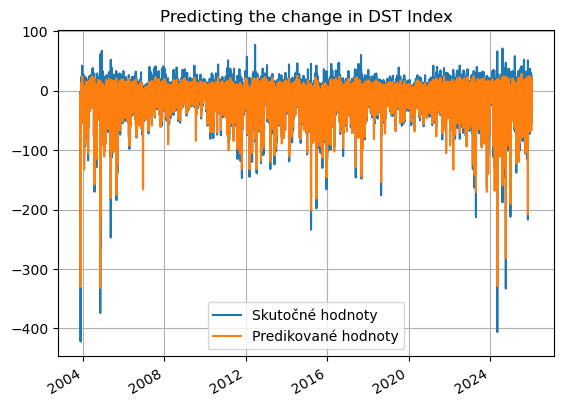

In [17]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [18]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.9158057904440164
MCC=0.744476207457004
Výkon NN:
MAE: 4.8982, MSE: 58.3461
Perzistentný model:
MAE: 5.2996, MSE: 68.9611
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 7.58%
MSE Improvement: 15.39%


In [19]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step 

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 44s 59ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step 

485/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 10:39 715ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step   

  5/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 32s 37ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 30s 37ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 29s 37ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step 

621/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 34s 37ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step 

485/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step


Shapes LSTM:
train: (229338,) (229338,)
val:   (57321,) (57321,)
test:  (194182,) (194182,)


Global sigma (LSTM errors, scaled): 0.41263953
Shapes GP:
X_gp_train: (286659, 18)
y_gp_train: (286659,)
X_test_gp: (194182, 18)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 1.89**2 * RBF(length_scale=0.393) + WhiteKernel(noise_level=0.714)


Global sigma (LSTM errors): 9.079683
Hybrid prediction with smoothed, inflated interval ready.


In [20]:
len(y_hybrid_upper)

194182

In [21]:
len(y_pred_persistence)

194177

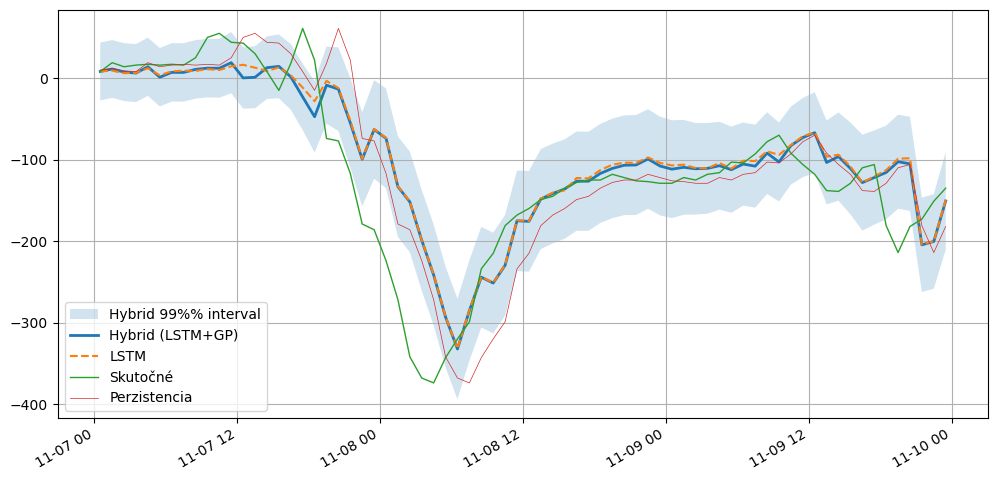

In [22]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})



start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [23]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = df['y_true']
y_pred_hybrid = df['y_hybrid']

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 62.0979
MAE: 5.0836

--- Klasifikačné metriky (Prah: -19.8 nT) ---
Matthews Correlation Coefficient (MCC): 0.7378

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      145035 |        7011
Skutočná 1 |        9906 |       32225

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.94      0.95      0.94    152046
   Trieda 1 (Búrka)       0.82      0.76      0.79     42131

           accuracy                           0.91    194177
          macro avg       0.88      0.86      0.87    194177
       weighted avg       0.91      0.91      0.91    194177



In [24]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.9158036224681605
MCC=0.7444745140889595
Výkon NN:
MAE: 4.8982, MSE: 58.3461
Perzistentný model:
MAE: 5.2996, MSE: 68.9611
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 7.58%
MSE Improvement: 15.39%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9341    0.9603    0.9470    152046
           1     0.8405    0.7553    0.7956     42131

    accuracy                         0.9158    194177
   macro avg     0.8873    0.8578    0.8713    194177
weighted avg     0.9137    0.9158    0.9141    194177


===== LSTM+GP =====
ACC=0.9128784562538302
MCC=0.7378190588593427
Výkon NN:
MAE: 5.0836, MSE: 62.0979
Perzistentný model:
MAE: 5.2996, MSE: 68.9611
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 4.08%
MSE Improvement: 9.95%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9361    0.9539    0.9449    152046
           1     0.8213    0.7649    0.7921     42131

   

/tmp/ipykernel_194470/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_194470/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
10,2026-04-25T22:20:34,LSTM,18.0,2.0,DST+2,OMNI2_all,-20.0,-20.0,0.931331,0.792266,"{""text"": "" precision recall f...",3.970476,37.947839,4.211526,43.256490,5.723593,12.272496
11,2026-04-25T22:20:34,LSTM+GP,18.0,2.0,DST+2,OMNI2_all,-20.0,-20.0,0.928514,0.784697,"{""text"": "" precision recall f...",4.137579,41.153213,4.211526,43.256490,1.755833,4.862338
12,2026-04-25T23:46:05,LSTM,24.0,2.0,DST+2,OMNI2_all,-20.0,-21.8,0.932045,0.794614,"{""text"": "" precision recall f...",4.032173,38.034446,4.211590,43.257647,4.260069,12.074629
13,2026-04-25T23:46:05,LSTM+GP,24.0,2.0,DST+2,OMNI2_all,-20.0,-21.8,0.924748,0.768567,"{""text"": "" precision recall f...",4.108914,40.169558,4.211590,43.257647,2.437937,7.138828
14,2026-04-26T00:26:45,LSTM,6.0,2.0,DST+2,OMNI2_all,-20.0,-19.7,0.931603,0.794943,"{""text"": "" precision recall f...",4.013647,37.395781,4.211529,43.255398,4.698564,13.546558
15,2026-04-26T00:26:45,LSTM+GP,6.0,2.0,DST+2,OMNI2_all,-20.0,-19.7,0.929441,0.789653,"{""text"": "" precision recall f...",4.134388,40.878004,4.211529,43.255398,1.831650,5.496179
16,2026-04-26T01:24:36,LSTM,12.0,3.0,DST+3,OMNI2_all,-20.0,-20.8,0.915605,0.742928,"{""text"": "" precision recall f...",4.926662,57.962115,5.299650,68.960383,7.037980,15.948676
17,2026-04-26T01:24:36,LSTM+GP,12.0,3.0,DST+3,OMNI2_all,-20.0,-20.8,0.908854,0.720692,"{""text"": "" precision recall f...",5.300624,65.438560,5.299650,68.960383,-0.018367,5.107023
18,2026-04-26T02:41:23,LSTM,18.0,3.0,DST+3,OMNI2_all,-20.0,-19.8,0.915804,0.744475,"{""text"": "" precision recall f...",4.898152,58.346062,5.299618,68.961051,7.575386,15.392732
19,2026-04-26T02:41:23,LSTM+GP,18.0,3.0,DST+3,OMNI2_all,-20.0,-19.8,0.912878,0.737819,"{""text"": "" precision recall f...",5.083607,62.097885,5.299618,68.961051,4.075971,9.952235
